In [3]:
from typing import List, Tuple, Iterable
import sys
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import copy
import scipy
import qiskit
from qiskit.quantum_info import SparsePauliOp
import math
from typing import *
import random
import itertools

In [29]:
class RBM():

    """
    A bound-based restricted quantum Boltzmann Machine based on "Quantum Boltzmann Machine" by Amin et al. 
    """

    def __init__(self, **kwargs) -> None:
        """
        Initialize the RBM model with various parameters.

        Parameters
        ----------
        numInputNodes: int, required
            The number of input nodes in the visible layer.
        numOutputNodes: int, required
            The number of output nodes in the visible layer. 
        numHiddenNodes: int, required
            The number of hidden nodes for for the hidden layer.
        beta: float, optional
            Specifies the inverse of the temperature. Default is 100.
        vvEdges: bool, optional
            Set to True to add edges between visible nodes (this is a semi-restricted Boltzmann Machine). Default is false.
        qrbm: bool, optional
            Set to True to add transverse (gamma) terms to Hamiltonian.
        trainTransverse: bool, optional
            Set to True to attempt to perform gradient descent on transverse (gamma) biases.
        """

        
        if not kwargs.get('numInputNodes'):
            raise Exception('You must specify the number of input nodes for the RBM.')
        else:
            numInputNodes = kwargs.get('numInputNodes')
            self.inputNodes = [i for i in range(numInputNodes)]

        
        if not kwargs.get('numOutputNodes'):
            raise Exception('You must specify the number of output nodes for the RBM.')
        else:
            numOutputNodes = kwargs.get('numOutputNodes')
            self.outputNodes = [i for i in range(numInputNodes, numInputNodes + numOutputNodes)]


        if not kwargs.get('numHiddenNodes'):
            raise Exception('You must specify the number of hidden nodes for the RBM.')
        else:
            numHiddenNodes = kwargs.get('numHiddenNodes')
            self.hiddenNodes = [i for i in range(numInputNodes + numOutputNodes, numOutputNodes + numInputNodes + numHiddenNodes)]

        
        self.visibleNodes = self.inputNodes + self.outputNodes
        self.nodes = self.inputNodes + self.outputNodes + self.hiddenNodes
        self.numNodes = len(self.nodes)

        
        if kwargs.get('vvEdges', False):
            self.edges = self.HVandVV()
        else:
            self.edges = self.HV()
            

        self.edgeWeights = {edge: np.random.normal(loc=0, scale=.01) for edge in self.edges}
        self.zNodeWeights = list(np.random.normal(loc=0, scale=.01, size=self.numNodes))


        self.beta = kwargs.get('beta', 100)
        self.qrbm = kwargs.get('qrbm', False)
        self.trainTransverse = kwargs.get('trainTransverse', False)
        
        if self.qrbm:
            self.xNodeWeights = list(np.random.normal(loc=0, scale=.01, size=self.numNodes))
        else:
            self.xNodeWeights = None

        if self.trainTransverse and not self.qrbm:
            raise Exception("Training transverse terms requires qrbm to be True.")


    def clampedAvgXweight(self, node: int, visibleStates: List[Tuple[int]], PvData: Dict[Tuple[int], float]) -> int:
        """
        Positive phase for x gradient step.
        """
        total = 0

        for v in visibleStates:

            H = self.getClampedHamiltonian(v)
            p = self.getDensityMatrix(H)
    
            sigmaX = ['I'] * self.numNodes
            sigmaX[node] = 'X'
            sigmaX = ''.join(reversed(sigmaX))
            sigmaX = SparsePauliOp.from_list([(sigmaX, 1)])

            if node in self.visibleNodes and p.expectation_value(sigmaX).real != 0:
                raise Exception(f"Positive phase for sigmaX_vis is not zero. Its value is {p.expectation_value(sigmaX).real}")

            total += PvData[v] * p.expectation_value(sigmaX).real 

        return total
   

    def unclampedAvgXweight(self, node: int, unclampedP: qiskit.quantum_info.DensityMatrix) -> int:
        """
        Negative phase for x gradient step.
        """
        sigmaX = ['I'] * self.numNodes
        sigmaX[node] = 'X'
        sigmaX = ''.join(reversed(sigmaX))
        sigmaX = SparsePauliOp.from_list([(sigmaX, 1)])

        return unclampedP.expectation_value(sigmaX).real


    def b_i_eff(self, node: int, v: List[int]) -> int:
        """
        Calculates the b_i_eff value.

        (Line after equation 33)
        """
        if node not in self.hiddenNodes:
            raise Exception("This function should only be passed hidden nodes.")

        wvSum = self.zNodeWeights[node]
        for edge in self.edges:
            n1, n2 = edge
            if node == n1 or node == n2:
                
                if n1 in self.visibleNodes and n2 in self.hiddenNodes:
                    wvSum += self.edgeWeights[edge] * v[n1]
                    
                elif n2 in self.visibleNodes and n1 in self.hiddenNodes:
                    wvSum += self.edgeWeights[edge] * v[n2]

        return wvSum


    def clampedAvgZweightHidden(self, node: int, v: List[int]) -> int:
        """
        Positive phase for z gradient step (only hidden nodes).
        """
        if node not in self.hiddenNodes:
            raise Exception("This function should only be passed hidden nodes.")

        if not self.qrbm:
            return math.tanh(self.b_i_eff(node, v) * self.beta)
        
        b_i_eff = self.b_i_eff(node, v) * self.beta
        gamma_i = self.xNodeWeights[node] * self.beta
        D_i = math.sqrt((gamma_i ** 2) + (b_i_eff ** 2))

        return (b_i_eff / D_i) * math.tanh(D_i)


    def clampedAvgZweight(self, node: int, visibleStates: List[Tuple[int]], PvData: Dict[Tuple[int], float]) -> int:
        """
        Positive phase for z gradient step.
        """
        total = 0

        for v in visibleStates:

            H = self.getClampedHamiltonian(v) 
            p = self.getDensityMatrix(H)

            sigmaZ = ['I'] * self.numNodes

            c=1
            if node in self.hiddenNodes:
                sigmaZ[node] = 'Z'
            else:
                c *= v[node]
            
            sigmaZ = ''.join(reversed(sigmaZ))
            sigmaZ = SparsePauliOp.from_list([(sigmaZ, c)])

            if node in self.hiddenNodes and not np.isclose(self.clampedAvgZweightHidden(node, v), p.expectation_value(sigmaZ).real):
                raise Exception(f"Long and short computations for sigmaZ_hidden do not match. They are {p.expectation_value(sigmaZ).real} and {self.clampedAvgZweightHidden(node, v)}, respectively.")
                
            total += PvData[v] * p.expectation_value(sigmaZ).real        

        return total


    def unclampedAvgZweight(self, node: int, unclampedP: qiskit.quantum_info.DensityMatrix) -> int:
        """
        Negative phase for z gradient step.
        """
        sigmaZ = ['I'] * self.numNodes
        sigmaZ[node] = 'Z'                
        sigmaZ = ''.join(reversed(sigmaZ))
        sigmaZ = SparsePauliOp.from_list([(sigmaZ, 1)])

        return unclampedP.expectation_value(sigmaZ).real        


    def clampedAvgEdgeWeight(self, edge: Tuple[int, int], visibleStates: List[Tuple[int]], PvData: Dict[Tuple[int], float]) -> int:
        """
        Positive phase for edge gradident step.
        """
        total = 0

        for v in visibleStates:

            H = self.getClampedHamiltonian(v)
            p = self.getDensityMatrix(H)

            n1, n2 = edge
            doubleSigmaZ = ['I'] * self.numNodes
            
            c = 1
            
            if n1 in self.hiddenNodes:
                doubleSigmaZ[n1] = 'Z'
            else:
                c *= v[n1]
                
            if n2 in self.hiddenNodes:
                doubleSigmaZ[n2] = 'Z'
            else:
                c *= v[n2]

            doubleSigmaZ = ''.join(reversed(doubleSigmaZ))
            doubleSigmaZ = SparsePauliOp.from_list([(doubleSigmaZ, c)])
            total += PvData[v] * p.expectation_value(doubleSigmaZ).real

        return total


    def unclampedAvgEdgeWeight(self, edge: Tuple[int, int], unclampedP: qiskit.quantum_info.DensityMatrix) -> int:
        """
        Negative phase for edge gradient step.
        """      
        n1, n2 = edge
        doubleSigmaZ = ['I'] * self.numNodes       
        doubleSigmaZ[n1] = 'Z'
        doubleSigmaZ[n2] = 'Z'        
        doubleSigmaZ = ''.join(reversed(doubleSigmaZ))
        doubleSigmaZ = SparsePauliOp.from_list([(doubleSigmaZ, 1)])
        
        return unclampedP.expectation_value(doubleSigmaZ).real


    def getDensityMatrix(self, H: SparsePauliOp) -> qiskit.quantum_info.DensityMatrix:
        """
        Returns the density matrix given any Hamiltonian (clamped or unclamped).
        (Equation 12)
        """
    
        eToNegH = scipy.linalg.expm((-H * self.beta).to_matrix())
        partitionFunction = np.trace(eToNegH)
        p = qiskit.quantum_info.DensityMatrix(eToNegH / partitionFunction)
        
        return p


    def getClampedHamiltonian(self, v: List[int]) -> SparsePauliOp:
        """
        Returns the clamped Hamiltonian for an RBM. If qrbm, then sigmaX and sigmaZ terms are included for 
        each node, otherwise just sigmaZ terms are included.
        
        (Equation 33)
        """

        data = []

        for hiddenNode in self.hiddenNodes:
            sigmaZ  = ['I'] * self.numNodes
            sigmaZ[hiddenNode] = 'Z'
            data.append((''.join(reversed(sigmaZ)), -1 * self.b_i_eff(hiddenNode, v)))
            
        if self.qrbm:
            for hiddenNode in self.hiddenNodes:
                sigmaX  = ['I'] * self.numNodes
                sigmaX[hiddenNode] = 'X'
                data.append((''.join(reversed(sigmaX)), -1 * self.xNodeWeights[hiddenNode]))

        return SparsePauliOp.from_list(data)


    def getUnclampedHamiltonian(self) -> SparsePauliOp:
        """
        Returns the unclamped Hamiltonian for an RBM. If qrbm, then sigmaX and sigmaZ terms are included for 
        each node, otherwise just sigmaZ terms are included.
        
        (Equation 16)
        """
    
        data = []
        
        for node in self.nodes:
            sigmaZ  = ['I'] * self.numNodes
            sigmaZ[node] = 'Z'
            data.append((''.join(reversed(sigmaZ)), -1 * self.zNodeWeights[node]))

    
        if self.qrbm:
            for node in self.nodes:
                sigmaX  = ['I'] * self.numNodes
                sigmaX[node] = 'X'
                data.append((''.join(reversed(sigmaX)), -1 * self.xNodeWeights[node]))
        
        for edge in self.edges:
            n1, n2 = edge
            doubleSigmaZ = ['I'] * self.numNodes
            doubleSigmaZ[n1] = 'Z'
            doubleSigmaZ[n2] = 'Z'
            data.append((''.join(reversed(doubleSigmaZ)), -1 * self.edgeWeights[edge]))


        return SparsePauliOp.from_list(data)


    def logLikelihood(self, PvData: dict[Tuple[int], float], PvModel: dict[Tuple[int], float], eps: float) -> List[Tuple[int, complex]]:
        """
        Computes logLikelihood of the data and model distributions.

        (Equation 3)
        """
        llh = 0

        for state in PvModel.keys():
            if PvData[state] != 0:
                modelVal = eps if PvModel[state] == 0 else PvModel[state]
                llh -= PvData[state] * np.log(modelVal)

        return llh


    def updateBeta(self, epoch: int, initialBeta: float, finalBeta: float, tempSchedule: str, betaGrowthEpochs: int) -> None:
        """
        Used to update beta based on the temperature schedule. 
        """
        if tempSchedule == "linear":
            self.beta = finalBeta + (((finalBeta - initialBeta) / (betaGrowthEpochs)) * (epoch - betaGrowthEpochs))
            
        elif tempSchedule == "exponential":
            self.beta = finalBeta - ((finalBeta - initialBeta) * (math.exp((-1 * epoch) / (betaGrowthEpochs / 4)))) # 4 is a hyperparameter


    def train(self, **kwargs) -> None:
        """
        Train the RBM.

        Parameters
        ----------
        data: list of tuples or dictionary in PvData form (v, prob), required
            The data distribution to be learned by the RBM.
        optimizer: str in ["adam", ], optional
            Specify an optimizer. Default is "adam".
        alpha: float, optional
            Specify the learning rate / alpha hyperparamter for Adam. Default is .001.
        b1 : float, optional
            Exponential decay rate for the first moment estimates (beta1) for ADAM optimizer. Default is 0.9.
        b2 : float, optional
            Exponential decay rate for the second moment estimates (beta2) for ADAM optimizer. Default is 0.999.
        epsilon : float, optional
            Small constant for numerical stability in ADAM optimizer. Default is 1e-8.
        epochs: int, optional
            Specify the number of epochs to train. Default is 200.
        tempSchedule: str in ["linear", "exponential"], optional
            Specify a temperature schedule type. Default is None.
        finalBeta: float, optional
            Specify a final beta value (only to be used with a tempSchedule). Default is None.
        betaGrowthEpochs: int, optional
            How many epochs for which beta should change (starts from beginning of training). Default is None.
        verbose: bool, optional
            Include many print statements if True. Default is True.
        infoEveryNepochs: int, optional
            If verbose, print information every N epochs. Default is 1.
        """
        optimizer = kwargs.get('optimizer', "adam")
        optimizer = optimizer.lower() if optimizer else optimizer
        alpha = kwargs.get('alpha', .001)
        b1 = kwargs.get('b1', .9)
        b2 = kwargs.get('b2', .999)
        epsilon = kwargs.get('epsilon', 1e-8)
        epochs = kwargs.get('epochs', 200)
        tempSchedule = kwargs.get('tempSchedule', None)
        tempSchedule = tempSchedule.lower() if tempSchedule else tempSchedule
        finalBeta = kwargs.get('finalBeta', None)
        betaGrowthEpochs = kwargs.get('betaGrowthEpochs', None)
        verbose = kwargs.get('verbose', True)
        infoEveryNepochs = kwargs.get('infoEveryNepochs', 1)

        
        if tempSchedule:
            if not finalBeta:
                raise Exception("Specify a final value for beta.")

            if tempSchedule not in ["linear", "exponential"]:
                raise Exception("Type of temp schedule not found.")
            
            if not betaGrowthEpochs:
                raise Exception("Specify how long beta should grow for (the first n epochs).")
     
            if betaGrowthEpochs > epochs:
                raise Exception("betaGrowthEpochs must be less than or equal to epochs.")

        if not tempSchedule and (finalBeta or betaGrowthEpochs):
            raise Exception("finalBeta and betaGrowthEpochs each require a specified tempSchedule.")

        if optimizer:
            if optimizer not in ["adam"]:
                raise Exception("Optimizer not found")

        
        initialBeta = self.beta
        numHidden = len(self.hiddenNodes)
        numVisible = len(self.visibleNodes)
        PvData = self.getPvData(data)
        visibleStates = self.getAllStatesPlusMinus1(numVisible)
        zList = []
        edgeList = []
        xList = []

        if verbose:
            print("Initial z weights:", self.zNodeWeights)
            print("Initial edge weights:", self.edgeWeights)
            print("Initial x weights:", self.xNodeWeights)
            print("visibleStates:", visibleStates) 

        #############################################################################################################

        llhList = []
        betaList = []
        
        m_z = [0] * self.numNodes
        v_z = [0] * self.numNodes

        m_edge = {edge: 0 for edge in self.edges}
        v_edge = {edge: 0 for edge in self.edges}

        m_x = [0] * self.numNodes
        v_x = [0] * self.numNodes

        # Iterate over the number of epochs
        for i in range(epochs):
        
            unclampedHamiltonian = self.getUnclampedHamiltonian()
            unclampedP = self.getDensityMatrix(unclampedHamiltonian)
            
            if tempSchedule:
                if i <= betaGrowthEpochs:
                    self.updateBeta(i, initialBeta, finalBeta, tempSchedule, betaGrowthEpochs)

            if verbose and (i % infoEveryNepochs == 0):
                dataDistribution = self.getPvData(data)
                modelDistribution = self.getPvModel()
                print("data:", dataDistribution)
                print("model:", modelDistribution)
                llh = self.logLikelihood(dataDistribution, modelDistribution, 1e-11)
                print("LLH:", llh)
                llhList.append((i, llh))
                print("beta:", self.beta)
                betaList.append((i,self.beta))
                print("EPOCH:", i)

                self.graphDistributions(dataDistribution, modelDistribution, True)

        
            newZweights = copy.copy(self.zNodeWeights)
            newEdgeWeights = copy.copy(self.edgeWeights)
            newXweights = copy.copy(self.xNodeWeights)
            
            #############################################################################################################

            # Z weights (b term)

            if not optimizer:
                for node in self.nodes:
                    positivePhase = self.clampedAvgZweight(node, visibleStates, PvData)
                    negativePhase = self.unclampedAvgZweight(node, unclampedP)
                    gradientStep = alpha * (positivePhase - negativePhase)
                    newZweights[node] += gradientStep
                    print(f"z gradient step for node {node}: {gradientStep}") if verbose else None
                    
            if optimizer == "adam":
                g = [0] * self.numNodes
                
                for node in self.nodes:
                    positivePhase = self.clampedAvgZweight(node, visibleStates, PvData)
                    negativePhase = self.unclampedAvgZweight(node, unclampedP)
                    gradientStep = positivePhase - negativePhase
                    g[node] = gradientStep
                    print(f"z gradient step for node {node}: {gradientStep}") if verbose else None
    
                m_z = [b1 * m_z[node] + (1 - b1) * g[node] for node in self.nodes]
                v_z = [b2 * v_z[node] + (1 - b2) * (g[node] ** 2) for node in self.nodes]
    
                mHat = [m_z[node] / (1 - (b1 ** (i + 1))) for node in self.nodes]
                vHat = [v_z[node] / (1 - (b2 ** (i + 1))) for node in self.nodes]
    
                adamTerm = [-1 * alpha * mHat[node] / (math.sqrt(vHat[node]) + epsilon) for node in self.nodes]
                
                for node in self.nodes:
                    newZweights[node] -= adamTerm[node]

            zList.append((i, newZweights))
                
            #############################################################################################################

            # Edge weights (w term)

            if not optimizer:
                for edge in self.edges:
                    positivePhase = self.clampedAvgEdgeWeight(edge, visibleStates, PvData)
                    negativePhase = self.unclampedAvgEdgeWeight(edge, unclampedP)
                    gradientStep = alpha * (positivePhase - negativePhase)
                    newEdgeWeights[edge] += gradientStep
                    print(f"edge graident step for edge {edge}: {gradientStep}") if verbose else None

            if optimizer == "adam":
                g = {edge: 0 for edge in self.edges}
    
                for edge in self.edges:
                    positivePhase = self.clampedAvgEdgeWeight(edge, visibleStates, PvData)
                    negativePhase = self.unclampedAvgEdgeWeight(edge, unclampedP)
                    gradientStep = positivePhase - negativePhase
                    g[edge] = gradientStep
                    print(f"edge graident step for edge {edge}: {gradientStep}") if verbose else None
    
                m_edge = {edge: b1 * m_edge[edge] + (1 - b1) * g[edge] for edge in self.edges}
                v_edge = {edge: b2 * v_edge[edge] + (1 - b2) * (g[edge] ** 2) for edge in self.edges}
    
                mHat_edge = {edge: m_edge[edge] / (1 - (b1 ** (i + 1))) for edge in self.edges}
                vHat_edge = {edge: v_edge[edge] / (1 - (b2 ** (i + 1))) for edge in self.edges}
    
                adamTerm = {edge: -1 * alpha * mHat_edge[edge] / (math.sqrt(vHat_edge[edge]) + epsilon) for edge in self.edges}

                for edge in self.edges:
                    newEdgeWeights[edge] -= adamTerm[edge]

            edgeList.append((i, newEdgeWeights))
            
            #############################################################################################################

            # x weights (gamma term)

            if self.trainTransverse:

                if not optimizer:
                    for node in self.nodes:
                        positivePhase = self.clampedAvgXweight(node, visibleStates, PvData)
                        negativePhase = self.unclampedAvgXweight(node, unclampedP)
                        print("x positive phase:", positivePhase)
                        print("x negative phase:", negativePhase)
                        gradientStep = alpha * (positivePhase - negativePhase)
                        newXweights[node] += gradientStep
                        print(f"x gradient step for node {node}: {gradientStep}") if verbose else None
                        
                if optimizer == "adam":
                    g = [0] * self.numNodes
                    
                    for node in self.nodes:
                        positivePhase = self.clampedAvgXweight(node, visibleStates, PvData)
                        negativePhase = self.unclampedAvgXweight(node, unclampedP)
                        gradientStep = positivePhase - negativePhase
                        g[node] = gradientStep
                        print(f"x gradient step for node {node}: {gradientStep}") if verbose else None
        
                    m_x = [b1 * m_x[node] + (1 - b1) * g[node] for node in self.nodes]
                    v_x = [b2 * v_x[node] + (1 - b2) * (g[node] ** 2) for node in self.nodes]
        
                    mHat = [m_x[node] / (1 - (b1 ** (i + 1))) for node in self.nodes]
                    vHat = [v_x[node] / (1 - (b2 ** (i + 1))) for node in self.nodes]
        
                    adamTerm = [-1 * alpha * mHat[node] / (math.sqrt(vHat[node]) + epsilon) for node in self.nodes]
                    
                    for node in self.nodes:
                        newXweights[node] -= adamTerm[node]

            if self.qrbm:
                xList.append((i, newXweights))

        
            #############################################################################################################

            self.zNodeWeights = newZweights
            self.edgeWeights = newEdgeWeights
            self.xNodeWeights = newXweights
        
        if verbose:
            print("llhList:", llhList)
            minLLH = min(llhList, key=lambda x: x[1])
            print("minLLH:", minLLH)
            self.graphllhList(llhList)
            self.graphBetaList(betaList)
            self.plotAbsoluteWeights(zList, edgeList, xList)

        #############################################################################################################


    def getPvData(self, data: List[Tuple[int]]) -> dict[Tuple[int], float]:
        """
        Returns the data's probability distribution.
        """
        if isinstance(data, dict):
            if len(data) != 2 ** len(self.visibleNodes):
                raise Exception("Please specify probabilities for all possible states v")
            else: 
                return data
    
        visibleStates = self.getAllStatesPlusMinus1(len(self.visibleNodes))
        counts  = {visibleState: 0 for visibleState in visibleStates}
    
        for d in data:
            counts[d] += 1
    
        numDatapoints = len(data)
        PvData = {visibleState: count / numDatapoints for visibleState, count in counts.items()}
    
        return PvData
        
    
    def getPvModel(self) -> Dict[Tuple[int], float]:
        """
        Returns the model's probability distribution.
        
        (Equation 13)
        """
        modelDistribution = {}
        H = self.getUnclampedHamiltonian()
        p = self.getDensityMatrix(H)
        visibleStates = self.getAllStatesPlusMinus1(len(self.visibleNodes))
        numVisibleStates = len(visibleStates)
        Ih = np.identity(int(math.pow(2, len(self.hiddenNodes))))

        for state in visibleStates:
            reverseStateIndex = -1
            for i, node in enumerate(state):
                if node == 1:
                    reverseStateIndex -= int(math.pow(2, i))
            bra = [0] * numVisibleStates
            bra[reverseStateIndex] = 1
            bra = np.matrix(bra).reshape(1, -1)
            ket = bra.H
            outerProd = ket @ bra
            lambdaV = np.kron(Ih, outerProd)

            Pv = np.trace(lambdaV.dot(p))
            modelDistribution[state] = Pv.real
            
        return modelDistribution


    def _autolabel(self, rects, ax):
        """Attach a text label above each bar in *rects*, displaying its height."""
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.3f}',
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')


    def graphDistributions(self, 
                           dataDistribution: Dict[Tuple[int], float], 
                           modelDistribution: Dict[Tuple[int], float], label: bool) -> None:
        """Graphs the data and model distributions for visual comparison."""
        # Extract keys and values
        labels = list(modelDistribution.keys())
        dataValues = [np.real(value) for value in dataDistribution.values()]
        modelValues = [np.real(value) for value in modelDistribution.values()]
        
        # Convert tuples to string for better visualization
        labelStrings = [str(label) for label in labels]
        
        x = np.arange(len(labels))  # the label locations
        width = 0.35  # the width of the bars
        
        fig, ax = plt.subplots()
        rects1 = ax.bar(x - width/2, modelValues, width, label='Model', color='blue')
        rects2 = ax.bar(x + width/2, dataValues, width, label='Data', color='orange')
        
        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_xlabel('Binary Strings')
        ax.set_ylabel('Probability')
        ax.set_title('Probability Distribution Comparison')
        ax.legend()

        if label:
            ax.set_xticks(x)
            ax.set_xticklabels(labelStrings)
            self._autolabel(rects1, ax)
            self._autolabel(rects2, ax)
        
        fig.tight_layout()
        plt.show()


    def plotAbsoluteWeights(self, zList: List[Tuple[int, List[float]]], edgeList: List[Tuple[int, Dict[Tuple[int, int], float]]], xList: List[Tuple[int, List[float]]]) -> None:
        """
        Plots the absolute values of each weight in a different color on one graph.
        """
        plt.figure(figsize=(12, 8))
        
        # Plot absolute Z weights
        if zList:
            epochs_z, z_weights = zip(*zList)
            for node_idx in range(len(z_weights[0])):
                node_weights = [abs(weights[node_idx]) for weights in z_weights]
                plt.plot(epochs_z, node_weights, marker='o', linestyle='-', label=f'Node {node_idx} Z-Weights')
    
        # Plot absolute Edge weights
        if edgeList:
            epochs_edge, edge_weights = zip(*edgeList)
            all_edges = set(edge for epoch_weights in edge_weights for edge in epoch_weights)
            for edge in all_edges:
                edge_weight_values = [abs(epoch_weights.get(edge, 0)) for epoch_weights in edge_weights]
                plt.plot(epochs_edge, edge_weight_values, marker='x', linestyle='--', label=f'Edge {edge} Weights')
    
        # Plot absolute X weights if xList is not empty
        if xList:
            epochs_x, x_weights = zip(*xList)
            for node_idx in range(len(x_weights[0])):
                node_weights = [abs(weights[node_idx]) for weights in x_weights]
                plt.plot(epochs_x, node_weights, marker='s', linestyle='-.', label=f'Node {node_idx} X-Weights')
    
        plt.xlabel('Epoch')
        plt.ylabel('Absolute Weight')
        plt.title('Absolute Weights by Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()

    def graphllhList(self, llhList: List[Tuple[int, float]]) -> None:
        """
        Plots log-likelihood by epoch.
        """
        epochs, logLikelihoods = zip(*llhList)
        plt.figure(figsize=(10, 6))
        plt.plot(epochs, logLikelihoods, marker='o', linestyle='-')
        plt.xlabel('Epoch')
        plt.ylabel('Log-Likelihood')
        plt.title('Log-Likelihood by Epoch')
        plt.grid(True)
        plt.show()

    def graphBetaList(self, betaList: List[Tuple[int, float]]) -> None:
        """
        Plots log-likelihood by epoch.
        """
        epochs, betas = zip(*betaList)
        plt.figure(figsize=(10, 6))
        plt.plot(epochs, betas, marker='o', linestyle='-', color='red')
        plt.xlabel('Epoch')
        plt.ylabel('Beta')
        plt.title('Beta Values by Epoch')
        plt.grid(True)
        plt.show()
    
    
    def getAllStatesPlusMinus1(self, nodeCount: int) -> List[Tuple[int, int]]:
        """
        Returns all possible bitsrings for states up to ceil(log2(n)) with -1 and 1 (little endian).
    
        Example: getAllStatesPlusMinus1(3) -> [(-1,-1), (-1,1), (1,-1), (1,1)]
        """           
        return [tuple((1 if (i >> bit) & 1 else -1) for bit in reversed(range(nodeCount))) for i in range(2**nodeCount)]


    def HV(self) -> List[Tuple[int, int]]:
        """
        Creates a fully connected bipartite graph with edges from every visible node (input and output) to every hidden node.
    
        Edges are of the form (low, high); equivalently, (visible, hidden).
        """
        if len(self.nodes) != len(set(self.nodes)):
            raise Exception("Not all nodes are unique.")

        return [(min(visible, hidden), max(visible, hidden)) for visible in self.visibleNodes for hidden in self.hiddenNodes]


    def HVandVV(self) -> List[Tuple[int, int]]:
        """
        Gets the undirected edges for a graph that has all possible connections between (hidden, visible) nodes 
        and all possible connections between (visible, visible) nodes.
        """
        if len(self.nodes) != len(set(self.nodes)):
            raise Exception("Not all nodes are unique.")

        HV = self.HV()

        VV = list(itertools.combinations(self.visibleNodes, 2))

        return HV + VV
        

    def drawQBM(self) -> None:
        """
        Draws a QBM given a list of input nodes, output nodes, and hidden nodes.
        """
        # Initialize graph and add edges
        G = nx.Graph()
        G.add_edges_from(self.edges)
        
        # Assign colors
        color_map = {node: 'green' for node in self.inputNodes}
        color_map.update({node: 'blue' for node in self.outputNodes})
        color_map.update({node: 'red' for node in self.hiddenNodes})
        node_colors = [color_map[node] for node in G.nodes()]
        
        pos = {}
        
        # Set input node positions
        for i, node in enumerate(self.inputNodes):
            pos[node] = (0, i)
        
        # Set output node positions
        for i, node in enumerate(self.outputNodes):
            pos[node] = (0, len(self.inputNodes) + i)
            
        # Set hidden node positions
        visCount = len(self.visibleNodes)
        vertMidpt = visCount / 2
        
        for i, node in enumerate(self.hiddenNodes):
            pos[node] = (2, vertMidpt - (len(self.hiddenNodes) / 2) + i)
        
        # Draw the graph
        nx.draw(G, pos, with_labels=True, node_color=node_colors, node_size=500, font_size=10, font_color='white')

Initial z weights: [0.008636715786037714, -0.0034981917633842836, -0.009198876977218506]
Initial edge weights: {(0, 2): -0.0051215809194768685, (1, 2): 0.013049106903198658}
Initial x weights: [-0.0018441648304489131, 0.010664996758796183, -0.01252743613947977]
visibleStates: [(-1, -1), (-1, 1), (1, -1), (1, 1)]
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.06216173124945967, (-1, 1): 0.022861268267605473, (1, -1): 0.7795476653353218, (1, 1): 0.13542933514761302}
LLH: 1.9078983483916354
beta: 100
EPOCH: 0


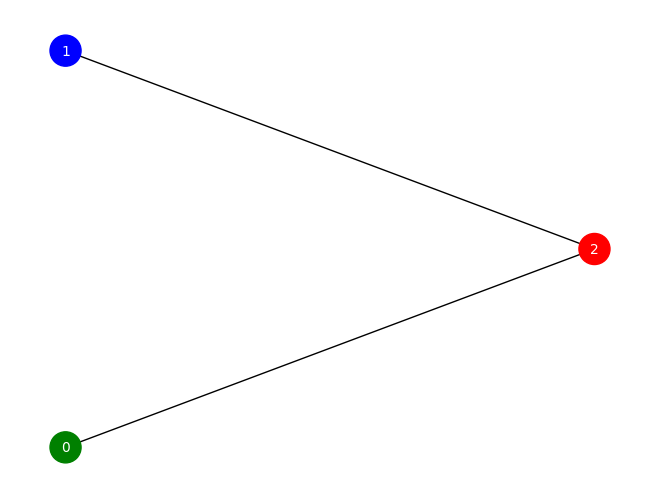

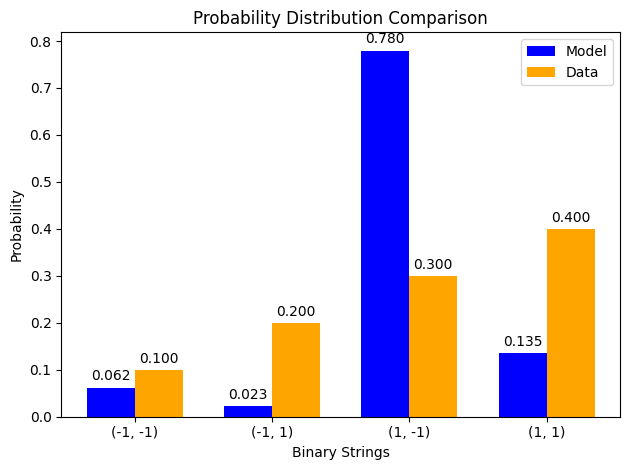

z gradient step for node 0: -0.004299540009658697
z gradient step for node 1: 0.008834187931695629
z gradient step for node 2: 0.005073137431429585
edge graident step for edge (0, 2): 0.003735211664831813
edge graident step for edge (1, 2): -0.0027448657200993404
x positive phase: 0.0
x negative phase: -0.12394632293428104
x gradient step for node 0: 0.0012394632293428105
x positive phase: 0.0
x negative phase: 0.565395130336652
x gradient step for node 1: -0.00565395130336652
x positive phase: -0.6685511279755878
x negative phase: -0.4972107656513668
x gradient step for node 2: -0.00171340362324221
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.0968026326798574, (-1, 1): 0.19814913564713355, (1, -1): 0.27550461212132676, (1, 1): 0.42954361955168213}
LLH: 1.2820132394972628
beta: 100
EPOCH: 1


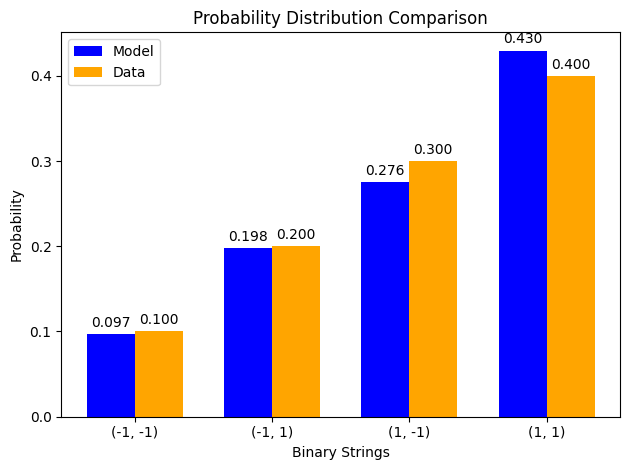

z gradient step for node 0: -0.0001009646334601788
z gradient step for node 1: -0.0005538551039763156
z gradient step for node 2: -0.00022406149449756302
edge graident step for edge (0, 2): -0.00021644496220880215
edge graident step for edge (1, 2): 0.0003937993154785674
x positive phase: 0.0
x negative phase: -0.05661911721230156
x gradient step for node 0: 0.0005661911721230157
x positive phase: 0.0
x negative phase: 0.3911546792525385
x gradient step for node 1: -0.003911546792525385
x positive phase: -0.7722798930446636
x negative phase: -0.7857190122077448
x gradient step for node 2: 0.0001343911916308116
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10239542406658687, (-1, 1): 0.19481382152743032, (1, -1): 0.2993374472365083, (1, 1): 0.40345330716947453}
LLH: 1.2799664467673633
beta: 100
EPOCH: 2


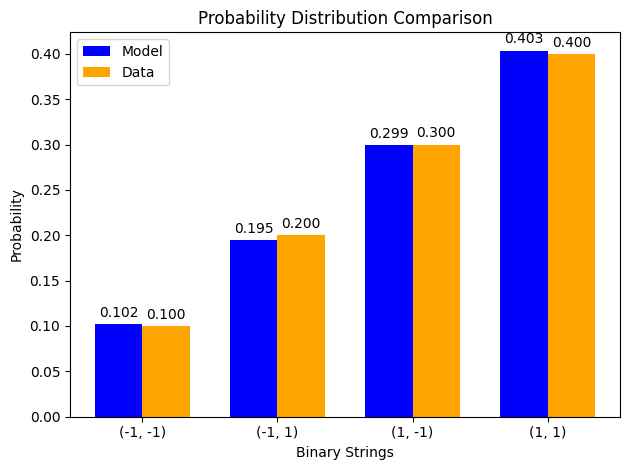

z gradient step for node 0: -5.5815088119654524e-05
z gradient step for node 1: 3.465742606190481e-05
z gradient step for node 2: 2.7512117921887763e-05
edge graident step for edge (0, 2): -5.227803856460767e-05
edge graident step for edge (1, 2): 1.7132473326688656e-05
x positive phase: 0.0
x negative phase: -0.0036102852023318
x gradient step for node 0: 3.6102852023318e-05
x positive phase: 0.0
x negative phase: 0.09111090220202192
x gradient step for node 1: -0.0009111090220202192
x positive phase: -0.7619918964641308
x negative phase: -0.7624389651485594
x gradient step for node 2: 4.470686844285643e-06
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1020933738358219, (-1, 1): 0.19767621196173923, (1, -1): 0.2974753749043143, (1, 1): 0.40275503929812473}
LLH: 1.279909568628596
beta: 100
EPOCH: 3


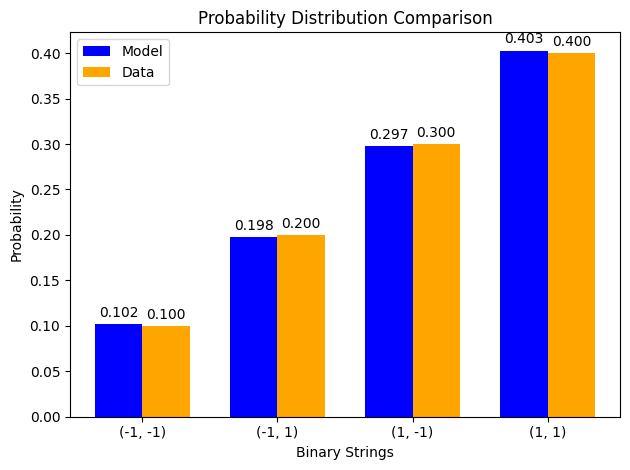

z gradient step for node 0: -4.608284048778777e-06
z gradient step for node 1: -8.625025197277204e-06
z gradient step for node 2: -2.1510369545128804e-06
edge graident step for edge (0, 2): -5.1153700672054715e-05
edge graident step for edge (1, 2): 8.13276967034926e-06
x positive phase: 0.0
x negative phase: -0.00022598745571860134
x gradient step for node 0: 2.2598745571860136e-06
x positive phase: 0.0
x negative phase: 0.01563968248590552
x gradient step for node 1: -0.0001563968248590552
x positive phase: -0.7614476251284608
x negative phase: -0.7618198026562484
x gradient step for node 2: 3.721775277876205e-06
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10187706609636074, (-1, 1): 0.19797361616366765, (1, -1): 0.29875092191738045, (1, 1): 0.401398395822591}
LLH: 1.279887007046741
beta: 100
EPOCH: 4


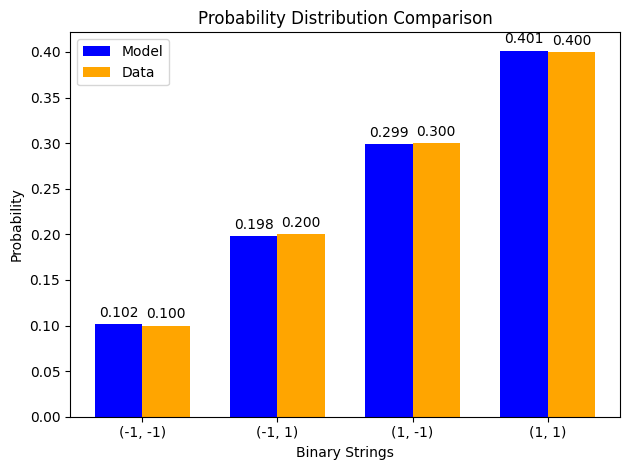

z gradient step for node 0: -2.986354799430213e-06
z gradient step for node 1: 1.2559760274825639e-05
z gradient step for node 2: 8.424126499257945e-06
edge graident step for edge (0, 2): -3.503319659815207e-05
edge graident step for edge (1, 2): 2.3134413163439226e-06
x positive phase: 0.0
x negative phase: -1.385980461798076e-05
x gradient step for node 0: 1.3859804617980761e-07
x positive phase: 0.0
x negative phase: 0.002656525873300162
x gradient step for node 1: -2.656525873300162e-05
x positive phase: -0.7610975984982064
x negative phase: -0.7611935799317895
x gradient step for node 2: 9.59814335831366e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1014393246670474, (-1, 1): 0.1985734447438417, (1, -1): 0.29874326240950533, (1, 1): 0.4012439681796056}
LLH: 1.2798741677618528
beta: 100
EPOCH: 5


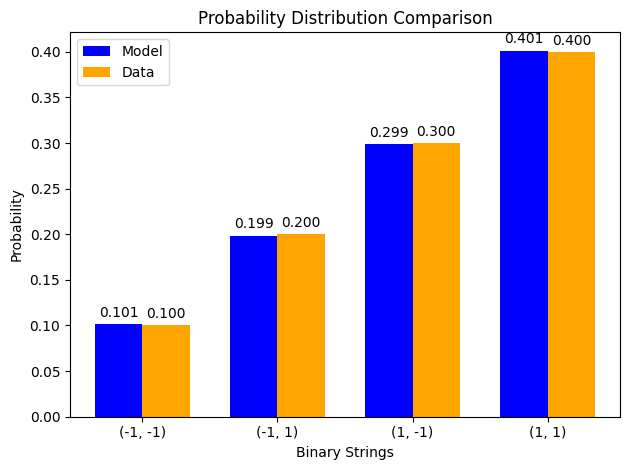

z gradient step for node 0: 2.5538821778192666e-07
z gradient step for node 1: 3.651741531053299e-06
z gradient step for node 2: 3.1725231450313585e-06
edge graident step for edge (0, 2): -2.900174277772061e-05
edge graident step for edge (1, 2): 2.9919876765854837e-06
x positive phase: 0.0
x negative phase: -8.541868088132402e-07
x gradient step for node 0: 8.541868088132402e-09
x positive phase: 0.0
x negative phase: 0.00045059102063257385
x gradient step for node 1: -4.505910206325739e-06
x positive phase: -0.7609432542307946
x negative phase: -0.7610815366052606
x gradient step for node 2: 1.3828237446600333e-06
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1011456193741815, (-1, 1): 0.19884551869970057, (1, -1): 0.29911237670104407, (1, 1): 0.4008964852250737}
LLH: 1.2798664021363788
beta: 100
EPOCH: 6


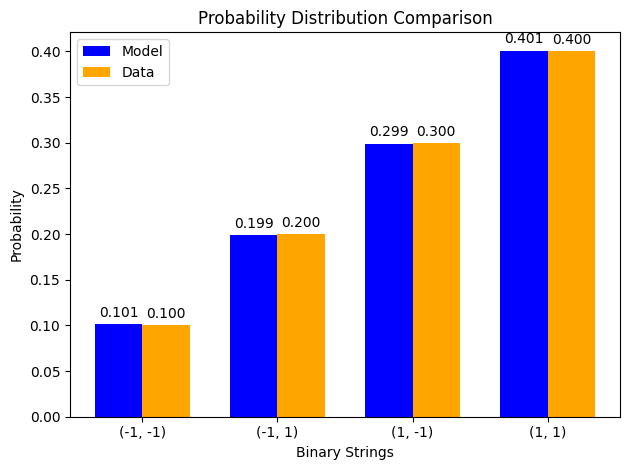

z gradient step for node 0: -1.7723852235751458e-07
z gradient step for node 1: 5.1599215045144976e-06
z gradient step for node 2: 3.735438465170826e-06
edge graident step for edge (0, 2): -2.206840164138163e-05
edge graident step for edge (1, 2): 1.9393776680282082e-06
x positive phase: 0.0
x negative phase: -5.276170525192802e-08
x gradient step for node 0: 5.276170525192803e-10
x positive phase: 0.0
x negative phase: 7.651051638452825e-05
x gradient step for node 1: -7.651051638452825e-07
x positive phase: -0.7607850633059006
x negative phase: -0.760872533782919
x gradient step for node 2: 8.747047701840316e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10089065424180238, (-1, 1): 0.1991160300749809, (1, -1): 0.29927124476072436, (1, 1): 0.4007220709224923}
LLH: 1.2798616655724415
beta: 100
EPOCH: 7


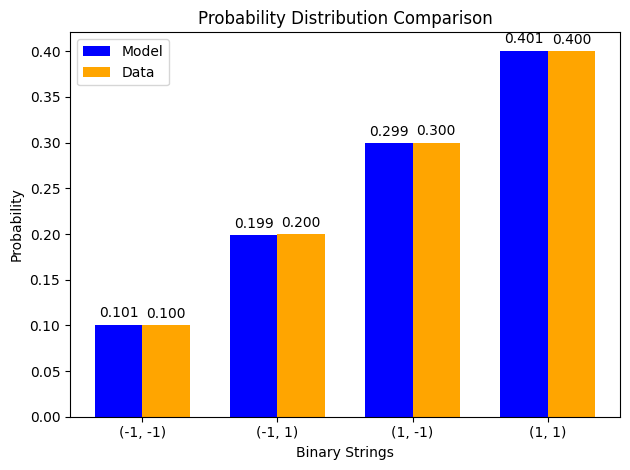

z gradient step for node 0: 1.3368633566601673e-07
z gradient step for node 1: 3.237980050536937e-06
z gradient step for node 2: 2.4895376359976298e-06
edge graident step for edge (0, 2): -1.745564217729895e-05
edge graident step for edge (1, 2): 1.6903765255138481e-06
x positive phase: 0.0
x negative phase: -3.2704372727720114e-09
x gradient step for node 0: 3.2704372727720116e-11
x positive phase: 0.0
x negative phase: 1.2994315850701643e-05
x gradient step for node 1: -1.2994315850701643e-07
x positive phase: -0.7606733457916324
x negative phase: -0.7607508231616047
x gradient step for node 2: 7.747736997232302e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10069865450342907, (-1, 1): 0.19930399328358872, (1, -1): 0.2994425217972696, (1, 1): 0.4005548304157126}
LLH: 1.2798587720493861
beta: 100
EPOCH: 8


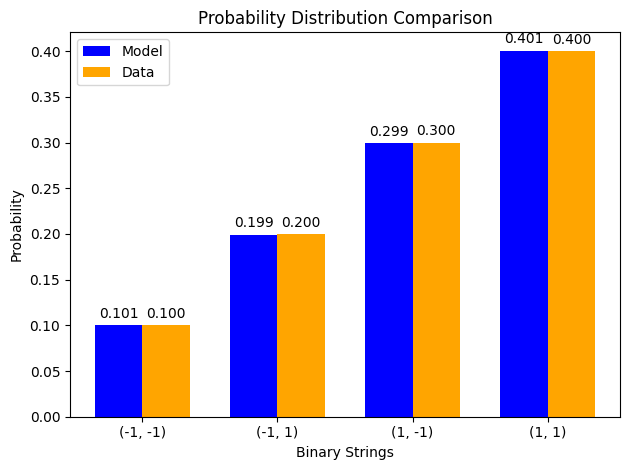

z gradient step for node 0: 5.295574035613093e-08
z gradient step for node 1: 2.823526013973898e-06
z gradient step for node 2: 2.1089814121375005e-06
edge graident step for edge (0, 2): -1.3567376459346914e-05
edge graident step for edge (1, 2): 1.2815649277714281e-06
x positive phase: 0.0
x negative phase: -2.0319677547574945e-10
x gradient step for node 0: 2.0319677547574947e-12
x positive phase: 0.0
x negative phase: 2.2078174631289876e-06
x gradient step for node 1: -2.2078174631289877e-08
x positive phase: -0.7605804075098235
x negative phase: -0.7606388758175451
x gradient step for node 2: 5.846830772160416e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1005455680736222, (-1, 1): 0.19945853237518116, (1, -1): 0.2995597491857618, (1, 1): 0.400436150365435}
LLH: 1.2798570039213164
beta: 100
EPOCH: 9


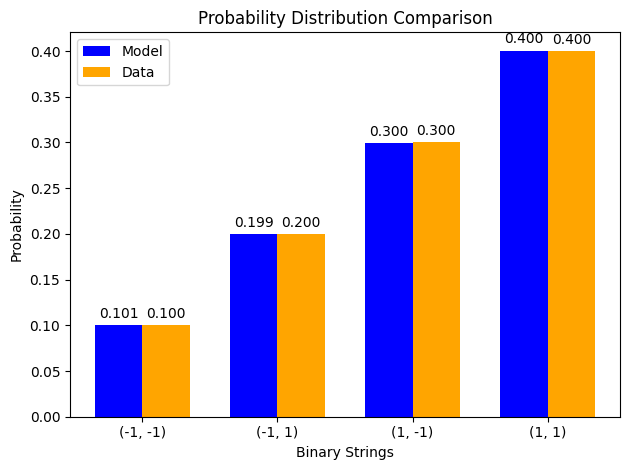

z gradient step for node 0: 8.2008976065584e-08
z gradient step for node 1: 2.1063451876779382e-06
z gradient step for node 2: 1.595618548548422e-06
edge graident step for edge (0, 2): -1.063073554084526e-05
edge graident step for edge (1, 2): 1.0302820920193856e-06
x positive phase: 0.0
x negative phase: -1.2650813103664291e-11
x gradient step for node 0: 1.265081310366429e-13
x positive phase: 0.0
x negative phase: 3.752130569693109e-07
x gradient step for node 1: -3.752130569693109e-09
x positive phase: -0.760508866980328
x negative phase: -0.7605560448700778
x gradient step for node 2: 4.71778897497277e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10042682790497134, (-1, 1): 0.19957626231598433, (1, -1): 0.29965740729268453, (1, 1): 0.40033950248635986}
LLH: 1.2798559234406037
beta: 100
EPOCH: 10


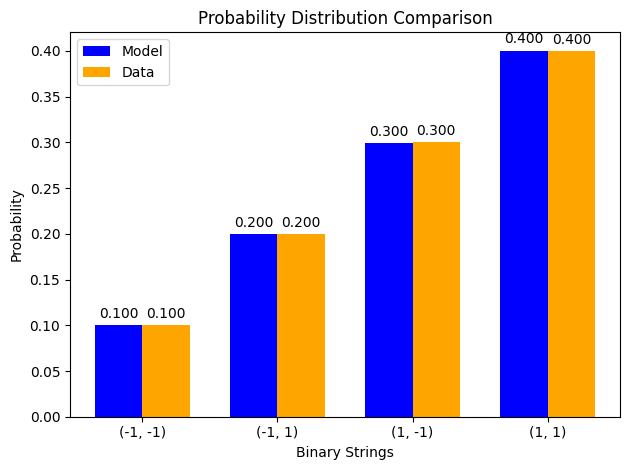

z gradient step for node 0: 6.180441911196599e-08
z gradient step for node 1: 1.6847039531164844e-06
z gradient step for node 2: 1.2694627803051806e-06
edge graident step for edge (0, 2): -8.29941092877845e-06
edge graident step for edge (1, 2): 8.039453299946154e-07
x positive phase: 0.0
x negative phase: -7.888531251931362e-13
x gradient step for node 0: 7.888531251931361e-15
x positive phase: 0.0
x negative phase: 6.378066661316387e-08
x gradient step for node 1: -6.378066661316387e-10
x positive phase: -0.7604519870298241
x negative phase: -0.7604887823254814
x gradient step for node 2: 3.6795295657365834e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10033361196685275, (-1, 1): 0.19966921222450862, (1, -1): 0.2997316120574511, (1, 1): 0.4002655637511876}
LLH: 1.2798552631784554
beta: 100
EPOCH: 11


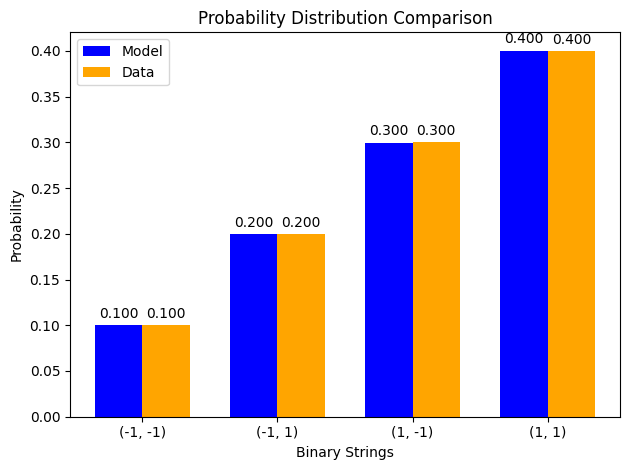

z gradient step for node 0: 5.648382722600598e-08
z gradient step for node 1: 1.3044804860770642e-06
z gradient step for node 2: 9.863256345582494e-07
edge graident step for edge (0, 2): -6.490417996591891e-06
edge graident step for edge (1, 2): 6.343223395705033e-07
x positive phase: 0.0
x negative phase: -4.925110263374987e-14
x gradient step for node 0: 4.925110263374987e-16
x positive phase: 0.0
x negative phase: 1.0843555826237396e-08
x gradient step for node 1: -1.0843555826237397e-10
x positive phase: -0.7604075235337333
x negative phase: -0.7604365880157062
x gradient step for node 2: 2.90644819729291e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10026085039338692, (-1, 1): 0.19974143305517117, (1, -1): 0.29979039586243217, (1, 1): 0.4002073206890099}
LLH: 1.2798548597102466
beta: 100
EPOCH: 12


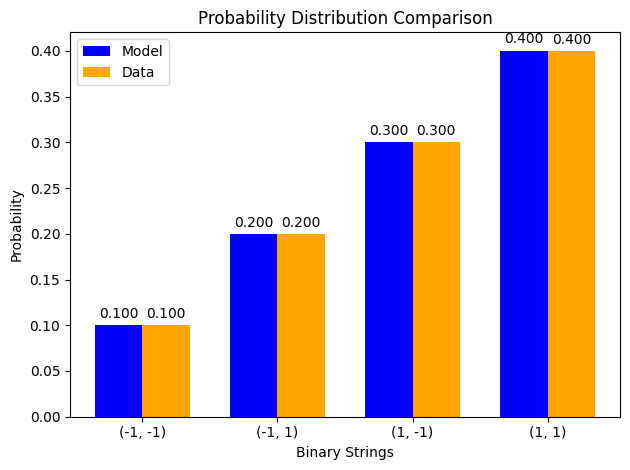

z gradient step for node 0: 4.566897116031754e-08
z gradient step for node 1: 1.024925116381581e-06
z gradient step for node 2: 7.743436350517164e-07
edge graident step for edge (0, 2): -5.071897831457339e-06
edge graident step for edge (1, 2): 4.970156172867668e-07
x positive phase: 0.0
x negative phase: -3.0779268488974968e-15
x gradient step for node 0: 3.077926848897497e-17
x positive phase: 0.0
x negative phase: 1.843794371994922e-09
x gradient step for node 1: -1.843794371994922e-11
x positive phase: -0.7603725569297377
x negative phase: -0.7603953342158276
x gradient step for node 2: 2.277728608990337e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10020391359507232, (-1, 1): 0.199797980157034, (1, -1): 0.29983607470309576, (1, 1): 0.4001620315447981}
LLH: 1.2798546131651187
beta: 100
EPOCH: 13


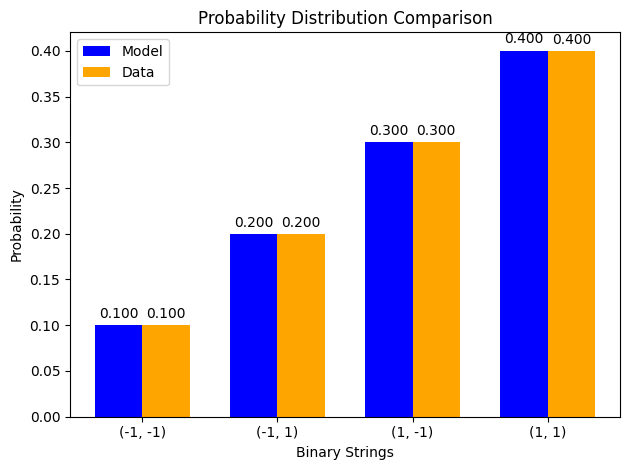

z gradient step for node 0: 3.7875042124269064e-08
z gradient step for node 1: 7.997659633593446e-07
z gradient step for node 2: 6.048217902507314e-07
edge graident step for edge (0, 2): -3.964865999410705e-06
edge graident step for edge (1, 2): 3.9009571978332327e-07
x positive phase: 0.0
x negative phase: -1.925012513432016e-16
x gradient step for node 0: 1.925012513432016e-18
x positive phase: 0.0
x negative phase: 3.1354392583394234e-10
x gradient step for node 1: -3.1354392583394235e-12
x positive phase: -0.7603451708882691
x negative phase: -0.7603630564007013
x gradient step for node 2: 1.7885512432203043e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1001594145375061, (-1, 1): 0.19984210982979672, (1, -1): 0.2998718835181081, (1, 1): 0.400126592114589}
LLH: 1.2798544625117554
beta: 100
EPOCH: 14


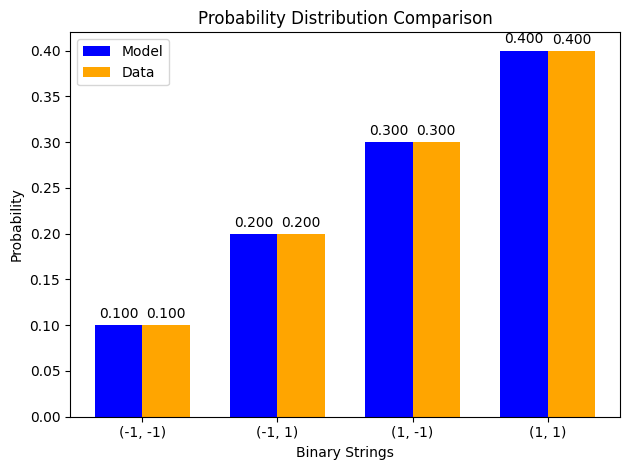

z gradient step for node 0: 3.048734605826109e-08
z gradient step for node 1: 6.259611122863551e-07
z gradient step for node 2: 4.73395820971001e-07
edge graident step for edge (0, 2): -3.098994239825459e-06
edge graident step for edge (1, 2): 3.0558845105443935e-07
x positive phase: 0.0
x negative phase: -1.2046737575138923e-17
x gradient step for node 0: 1.2046737575138924e-19
x positive phase: 0.0
x negative phase: 5.332366486981317e-11
x gradient step for node 1: -5.332366486981318e-13
x positive phase: -0.7603237042098792
x negative phase: -0.760337718121338
x gradient step for node 2: 1.401391145883224e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10012461902160348, (-1, 1): 0.19987660758893014, (1, -1): 0.2998998408835668, (1, 1): 0.4000989325058996}
LLH: 1.2798543704546048
beta: 100
EPOCH: 15


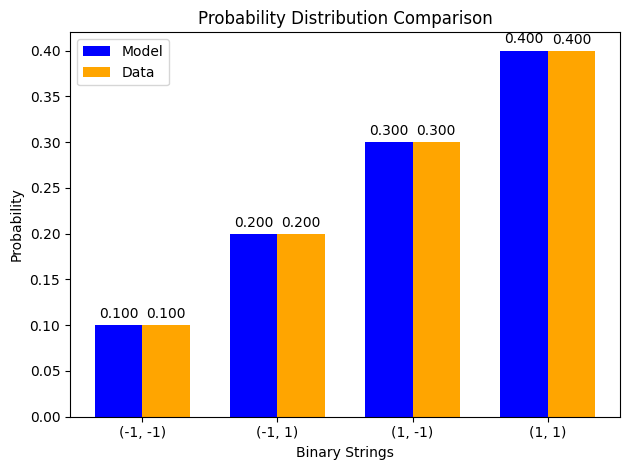

z gradient step for node 0: 2.4532210671779354e-08
z gradient step for node 1: 4.891981034060855e-07
z gradient step for node 2: 3.7009812523178256e-07
edge graident step for edge (0, 2): -2.4224197825123417e-06
edge graident step for edge (1, 2): 2.3938688044233827e-07
x positive phase: 0.0
x negative phase: -7.542403256749068e-19
x gradient step for node 0: 7.542403256749068e-21
x positive phase: 0.0
x negative phase: 9.06921150604978e-12
x gradient step for node 1: -9.06921150604978e-14
x positive phase: -0.7603068974319804
x negative phase: -0.7603178779621153
x gradient step for node 2: 1.09805301348187e-07
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10009741868969023, (-1, 1): 0.1999035586436069, (1, -1): 0.29992170868184026, (1, 1): 0.40007731398486257}
LLH: 1.2798543142032077
beta: 100
EPOCH: 16


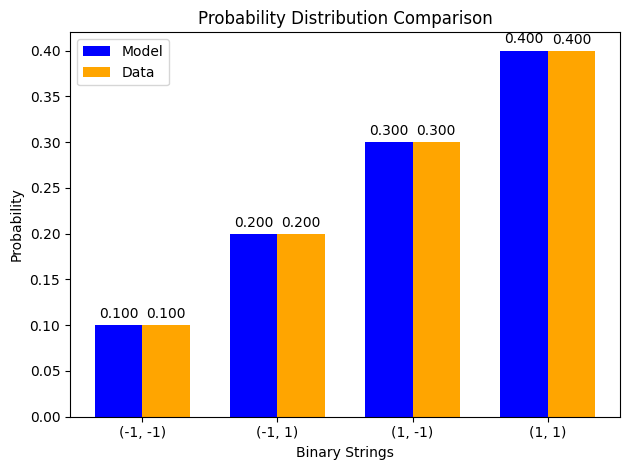

z gradient step for node 0: 1.9546665941394537e-08
z gradient step for node 1: 3.8254743060989193e-07
z gradient step for node 2: 2.8944845564482516e-07
edge graident step for edge (0, 2): -1.8935038126033365e-06
edge graident step for edge (1, 2): 1.873982067918112e-07
x positive phase: 0.0
x negative phase: -4.7240020935347157e-20
x gradient step for node 0: 4.724002093534716e-22
x positive phase: 0.0
x negative phase: 1.5425562553293697e-12
x gradient step for node 1: -1.54255625532937e-14
x positive phase: -0.7602937401009158
x negative phase: -0.7603023372367242
x gradient step for node 2: 8.597135808474654e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10007615380944149, (-1, 1): 0.19992462252283644, (1, -1): 0.2999387984908582, (1, 1): 0.4000604251768639}
LLH: 1.279854279831048
beta: 100
EPOCH: 17


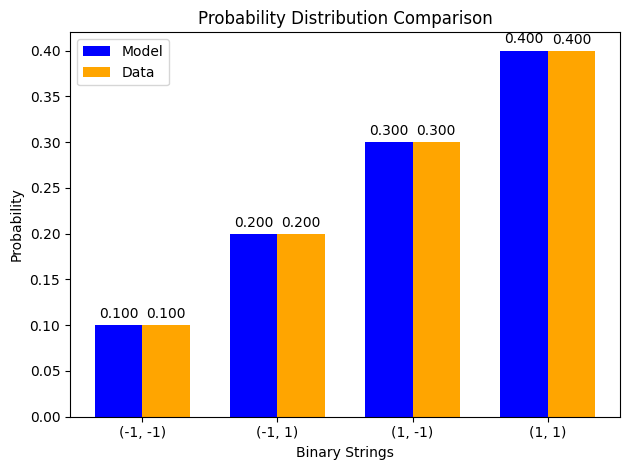

z gradient step for node 0: 1.5526645558150422e-08
z gradient step for node 1: 2.990460059926203e-07
z gradient step for node 2: 2.263062943196059e-07
edge graident step for edge (0, 2): -1.4801040418671586e-06
edge graident step for edge (1, 2): 1.466676828754121e-07
x positive phase: 0.0
x negative phase: -2.9596184282673606e-21
x gradient step for node 0: 2.9596184282673606e-23
x positive phase: 0.0
x negative phase: 2.6237936527313883e-13
x gradient step for node 1: -2.6237936527313884e-15
x positive phase: -0.7602834444132285
x negative phase: -0.7602901738676758
x gradient step for node 2: 6.729454447351735e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10005953039435014, (-1, 1): 0.19994108363524934, (1, -1): 0.2999521594197469, (1, 1): 0.4000472265506536}
LLH: 1.2798542588281827
beta: 100
EPOCH: 18


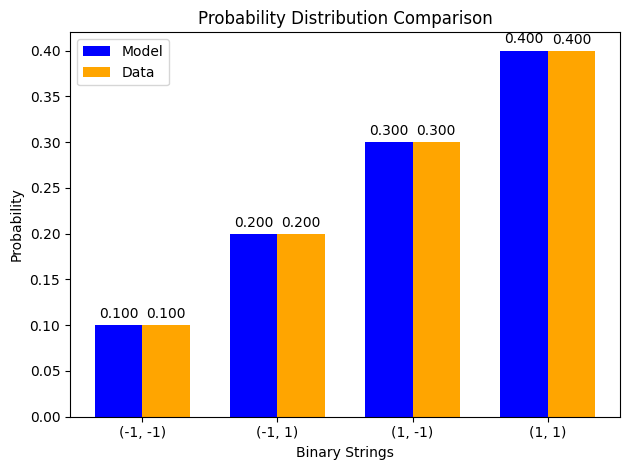

z gradient step for node 0: 1.228059198998821e-08
z gradient step for node 1: 2.3379628194153403e-07
z gradient step for node 2: 1.7694517775834752e-07
edge graident step for edge (0, 2): -1.1569565490054944e-06
edge graident step for edge (1, 2): 1.1475352461709498e-07
x positive phase: 0.0
x negative phase: -1.8546391568621796e-22
x gradient step for node 0: 1.8546391568621795e-24
x positive phase: 0.0
x negative phase: 4.463050558382121e-14
x gradient step for node 1: -4.463050558382121e-16
x positive phase: -0.7602753893797619
x negative phase: -0.7602806550454323
x gradient step for node 2: 5.265665670384223e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10004653525308264, (-1, 1): 0.19995394925075172, (1, -1): 0.2999626031246248, (1, 1): 0.4000369123715408}
LLH: 1.2798542459945712
beta: 100
EPOCH: 19


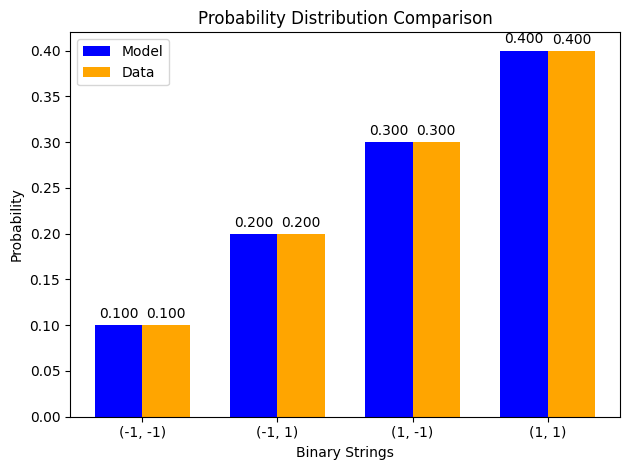

z gradient step for node 0: 9.690076687718374e-09
z gradient step for node 1: 1.8276755414881052e-07
z gradient step for node 2: 1.3833749103853154e-07
edge graident step for edge (0, 2): -9.043671845482271e-07
edge graident step for edge (1, 2): 8.976752439548985e-08
x positive phase: 0.0
x negative phase: -1.1624113799905601e-23
x gradient step for node 0: 1.16241137999056e-25
x positive phase: 0.0
x negative phase: 7.591795056876139e-15
x gradient step for node 1: -7.591795056876139e-17
x positive phase: -0.7602690887342547
x negative phase: -0.760273208195609
x gradient step for node 2: 4.119461354257226e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10003637670648893, (-1, 1): 0.19996400474062392, (1, -1): 0.2999707671901937, (1, 1): 0.4000288513626934}
LLH: 1.2798542381527287
beta: 100
EPOCH: 20


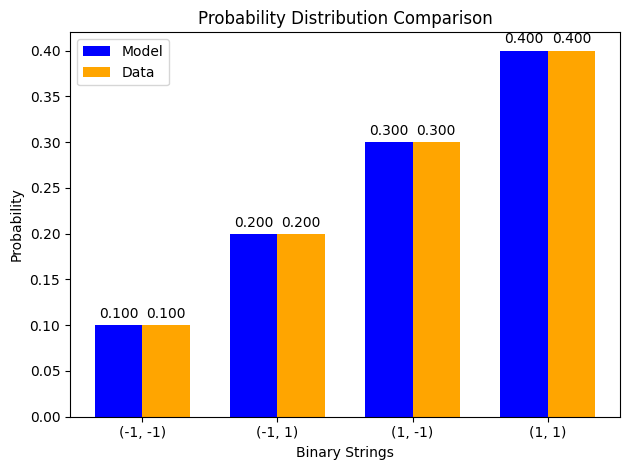

z gradient step for node 0: 7.62894225736499e-09
z gradient step for node 1: 1.4287793365402867e-07
z gradient step for node 2: 1.0815183953752361e-07
edge graident step for edge (0, 2): -7.069245160726268e-07
edge graident step for edge (1, 2): 7.020985889616416e-08
x positive phase: 0.0
x negative phase: -7.286522321116932e-25
x gradient step for node 0: 7.286522321116932e-27
x positive phase: 0.0
x negative phase: 1.2914137129658825e-15
x gradient step for node 1: -1.2914137129658824e-17
x positive phase: -0.7602641610208126
x negative phase: -0.7602673831668412
x gradient step for node 2: 3.2221460285475344e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10002843561669243, (-1, 1): 0.19997186423348207, (1, -1): 0.2999771489434872, (1, 1): 0.40002255120633834}
LLH: 1.279854233361063
beta: 100
EPOCH: 21


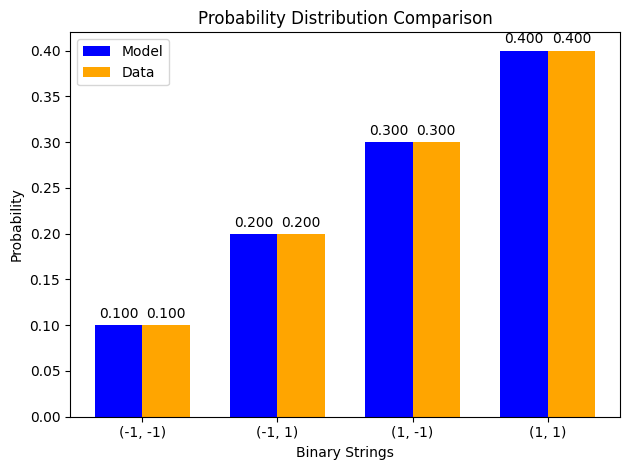

z gradient step for node 0: 5.997003489355279e-09
z gradient step for node 1: 1.1169120359311169e-07
z gradient step for node 2: 8.454947644620514e-08
edge graident step for edge (0, 2): -5.525893547189687e-07
edge graident step for edge (1, 2): 5.4906655318487375e-08
x positive phase: 0.0
x negative phase: -4.56801675891074e-26
x gradient step for node 0: 4.56801675891074e-28
x positive phase: 0.0
x negative phase: 2.1968113606548075e-16
x gradient step for node 1: -2.1968113606548077e-18
x positive phase: -0.7602603075360325
x negative phase: -0.7602628274901888
x gradient step for node 2: 2.5199541563436513e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10002222800820543, (-1, 1): 0.19997800739987712, (1, -1): 0.29998213755693165, (1, 1): 0.4000176270349858}
LLH: 1.2798542304331764
beta: 100
EPOCH: 22


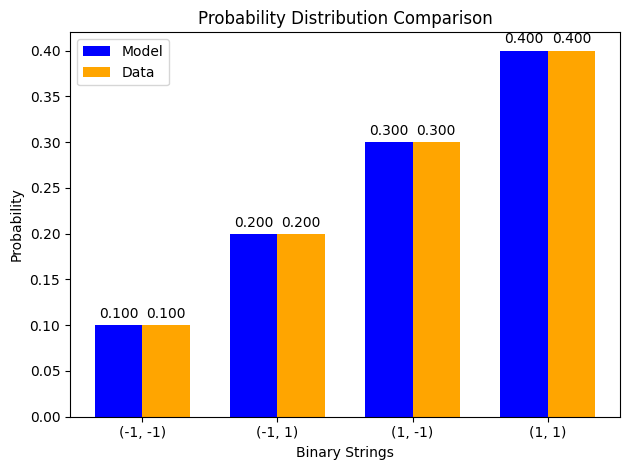

z gradient step for node 0: 4.708161651101328e-09
z gradient step for node 1: 8.73113027416439e-08
z gradient step for node 2: 6.609671914098448e-08
edge graident step for edge (0, 2): -4.319490879720056e-07
edge graident step for edge (1, 2): 4.293470817873235e-08
x positive phase: 0.0
x negative phase: -2.8639919156425318e-27
x gradient step for node 0: 2.863991915642532e-29
x positive phase: 0.0
x negative phase: 3.737017975383248e-17
x gradient step for node 1: -3.737017975383248e-19
x positive phase: -0.7602572943597534
x negative phase: -0.7602592649307599
x gradient step for node 2: 1.9705710064821246e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10001737549858625, (-1, 1): 0.19998280914189115, (1, -1): 0.29998603711261973, (1, 1): 0.4000137782469029}
LLH: 1.2798542286441306
beta: 100
EPOCH: 23


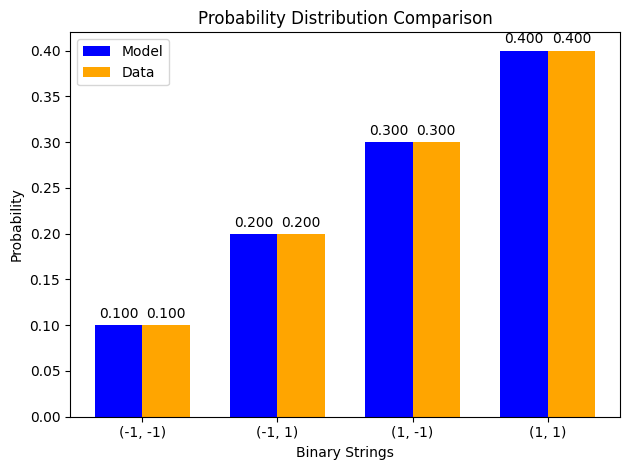

z gradient step for node 0: 3.6928095475952106e-09
z gradient step for node 1: 6.82522241199357e-08
z gradient step for node 2: 5.16702056121976e-08
edge graident step for edge (0, 2): -3.376472641364314e-07
edge graident step for edge (1, 2): 3.357062781206288e-08
x positive phase: 0.0
x negative phase: -1.7957446975651327e-28
x gradient step for node 0: 1.7957446975651328e-30
x positive phase: 0.0
x negative phase: 6.357136794399785e-18
x gradient step for node 1: -6.357136794399785e-20
x positive phase: -0.7602549384171169
x negative phase: -0.7602564792499937
x gradient step for node 2: 1.540832876845144e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10001358229410538, (-1, 1): 0.19998656241808144, (1, -1): 0.2999890853670037, (1, 1): 0.4000107699208095}
LLH: 1.2798542275509592
beta: 100
EPOCH: 24


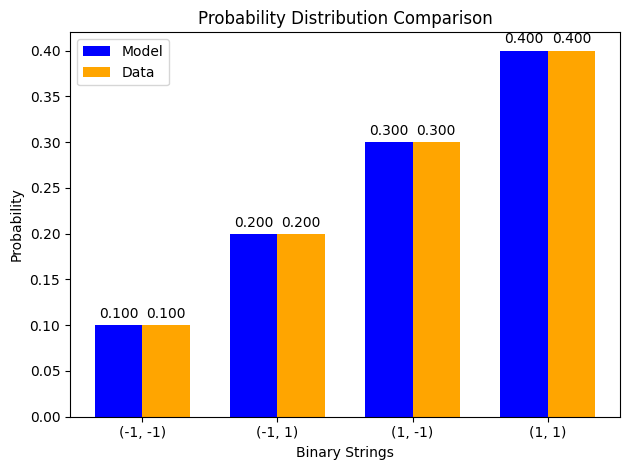

z gradient step for node 0: 2.8942437363399523e-09
z gradient step for node 1: 5.33532221827504e-08
z gradient step for node 2: 4.0391947700030295e-08
edge graident step for edge (0, 2): -2.6393337935720627e-07
edge graident step for edge (1, 2): 2.6247284136693417e-08
x positive phase: 0.0
x negative phase: -1.1260037651511512e-29
x gradient step for node 0: 1.1260037651511512e-31
x positive phase: 0.0
x negative phase: 1.081436478570953e-18
x gradient step for node 1: -1.081436478570953e-20
x positive phase: -0.7602530964510876
x negative phase: -0.760254301182375
x gradient step for node 2: 1.204731287396399e-08
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10001061715808182, (-1, 1): 0.199989496194735, (1, -1): 0.29999146815775835, (1, 1): 0.40000841848942476}
LLH: 1.2798542268829929
beta: 100
EPOCH: 25


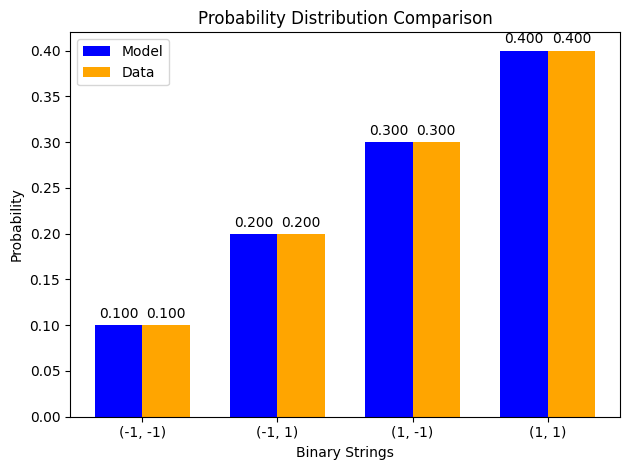

z gradient step for node 0: 2.267056337657003e-09
z gradient step for node 1: 4.1706316803169496e-08
z gradient step for node 2: 3.1575079248585825e-08
edge graident step for edge (0, 2): -2.0631260342351964e-07
edge graident step for edge (1, 2): 2.052056018386761e-08
x positive phase: 0.0
x negative phase: -7.060779372412523e-31
x gradient step for node 0: 7.060779372412523e-33
x positive phase: 0.0
x negative phase: 1.8396825457278245e-19
x gradient step for node 1: -1.8396825457278245e-21
x positive phase: -0.7602516563930055
x negative phase: -0.7602525982883623
x gradient step for node 2: 9.418953568207656e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000829932741016, (-1, 1): 0.1999917894213884, (1, -1): 0.2999933307614225, (1, 1): 0.400006580489779}
LLH: 1.2798542264748416
beta: 100
EPOCH: 26


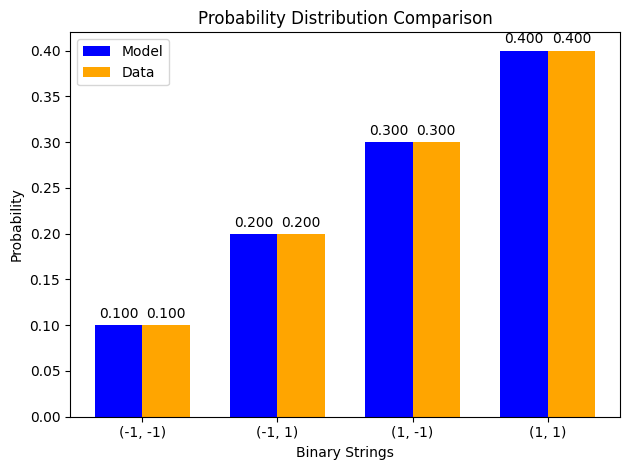

z gradient step for node 0: 1.7749759706475743e-09
z gradient step for node 1: 3.260177665359576e-08
z gradient step for node 2: 2.468257517651562e-08
edge graident step for edge (0, 2): -1.6127143970368074e-07
edge graident step for edge (1, 2): 1.6042728935850016e-08
x positive phase: 0.0
x negative phase: -4.427709912634355e-32
x gradient step for node 0: 4.427709912634355e-34
x positive phase: 0.0
x negative phase: 3.129584261935016e-20
x gradient step for node 1: -3.1295842619350163e-22
x positive phase: -0.7602505305856246
x negative phase: -0.7602512669582673
x gradient step for node 2: 7.3637264264014845e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000648749575125, (-1, 1): 0.19999358196506162, (1, -1): 0.29999478673822316, (1, 1): 0.40000514380096386}
LLH: 1.279854226225447
beta: 100
EPOCH: 27


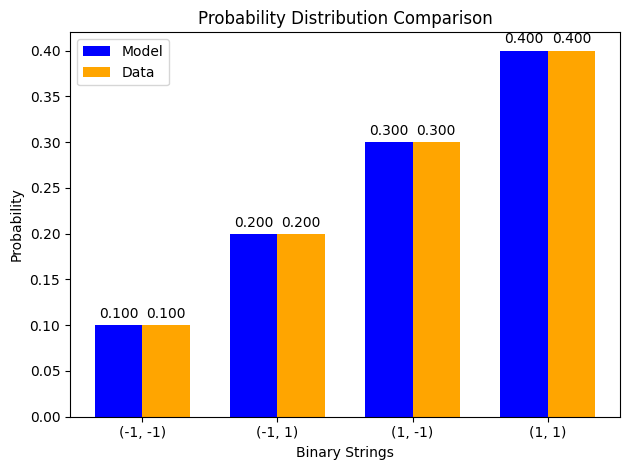

z gradient step for node 0: 1.3892162586959245e-09
z gradient step for node 1: 2.5484679490039854e-08
z gradient step for node 2: 1.929450044638181e-08
edge graident step for edge (0, 2): -1.2606350559996039e-07
edge graident step for edge (1, 2): 1.2541658906961573e-08
x positive phase: 0.0
x negative phase: -2.7766197222166334e-33
x gradient step for node 0: 2.7766197222166335e-35
x positive phase: 0.0
x negative phase: 5.323924483003874e-21
x gradient step for node 1: -5.323924483003874e-23
x positive phase: -0.7602496504756935
x negative phase: -0.7602502261529115
x gradient step for node 2: 5.7567721800655395e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000507120239718, (-1, 1): 0.19999498314737846, (1, -1): 0.2999959248586743, (1, 1): 0.40000402079154995}
LLH: 1.2798542260730583
beta: 100
EPOCH: 28


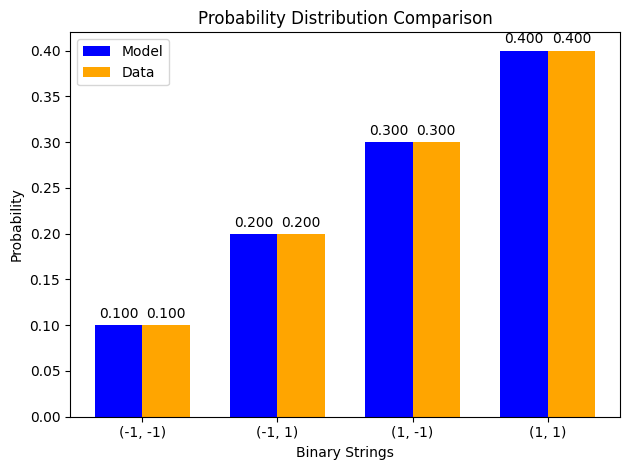

z gradient step for node 0: 1.0869955130443643e-09
z gradient step for node 1: 1.9921221431074e-08
z gradient step for node 2: 1.508253541504523e-08
edge graident step for edge (0, 2): -9.854201986791988e-08
edge graident step for edge (1, 2): 9.804424155324122e-09
x positive phase: 0.0
x negative phase: -1.741253625315926e-34
x gradient step for node 0: 1.741253625315926e-36
x positive phase: 0.0
x negative phase: 9.056873008204278e-22
x gradient step for node 1: -9.056873008204278e-24
x positive phase: -0.7602489624558082
x negative phase: -0.7602494124944326
x gradient step for node 2: 4.500386243666554e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000396409945711, (-1, 1): 0.19999607841754052, (1, -1): 0.2999968145138925, (1, 1): 0.4000031429691099}
LLH: 1.2798542259799435
beta: 100
EPOCH: 29


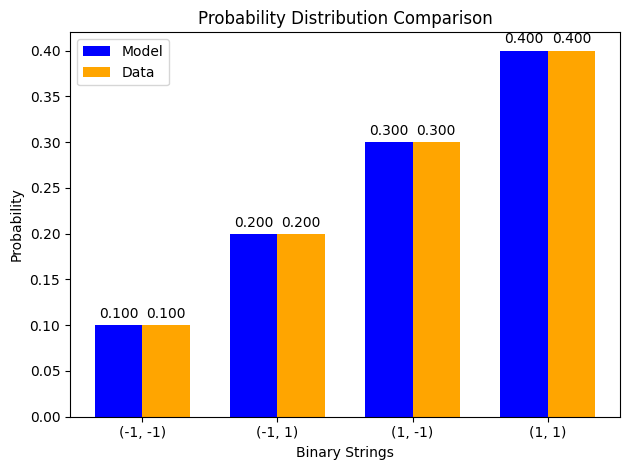

z gradient step for node 0: 8.503399523407395e-10
z gradient step for node 1: 1.5572266992835982e-08
z gradient step for node 2: 1.178998854614588e-08
edge graident step for edge (0, 2): -7.702889526672862e-08
edge graident step for edge (1, 2): 7.664462097767277e-09
x positive phase: 0.0
x negative phase: -1.0919788284933683e-35
x gradient step for node 0: 1.0919788284933683e-37
x positive phase: 0.0
x negative phase: 1.5407265707093593e-22
x gradient step for node 1: -1.5407265707093593e-24
x positive phase: -0.7602484246094933
x negative phase: -0.7602487764227689
x gradient step for node 2: 3.5181327562305855e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000309868862438, (-1, 1): 0.19999693456620393, (1, -1): 0.299997509946523, (1, 1): 0.40000245679864865}
LLH: 1.2798542259230472
beta: 100
EPOCH: 30


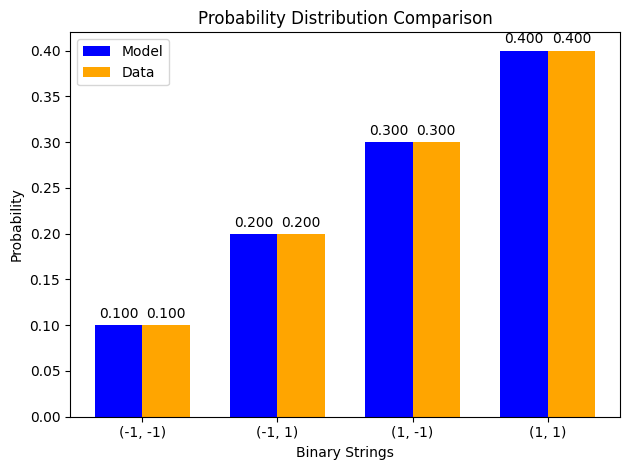

z gradient step for node 0: 6.650965667098774e-10
z gradient step for node 1: 1.2172702948953785e-08
z gradient step for node 2: 9.216181678650681e-09
edge graident step for edge (0, 2): -6.021240568004904e-08
edge graident step for edge (1, 2): 5.991497608048846e-09
x positive phase: 0.0
x negative phase: -6.848122606810077e-37
x gradient step for node 0: 6.848122606810077e-39
x positive phase: 0.0
x negative phase: 2.621039534628244e-23
x gradient step for node 1: -2.621039534628244e-25
x positive phase: -0.7602480041636642
x negative phase: -0.7602482791861206
x gradient step for node 2: 2.750224563641268e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000024222065546, (-1, 1): 0.199997603800436, (1, -1): 0.29999805355753717, (1, 1): 0.4000019204354721}
LLH: 1.2798542258882817
beta: 100
EPOCH: 31


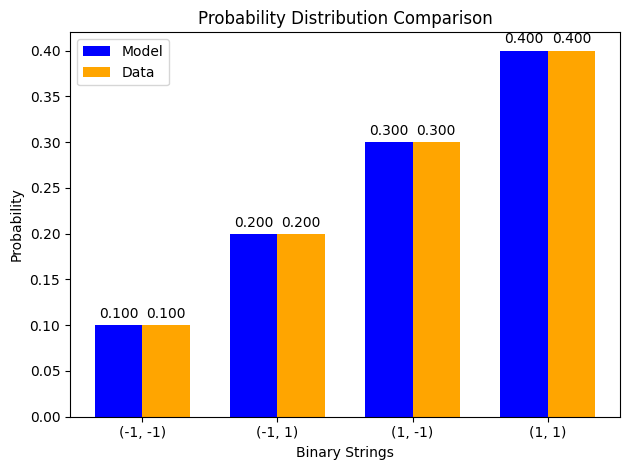

z gradient step for node 0: 5.20139812332232e-10
z gradient step for node 1: 9.5152818371802e-09
z gradient step for node 2: 7.204230243196275e-09
edge graident step for edge (0, 2): -4.706720046626645e-08
edge graident step for edge (1, 2): 4.68365078443167e-09
x positive phase: 0.0
x negative phase: -4.2947000967413315e-38
x gradient step for node 0: 4.294700096741332e-40
x positive phase: 0.0
x negative phase: 4.458842403230485e-24
x gradient step for node 1: -4.458842403230485e-26
x positive phase: -0.760247675495446
x negative phase: -0.7602478904858182
x gradient step for node 2: 2.149903721715418e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000189340835175, (-1, 1): 0.19999812692837998, (1, -1): 0.29999847849138106, (1, 1): 0.4000015011718874}
LLH: 1.2798542258670382
beta: 100
EPOCH: 32


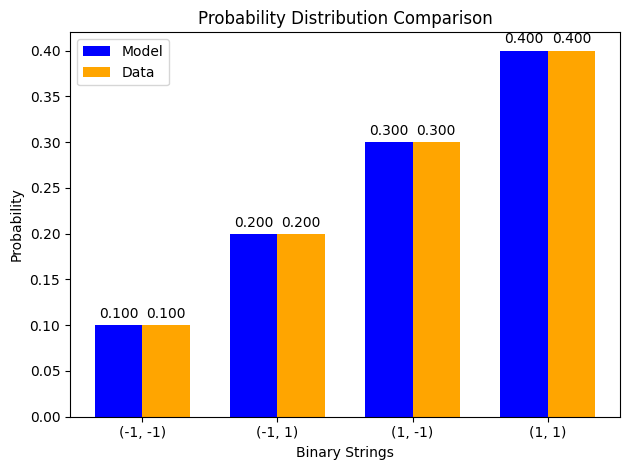

z gradient step for node 0: 4.0673463375107134e-10
z gradient step for node 1: 7.437994653802793e-09
z gradient step for node 2: 5.6314896910991675e-09
edge graident step for edge (0, 2): -3.67917814914076e-08
edge graident step for edge (1, 2): 3.6612554465964566e-09
x positive phase: 0.0
x negative phase: -2.6933778746787433e-39
x gradient step for node 0: 2.693377874678743e-41
x positive phase: 0.0
x negative phase: 7.585271053312149e-25
x gradient step for node 1: -7.585271053312149e-27
x positive phase: -0.76024741857297
x negative phase: -0.7602475866335641
x gradient step for node 2: 1.6806059410789942e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000148005312781, (-1, 1): 0.19999853584835448, (1, -1): 0.2999988106567144, (1, 1): 0.4000011734418034}
LLH: 1.2798542258540584
beta: 100
EPOCH: 33


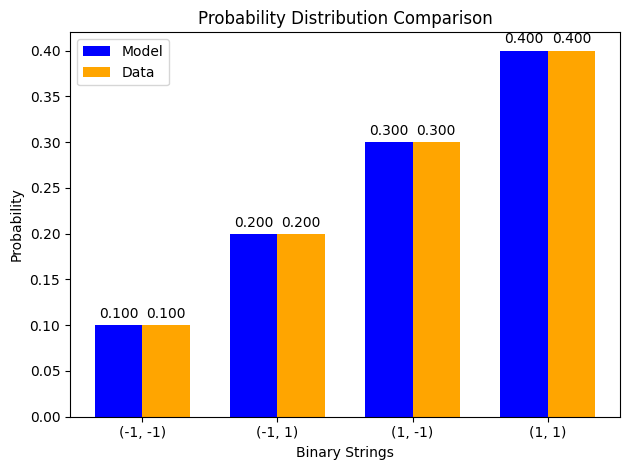

z gradient step for node 0: 3.180296442861774e-10
z gradient step for node 1: 5.8141968437008805e-09
z gradient step for node 2: 4.402084130827877e-09
edge graident step for edge (0, 2): -2.875963137777271e-08
edge graident step for edge (1, 2): 2.862020558880296e-09
x positive phase: 0.0
x negative phase: -1.6891343051965052e-40
x gradient step for node 0: 1.6891343051965052e-42
x positive phase: 0.0
x negative phase: 1.290388320444894e-25
x gradient step for node 1: -1.2903883204448941e-27
x positive phase: -0.7602472177358759
x negative phase: -0.760247349109952
x gradient step for node 2: 1.3137407606222951e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000011569384267, (-1, 1): 0.19999885549431773, (1, -1): 0.2999990703060534, (1, 1): 0.4000009172612021}
LLH: 1.279854225846127
beta: 100
EPOCH: 34


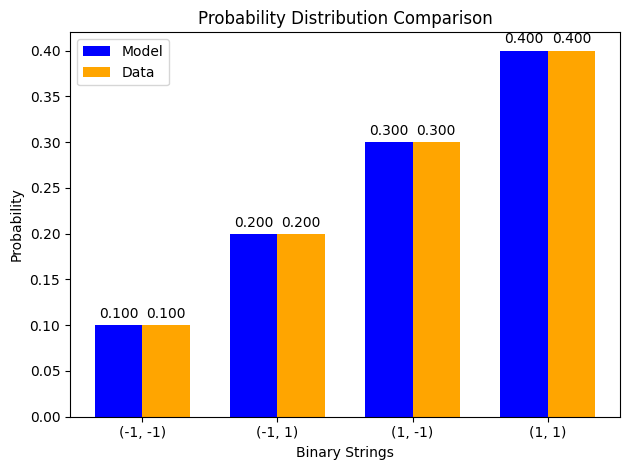

z gradient step for node 0: 2.486548889013562e-10
z gradient step for node 1: 4.544889603275149e-09
z gradient step for node 2: 3.4410649080163227e-09
edge graident step for edge (0, 2): -2.2481011657804475e-08
edge graident step for edge (1, 2): 2.237243595937244e-09
x positive phase: 0.0
x negative phase: -1.059334191060693e-41
x gradient step for node 0: 1.059334191060693e-43
x positive phase: 0.0
x negative phase: 2.1951793361917474e-26
x gradient step for node 1: -2.1951793361917473e-28
x positive phase: -0.7602470607416214
x negative phase: -0.7602471634370306
x gradient step for node 2: 1.02695409176512e-09
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000090436371221, (-1, 1): 0.19999910535648946, (1, -1): 0.29999927327055415, (1, 1): 0.40000071700924406}
LLH: 1.279854225841281
beta: 100
EPOCH: 35


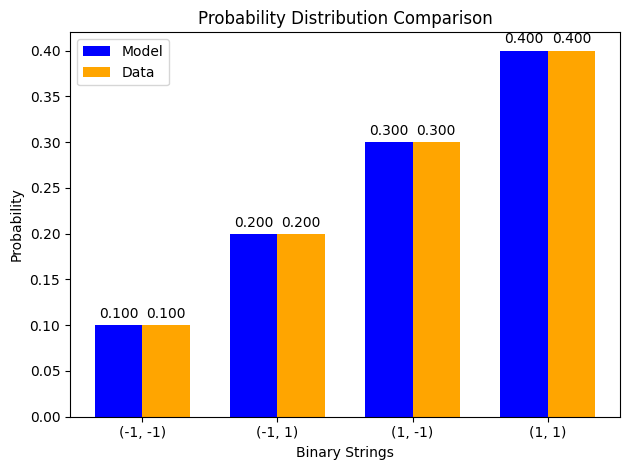

z gradient step for node 0: 1.9440403342674273e-10
z gradient step for node 1: 3.5526853300882343e-09
z gradient step for node 2: 2.6898433400091018e-09
edge graident step for edge (0, 2): -1.7573101423751238e-08
edge graident step for edge (1, 2): 1.748848073024334e-09
x positive phase: 0.0
x negative phase: -6.6435971959889525e-43
x gradient step for node 0: 6.643597195988953e-45
x positive phase: 0.0
x negative phase: 3.734391056275659e-27
x gradient step for node 1: -3.734391056275659e-29
x positive phase: -0.7602469380197341
x negative phase: -0.7602470182966146
x gradient step for node 2: 8.027688047640425e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000070692926953, (-1, 1): 0.1999993006699158, (1, -1): 0.29999943192523987, (1, 1): 0.40000056047557486}
LLH: 1.2798542258383194
beta: 100
EPOCH: 36


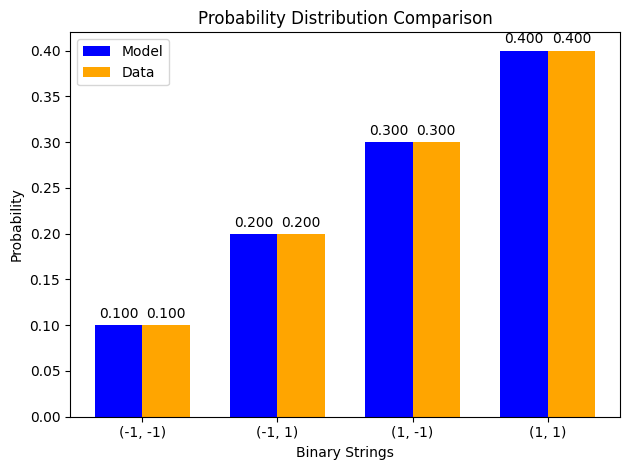

z gradient step for node 0: 1.5198370617586223e-10
z gradient step for node 1: 2.777090187255915e-09
z gradient step for node 2: 2.1026199950591186e-09
edge graident step for edge (0, 2): -1.3736655399831932e-08
edge graident step for edge (1, 2): 1.367066219670754e-09
x positive phase: 0.0
x negative phase: -4.1665324225518344e-44
x gradient step for node 0: 4.166532422551834e-46
x positive phase: 0.0
x negative phase: 6.352866711351145e-28
x gradient step for node 1: -6.352866711351146e-30
x positive phase: -0.7602468420887121
x negative phase: -0.7602469048408413
x gradient step for node 2: 6.2752129270649e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000055259730566, (-1, 1): 0.19999945334350744, (1, -1): 0.29999955594351674, (1, 1): 0.4000004381156702}
LLH: 1.2798542258365098
beta: 100
EPOCH: 37


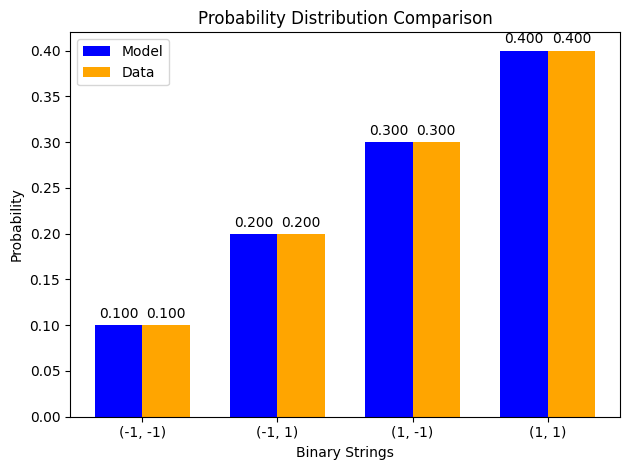

z gradient step for node 0: 1.1881626127419054e-10
z gradient step for node 1: 2.170816447988333e-09
z gradient step for node 2: 1.6435932473357618e-09
edge graident step for edge (0, 2): -1.073775793808407e-08
edge graident step for edge (1, 2): 1.0686265822235086e-09
x positive phase: 0.0
x negative phase: -2.6130465847300242e-45
x gradient step for node 0: 2.6130465847300243e-47
x positive phase: 0.0
x negative phase: 1.0807364986125497e-28
x gradient step for node 1: -1.0807364986125498e-30
x positive phase: -0.760246767100127
x negative phase: -0.7602468161530942
x gradient step for node 2: 4.905296724366792e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000043195801249, (-1, 1): 0.1999995726862276, (1, -1): 0.299999652886963, (1, 1): 0.400000342468797}
LLH: 1.2798542258354042
beta: 100
EPOCH: 38


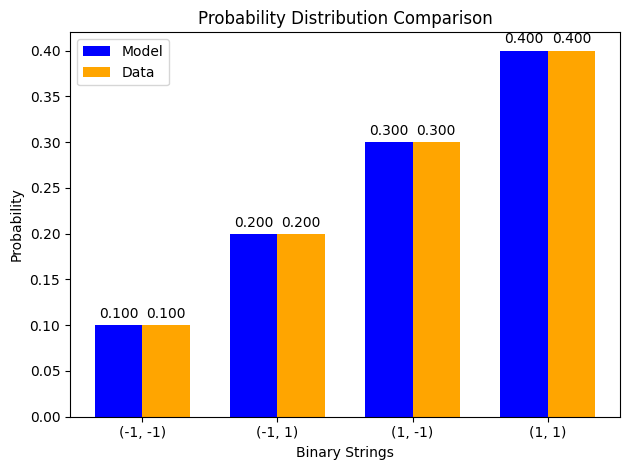

z gradient step for node 0: 9.288479929647764e-11
z gradient step for node 1: 1.6968995106281249e-09
z gradient step for node 2: 1.2847768759982614e-09
edge graident step for edge (0, 2): -8.393560576025471e-09
edge graident step for edge (1, 2): 8.35336724236413e-10
x positive phase: 0.0
x negative phase: -1.6387784839751975e-46
x gradient step for node 0: 1.6387784839751975e-48
x positive phase: 0.0
x negative phase: 1.8385269155587358e-29
x gradient step for node 1: -1.838526915558736e-31
x positive phase: -0.7602467084821933
x negative phase: -0.7602467468265268
x gradient step for node 2: 3.834433348615107e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000033765585387, (-1, 1): 0.19999966597472224, (1, -1): 0.2999997286663684, (1, 1): 0.4000002677030553}
LLH: 1.279854225834729
beta: 100
EPOCH: 39


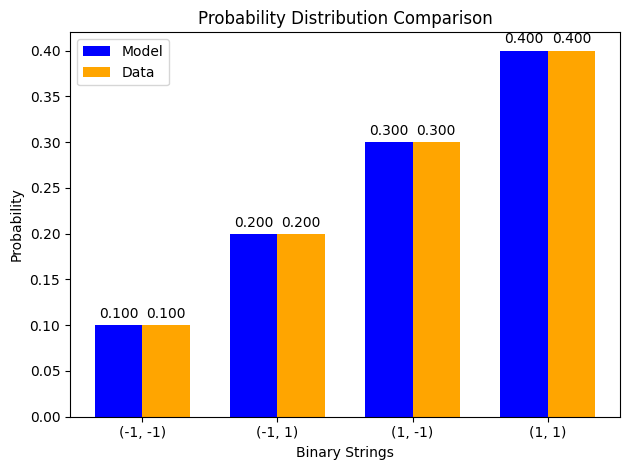

z gradient step for node 0: 7.261152290549688e-11
z gradient step for node 1: 1.3264444478910954e-09
z gradient step for node 2: 1.0042941267496275e-09
edge graident step for edge (0, 2): -6.56113328167951e-09
edge graident step for edge (1, 2): 6.529749785322281e-10
x positive phase: 0.0
x negative phase: -1.0277652104805279e-47
x gradient step for node 0: 1.0277652104805279e-49
x positive phase: 0.0
x negative phase: 3.1276650895338382e-30
x gradient step for node 1: -3.127665089533838e-32
x positive phase: -0.7602466626611196
x negative phase: -0.7602466926345464
x gradient step for node 2: 2.997342674060377e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000026394109571, (-1, 1): 0.19999973889702094, (1, -1): 0.2999997879021228, (1, 1): 0.4000002092597607}
LLH: 1.279854225834316
beta: 100
EPOCH: 40


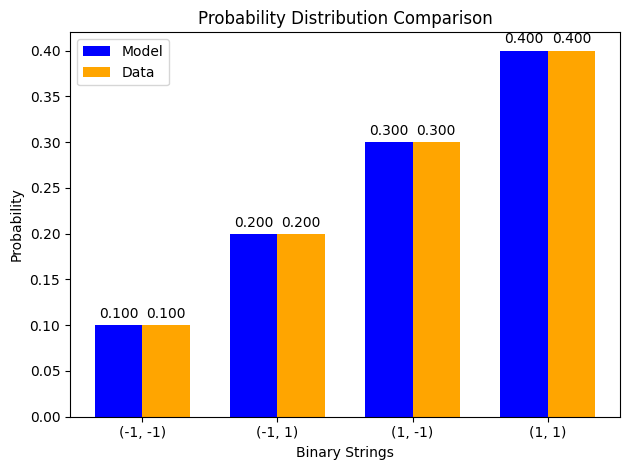

z gradient step for node 0: 5.676232983642393e-11
z gradient step for node 1: 1.0368643690861212e-09
z gradient step for node 2: 7.85044032558524e-10
edge graident step for edge (0, 2): -5.128749641092334e-09
edge graident step for edge (1, 2): 5.10423898147927e-10
x positive phase: 0.0
x negative phase: -6.445669137314595e-49
x gradient step for node 0: 6.445669137314595e-51
x positive phase: 0.0
x negative phase: 5.320721814493686e-31
x gradient step for node 1: -5.320721814493686e-33
x positive phase: -0.7602466268432652
x negative phase: -0.7602466502731986
x gradient step for node 2: 2.3429933437846274e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000020631924211, (-1, 1): 0.1999997958993638, (1, -1): 0.29999983420592297, (1, 1): 0.40000016357547097}
LLH: 1.279854225834064
beta: 100
EPOCH: 41


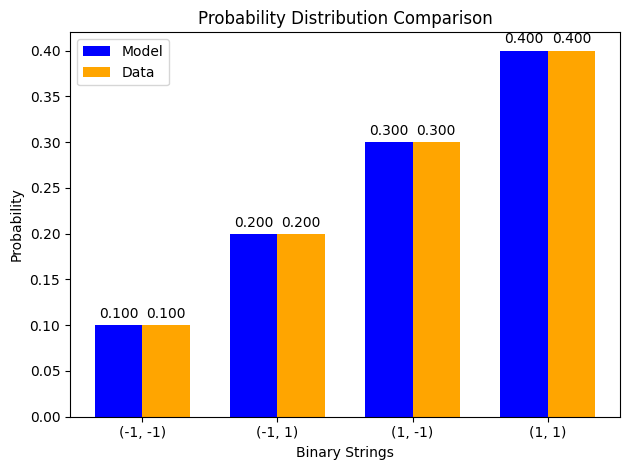

z gradient step for node 0: 4.437211931218599e-11
z gradient step for node 1: 8.105033030836318e-10
z gradient step for node 2: 6.136588731608939e-10
edge graident step for edge (0, 2): -4.0090746744603225e-09
edge graident step for edge (1, 2): 3.9899280990240984e-10
x positive phase: 0.0
x negative phase: -4.0424294236343264e-50
x gradient step for node 0: 4.0424294236343264e-52
x positive phase: 0.0
x negative phase: 9.051507395948195e-32
x gradient step for node 1: -9.051507395948195e-34
x positive phase: -0.7602465988448457
x negative phase: -0.7602466171597759
x gradient step for node 2: 1.8314930239071714e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000016127700193, (-1, 1): 0.19999984045730643, (1, -1): 0.2999998704009862, (1, 1): 0.4000001278647053}
LLH: 1.2798542258339096
beta: 100
EPOCH: 42


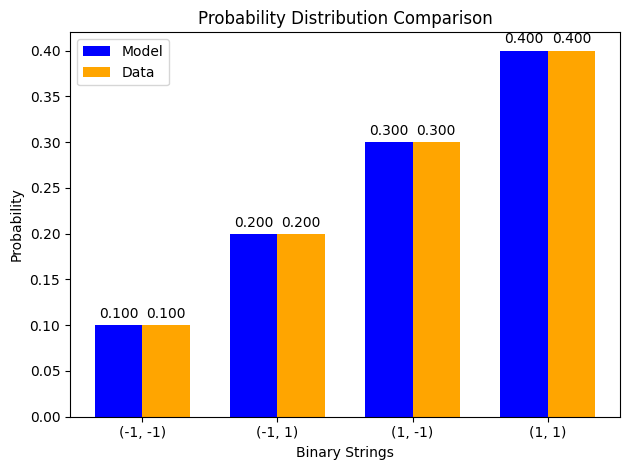

z gradient step for node 0: 3.468616893709253e-11
z gradient step for node 1: 6.33559765206293e-10
z gradient step for node 2: 4.796892071057268e-10
edge graident step for edge (0, 2): -3.1338398354119337e-09
edge graident step for edge (1, 2): 3.1188812477100923e-10
x positive phase: 0.0
x negative phase: -2.5352287457416525e-51
x gradient step for node 0: 2.5352287457416526e-53
x positive phase: 0.0
x negative phase: 1.539824781749029e-32
x gradient step for node 1: -1.5398247817490289e-34
x positive phase: -0.7602465769588064
x negative phase: -0.7602465912753816
x gradient step for node 2: 1.4316575258632724e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000012606808069, (-1, 1): 0.19999987528763769, (1, -1): 0.2999998986941841, (1, 1): 0.40000009995009744}
LLH: 1.2798542258338155
beta: 100
EPOCH: 43


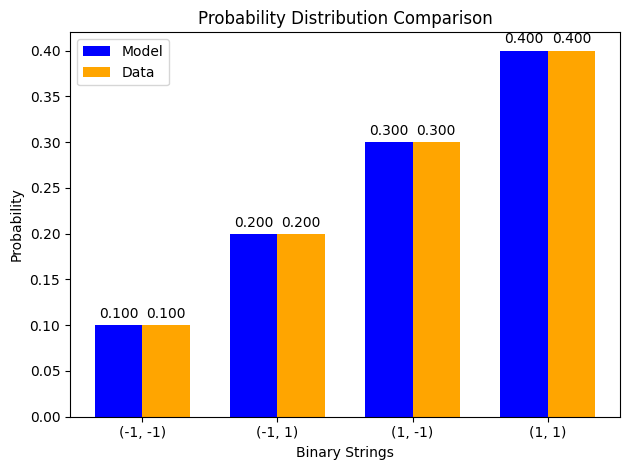

z gradient step for node 0: 2.7114367973091193e-11
z gradient step for node 1: 4.952452967166287e-10
z gradient step for node 2: 3.7496680024839966e-10
edge graident step for edge (0, 2): -2.4496805417495437e-09
edge graident step for edge (1, 2): 2.4379924801198885e-10
x positive phase: 0.0
x negative phase: -1.589981470477896e-52
x gradient step for node 0: 1.589981470477896e-54
x positive phase: 0.0
x negative phase: 2.6195200550684697e-33
x gradient step for node 1: -2.6195200550684697e-35
x positive phase: -0.7602465598507516
x negative phase: -0.7602465710418512
x gradient step for node 2: 1.1191099602569921e-10
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000009854573533, (-1, 1): 0.19999990251403174, (1, -1): 0.2999999208105991, (1, 1): 0.4000000781296338}
LLH: 1.2798542258337577
beta: 100
EPOCH: 44


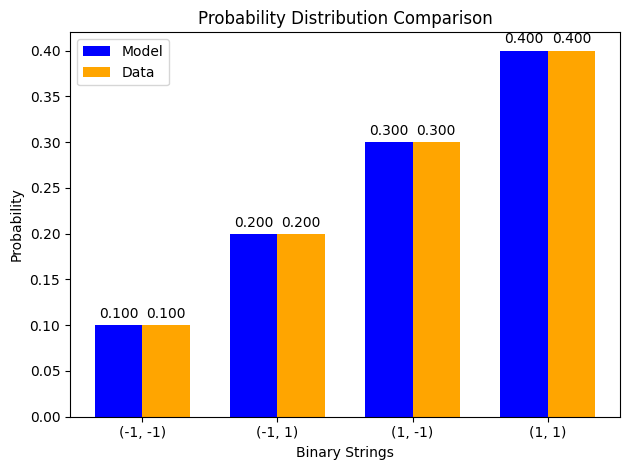

z gradient step for node 0: 2.1195341592950002e-11
z gradient step for node 1: 3.871266895938419e-10
z gradient step for node 2: 2.931066354905365e-10
edge graident step for edge (0, 2): -1.9148824154102684e-09
edge graident step for edge (1, 2): 1.9057489919482863e-10
x positive phase: 0.0
x negative phase: -9.971652575876081e-54
x gradient step for node 0: 9.971652575876082e-56
x positive phase: 0.0
x negative phase: 4.456276944505794e-34
x gradient step for node 1: -4.456276944505794e-36
x positive phase: -0.7602465464775954
x negative phase: -0.7602465552255431
x gradient step for node 2: 8.74794769956111e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000007703188452, (-1, 1): 0.19999992379653353, (1, -1): 0.29999993809870484, (1, 1): 0.4000000610728772}
LLH: 1.2798542258337227
beta: 100
EPOCH: 45


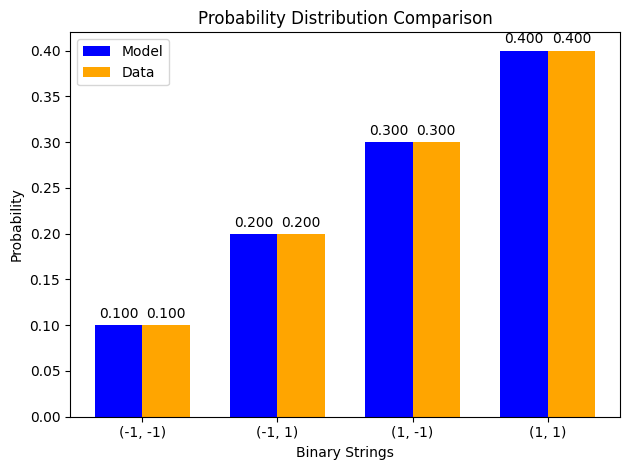

z gradient step for node 0: 1.656835946217683e-11
z gradient step for node 1: 3.0261178535218036e-10
z gradient step for node 2: 2.2911759281485367e-10
edge graident step for edge (0, 2): -1.4968379047353153e-09
edge graident step for edge (1, 2): 1.4897002575953167e-10
x positive phase: 0.0
x negative phase: -6.2537762931543704e-55
x gradient step for node 0: 6.25377629315437e-57
x positive phase: 0.0
x negative phase: 7.580932610097785e-35
x gradient step for node 1: -7.580932610097786e-37
x positive phase: -0.760246536023967
x negative phase: -0.7602465428621299
x gradient step for node 2: 6.838162924793778e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000006021479427, (-1, 1): 0.19999994043277644, (1, -1): 0.2999999516125864, (1, 1): 0.400000047739843}
LLH: 1.2798542258337011
beta: 100
EPOCH: 46


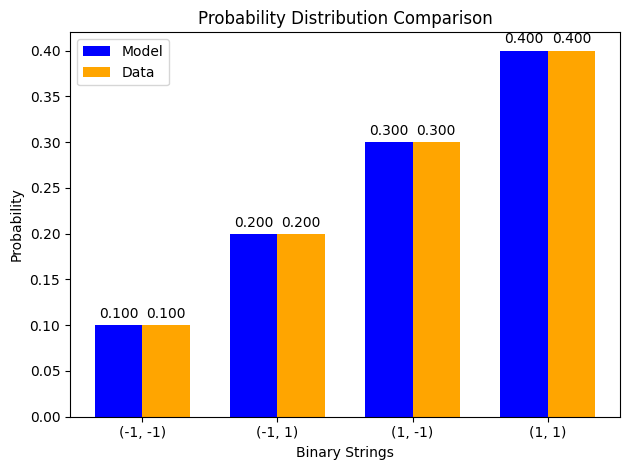

z gradient step for node 0: 1.2951412720063616e-11
z gradient step for node 1: 2.365476128862731e-10
z gradient step for node 2: 1.7909819682859762e-10
edge graident step for edge (0, 2): -1.1700581195595028e-09
edge graident step for edge (1, 2): 1.164479812576502e-10
x positive phase: 0.0
x negative phase: -3.922090806558201e-56
x gradient step for node 0: 3.922090806558201e-58
x positive phase: 0.0
x negative phase: 1.289653712485607e-35
x gradient step for node 1: -1.289653712485607e-37
x positive phase: -0.7602465278524986
x negative phase: -0.7602465331978044
x gradient step for node 2: 5.345305864601358e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000004706909937, (-1, 1): 0.1999999534371028, (1, -1): 0.2999999621762063, (1, 1): 0.4000000373175915}
LLH: 1.2798542258336882
beta: 100
EPOCH: 47


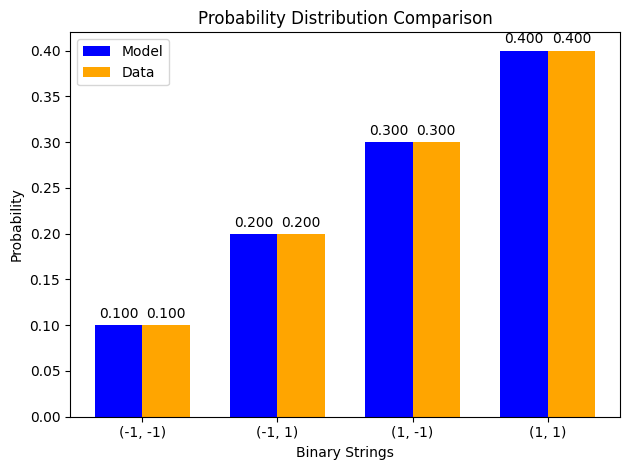

z gradient step for node 0: 1.0124042160164492e-11
z gradient step for node 1: 1.849061134762131e-10
z gradient step for node 2: 1.3999868417324812e-10
edge graident step for edge (0, 2): -9.14618749070506e-10
edge graident step for edge (1, 2): 9.102589515475046e-11
x positive phase: 0.0
x negative phase: -2.4597616434362777e-57
x gradient step for node 0: 2.459761643436278e-59
x positive phase: 0.0
x negative phase: 2.193934209312267e-36
x gradient step for node 1: -2.1939342093122672e-38
x positive phase: -0.7602465214649671
x negative phase: -0.7602465256433243
x gradient step for node 2: 4.178357215778306e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000003679328519, (-1, 1): 0.199999963602409, (1, -1): 0.29999997043364696, (1, 1): 0.4000000291706588}
LLH: 1.27985422583368
beta: 100
EPOCH: 48


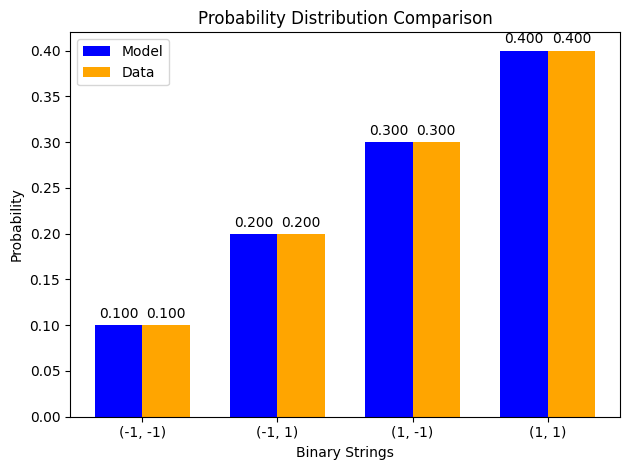

z gradient step for node 0: 7.913883437460356e-12
z gradient step for node 1: 1.4453864383145998e-10
z gradient step for node 2: 1.0943511208338918e-10
edge graident step for edge (0, 2): -7.149452155297276e-10
edge graident step for edge (1, 2): 7.115376510213878e-11
x positive phase: 0.0
x negative phase: -1.542653775445223e-58
x gradient step for node 0: 1.542653775445223e-60
x positive phase: 0.0
x negative phase: 3.7322789529127767e-37
x gradient step for node 1: -3.7322789529127767e-39
x positive phase: -0.7602465164719165
x negative phase: -0.7602465197380845
x gradient step for node 2: 3.266168002724612e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000002876081862, (-1, 1): 0.19999997154849186, (1, -1): 0.2999999768883776, (1, 1): 0.4000000228023119}
LLH: 1.2798542258336751
beta: 100
EPOCH: 49


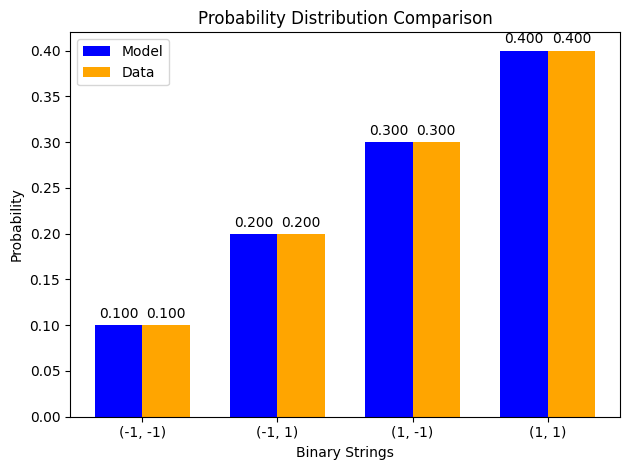

z gradient step for node 0: 6.186209877689919e-12
z gradient step for node 1: 1.1298392471603691e-10
z gradient step for node 2: 8.554396885296356e-11
edge graident step for edge (0, 2): -5.588630971886666e-10
edge graident step for edge (1, 2): 5.5619971406351e-11
x positive phase: 0.0
x negative phase: -9.674843649686546e-60
x gradient step for node 0: 9.674843649686546e-62
x positive phase: 0.0
x negative phase: 6.349281730195299e-38
x gradient step for node 1: -6.3492817301953e-40
x positive phase: -0.7602465125689144
x negative phase: -0.7602465151220351
x gradient step for node 2: 2.55312071484326e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000002248194698, (-1, 1): 0.1999999777598379, (1, -1): 0.29999998193395433, (1, 1): 0.40000001782426087}
LLH: 1.279854225833672
beta: 100
EPOCH: 50


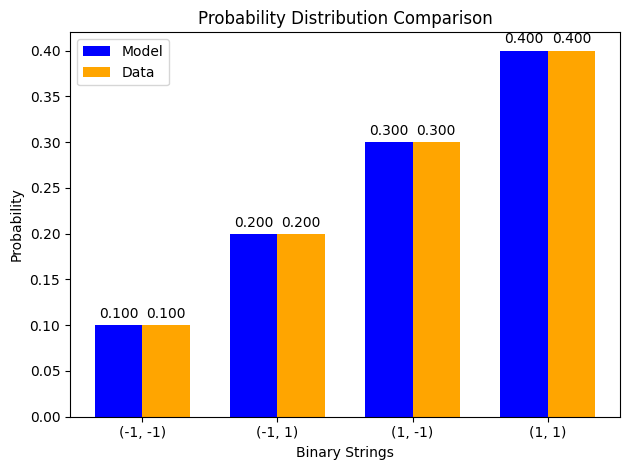

z gradient step for node 0: 4.835696287841529e-12
z gradient step for node 1: 8.831802594810867e-11
z gradient step for node 2: 6.686858095017457e-11
edge graident step for edge (0, 2): -4.368557948719598e-10
edge graident step for edge (1, 2): 4.347740167887082e-11
x positive phase: 0.0
x negative phase: -6.0676354701565064e-61
x gradient step for node 0: 6.067635470156507e-63
x positive phase: 0.0
x negative phase: 1.0801277040982932e-38
x gradient step for node 1: -1.0801277040982933e-40
x positive phase: -0.7602465095179887
x negative phase: -0.76024651151373
x gradient step for node 2: 1.9957413499582798e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000001757383697, (-1, 1): 0.19999998261516377, (1, -1): 0.29999998587801413, (1, 1): 0.4000000139329852}
LLH: 1.2798542258336703
beta: 100
EPOCH: 51


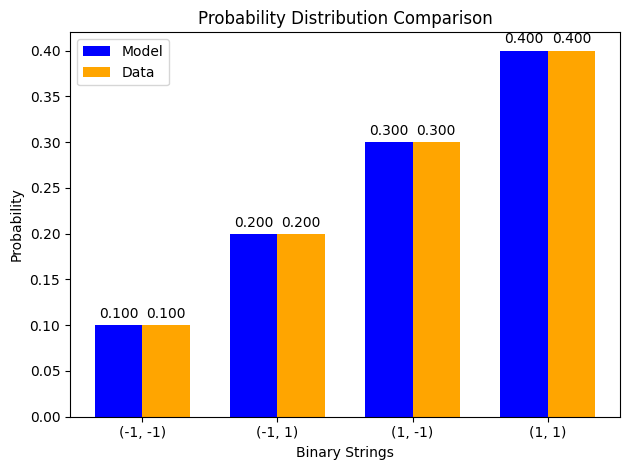

z gradient step for node 0: 3.780014079524108e-12
z gradient step for node 1: 6.90370224876169e-11
z gradient step for node 2: 5.2270276856836164e-11
edge graident step for edge (0, 2): -3.414843197102613e-10
edge graident step for edge (1, 2): 3.398570980195359e-11
x positive phase: 0.0
x negative phase: -3.8053537603245043e-62
x gradient step for node 0: 3.805353760324505e-64
x positive phase: 0.0
x negative phase: 1.8374926763187063e-39
x gradient step for node 1: -1.8374926763187065e-41
x positive phase: -0.7602465071331204
x negative phase: -0.7602465086931649
x gradient step for node 2: 1.560044537995964e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000001373723308, (-1, 1): 0.19999998641050665, (1, -1): 0.2999999889610327, (1, 1): 0.4000000108912275}
LLH: 1.2798542258336694
beta: 100
EPOCH: 52


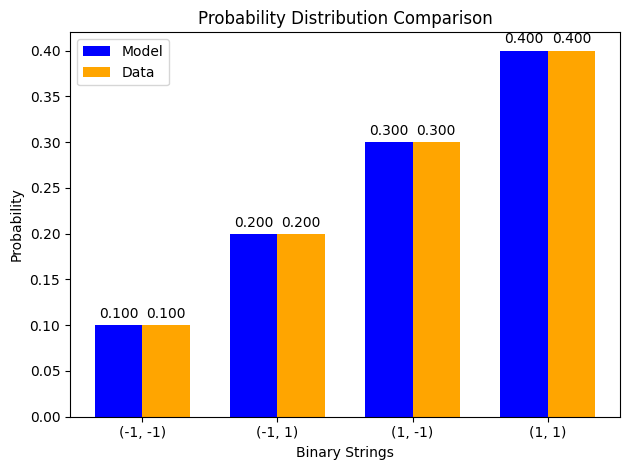

z gradient step for node 0: 2.954794742215938e-12
z gradient step for node 1: 5.396531582713138e-11
z gradient step for node 2: 4.08589773126522e-11
edge graident step for edge (0, 2): -2.669337190175369e-10
edge graident step for edge (1, 2): 2.6566181476894714e-11
x positive phase: 0.0
x negative phase: -2.3865504231539994e-63
x gradient step for node 0: 2.3865504231539995e-65
x positive phase: 0.0
x negative phase: 3.125907563555147e-40
x gradient step for node 1: -3.125907563555147e-42
x positive phase: -0.7602465052689005
x negative phase: -0.7602465064883668
x gradient step for node 2: 1.219466305713013e-11
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000001073821112, (-1, 1): 0.19999998937727528, (1, -1): 0.29999999137098704, (1, 1): 0.4000000085135267}
LLH: 1.2798542258336685
beta: 100
EPOCH: 53


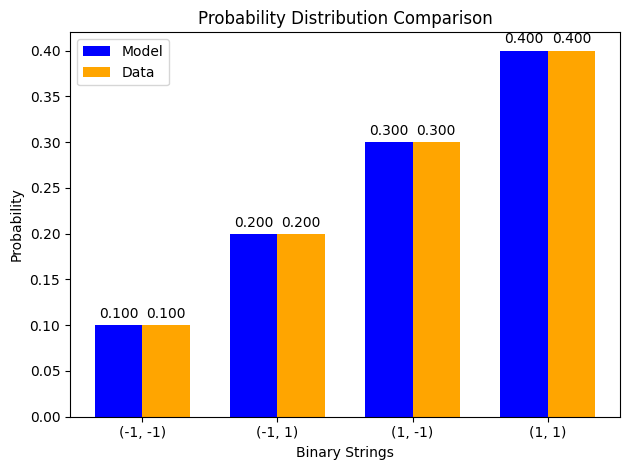

z gradient step for node 0: 2.309726299110082e-12
z gradient step for node 1: 4.2183961601605095e-11
z gradient step for node 2: 3.193891651154246e-11
edge graident step for edge (0, 2): -2.086585124128071e-10
edge graident step for edge (1, 2): 2.0766431352292615e-11
x positive phase: 0.0
x negative phase: -1.4967394660067768e-64
x gradient step for node 0: 1.4967394660067768e-66
x positive phase: 0.0
x negative phase: 5.317734474179067e-41
x gradient step for node 1: -5.317734474179067e-43
x positive phase: -0.7602465038116644
x negative phase: -0.7602465047649052
x gradient step for node 2: 9.532408196122333e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000839391587, (-1, 1): 0.19999999169635843, (1, -1): 0.2999999932548164, (1, 1): 0.4000000066549092}
LLH: 1.2798542258336683
beta: 100
EPOCH: 54


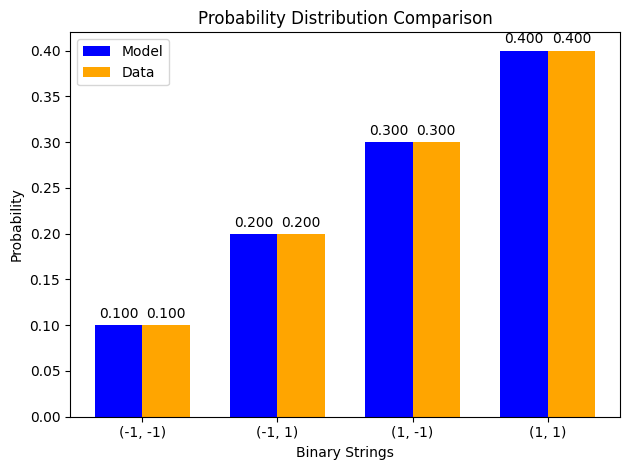

z gradient step for node 0: 1.8054868711203654e-12
z gradient step for node 1: 3.297464579166132e-11
z gradient step for node 2: 2.4966227279987763e-11
edge graident step for edge (0, 2): -1.631055604467413e-10
edge graident step for edge (1, 2): 1.623284340279696e-11
x positive phase: 0.0
x negative phase: -9.386891971719268e-66
x gradient step for node 0: 9.386891971719268e-68
x positive phase: 0.0
x negative phase: 9.046428753055921e-42
x gradient step for node 1: -9.04642875305592e-44
x positive phase: -0.7602465026725624
x negative phase: -0.7602465034176978
x gradient step for node 2: 7.451353978282782e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000656141159, (-1, 1): 0.19999999350915473, (1, -1): 0.2999999947273803, (1, 1): 0.4000000052020534}
LLH: 1.2798542258336678
beta: 100
EPOCH: 55


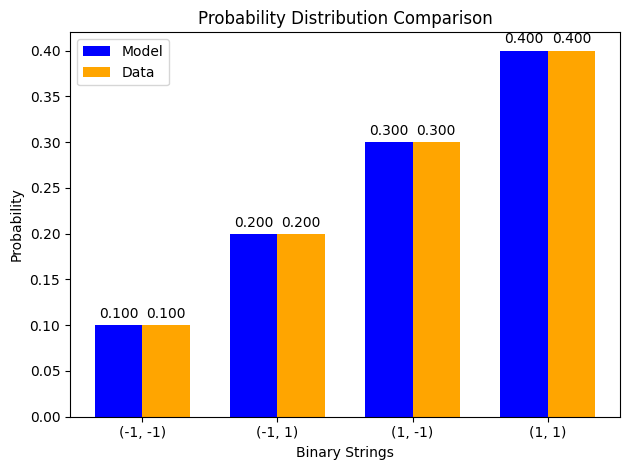

z gradient step for node 0: 1.4113255009107206e-12
z gradient step for node 1: 2.577583785301485e-11
z gradient step for node 2: 1.9515765115052376e-11
edge graident step for edge (0, 2): -1.274974315013111e-10
edge graident step for edge (1, 2): 1.2688995409959602e-11
x positive phase: 0.0
x negative phase: -5.887046148770932e-67
x gradient step for node 0: 5.887046148770932e-69
x positive phase: 0.0
x negative phase: 1.5389612599700787e-42
x gradient step for node 1: -1.5389612599700788e-44
x positive phase: -0.7602465017821416
x negative phase: -0.7602465023646041
x gradient step for node 2: 5.8246252265803375e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000000051289675, (-1, 1): 0.19999999492619325, (1, -1): 0.2999999958784634, (1, 1): 0.4000000040663759}
LLH: 1.2798542258336678
beta: 100
EPOCH: 56


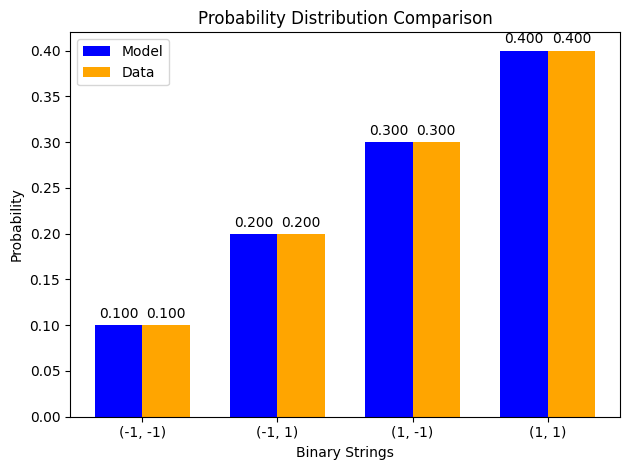

z gradient step for node 0: 1.1032136315591856e-12
z gradient step for node 1: 2.0148618051774036e-11
z gradient step for node 2: 1.5255207375108882e-11
edge graident step for edge (0, 2): -9.966303837760648e-11
edge graident step for edge (1, 2): 9.918820764731606e-12
x positive phase: 0.0
x negative phase: -3.692096717335253e-68
x gradient step for node 0: 3.692096717335253e-70
x positive phase: 0.0
x negative phase: 2.618051643040253e-43
x gradient step for node 1: -2.6180516430402528e-45
x positive phase: -0.7602465010861115
x negative phase: -0.760246501541415
x gradient step for node 2: 4.553035726218013e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000400924529, (-1, 1): 0.19999999603387308, (1, -1): 0.2999999967782504, (1, 1): 0.40000000317863105}
LLH: 1.2798542258336678
beta: 100
EPOCH: 57


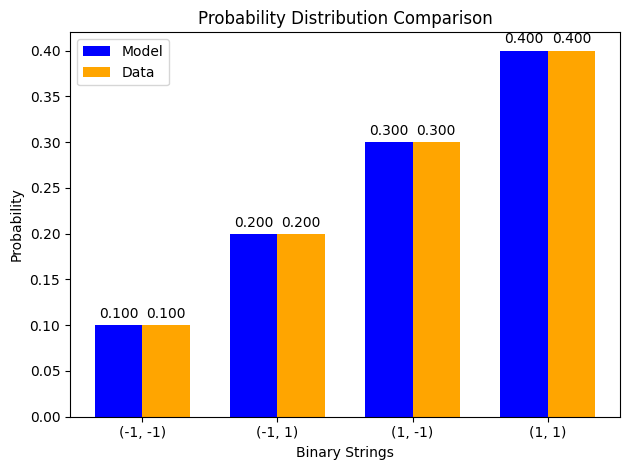

z gradient step for node 0: 8.623679548236396e-13
z gradient step for node 1: 1.5749915815987948e-11
z gradient step for node 2: 1.192479559541937e-11
edge graident step for edge (0, 2): -7.790526057593893e-11
edge graident step for edge (1, 2): 7.753409581034987e-12
x positive phase: 0.0
x negative phase: -2.3155208968684354e-69
x gradient step for node 0: 2.3155208968684356e-71
x positive phase: 0.0
x negative phase: 4.4537797008410985e-44
x gradient step for node 1: -4.453779700841099e-46
x positive phase: -0.760246500542034
x negative phase: -0.7602465008979383
x gradient step for node 2: 3.559043060263889e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000000031339733, (-1, 1): 0.19999999689973194, (1, -1): 0.29999999748160133, (1, 1): 0.40000000248469353}
LLH: 1.2798542258336676
beta: 100
EPOCH: 58


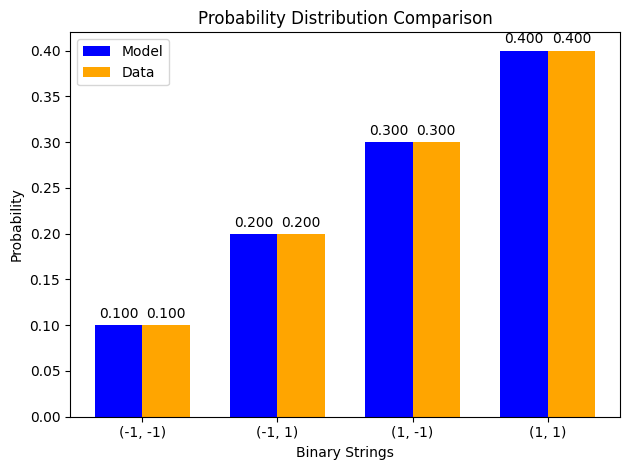

z gradient step for node 0: 6.741035507573656e-13
z gradient step for node 1: 1.2311490438232653e-11
z gradient step for node 2: 9.321451388544233e-12
edge graident step for edge (0, 2): -6.089749787774323e-11
edge graident step for edge (1, 2): 6.060737467450395e-12
x positive phase: 0.0
x negative phase: -1.4521930215580442e-70
x gradient step for node 0: 1.4521930215580442e-72
x positive phase: 0.0
x negative phase: 7.576685398454264e-45
x gradient step for node 1: -7.576685398454264e-47
x positive phase: -0.760246500116736
x negative phase: -0.7602465003949419
x gradient step for node 2: 2.7820590275950964e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000244978494, (-1, 1): 0.1999999975765618, (1, -1): 0.29999999803140154, (1, 1): 0.40000000194225166}
LLH: 1.2798542258336676
beta: 100
EPOCH: 59


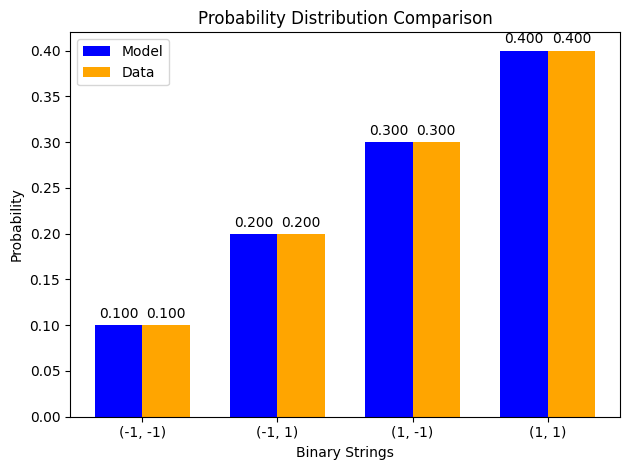

z gradient step for node 0: 5.269351621706164e-13
z gradient step for node 1: 9.6237307012359e-12
z gradient step for node 2: 7.286454634103379e-12
edge graident step for edge (0, 2): -4.760275895687727e-11
edge graident step for edge (1, 2): 4.737597536497162e-12
x positive phase: 0.0
x negative phase: -9.107516992786883e-72
x gradient step for node 0: 9.107516992786883e-74
x positive phase: 0.0
x negative phase: 1.2889313247813453e-45
x gradient step for node 1: -1.2889313247813453e-47
x positive phase: -0.760246499784286
x negative phase: -0.7602465000017558
x gradient step for node 2: 2.1746970890745843e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000191496417, (-1, 1): 0.19999999810563107, (1, -1): 0.2999999984611728, (1, 1): 0.40000000151823206}
LLH: 1.2798542258336674
beta: 100
EPOCH: 60


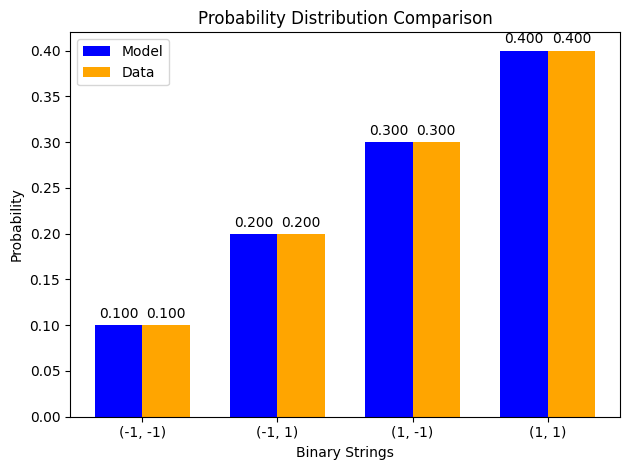

z gradient step for node 0: 4.119038443661793e-13
z gradient step for node 1: 7.522739653431643e-12
z gradient step for node 2: 5.6957234761956244e-12
edge graident step for edge (0, 2): -3.721043917437328e-11
edge graident step for edge (1, 2): 3.7033154320909034e-12
x positive phase: 0.0
x negative phase: -5.711834800712145e-73
x gradient step for node 0: 5.711834800712144e-75
x positive phase: 0.0
x negative phase: 2.1927054830728076e-46
x gradient step for node 1: -2.1927054830728076e-48
x positive phase: -0.7602464995244146
x negative phase: -0.7602464996944079
x gradient step for node 2: 1.6999335272771531e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000149690179, (-1, 1): 0.19999999851919695, (1, -1): 0.29999999879711936, (1, 1): 0.4000000011867818}
LLH: 1.2798542258336676
beta: 100
EPOCH: 61


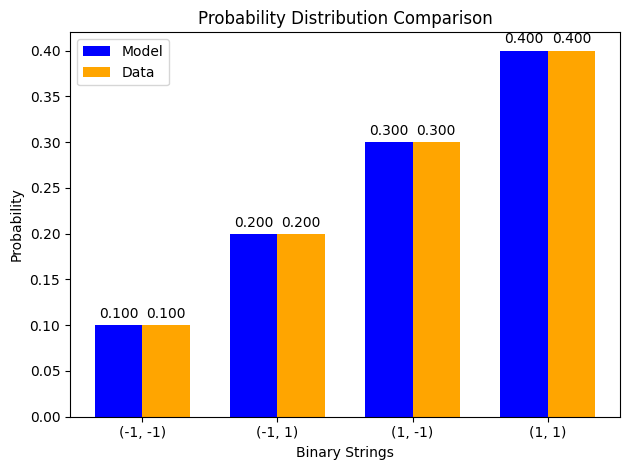

z gradient step for node 0: 3.2197522426002936e-13
z gradient step for node 1: 5.880423648019217e-12
z gradient step for node 2: 4.452269108945472e-12
edge graident step for edge (0, 2): -2.9086904274056026e-11
edge graident step for edge (1, 2): 2.8948343722134953e-12
x positive phase: 0.0
x negative phase: -3.582212034571559e-74
x gradient step for node 0: 3.582212034571559e-76
x positive phase: 0.0
x negative phase: 3.7301889145157585e-47
x gradient step for node 1: -3.730188914515759e-49
x positive phase: -0.7602464993212764
x negative phase: -0.7602464994541578
x gradient step for node 2: 1.328813725720579e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000117010815, (-1, 1): 0.1999999988424761, (1, -1): 0.29999999905972474, (1, 1): 0.400000000927691}
LLH: 1.2798542258336674
beta: 100
EPOCH: 62


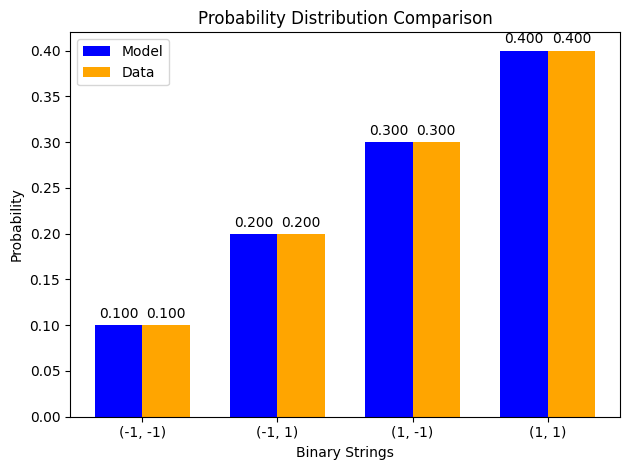

z gradient step for node 0: 2.516847841249614e-13
z gradient step for node 1: 4.596658886857341e-12
z gradient step for node 2: 3.4802841164527364e-12
edge graident step for edge (0, 2): -2.273683935571924e-11
edge graident step for edge (1, 2): 2.262849352341334e-12
x positive phase: 0.0
x negative phase: -2.246606137176178e-75
x gradient step for node 0: 2.246606137176178e-77
x positive phase: 0.0
x negative phase: 6.34572652548599e-48
x gradient step for node 1: -6.345726525485989e-50
x positive phase: -0.760246499162486
x negative phase: -0.7602464992663575
x gradient step for node 2: 1.0387146698320748e-12
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000091465779, (-1, 1): 0.19999999909517926, (1, -1): 0.29999999926499893, (1, 1): 0.40000000072516406}
LLH: 1.2798542258336676
beta: 100
EPOCH: 63


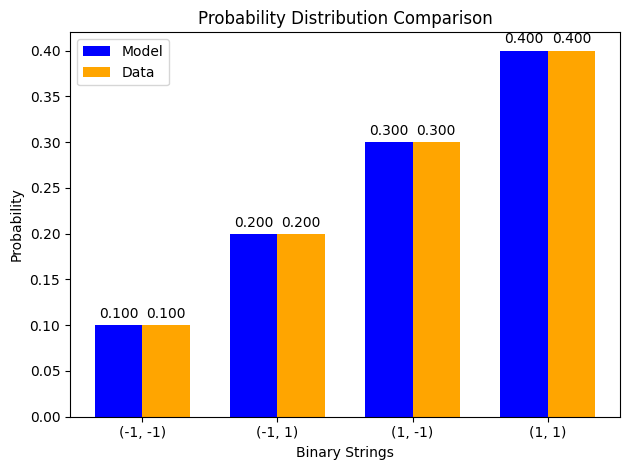

z gradient step for node 0: 1.9673984663626243e-13
z gradient step for node 1: 3.59313495623681e-12
z gradient step for node 2: 2.7204849484263605e-12
edge graident step for edge (0, 2): -1.7773085503325348e-11
edge graident step for edge (1, 2): 1.7688411846350505e-12
x positive phase: 0.0
x negative phase: -1.4089727532791826e-76
x gradient step for node 0: 1.4089727532791828e-78
x positive phase: 0.0
x negative phase: 1.0795229431643265e-48
x gradient step for node 1: -1.0795229431643264e-50
x positive phase: -0.7602464990383617
x negative phase: -0.7602464991195569
x gradient step for node 2: 8.119516170523866e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000000007149758, (-1, 1): 0.19999999929271364, (1, -1): 0.2999999994254596, (1, 1): 0.4000000005668509}
LLH: 1.2798542258336676
beta: 100
EPOCH: 64


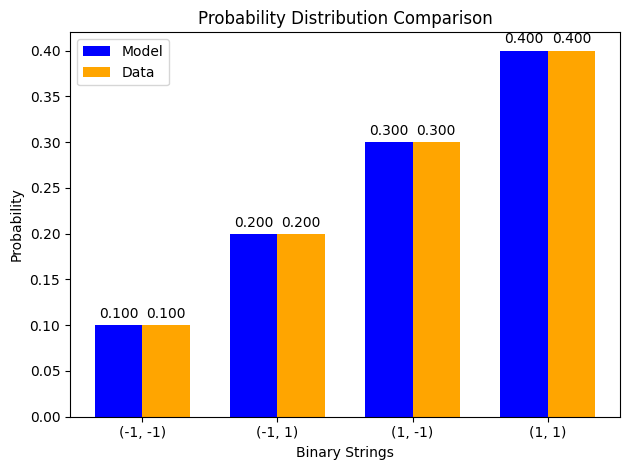

z gradient step for node 0: 1.5378975870561361e-13
z gradient step for node 1: 2.8087090986339548e-12
z gradient step for node 2: 2.126569059734962e-12
edge graident step for edge (0, 2): -1.3892983152796746e-11
edge graident step for edge (1, 2): 1.3826795264293423e-12
x positive phase: 0.0
x negative phase: -8.836458656630573e-78
x gradient step for node 0: 8.836458656630574e-80
x positive phase: 0.0
x negative phase: 1.836463926667296e-49
x gradient step for node 1: -1.836463926667296e-51
x positive phase: -0.7602464989413356
x negative phase: -0.7602464990048043
x gradient step for node 2: 6.34687857825611e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.100000000558887, (-1, 1): 0.19999999944712374, (1, -1): 0.29999999955088963, (1, 1): 0.4000000004430997}
LLH: 1.2798542258336674
beta: 100
EPOCH: 65


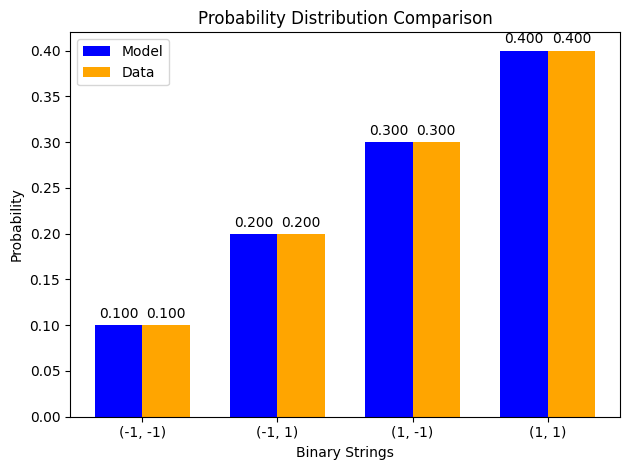

z gradient step for node 0: 1.2021328377187502e-13
z gradient step for node 1: 2.195531811910456e-12
z gradient step for node 2: 1.6623115384195586e-12
edge graident step for edge (0, 2): -1.085995765537362e-11
edge graident step for edge (1, 2): 1.0808220984870332e-12
x positive phase: 0.0
x negative phase: -5.541839015326731e-79
x gradient step for node 0: 5.5418390153267305e-81
x positive phase: 0.0
x negative phase: 3.124157551531794e-50
x gradient step for node 1: -3.124157551531794e-52
x positive phase: -0.7602464988654911
x negative phase: -0.7602464989151042
x gradient step for node 2: 4.961309141293668e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000043687444, (-1, 1): 0.199999999567824, (1, -1): 0.2999999996489362, (1, 1): 0.4000000003463653}
LLH: 1.2798542258336676
beta: 100
EPOCH: 66


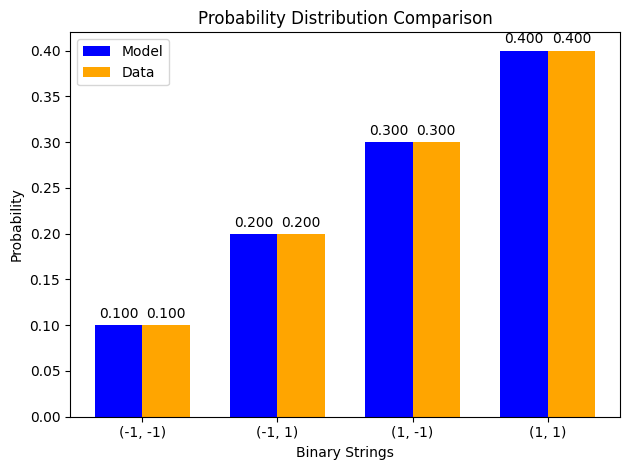

z gradient step for node 0: 9.396983191578556e-14
z gradient step for node 1: 1.7162141152660128e-12
z gradient step for node 2: 1.299404472909771e-12
edge graident step for edge (0, 2): -8.489084712959283e-12
edge graident step for edge (1, 2): 8.44865288840424e-13
x positive phase: 0.0
x negative phase: -3.4755981911207734e-80
x gradient step for node 0: 3.4755981911207734e-82
x positive phase: 0.0
x negative phase: 5.314757489814434e-51
x gradient step for node 1: -5.314757489814434e-53
x positive phase: -0.760246498806205
x negative phase: -0.7602464988449867
x gradient step for node 2: 3.8781755584693657e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000034149893, (-1, 1): 0.19999999966217377, (1, -1): 0.29999999972557834, (1, 1): 0.4000000002707489}
LLH: 1.2798542258336676
beta: 100
EPOCH: 67


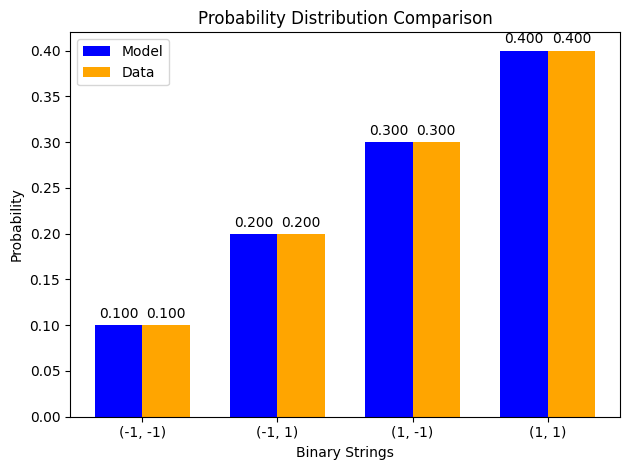

z gradient step for node 0: 7.345457575524961e-14
z gradient step for node 1: 1.3415463184784927e-12
z gradient step for node 2: 1.0157302776647726e-12
edge graident step for edge (0, 2): -6.635802740628804e-12
edge graident step for edge (1, 2): 6.604206070903729e-13
x positive phase: 0.0
x negative phase: -2.179742639298117e-81
x gradient step for node 0: 2.179742639298117e-83
x positive phase: 0.0
x negative phase: 9.041364500566687e-52
x gradient step for node 1: -9.041364500566687e-54
x positive phase: -0.7602464987598614
x negative phase: -0.7602464987901767
x gradient step for node 2: 3.0315305821204674e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000026694515, (-1, 1): 0.1999999997359258, (1, -1): 0.29999999978548825, (1, 1): 0.40000000021164084}
LLH: 1.2798542258336676
beta: 100
EPOCH: 68


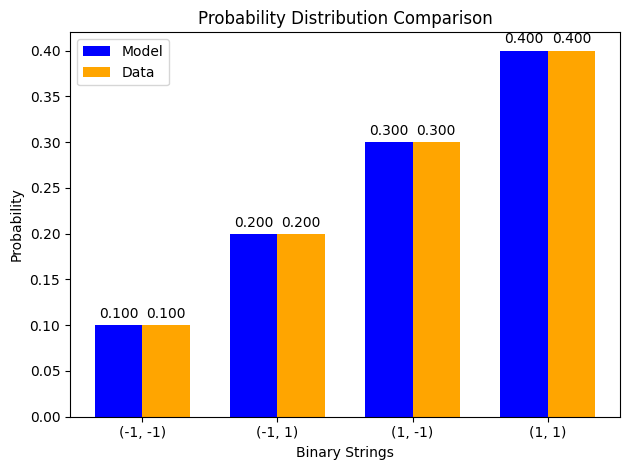

z gradient step for node 0: 5.741851438756385e-14
z gradient step for node 1: 1.0486678192478393e-12
z gradient step for node 2: 7.939829349545846e-13
edge graident step for edge (0, 2): -5.187117957383691e-12
edge graident step for edge (1, 2): 5.162403837744023e-13
x positive phase: 0.0
x negative phase: -1.367038914493389e-82
x gradient step for node 0: 1.367038914493389e-84
x positive phase: 0.0
x negative phase: 1.5380997571425267e-52
x gradient step for node 1: -1.5380997571425266e-54
x positive phase: -0.7602464987236355
x negative phase: -0.7602464987473323
x gradient step for node 2: 2.3696822282204267e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000020866744, (-1, 1): 0.1999999997935769, (1, -1): 0.2999999998323187, (1, 1): 0.40000000016543713}
LLH: 1.2798542258336674
beta: 100
EPOCH: 69


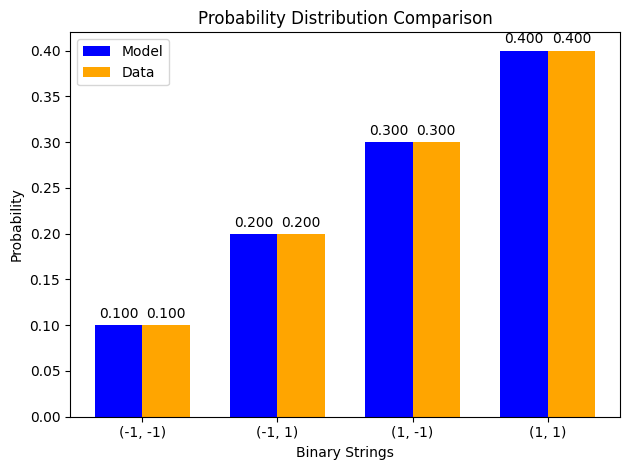

z gradient step for node 0: 4.4884651551058144e-14
z gradient step for node 1: 8.197217904459819e-13
z gradient step for node 2: 6.206406222286632e-13
edge graident step for edge (0, 2): -4.054702407163547e-12
edge graident step for edge (1, 2): 4.035394240986534e-13
x positive phase: 0.0
x negative phase: -8.57346808532501e-84
x gradient step for node 0: 8.573468085325009e-86
x positive phase: 0.0
x negative phase: 2.6165860949776838e-53
x gradient step for node 1: -2.616586094977684e-55
x positive phase: -0.7602464986953182
x negative phase: -0.760246498713842
x gradient step for node 2: 1.852373809896335e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000016311261, (-1, 1): 0.19999999983864153, (1, -1): 0.29999999986892645, (1, 1): 0.40000000012931936}
LLH: 1.2798542258336676
beta: 100
EPOCH: 70


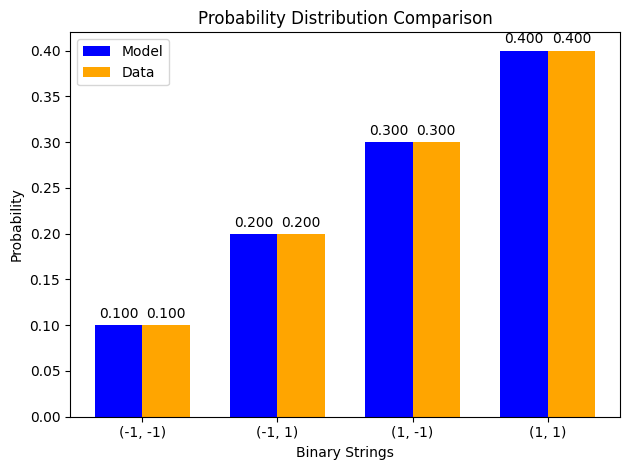

z gradient step for node 0: 3.5082492466642635e-14
z gradient step for node 1: 6.407824271192908e-13
z gradient step for node 2: 4.851549717521664e-13
edge graident step for edge (0, 2): -3.16950271583849e-12
edge graident step for edge (1, 2): 3.1543878620254875e-13
x positive phase: 0.0
x negative phase: -5.37690290133329e-85
x gradient step for node 0: 5.3769029013332895e-87
x positive phase: 0.0
x negative phase: 4.451286570472895e-54
x gradient step for node 1: -4.451286570472895e-56
x positive phase: -0.7602464986731827
x negative phase: -0.7602464986876621
x gradient step for node 2: 1.447941766485883e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000012750283, (-1, 1): 0.19999999987386863, (1, -1): 0.299999999897541, (1, 1): 0.4000000001010876}
LLH: 1.2798542258336676
beta: 100
EPOCH: 71


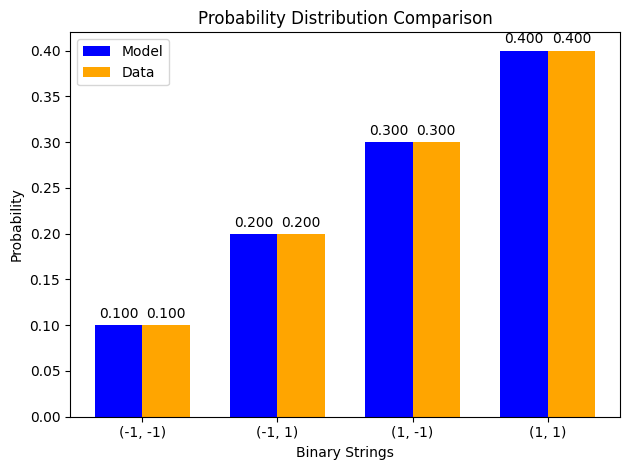

z gradient step for node 0: 2.7428059823364494e-14
z gradient step for node 1: 5.008768400038833e-13
z gradient step for node 2: 3.792316460859979e-13
edge graident step for edge (0, 2): -2.477560379077204e-12
edge graident step for edge (1, 2): 2.465766479886611e-13
x positive phase: 0.0
x negative phase: -3.3721575139344654e-86
x gradient step for node 0: 3.3721575139344657e-88
x positive phase: 0.0
x negative phase: 7.572444175190072e-55
x gradient step for node 1: -7.572444175190072e-57
x positive phase: -0.76024649865588
x negative phase: -0.7602464986671985
x gradient step for node 2: 1.1318501691448546e-13
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000009966725, (-1, 1): 0.1999999999014046, (1, -1): 0.29999999991990933, (1, 1): 0.40000000007901876}
LLH: 1.2798542258336676
beta: 100
EPOCH: 72


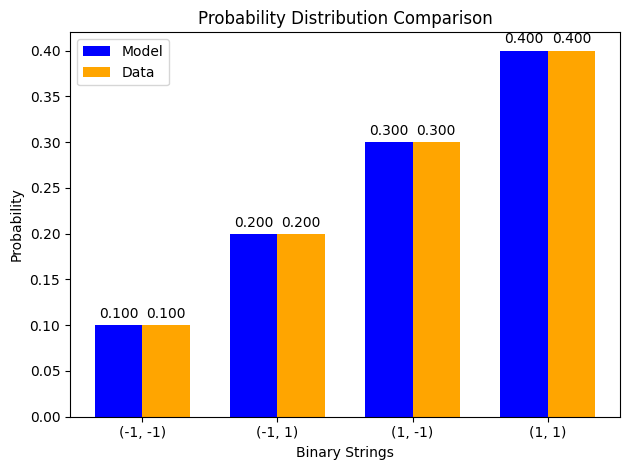

z gradient step for node 0: 2.1436741270974836e-14
z gradient step for node 1: 3.915326396430885e-13
z gradient step for node 2: 2.96444119252115e-13
edge graident step for edge (0, 2): -1.936674431934904e-12
edge graident step for edge (1, 2): 1.9274581930517344e-13
x positive phase: 0.0
x negative phase: -2.114869193617286e-87
x gradient step for node 0: 2.114869193617286e-89
x positive phase: 0.0
x negative phase: 1.2882098216218665e-55
x gradient step for node 1: -1.2882098216218666e-57
x positive phase: -0.7602464986423546
x negative phase: -0.7602464986512023
x gradient step for node 2: 8.847700350145261e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000007790864, (-1, 1): 0.19999999992292938, (1, -1): 0.29999999993739435, (1, 1): 0.4000000000617678}
LLH: 1.2798542258336674
beta: 100
EPOCH: 73


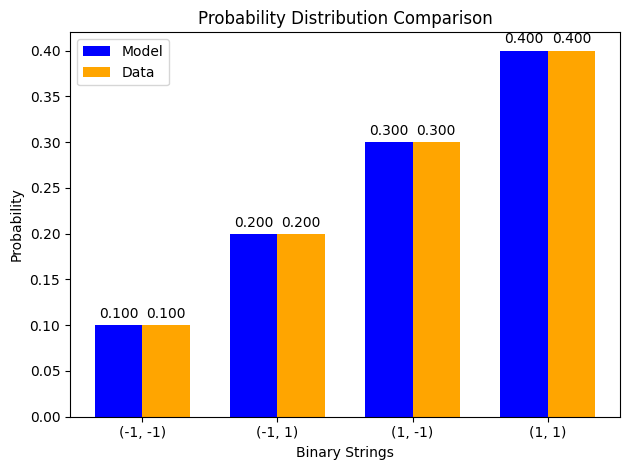

z gradient step for node 0: 1.6758261445204425e-14
z gradient step for node 1: 3.060585118674908e-13
z gradient step for node 2: 2.3172547214400654e-13
edge graident step for edge (0, 2): -1.513872638359004e-12
edge graident step for edge (1, 2): 1.506639257797815e-13
x positive phase: 0.0
x negative phase: -1.3263531400762035e-88
x gradient step for node 0: 1.3263531400762036e-90
x positive phase: 0.0
x negative phase: 2.191478083163521e-56
x gradient step for node 1: -2.1914780831635212e-58
x positive phase: -0.7602464986317818
x negative phase: -0.760246498638698
x gradient step for node 2: 6.916134331902413e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000006090008, (-1, 1): 0.19999999993975492, (1, -1): 0.29999999995106186, (1, 1): 0.4000000000482831}
LLH: 1.2798542258336676
beta: 100
EPOCH: 74


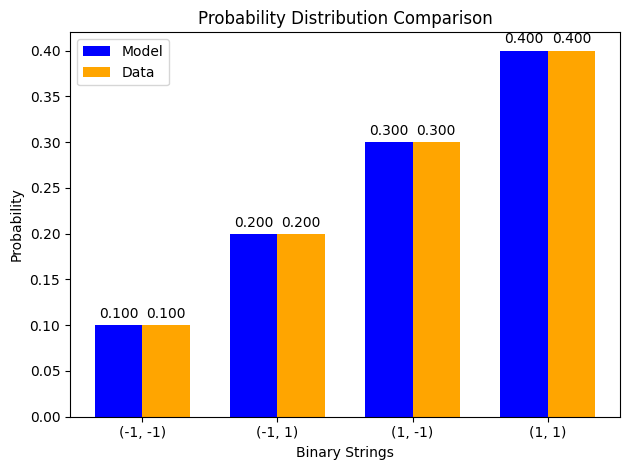

z gradient step for node 0: 1.310118680208916e-14
z gradient step for node 1: 2.3923890646315726e-13
z gradient step for node 2: 1.8113704980393665e-13
edge graident step for edge (0, 2): -1.1833725666043903e-12
edge graident step for edge (1, 2): 1.1777356867526122e-13
x positive phase: 0.0
x negative phase: -8.318304781720746e-90
x gradient step for node 0: 8.318304781720746e-92
x positive phase: 0.0
x negative phase: 3.7281008951577004e-57
x gradient step for node 1: -3.7281008951577004e-59
x positive phase: -0.7602464986235173
x negative phase: -0.7602464986289235
x gradient step for node 2: 5.406119996109737e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000004760477, (-1, 1): 0.19999999995290713, (1, -1): 0.29999999996174564, (1, 1): 0.4000000000377425}
LLH: 1.2798542258336676
beta: 100
EPOCH: 75


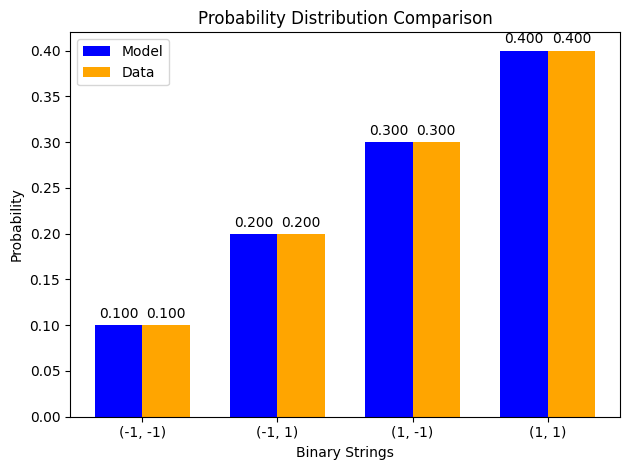

z gradient step for node 0: 1.0236811398556256e-14
z gradient step for node 1: 1.870084642696668e-13
z gradient step for node 2: 1.4159021177739816e-13
edge graident step for edge (0, 2): -9.250297750007519e-13
edge graident step for edge (1, 2): 9.206191364796723e-14
x positive phase: 0.0
x negative phase: -5.216875684417533e-91
x gradient step for node 0: 5.216875684417534e-93
x positive phase: 0.0
x negative phase: 6.342174439983013e-58
x gradient step for node 1: -6.342174439983013e-60
x positive phase: -0.760246498617057
x negative phase: -0.7602464986212831
x gradient step for node 2: 4.226174965538121e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000003721207, (-1, 1): 0.19999999996318818, (1, -1): 0.2999999999700974, (1, 1): 0.40000000002950237}
LLH: 1.2798542258336676
beta: 100
EPOCH: 76


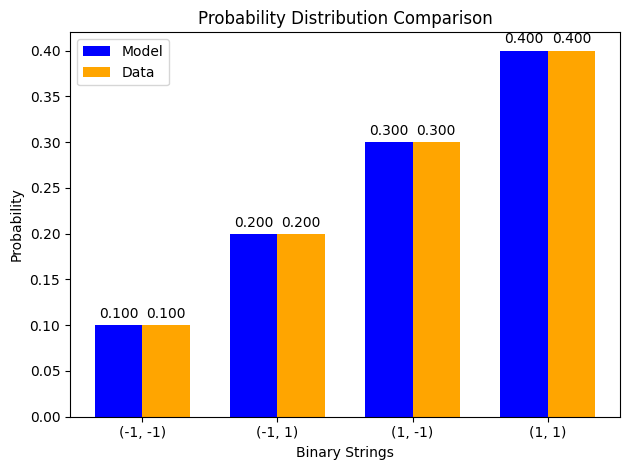

z gradient step for node 0: 8.005263119059692e-15
z gradient step for node 1: 1.4619028210205444e-13
z gradient step for node 2: 1.1068368444000499e-13
edge graident step for edge (0, 2): -7.230790965984113e-13
edge graident step for edge (1, 2): 7.196299112166572e-14
x positive phase: 0.0
x negative phase: -3.271795470914935e-92
x gradient step for node 0: 3.271795470914935e-94
x positive phase: 0.0
x negative phase: 1.0789186709030082e-58
x gradient step for node 1: -1.0789186709030082e-60
x positive phase: -0.7602464986120072
x negative phase: -0.7602464986153106
x gradient step for node 2: 3.303357587469691e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000002908814, (-1, 1): 0.19999999997122483, (1, -1): 0.2999999999766249, (1, 1): 0.40000000002306224}
LLH: 1.2798542258336676
beta: 100
EPOCH: 77


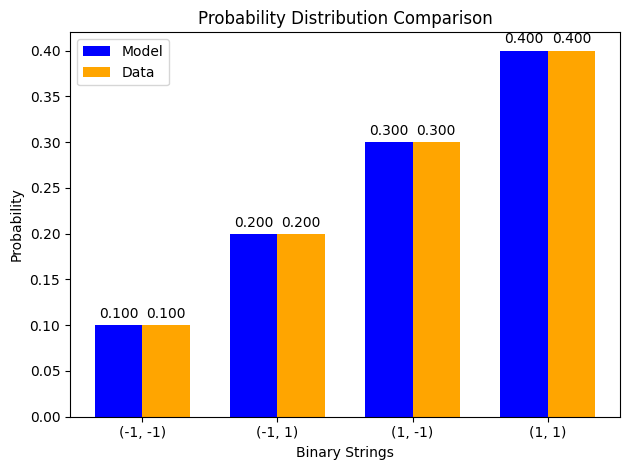

z gradient step for node 0: 6.257216966787382e-15
z gradient step for node 1: 1.1425888013505413e-13
z gradient step for node 2: 8.651218630362224e-14
edge graident step for edge (0, 2): -5.652270318456942e-13
edge graident step for edge (1, 2): 5.6253335323219744e-14
x positive phase: 0.0
x negative phase: -2.0519265269554772e-93
x gradient step for node 0: 2.051926526955477e-95
x positive phase: 0.0
x negative phase: 1.8354359525374128e-59
x gradient step for node 1: -1.835435952537413e-61
x positive phase: -0.7602464986080597
x negative phase: -0.7602464986106421
x gradient step for node 2: 2.582378755278114e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000002273791, (-1, 1): 0.19999999997750667, (1, -1): 0.29999999998172866, (1, 1): 0.4000000000180269}
LLH: 1.2798542258336674
beta: 100
EPOCH: 78


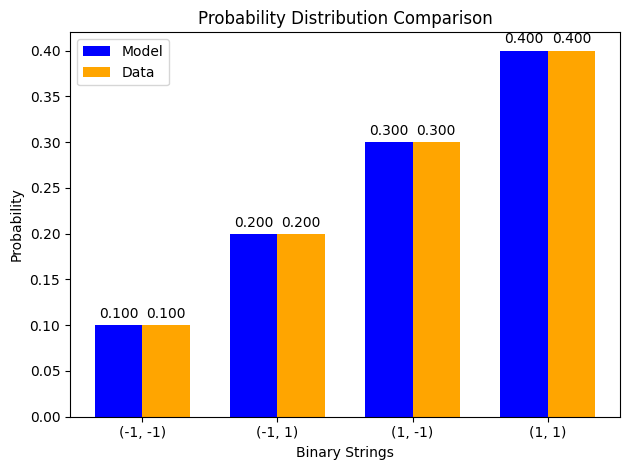

z gradient step for node 0: 4.889977311961502e-15
z gradient step for node 1: 8.933020989587703e-14
z gradient step for node 2: 6.763450910440838e-14
edge graident step for edge (0, 2): -4.41823799768315e-13
edge graident step for edge (1, 2): 4.397093800179164e-14
x positive phase: 0.0
x negative phase: -1.2868782629651383e-94
x gradient step for node 0: 1.2868782629651382e-96
x positive phase: 0.0
x negative phase: 3.122408784609829e-60
x gradient step for node 1: -3.1224087846098292e-62
x positive phase: -0.7602464986049742
x negative phase: -0.7602464986069926
x gradient step for node 2: 2.0183854587685347e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000001777384, (-1, 1): 0.19999999998241738, (1, -1): 0.2999999999857169, (1, 1): 0.40000000001409175}
LLH: 1.2798542258336676
beta: 100
EPOCH: 79


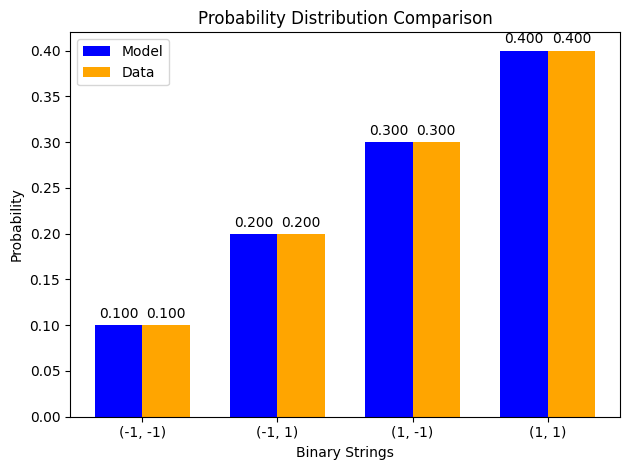

z gradient step for node 0: 3.8263836543706024e-15
z gradient step for node 1: 6.981720757082143e-14
z gradient step for node 2: 5.28621590945022e-14
edge graident step for edge (0, 2): -3.4537345205976065e-13
edge graident step for edge (1, 2): 3.4376390622981034e-14
x positive phase: 0.0
x negative phase: -8.070735682049131e-96
x gradient step for node 0: 8.070735682049132e-98
x positive phase: 0.0
x negative phase: 5.3117825249207246e-61
x gradient step for node 1: -5.311782524920724e-63
x positive phase: -0.7602464986025621
x negative phase: -0.7602464986041398
x gradient step for node 2: 1.57773794029481e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000000000138936, (-1, 1): 0.1999999999862558, (1, -1): 0.2999999999888357, (1, 1): 0.400000000011015}
LLH: 1.2798542258336674
beta: 100
EPOCH: 80


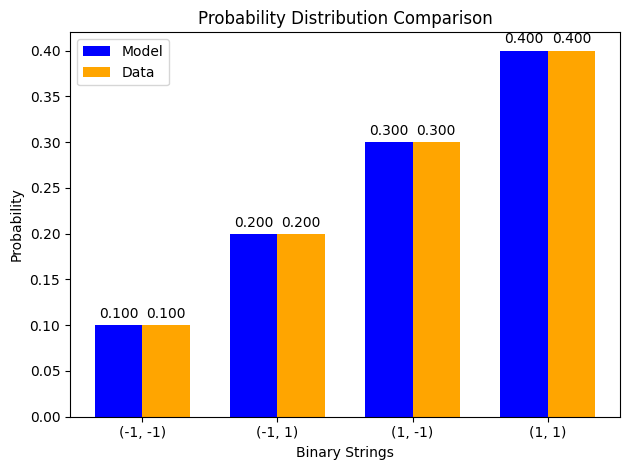

z gradient step for node 0: 2.9876101592662963e-15
z gradient step for node 1: 5.458522522872045e-14
z gradient step for node 2: 4.132749698015914e-14
edge graident step for edge (0, 2): -2.699693246732693e-13
edge graident step for edge (1, 2): 2.6865731861391852e-14
x positive phase: 0.0
x negative phase: -5.061611212770388e-97
x gradient step for node 0: 5.061611212770388e-99
x positive phase: 0.0
x negative phase: 9.036303552350023e-62
x gradient step for node 1: -9.036303552350023e-64
x positive phase: -0.7602464986006766
x negative phase: -0.7602464986019098
x gradient step for node 2: 1.2332357357536239e-14
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000001086043, (-1, 1): 0.1999999999892564, (1, -1): 0.2999999999912725, (1, 1): 0.4000000000086106}
LLH: 1.2798542258336676
beta: 100
EPOCH: 81


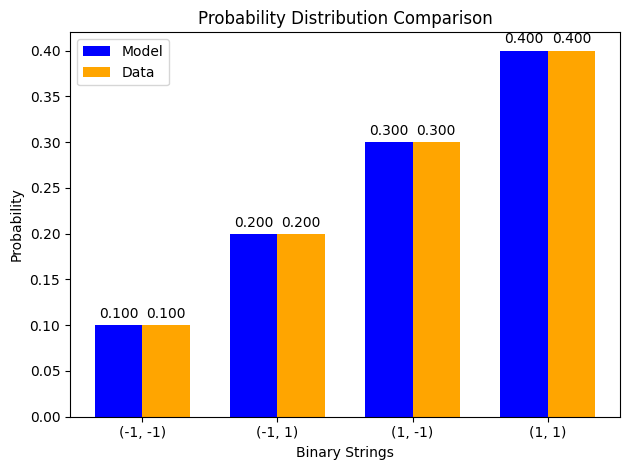

z gradient step for node 0: 2.3370194668359546e-15
z gradient step for node 1: 4.265948705395317e-14
z gradient step for node 2: 3.229971845541968e-14
edge graident step for edge (0, 2): -2.1103507830133595e-13
edge graident step for edge (1, 2): 2.1003199179858712e-14
x positive phase: 0.0
x negative phase: -3.174420409689076e-98
x gradient step for node 0: 3.174420409689076e-100
x positive phase: 0.0
x negative phase: 1.5372387989829749e-62
x gradient step for node 1: -1.537238798982975e-64
x positive phase: -0.7602464985992028
x negative phase: -0.7602464986001668
x gradient step for node 2: 9.640066522820234e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000848949, (-1, 1): 0.1999999999916018, (1, -1): 0.299999999993178, (1, 1): 0.40000000000673075}
LLH: 1.2798542258336674
beta: 100
EPOCH: 82


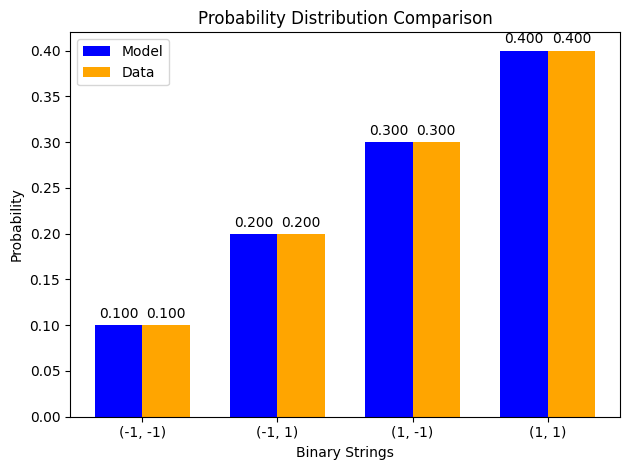

z gradient step for node 0: 1.8252066524837575e-15
z gradient step for node 1: 3.334971188095892e-14
z gradient step for node 2: 2.525091247207456e-14
edge graident step for edge (0, 2): -1.649624881139289e-13
edge graident step for edge (1, 2): 1.6419088311181442e-14
x positive phase: 0.0
x negative phase: -1.99085716270588e-99
x gradient step for node 0: 1.99085716270588e-101
x positive phase: 0.0
x negative phase: 2.615121450291012e-63
x gradient step for node 1: -2.6151214502910123e-65
x positive phase: -0.7602464985980508
x negative phase: -0.7602464985988044
x gradient step for node 2: 7.536193891155562e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000663613, (-1, 1): 0.1999999999934353, (1, -1): 0.29999999999466753, (1, 1): 0.4000000000052612}
LLH: 1.2798542258336674
beta: 100
EPOCH: 83


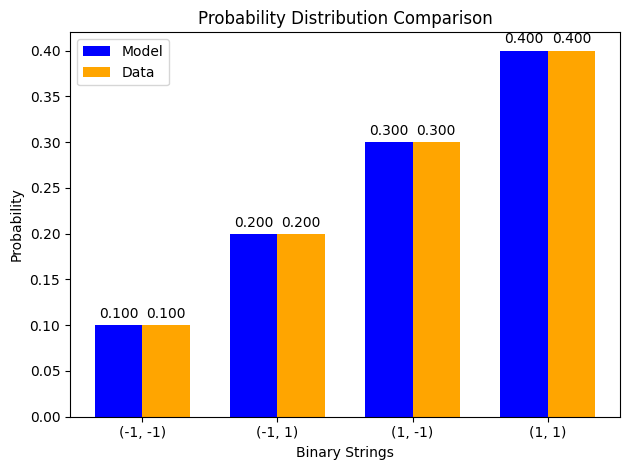

z gradient step for node 0: 1.4266365866433261e-15
z gradient step for node 1: 2.607219995454102e-14
z gradient step for node 2: 1.973948782207913e-14
edge graident step for edge (0, 2): -1.2894796341811344e-13
edge graident step for edge (1, 2): 1.2830847495592935e-14
x positive phase: 0.0
x negative phase: -1.2485782381879678e-100
x gradient step for node 0: 1.2485782381879678e-102
x positive phase: 0.0
x negative phase: 4.448794946055548e-64
x gradient step for node 1: -4.448794946055548e-66
x positive phase: -0.7602464985971502
x negative phase: -0.7602464985977393
x gradient step for node 2: 5.890843368661081e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000518733, (-1, 1): 0.19999999999486848, (1, -1): 0.2999999999958316, (1, 1): 0.4000000000041127}
LLH: 1.2798542258336674
beta: 100
EPOCH: 84


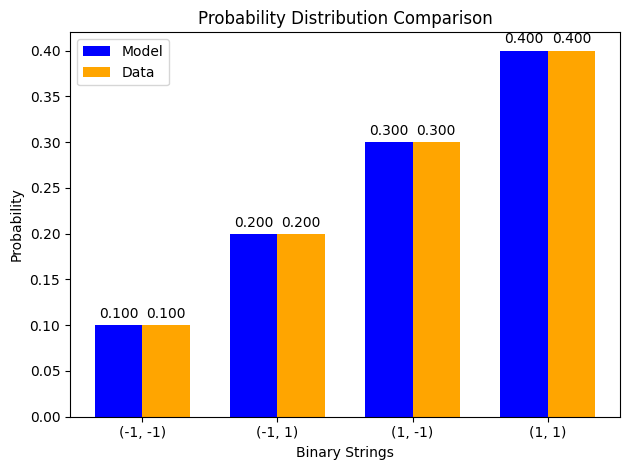

z gradient step for node 0: 1.1157741397482824e-15
z gradient step for node 1: 2.037953139577553e-14
z gradient step for node 2: 1.542960204048427e-14
edge graident step for edge (0, 2): -1.0079603818269334e-13
edge graident step for edge (1, 2): 1.0031975250512914e-14
x positive phase: 0.0
x negative phase: -7.830534737050165e-102
x gradient step for node 0: 7.830534737050165e-104
x positive phase: 0.0
x negative phase: 7.568205472790083e-65
x gradient step for node 1: -7.568205472790083e-67
x positive phase: -0.7602464985964463
x negative phase: -0.760246498596907
x gradient step for node 2: 4.606315329169775e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000405483, (-1, 1): 0.19999999999598883, (1, -1): 0.2999999999967413, (1, 1): 0.40000000000321506}
LLH: 1.2798542258336674
beta: 100
EPOCH: 85


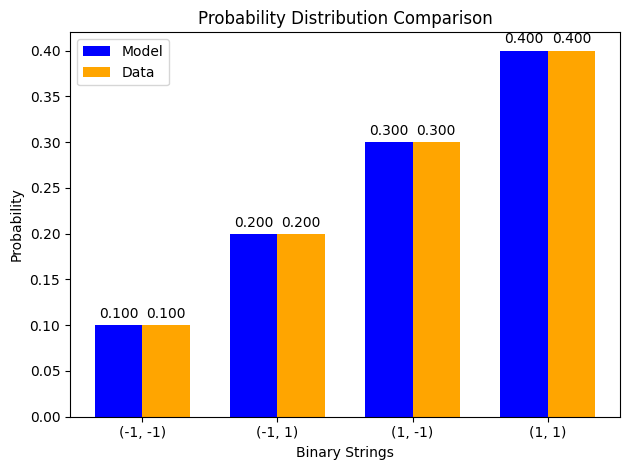

z gradient step for node 0: 8.715250743307479e-16
z gradient step for node 1: 1.5922541063417838e-14
z gradient step for node 2: 1.2056466935916887e-14
edge graident step for edge (0, 2): -7.879613628247739e-14
edge graident step for edge (1, 2): 7.84150522292748e-15
x positive phase: 0.0
x negative phase: -4.910967722622232e-103
x gradient step for node 0: 4.910967722622231e-105
x positive phase: 0.0
x negative phase: 1.287488741850776e-65
x gradient step for node 1: -1.287488741850776e-67
x positive phase: -0.7602464985958961
x negative phase: -0.7602464985962559
x gradient step for node 2: 3.598232822810133e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000316969, (-1, 1): 0.19999999999686438, (1, -1): 0.2999999999974531, (1, 1): 0.4000000000025129}
LLH: 1.2798542258336676
beta: 100
EPOCH: 86


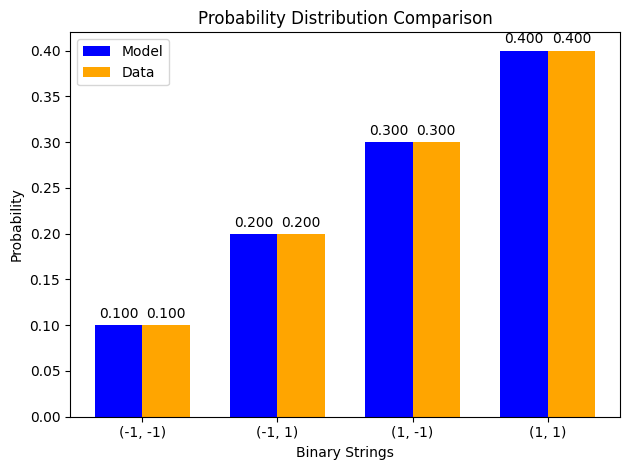

z gradient step for node 0: 6.811218256075335e-16
z gradient step for node 1: 1.2455869669025787e-14
z gradient step for node 2: 9.429124148141455e-15
edge graident step for edge (0, 2): -6.159045495834903e-14
edge graident step for edge (1, 2): 6.1278759844185516e-15
x positive phase: 0.0
x negative phase: -3.079943424401933e-104
x gradient step for node 0: 3.079943424401933e-106
x positive phase: 0.0
x negative phase: 2.1902513962588802e-66
x gradient step for node 1: -2.1902513962588802e-68
x positive phase: -0.760246498595466
x negative phase: -0.7602464985957471
x gradient step for node 2: 2.8110846983508964e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000247769, (-1, 1): 0.19999999999754908, (1, -1): 0.2999999999980089, (1, 1): 0.40000000000196434}
LLH: 1.2798542258336676
beta: 100
EPOCH: 87


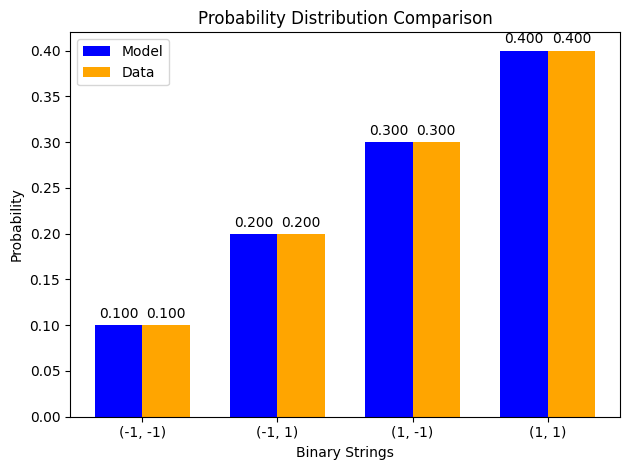

z gradient step for node 0: 5.351274978693255e-16
z gradient step for node 1: 9.732770145376436e-15
z gradient step for node 2: 7.369937993217946e-15
edge graident step for edge (0, 2): -4.81442663513576e-14
edge graident step for edge (1, 2): 4.791722574282176e-15
x positive phase: 0.0
x negative phase: -1.931605344076883e-105
x gradient step for node 0: 1.931605344076883e-107
x positive phase: 0.0
x negative phase: 3.7260140791011236e-67
x gradient step for node 1: -3.7260140791011237e-69
x positive phase: -0.7602464985951297
x negative phase: -0.7602464985953497
x gradient step for node 2: 2.199351811782435e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000193673, (-1, 1): 0.19999999999808407, (1, -1): 0.2999999999984437, (1, 1): 0.40000000000153557}
LLH: 1.2798542258336674
beta: 100
EPOCH: 88


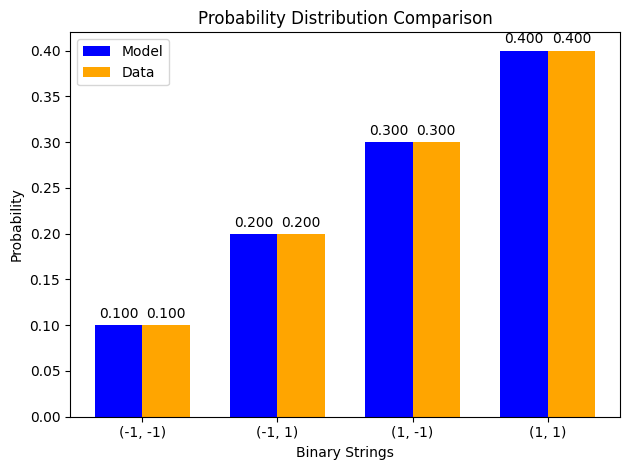

z gradient step for node 0: 4.1577852272212114e-16
z gradient step for node 1: 7.608080832000042e-15
z gradient step for node 2: 5.7603921632676245e-15
edge graident step for edge (0, 2): -3.76340625329874e-14
edge graident step for edge (1, 2): 3.7453373735729655e-15
x positive phase: 0.0
x negative phase: -1.2114180980510782e-106
x gradient step for node 0: 1.2114180980510782e-108
x positive phase: 0.0
x negative phase: 6.338624388683171e-68
x gradient step for node 1: -6.338624388683171e-70
x positive phase: -0.7602464985948669
x negative phase: -0.7602464985950388
x gradient step for node 2: 1.7186252421197424e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000151395, (-1, 1): 0.19999999999850246, (1, -1): 0.2999999999987833, (1, 1): 0.4000000000012003}
LLH: 1.2798542258336676
beta: 100
EPOCH: 89


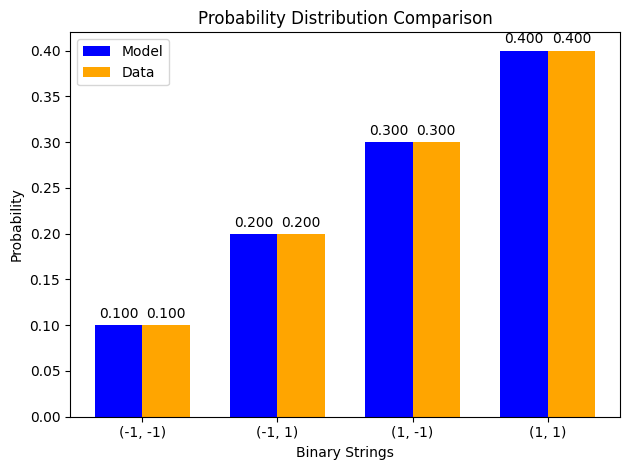

z gradient step for node 0: 3.2807090377673377e-16
z gradient step for node 1: 5.944966741111557e-15
z gradient step for node 2: 4.5015380312207754e-15
edge graident step for edge (0, 2): -2.941785703924893e-14
edge graident step for edge (1, 2): 2.928768338961163e-15
x positive phase: 0.0
x negative phase: -7.597482647240716e-108
x gradient step for node 0: 7.597482647240716e-110
x positive phase: 0.0
x negative phase: 1.0783147429902803e-68
x gradient step for node 1: -1.0783147429902804e-70
x positive phase: -0.7602464985946615
x negative phase: -0.7602464985947959
x gradient step for node 2: 1.3433698597964394e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000118342, (-1, 1): 0.19999999999882928, (1, -1): 0.2999999999990491, (1, 1): 0.40000000000093827}
LLH: 1.2798542258336676
beta: 100
EPOCH: 90


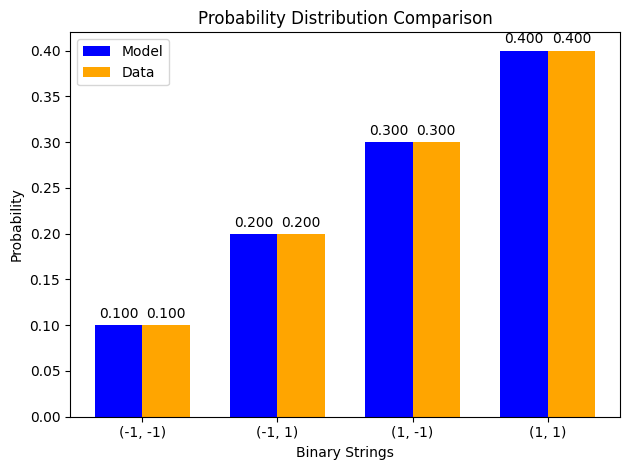

z gradient step for node 0: 2.531308496145357e-16
z gradient step for node 1: 4.649336471373999e-15
z gradient step for node 2: 3.5205172110863715e-15
edge graident step for edge (0, 2): -2.299577195330471e-14
edge graident step for edge (1, 2): 2.2881696537524476e-15
x positive phase: 0.0
x negative phase: -4.764807680209371e-109
x gradient step for node 0: 4.7648076802093705e-111
x positive phase: 0.0
x negative phase: 1.8344085619379592e-69
x gradient step for node 1: -1.834408561937959e-71
x positive phase: -0.760246498594501
x negative phase: -0.760246498594606
x gradient step for node 2: 1.0502709812953982e-15
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000092506, (-1, 1): 0.19999999999908485, (1, -1): 0.29999999999925675, (1, 1): 0.4000000000007333}
LLH: 1.2798542258336676
beta: 100
EPOCH: 91


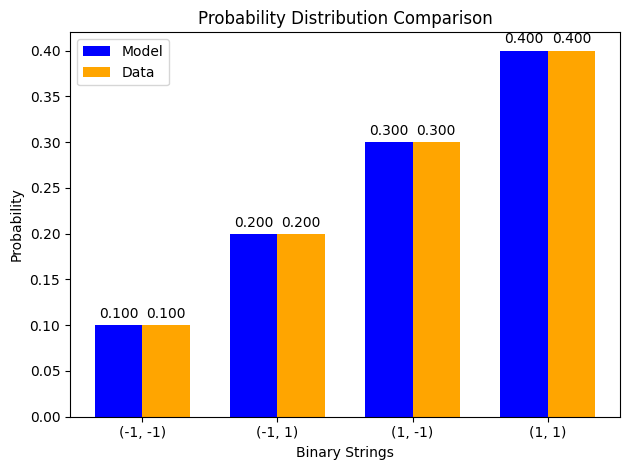

z gradient step for node 0: 1.9817480989559046e-16
z gradient step for node 1: 3.635702849891232e-15
z gradient step for node 2: 2.7537694347046227e-15
edge graident step for edge (0, 2): -1.7973122989900505e-14
edge graident step for edge (1, 2): 1.790234627208065e-15
x positive phase: 0.0
x negative phase: -2.9882782605245796e-110
x gradient step for node 0: 2.9882782605245797e-112
x positive phase: 0.0
x negative phase: 3.120661007361614e-70
x gradient step for node 1: -3.120661007361614e-72
x positive phase: -0.7602464985943755
x negative phase: -0.7602464985944575
x gradient step for node 2: 8.193445921733655e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000072312, (-1, 1): 0.1999999999992847, (1, -1): 0.29999999999941884, (1, 1): 0.4000000000005732}
LLH: 1.2798542258336676
beta: 100
EPOCH: 92


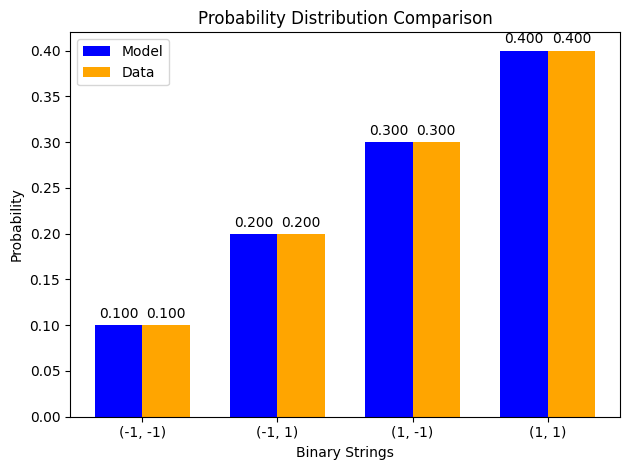

z gradient step for node 0: 1.5709655798445965e-16
z gradient step for node 1: 2.8410607200157756e-15
z gradient step for node 2: 2.1510571102112408e-15
edge graident step for edge (0, 2): -1.4050149932387513e-14
edge graident step for edge (1, 2): 1.3999912340523223e-15
x positive phase: 0.0
x negative phase: -1.8741169763132917e-111
x gradient step for node 0: 1.8741169763132917e-113
x positive phase: 0.0
x negative phase: 5.308809239629054e-71
x gradient step for node 1: -5.308809239629054e-73
x positive phase: -0.7602464985942774
x negative phase: -0.7602464985943413
x gradient step for node 2: 6.394884621840901e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000056523, (-1, 1): 0.19999999999944076, (1, -1): 0.2999999999995457, (1, 1): 0.4000000000004481}
LLH: 1.2798542258336676
beta: 100
EPOCH: 93


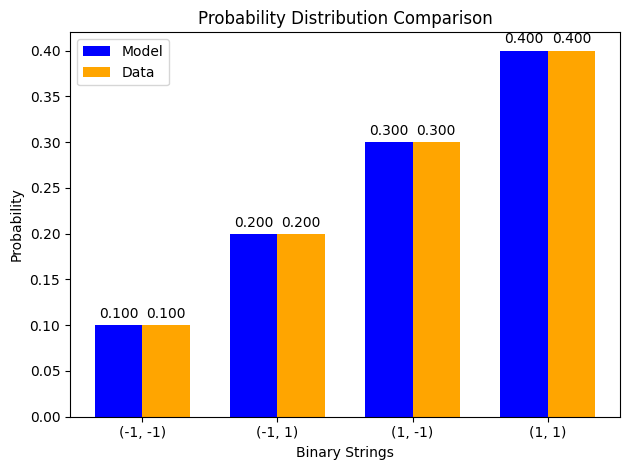

z gradient step for node 0: 1.2101430968414207e-16
z gradient step for node 1: 2.2218338280310944e-15
z gradient step for node 2: 1.6819878823071122e-15
edge graident step for edge (0, 2): -1.0983436382616674e-14
edge graident step for edge (1, 2): 1.0957901253050296e-15
x positive phase: 0.0
x negative phase: -1.175363916845117e-112
x gradient step for node 0: 1.175363916845117e-114
x positive phase: 0.0
x negative phase: 9.031245456105196e-72
x gradient step for node 1: -9.031245456105197e-74
x positive phase: -0.7602464985942008
x negative phase: -0.7602464985942508
x gradient step for node 2: 4.996003610813204e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000044178, (-1, 1): 0.19999999999956297, (1, -1): 0.2999999999996448, (1, 1): 0.4000000000003505}
LLH: 1.2798542258336676
beta: 100
EPOCH: 94


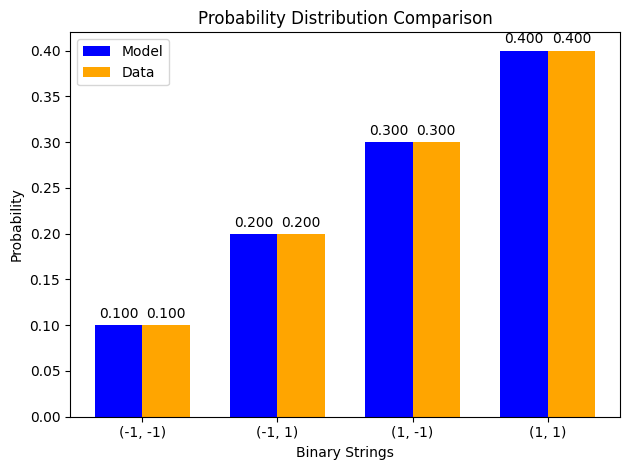

z gradient step for node 0: 9.381384558082572e-17
z gradient step for node 1: 1.7305601396344628e-15
z gradient step for node 2: 1.31117339208231e-15
edge graident step for edge (0, 2): -8.587297539719429e-15
edge graident step for edge (1, 2): 8.548717289613706e-16
x positive phase: 0.0
x negative phase: -7.371366646181428e-114
x gradient step for node 0: 7.371366646181428e-116
x positive phase: 0.0
x negative phase: 1.5363783252859714e-72
x gradient step for node 1: -1.5363783252859715e-74
x positive phase: -0.7602464985941407
x negative phase: -0.76024649859418
x gradient step for node 2: 3.930189507173054e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.1000000000003454, (-1, 1): 0.19999999999965834, (1, -1): 0.29999999999972243, (1, 1): 0.4000000000002738}
LLH: 1.2798542258336676
beta: 100
EPOCH: 95


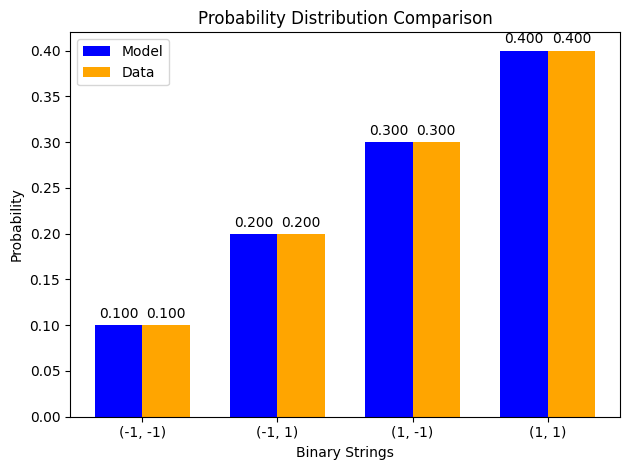

z gradient step for node 0: 7.438494264988549e-17
z gradient step for node 1: 1.3569700918480976e-15
z gradient step for node 2: 1.0262624083878791e-15
edge graident step for edge (0, 2): -6.711853295371384e-15
edge graident step for edge (1, 2): 6.677991493120317e-16
x positive phase: 0.0
x negative phase: -4.622997648112037e-115
x gradient step for node 0: 4.6229976481120366e-117
x positive phase: 0.0
x negative phase: 2.6136576288193484e-73
x gradient step for node 1: -2.6136576288193483e-75
x positive phase: -0.7602464985940938
x negative phase: -0.7602464985941244
x gradient step for node 2: 3.0642155479654323e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000026998, (-1, 1): 0.19999999999973284, (1, -1): 0.2999999999997832, (1, 1): 0.40000000000021385}
LLH: 1.2798542258336676
beta: 100
EPOCH: 96


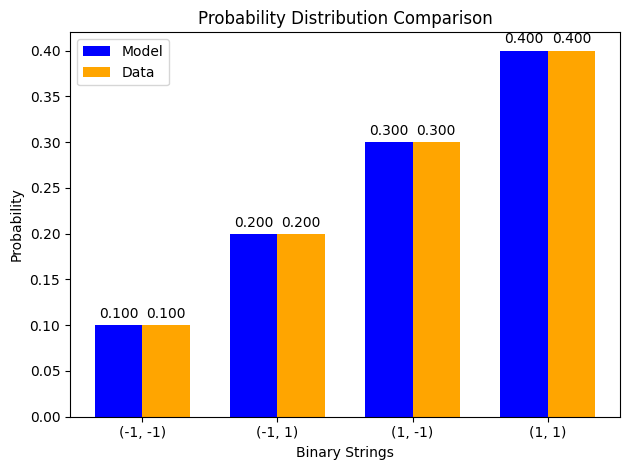

z gradient step for node 0: 5.717648576819556e-17
z gradient step for node 1: 1.0669243266647754e-15
z gradient step for node 2: 8.051892486093948e-16
edge graident step for edge (0, 2): -5.243860901060771e-15
edge graident step for edge (1, 2): 5.206945985491985e-16
x positive phase: 0.0
x negative phase: -2.899341232136742e-116
x gradient step for node 0: 2.899341232136742e-118
x positive phase: 0.0
x negative phase: 4.44630472082131e-74
x gradient step for node 1: -4.4463047208213103e-76
x positive phase: -0.7602464985940571
x negative phase: -0.7602464985940811
x gradient step for node 2: 2.3980817331903383e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000021103, (-1, 1): 0.19999999999979132, (1, -1): 0.2999999999998304, (1, 1): 0.4000000000001674}
LLH: 1.2798542258336674
beta: 100
EPOCH: 97


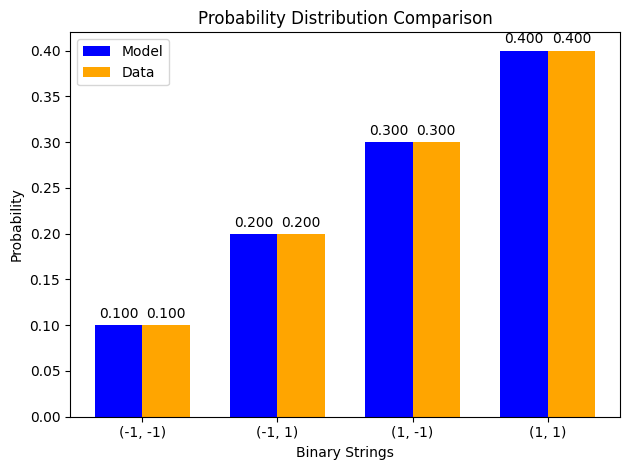

z gradient step for node 0: 4.496403249731884e-17
z gradient step for node 1: 8.279488206142105e-16
z gradient step for node 2: 6.269984531570572e-16
edge graident step for edge (0, 2): -4.100331185696859e-15
edge graident step for edge (1, 2): 4.0745185003743244e-16
x positive phase: 0.0
x negative phase: -1.8183395753636144e-117
x gradient step for node 0: 1.8183395753636144e-119
x positive phase: 0.0
x negative phase: 7.563969148985481e-75
x gradient step for node 1: -7.563969148985481e-77
x positive phase: -0.7602464985940286
x negative phase: -0.7602464985940474
x gradient step for node 2: 1.8762769116165145e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000016497, (-1, 1): 0.1999999999998368, (1, -1): 0.29999999999986704, (1, 1): 0.40000000000013114}
LLH: 1.2798542258336676
beta: 100
EPOCH: 98


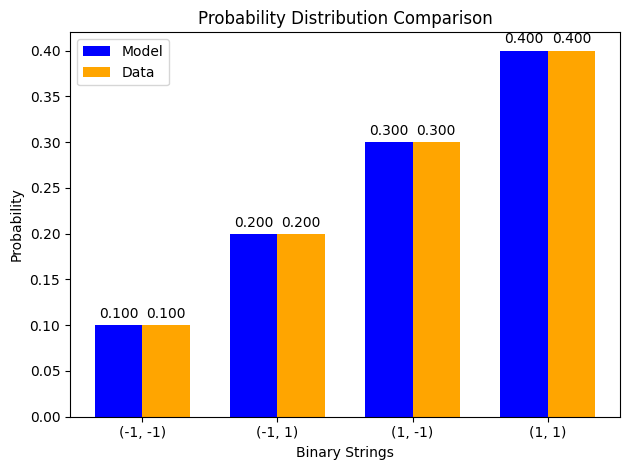

z gradient step for node 0: 3.552713678800501e-17
z gradient step for node 1: 6.414313524771842e-16
z gradient step for node 2: 4.875266856885219e-16
edge graident step for edge (0, 2): -3.2096547641913276e-15
edge graident step for edge (1, 2): 3.22519788653608e-16
x positive phase: 0.0
x negative phase: -1.140382778917973e-118
x gradient step for node 0: 1.140382778917973e-120
x positive phase: 0.0
x negative phase: 1.2867680664999615e-75
x gradient step for node 1: -1.2867680664999614e-77
x positive phase: -0.7602464985940062
x negative phase: -0.7602464985940209
x gradient step for node 2: 1.4765966227514583e-16
data: {(-1, -1): 0.1, (-1, 1): 0.2, (1, -1): 0.3, (1, 1): 0.4}
model: {(-1, -1): 0.10000000000012908, (-1, 1): 0.19999999999987245, (1, -1): 0.2999999999998965, (1, 1): 0.40000000000010205}
LLH: 1.2798542258336674
beta: 100
EPOCH: 99


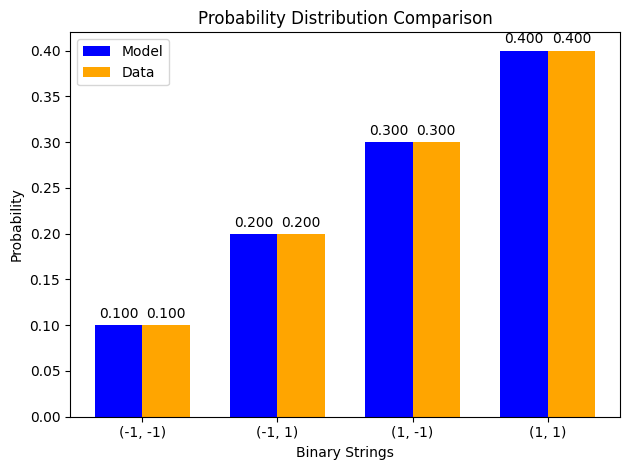

z gradient step for node 0: 2.942091015256665e-17
z gradient step for node 1: 5.120903701083534e-16
z gradient step for node 2: 3.858025010572419e-16
edge graident step for edge (0, 2): -2.504385587798197e-15
edge graident step for edge (1, 2): 2.4813484600372247e-16
x positive phase: 0.0
x negative phase: -7.151980301552133e-120
x gradient step for node 0: 7.151980301552132e-122
x positive phase: 0.0
x negative phase: 2.1890253970512922e-76
x gradient step for node 1: -2.1890253970512923e-78
x positive phase: -0.7602464985939885
x negative phase: -0.760246498594
x gradient step for node 2: 1.1435297153639113e-16
llhList: [(0, 1.9078983483916354), (1, 1.2820132394972628), (2, 1.2799664467673633), (3, 1.279909568628596), (4, 1.279887007046741), (5, 1.2798741677618528), (6, 1.2798664021363788), (7, 1.2798616655724415), (8, 1.2798587720493861), (9, 1.2798570039213164), (10, 1.2798559234406037), (11, 1.2798552631784554), (12, 1.2798548597102466), (13, 1.2798546131651187), (14, 1.2798544625

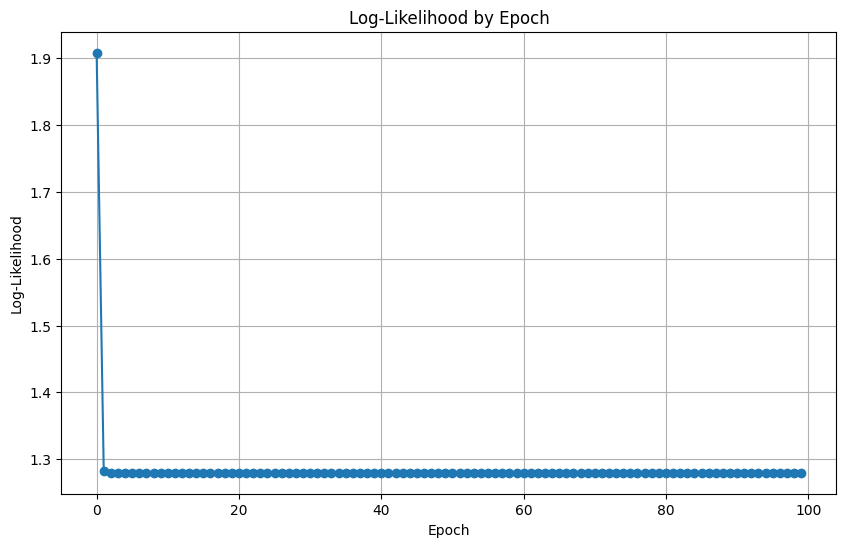

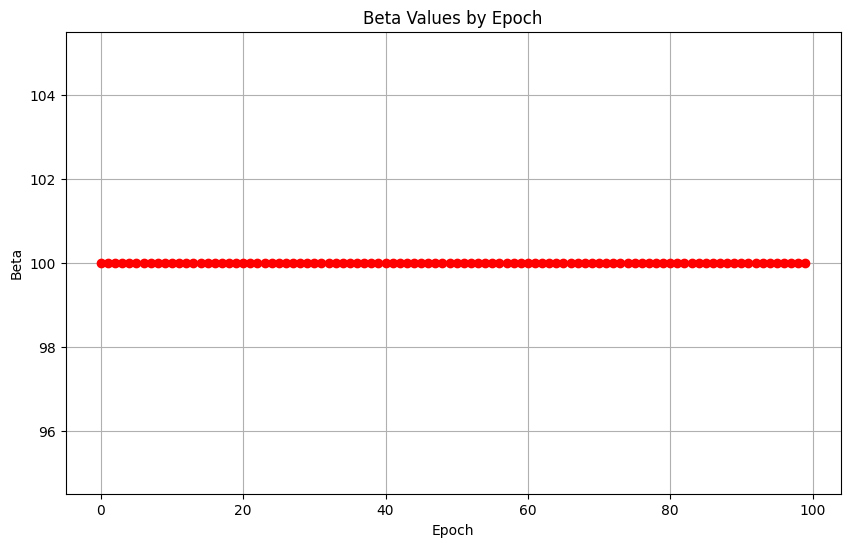

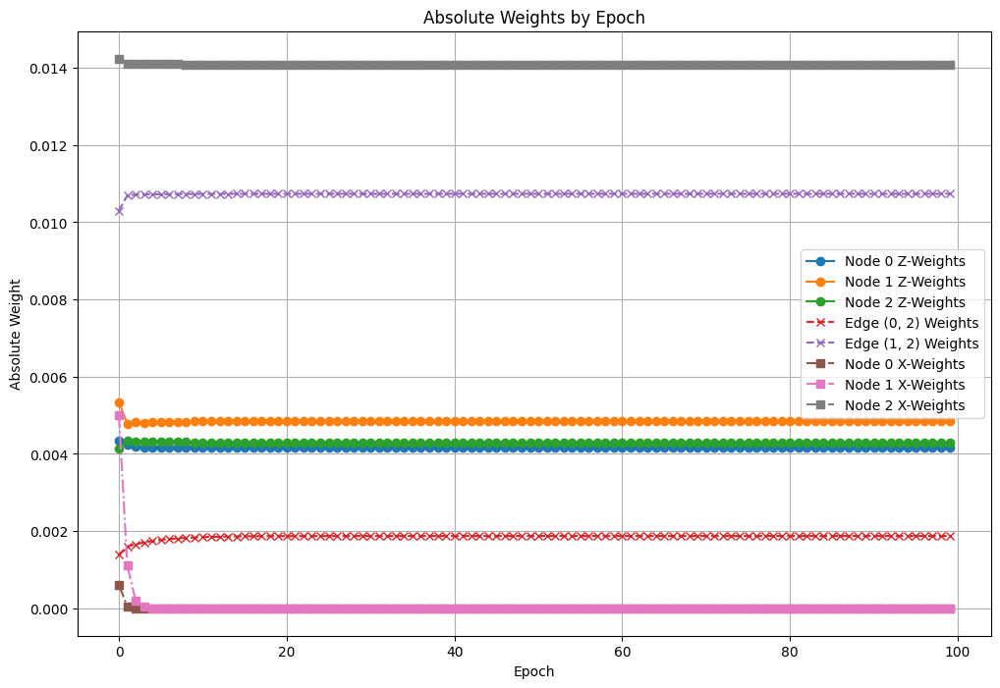

In [30]:
data = [(-1,-1), 
        (-1,1), (-1,1), 
        (1,-1), (1,-1), (1,-1), 
        (1,1), (1,1), (1,1), (1,1)]


qbm = RBM(numInputNodes = 1,
                    numOutputNodes = 1,
                    numHiddenNodes = 1,
                    beta=100,
                    vvEdges=False,
                    qrbm = True, 
                    trainTransverse = True)
qbm.drawQBM()


qbm.train(data=data,
          optimizer=None,
          alpha=.01,
          epochs=100,
          tempSchedule=None,
          finalBeta=None,
          betaGrowthEpochs=None,
          verbose=True,
          infoEveryNepochs=1)

Initial z weights: [0.003445807059627822, -0.003600096924894541, -0.0018846564473244919, -0.0002369598923207898]
Initial edge weights: {(0, 3): -0.00854787647012786, (1, 3): -0.004233162960551172, (2, 3): 0.007946322249682959}
Initial x weights: [-0.014921101546922435, 0.006583262054102781, 0.002491291459824095, -0.008610590471670915]
visibleStates: [(-1, -1, -1), (-1, -1, 1), (-1, 1, -1), (-1, 1, 1), (1, -1, -1), (1, -1, 1), (1, 1, -1), (1, 1, 1)]
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388888888888889, (1, -1, 1): 0.16666666666666666, (1, 1, -1): 0.19444444444444445, (1, 1, 1): 0.2222222222222222}
model: {(-1, -1, -1): 0.105273172358638, (-1, -1, 1): 0.1612204679740146, (-1, 1, -1): 0.06899036705325073, (-1, 1, 1): 0.05069973340232752, (1, -1, -1): 0.2225937344610423, (1, -1, 1): 0.12206354786122149, (1, 1, -1): 0.21070656870036683, (1, 1, 1): 0.058452408189138515}
L

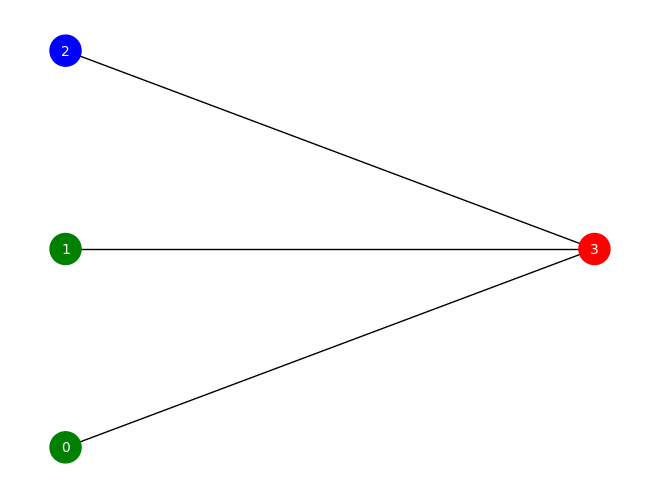

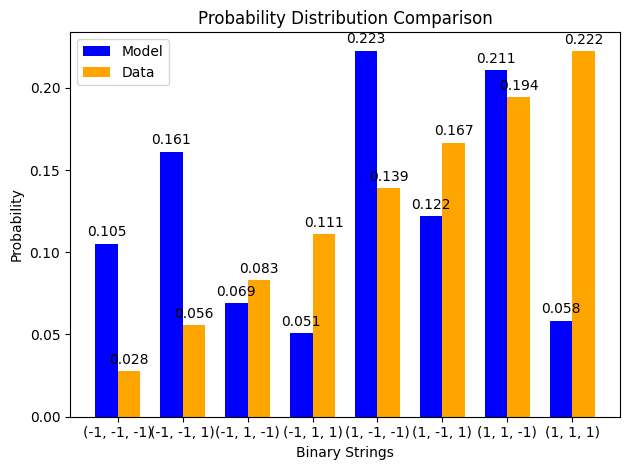

z gradient step for node 0: 0.00021681192602090616
z gradient step for node 1: 0.000444524067532055
z gradient step for node 2: 0.0003262387962577068
z gradient step for node 3: -5.011191140772936e-05
edge graident step for edge (0, 3): -1.763329473665942e-05
edge graident step for edge (1, 3): 3.239163650642626e-05
edge graident step for edge (2, 3): -0.0001855105097454729
x positive phase: 0.0
x negative phase: -0.8108344431910581
x gradient step for node 0: 0.0008108344431910581
x positive phase: 0.0
x negative phase: 0.5462090878393304
x gradient step for node 1: -0.0005462090878393304
x positive phase: 0.0
x negative phase: 0.2074270063499697
x gradient step for node 2: -0.0002074270063499697
x positive phase: -0.5563700799351754
x negative phase: -0.537008697444374
x gradient step for node 3: -1.936138249080144e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888888

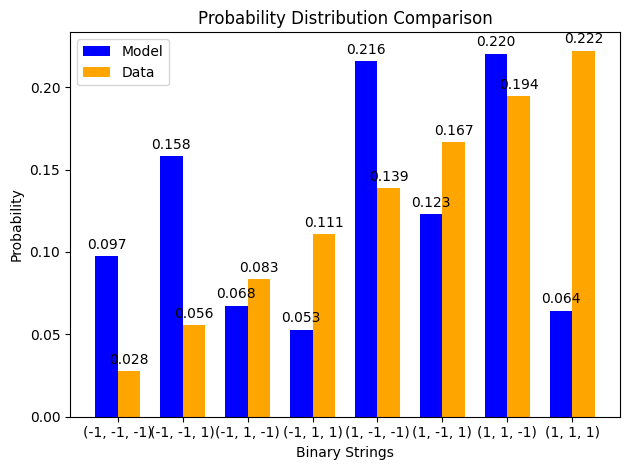

z gradient step for node 0: 0.00019711510554791696
z gradient step for node 1: 0.00041168458436984266
z gradient step for node 2: 0.00031341666355445954
z gradient step for node 3: -4.6245484822882905e-05
edge graident step for edge (0, 3): -1.0674090427930216e-05
edge graident step for edge (1, 3): 4.342069685165195e-05
edge graident step for edge (2, 3): -0.00018902327137987964
x positive phase: 0.0
x negative phase: -0.7893833832090538
x gradient step for node 0: 0.0007893833832090537
x positive phase: 0.0
x negative phase: 0.5130595228714239
x gradient step for node 1: -0.0005130595228714238
x positive phase: 0.0
x negative phase: 0.19226392513597784
x gradient step for node 2: -0.00019226392513597783
x positive phase: -0.5584066066163969
x negative phase: -0.5371227969102059
x gradient step for node 3: -2.1283809706190927e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

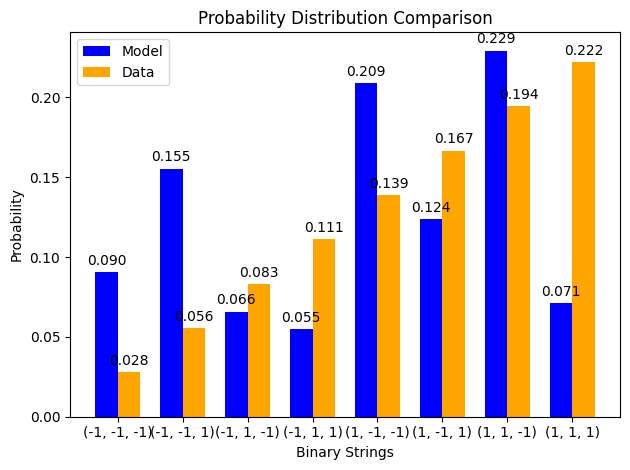

z gradient step for node 0: 0.00017780767820758486
z gradient step for node 1: 0.0003797550865736548
z gradient step for node 2: 0.00030034479402819646
z gradient step for node 3: -4.192727647168071e-05
edge graident step for edge (0, 3): -3.880193765126272e-06
edge graident step for edge (1, 3): 5.3388111988540875e-05
edge graident step for edge (2, 3): -0.0001907399041218727
x positive phase: 0.0
x negative phase: -0.7664441679154643
x gradient step for node 0: 0.0007664441679154643
x positive phase: 0.0
x negative phase: 0.479440291266998
x gradient step for node 1: -0.000479440291266998
x positive phase: 0.0
x negative phase: 0.17798476730881668
x gradient step for node 2: -0.00017798476730881667
x positive phase: -0.560639170616834
x negative phase: -0.5377756790472414
x gradient step for node 3: -2.2863491569592555e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.13888

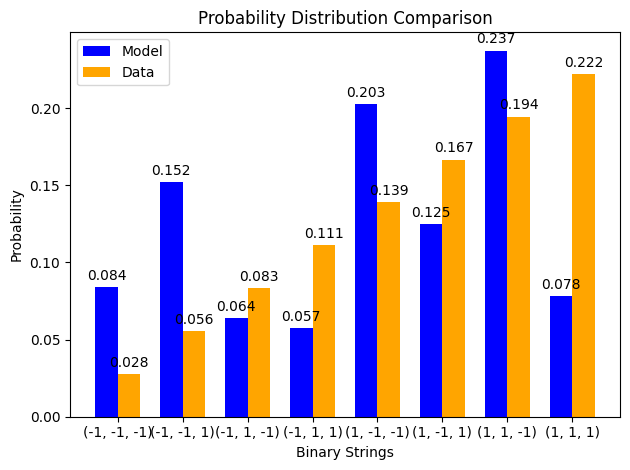

z gradient step for node 0: 0.0001591048953942611
z gradient step for node 1: 0.0003491339266827697
z gradient step for node 2: 0.0002868391586685273
z gradient step for node 3: -3.740591807786989e-05
edge graident step for edge (0, 3): 2.6669070705687693e-06
edge graident step for edge (1, 3): 6.224332085834466e-05
edge graident step for edge (2, 3): -0.00019072427720752527
x positive phase: 0.0
x negative phase: -0.74211951904448
x gradient step for node 0: 0.0007421195190444801
x positive phase: 0.0
x negative phase: 0.4458968140438077
x gradient step for node 1: -0.0004458968140438077
x positive phase: 0.0
x negative phase: 0.16455148894091431
x gradient step for node 2: -0.00016455148894091432
x positive phase: -0.5630389323467078
x negative phase: -0.5389272020793441
x gradient step for node 3: -2.4111730267363687e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888

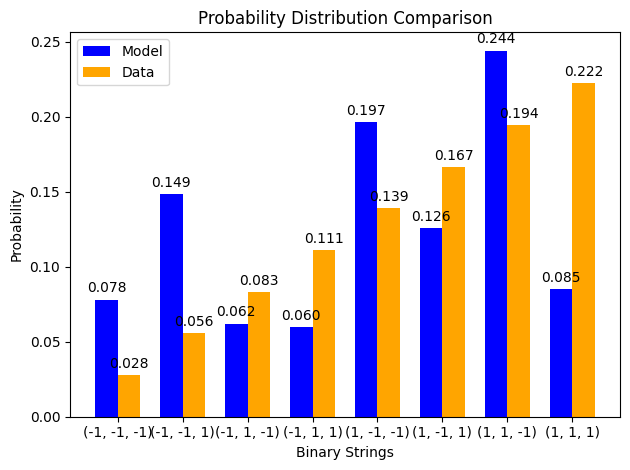

z gradient step for node 0: 0.00014119006659633638
z gradient step for node 1: 0.00032012481511396604
z gradient step for node 2: 0.00027280996149982176
z gradient step for node 3: -3.28767839981442e-05
edge graident step for edge (0, 3): 8.889888188137574e-06
edge graident step for edge (1, 3): 6.996986461786994e-05
edge graident step for edge (2, 3): -0.00018908808744469308
x positive phase: 0.0
x negative phase: -0.7165401332602227
x gradient step for node 0: 0.0007165401332602227
x positive phase: 0.0
x negative phase: 0.41291909686139533
x gradient step for node 1: -0.00041291909686139535
x positive phase: 0.0
x negative phase: 0.15192539801104643
x gradient step for node 2: -0.00015192539801104642
x positive phase: -0.5655769560061625
x negative phase: -0.5405302108826485
x gradient step for node 3: -2.5046745123514014e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

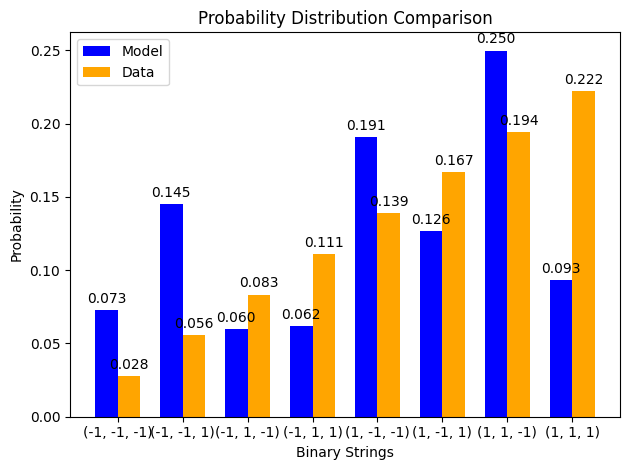

z gradient step for node 0: 0.0001242113212829148
z gradient step for node 1: 0.00029293472909001185
z gradient step for node 2: 0.00025825271420973594
z gradient step for node 3: -2.8485101755037934e-05
edge graident step for edge (0, 3): 1.472106391174416e-05
edge graident step for edge (1, 3): 7.658477735926687e-05
edge graident step for edge (2, 3): -0.00018598430979269932
x positive phase: 0.0
x negative phase: -0.6898614167652046
x gradient step for node 0: 0.0006898614167652047
x positive phase: 0.0
x negative phase: 0.38091969018263544
x gradient step for node 1: -0.00038091969018263545
x positive phase: 0.0
x negative phase: 0.14006991351066028
x gradient step for node 2: -0.00014006991351066028
x positive phase: -0.5682250250240548
x negative phase: -0.5425323989352163
x gradient step for node 3: -2.569262608883849e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

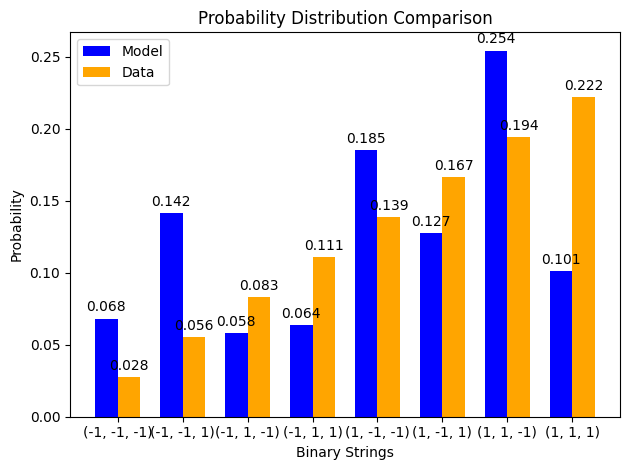

z gradient step for node 0: 0.00010828131595302854
z gradient step for node 1: 0.00026768123387369946
z gradient step for node 2: 0.00024323340464973568
z gradient step for node 3: -2.433255173103127e-05
edge graident step for edge (0, 3): 2.010564924136632e-05
edge graident step for edge (1, 3): 8.213382807744798e-05
edge graident step for edge (2, 3): -0.00018159807962265197
x positive phase: 0.0
x negative phase: -0.6622598299588907
x gradient step for node 0: 0.0006622598299588907
x positive phase: 0.0
x negative phase: 0.35022341321161116
x gradient step for node 1: -0.0003502234132116112
x positive phase: 0.0
x negative phase: 0.12895180644027554
x gradient step for node 2: -0.00012895180644027554
x positive phase: -0.5709563811357621
x negative phase: -0.5448786832539794
x gradient step for node 3: -2.6077697881782712e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

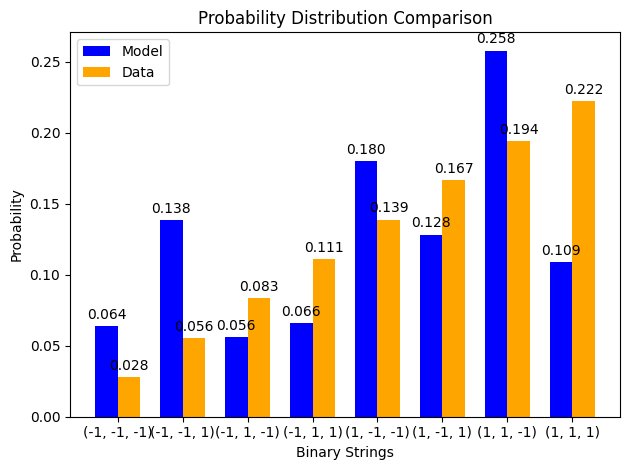

z gradient step for node 0: 9.347895942904594e-05
z gradient step for node 1: 0.0002444055478884734
z gradient step for node 2: 0.00022787047705131487
z gradient step for node 3: -2.0485380144461856e-05
edge graident step for edge (0, 3): 2.50031454915689e-05
edge graident step for edge (1, 3): 8.668452609616561e-05
edge graident step for edge (2, 3): -0.00017613597378048009
x positive phase: 0.0
x negative phase: -0.6339287360360708
x gradient step for node 0: 0.0006339287360360708
x positive phase: 0.0
x negative phase: 0.32106705377270406
x gradient step for node 1: -0.0003210670537727041
x positive phase: 0.0
x negative phase: 0.11854128441312262
x gradient step for node 2: -0.00011854128441312261
x positive phase: -0.5737462948468911
x negative phase: -0.5475136512571482
x gradient step for node 3: -2.6232643589742866e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138

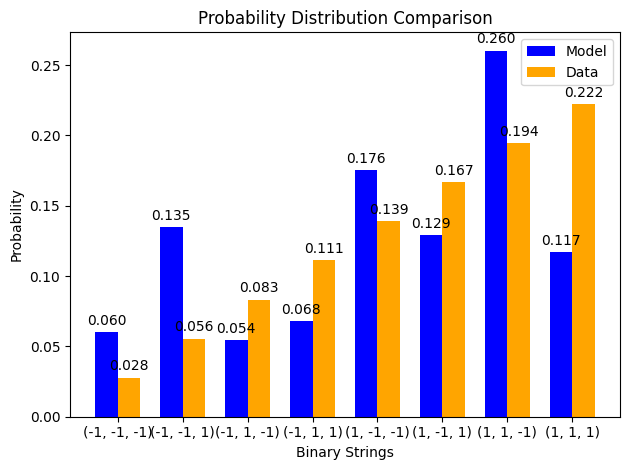

z gradient step for node 0: 7.985227192839428e-05
z gradient step for node 1: 0.00022308798810513622
z gradient step for node 2: 0.0002123161355968914
z gradient step for node 3: -1.6982433782964963e-05
edge graident step for edge (0, 3): 2.9387361338397922e-05
edge graident step for edge (1, 3): 9.031859985761493e-05
edge graident step for edge (2, 3): -0.00016981477245159245
x positive phase: 0.0
x negative phase: -0.6050736478553997
x gradient step for node 0: 0.0006050736478553998
x positive phase: 0.0
x negative phase: 0.2936062034395842
x gradient step for node 1: -0.0002936062034395842
x positive phase: 0.0
x negative phase: 0.10881133059074023
x gradient step for node 2: -0.00010881133059074023
x positive phase: -0.576572425125733
x negative phase: -0.5503837122692531
x gradient step for node 3: -2.6188712856479945e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138

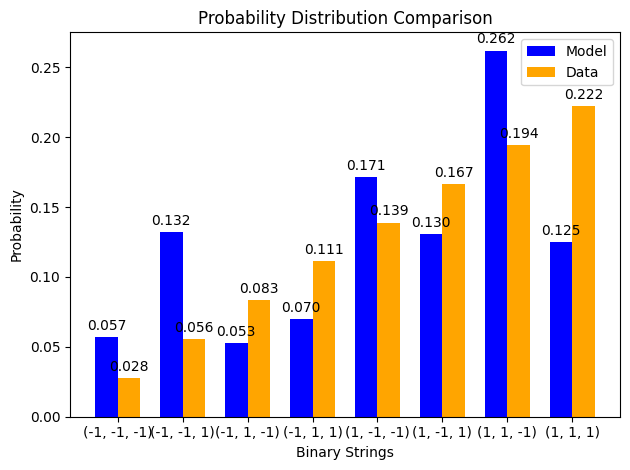

z gradient step for node 0: 6.742172822735392e-05
z gradient step for node 1: 0.00020366331837543355
z gradient step for node 2: 0.00019673894753249885
z gradient step for node 3: -1.3842136326619848e-05
edge graident step for edge (0, 3): 3.324557011841534e-05
edge graident step for edge (1, 3): 9.312515286169035e-05
edge graident step for edge (2, 3): -0.0001628507297736772
x positive phase: 0.0
x negative phase: -0.5759068825109541
x gradient step for node 0: 0.0005759068825109541
x positive phase: 0.0
x negative phase: 0.26792628076374225
x gradient step for node 1: -0.00026792628076374226
x positive phase: 0.0
x negative phase: 0.09973668506142819
x gradient step for node 2: -9.97366850614282e-05
x positive phase: -0.5794149727116404
x negative phase: -0.5534387301188419
x gradient step for node 3: -2.5976242592798517e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138

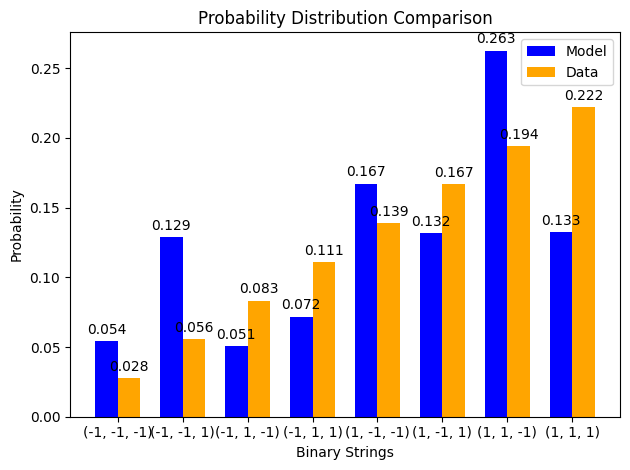

z gradient step for node 0: 5.6183714737682966e-05
z gradient step for node 1: 0.0001860345207879694
z gradient step for node 2: 0.00018130905965974846
z gradient step for node 3: -1.10680180861496e-05
edge graident step for edge (0, 3): 3.657718843982649e-05
edge graident step for edge (1, 3): 9.519513944833902e-05
edge graident step for edge (2, 3): -0.0001554502003898649
x positive phase: 0.0
x negative phase: -0.5466417982086104
x gradient step for node 0: 0.0005466417982086104
x positive phase: 0.0
x negative phase: 0.2440552723587845
x gradient step for node 1: -0.0002440552723587845
x positive phase: 0.0
x negative phase: 0.0912927817393549
x gradient step for node 2: -9.12927817393549e-05
x positive phase: -0.5822566637194005
x negative phase: -0.5566330650655882
x gradient step for node 3: -2.5623598653812363e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.13888888

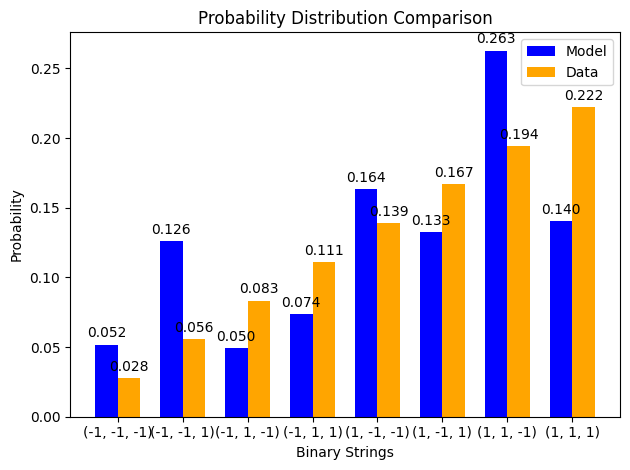

z gradient step for node 0: 4.611395171061733e-05
z gradient step for node 1: 0.00017008433210392762
z gradient step for node 2: 0.00016618670284442234
z gradient step for node 3: -8.652840082659652e-06
edge graident step for edge (0, 3): 3.939222215760146e-05
edge graident step for edge (1, 3): 9.661734334559485e-05
edge graident step for edge (2, 3): -0.00014780220730256717
x positive phase: 0.0
x negative phase: -0.5174869325597244
x gradient step for node 0: 0.0005174869325597245
x positive phase: 0.0
x negative phase: 0.22197642503091453
x gradient step for node 1: -0.00022197642503091452
x positive phase: 0.0
x negative phase: 0.0834548533251013
x gradient step for node 2: -8.34548533251013e-05
x positive phase: -0.5850826151504929
x negative phase: -0.5599260720094459
x gradient step for node 3: -2.5156543141046984e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388

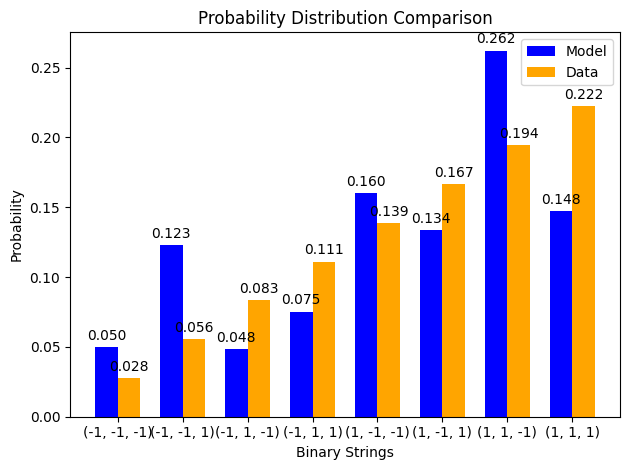

z gradient step for node 0: 3.717085500484485e-05
z gradient step for node 1: 0.00015568443542676965
z gradient step for node 2: 0.00015151412954574517
z gradient step for node 3: -6.581582175285178e-06
edge graident step for edge (0, 3): 4.1709614588722745e-05
edge graident step for edge (1, 3): 9.747574241157612e-05
edge graident step for edge (2, 3): -0.0001400732419291189
x positive phase: 0.0
x negative phase: -0.48864043672033786
x gradient step for node 0: 0.0004886404367203379
x positive phase: 0.0
x negative phase: 0.20163980792039432
x gradient step for node 1: -0.00020163980792039433
x positive phase: 0.0
x negative phase: 0.07619731585362302
x gradient step for node 2: -7.619731585362302e-05
x positive phase: -0.5878801340161437
x negative phase: -0.5632821710766832
x gradient step for node 3: -2.4597962939460485e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

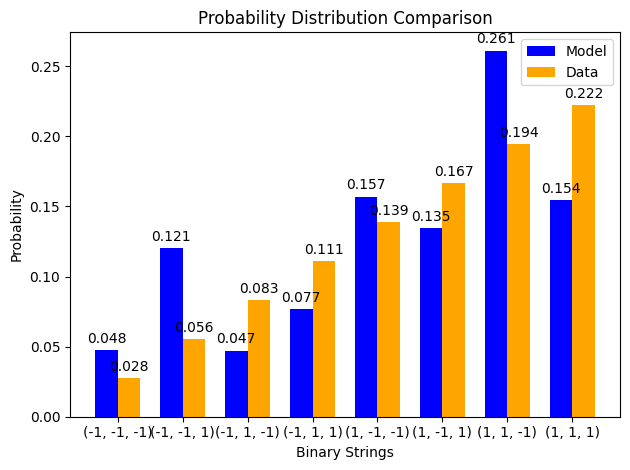

z gradient step for node 0: 2.929884643640274e-05
z gradient step for node 1: 0.00014270249511186175
z gradient step for node 2: 0.0001374107445813259
z gradient step for node 3: -4.833626842468325e-06
edge graident step for edge (0, 3): 4.355556597216992e-05
edge graident step for edge (1, 3): 9.784799542018302e-05
edge graident step for edge (2, 3): -0.00013240430741763353
x positive phase: 0.0
x negative phase: -0.460285190380174
x gradient step for node 0: 0.00046028519038017403
x positive phase: 0.0
x negative phase: 0.1829722119165291
x gradient step for node 1: -0.0001829722119165291
x positive phase: 0.0
x negative phase: 0.06949346037504607
x gradient step for node 2: -6.949346037504608e-05
x positive phase: -0.5906384923214517
x negative phase: -0.5666706289143746
x gradient step for node 3: -2.396786340707713e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888

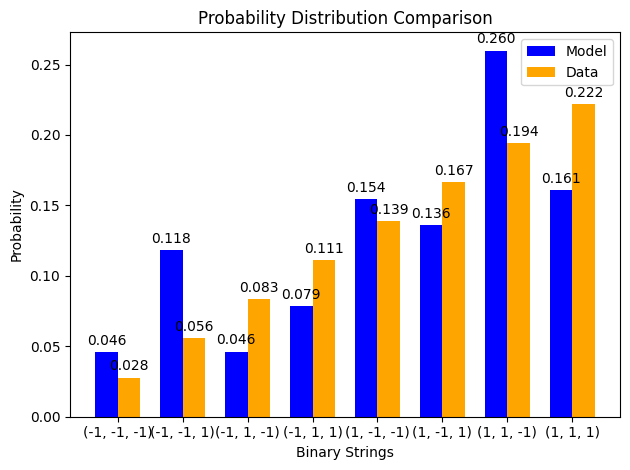

z gradient step for node 0: 2.2431601814520865e-05
z gradient step for node 1: 0.0001310073440722753
z gradient step for node 2: 0.00012397095070806926
z gradient step for node 3: -3.3844276256714823e-06
edge graident step for edge (0, 3): 4.496186660446744e-05
edge graident step for edge (1, 3): 9.78047508465485e-05
edge graident step for edge (2, 3): -0.0001249099894585169
x positive phase: 0.0
x negative phase: -0.4325849015067242
x gradient step for node 0: 0.0004325849015067242
x positive phase: 0.0
x negative phase: 0.16588523474358655
x gradient step for node 1: -0.00016588523474358655
x positive phase: 0.0
x negative phase: 0.06331542081263622
x gradient step for node 2: -6.331542081263621e-05
x positive phase: -0.5933487067149997
x negative phase: -0.570065177527972
x gradient step for node 3: -2.3283529187027698e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388

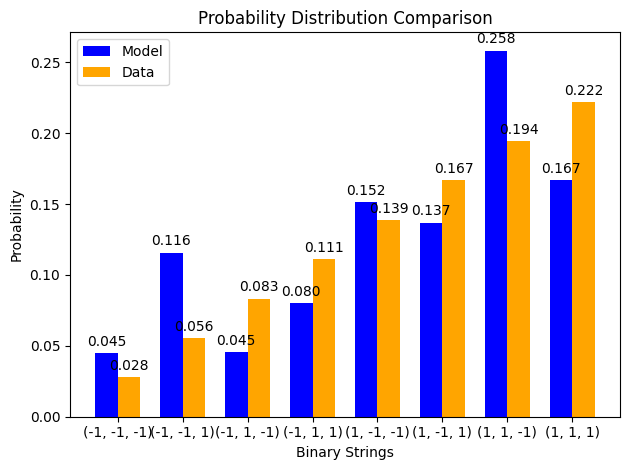

z gradient step for node 0: 1.649518795461047e-05
z gradient step for node 1: 0.00012047265210520841
z gradient step for node 2: 0.00011126411938845391
z gradient step for node 3: -2.206864523464219e-06
edge graident step for edge (0, 3): 4.5964282730478145e-05
edge graident step for edge (1, 3): 9.740950750807498e-05
edge graident step for edge (2, 3): -0.00011767918769458542
x positive phase: 0.0
x negative phase: -0.4056813712848798
x gradient step for node 0: 0.0004056813712848798
x positive phase: 0.0
x negative phase: 0.15028163299122482
x gradient step for node 1: -0.00015028163299122483
x positive phase: 0.0
x negative phase: 0.05763435470558447
x gradient step for node 2: -5.7634354705584475e-05
x positive phase: -0.5960033384797846
x negative phase: -0.5734435681204231
x gradient step for node 3: -2.255977035936152e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

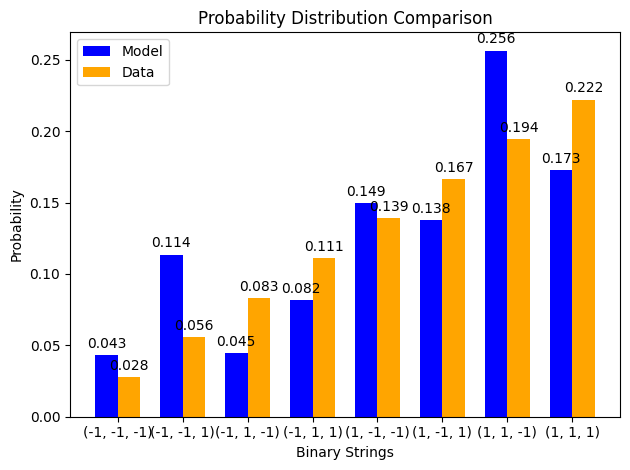

z gradient step for node 0: 1.1411010373730713e-05
z gradient step for node 1: 0.00011097937676343073
z gradient step for node 2: 9.933608449614272e-05
z gradient step for node 3: -1.2724006593703152e-06
edge graident step for edge (0, 3): 4.660103833974239e-05
edge graident step for edge (1, 3): 9.671881508320498e-05
edge graident step for edge (2, 3): -0.00011077706998385184
x positive phase: 0.0
x negative phase: -0.37969297124946677
x gradient step for node 0: 0.00037969297124946675
x positive phase: 0.0
x negative phase: 0.13606014351201823
x gradient step for node 1: -0.00013606014351201824
x positive phase: 0.0
x negative phase: 0.052420762977364435
x gradient step for node 2: -5.242076297736444e-05
x positive phase: -0.5985963192294239
x negative phase: -0.5767871235286524
x gradient step for node 3: -2.1809195700771554e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

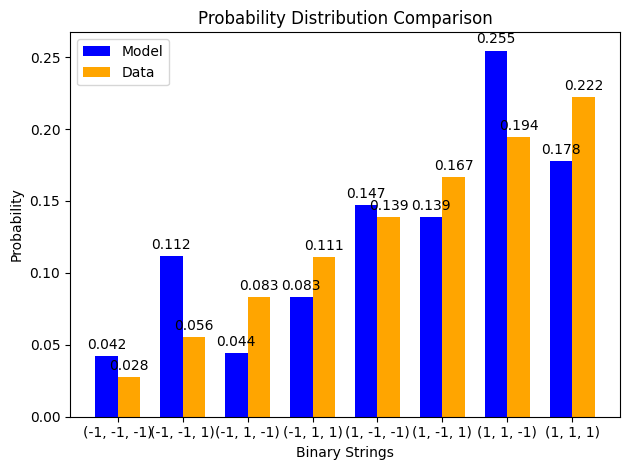

z gradient step for node 0: 7.09848402527219e-06
z gradient step for node 1: 0.00010241725685346107
z gradient step for node 2: 8.821161096794087e-05
z gradient step for node 3: -5.520877475670427e-07
edge graident step for edge (0, 3): 4.6911437191390903e-05
edge graident step for edge (1, 3): 9.578266430540086e-05
edge graident step for edge (2, 3): -0.00010424781062082656
x positive phase: 0.0
x negative phase: -0.35471426222699814
x gradient step for node 0: 0.00035471426222699815
x positive phase: 0.0
x negative phase: 0.12311902278329023
x gradient step for node 1: -0.00012311902278329024
x positive phase: 0.0
x negative phase: 0.04764487942805015
x gradient step for node 2: -4.764487942805015e-05
x positive phase: -0.6011228010276266
x negative phase: -0.5800803231881884
x gradient step for node 3: -2.1042477839438244e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

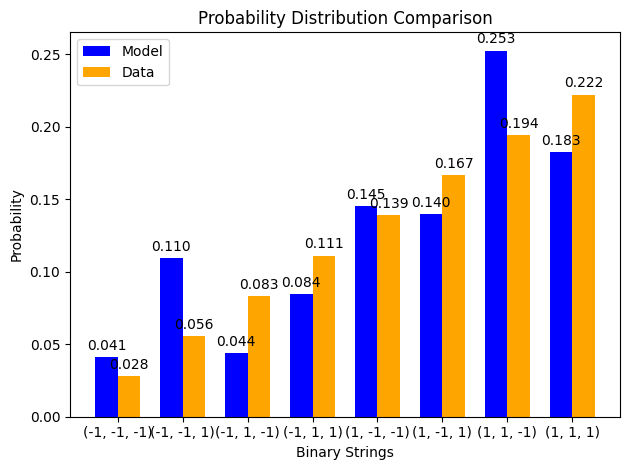

z gradient step for node 0: 3.4773506885680815e-06
z gradient step for node 1: 9.468556768267755e-05
z gradient step for node 2: 7.789738210598593e-05
z gradient step for node 3: -1.7428330939761593e-08
edge graident step for edge (0, 3): 4.693466366452909e-05
edge graident step for edge (1, 3): 9.464496917395124e-05
edge graident step for edge (2, 3): -9.811772259443303e-05
x positive phase: 0.0
x negative phase: -0.3308165988178166
x gradient step for node 0: 0.0003308165988178166
x positive phase: 0.0
x negative phase: 0.11135855374951767
x gradient step for node 1: -0.00011135855374951768
x positive phase: 0.0
x negative phase: 0.0432770736492619
x gradient step for node 2: -4.32770736492619e-05
x positive phase: -0.603579026373371
x negative phase: -0.5833104330355704
x gradient step for node 3: -2.0268593337800624e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888

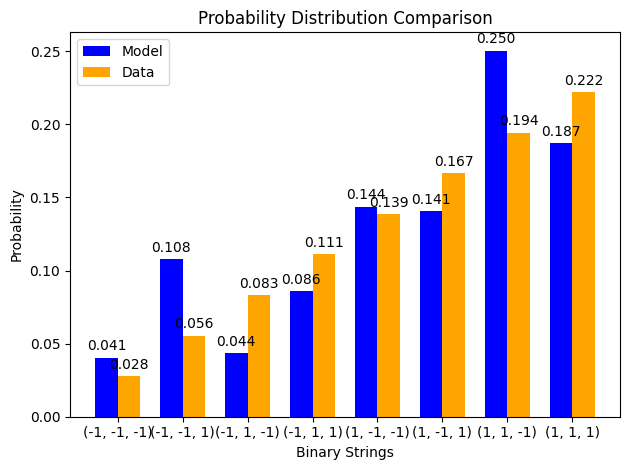

z gradient step for node 0: 4.69592152431253e-07
z gradient step for node 1: 8.769332129748672e-05
z gradient step for node 2: 6.838515454126526e-05
z gradient step for node 3: 3.5891327307749355e-07
edge graident step for edge (0, 3): 4.6708789073425016e-05
edge graident step for edge (1, 3): 9.334408248410233e-05
edge graident step for edge (2, 3): -9.239847112905675e-05
x positive phase: 0.0
x negative phase: -0.3080495136711507
x gradient step for node 0: 0.0003080495136711507
x positive phase: 0.0
x negative phase: 0.10068274654018056
x gradient step for node 1: -0.00010068274654018055
x positive phase: 0.0
x negative phase: 0.039288227097531825
x gradient step for node 2: -3.928822709753183e-05
x positive phase: -0.6059622127163963
x negative phase: -0.5864671797865477
x gradient step for node 3: -1.9495032929848554e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388

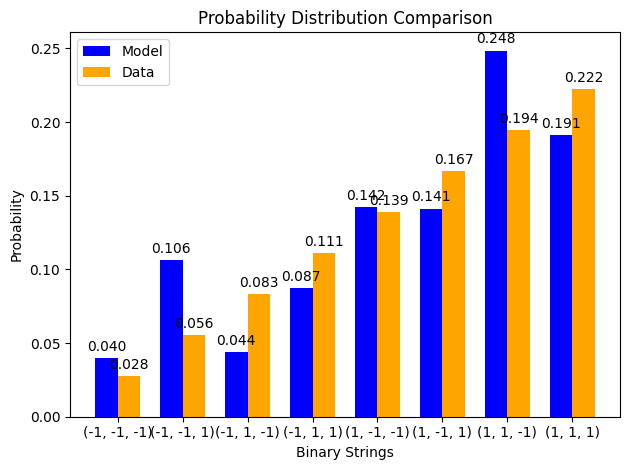

z gradient step for node 0: -1.9990802494606054e-06
z gradient step for node 1: 8.135906415794666e-05
z gradient step for node 2: 5.965483194220389e-05
z gradient step for node 3: 6.025596349083784e-07
edge graident step for edge (0, 3): 4.626999486925382e-05
edge graident step for edge (1, 3): 9.19133119508351e-05
edge graident step for edge (2, 3): -8.7090141891289e-05
x positive phase: 0.0
x negative phase: -0.2864426597459096
x gradient step for node 0: 0.00028644265974590963
x positive phase: 0.0
x negative phase: 0.09100042610485745
x gradient step for node 1: -9.100042610485746e-05
x positive phase: 0.0
x negative phase: 0.03565005748725443
x gradient step for node 2: -3.565005748725443e-05
x positive phase: -0.6082704468897634
x negative phase: -0.5895424630093506
x gradient step for node 3: -1.8727983880412748e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388888

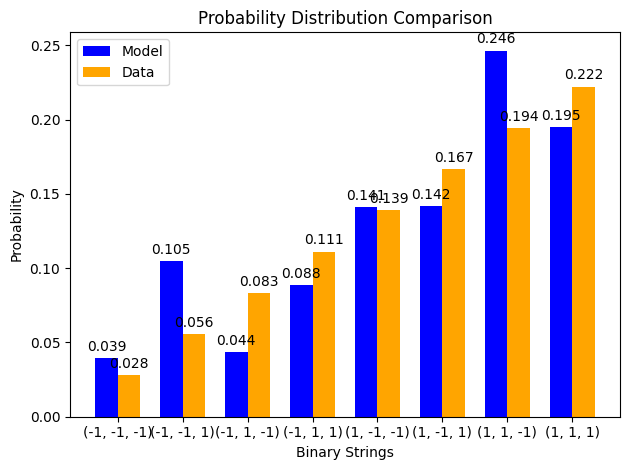

z gradient step for node 0: -3.998149124076866e-06
z gradient step for node 1: 7.561039773896559e-05
z gradient step for node 2: 5.167729734328705e-05
z gradient step for node 3: 7.370290531116541e-07
edge graident step for edge (0, 3): 4.565200898218102e-05
edge graident step for edge (1, 3): 9.038141995130974e-05
edge graident step for edge (2, 3): -8.21840184453257e-05
x positive phase: 0.0
x negative phase: -0.26600809863794617
x gradient step for node 0: 0.00026600809863794615
x positive phase: 0.0
x negative phase: 0.08222586446519747
x gradient step for node 1: -8.222586446519747e-05
x positive phase: 0.0
x negative phase: 0.03233537949071897
x gradient step for node 2: -3.233537949071897e-05
x positive phase: -0.6105025862201855
x negative phase: -0.5925300970564876
x gradient step for node 3: -1.797248916369787e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888

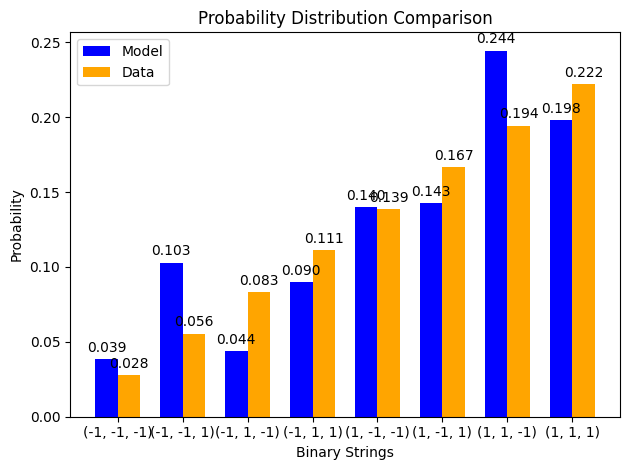

z gradient step for node 0: -5.591592877096208e-06
z gradient step for node 1: 7.03833234252547e-05
z gradient step for node 2: 4.4416915015948674e-05
z gradient step for node 3: 7.834953190581639e-07
edge graident step for edge (0, 3): 4.488573893866244e-05
edge graident step for edge (1, 3): 8.877309862657095e-05
edge graident step for edge (2, 3): -7.766499170867463e-05
x positive phase: 0.0
x negative phase: -0.24674274995543138
x gradient step for node 0: 0.0002467427499554314
x positive phase: 0.0
x negative phase: 0.07427908237994738
x gradient step for node 1: -7.427908237994737e-05
x positive phase: 0.0
x negative phase: 0.02931829924645197
x gradient step for node 2: -2.931829924645197e-05
x positive phase: -0.6126581645155375
x negative phase: -0.5954255760887417
x gradient step for node 3: -1.723258842679576e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138888

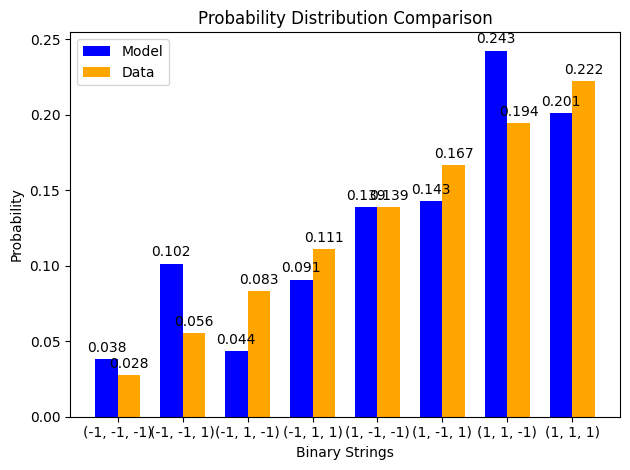

z gradient step for node 0: -6.8375153525881415e-06
z gradient step for node 1: 6.562149135324599e-05
z gradient step for node 2: 3.783366559686223e-05
z gradient step for node 3: 7.606808258732445e-07
edge graident step for edge (0, 3): 4.399907662244773e-05
edge graident step for edge (1, 3): 8.710941648333054e-05
edge graident step for edge (2, 3): -7.351357611121575e-05
x positive phase: 0.0
x negative phase: -0.22863085233083613
x gradient step for node 0: 0.00022863085233083613
x positive phase: 0.0
x negative phase: 0.06708591675094736
x gradient step for node 1: -6.708591675094736e-05
x positive phase: 0.0
x negative phase: 0.026574346481933776
x gradient step for node 2: -2.6574346481933778e-05
x positive phase: -0.6147373023064995
x negative phase: -0.5982258575310841
x gradient step for node 3: -1.651144477541533e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.13

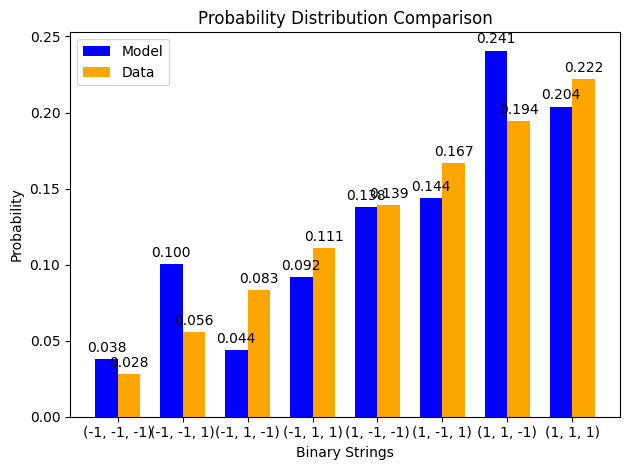

z gradient step for node 0: -7.788044752927881e-06
z gradient step for node 1: 6.127541355919314e-05
z gradient step for node 2: 3.188491458955102e-05
z gradient step for node 3: 6.848601722486969e-07
edge graident step for edge (0, 3): 4.301684485825857e-05
edge graident step for edge (1, 3): 8.540823468446933e-05
edge graident step for edge (2, 3): -6.970754314682187e-05
x positive phase: 0.0
x negative phase: -0.2116463243999843
x gradient step for node 0: 0.0002116463243999843
x positive phase: 0.0
x negative phase: 0.06057792661967003
x gradient step for node 1: -6.057792661967003e-05
x positive phase: 0.0
x negative phase: 0.024080551679284433
x gradient step for node 2: -2.4080551679284432e-05
x positive phase: -0.6167406215134558
x negative phase: -0.60092916136808
x gradient step for node 3: -1.581146014537582e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388888

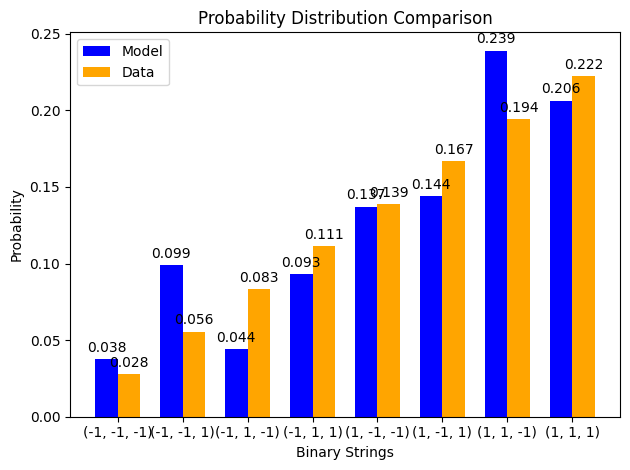

z gradient step for node 0: -8.489442148513216e-06
z gradient step for node 1: 5.730168509735545e-05
z gradient step for node 2: 2.6526837333495092e-05
z gradient step for node 3: 5.699493850944149e-07
edge graident step for edge (0, 3): 4.1960854872231894e-05
edge graident step for edge (1, 3): 8.368459215294465e-05
edge graident step for edge (2, 3): -6.622320524637649e-05
x positive phase: 0.0
x negative phase: -0.19575494945355276
x gradient step for node 0: 0.00019575494945355278
x positive phase: 0.0
x negative phase: 0.05469219188946227
x gradient step for node 1: -5.469219188946227e-05
x positive phase: 0.0
x negative phase: 0.021815477320688434
x gradient step for node 2: -2.1815477320688434e-05
x positive phase: -0.6186691651293628
x negative phase: -0.6035347842524299
x gradient step for node 3: -1.5134380876932864e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

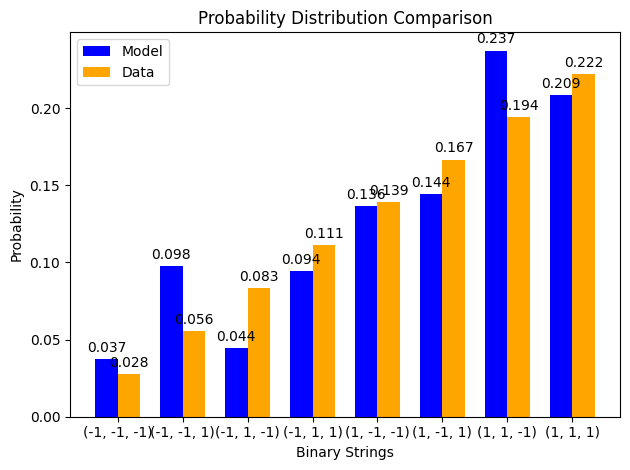

z gradient step for node 0: -8.982363574830122e-06
z gradient step for node 1: 5.3662242834050525e-05
z gradient step for node 2: 2.1715536298933693e-05
z gradient step for node 3: 4.27656535319676e-07
edge graident step for edge (0, 3): 4.085004524387409e-05
edge graident step for edge (1, 3): 8.195105912495254e-05
edge graident step for edge (2, 3): -6.303639441432008e-05
x positive phase: 0.0
x negative phase: -0.1809163378802701
x gradient step for node 0: 0.00018091633788027008
x positive phase: 0.0
x negative phase: 0.0493710443678199
x gradient step for node 1: -4.93710443678199e-05
x positive phase: 0.0
x negative phase: 0.019759212484351543
x gradient step for node 2: -1.9759212484351544e-05
x positive phase: -0.6205243226297248
x negative phase: -0.606042928346903
x gradient step for node 3: -1.4481394282821803e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.13888

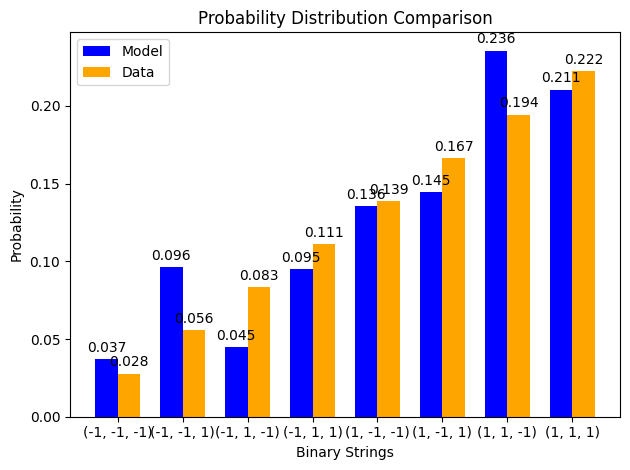

z gradient step for node 0: -9.302226420697002e-06
z gradient step for node 1: 5.0323680398778964e-05
z gradient step for node 2: 1.7407892053991264e-05
z gradient step for node 3: 2.676720039031244e-07
edge graident step for edge (0, 3): 3.970067625624218e-05
edge graident step for edge (1, 3): 8.021805919501523e-05
edge graident step for edge (2, 3): -6.012318390541718e-05
x positive phase: 0.0
x negative phase: -0.16708564588743666
x gradient step for node 0: 0.00016708564588743666
x positive phase: 0.0
x negative phase: 0.04456175964724801
x gradient step for node 1: -4.4561759647248014e-05
x positive phase: 0.0
x negative phase: 0.017893339452769767
x gradient step for node 2: -1.7893339452769766e-05
x positive phase: -0.6223077617382737
x negative phase: -0.608454545221342
x gradient step for node 3: -1.3853216516931721e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

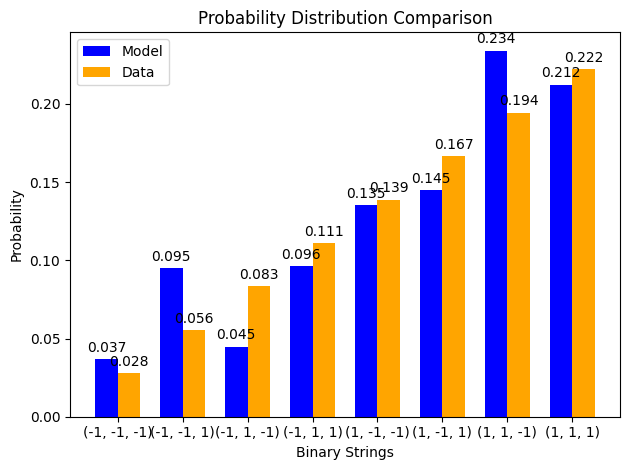

z gradient step for node 0: -9.47963895854448e-06
z gradient step for node 1: 4.72566291208496e-05
z gradient step for node 2: 1.3562189897409676e-05
z gradient step for node 3: 9.788014122438793e-08
edge graident step for edge (0, 3): 3.8526557727476876e-05
edge graident step for edge (1, 3): 7.8494160307492e-05
edge graident step for edge (2, 3): -5.746040002497016e-05
x positive phase: 0.0
x negative phase: -0.15421504726395918
x gradient step for node 0: 0.00015421504726395919
x positive phase: 0.0
x negative phase: 0.04021623003980253
x gradient step for node 1: -4.021623003980253e-05
x positive phase: 0.0
x negative phase: 0.016200879941542467
x gradient step for node 2: -1.6200879941542466e-05
x positive phase: -0.6240213669809509
x negative phase: -0.610771195134794
x gradient step for node 3: -1.3250171846156844e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.13888

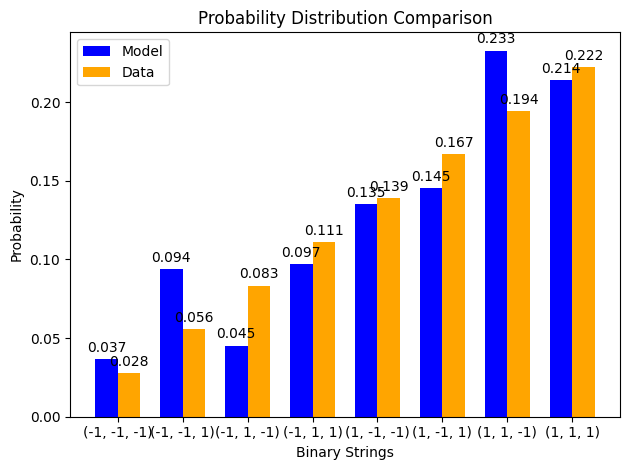

z gradient step for node 0: -9.54086027627471e-06
z gradient step for node 1: 4.4435208413619584e-05
z gradient step for node 2: 1.0138561827644319e-05
z gradient step for node 3: -7.542211876784833e-08
edge graident step for edge (0, 3): 3.733929281331616e-05
edge graident step for edge (1, 3): 7.67863355719574e-05
edge graident step for edge (2, 3): -5.502596700036844e-05
x positive phase: 0.0
x negative phase: -0.14225496773653587
x gradient step for node 0: 0.00014225496773653587
x positive phase: 0.0
x negative phase: 0.036290632636081906
x gradient step for node 1: -3.629063263608191e-05
x positive phase: 0.0
x negative phase: 0.014666227333459916
x gradient step for node 2: -1.4666227333459916e-05
x positive phase: -0.625667185221607
x negative phase: -0.6129949218075608
x gradient step for node 3: -1.2672263414046258e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

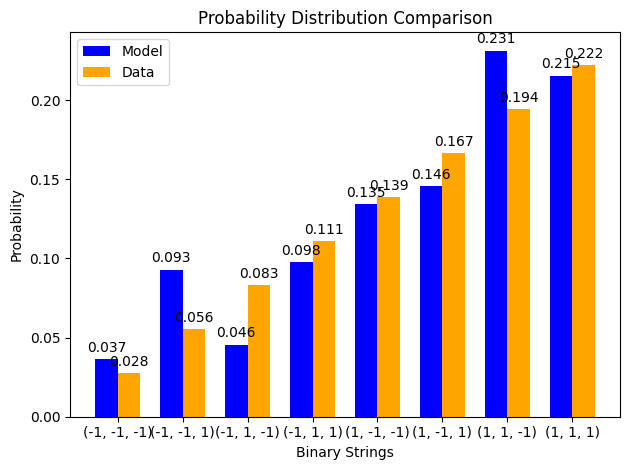

z gradient step for node 0: -9.508265760472202e-06
z gradient step for node 1: 4.183654463265093e-05
z gradient step for node 2: 7.09927958224274e-06
z gradient step for node 3: -2.473104441919061e-07
edge graident step for edge (0, 3): 3.61485244604311e-05
edge graident step for edge (1, 3): 7.510019518235516e-05
edge graident step for edge (2, 3): -5.279912230885292e-05
x positive phase: 0.0
x negative phase: -0.1311550996617188
x gradient step for node 0: 0.00013115509966171878
x positive phase: 0.0
x negative phase: 0.03274510206296213
x gradient step for node 1: -3.2745102062962125e-05
x positive phase: 0.0
x negative phase: 0.013275070082597573
x gradient step for node 2: -1.3275070082597573e-05
x positive phase: -0.6272473781385417
x negative phase: -0.6151281424610543
x gradient step for node 3: -1.2119235677487405e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.138

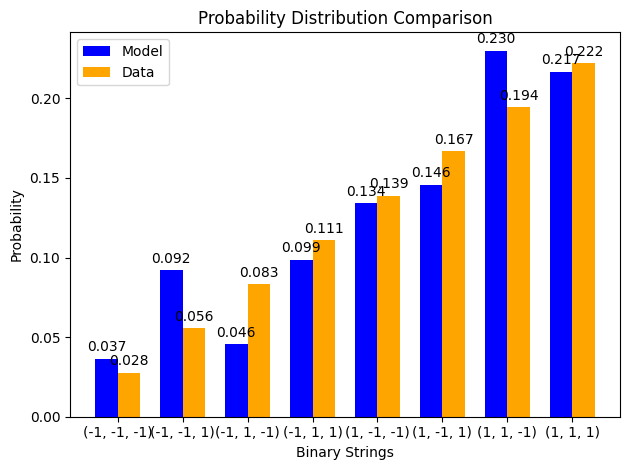

z gradient step for node 0: -9.400800210228932e-06
z gradient step for node 1: 3.944035455242029e-05
z gradient step for node 2: 4.408929855410804e-06
z gradient step for node 3: -4.140295756759338e-07
edge graident step for edge (0, 3): 3.4962174901909784e-05
edge graident step for edge (1, 3): 7.344019106672829e-05
edge graident step for edge (2, 3): -5.076053387358431e-05
x positive phase: 0.0
x negative phase: -0.12086521937945739
x gradient step for node 0: 0.00012086521937945739
x positive phase: 0.0
x negative phase: 0.029543414256153304
x gradient step for node 1: -2.9543414256153304e-05
x positive phase: 0.0
x negative phase: 0.012014310334888492
x gradient step for node 2: -1.2014310334888493e-05
x positive phase: -0.6287641813997848
x negative phase: -0.617173552567561
x gradient step for node 3: -1.1590628832223837e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

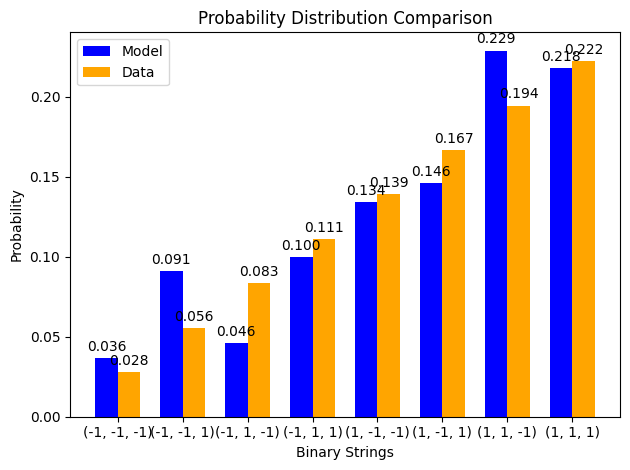

z gradient step for node 0: -9.234406441879339e-06
z gradient step for node 1: 3.722858792024103e-05
z gradient step for node 2: 2.034498080403013e-06
z gradient step for node 3: -5.728058416650806e-07
edge graident step for edge (0, 3): 3.378667169917338e-05
edge graident step for edge (1, 3): 7.180979616156822e-05
edge graident step for edge (2, 3): -4.889234478548354e-05
x positive phase: 0.0
x negative phase: -0.11133583145680828
x gradient step for node 0: 0.00011133583145680829
x positive phase: 0.0
x negative phase: 0.026652685224810478
x gradient step for node 1: -2.6652685224810478e-05
x positive phase: 0.0
x negative phase: 0.010871980841517415
x gradient step for node 2: -1.0871980841517415e-05
x positive phase: -0.6302198701397889
x negative phase: -0.6191340444632244
x gradient step for node 3: -1.1085825676564465e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

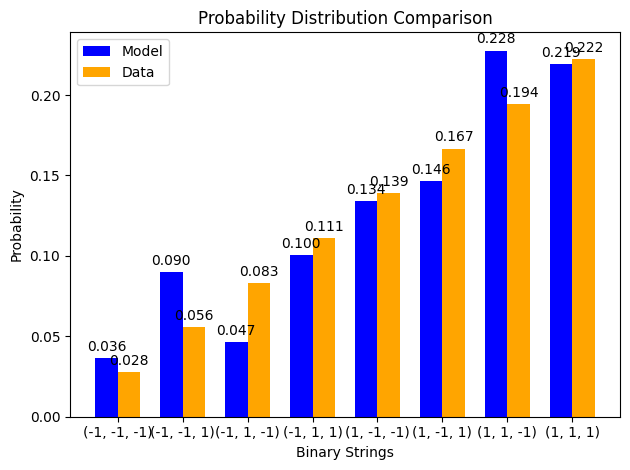

z gradient step for node 0: -9.022421862537656e-06
z gradient step for node 1: 3.518512273898772e-05
z gradient step for node 2: -5.4617300879272743e-08
z gradient step for node 3: -7.21678325261238e-07
edge graident step for edge (0, 3): 3.2627156328483895e-05
edge graident step for edge (1, 3): 7.021166038218205e-05
edge graident step for edge (2, 3): -4.717816601554945e-05
x positive phase: 0.0
x negative phase: -0.10251866407661418
x gradient step for node 0: 0.00010251866407661418
x positive phase: 0.0
x negative phase: 0.024043087122816213
x gradient step for node 1: -2.4043087122816214e-05
x positive phase: 0.0
x negative phase: 0.009837162432697107
x gradient step for node 2: -9.837162432697107e-06
x positive phase: -0.6316167302333152
x negative phase: -0.6210126387621406
x gradient step for node 3: -1.0604091471174582e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

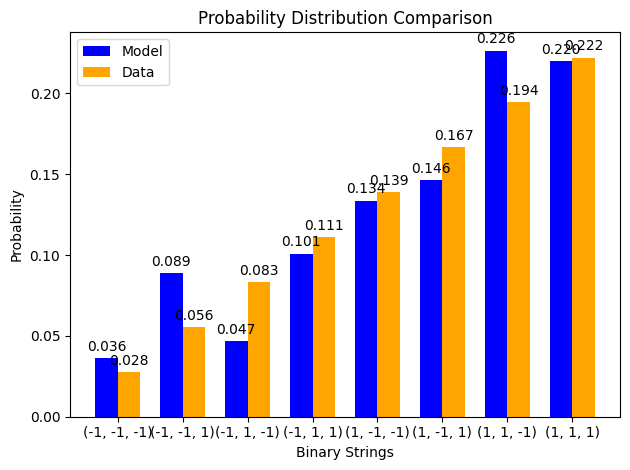

z gradient step for node 0: -8.775939034198266e-06
z gradient step for node 1: 3.329550673794488e-05
z gradient step for node 2: -1.8866421802032906e-06
z gradient step for node 3: -8.593496699378367e-07
edge graident step for edge (0, 3): 3.148767322608237e-05
edge graident step for edge (1, 3): 6.864774544974208e-05
edge graident step for edge (2, 3): -4.5603033102213255e-05
x positive phase: 0.0
x negative phase: -0.09436703862508095
x gradient step for node 0: 9.436703862508094e-05
x positive phase: 0.0
x negative phase: 0.021687582772472368
x gradient step for node 1: -2.1687582772472367e-05
x positive phase: 0.0
x negative phase: 0.008899903665696082
x gradient step for node 2: -8.899903665696083e-06
x positive phase: -0.632957034799819
x negative phase: -0.6228124273735451
x gradient step for node 3: -1.0144607426273878e-05
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

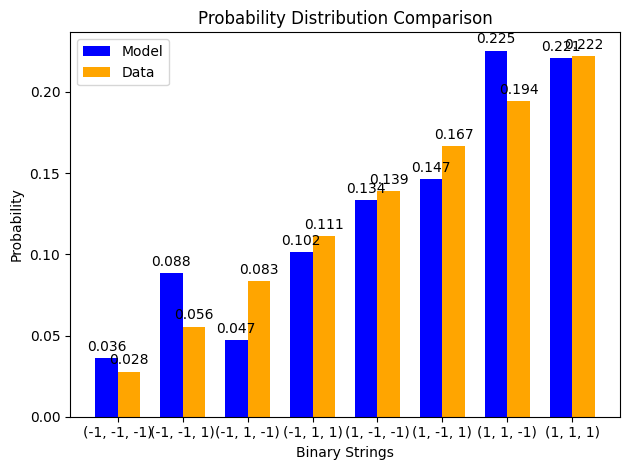

z gradient step for node 0: -8.504128863247584e-06
z gradient step for node 1: 3.154673870401831e-05
z gradient step for node 2: -3.487501339426671e-06
z gradient step for node 3: -9.850563553297498e-07
edge graident step for edge (0, 3): 3.03713386174283e-05
edge graident step for edge (1, 3): 6.711944074667481e-05
edge graident step for edge (2, 3): -4.41533390588677e-05
x positive phase: 0.0
x negative phase: -0.0868361346032242
x gradient step for node 0: 8.68361346032242e-05
x positive phase: 0.0
x negative phase: 0.0195616789758011
x gradient step for node 1: -1.9561678975801097e-05
x positive phase: 0.0
x negative phase: 0.008051143746055084
x gradient step for node 2: -8.051143746055084e-06
x positive phase: -0.6342430253463618
x negative phase: -0.6245365268614026
x gradient step for node 3: -9.706498484959192e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388888

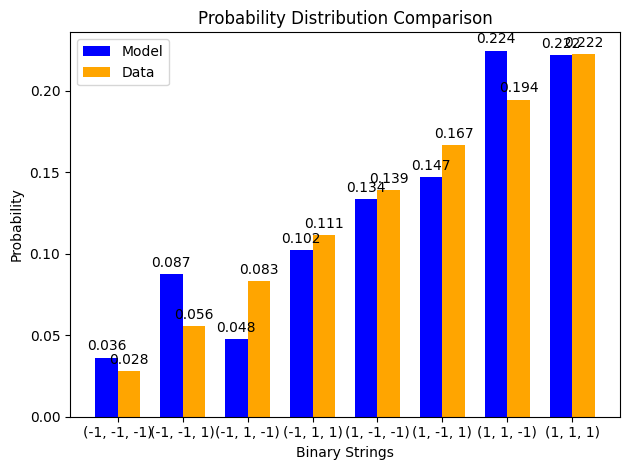

z gradient step for node 0: -8.214526893733421e-06
z gradient step for node 1: 2.9927083804449613e-05
z gradient step for node 2: -4.880918799946843e-06
z gradient step for node 3: -1.0984574980043016e-06
edge graident step for edge (0, 3): 2.9280489448891113e-05
edge graident step for edge (1, 3): 6.562766231892933e-05
edge graident step for edge (2, 3): -4.281675270552199e-05
x positive phase: 0.0
x negative phase: -0.07988316869485865
x gradient step for node 0: 7.988316869485865e-05
x positive phase: 0.0
x negative phase: 0.0176431983968734
x gradient step for node 1: -1.76431983968734e-05
x positive phase: 0.0
x negative phase: 0.007282639424401634
x gradient step for node 2: -7.2826394244016345e-06
x positive phase: -0.6354768969608088
x negative phase: -0.6261880408838678
x gradient step for node 3: -9.288856076940966e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

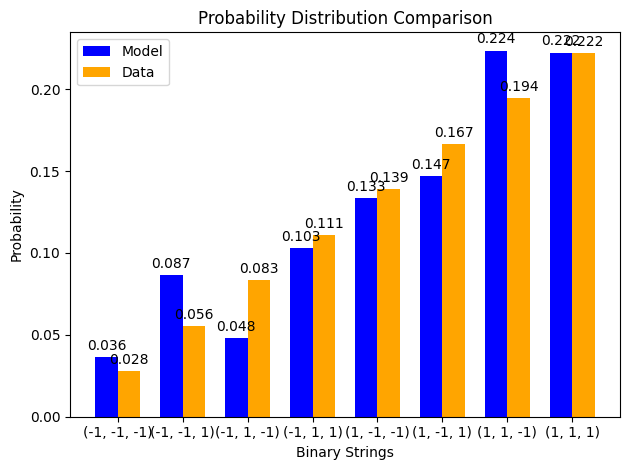

z gradient step for node 0: -7.913284414119314e-06
z gradient step for node 1: 2.8425917621153124e-05
z gradient step for node 2: -6.088535025692871e-06
z gradient step for node 3: -1.1995407534026725e-06
edge graident step for edge (0, 3): 2.8216813399724317e-05
edge graident step for edge (1, 3): 6.417293704197221e-05
edge graident step for edge (2, 3): -4.15821292070791e-05
x positive phase: 0.0
x negative phase: -0.07346750442184292
x gradient step for node 0: 7.346750442184292e-05
x positive phase: 0.0
x negative phase: 0.015912069432765918
x gradient step for node 1: -1.591206943276592e-05
x positive phase: 0.0
x negative phase: 0.006586896272375166
x gradient step for node 2: -6.586896272375166e-06
x positive phase: -0.6366607869917972
x negative phase: -0.6277700304944951
x gradient step for node 3: -8.890756497302089e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

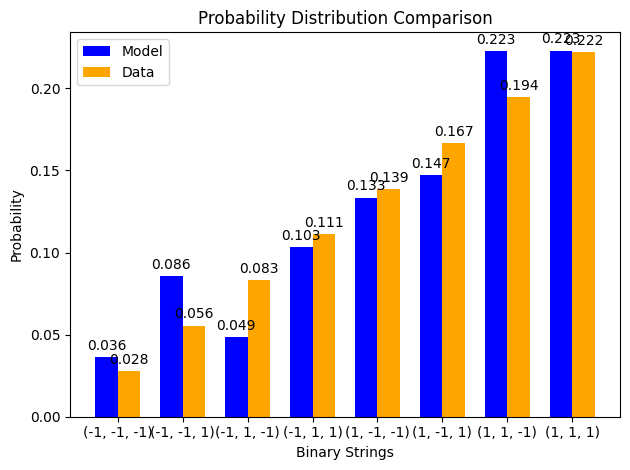

z gradient step for node 0: -7.60538684819323e-06
z gradient step for node 1: 2.703359425517382e-05
z gradient step for node 2: -7.130034077577285e-06
z gradient step for node 3: -1.288543640011297e-06
edge graident step for edge (0, 3): 2.718146135555488e-05
edge graident step for edge (1, 3): 6.275547383195234e-05
edge graident step for edge (2, 3): -4.043941770740534e-05
x positive phase: 0.0
x negative phase: -0.06755070647224108
x gradient step for node 0: 6.755070647224109e-05
x positive phase: 0.0
x negative phase: 0.014350133257913652
x gradient step for node 1: -1.4350133257913652e-05
x positive phase: 0.0
x negative phase: 0.0059571045206909656
x gradient step for node 2: -5.957104520690966e-06
x positive phase: -0.6377967666907123
x negative phase: -0.6292854911637663
x gradient step for node 3: -8.511275526945972e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

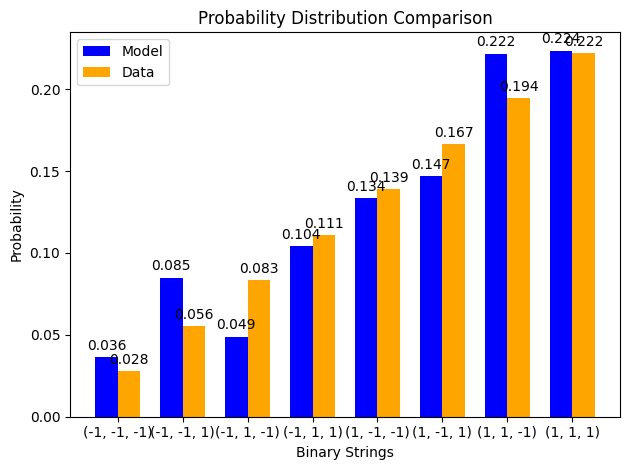

z gradient step for node 0: -7.294842311928562e-06
z gradient step for node 1: 2.574133449425603e-05
z gradient step for node 2: -8.023275468825975e-06
z gradient step for node 3: -1.365888512784408e-06
edge graident step for edge (0, 3): 2.617514393801501e-05
edge graident step for edge (1, 3): 6.137522362748005e-05
edge graident step for edge (2, 3): -3.937956949178098e-05
x positive phase: 0.0
x negative phase: -0.06209655160016252
x gradient step for node 0: 6.209655160016252e-05
x positive phase: 0.0
x negative phase: 0.012940967088335573
x gradient step for node 1: -1.2940967088335574e-05
x positive phase: 0.0
x negative phase: 0.005387079483531945
x gradient step for node 2: -5.387079483531945e-06
x positive phase: -0.6388868353379351
x negative phase: -0.6307373354762362
x gradient step for node 3: -8.149499861698883e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

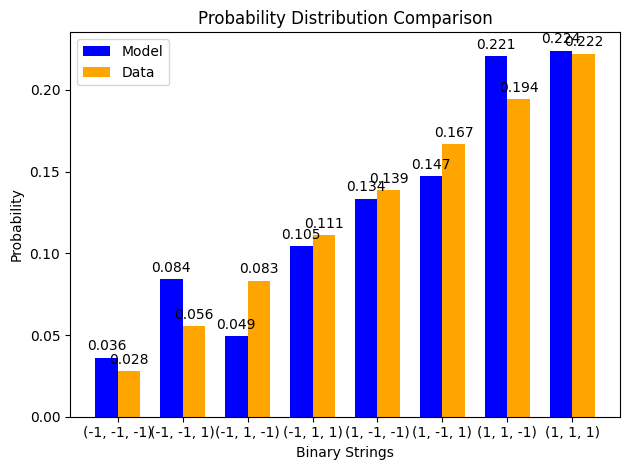

z gradient step for node 0: -6.984843377844774e-06
z gradient step for node 1: 2.454113063420957e-05
z gradient step for node 2: -8.784426794672174e-06
z gradient step for node 3: -1.4321294296250342e-06
edge graident step for edge (0, 3): 2.5198213762536726e-05
edge graident step for edge (1, 3): 6.003192970161134e-05
edge graident step for edge (2, 3): -3.8394449006560555e-05
x positive phase: 0.0
x negative phase: -0.057071006021566596
x gradient step for node 0: 5.7071006021566597e-05
x positive phase: 0.0
x negative phase: 0.011669722640620273
x gradient step for node 1: -1.1669722640620272e-05
x positive phase: 0.0
x negative phase: 0.00487120648220637
x gradient step for node 2: -4.87120648220637e-06
x positive phase: -0.6399329164264806
x negative phase: -0.6321283805655259
x gradient step for node 3: -7.804535860954754e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

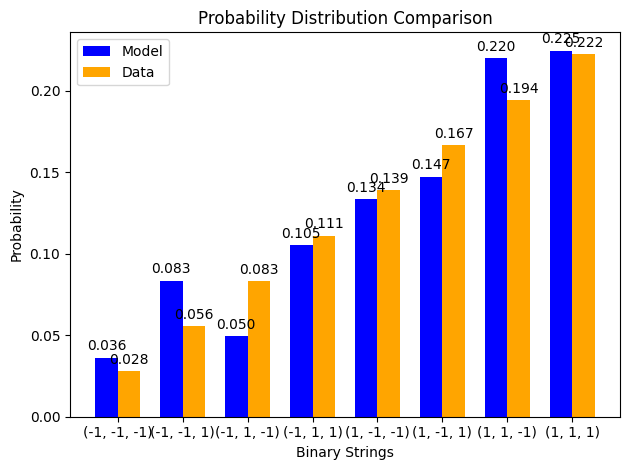

z gradient step for node 0: -6.677905074510104e-06
z gradient step for node 1: 2.3425665087464188e-05
z gradient step for node 2: -9.428094260969495e-06
z gradient step for node 3: -1.4879092433534024e-06
edge graident step for edge (0, 3): 2.425073508034986e-05
edge graident step for edge (1, 3): 5.87251696963456e-05
edge graident step for edge (2, 3): -3.747674924091088e-05
x positive phase: 0.0
x negative phase: -0.05244217749020582
x gradient step for node 0: 5.244217749020582e-05
x positive phase: 0.0
x negative phase: 0.010522978735536457
x gradient step for node 1: -1.0522978735536458e-05
x positive phase: 0.0
x negative phase: 0.0044043901059005975
x gradient step for node 2: -4.404390105900597e-06
x positive phase: -0.6409368555275636
x negative phase: -0.6334613394590536
x gradient step for node 3: -7.475516068510047e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

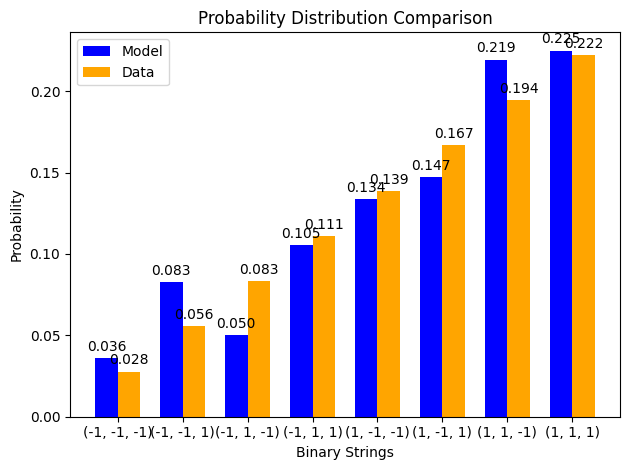

z gradient step for node 0: -6.37598202076678e-06
z gradient step for node 1: 2.2388240391885695e-05
z gradient step for node 2: -9.967449062836768e-06
z gradient step for node 3: -1.533925382944168e-06
edge graident step for edge (0, 3): 2.3332542383949605e-05
edge graident step for edge (1, 3): 5.745439060931121e-05
edge graident step for edge (2, 3): -3.6619912369915576e-05
x positive phase: 0.0
x negative phase: -0.048180248732867935
x gradient step for node 0: 4.818024873286794e-05
x positive phase: 0.0
x negative phase: 0.009488607003134582
x gradient step for node 1: -9.488607003134583e-06
x positive phase: 0.0
x negative phase: 0.003982007599271757
x gradient step for node 2: -3.982007599271757e-06
x positive phase: -0.6419004195123428
x negative phase: -0.6347388156114452
x gradient step for node 3: -7.161603900897595e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

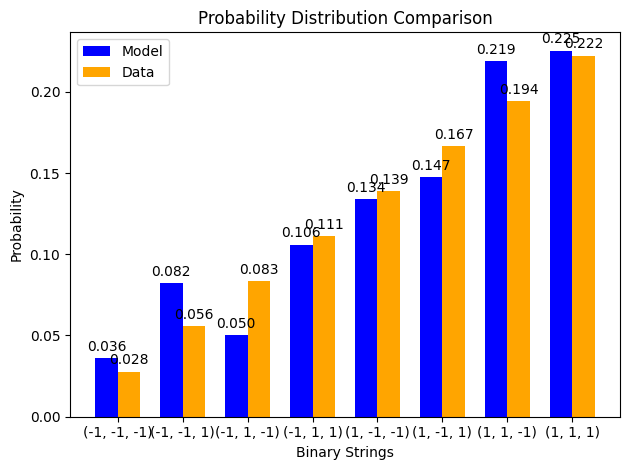

z gradient step for node 0: -6.080567396482106e-06
z gradient step for node 1: 2.142271864816772e-05
z gradient step for node 2: -1.0414348208415082e-05
z gradient step for node 3: -1.5709029408410846e-06
edge graident step for edge (0, 3): 2.244328944192642e-05
edge graident step for edge (1, 3): 5.6218937808627456e-05
edge graident step for edge (2, 3): -3.581805612088332e-05
x positive phase: 0.0
x negative phase: -0.04425739764090103
x gradient step for node 0: 4.4257397640901035e-05
x positive phase: 0.0
x negative phase: 0.008555649674743414
x gradient step for node 1: -8.555649674743414e-06
x positive phase: 0.0
x negative phase: 0.0035998661384361386
x gradient step for node 2: -3.5998661384361388e-06
x positive phase: -0.6428252968506177
x negative phase: -0.6359633000064795
x gradient step for node 3: -6.8619968441382405e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

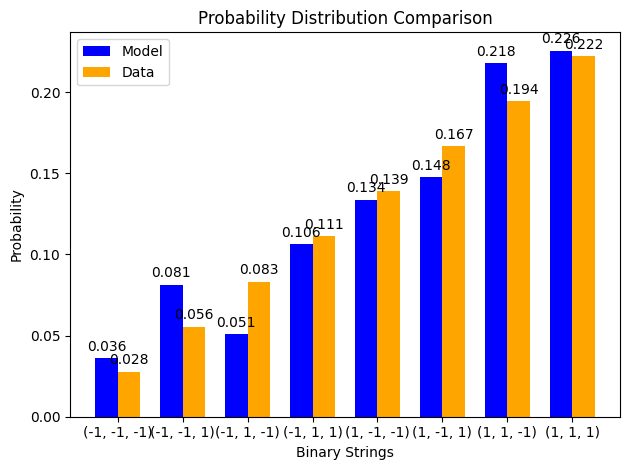

z gradient step for node 0: -5.792776216247631e-06
z gradient step for node 1: 2.0523468767706638e-05
z gradient step for node 2: -1.0779448879666989e-05
z gradient step for node 3: -1.599573843212715e-06
edge graident step for edge (0, 3): 2.1582490096582086e-05
edge graident step for edge (1, 3): 5.5018079009779094e-05
edge graident step for edge (2, 3): -3.5065906015090274e-05
x positive phase: 0.0
x negative phase: -0.040647708536183505
x gradient step for node 0: 4.0647708536183506e-05
x positive phase: 0.0
x negative phase: 0.007714208489791642
x gradient step for node 1: -7.714208489791643e-06
x positive phase: 0.0
x negative phase: 0.003254163743119835
x gradient step for node 2: -3.254163743119835e-06
x positive phase: -0.643713098749775
x negative phase: -0.6371371703000626
x gradient step for node 3: -6.575928449712443e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

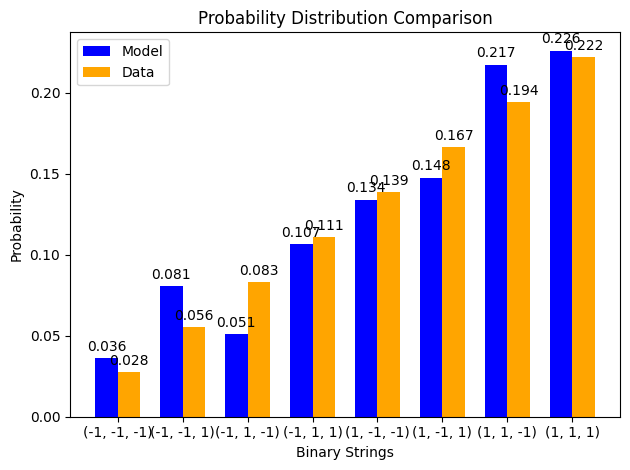

z gradient step for node 0: -5.513415122159082e-06
z gradient step for node 1: 1.96853202099406e-05
z gradient step for node 2: -1.1072315801307491e-05
z gradient step for node 3: -1.6206610373343256e-06
edge graident step for edge (0, 3): 2.0749552018321737e-05
edge graident step for edge (1, 3): 5.385102401917213e-05
edge graident step for edge (2, 3): -3.435873342365578e-05
x positive phase: 0.0
x negative phase: -0.03732707793147577
x gradient step for node 0: 3.732707793147577e-05
x positive phase: 0.0
x negative phase: 0.006955343796488218
x gradient step for node 1: -6.955343796488218e-06
x positive phase: 0.0
x negative phase: 0.0029414535691707515
x gradient step for node 2: -2.9414535691707514e-06
x positive phase: -0.6445653609353595
x negative phase: -0.6382626915600332
x gradient step for node 3: -6.302669375326309e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

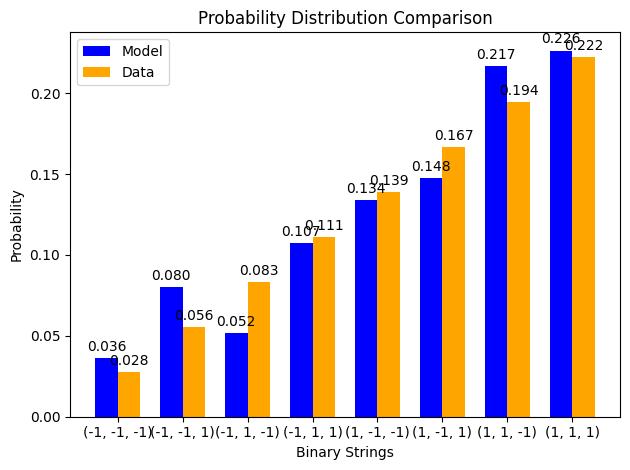

z gradient step for node 0: -5.243040661920329e-06
z gradient step for node 1: 1.8903522134930407e-05
z gradient step for node 2: -1.130152137475944e-05
z gradient step for node 3: -1.6348667787779436e-06
edge graident step for edge (0, 3): 1.994380447268951e-05
edge graident step for edge (1, 3): 5.271694093335154e-05
edge graident step for edge (2, 3): -3.369229923404107e-05
x positive phase: 0.0
x negative phase: -0.034273117464017955
x gradient step for node 0: 3.427311746401795e-05
x positive phase: 0.0
x negative phase: 0.006270982981217317
x gradient step for node 1: -6.270982981217317e-06
x positive phase: 0.0
x negative phase: 0.0026586113291456083
x gradient step for node 2: -2.6586113291456085e-06
x positive phase: -0.6453835459082478
x negative phase: -0.6393420182322754
x gradient step for node 3: -6.041527675972325e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

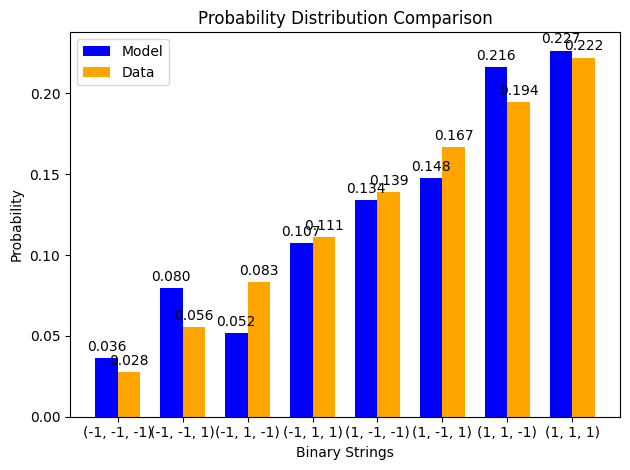

z gradient step for node 0: -4.982007778999986e-06
z gradient step for node 1: 1.8173707100064774e-05
z gradient step for node 2: -1.1474738546090602e-05
z gradient step for node 3: -1.6428642372389446e-06
edge graident step for edge (0, 3): 1.9164521024263137e-05
edge graident step for edge (1, 3): 5.161496938047636e-05
edge graident step for edge (2, 3): -3.3062802833793345e-05
x positive phase: 0.0
x negative phase: -0.03146505607474781
x gradient step for node 0: 3.146505607474781e-05
x positive phase: 0.0
x negative phase: 0.005653837419315997
x gradient step for node 1: -5.653837419315997e-06
x positive phase: 0.0
x negative phase: 0.0024028055969497254
x gradient step for node 2: -2.4028055969497256e-06
x positive phase: -0.646169045542641
x negative phase: -0.6403771970268575
x gradient step for node 3: -5.791848515783516e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

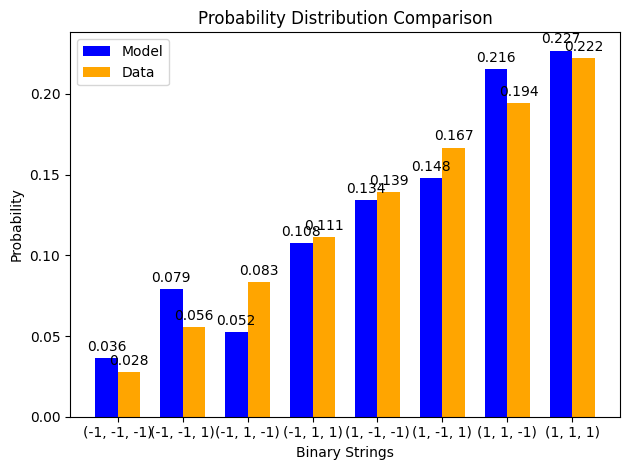

z gradient step for node 0: -4.730510018368994e-06
z gradient step for node 1: 1.7491858595556993e-05
z gradient step for node 2: -1.1598826531238976e-05
z gradient step for node 3: -1.6452917620154716e-06
edge graident step for edge (0, 3): 1.8410937979578602e-05
edge graident step for edge (1, 3): 5.054423130096506e-05
edge graident step for edge (2, 3): -3.246683606612219e-05
x positive phase: 0.0
x negative phase: -0.028883643012829432
x gradient step for node 0: 2.8883643012829432e-05
x positive phase: 0.0
x negative phase: 0.0050973271977991525
x gradient step for node 1: -5.0973271977991525e-06
x positive phase: 0.0
x negative phase: 0.0021714707638087164
x gradient step for node 2: -2.1714707638087164e-06
x positive phase: -0.6469231839142664
x negative phase: -0.6413701704733026
x gradient step for node 3: -5.553013440963816e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

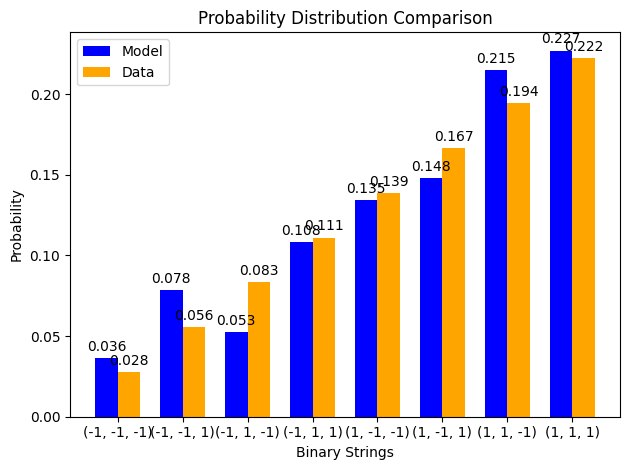

z gradient step for node 0: -4.488612747686471e-06
z gradient step for node 1: 1.6854281847792668e-05
z gradient step for node 2: -1.167990963118426e-05
z gradient step for node 3: -1.6427492559537572e-06
edge graident step for edge (0, 3): 1.7682269260364535e-05
edge graident step for edge (1, 3): 4.950383968636857e-05
edge graident step for edge (2, 3): -3.1901341786820666e-05
x positive phase: 0.0
x negative phase: -0.026511052847733963
x gradient step for node 0: 2.6511052847733965e-05
x positive phase: 0.0
x negative phase: 0.004595512917271803
x gradient step for node 1: -4.595512917271803e-06
x positive phase: 0.0
x negative phase: 0.00196228242594798
x gradient step for node 2: -1.96228242594798e-06
x positive phase: -0.6476472202696211
x negative phase: -0.6423227809413518
x gradient step for node 3: -5.324439328269315e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

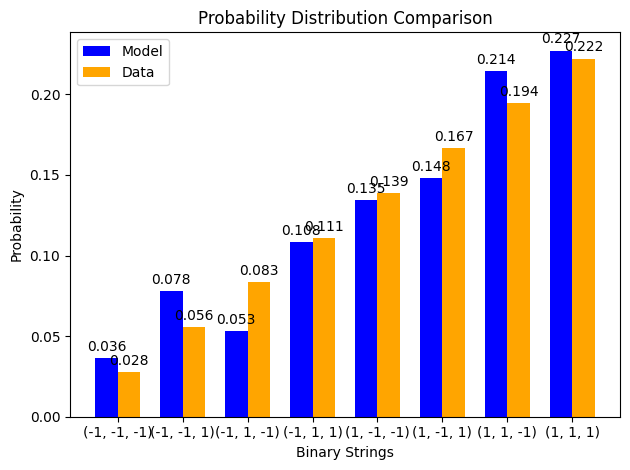

z gradient step for node 0: -4.256280510871846e-06
z gradient step for node 1: 1.6257577427853803e-05
z gradient step for node 2: -1.172344944429904e-05
z gradient step for node 3: -1.6357962005091043e-06
edge graident step for edge (0, 3): 1.6977718299149236e-05
edge graident step for edge (1, 3): 4.849290562843249e-05
edge graident step for edge (2, 3): -3.136357664574499e-05
x positive phase: 0.0
x negative phase: -0.024330793352670344
x gradient step for node 0: 2.4330793352670345e-05
x positive phase: 0.0
x negative phase: 0.004143033934852998
x gradient step for node 1: -4.143033934852998e-06
x positive phase: 0.0
x negative phase: 0.0017731349983600125
x gradient step for node 2: -1.7731349983600126e-06
x positive phase: -0.6483423520652096
x negative phase: -0.6432367749635164
x gradient step for node 3: -5.105577101693237e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

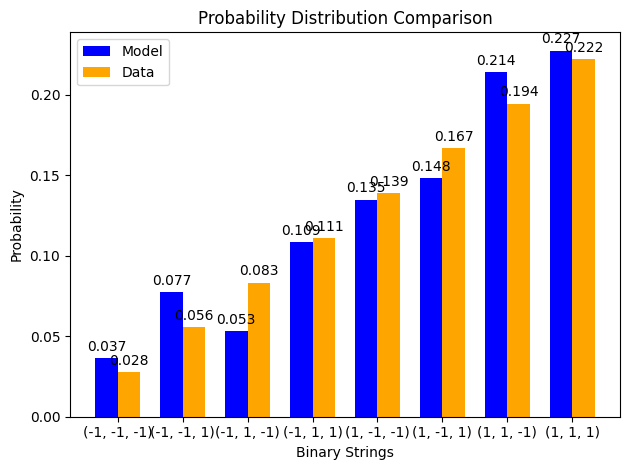

z gradient step for node 0: -4.033399468761134e-06
z gradient step for node 1: 1.569861728936256e-05
z gradient step for node 2: -1.1734310831023152e-05
z gradient step for node 3: -1.6249509553203923e-06
edge graident step for edge (0, 3): 1.6296487461641528e-05
edge graident step for edge (1, 3): 4.751054397288572e-05
edge graident step for edge (2, 3): -3.0851077722541924e-05
x positive phase: 0.0
x negative phase: -0.022327616869781984
x gradient step for node 0: 2.2327616869781985e-05
x positive phase: 0.0
x negative phase: 0.003735052461876803
x gradient step for node 1: -3.735052461876803e-06
x positive phase: 0.0
x negative phase: 0.0016021213633273033
x gradient step for node 2: -1.6021213633273035e-06
x positive phase: -0.649009718020893
x negative phase: -0.6441138077292324
x gradient step for node 3: -4.895910291660588e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

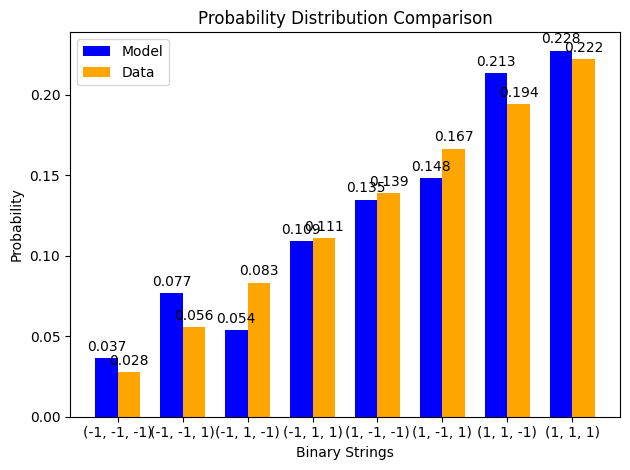

z gradient step for node 0: -3.819795739115284e-06
z gradient step for node 1: 1.5174522929034346e-05
z gradient step for node 2: -1.171682201362105e-05
z gradient step for node 3: -1.610691024524269e-06
edge graident step for edge (0, 3): 1.563778542356198e-05
edge graident step for edge (1, 3): 4.655587782363163e-05
edge graident step for edge (2, 3): -3.036163266113981e-05
x positive phase: 0.0
x negative phase: -0.020487435567374247
x gradient step for node 0: 2.0487435567374248e-05
x positive phase: 0.0
x negative phase: 0.0033672029791092704
x gradient step for node 1: -3.3672029791092703e-06
x positive phase: 0.0
x negative phase: 0.001447514376510622
x gradient step for node 2: -1.447514376510622e-06
x positive phase: -0.6496504011440839
x negative phase: -0.6449554476483135
x gradient step for node 3: -4.694953495770427e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

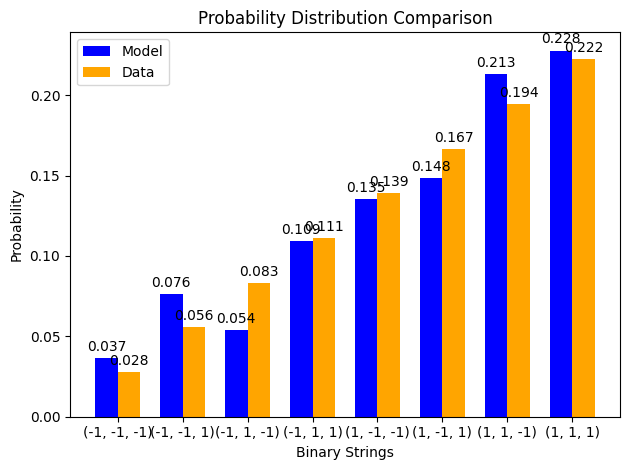

z gradient step for node 0: -3.6152503242258827e-06
z gradient step for node 1: 1.4682645418431867e-05
z gradient step for node 2: -1.1674829206179488e-05
z gradient step for node 3: -1.5934540402081365e-06
edge graident step for edge (0, 3): 1.5000832863021507e-05
edge graident step for edge (1, 3): 4.5628042101669194e-05
edge graident step for edge (2, 3): -2.9893252967491264e-05
x positive phase: 0.0
x negative phase: -0.018797240842595403
x gradient step for node 0: 1.8797240842595402e-05
x positive phase: 0.0
x negative phase: 0.003035546478066995
x gradient step for node 1: -3.035546478066995e-06
x positive phase: 0.0
x negative phase: 0.0013077500671225414
x gradient step for node 2: -1.3077500671225413e-06
x positive phase: -0.6502654316919123
x negative phase: -0.6457631809044287
x gradient step for node 3: -4.502250787483564e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

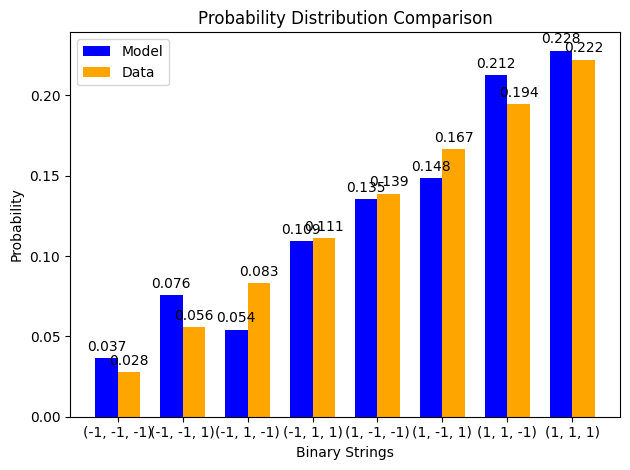

z gradient step for node 0: -3.4195112071320754e-06
z gradient step for node 1: 1.4220547099113828e-05
z gradient step for node 2: -1.1611746171120249e-05
z gradient step for node 3: -1.5736392622112682e-06
edge graident step for edge (0, 3): 1.4384866772128801e-05
edge graident step for edge (1, 3): 4.472618632820867e-05
edge graident step for edge (2, 3): -2.944415015789592e-05
x positive phase: 0.0
x negative phase: -0.017245027001201556
x gradient step for node 0: 1.7245027001201556e-05
x positive phase: 0.0
x negative phase: 0.0027365290796993944
x gradient step for node 1: -2.7365290796993944e-06
x positive phase: 0.0
x negative phase: 0.0011814123818014595
x gradient step for node 2: -1.1814123818014596e-06
x positive phase: -0.6508557900470111
x negative phase: -0.6465384159382472
x gradient step for node 3: -4.317374108763872e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

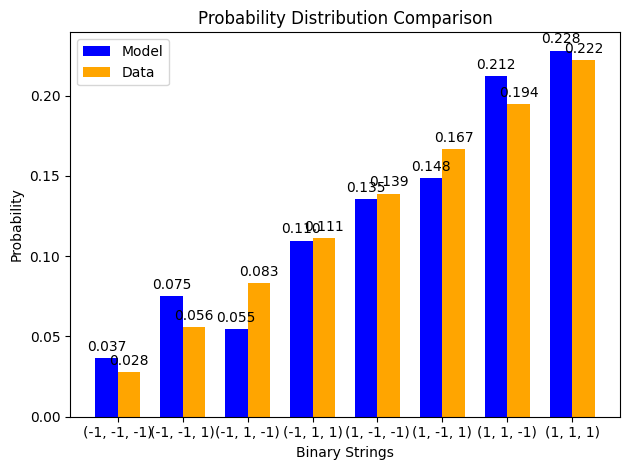

z gradient step for node 0: -3.2323031053086983e-06
z gradient step for node 1: 1.3785984767973243e-05
z gradient step for node 2: -1.1530599091408772e-05
z gradient step for node 3: -1.5516094341277987e-06
edge graident step for edge (0, 3): 1.378914364231687e-05
edge graident step for edge (1, 3): 4.384947677223533e-05
edge graident step for edge (2, 3): -2.9012714469324797e-05
x positive phase: 0.0
x negative phase: -0.01581971925247493
x gradient step for node 0: 1.581971925247493e-05
x positive phase: 0.0
x negative phase: 0.0024669446212417685
x gradient step for node 1: -2.4669446212417686e-06
x positive phase: 0.0
x negative phase: 0.0010672193341736533
x gradient step for node 2: -1.0672193341736534e-06
x positive phase: -0.6514224094894701
x negative phase: -0.6472824878152778
x gradient step for node 3: -4.139921674192304e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

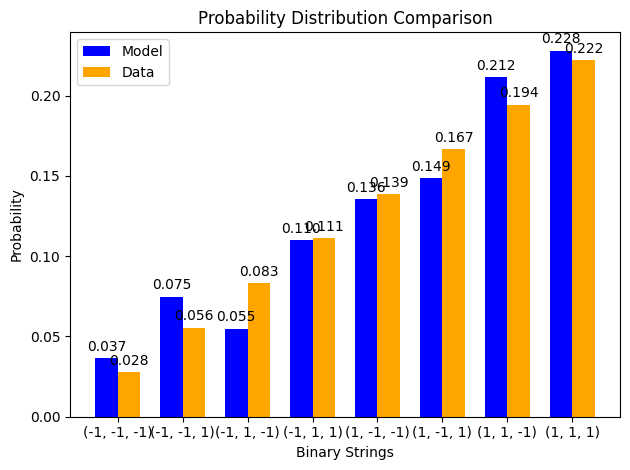

z gradient step for node 0: -3.0533352918503676e-06
z gradient step for node 1: 1.3376894206951012e-05
z gradient step for node 2: -1.1434067134779873e-05
z gradient step for node 3: -1.5276928690363679e-06
edge graident step for edge (0, 3): 1.3212941735899708e-05
edge graident step for edge (1, 3): 4.2997098078323676e-05
edge graident step for edge (2, 3): -2.859749586740401e-05
x positive phase: 0.0
x negative phase: -0.014511105986436328
x gradient step for node 0: 1.4511105986436328e-05
x positive phase: 0.0
x negative phase: 0.002223900838553345
x gradient step for node 1: -2.223900838553345e-06
x positive phase: 0.0
x negative phase: 0.0009640104336844401
x gradient step for node 2: -9.640104336844402e-07
x positive phase: -0.6519661788530847
x negative phase: -0.6479966624458977
x gradient step for node 3: -3.969516407187013e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

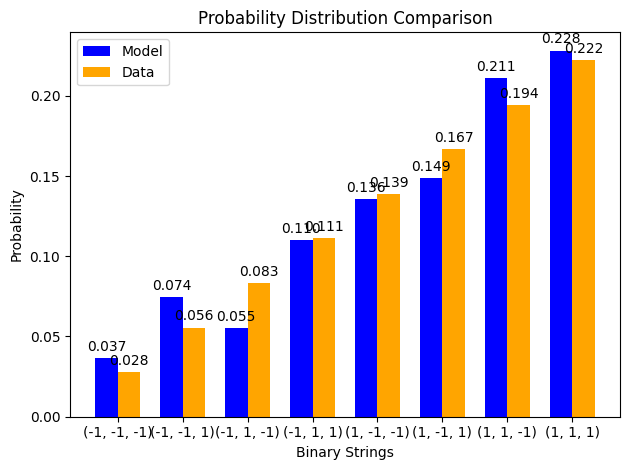

z gradient step for node 0: -2.882307827091757e-06
z gradient step for node 1: 1.2991375933030485e-05
z gradient step for node 2: -1.1324519069447342e-05
z gradient step for node 3: -1.5021856661555645e-06
edge graident step for edge (0, 3): 1.2655562620734418e-05
edge graident step for edge (1, 3): 4.216825447015368e-05
edge graident step for edge (2, 3): -2.8197187111361905e-05
x positive phase: 0.0
x negative phase: -0.013309775247621107
x gradient step for node 0: 1.3309775247621108e-05
x positive phase: 0.0
x negative phase: 0.0020047888048544335
x gradient step for node 1: -2.0047888048544334e-06
x positive phase: 0.0
x negative phase: 0.0008707352780754912
x gradient step for node 2: -8.707352780754912e-07
x positive phase: -0.6524879450584633
x negative phase: -0.6486821406350411
x gradient step for node 3: -3.8058044234221546e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

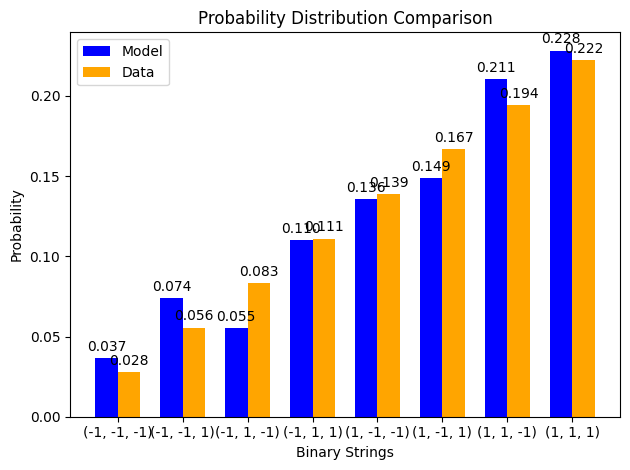

z gradient step for node 0: -2.718916486683154e-06
z gradient step for node 1: 1.2627682061626206e-05
z gradient step for node 2: -1.120404627142367e-05
z gradient step for node 3: -1.4753539822615625e-06
edge graident step for edge (0, 3): 1.2116332114721018e-05
edge graident step for edge (1, 3): 4.136217060829021e-05
edge graident step for edge (2, 3): -2.7810608657809933e-05
x positive phase: 0.0
x negative phase: -0.012207055281158015
x gradient step for node 0: 1.2207055281158015e-05
x positive phase: 0.0
x negative phase: 0.0018072553176225095
x gradient step for node 1: -1.8072553176225096e-06
x positive phase: 0.0
x negative phase: 0.0007864432038900198
x gradient step for node 2: -7.864432038900199e-07
x positive phase: -0.652988515519063
x negative phase: -0.649340061946977
x gradient step for node 3: -3.6484535720859857e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

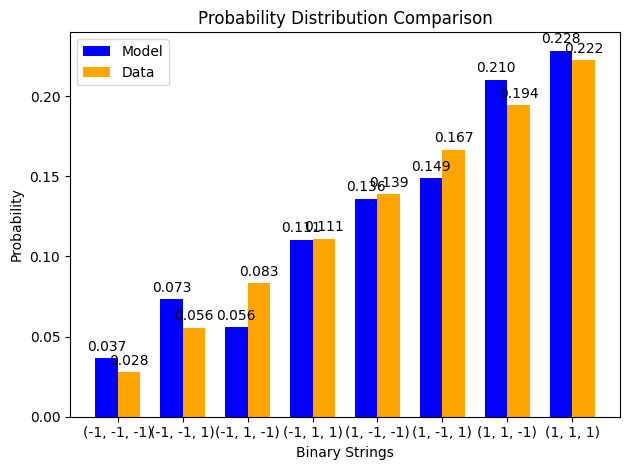

z gradient step for node 0: -2.562856624060639e-06
z gradient step for node 1: 1.2284204190260994e-05
z gradient step for node 2: -1.1074492442737256e-05
z gradient step for node 3: -1.4474363000915036e-06
edge graident step for edge (0, 3): 1.1594600761445473e-05
edge graident step for edge (1, 3): 4.057809216676606e-05
edge graident step for edge (2, 3): -2.7436695206431132e-05
x positive phase: 0.0
x negative phase: -0.011194958999686004
x gradient step for node 0: 1.1194958999686005e-05
x positive phase: 0.0
x negative phase: 0.0016291779536642872
x gradient step for node 1: -1.6291779536642873e-06
x positive phase: 0.0
x negative phase: 0.000710273898623992
x gradient step for node 2: -7.102738986239921e-07
x positive phase: -0.6534686604189667
x negative phase: -0.6499715083768586
x gradient step for node 3: -3.4971520421080984e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

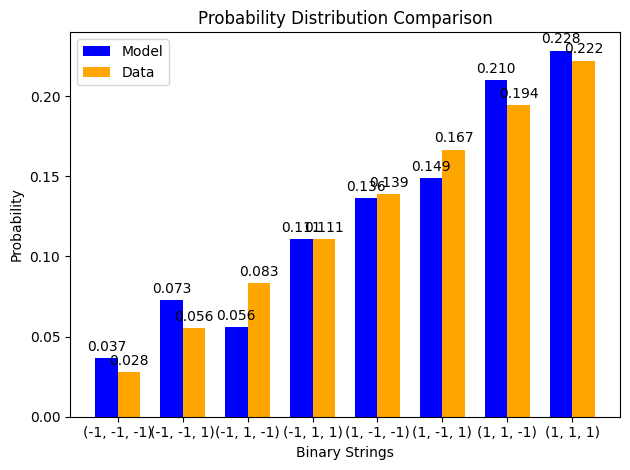

z gradient step for node 0: -2.413826164728017e-06
z gradient step for node 1: 1.1959462220439725e-05
z gradient step for node 2: -1.0937480338381406e-05
z gradient step for node 3: -1.4186456508002154e-06
edge graident step for edge (0, 3): 1.1089743936914753e-05
edge graident step for edge (1, 3): 3.9815286181462836e-05
edge graident step for edge (2, 3): -2.7074483710360698e-05
x positive phase: 0.0
x negative phase: -0.01026613220133833
x gradient step for node 0: 1.0266132201338331e-05
x positive phase: 0.0
x negative phase: 0.0014686425382202588
x gradient step for node 1: -1.4686425382202588e-06
x positive phase: 0.0
x negative phase: 0.0006414488866433721
x gradient step for node 2: -6.414488866433721e-07
x positive phase: -0.6539291148633111
x negative phase: -0.6505775078256015
x gradient step for node 3: -3.3516070377095364e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

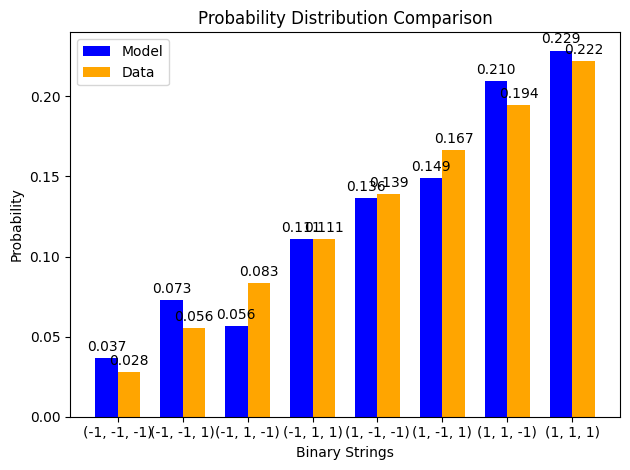

z gradient step for node 0: -2.2715278957548544e-06
z gradient step for node 1: 1.1652094044572126e-05
z gradient step for node 2: -1.0794435778306578e-05
z gradient step for node 3: -1.3891717594173847e-06
edge graident step for edge (0, 3): 1.060116166944125e-05
edge graident step for edge (1, 3): 3.9073041213744315e-05
edge graident step for edge (2, 3): -2.672310269215594e-05
x positive phase: 0.0
x negative phase: -0.009413805357657661
x gradient step for node 0: 9.413805357657661e-06
x positive phase: 0.0
x negative phase: 0.0013239227975508899
x gradient step for node 1: -1.3239227975508898e-06
x positive phase: 0.0
x negative phase: 0.0005792638087947209
x gradient step for node 2: -5.792638087947208e-07
x positive phase: -0.6543705809038702
x negative phase: -0.6511590373783974
x gradient step for node 3: -3.2115435254728154e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

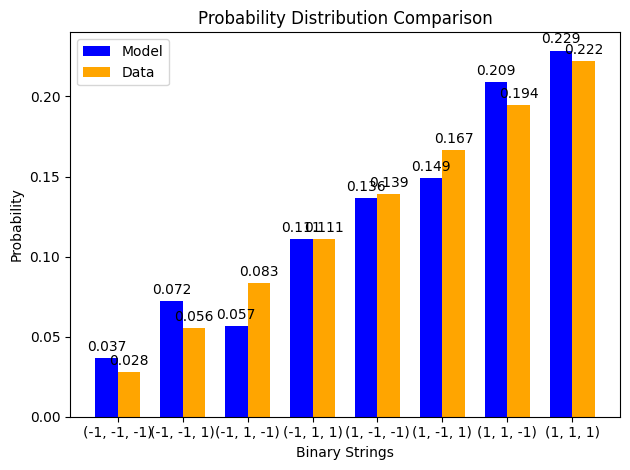

z gradient step for node 0: -2.135671185378052e-06
z gradient step for node 1: 1.1360846032118455e-05
z gradient step for node 2: -1.064660919965188e-05
z gradient step for node 3: -1.3591830917262516e-06
edge graident step for edge (0, 3): 1.0128278239772416e-05
edge graident step for edge (1, 3): 3.835066736494816e-05
edge graident step for edge (2, 3): -2.6381762722838183e-05
x positive phase: 0.0
x negative phase: -0.008631748784314185
x gradient step for node 0: 8.631748784314185e-06
x positive phase: 0.0
x negative phase: 0.0011934619859667326
x gradient step for node 1: -1.1934619859667326e-06
x positive phase: 0.0
x negative phase: 0.000523081422792465
x gradient step for node 2: -5.23081422792465e-07
x positive phase: -0.654793729443461
x negative phase: -0.6517170263899871
x gradient step for node 3: -3.0767030534739616e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

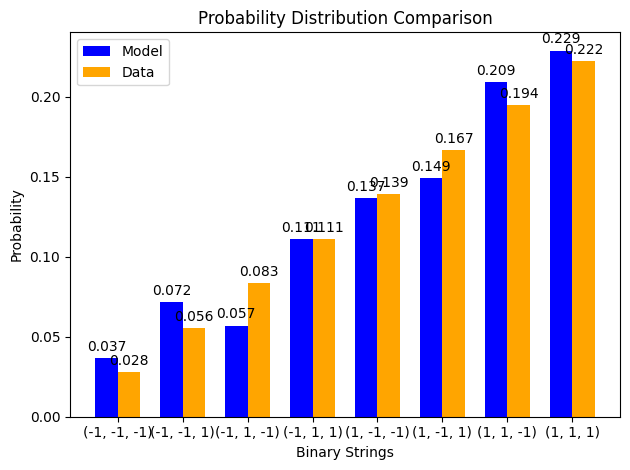

z gradient step for node 0: -2.0059732437844867e-06
z gradient step for node 1: 1.1084564255186502e-05
z gradient step for node 2: -1.0495094983979519e-05
z gradient step for node 3: -1.3288287884259675e-06
edge graident step for edge (0, 3): 9.670541616103313e-06
edge graident step for edge (1, 3): 3.7647496170912415e-05
edge graident step for edge (2, 3): -2.6049747936544605e-05
x positive phase: 0.0
x negative phase: -0.007914231005626868
x gradient step for node 0: 7.914231005626868e-06
x positive phase: 0.0
x negative phase: 0.00107585629785969
x gradient step for node 1: -1.07585629785969e-06
x positive phase: 0.0
x negative phase: 0.0004723252580152986
x gradient step for node 2: -4.723252580152986e-07
x positive phase: -0.6551992020236787
x negative phase: -0.6522523593819121
x gradient step for node 3: -2.9468426417665893e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

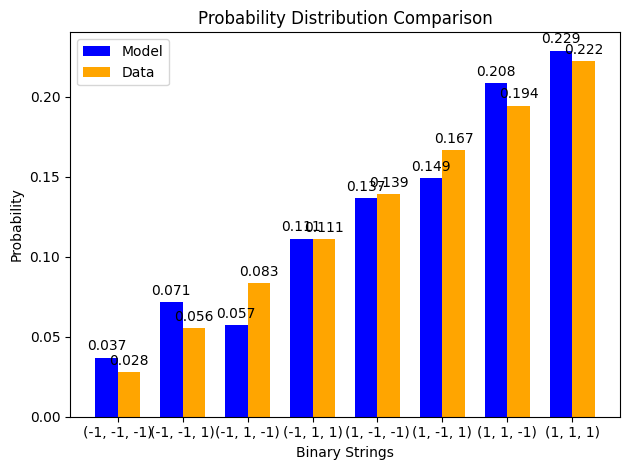

z gradient step for node 0: -1.882160016309087e-06
z gradient step for node 1: 1.0822186398929846e-05
z gradient step for node 2: -1.0340848774770275e-05
z gradient step for node 3: -1.2982404782574953e-06
edge graident step for edge (0, 3): 9.227422768256333e-06
edge graident step for edge (1, 3): 3.6962880400418566e-05
edge graident step for edge (2, 3): -2.5726408466949514e-05
x positive phase: 0.0
x negative phase: -0.00725598012513691
x gradient step for node 0: 7.2559801251369105e-06
x positive phase: 0.0
x negative phase: 0.000969839893123057
x gradient step for node 1: -9.69839893123057e-07
x positive phase: 0.0
x negative phase: 0.00042647386433057924
x gradient step for node 2: -4.2647386433057925e-07
x positive phase: -0.6555876125010274
x negative phase: -0.6527658787584479
x gradient step for node 3: -2.8217337425794356e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

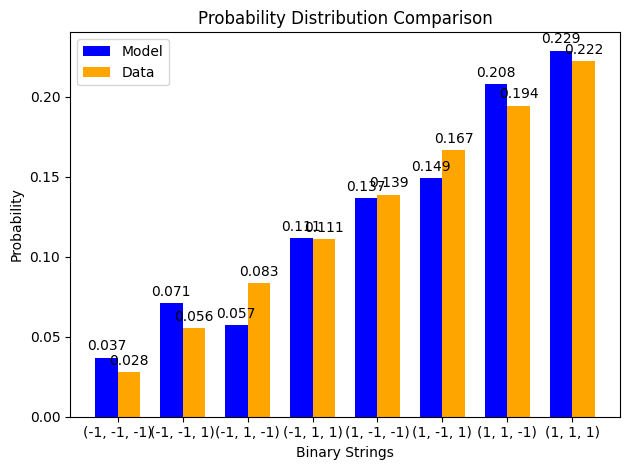

z gradient step for node 0: -1.763966783764892e-06
z gradient step for node 1: 1.0572734306447673e-05
z gradient step for node 2: -1.0184702981964403e-05
z gradient step for node 3: -1.2675339662581442e-06
edge graident step for edge (0, 3): 8.798414896725226e-06
edge graident step for edge (1, 3): 3.62961937771171e-05
edge graident step for edge (2, 3): -2.5411153703909397e-05
x positive phase: 0.0
x negative phase: -0.006652148018059122
x gradient step for node 0: 6.652148018059122e-06
x positive phase: 0.0
x negative phase: 0.0008742713805590832
x gradient step for node 1: -8.742713805590832e-07
x positive phase: 0.0
x negative phase: 0.0003850556000321322
x gradient step for node 2: -3.850556000321322e-07
x positive phase: -0.6559595486168673
x negative phase: -0.6532583873489557
x gradient step for node 3: -2.701161267911645e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

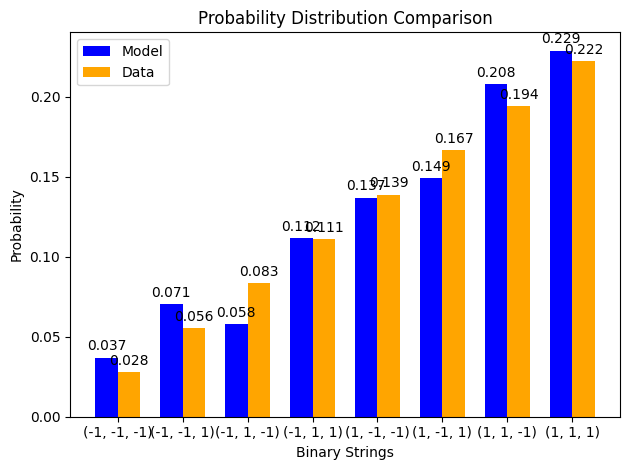

z gradient step for node 0: -1.6511385309400107e-06
z gradient step for node 1: 1.0335307111701802e-05
z gradient step for node 2: -1.0027380652993037e-05
z gradient step for node 3: -1.2368107967084263e-06
edge graident step for edge (0, 3): 8.383032605190355e-06
edge graident step for edge (1, 3): 3.564683064094817e-05
edge graident step for edge (2, 3): -2.510344627982486e-05
x positive phase: 0.0
x negative phase: -0.006098277166713267
x gradient step for node 0: 6.098277166713268e-06
x positive phase: 0.0
x negative phase: 0.0007881216186006949
x gradient step for node 1: -7.881216186006949e-07
x positive phase: 0.0
x negative phase: 0.0003476439089646027
x gradient step for node 2: -3.476439089646027e-07
x positive phase: -0.6563155734667832
x negative phase: -0.6537306507850217
x gradient step for node 3: -2.5849226817614704e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

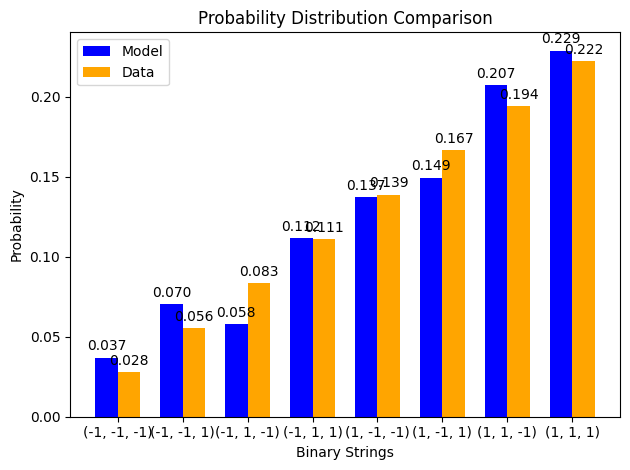

z gradient step for node 0: -1.5434301329559918e-06
z gradient step for node 1: 1.0109074917304146e-05
z gradient step for node 2: -9.869507873566163e-06
z gradient step for node 3: -1.206159692872466e-06
edge graident step for edge (0, 3): 7.980811039255464e-06
edge graident step for edge (1, 3): 3.5014205562188176e-05
edge graident step for edge (2, 3): -2.480279670511612e-05
x positive phase: 0.0
x negative phase: -0.005590269966518652
x gradient step for node 0: 5.590269966518652e-06
x positive phase: 0.0
x negative phase: 0.0007104627060456989
x gradient step for node 1: -7.10462706045699e-07
x positive phase: 0.0
x negative phase: 0.0003138530414552593
x gradient step for node 2: -3.1385304145525934e-07
x positive phase: -0.6566562268750307
x negative phase: -0.6541833997211248
x gradient step for node 3: -2.4728271539058433e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

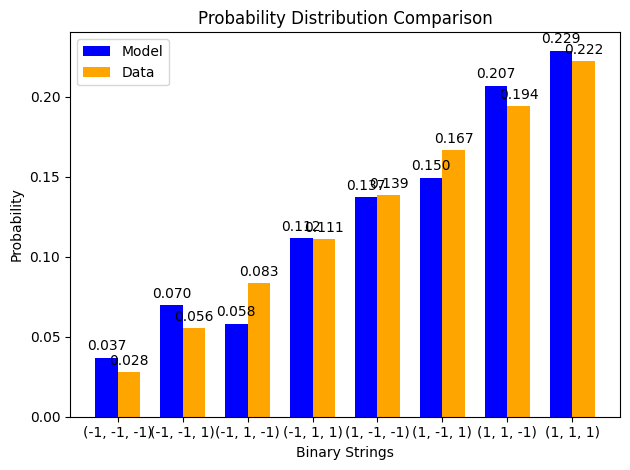

z gradient step for node 0: -1.4406063998290698e-06
z gradient step for node 1: 9.893272977051226e-06
z gradient step for node 2: -9.711624846457128e-06
z gradient step for node 3: -1.1756578774653193e-06
edge graident step for edge (0, 3): 7.591305009363003e-06
edge graident step for edge (1, 3): 3.439775291887162e-05
edge graident step for edge (2, 3): -2.450875858107404e-05
x positive phase: 0.0
x negative phase: -0.005124360337433123
x gradient step for node 0: 5.124360337433123e-06
x positive phase: 0.0
x negative phase: 0.000640458047635102
x gradient step for node 1: -6.40458047635102e-07
x positive phase: 0.0
x negative phase: 0.00028333417781831356
x gradient step for node 2: -2.8333417781831355e-07
x positive phase: -0.6569820266796823
x negative phase: -0.6546173319077015
x gradient step for node 3: -2.3646947719807576e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

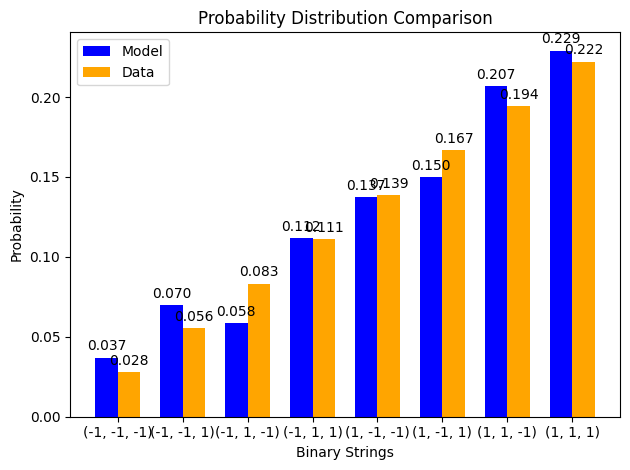

z gradient step for node 0: -1.3424420118585135e-06
z gradient step for node 1: 9.687196345794707e-06
z gradient step for node 2: -9.55419578265279e-06
z gradient step for node 3: -1.1453722790803201e-06
edge graident step for edge (0, 3): 7.214088111895278e-06
edge graident step for edge (1, 3): 3.379692644641741e-05
edge graident step for edge (2, 3): -2.4220924326272127e-05
x positive phase: 0.0
x negative phase: -0.004697087483529431
x gradient step for node 0: 4.697087483529431e-06
x positive phase: 0.0
x negative phase: 0.0005773533903110976
x gradient step for node 1: -5.773533903110976e-07
x positive phase: 0.0
x negative phase: 0.00025577191697140583
x gradient step for node 2: -2.5577191697140585e-07
x positive phase: -0.6572934699339712
x negative phase: -0.6550331141254366
x gradient step for node 3: -2.2603558085345644e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

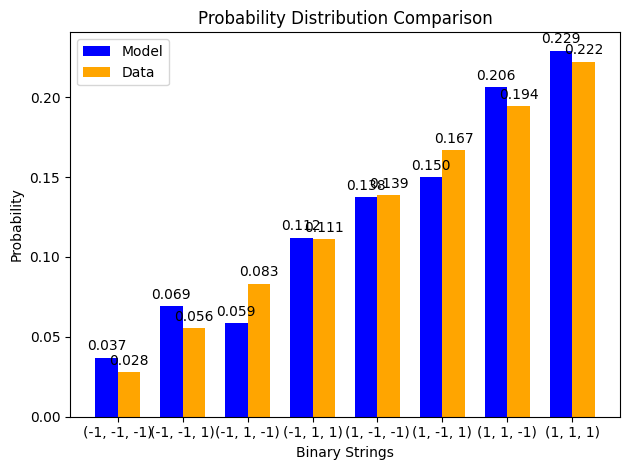

z gradient step for node 0: -1.2487213721356638e-06
z gradient step for node 1: 9.49019496177289e-06
z gradient step for node 2: -9.39761772647156e-06
z gradient step for node 3: -1.1153606306552599e-06
edge graident step for edge (0, 3): 6.848751859262204e-06
edge graident step for edge (1, 3): 3.3211198766690794e-05
edge graident step for edge (2, 3): -2.393892135978512e-05
x positive phase: 0.0
x negative phase: -0.004305271651492909
x gradient step for node 0: 4.3052716514929095e-06
x positive phase: 0.0
x negative phase: 0.0005204687359653474
x gradient step for node 1: -5.204687359653475e-07
x positive phase: 0.0
x negative phase: 0.000230881096140389
x gradient step for node 2: -2.30881096140389e-07
x positive phase: -0.657591034029159
x negative phase: -0.6554313839894473
x gradient step for node 3: -2.159650039711636e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

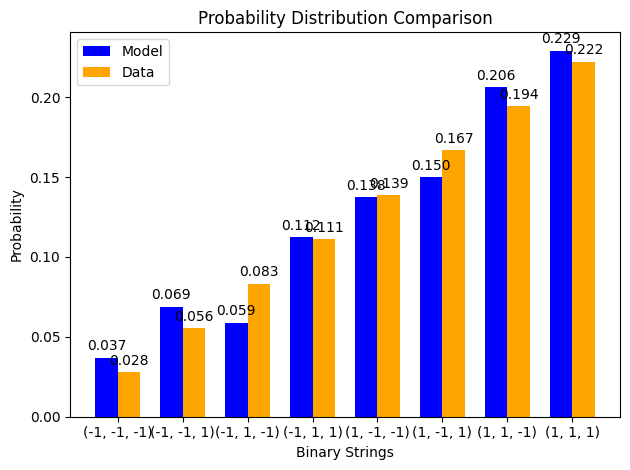

z gradient step for node 0: -1.1592383972677811e-06
z gradient step for node 1: 9.30166912882563e-06
z gradient step for node 2: -9.242228424527127e-06
z gradient step for node 3: -1.0856724665730954e-06
edge graident step for edge (0, 3): 6.494904827161807e-06
edge graident step for edge (1, 3): 3.264006090245361e-05
edge graident step for edge (2, 3): -2.3662408690769603e-05
x positive phase: 0.0
x negative phase: -0.003945991747014682
x gradient step for node 0: 3.945991747014682e-06
x positive phase: 0.0
x negative phase: 0.0004691910455267959
x gradient step for node 1: -4.691910455267959e-07
x positive phase: 0.0
x negative phase: 0.00020840391075605864
x gradient step for node 2: -2.0840391075605865e-07
x positive phase: -0.6578751777440545
x negative phase: -0.655812751631767
x gradient step for node 3: -2.0624261122874633e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

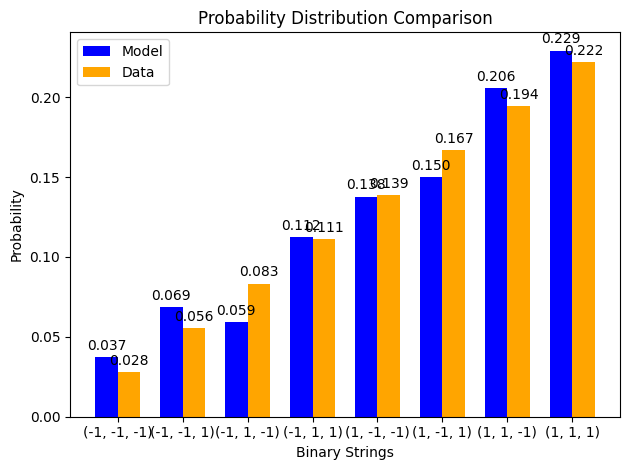

z gradient step for node 0: -1.0737962631615638e-06
z gradient step for node 1: 9.12106536811208e-06
z gradient step for node 2: -9.08831333771129e-06
z gradient step for node 3: -1.0563500252475933e-06
edge graident step for edge (0, 3): 6.152171825083486e-06
edge graident step for edge (1, 3): 3.2083021782088995e-05
edge graident step for edge (2, 3): -2.339107386957087e-05
x positive phase: 0.0
x negative phase: -0.0036165646762068644
x gradient step for node 0: 3.6165646762068645e-06
x positive phase: 0.0
x negative phase: 0.000422967657425227
x gradient step for node 1: -4.22967657425227e-07
x positive phase: 0.0
x negative phase: 0.00018810730649188034
x gradient step for node 2: -1.8810730649188035e-07
x positive phase: -0.6581463422260638
x negative phase: -0.6561778012702052
x gradient step for node 3: -1.968540955858633e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

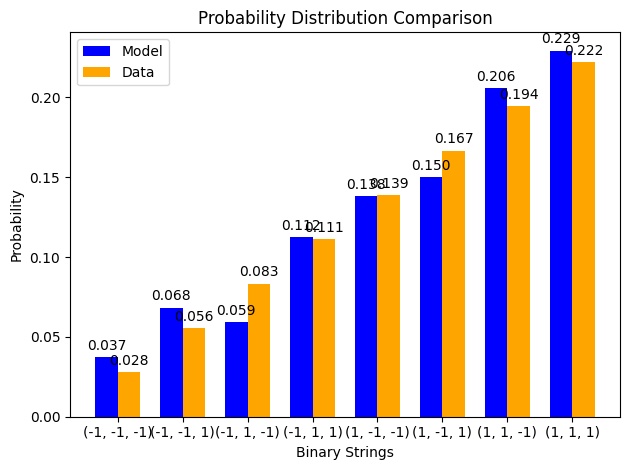

z gradient step for node 0: -9.922071192490223e-07
z gradient step for node 1: 8.947872610971492e-06
z gradient step for node 2: -8.936111885597841e-06
z gradient step for node 3: -1.0274290641094086e-06
edge graident step for edge (0, 3): 5.820193094416892e-06
edge graident step for edge (1, 3): 3.1539607738609075e-05
edge graident step for edge (2, 3): -2.3124630260509676e-05
x positive phase: 0.0
x negative phase: -0.003314526287178215
x gradient step for node 0: 3.3145262871782153e-06
x positive phase: 0.0
x negative phase: 0.0003813003508798224
x gradient step for node 1: -3.813003508798224e-07
x positive phase: 0.0
x negative phase: 0.00016978061797973395
x gradient step for node 2: -1.6978061797973394e-07
x positive phase: -0.6584049519084133
x negative phase: -0.6565270926713046
x gradient step for node 3: -1.8778592371087032e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

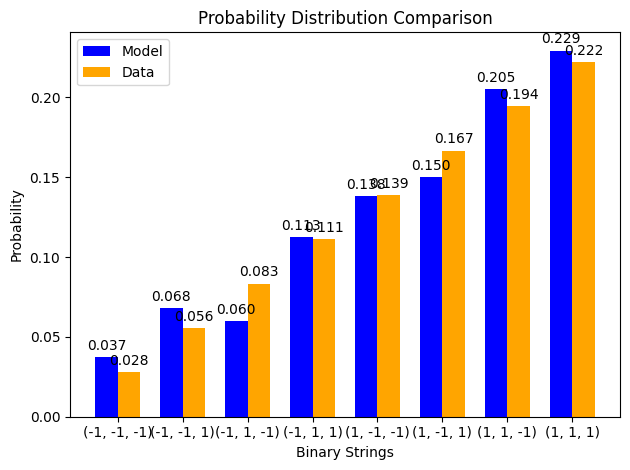

z gradient step for node 0: -9.142917817207552e-07
z gradient step for node 1: 8.781618706488831e-06
z gradient step for node 2: -8.785823003765459e-06
z gradient step for node 3: -9.989395937951008e-07
edge graident step for edge (0, 3): 5.4986235371664025e-06
edge graident step for edge (1, 3): 3.1009362006266585e-05
edge graident step for edge (2, 3): -2.2862814600953907e-05
x positive phase: 0.0
x negative phase: -0.003037613794704795
x gradient step for node 0: 3.0376137947047947e-06
x positive phase: 0.0
x negative phase: 0.0003437399911721137
x gradient step for node 1: -3.437399911721137e-07
x positive phase: 0.0
x negative phase: 0.0001532334310939053
x gradient step for node 2: -1.532334310939053e-07
x positive phase: -0.6586514153679232
x negative phase: -0.6568611625147021
x gradient step for node 3: -1.7902528532210972e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

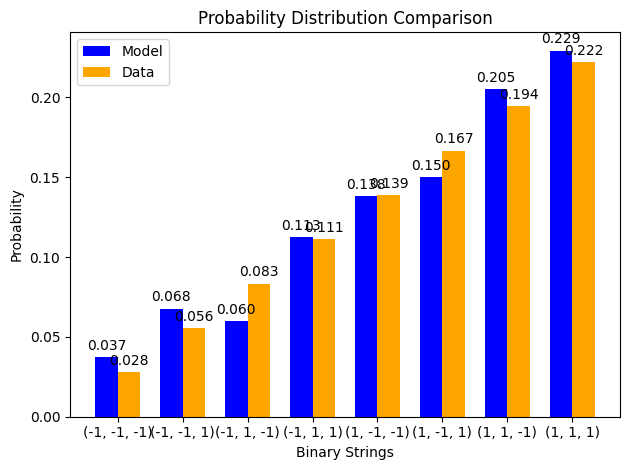

z gradient step for node 0: -8.398794140446752e-07
z gradient step for node 1: 8.621867219135464e-06
z gradient step for node 2: -8.637610086470752e-06
z gradient step for node 3: -9.709065381647842e-07
edge graident step for edge (0, 3): 5.187131977186621e-06
edge graident step for edge (1, 3): 3.0491844217473197e-05
edge graident step for edge (2, 3): -2.2605384815215735e-05
x positive phase: 0.0
x negative phase: -0.0027837495784567064
x gradient step for node 0: 2.7837495784567064e-06
x positive phase: 0.0
x negative phase: 0.0003098817001348529
x gradient step for node 1: -3.098817001348529e-07
x positive phase: 0.0
x negative phase: 0.00013829364783276196
x gradient step for node 2: -1.3829364783276197e-07
x positive phase: -0.6588861261274521
x negative phase: -0.6571805256658081
x gradient step for node 3: -1.7056004616440302e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

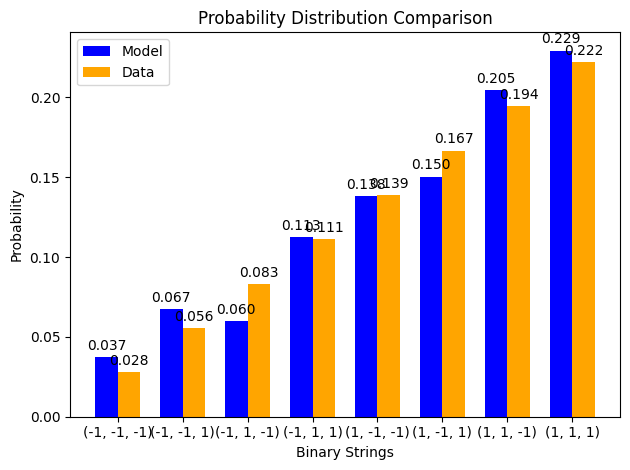

z gradient step for node 0: -7.688072012052572e-07
z gradient step for node 1: 8.468214493565829e-06
z gradient step for node 2: -8.491605379768174e-06
z gradient step for node 3: -9.433503264859034e-07
edge graident step for edge (0, 3): 4.885400454983591e-06
edge graident step for edge (1, 3): 2.9986629902270274e-05
edge graident step for edge (2, 3): -2.2352118055342234e-05
x positive phase: 0.0
x negative phase: -0.002551026252461554
x gradient step for node 0: 2.551026252461554e-06
x positive phase: 0.0
x negative phase: 0.0002793605005816545
x gradient step for node 1: -2.793605005816545e-07
x positive phase: 0.0
x negative phase: 0.00012480573477178356
x gradient step for node 2: -1.2480573477178357e-07
x positive phase: -0.6591094634068827
x negative phase: -0.6574856763632937
x gradient step for node 3: -1.623787043589009e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

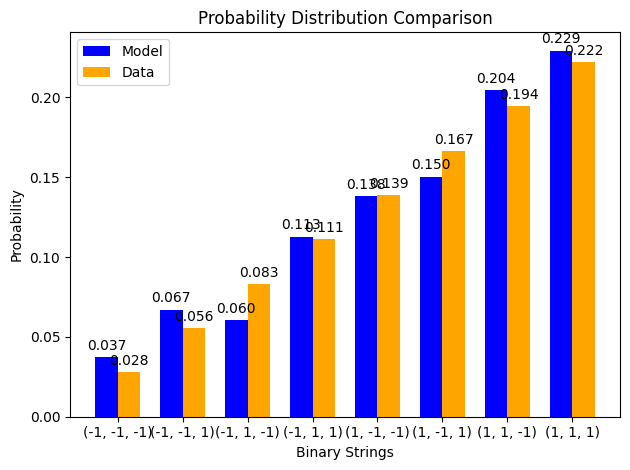

z gradient step for node 0: -7.009200226129053e-07
z gradient step for node 1: 8.32028696525003e-06
z gradient step for node 2: -8.347913883544e-06
z gradient step for node 3: -9.162874237904628e-07
edge graident step for edge (0, 3): 4.593123556474732e-06
edge graident step for edge (1, 3): 2.9493309992181776e-05
edge graident step for edge (2, 3): -2.210280894396363e-05
x positive phase: 0.0
x negative phase: -0.0023376929103742774
x gradient step for node 0: 2.3376929103742776e-06
x positive phase: 0.0
x negative phase: 0.00025184738837071366
x gradient step for node 1: -2.518473883707137e-07
x positive phase: 0.0
x negative phase: 0.00011262913782826454
x gradient step for node 2: -1.1262913782826454e-07
x positive phase: -0.6593217928262558
x negative phase: -0.6577770893274695
x gradient step for node 3: -1.5447034987863263e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

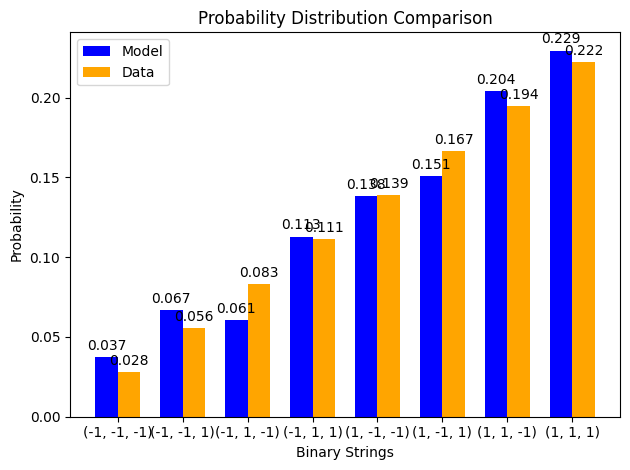

z gradient step for node 0: -6.36070127444599e-07
z gradient step for node 1: 8.177738697162485e-06
z gradient step for node 2: -8.206616814938866e-06
z gradient step for node 3: -8.89730805063771e-07
edge graident step for edge (0, 3): 4.310007775564728e-06
edge graident step for edge (1, 3): 2.9011490329952483e-05
edge graident step for edge (2, 3): -2.1857267997153374e-05
x positive phase: 0.0
x negative phase: -0.0021421424576676907
x gradient step for node 0: 2.1421424576676906e-06
x positive phase: 0.0
x negative phase: 0.00022704579028862238
x gradient step for node 1: -2.2704579028862239e-07
x positive phase: 0.0
x negative phase: 0.00010163684768296195
x gradient step for node 2: -1.0163684768296195e-07
x positive phase: -0.659523467064435
x negative phase: -0.6580552207952426
x gradient step for node 3: -1.468246269192397e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

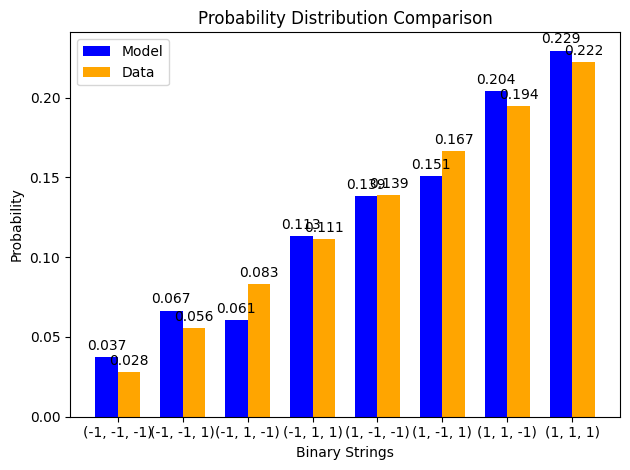

z gradient step for node 0: -5.741168152207377e-07
z gradient step for node 1: 8.04024912416243e-06
z gradient step for node 2: -8.067774680219186e-06
z gradient step for node 3: -8.636903785415041e-07
edge graident step for edge (0, 3): 4.0357709100024565e-06
edge graident step for edge (1, 3): 2.854079118640085e-05
edge graident step for edge (2, 3): -2.1615320207693967e-05
x positive phase: 0.0
x negative phase: -0.0019628999480526318
x gradient step for node 0: 1.9628999480526318e-06
x positive phase: 0.0
x negative phase: 0.00020468837000194064
x gradient step for node 1: -2.0468837000194064e-07
x positive phase: 0.0
x negative phase: 9.171410166174198e-05
x gradient step for node 2: -9.171410166174198e-08
x positive phase: -0.6597148264764368
x negative phase: -0.6583205094869443
x gradient step for node 3: -1.394316989492439e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

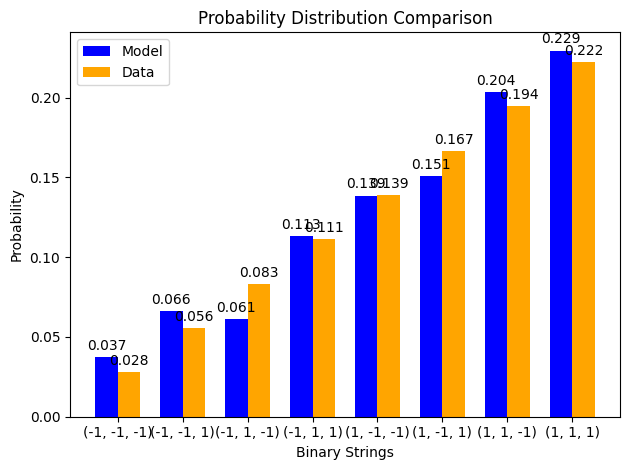

z gradient step for node 0: -5.149261236754854e-07
z gradient step for node 1: 7.907520988065381e-06
z gradient step for node 2: -7.931429997279305e-06
z gradient step for node 3: -8.38173363011896e-07
edge graident step for edge (0, 3): 3.7701414897037266e-06
edge graident step for edge (1, 3): 2.8080846785382294e-05
edge graident step for edge (2, 3): -2.137680377134002e-05
x positive phase: 0.0
x negative phase: -0.0017986118472817223
x gradient step for node 0: 1.7986118472817224e-06
x positive phase: 0.0
x negative phase: 0.0001845341479954075
x gradient step for node 1: -1.845341479954075e-07
x positive phase: 0.0
x negative phase: 8.275720920413956e-05
x gradient step for node 2: -8.275720920413957e-08
x positive phase: -0.6598961996723568
x negative phase: -0.6585733775099675
x gradient step for node 3: -1.3228221623893256e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

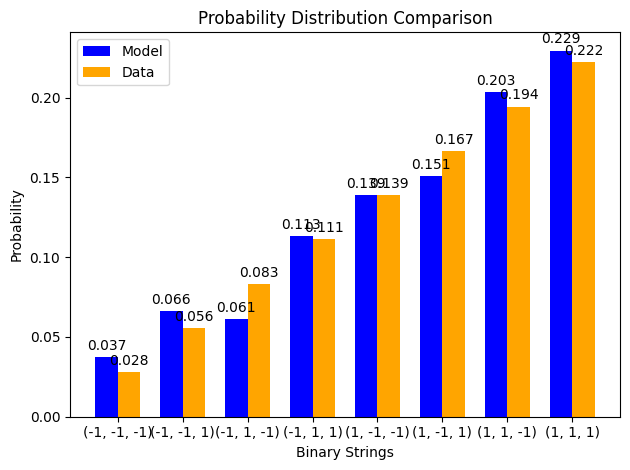

z gradient step for node 0: -4.583705253765058e-07
z gradient step for node 1: 7.779278447667599e-06
z gradient step for node 2: -7.797609706553993e-06
z gradient step for node 3: -8.131846236468232e-07
edge graident step for edge (0, 3): 3.512858236484118e-06
edge graident step for edge (1, 3): 2.7631304837667333e-05
edge graident step for edge (2, 3): -2.11415689406014e-05
x positive phase: 0.0
x negative phase: -0.0016480361529908221
x gradient step for node 0: 1.648036152990822e-06
x positive phase: 0.0
x negative phase: 0.0001663659047333492
x gradient step for node 1: -1.663659047333492e-07
x positive phase: 0.0
x negative phase: 7.467248924776609e-05
x gradient step for node 2: -7.467248924776609e-08
x positive phase: -0.6600679040605992
x negative phase: -0.6588142312037767
x gradient step for node 3: -1.2536728568225407e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

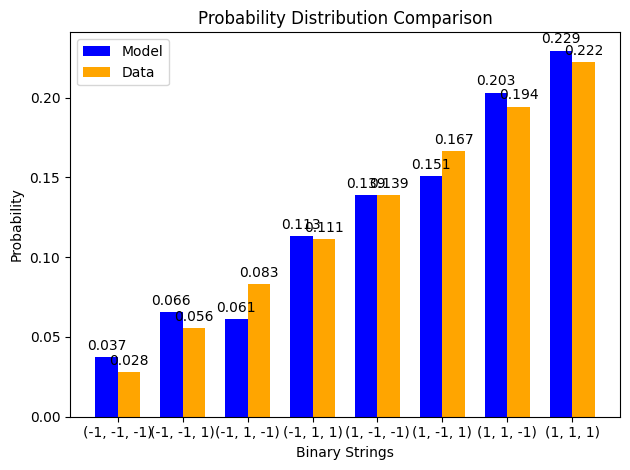

z gradient step for node 0: -4.043286340882912e-07
z gradient step for node 1: 7.655265349183981e-06
z gradient step for node 2: -7.666327304173506e-06
z gradient step for node 3: -7.887269705164068e-07
edge graident step for edge (0, 3): 3.2636695540242955e-06
edge graident step for edge (1, 3): 2.7191826084376022e-05
edge graident step for edge (2, 3): -2.090947699228804e-05
x positive phase: 0.0
x negative phase: -0.0015100333043961515
x gradient step for node 0: 1.5100333043961516e-06
x positive phase: 0.0
x negative phase: 0.00014998783927853428
x gradient step for node 1: -1.499878392785343e-07
x positive phase: 0.0
x negative phase: 6.737530894871405e-05
x gradient step for node 2: -6.737530894871405e-08
x positive phase: -0.660230246357933
x negative phase: -0.6590434619305461
x gradient step for node 3: -1.1867844273869555e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

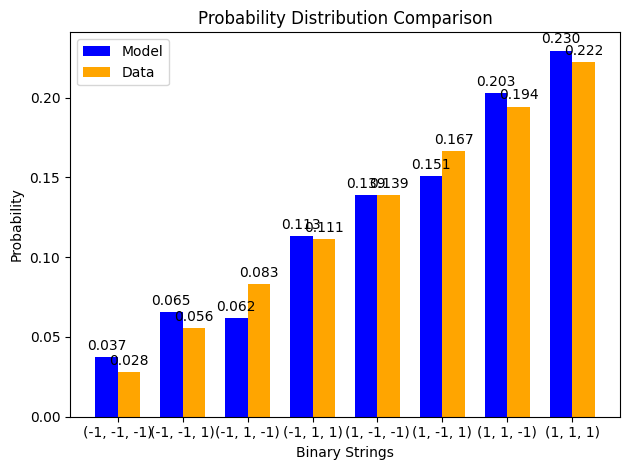

z gradient step for node 0: -3.526849215033101e-07
z gradient step for node 1: 7.535243643670475e-06
z gradient step for node 2: -7.537584727626473e-06
z gradient step for node 3: -7.648014235917822e-07
edge graident step for edge (0, 3): 3.0223330467687994e-06
edge graident step for edge (1, 3): 2.6762083850472144e-05
edge graident step for edge (2, 3): -2.068039929659357e-05
x positive phase: 0.0
x negative phase: -0.001383557820503061
x gradient step for node 0: 1.383557820503061e-06
x positive phase: 0.0
x negative phase: 0.00013522345831081363
x gradient step for node 1: -1.3522345831081364e-07
x positive phase: 0.0
x negative phase: 6.0789214148558265e-05
x gradient step for node 2: -6.078921414855826e-08
x positive phase: -0.6603835230687108
x negative phase: -0.6592614468153553
x gradient step for node 3: -1.122076253355586e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

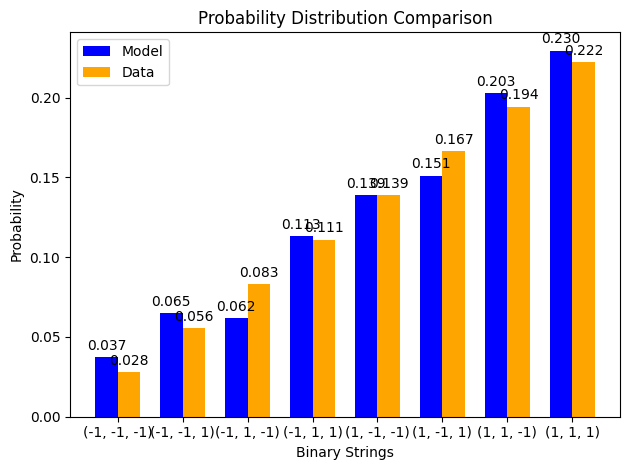

z gradient step for node 0: -3.033294446917467e-07
z gradient step for node 1: 7.4189919390521e-06
z gradient step for node 2: -7.411374021009248e-06
z gradient step for node 3: -7.414074477053167e-07
edge graident step for edge (0, 3): 2.788615066415756e-06
edge graident step for edge (1, 3): 2.6341763608708936e-05
edge graident step for edge (2, 3): -2.0454216476840147e-05
x positive phase: 0.0
x negative phase: -0.0012676506100074278
x gradient step for node 0: 1.2676506100074278e-06
x positive phase: 0.0
x negative phase: 0.0001219136729339941
x gradient step for node 1: -1.219136729339941e-07
x positive phase: 0.0
x negative phase: 5.484514289740076e-05
x gradient step for node 2: -5.484514289740076e-08
x positive phase: -0.6605280209354083
x negative phase: -0.659468549439578
x gradient step for node 3: -1.0594714958302998e-06
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

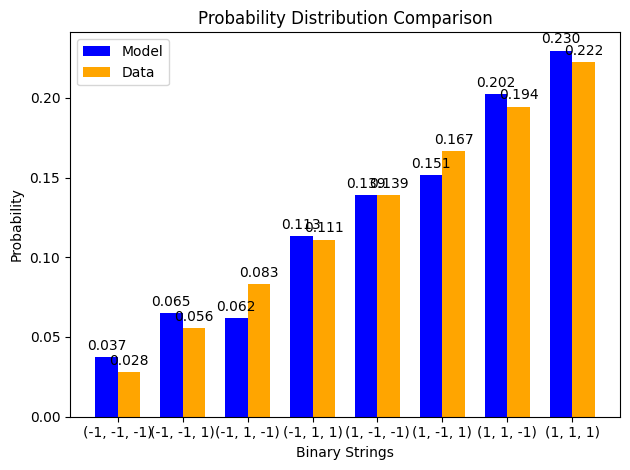

z gradient step for node 0: -2.561575844011732e-07
z gradient step for node 1: 7.306304175353134e-06
z gradient step for node 2: -7.2876788040565076e-06
z gradient step for node 3: -7.185431606237525e-07
edge graident step for edge (0, 3): 2.562290284622515e-06
edge graident step for edge (1, 3): 2.593056255431342e-05
edge graident step for edge (2, 3): -2.0230817650223025e-05
x positive phase: 0.0
x negative phase: -0.001161431900296034
x gradient step for node 0: 1.161431900296034e-06
x positive phase: 0.0
x negative phase: 0.00010991508286853047
x gradient step for node 1: -1.0991508286853048e-07
x positive phase: 0.0
x negative phase: 4.948071415799332e-05
x gradient step for node 2: -4.948071415799332e-08
x positive phase: -0.6606640173624961
x negative phase: -0.6596651204908385
x gradient step for node 3: -9.988968716576619e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

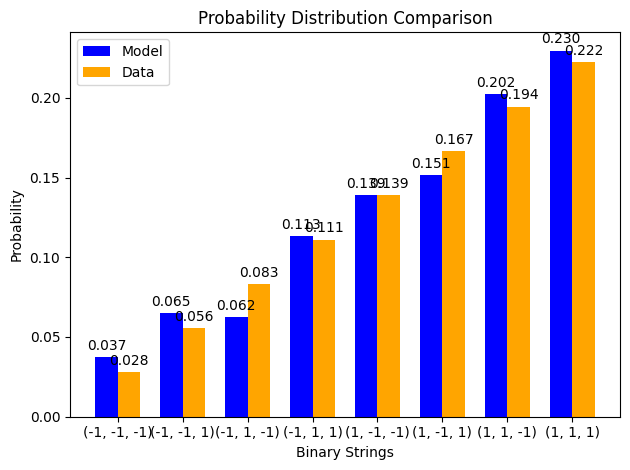

z gradient step for node 0: -2.1106979417928605e-07
z gradient step for node 1: 7.196988412632583e-06
z gradient step for node 2: -7.166475566590336e-06
z gradient step for node 3: -6.962055170950665e-07
edge graident step for edge (0, 3): 2.34314129055041e-06
edge graident step for edge (1, 3): 2.5528189190618917e-05
edge graident step for edge (2, 3): -2.0010099740950027e-05
x positive phase: 0.0
x negative phase: -0.0010640947368925542
x gradient step for node 0: 1.0640947368925543e-06
x positive phase: 0.0
x negative phase: 9.909842962247878e-05
x gradient step for node 1: -9.909842962247878e-08
x positive phase: 0.0
x negative phase: 4.4639584555895785e-05
x gradient step for node 2: -4.4639584555895787e-08
x positive phase: -0.6607917808154905
x negative phase: -0.6598514983726413
x gradient step for node 3: -9.402824428491608e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

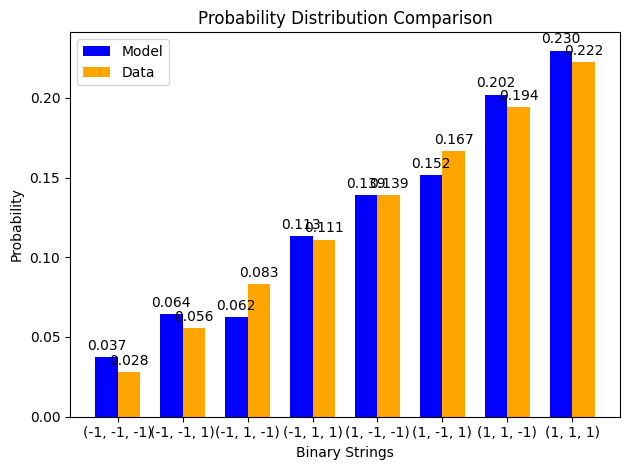

z gradient step for node 0: -1.6797136017521197e-07
z gradient step for node 1: 7.090865721980255e-06
z gradient step for node 2: -7.04773480770575e-06
z gradient step for node 3: -6.74390471457148e-07
edge graident step for edge (0, 3): 2.1309582118949065e-06
edge graident step for edge (1, 3): 2.5134362925777725e-05
edge graident step for edge (2, 3): -1.9791966858127842e-05
x positive phase: 0.0
x negative phase: -0.0009748990083655673
x gradient step for node 0: 9.748990083655673e-07
x positive phase: 0.0
x negative phase: 8.934720203427699e-05
x gradient step for node 1: -8.934720203427699e-08
x positive phase: 0.0
x negative phase: 4.027086671180838e-05
x gradient step for node 2: -4.027086671180838e-08
x positive phase: -0.660911571196906
x negative phase: -0.6600280097765527
x gradient step for node 3: -8.835614203532849e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

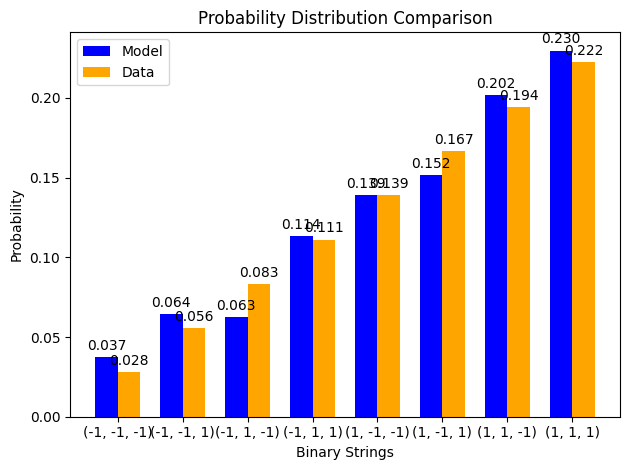

z gradient step for node 0: -1.2677217138512553e-07
z gradient step for node 1: 6.987769170713476e-06
z gradient step for node 2: -6.931422036935864e-06
z gradient step for node 3: -6.530931211421176e-07
edge graident step for edge (0, 3): 1.9255383580650822e-06
edge graident step for edge (1, 3): 2.474881368062759e-05
edge graident step for edge (2, 3): -1.9576329731591986e-05
x positive phase: 0.0
x negative phase: -0.0008931659551291136
x gradient step for node 0: 8.931659551291136e-07
x positive phase: 0.0
x negative phase: 8.055637920692602e-05
x gradient step for node 1: -8.055637920692603e-08
x positive phase: 0.0
x negative phase: 3.632860330094885e-05
x gradient step for node 2: -3.632860330094885e-08
x positive phase: -0.6610236402006955
x negative phase: -0.6601949702195944
x gradient step for node 3: -8.286699811010933e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

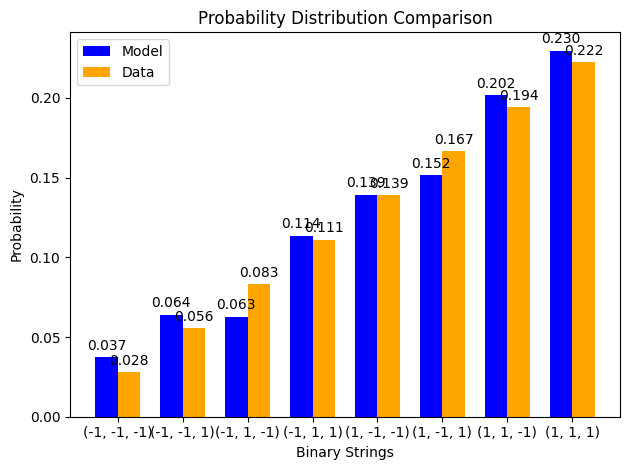

z gradient step for node 0: -8.738650005202242e-08
z gradient step for node 1: 6.887542893638382e-06
z gradient step for node 2: -6.817498652811227e-06
z gradient step for node 3: -6.323078331794408e-07
edge graident step for edge (0, 3): 1.7266858842336364e-06
edge graident step for edge (1, 3): 2.4371281507735306e-05
edge graident step for edge (2, 3): -1.936310519961368e-05
x positive phase: 0.0
x negative phase: -0.0008182731237393409
x gradient step for node 0: 8.18273123739341e-07
x positive phase: 0.0
x negative phase: 7.263129732089287e-05
x gradient step for node 1: -7.263129732089288e-08
x positive phase: 0.0
x negative phase: 3.277129153636069e-05
x gradient step for node 2: -3.277129153636069e-08
x positive phase: -0.6611282316466485
x negative phase: -0.6603526845493004
x gradient step for node 3: -7.755470973480616e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

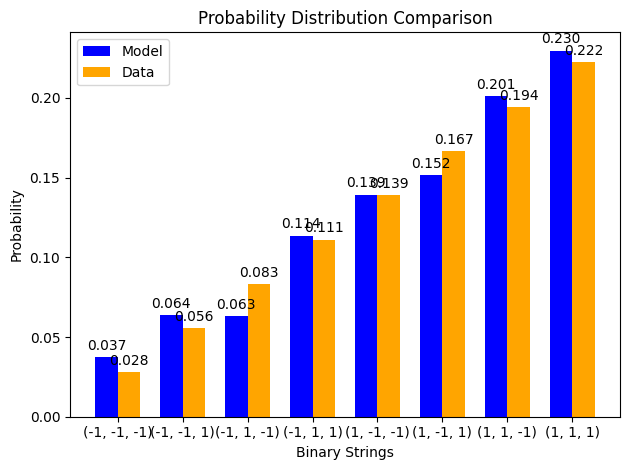

z gradient step for node 0: -4.9732791887024955e-08
z gradient step for node 1: 6.790041242925426e-06
z gradient step for node 2: -6.70592271253341e-06
z gradient step for node 3: -6.120283555891282e-07
edge graident step for edge (0, 3): 1.5342114750160897e-06
edge graident step for edge (1, 3): 2.4001516221590024e-05
edge graident step for edge (2, 3): -1.915221574309922e-05
x positive phase: 0.0
x negative phase: -0.0007496497312371591
x gradient step for node 0: 7.49649731237159e-07
x positive phase: 0.0
x negative phase: 6.548662813780359e-05
x gradient step for node 1: -6.548662813780359e-08
x positive phase: 0.0
x negative phase: 2.9561453273552576e-05
x gradient step for node 2: -2.9561453273552577e-08
x positive phase: -0.661225581796108
x negative phase: -0.660501447418706
x gradient step for node 3: -7.241343774020415e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

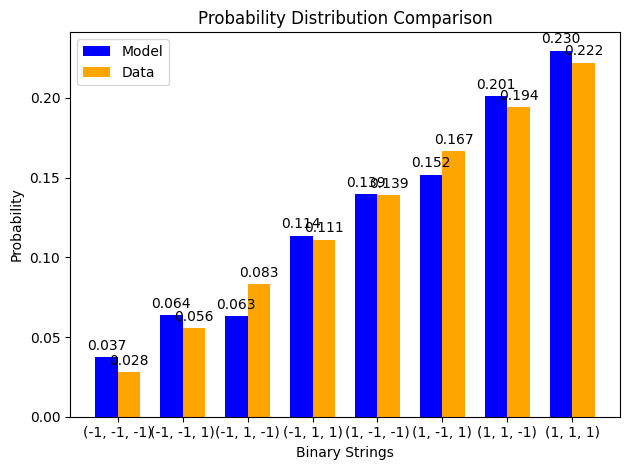

z gradient step for node 0: -1.3733465757448383e-08
z gradient step for node 1: 6.69512800976943e-06
z gradient step for node 2: -6.596649605032867e-06
z gradient step for node 3: -5.922479153541161e-07
edge graident step for edge (0, 3): 1.3479320465933365e-06
edge graident step for edge (1, 3): 2.363927703988682e-05
edge graident step for edge (2, 3): -1.894358906146998e-05
x positive phase: 0.0
x negative phase: -0.0006867724068203695
x gradient step for node 0: 6.867724068203695e-07
x positive phase: 0.0
x negative phase: 5.904545820255075e-05
x gradient step for node 1: -5.9045458202550754e-08
x positive phase: 0.0
x negative phase: 2.6665246387622368e-05
x gradient step for node 2: -2.6665246387622367e-08
x positive phase: -0.6613159196502676
x negative phase: -0.6606415437333669
x gradient step for node 3: -6.743759169006714e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

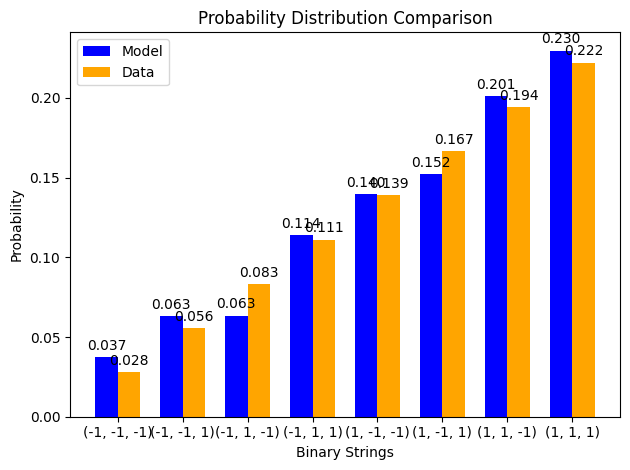

z gradient step for node 0: 2.0685277530907432e-08
z gradient step for node 1: 6.602675711576772e-06
z gradient step for node 2: -6.489632638329163e-06
z gradient step for node 3: -5.729593044994097e-07
edge graident step for edge (0, 3): 1.1676704661498506e-06
edge graident step for edge (1, 3): 2.328433223580127e-05
edge graident step for edge (2, 3): -1.873715768595169e-05
x positive phase: 0.0
x negative phase: -0.0006291612806630338
x gradient step for node 0: 6.291612806630338e-07
x positive phase: 0.0
x negative phase: 5.3238458830298335e-05
x gradient step for node 1: -5.323845883029833e-08
x positive phase: 0.0
x negative phase: 2.4052113485325442e-05
x gradient step for node 2: -2.4052113485325443e-08
x positive phase: -0.6613994672322118
x negative phase: -0.6607732490723403
x gradient step for node 3: -6.262181598715167e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

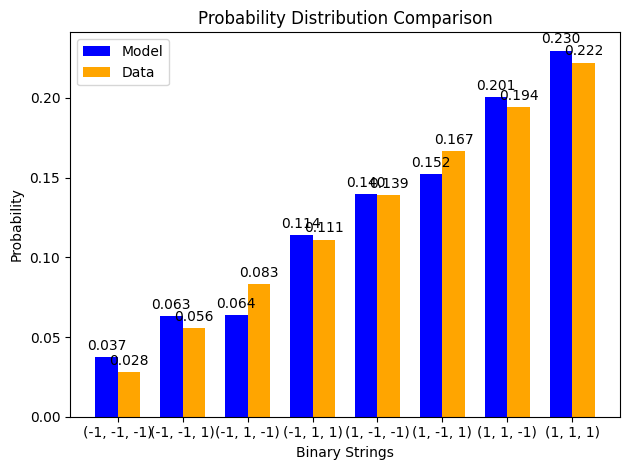

z gradient step for node 0: 5.359363772683423e-08
z gradient step for node 1: 6.512564938965543e-06
z gradient step for node 2: -6.384823550936683e-06
z gradient step for node 3: -5.54154955625552e-07
edge graident step for edge (0, 3): 9.932552875564494e-07
edge graident step for edge (1, 3): 2.2936458801134486e-05
edge graident step for edge (2, 3): -1.8532858626454484e-05
x positive phase: 0.0
x negative phase: -0.0005763763920477286
x gradient step for node 0: 5.763763920477285e-07
x positive phase: 0.0
x negative phase: 4.800313793833003e-05
x gradient step for node 1: -4.800313793833003e-08
x positive phase: 0.0
x negative phase: 2.1694464387329297e-05
x gradient step for node 2: -2.16944643873293e-08
x positive phase: -0.6614764398537827
x negative phase: -0.6608968300849193
x gradient step for node 3: -5.796097688633984e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

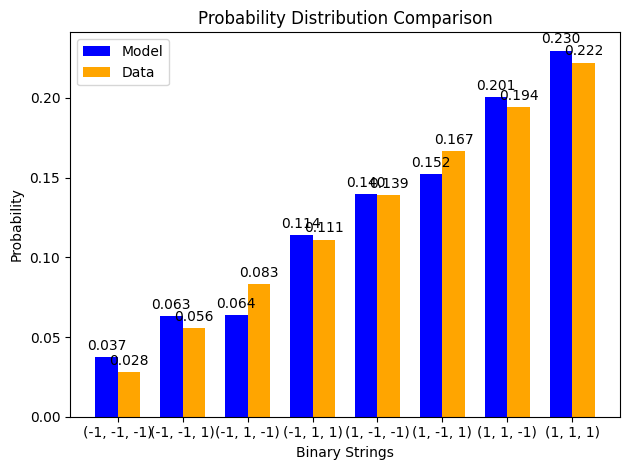

z gradient step for node 0: 8.505838927497233e-08
z gradient step for node 1: 6.424683757341981e-06
z gradient step for node 2: -6.282172955992968e-06
z gradient step for node 3: -5.358270081166073e-07
edge graident step for edge (0, 3): 8.245205022797686e-07
edge graident step for edge (1, 3): 2.2595442120180208e-05
edge graident step for edge (2, 3): -1.8330633048651903e-05
x positive phase: 0.0
x negative phase: -0.0005280143911501499
x gradient step for node 0: 5.280143911501499e-07
x positive phase: 0.0
x negative phase: 4.328316566097628e-05
x gradient step for node 1: -4.3283165660976285e-08
x positive phase: 0.0
x negative phase: 1.95673891537174e-05
x gradient step for node 2: -1.95673891537174e-08
x positive phase: -0.6615470463682711
x negative phase: -0.6610125448647776
x gradient step for node 3: -5.345015034935452e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

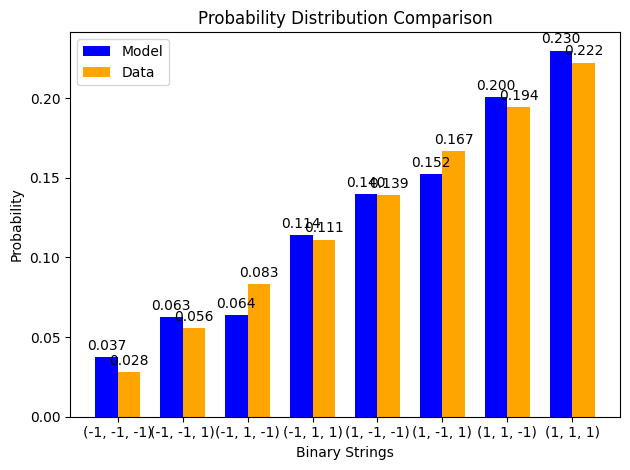

z gradient step for node 0: 1.1514304747128889e-07
z gradient step for node 1: 6.33892715828302e-06
z gradient step for node 2: -6.18163072583848e-06
z gradient step for node 3: -5.179673660975215e-07
edge graident step for edge (0, 3): 6.61305304568538e-07
edge graident step for edge (1, 3): 2.2261075654142702e-05
edge graident step for edge (2, 3): -1.8130425978224314e-05
x positive phase: 0.0
x negative phase: -0.0004837055108270331
x gradient step for node 0: 4.837055108270331e-07
x positive phase: 0.0
x negative phase: 3.902776647820745e-05
x gradient step for node 1: -3.9027766478207454e-08
x positive phase: 0.0
x negative phase: 1.76483987319074e-05
x gradient step for node 2: -1.76483987319074e-08
x positive phase: -0.6616114894098625
x negative phase: -0.6611206433030472
x gradient step for node 3: -4.908461068152681e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

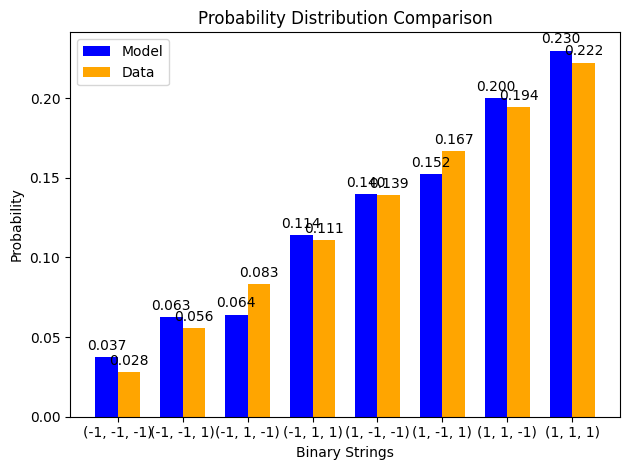

z gradient step for node 0: 1.4390802698321936e-07
z gradient step for node 1: 6.255196556351844e-06
z gradient step for node 2: -6.083146323933864e-06
z gradient step for node 3: -5.005677491095595e-07
edge graident step for edge (0, 3): 5.034538700082746e-07
edge graident step for edge (1, 3): 2.1933160635925722e-05
edge graident step for edge (2, 3): -1.793218602956756e-05
x positive phase: 0.0
x negative phase: -0.0004431107866186099
x gradient step for node 0: 4.431107866186099e-07
x positive phase: 0.0
x negative phase: 3.519117130325432e-05
x gradient step for node 1: -3.519117130325432e-08
x positive phase: 0.0
x negative phase: 1.591719058347463e-05
x gradient step for node 2: -1.591719058347463e-08
x positive phase: -0.6616699656206949
x negative phase: -0.661221367421752
x gradient step for node 3: -4.4859819894293995e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

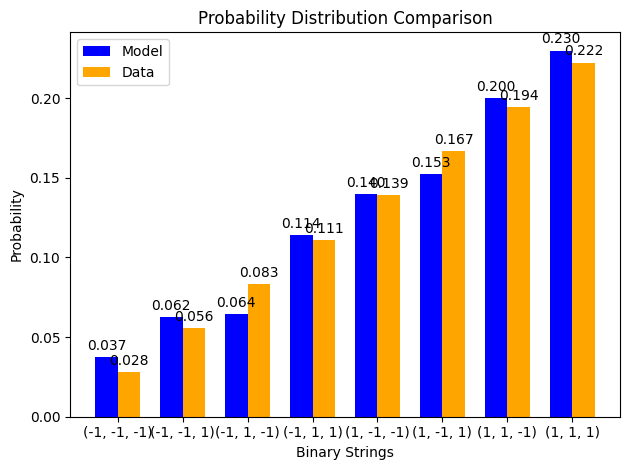

z gradient step for node 0: 1.7141079307714246e-07
z gradient step for node 1: 6.173399327368795e-06
z gradient step for node 2: -5.9866690902393996e-06
z gradient step for node 3: -4.836197363531914e-07
edge graident step for edge (0, 3): 3.5081514660290083e-07
edge graident step for edge (1, 3): 2.161150577509044e-05
edge graident step for edge (2, 3): -1.7735865156555007e-05
x positive phase: 0.0
x negative phase: -0.00040591950489638124
x gradient step for node 0: 4.0591950489638127e-07
x positive phase: 0.0
x negative phase: 3.1732123619356946e-05
x gradient step for node 1: -3.173212361935695e-08
x positive phase: 0.0
x negative phase: 1.4355436897597138e-05
x gradient step for node 2: -1.4355436897597138e-08
x positive phase: -0.6617226658663277
x negative phase: -0.6613149516889014
x gradient step for node 3: -4.077141774262438e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -

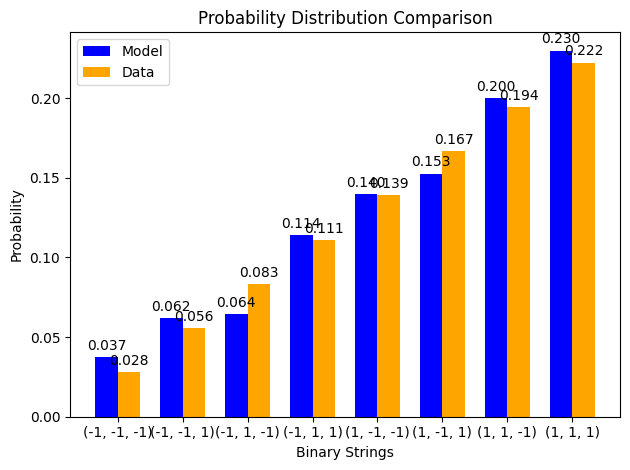

z gradient step for node 0: 1.9770600588531196e-07
z gradient step for node 1: 6.093448384505346e-06
z gradient step for node 2: -5.892148485508508e-06
z gradient step for node 3: -4.671148052652341e-07
edge graident step for edge (0, 3): 2.0324265758481231e-07
edge graident step for edge (1, 3): 2.1295926972770704e-05
edge graident step for edge (2, 3): -1.75414184232007e-05
x positive phase: 0.0
x negative phase: -0.0003718468606757029
x gradient step for node 0: 3.7184686067570293e-07
x positive phase: 0.0
x negative phase: 2.8613434337273276e-05
x gradient step for node 1: -2.8613434337273275e-08
x positive phase: 0.0
x negative phase: 1.2946593226392813e-05
x gradient step for node 2: -1.2946593226392813e-08
x positive phase: -0.6617697754403621
x negative phase: -0.6614016233164617
x gradient step for node 3: -3.681521239004004e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

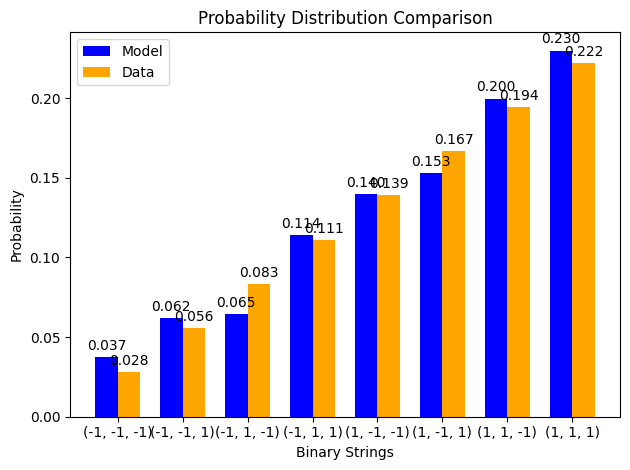

z gradient step for node 0: 2.2284565802088708e-07
z gradient step for node 1: 6.015261788879261e-06
z gradient step for node 2: -5.7995342993417136e-06
z gradient step for node 3: -4.5104436510207123e-07
edge graident step for edge (0, 3): 6.059431521165948e-08
edge graident step for edge (1, 3): 2.098624704632933e-05
edge graident step for edge (2, 3): -1.734880379230512e-05
x positive phase: 0.0
x negative phase: -0.0003406318080799134
x gradient step for node 0: 3.406318080799134e-07
x positive phase: 0.0
x negative phase: 2.5801580569663934e-05
x gradient step for node 1: -2.5801580569663936e-08
x positive phase: 0.0
x negative phase: 1.1675725583509216e-05
x gradient step for node 2: -1.1675725583509216e-08
x positive phase: -0.6618114742588999
x negative phase: -0.6614816025423225
x gradient step for node 3: -3.298717165773901e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

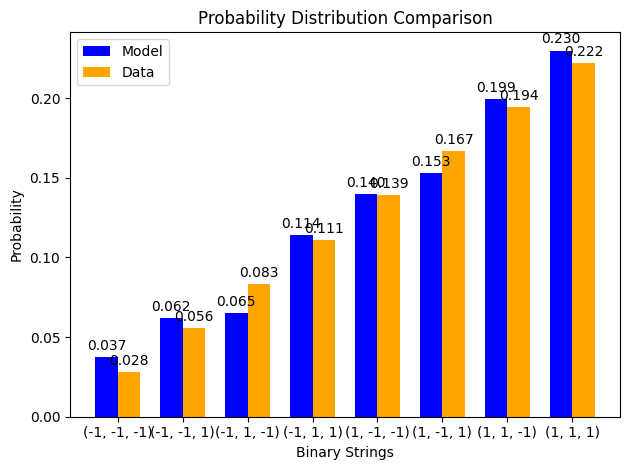

z gradient step for node 0: 2.468792058448743e-07
z gradient step for node 1: 5.938762391638597e-06
z gradient step for node 2: -5.70877682632144e-06
z gradient step for node 3: -4.3539978612766593e-07
edge graident step for edge (0, 3): -7.726775515154438e-08
edge graident step for edge (1, 3): 2.0682295463524028e-05
edge graident step for edge (2, 3): -1.7157981930359765e-05
x positive phase: 0.0
x negative phase: -0.0003120350877971644
x gradient step for node 0: 3.120350877971644e-07
x positive phase: 0.0
x negative phase: 2.3266343991474225e-05
x gradient step for node 1: -2.3266343991474225e-08
x positive phase: 0.0
x negative phase: 1.0529354233955793e-05
x gradient step for node 2: -1.0529354233955792e-08
x positive phase: -0.6618479370454796
x negative phase: -0.6615551028973079
x gradient step for node 3: -2.9283414817171673e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

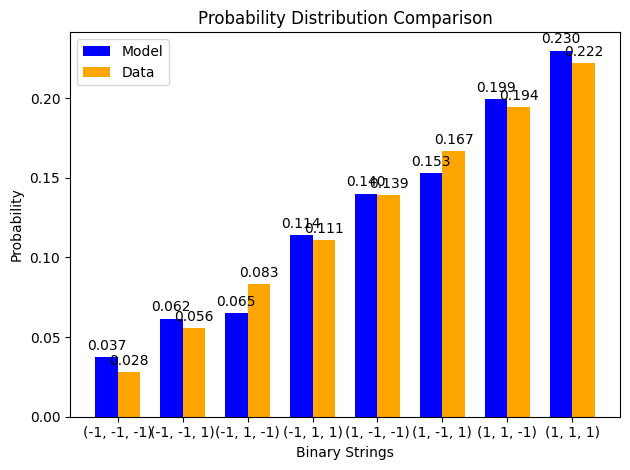

z gradient step for node 0: 2.6985369466453467e-07
z gradient step for node 1: 5.863877504774989e-06
z gradient step for node 2: -5.6198270140466325e-06
z gradient step for node 3: -4.2017242493772036e-07
edge graident step for edge (0, 3): -2.1047738131280137e-07
edge graident step for edge (1, 3): 2.0383908085951626e-05
edge graident step for edge (2, 3): -1.6968916027187254e-05
x positive phase: 0.0
x negative phase: -0.0002858374171209909
x gradient step for node 0: 2.858374171209909e-07
x positive phase: 0.0
x negative phase: 2.098048488199e-05
x gradient step for node 1: -2.098048488199e-08
x positive phase: 0.0
x negative phase: 9.495312572156302e-06
x gradient step for node 2: -9.495312572156302e-09
x positive phase: -0.6618793335070825
x negative phase: -0.6616223314581935
x gradient step for node 3: -2.5700204888901016e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

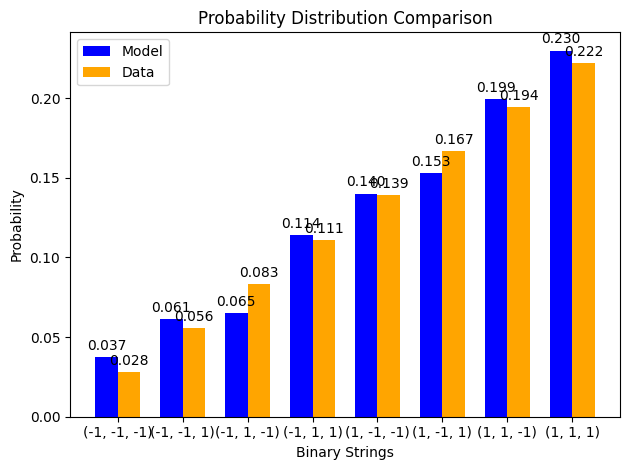

z gradient step for node 0: 2.9181387814819493e-07
z gradient step for node 1: 5.790538598163641e-06
z gradient step for node 2: -5.5326365864826476e-06
z gradient step for node 3: -4.053536463892449e-07
edge graident step for edge (0, 3): -3.391645015139444e-07
edge graident step for edge (1, 3): 2.0090926921533817e-05
edge graident step for edge (2, 3): -1.678157162893426e-05
x positive phase: 0.0
x negative phase: -0.00026183782931858164
x gradient step for node 0: 2.6183782931858167e-07
x positive phase: 0.0
x negative phase: 1.8919448328889326e-05
x gradient step for node 1: -1.8919448328889327e-08
x positive phase: 0.0
x negative phase: 8.562619638196143e-06
x gradient step for node 2: -8.562619638196143e-09
x positive phase: -0.6619058285017626
x negative phase: -0.6616834890876224
x gradient step for node 3: -2.2233941414018243e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -

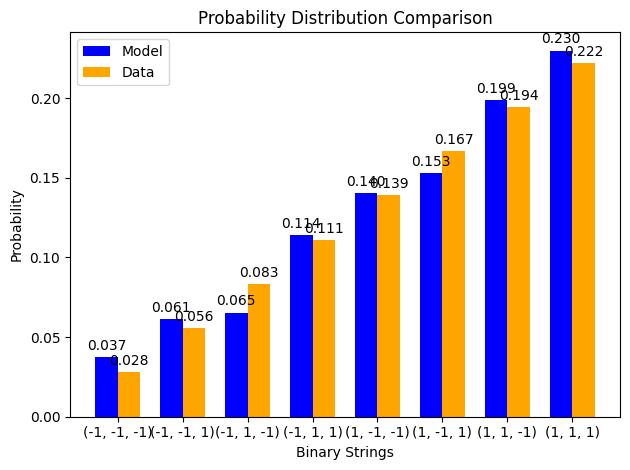

z gradient step for node 0: 3.1280233219299623e-07
z gradient step for node 1: 5.7186810205376586e-06
z gradient step for node 2: -5.447158145643311e-06
z gradient step for node 3: -3.909348425447934e-07
edge graident step for edge (0, 3): -4.634553132320529e-07
edge graident step for edge (1, 3): 1.9803199885804326e-05
edge graident step for edge (2, 3): -1.6595916483197028e-05
x positive phase: 0.0
x negative phase: -0.00023985215013388488
x gradient step for node 0: 2.3985215013388487e-07
x positive phase: 0.0
x negative phase: 1.7061099421449973e-05
x gradient step for node 1: -1.7061099421449973e-08
x positive phase: 0.0
x negative phase: 7.721364960745415e-06
x gradient step for node 2: -7.721364960745415e-09
x positive phase: -0.6619275821984103
x negative phase: -0.6617387706617627
x gradient step for node 3: -1.888115366476262e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -

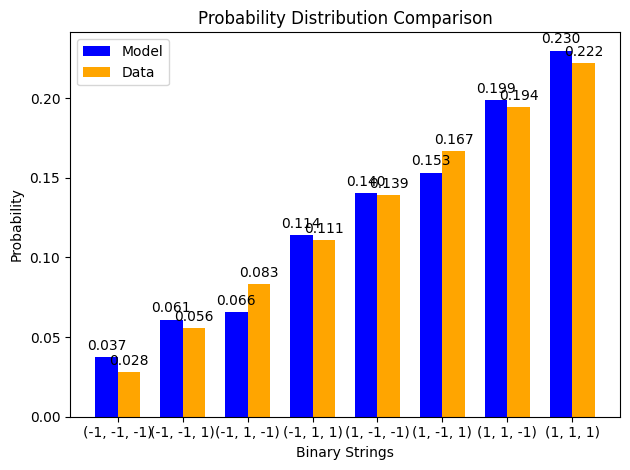

z gradient step for node 0: 3.328595635123111e-07
z gradient step for node 1: 5.648243742326447e-06
z gradient step for node 2: -5.3633452542909965e-06
z gradient step for node 3: -3.7690744900698015e-07
edge graident step for edge (0, 3): -5.83472414065922e-07
edge graident step for edge (1, 3): 1.952058057175432e-05
edge graident step for edge (2, 3): -1.6411920395179358e-05
x positive phase: 0.0
x negative phase: -0.00021971160021274765
x gradient step for node 0: 2.1971160021274766e-07
x positive phase: 0.0
x negative phase: 1.5385484572801904e-05
x gradient step for node 1: -1.5385484572801905e-08
x positive phase: 0.0
x negative phase: 6.962604540511575e-06
x gradient step for node 2: -6.962604540511575e-09
x positive phase: -0.6619447502291329
x negative phase: -0.6617883652864688
x gradient step for node 3: -1.5638494266412283e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

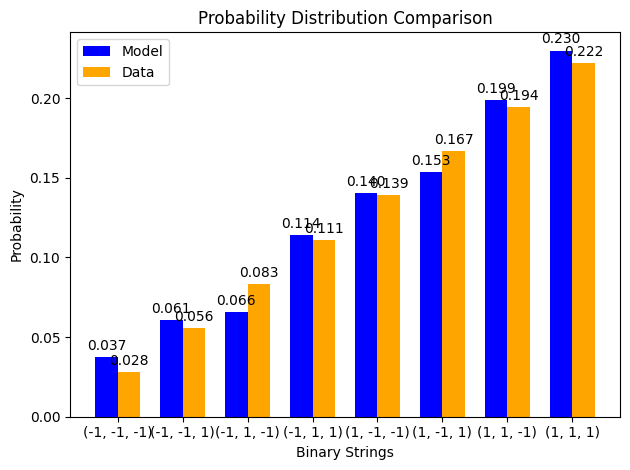

z gradient step for node 0: 3.5202411316392903e-07
z gradient step for node 1: 5.579169118455907e-06
z gradient step for node 2: -5.28115250203301e-06
z gradient step for node 3: -3.632629589562231e-07
edge graident step for edge (0, 3): -6.99334935195528e-07
edge graident step for edge (1, 3): 1.9242928027996473e-05
edge graident step for edge (2, 3): -1.6229555093897327e-05
x positive phase: 0.0
x negative phase: -0.0002012615131404825
x gradient step for node 0: 2.012615131404825e-07
x positive phase: 0.0
x negative phase: 1.3874616393079645e-05
x gradient step for node 1: -1.3874616393079645e-08
x positive phase: 0.0
x negative phase: 6.2782669015510955e-06
x gradient step for node 2: -6.278266901551096e-09
x positive phase: -0.6619574838346931
x negative phase: -0.6618324565026702
x gradient step for node 3: -1.2502733202290894e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

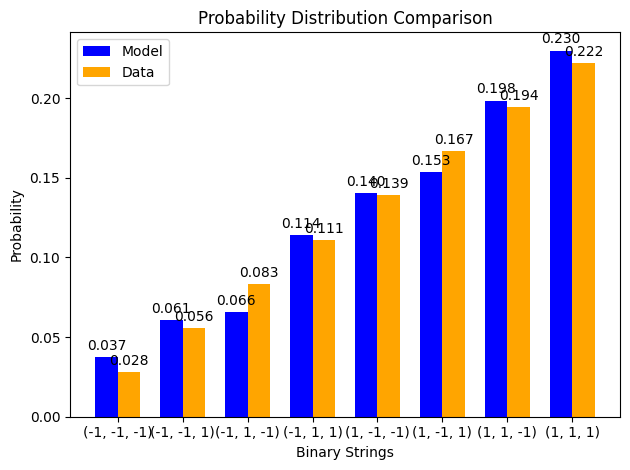

z gradient step for node 0: 3.7033265524283323e-07
z gradient step for node 1: 5.5114026693919295e-06
z gradient step for node 2: -5.200535556930133e-06
z gradient step for node 3: -3.499929351839237e-07
edge graident step for edge (0, 3): -8.111586678863913e-07
edge graident step for edge (1, 3): 1.8970106545004305e-05
edge graident step for edge (2, 3): -1.604879410754945e-05
x positive phase: 0.0
x negative phase: -0.00018436015961436646
x gradient step for node 0: 1.8436015961436646e-07
x positive phase: 0.0
x negative phase: 1.251227978954516e-05
x gradient step for node 1: -1.251227978954516e-08
x positive phase: 0.0
x negative phase: 5.661068240465489e-06
x gradient step for node 2: -5.66106824046549e-09
x positive phase: -0.6619659300034214
x negative phase: -0.6618712224816584
x gradient step for node 3: -9.470752176299336e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

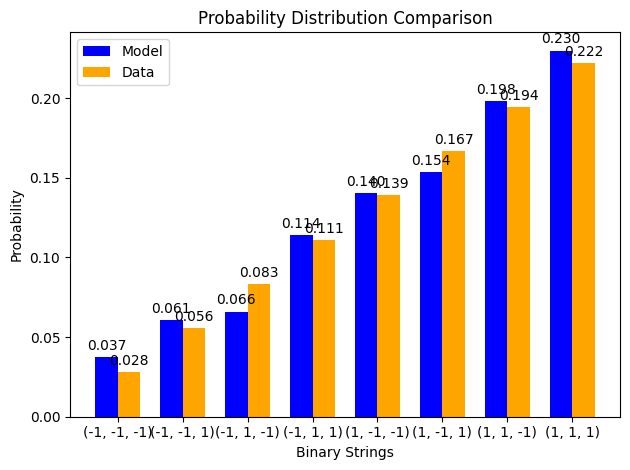

z gradient step for node 0: 3.878200909506191e-07
z gradient step for node 1: 5.444892878853996e-06
z gradient step for node 2: -5.121451204478655e-06
z gradient step for node 3: -3.3708902036577726e-07
edge graident step for edge (0, 3): -9.190561834686583e-07
edge graident step for edge (1, 3): 1.870198544918779e-05
edge graident step for edge (2, 3): -1.586961264726551e-05
x positive phase: 0.0
x negative phase: -0.0001688776690399859
x gradient step for node 0: 1.688776690399859e-07
x positive phase: 0.0
x negative phase: 1.1283857198941003e-05
x gradient step for node 1: -1.1283857198941003e-08
x positive phase: 0.0
x negative phase: 5.1044357964389905e-06
x gradient step for node 2: -5.1044357964389905e-09
x positive phase: -0.6619702316039904
x negative phase: -0.6619048362108877
x gradient step for node 3: -6.539539310268516e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

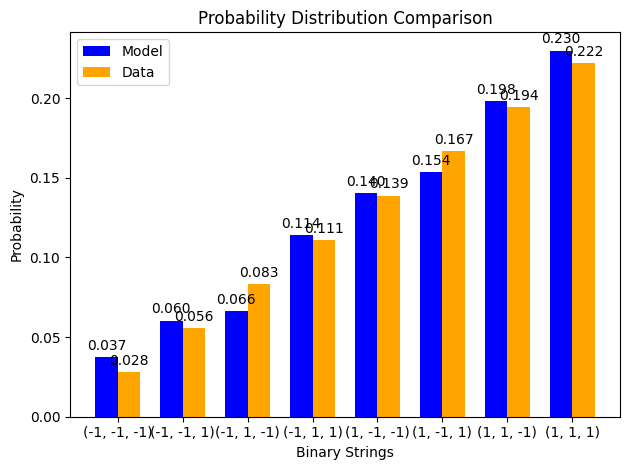

z gradient step for node 0: 4.045196382440053e-07
z gradient step for node 1: 5.379591006774487e-06
z gradient step for node 2: -5.043857375635119e-06
z gradient step for node 3: -3.2454294580114283e-07
edge graident step for edge (0, 3): -1.0231369471987439e-06
edge graident step for edge (1, 3): 1.8438438904566827e-05
edge graident step for edge (2, 3): -1.569198749851565e-05
x positive phase: 0.0
x negative phase: -0.00015469504054606224
x gradient step for node 0: 1.5469504054606225e-07
x positive phase: 0.0
x negative phase: 1.0176171063952543e-05
x gradient step for node 1: -1.0176171063952542e-08
x positive phase: 0.0
x negative phase: 4.602438649163268e-06
x gradient step for node 2: -4.602438649163268e-09
x positive phase: -0.6619705275124108
x negative phase: -0.661933465670875
x gradient step for node 3: -3.706184153584591e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

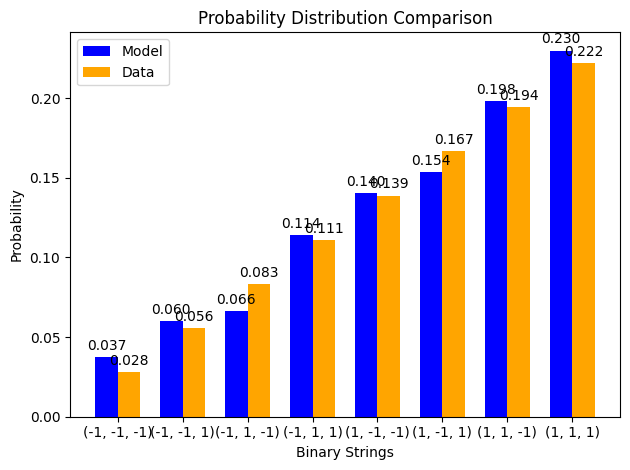

z gradient step for node 0: 4.204629172494534e-07
z gradient step for node 1: 5.315450916202669e-06
z gradient step for node 2: -4.967713165335689e-06
z gradient step for node 3: -3.1234653880748975e-07
edge graident step for edge (0, 3): -1.1235074263813981e-06
edge graident step for edge (1, 3): 1.8179345721805838e-05
edge graident step for edge (2, 3): -1.5515896919551535e-05
x positive phase: 0.0
x negative phase: -0.00014170323606206597
x gradient step for node 0: 1.4170323606206596e-07
x positive phase: 0.0
x negative phase: 9.177341851923504e-06
x gradient step for node 1: -9.177341851923503e-09
x positive phase: 0.0
x negative phase: 4.149725227774027e-06
x gradient step for node 2: -4.149725227774027e-09
x positive phase: -0.6619669527335856
x negative phase: -0.661957274003734
x gradient step for node 3: -9.678729851581026e-09
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

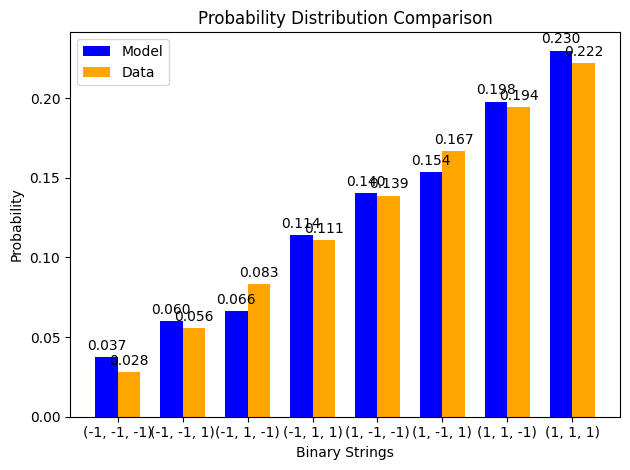

z gradient step for node 0: 4.356800316330789e-07
z gradient step for node 1: 5.252428912970092e-06
z gradient step for node 2: -4.892978842818807e-06
z gradient step for node 3: -3.004917289442244e-07
edge graident step for edge (0, 3): -1.220271193104694e-06
edge graident step for edge (1, 3): 1.792458917437795e-05
edge graident step for edge (2, 3): -1.534132054630047e-05
x positive phase: 0.0
x negative phase: -0.00012980234870086377
x gradient step for node 0: 1.2980234870086379e-07
x positive phase: 0.0
x negative phase: 8.276660081880492e-06
x gradient step for node 1: -8.276660081880492e-09
x positive phase: 0.0
x negative phase: 3.7414668827508443e-06
x gradient step for node 2: -3.741466882750844e-09
x positive phase: -0.6619596385177376
x negative phase: -0.6619764196738464
x gradient step for node 3: 1.678115610870279e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

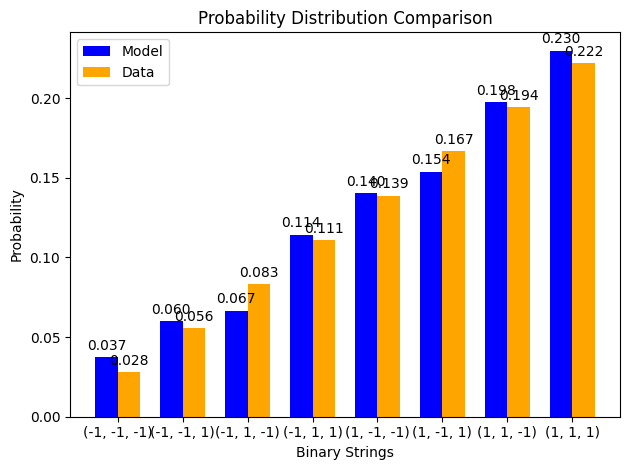

z gradient step for node 0: 4.5019964609366303e-07
z gradient step for node 1: 5.190483597039941e-06
z gradient step for node 2: -4.81961585489063e-06
z gradient step for node 3: -2.8897055321228104e-07
edge graident step for edge (0, 3): -1.3135290219200569e-06
edge graident step for edge (1, 3): 1.767405682163056e-05
edge graident step for edge (2, 3): -1.5168239303198438e-05
x positive phase: 0.0
x negative phase: -0.00011890084023885079
x gradient step for node 0: 1.1890084023885079e-07
x positive phase: 0.0
x negative phase: 7.464470977284551e-06
x gradient step for node 1: -7.464470977284551e-09
x positive phase: 0.0
x negative phase: 3.3733069349922105e-06
x gradient step for node 2: -3.3733069349922108e-09
x positive phase: -0.6619487124720043
x negative phase: -0.6619910566211451
x gradient step for node 3: 4.234414914083828e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

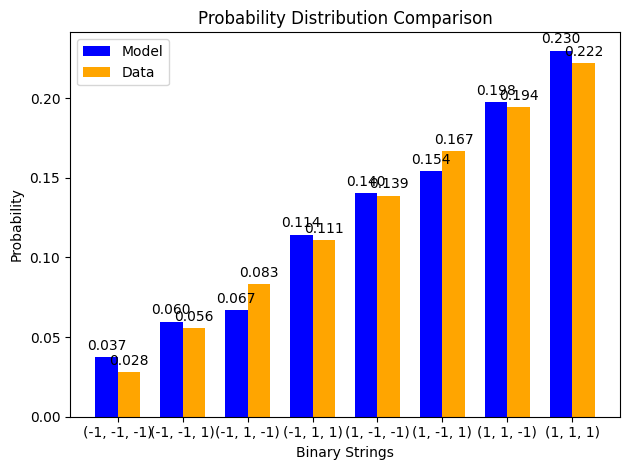

z gradient step for node 0: 4.640490601504066e-07
z gradient step for node 1: 5.129575724565877e-06
z gradient step for node 2: -4.74758682314684e-06
z gradient step for node 3: -2.7777516036264774e-07
edge graident step for edge (0, 3): -1.4033789827753718e-06
edge graident step for edge (1, 3): 1.7427640338524258e-05
edge graident step for edge (2, 3): -1.4996635319498214e-05
x positive phase: 0.0
x negative phase: -0.00010891484199218518
x gradient step for node 0: 1.0891484199218518e-07
x positive phase: 0.0
x negative phase: 6.732070498367893e-06
x gradient step for node 1: -6.732070498367894e-09
x positive phase: 0.0
x negative phase: 3.0413146725931016e-06
x gradient step for node 2: -3.0413146725931017e-09
x positive phase: -0.6619342986674719
x negative phase: -0.662001334407438
x gradient step for node 3: 6.703573996613699e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

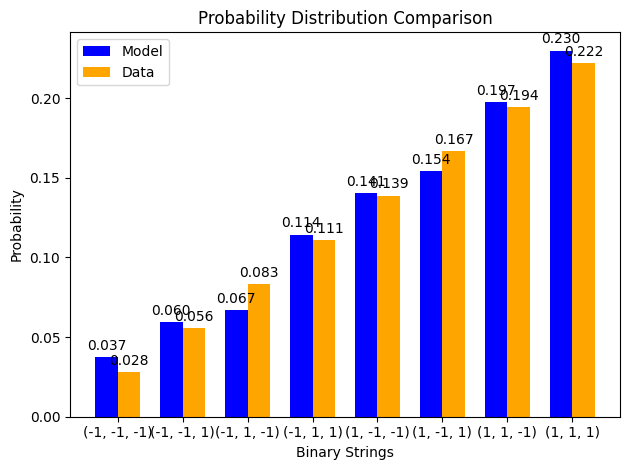

z gradient step for node 0: 4.772542783829104e-07
z gradient step for node 1: 5.0696680797599206e-06
z gradient step for node 2: -4.676855536042066e-06
z gradient step for node 3: -2.668978144269307e-07
edge graident step for edge (0, 3): -1.4899165294865457e-06
edge graident step for edge (1, 3): 1.7185235351830156e-05
edge graident step for edge (2, 3): -1.4826491850633047e-05
x positive phase: 0.0
x negative phase: -9.976751385331586e-05
x gradient step for node 0: 9.976751385331587e-08
x positive phase: 0.0
x negative phase: 6.071611630900742e-06
x gradient step for node 1: -6.071611630900742e-09
x positive phase: 0.0
x negative phase: 2.7419438167866e-06
x gradient step for node 2: -2.7419438167866004e-09
x positive phase: -0.6619165177419093
x negative phase: -0.6620073983561878
x gradient step for node 3: 9.088061427853234e-08
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

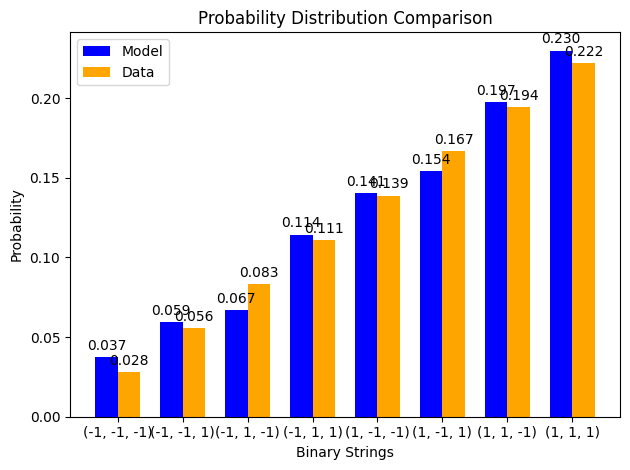

z gradient step for node 0: 4.898400772787026e-07
z gradient step for node 1: 5.01072535576777e-06
z gradient step for node 2: -4.60738693659557e-06
z gradient step for node 3: -2.5633089757276515e-07
edge graident step for edge (0, 3): -1.5732345840224205e-06
edge graident step for edge (1, 3): 1.6946741282562114e-05
edge graident step for edge (2, 3): -1.4657793204259127e-05
x positive phase: 0.0
x negative phase: -9.13884566801333e-05
x gradient step for node 0: 9.13884566801333e-08
x positive phase: 0.0
x negative phase: 5.476019919090198e-06
x gradient step for node 1: -5.476019919090198e-09
x positive phase: 0.0
x negative phase: 2.4719950245741998e-06
x gradient step for node 2: -2.4719950245742e-09
x positive phase: -0.6618954869984373
x negative phase: -0.6620093896861248
x gradient step for node 3: 1.1390268768751711e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

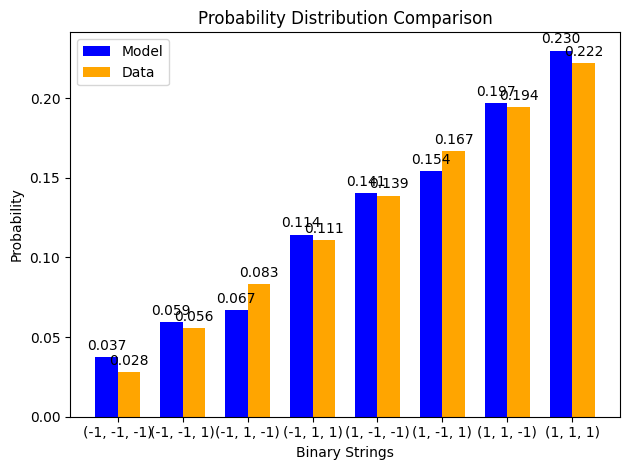

z gradient step for node 0: 5.01830068828979e-07
z gradient step for node 1: 4.952714043802847e-06
z gradient step for node 2: -4.539147106424612e-06
z gradient step for node 3: -2.460669123680592e-07
edge graident step for edge (0, 3): -1.6534236168497808e-06
edge graident step for edge (1, 3): 1.6712061194439146e-05
edge graident step for edge (2, 3): -1.449052467063318e-05
x positive phase: 0.0
x negative phase: -8.371317362372539e-05
x gradient step for node 0: 8.371317362372539e-08
x positive phase: 0.0
x negative phase: 4.938917330234979e-06
x gradient step for node 1: -4.938917330234979e-09
x positive phase: 0.0
x negative phase: 2.2285820372240513e-06
x gradient step for node 2: -2.2285820372240515e-09
x positive phase: -0.6618713205003617
x negative phase: -0.6620074456390523
x gradient step for node 3: 1.3612513869065701e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

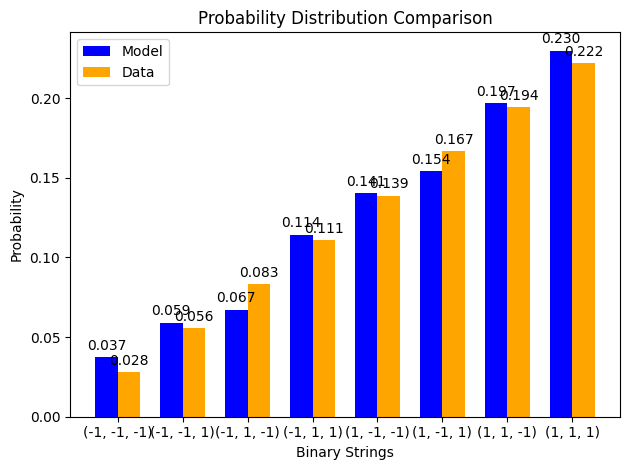

z gradient step for node 0: 5.132467610214908e-07
z gradient step for node 1: 4.8956023298740995e-06
z gradient step for node 2: -4.472103246711171e-06
z gradient step for node 3: -2.3609848353670083e-07
edge graident step for edge (0, 3): -1.7305717235771011e-06
edge graident step for edge (1, 3): 1.648110164816753e-05
edge graident step for edge (2, 3): -1.4324672457019808e-05
x positive phase: 0.0
x negative phase: -7.668257634259642e-05
x gradient step for node 0: 7.668257634259642e-08
x positive phase: 0.0
x negative phase: 4.45455362882353e-06
x gradient step for node 1: -4.45455362882353e-09
x positive phase: 0.0
x negative phase: 2.009101121481608e-06
x gradient step for node 2: -2.009101121481608e-09
x positive phase: -0.6618441291623772
x negative phase: -0.6620016996021761
x gradient step for node 3: 1.575704397989153e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

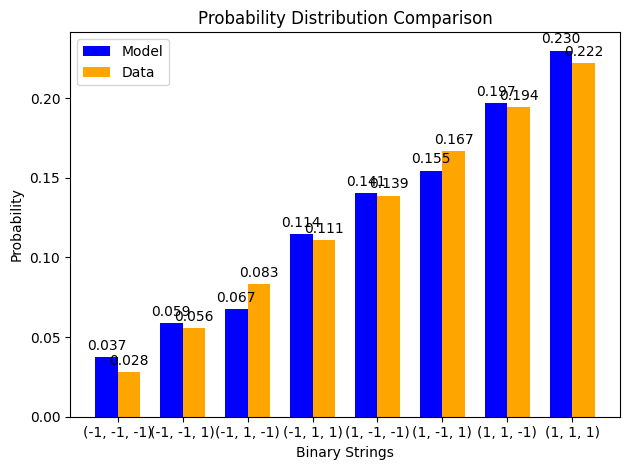

z gradient step for node 0: 5.241116153558711e-07
z gradient step for node 1: 4.839359998486975e-06
z gradient step for node 2: -4.406223656643393e-06
z gradient step for node 3: -2.264183592657898e-07
edge graident step for edge (0, 3): -1.8047646981133592e-06
edge graident step for edge (1, 3): 1.625377256134393e-05
edge graident step for edge (2, 3): -1.4160223625844611e-05
x positive phase: 0.0
x negative phase: -7.024253238381654e-05
x gradient step for node 0: 7.024253238381654e-08
x positive phase: 0.0
x negative phase: 4.017744518939856e-06
x gradient step for node 1: -4.0177445189398565e-09
x positive phase: 0.0
x negative phase: 1.811203484392212e-06
x gradient step for node 2: -1.8112034843922121e-09
x positive phase: -0.6618140208383403
x negative phase: -0.6619922812252703
x gradient step for node 3: 1.782603869300292e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

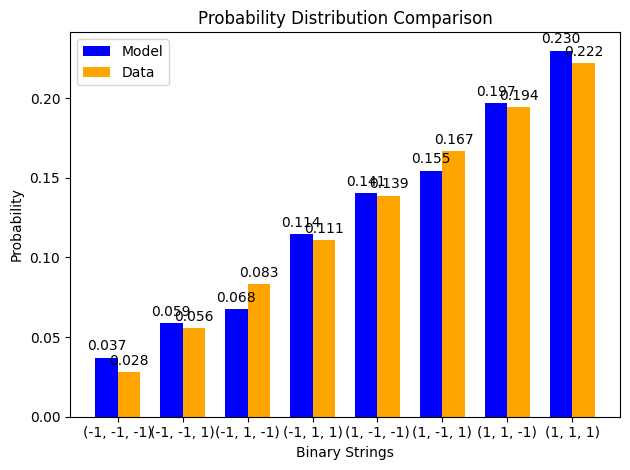

z gradient step for node 0: 5.344451015203977e-07
z gradient step for node 1: 4.7839583427654875e-06
z gradient step for node 2: -4.341477709790348e-06
z gradient step for node 3: -2.170194121302871e-07
edge graident step for edge (0, 3): -1.8760861025545195e-06
edge graident step for edge (1, 3): 1.6029987073779936e-05
edge graident step for edge (2, 3): -1.399716603634367e-05
x positive phase: 0.0
x negative phase: -6.4343450317232e-05
x gradient step for node 0: 6.4343450317232e-08
x positive phase: 0.0
x negative phase: 3.6238158870071325e-06
x gradient step for node 1: -3.6238158870071324e-09
x positive phase: 0.0
x negative phase: 1.6327703734240093e-06
x gradient step for node 2: -1.6327703734240092e-09
x positive phase: -0.6617811004057954
x negative phase: -0.6619793165329695
x gradient step for node 3: 1.982161271740779e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

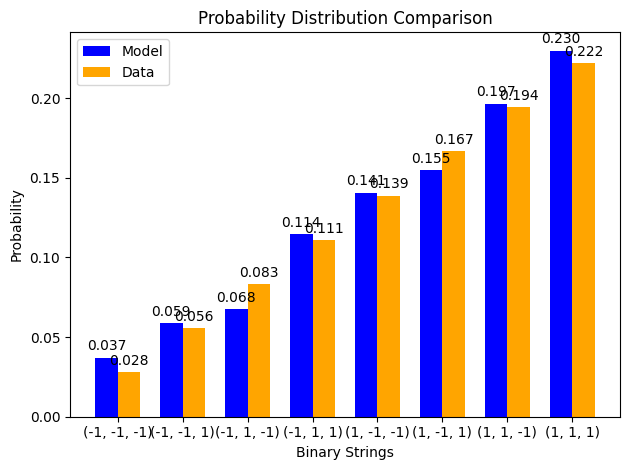

z gradient step for node 0: 5.442667493464892e-07
z gradient step for node 1: 4.7293700804833524e-06
z gradient step for node 2: -4.277835828831456e-06
z gradient step for node 3: -2.0789463967876843e-07
edge graident step for edge (0, 3): -1.944617333982601e-06
edge graident step for edge (1, 3): 1.580966141806185e-05
edge graident step for edge (2, 3): -1.3835488289472661e-05
x positive phase: 0.0
x negative phase: -5.893989948971978e-05
x gradient step for node 0: 5.893989948971978e-08
x positive phase: 0.0
x negative phase: 3.2685535428435836e-06
x gradient step for node 1: -3.268553542843584e-09
x positive phase: 0.0
x negative phase: 1.4718906014132773e-06
x gradient step for node 2: -1.4718906014132773e-09
x positive phase: -0.6617454698474257
x negative phase: -0.6619629280324628
x gradient step for node 3: 2.1745818503715597e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

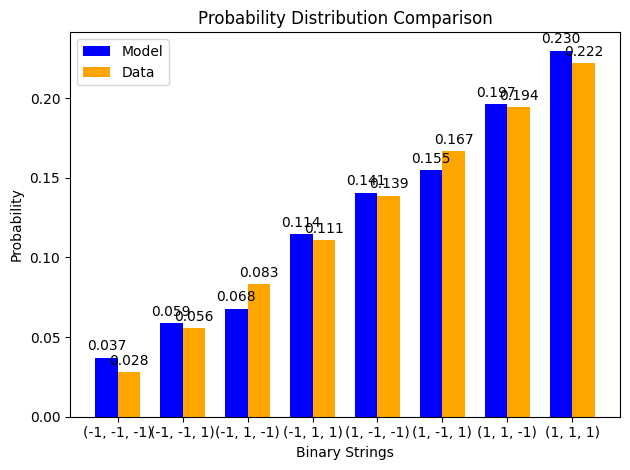

z gradient step for node 0: 5.535951981643917e-07
z gradient step for node 1: 4.6755692755368895e-06
z gradient step for node 2: -4.215269458986495e-06
z gradient step for node 3: -1.9903716473132493e-07
edge graident step for edge (0, 3): -2.0104376883637864e-06
edge graident step for edge (1, 3): 1.5592714795157254e-05
edge graident step for edge (2, 3): -1.3675179675874033e-05
x positive phase: 0.0
x negative phase: -5.399026152449423e-05
x gradient step for node 0: 5.399026152449423e-08
x positive phase: 0.0
x negative phase: 2.948157916440164e-06
x gradient step for node 1: -2.948157916440164e-09
x positive phase: 0.0
x negative phase: 1.3268402610147502e-06
x gradient step for node 2: -1.3268402610147503e-09
x positive phase: -0.6617072283295922
x negative phase: -0.6619432348168428
x gradient step for node 3: 2.3600648725063956e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

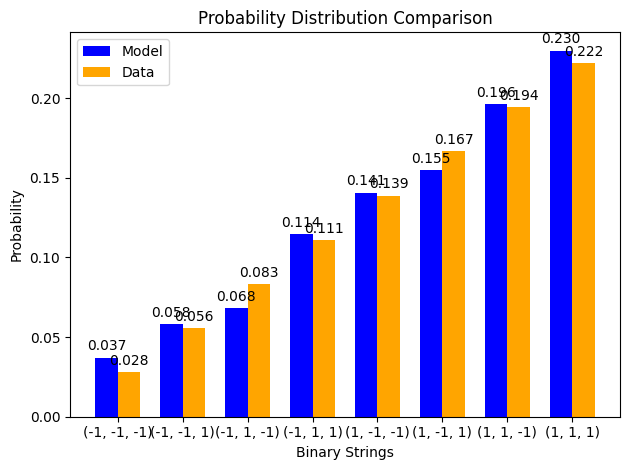

z gradient step for node 0: 5.624482436746292e-07
z gradient step for node 1: 4.622531264443369e-06
z gradient step for node 2: -4.153751040468945e-06
z gradient step for node 3: -1.9044023542366672e-07
edge graident step for edge (0, 3): -2.0736244217113843e-06
edge graident step for edge (1, 3): 1.5379069254884928e-05
edge graident step for edge (2, 3): -1.3516230126702014e-05
x positive phase: 0.0
x negative phase: -4.9456410927485164e-05
x gradient step for node 0: 4.9456410927485164e-08
x positive phase: 0.0
x negative phase: 2.6592032214373913e-06
x gradient step for node 1: -2.6592032214373913e-09
x positive phase: 0.0
x negative phase: 1.1960644160818708e-06
x gradient step for node 2: -1.1960644160818708e-09
x positive phase: -0.6616664722781104
x negative phase: -0.6619203526643512
x gradient step for node 3: 2.5388038624085675e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1,

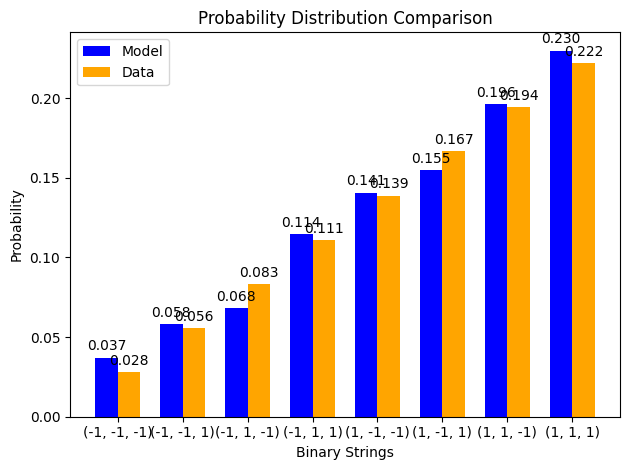

z gradient step for node 0: 5.708428824438561e-07
z gradient step for node 1: 4.5702325874714675e-06
z gradient step for node 2: -4.0932539802281955e-06
z gradient step for node 3: -1.820972250330677e-07
edge graident step for edge (0, 3): -2.1342528086713e-06
edge graident step for edge (1, 3): 1.516864958108119e-05
edge graident step for edge (2, 3): -1.3358630167137425e-05
x positive phase: 0.0
x negative phase: -4.530342238049432e-05
x gradient step for node 0: 4.530342238049432e-08
x positive phase: 0.0
x negative phase: 2.398600644557868e-06
x gradient step for node 1: -2.398600644557868e-09
x positive phase: 0.0
x negative phase: 1.0781605779571398e-06
x gradient step for node 2: -1.0781605779571398e-09
x positive phase: -0.6616232954514094
x negative phase: -0.6618943941337406
x gradient step for node 3: 2.710986823312167e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

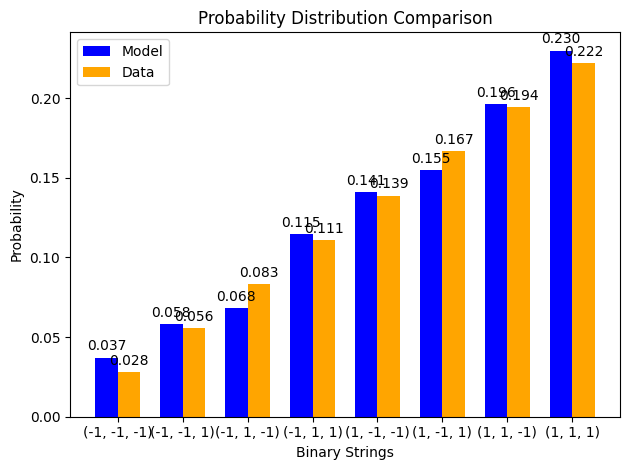

z gradient step for node 0: 5.787953541325774e-07
z gradient step for node 1: 4.518650924056067e-06
z gradient step for node 2: -4.033752623214898e-06
z gradient step for node 3: -1.7400163161526706e-07
edge graident step for edge (0, 3): -2.192396198680835e-06
edge graident step for edge (1, 3): 1.4961383181285551e-05
edge graident step for edge (2, 3): -1.3202370872428302e-05
x positive phase: 0.0
x negative phase: -4.149930250074532e-05
x gradient step for node 0: 4.149930250074532e-08
x positive phase: 0.0
x negative phase: 2.163565163763567e-06
x gradient step for node 1: -2.163565163763567e-09
x positive phase: 0.0
x negative phase: 9.71863793229969e-07
x gradient step for node 2: -9.71863793229969e-10
x positive phase: -0.6615777890112025
x negative phase: -0.6618654686559701
x gradient step for node 3: 2.876796447676133e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

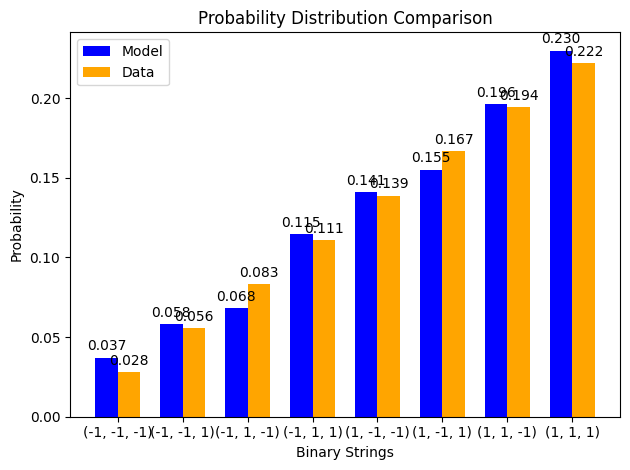

z gradient step for node 0: 5.863211815571035e-07
z gradient step for node 1: 4.467765032172583e-06
z gradient step for node 2: -3.975222223379343e-06
z gradient step for node 3: -1.6614707747725222e-07
edge graident step for edge (0, 3): -2.248126069836598e-06
edge graident step for edge (1, 3): 1.4757199980782106e-05
edge graident step for edge (2, 3): -1.304744382631183e-05
x positive phase: 0.0
x negative phase: -3.801474403000364e-05
x gradient step for node 0: 3.8014744030003645e-08
x positive phase: 0.0
x negative phase: 1.9515856371229705e-06
x gradient step for node 1: -1.9515856371229706e-09
x positive phase: 0.0
x negative phase: 8.760331863078234e-07
x gradient step for node 2: -8.760331863078234e-10
x positive phase: -0.6615300415907999
x negative phase: -0.6618336826224227
x gradient step for node 3: 3.0364103162283663e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

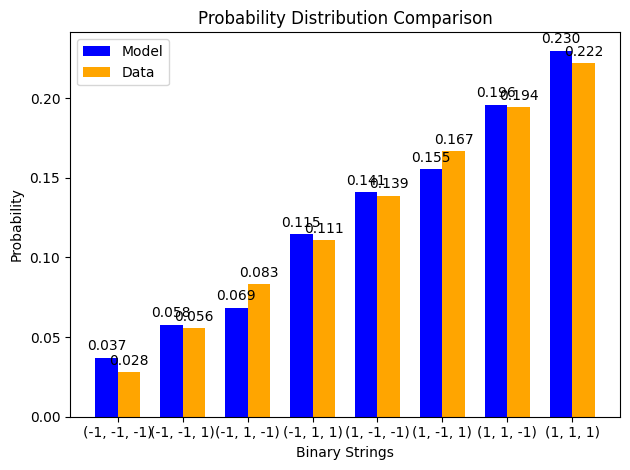

z gradient step for node 0: 5.93435208681048e-07
z gradient step for node 1: 4.4175546913793885e-06
z gradient step for node 2: -3.917638914568436e-06
z gradient step for node 3: -1.585273085084049e-07
edge graident step for edge (0, 3): -2.30151208060253e-06
edge graident step for edge (1, 3): 1.4556032320840295e-05
edge graident step for edge (2, 3): -1.2893841081684065e-05
x positive phase: 0.0
x negative phase: -3.4822900584972624e-05
x gradient step for node 0: 3.482290058497262e-08
x positive phase: 0.0
x negative phase: 1.760397839717046e-06
x gradient step for node 1: -1.760397839717046e-09
x positive phase: 0.0
x negative phase: 7.896398153173492e-07
x gradient step for node 2: -7.896398153173492e-10
x positive phase: -0.6614801393611766
x negative phase: -0.6617991394698383
x gradient step for node 3: 3.1900010866170447e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

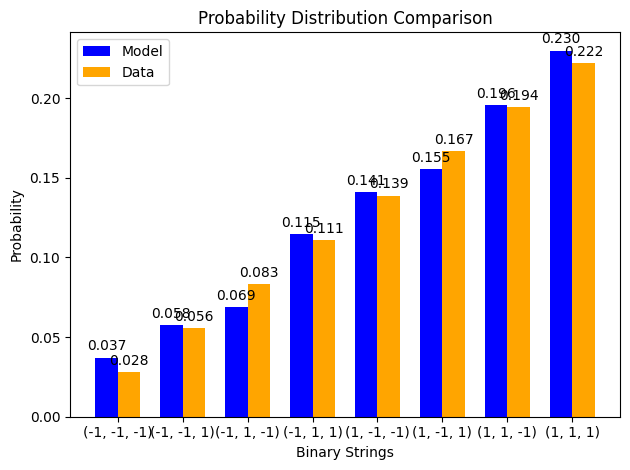

z gradient step for node 0: 6.001516366341831e-07
z gradient step for node 1: 4.368000649252801e-06
z gradient step for node 2: -3.860979681483662e-06
z gradient step for node 3: -1.5113619338799622e-07
edge graident step for edge (0, 3): -2.3526221194808407e-06
edge graident step for edge (1, 3): 1.435781486099899e-05
edge graident step for edge (2, 3): -1.2741555123388205e-05
x positive phase: 0.0
x negative phase: -3.1899180255384946e-05
x gradient step for node 0: 3.1899180255384944e-08
x positive phase: 0.0
x negative phase: 1.5879601577666056e-06
x gradient step for node 1: -1.5879601577666056e-09
x positive phase: 0.0
x negative phase: 7.117557135605063e-07
x gradient step for node 2: -7.117557135605064e-10
x positive phase: -0.661428166094907
x negative phase: -0.6617619397621278
x gradient step for node 3: 3.337736672208713e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

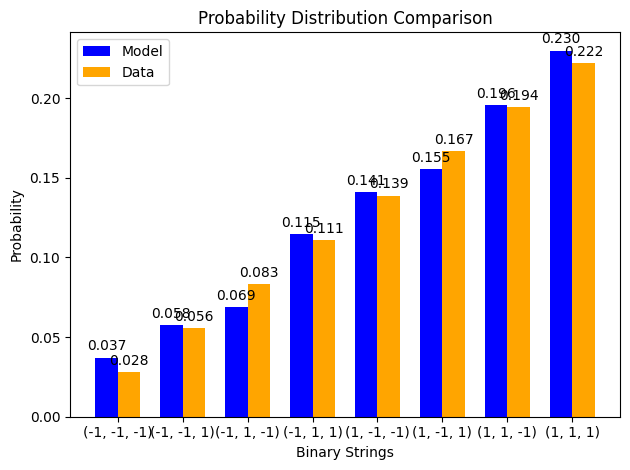

z gradient step for node 0: 6.064840578480224e-07
z gradient step for node 1: 4.319084570980014e-06
z gradient step for node 2: -3.8052223308158023e-06
z gradient step for node 3: -1.439677226878211e-07
edge graident step for edge (0, 3): -2.4015223527560912e-06
edge graident step for edge (1, 3): 1.4162484485241087e-05
edge graident step for edge (2, 3): -1.2590578833014246e-05
x positive phase: 0.0
x negative phase: -2.922105647822086e-05
x gradient step for node 0: 2.922105647822086e-08
x positive phase: 0.0
x negative phase: 1.4324316778718028e-06
x gradient step for node 1: -1.4324316778718029e-09
x positive phase: 0.0
x negative phase: 6.415440011367412e-07
x gradient step for node 2: -6.415440011367411e-10
x positive phase: -0.6613742032280692
x negative phase: -0.6617221812692362
x gradient step for node 3: 3.479780411670408e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

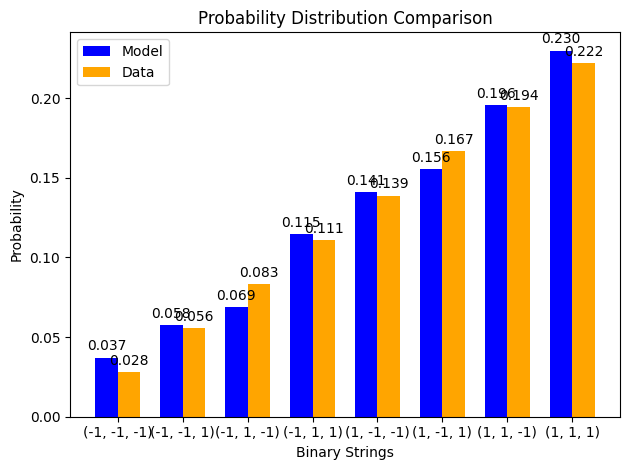

z gradient step for node 0: 6.124454883934538e-07
z gradient step for node 1: 4.270788991870528e-06
z gradient step for node 2: -3.7503454626751643e-06
z gradient step for node 3: -1.370160078825733e-07
edge graident step for edge (0, 3): -2.448277270426902e-06
edge graident step for edge (1, 3): 1.3969980211920071e-05
edge graident step for edge (2, 3): -1.244090545559927e-05
x positive phase: 0.0
x negative phase: -2.6767894746825804e-05
x gradient step for node 0: 2.6767894746825804e-08
x positive phase: 0.0
x negative phase: 1.2921524351276202e-06
x gradient step for node 1: -1.2921524351276202e-09
x positive phase: 0.0
x negative phase: 5.782499625328085e-07
x gradient step for node 2: -5.782499625328085e-10
x positive phase: -0.6613183299202177
x negative phase: -0.6616799590432045
x gradient step for node 3: 3.616291229868729e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

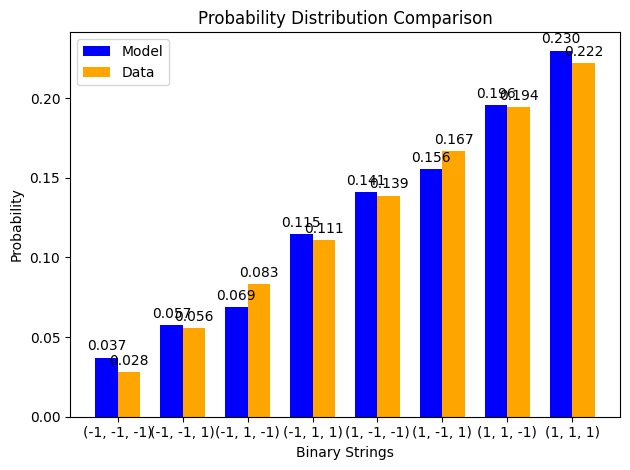

z gradient step for node 0: 6.180483986055752e-07
z gradient step for node 1: 4.223097272595261e-06
z gradient step for node 2: -3.6963284424044173e-06
z gradient step for node 3: -1.3027528027950709e-07
edge graident step for edge (0, 3): -2.492949730414584e-06
edge graident step for edge (1, 3): 1.3780243107291437e-05
edge graident step for edge (2, 3): -1.2292528568131941e-05
x positive phase: 0.0
x negative phase: -2.4520793833318303e-05
x gradient step for node 0: 2.4520793833318304e-08
x positive phase: 0.0
x negative phase: 1.1656256071973324e-06
x gradient step for node 1: -1.1656256071973323e-09
x positive phase: 0.0
x negative phase: 5.211929960917622e-07
x gradient step for node 2: -5.211929960917622e-10
x positive phase: -0.661260623112513
x negative phase: -0.6616353654915746
x gradient step for node 3: 3.7474237906165445e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

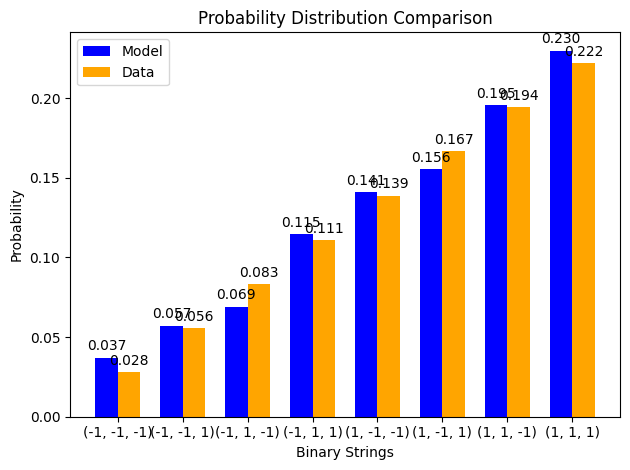

z gradient step for node 0: 6.233047420779459e-07
z gradient step for node 1: 4.175993556946866e-06
z gradient step for node 2: -3.643151372852288e-06
z gradient step for node 3: -1.2373988988162444e-07
edge graident step for edge (0, 3): -2.5356010011535756e-06
edge graident step for edge (1, 3): 1.3593216202522255e-05
edge graident step for edge (2, 3): -1.2145442049771707e-05
x positive phase: 0.0
x negative phase: -2.2462440312443596e-05
x gradient step for node 0: 2.2462440312443598e-08
x positive phase: 0.0
x negative phase: 1.051501462441251e-06
x gradient step for node 1: -1.0515014624412511e-09
x positive phase: 0.0
x negative phase: 4.697593504056916e-07
x gradient step for node 2: -4.697593504056916e-10
x positive phase: -0.6612011575840955
x negative phase: -0.6615884904482724
x gradient step for node 3: 3.873328641769147e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

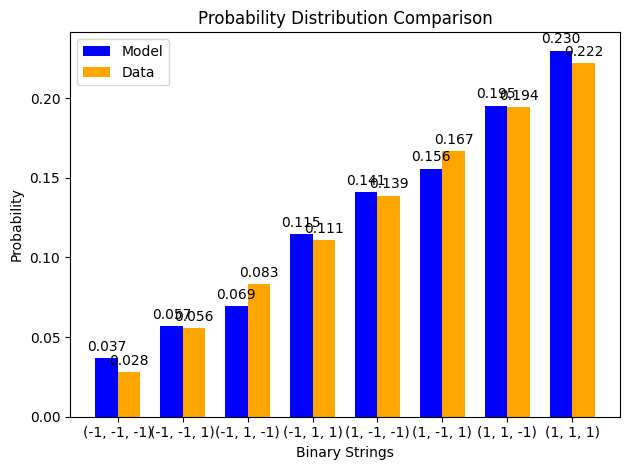

z gradient step for node 0: 6.282259831002502e-07
z gradient step for node 1: 4.129462731964934e-06
z gradient step for node 2: -3.590795067171443e-06
z gradient step for node 3: -1.1740430418924475e-07
edge graident step for edge (0, 3): -2.576290802644654e-06
edge graident step for edge (1, 3): 1.3408844414038182e-05
edge graident step for edge (2, 3): -1.1999640053695096e-05
x positive phase: 0.0
x negative phase: -2.057697527574518e-05
x gradient step for node 0: 2.0576975275745182e-08
x positive phase: 0.0
x negative phase: 9.485628891381501e-07
x gradient step for node 1: -9.485628891381501e-10
x positive phase: 0.0
x negative phase: 4.2339557092693443e-07
x gradient step for node 2: -4.2339557092693443e-10
x positive phase: -0.6611400060067842
x negative phase: -0.6615394212420931
x gradient step for node 3: 3.9941523530884207e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

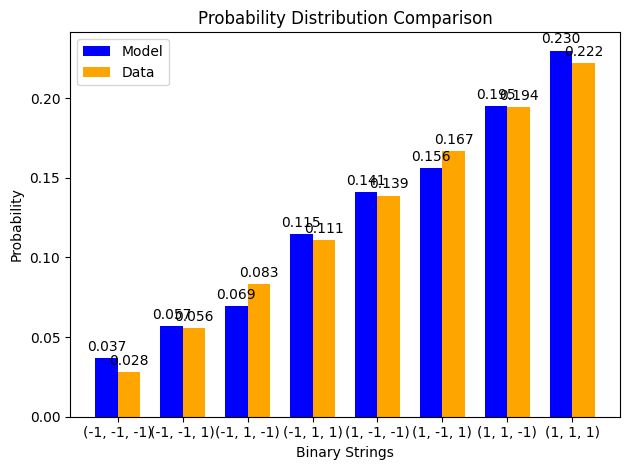

z gradient step for node 0: 6.32823122615811e-07
z gradient step for node 1: 4.083490390255601e-06
z gradient step for node 2: -3.5392410221943283e-06
z gradient step for node 3: -1.1126310695314113e-07
edge graident step for edge (0, 3): -2.6150773460560384e-06
edge graident step for edge (1, 3): 1.3227074467090511e-05
edge graident step for edge (2, 3): -1.1855116980493018e-05
x positive phase: 0.0
x negative phase: -1.8849872217329732e-05
x gradient step for node 0: 1.8849872217329734e-08
x positive phase: 0.0
x negative phase: 8.557123499064106e-07
x gradient step for node 1: -8.557123499064107e-10
x positive phase: 0.0
x negative phase: 3.8160258754466504e-07
x gradient step for node 2: -3.8160258754466507e-10
x positive phase: -0.6610772389981747
x negative phase: -0.6614882427629097
x gradient step for node 3: 4.1100376473501846e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -

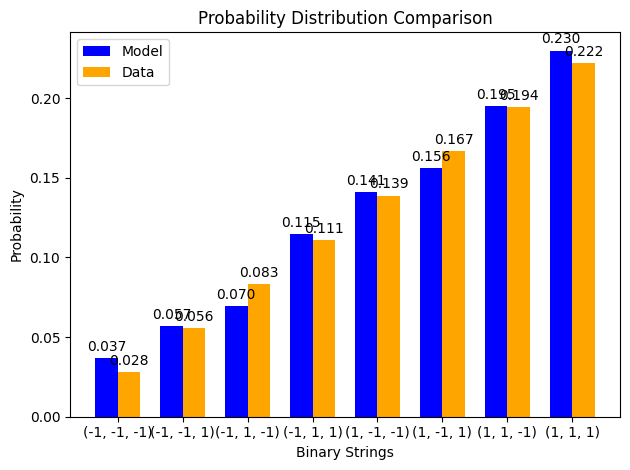

z gradient step for node 0: 6.371067227690097e-07
z gradient step for node 1: 4.038062794362168e-06
z gradient step for node 2: -3.4884713924247664e-06
z gradient step for node 3: -1.0531099688046442e-07
edge graident step for edge (0, 3): -2.6520173719501437e-06
edge graident step for edge (1, 3): 1.304785482241709e-05
edge graident step for edge (2, 3): -1.1711867453043937e-05
x positive phase: 0.0
x negative phase: -1.7267825157272354e-05
x gradient step for node 0: 1.7267825157272353e-08
x positive phase: 0.0
x negative phase: 7.719601208160232e-07
x gradient step for node 1: -7.719601208160232e-10
x positive phase: 0.0
x negative phase: 3.4393038060473545e-07
x gradient step for node 2: -3.4393038060473547e-10
x positive phase: -0.6610129251732093
x negative phase: -0.6614350375257158
x gradient step for node 3: 4.22112352506443e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

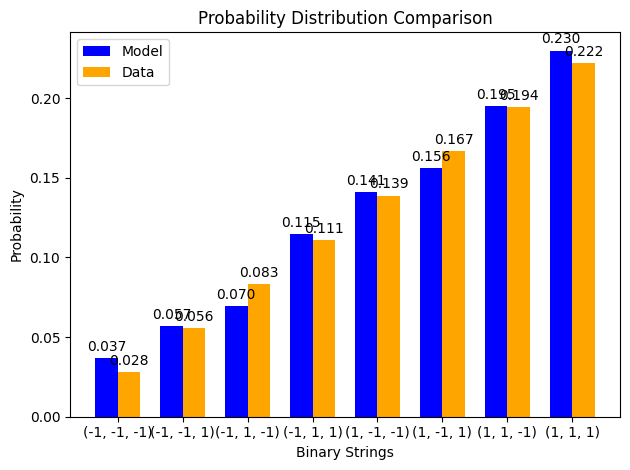

z gradient step for node 0: 6.410869301103351e-07
z gradient step for node 1: 3.993166843053953e-06
z gradient step for node 2: -3.438468964687039e-06
z gradient step for node 3: -9.954278630386338e-08
edge graident step for edge (0, 3): -2.68716618720527e-06
edge graident step for edge (1, 3): 1.2871135605877563e-05
edge graident step for edge (2, 3): -1.1569886292793583e-05
x positive phase: 0.0
x negative phase: -1.581864614647096e-05
x gradient step for node 0: 1.581864614647096e-08
x positive phase: 0.0
x negative phase: 6.964136885475156e-07
x gradient step for node 1: -6.964136885475157e-10
x positive phase: 0.0
x negative phase: 3.0997316892995066e-07
x gradient step for node 2: -3.0997316892995065e-10
x positive phase: -0.6609471311942832
x negative phase: -0.6613798857326068
x gradient step for node 3: 4.3275453832358755e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

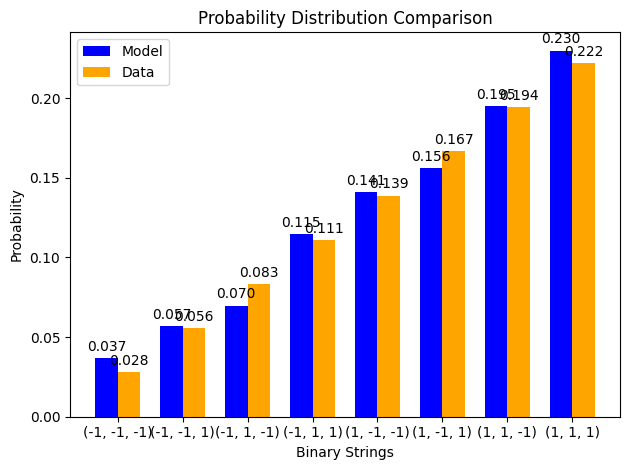

z gradient step for node 0: 6.447734975297825e-07
z gradient step for node 1: 3.948790039408373e-06
z gradient step for node 2: -3.3892171334453935e-06
z gradient step for node 3: -9.395339981910222e-08
edge graident step for edge (0, 3): -2.720577700708937e-06
edge graident step for edge (1, 3): 1.269686854095574e-05
edge graident step for edge (2, 3): -1.1429168497375978e-05
x positive phase: 0.0
x negative phase: -1.4491171368086263e-05
x gradient step for node 0: 1.4491171368086264e-08
x positive phase: 0.0
x negative phase: 6.28268191449735e-07
x gradient step for node 1: -6.28268191449735e-10
x positive phase: 0.0
x negative phase: 2.793650688883451e-07
x gradient step for node 2: -2.7936506888834515e-10
x positive phase: -0.6608799218199521
x negative phase: -0.6613228653327949
x gradient step for node 3: 4.429435128427972e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

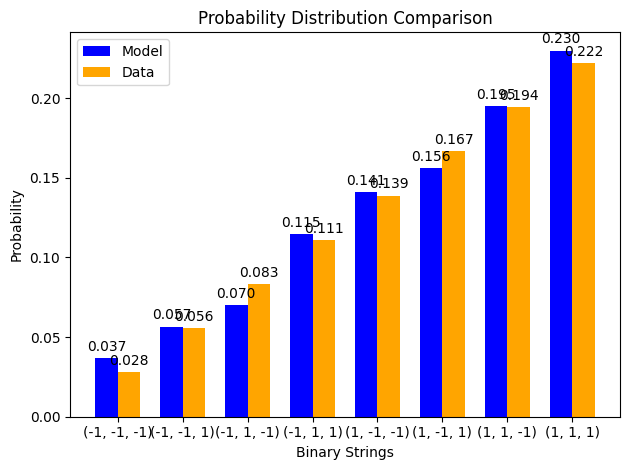

z gradient step for node 0: 6.481758049718956e-07
z gradient step for node 1: 3.904920460572281e-06
z gradient step for node 2: -3.3406998768258643e-06
z gradient step for node 3: -8.853787289211934e-08
edge graident step for edge (0, 3): -2.7523044578742217e-06
edge graident step for edge (1, 3): 1.2525006884011398e-05
edge graident step for edge (2, 3): -1.128970921951647e-05
x positive phase: 0.0
x negative phase: -1.3275175116123968e-05
x gradient step for node 0: 1.3275175116123968e-08
x positive phase: 0.0
x negative phase: 5.667978016104665e-07
x gradient step for node 1: -5.667978016104664e-10
x positive phase: 0.0
x negative phase: 2.5177617851532675e-07
x gradient step for node 2: -2.5177617851532674e-10
x positive phase: -0.660811359952301
x negative phase: -0.6612640520807604
x gradient step for node 3: 4.5269212845944206e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

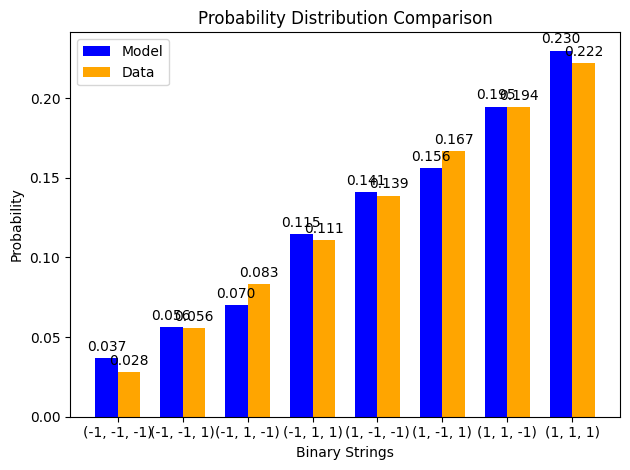

z gradient step for node 0: 6.513028790023912e-07
z gradient step for node 1: 3.8615467290970266e-06
z gradient step for node 2: -3.292901733344747e-06
z gradient step for node 3: -8.329135044268798e-08
edge graident step for edge (0, 3): -2.7823976740499746e-06
edge graident step for edge (1, 3): 1.2355505362183356e-05
edge graident step for edge (2, 3): -1.115150374715554e-05
x positive phase: 0.0
x negative phase: -1.216129099171364e-05
x gradient step for node 0: 1.216129099171364e-08
x positive phase: 0.0
x negative phase: 5.113479552039161e-07
x gradient step for node 1: -5.11347955203916e-10
x positive phase: 0.0
x negative phase: 2.2690904517308045e-07
x gradient step for node 2: -2.2690904517308047e-10
x positive phase: -0.6607415066830258
x negative phase: -0.6612035195926119
x gradient step for node 3: 4.620129095861403e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

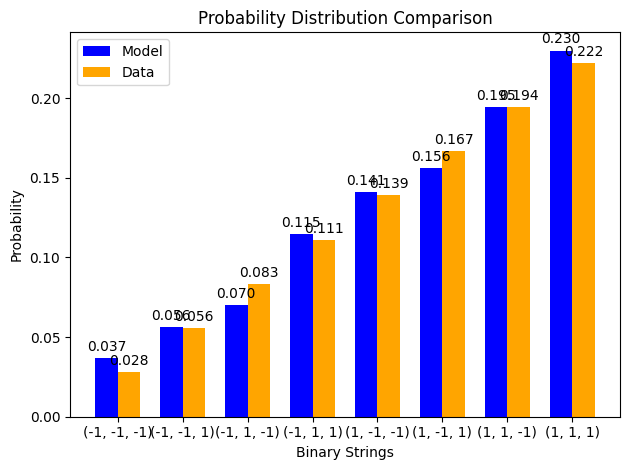

z gradient step for node 0: 6.54163411277997e-07
z gradient step for node 1: 3.818657985751983e-06
z gradient step for node 2: -3.245807779353377e-06
z gradient step for node 3: -7.820908540845385e-08
edge graident step for edge (0, 3): -2.81090726687494e-06
edge graident step for edge (1, 3): 1.2188320113834888e-05
edge graident step for edge (2, 3): -1.1014547484743093e-05
x positive phase: 0.0
x negative phase: -1.114093971266021e-05
x gradient step for node 0: 1.114093971266021e-08
x positive phase: 0.0
x negative phase: 4.613283475270615e-07
x gradient step for node 1: -4.613283475270615e-10
x positive phase: 0.0
x negative phase: 2.0449547927381166e-07
x gradient step for node 2: -2.0449547927381167e-10
x positive phase: -0.6606704213382844
x negative phase: -0.6611413394007499
x gradient step for node 3: 4.709180624655751e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

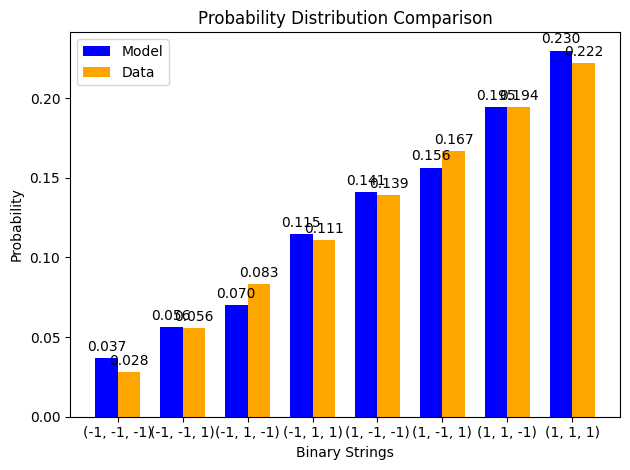

z gradient step for node 0: 6.56765775977064e-07
z gradient step for node 1: 3.7762438637254925e-06
z gradient step for node 2: -3.1994036072040823e-06
z gradient step for node 3: -7.328643728843343e-08
edge graident step for edge (0, 3): -2.837881887630789e-06
edge graident step for edge (1, 3): 1.202340863144924e-05
edge graident step for edge (2, 3): -1.0878835935647675e-05
x positive phase: 0.0
x negative phase: -1.0206262982298077e-05
x gradient step for node 0: 1.0206262982298077e-08
x positive phase: 0.0
x negative phase: 4.16206617381685e-07
x gradient step for node 1: -4.1620661738168503e-10
x positive phase: 0.0
x negative phase: 1.8429368024420595e-07
x gradient step for node 2: -1.8429368024420594e-10
x positive phase: -0.6605981615223642
x negative phase: -0.6610775810069041
x gradient step for node 3: 4.794194845398891e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

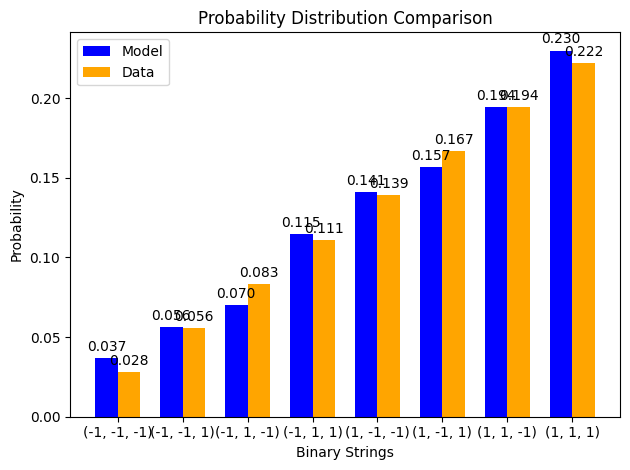

z gradient step for node 0: 6.591180462447443e-07
z gradient step for node 1: 3.7342944641290677e-06
z gradient step for node 2: -3.153675304137321e-06
z gradient step for node 3: -6.851887067610418e-08
edge graident step for edge (0, 3): -2.8633689516444626e-06
edge graident step for edge (1, 3): 1.1860729706876724e-05
edge graident step for edge (2, 3): -1.0744364685634265e-05
x positive phase: 0.0
x negative phase: -9.350062909941115e-06
x gradient step for node 0: 9.350062909941116e-09
x positive phase: 0.0
x negative phase: 3.755026528898072e-07
x gradient step for node 1: -3.755026528898072e-10
x positive phase: 0.0
x negative phase: 1.6608564420481183e-07
x gradient step for node 2: -1.6608564420481184e-10
x positive phase: -0.6605247831602121
x negative phase: -0.6610123119336172
x gradient step for node 3: 4.875287734050771e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

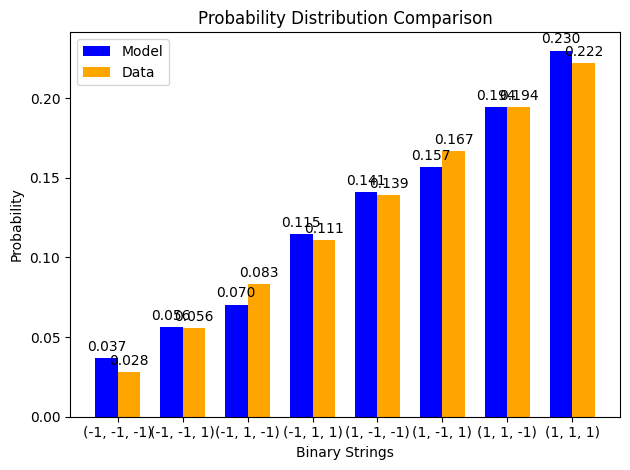

z gradient step for node 0: 6.612280097006985e-07
z gradient step for node 1: 3.6928003327336703e-06
z gradient step for node 2: -3.1086094318843183e-06
z gradient step for node 3: -6.390195377481423e-08
edge graident step for edge (0, 3): -2.8874146677818068e-06
edge graident step for edge (1, 3): 1.1700243378841972e-05
edge graident step for edge (2, 3): -1.0611129387360766e-05
x positive phase: 0.0
x negative phase: -8.565746517639665e-06
x gradient step for node 0: 8.565746517639665e-09
x positive phase: 0.0
x negative phase: 3.387834575276298e-07
x gradient step for node 1: -3.3878345752762984e-10
x positive phase: 0.0
x negative phase: 1.4967482581419985e-07
x gradient step for node 2: -1.4967482581419985e-10
x positive phase: -0.6604503405388732
x negative phase: -0.6609455977742464
x gradient step for node 3: 4.952572353732476e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

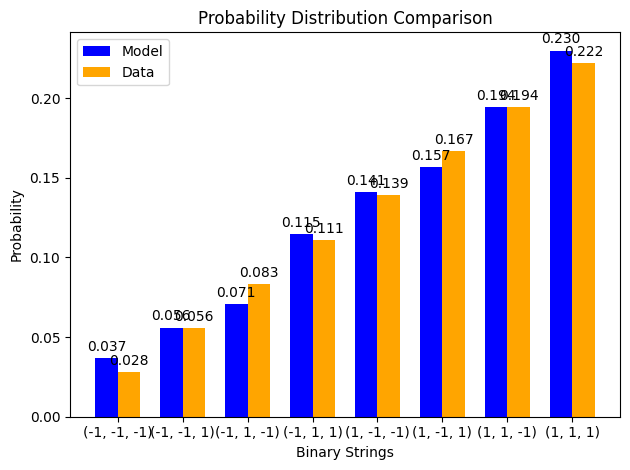

z gradient step for node 0: 6.631031830595657e-07
z gradient step for node 1: 3.6517524378597567e-06
z gradient step for node 2: -3.064193006980326e-06
z gradient step for node 3: -5.94313569058369e-08
edge graident step for edge (0, 3): -2.9100640670818857e-06
edge graident step for edge (1, 3): 1.1541910882624448e-05
edge graident step for edge (2, 3): -1.0479125745853704e-05
x positive phase: 0.0
x negative phase: -7.847274906845538e-06
x gradient step for node 0: 7.847274906845537e-09
x positive phase: 0.0
x negative phase: 3.0565852119939154e-07
x gradient step for node 1: -3.0565852119939155e-10
x positive phase: 0.0
x negative phase: 1.3488402941468306e-07
x gradient step for node 2: -1.3488402941468306e-10
x positive phase: -0.6603748863478754
x negative phase: -0.6608775022415438
x gradient step for node 3: 5.026158936684011e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

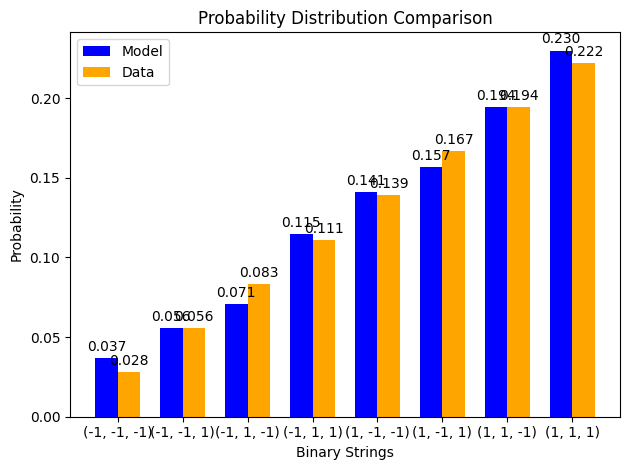

z gradient step for node 0: 6.647508259127189e-07
z gradient step for node 1: 3.611142149360813e-06
z gradient step for node 2: -3.0204134817787693e-06
z gradient step for node 3: -5.510285100798762e-08
edge graident step for edge (0, 3): -2.9313610305688465e-06
edge graident step for edge (1, 3): 1.1385694601828908e-05
edge graident step for edge (2, 3): -1.0348349504916073e-05
x positive phase: 0.0
x negative phase: -7.189116694239019e-06
x gradient step for node 0: 7.1891166942390194e-09
x positive phase: 0.0
x negative phase: 2.757756466130939e-07
x gradient step for node 1: -2.757756466130939e-10
x positive phase: 0.0
x negative phase: 1.215535070421071e-07
x gradient step for node 2: -1.215535070421071e-10
x positive phase: -0.6602984717186035
x negative phase: -0.6608080872148753
x gradient step for node 3: 5.096154962718202e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

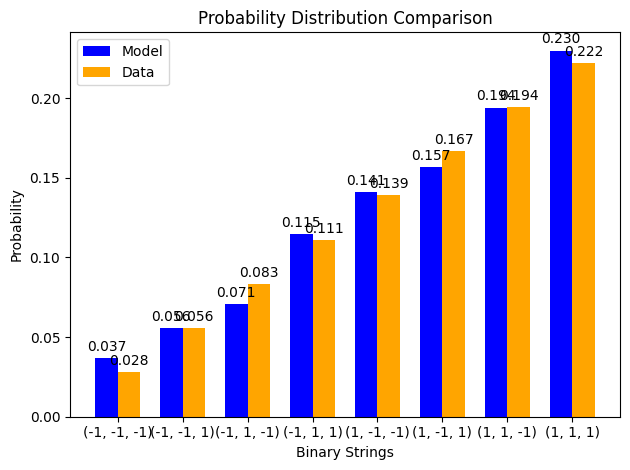

z gradient step for node 0: 6.661779537091572e-07
z gradient step for node 1: 3.57096121863687e-06
z gradient step for node 2: -2.9772587261603644e-06
z gradient step for node 3: -5.091230612855324e-08
edge graident step for edge (0, 3): -2.9513483162794675e-06
edge graident step for edge (1, 3): 1.123155802215793e-05
edge graident step for edge (2, 3): -1.0218796434427344e-05
x positive phase: 0.0
x negative phase: -6.5862053586565495e-06
x gradient step for node 0: 6.58620535865655e-09
x positive phase: 0.0
x negative phase: 2.488171861236486e-07
x gradient step for node 1: -2.488171861236486e-10
x positive phase: 0.0
x negative phase: 1.0953924305202144e-07
x gradient step for node 2: -1.0953924305202144e-10
x positive phase: -0.6602211462626947
x negative phase: -0.6607374127861403
x gradient step for node 3: 5.162665234456077e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

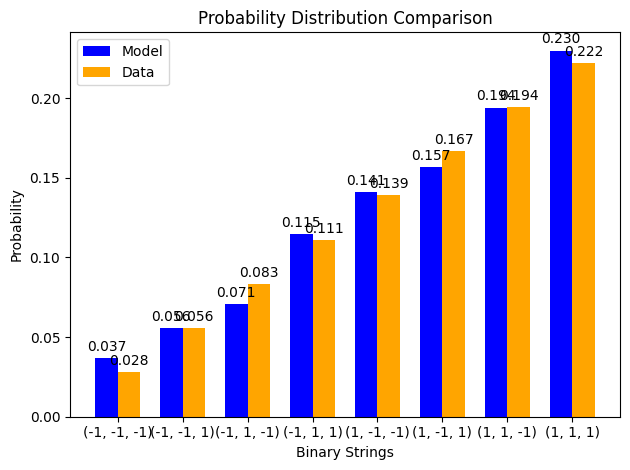

z gradient step for node 0: 6.673913499856688e-07
z gradient step for node 1: 3.5312017596214883e-06
z gradient step for node 2: -2.9347170099165847e-06
z gradient step for node 3: -4.685568990969724e-08
edge graident step for edge (0, 3): -2.9700675855459104e-06
edge graident step for edge (1, 3): 1.1079465687115292e-05
edge graident step for edge (2, 3): -1.0090462318500914e-05
x positive phase: 0.0
x negative phase: -6.033900171018473e-06
x gradient step for node 0: 6.0339001710184725e-09
x positive phase: 0.0
x negative phase: 2.244966486287047e-07
x gradient step for node 1: -2.244966486287047e-10
x positive phase: 0.0
x negative phase: 9.871140709128873e-08
x gradient step for node 2: -9.871140709128873e-11
x positive phase: -0.6601429581094929
x negative phase: -0.6606655373044374
x gradient step for node 3: 5.225791949445835e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

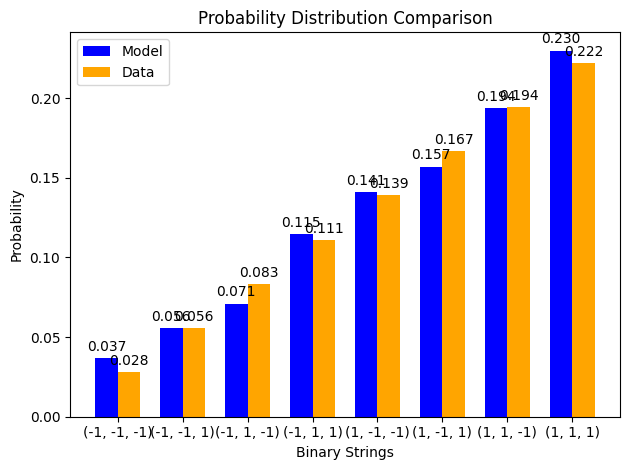

z gradient step for node 0: 6.683975778807861e-07
z gradient step for node 1: 3.491856230688262e-06
z gradient step for node 2: -2.8927769858017733e-06
z gradient step for node 3: -4.292906607189506e-08
edge graident step for edge (0, 3): -2.9875594285627693e-06
edge graident step for edge (1, 3): 1.0929383155559414e-05
edge graident step for edge (2, 3): -9.963342944456417e-06
x positive phase: 0.0
x negative phase: -5.5279504066198606e-06
x gradient step for node 0: 5.527950406619861e-09
x positive phase: 0.0
x negative phase: 2.0255564008601275e-07
x gradient step for node 1: -2.0255564008601276e-10
x positive phase: 0.0
x negative phase: 8.895295892853817e-08
x gradient step for node 2: -8.895295892853817e-11
x positive phase: -0.6600639539425948
x negative phase: -0.660592517419535
x gradient step for node 3: 5.285634769401915e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

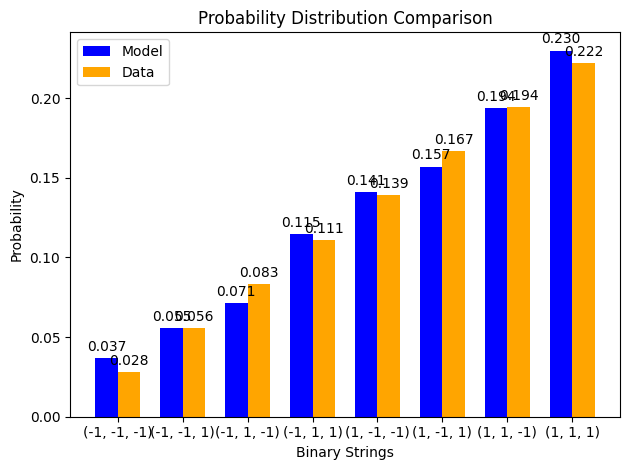

z gradient step for node 0: 6.692029909735054e-07
z gradient step for node 1: 3.4529174174310894e-06
z gradient step for node 2: -2.8514276732365672e-06
z gradient step for node 3: -3.9128592893178384e-08
edge graident step for edge (0, 3): -3.003863389274053e-06
edge graident step for edge (1, 3): 1.0781276961033384e-05
edge graident step for edge (2, 3): -9.83743409257433e-06
x positive phase: 0.0
x negative phase: -5.064462564320041e-06
x gradient step for node 0: 5.064462564320041e-09
x positive phase: 0.0
x negative phase: 1.8276110481171835e-07
x gradient step for node 1: -1.8276110481171835e-10
x positive phase: 0.0
x negative phase: 8.015839026746269e-08
x gradient step for node 2: -8.01583902674627e-11
x positive phase: -0.6599841790355149
x negative phase: -0.6605184081241866
x gradient step for node 3: 5.342290886717338e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

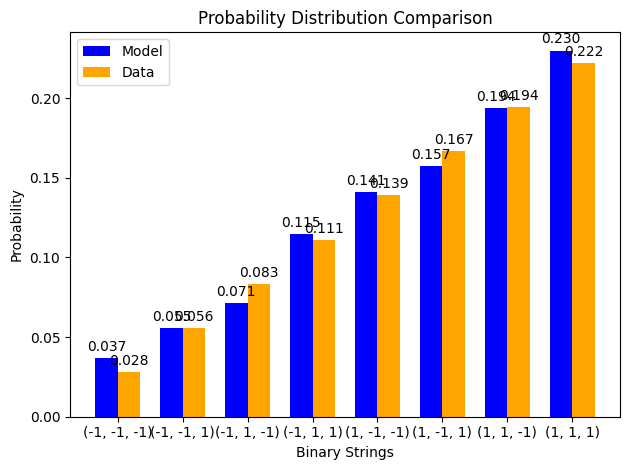

z gradient step for node 0: 6.698137434838492e-07
z gradient step for node 1: 3.4143784162670165e-06
z gradient step for node 2: -2.8106584426451366e-06
z gradient step for node 3: -3.545052168738017e-08
edge graident step for edge (0, 3): -3.0190179896053547e-06
edge graident step for edge (1, 3): 1.0635114572805027e-05
edge graident step for edge (2, 3): -9.712731526598184e-06
x positive phase: 0.0
x negative phase: -4.639870340238584e-06
x gradient step for node 0: 4.639870340238584e-09
x positive phase: 0.0
x negative phase: 1.6490283795530654e-07
x gradient step for node 1: -1.6490283795530654e-10
x positive phase: 0.0
x negative phase: 7.223259012068129e-08
x gradient step for node 2: -7.223259012068128e-11
x positive phase: -0.659903677286504
x negative phase: -0.6604432627953425
x gradient step for node 3: 5.395855088384805e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

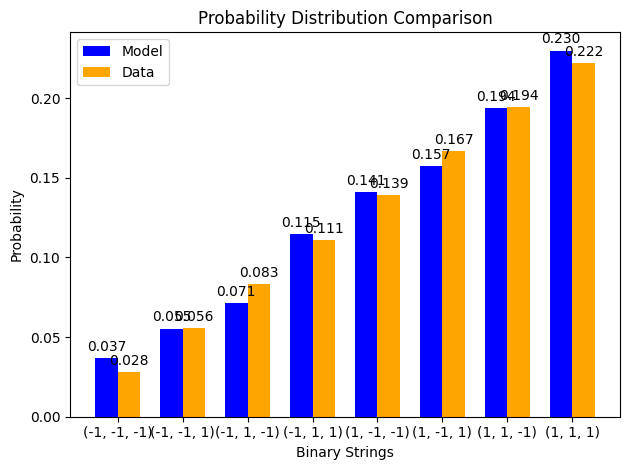

z gradient step for node 0: 6.702357998691344e-07
z gradient step for node 1: 3.376232618824471e-06
z gradient step for node 2: -2.770459000413145e-06
z gradient step for node 3: -3.1891195283323405e-08
edge graident step for edge (0, 3): -3.0330607530739685e-06
edge graident step for edge (1, 3): 1.0490864358543656e-05
edge graident step for edge (2, 3): -9.589230984951541e-06
x positive phase: 0.0
x negative phase: -4.250907124711394e-06
x gradient step for node 0: 4.2509071247113934e-09
x positive phase: 0.0
x negative phase: 1.4879124246397064e-07
x gradient step for node 1: -1.4879124246397064e-10
x positive phase: 0.0
x negative phase: 6.50898216339451e-08
x gradient step for node 2: -6.50898216339451e-11
x positive phase: -0.6598224912525436
x negative phase: -0.6603671332342929
x gradient step for node 3: 5.446419817493053e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

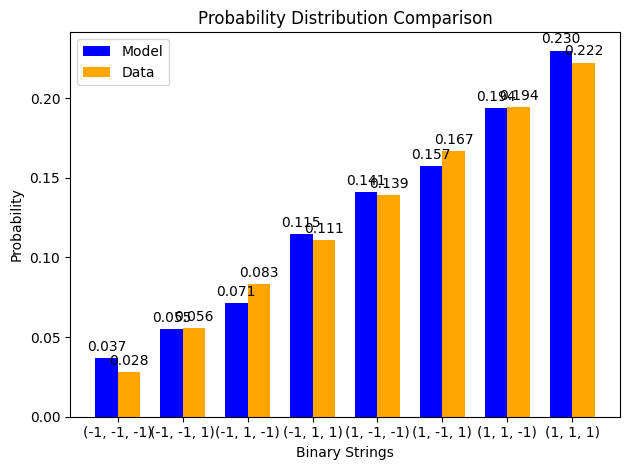

z gradient step for node 0: 6.704749438502522e-07
z gradient step for node 1: 3.3384736970690777e-06
z gradient step for node 2: -2.7308193744488978e-06
z gradient step for node 3: -2.8447046502066975e-08
edge graident step for edge (0, 3): -3.0460282278002015e-06
edge graident step for edge (1, 3): 1.0348495548573977e-05
edge graident step for edge (2, 3): -9.466928172636752e-06
x positive phase: 0.0
x negative phase: -3.8945808106402066e-06
x gradient step for node 0: 3.894580810640207e-09
x positive phase: 0.0
x negative phase: 1.3425530647851242e-07
x gradient step for node 1: -1.3425530647851243e-10
x positive phase: 0.0
x negative phase: 5.865279943462951e-08
x gradient step for node 2: -5.865279943462951e-11
x positive phase: -0.6597406621825448
x negative phase: -0.6602900697057916
x gradient step for node 3: 5.494075232468365e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

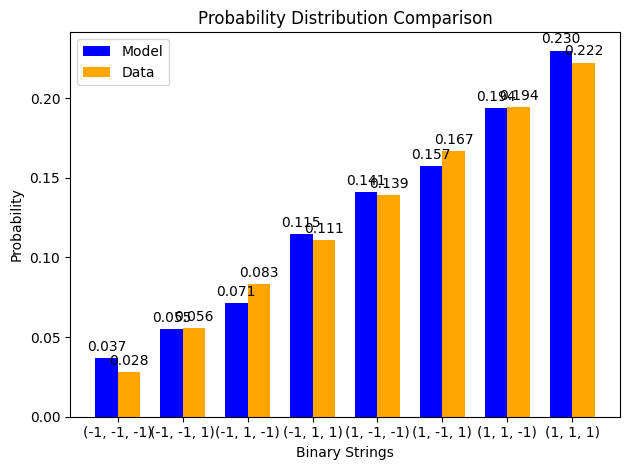

z gradient step for node 0: 6.705367868981016e-07
z gradient step for node 1: 3.3010955891396575e-06
z gradient step for node 2: -2.691729900329329e-06
z gradient step for node 3: -2.51145966378985e-08
edge graident step for edge (0, 3): -3.0579560089427636e-06
edge graident step for edge (1, 3): 1.0207978201639406e-05
edge graident step for edge (2, 3): -9.34581875378654e-06
x positive phase: 0.0
x negative phase: -3.568150719129023e-06
x gradient step for node 0: 3.5681507191290233e-09
x positive phase: 0.0
x negative phase: 1.2114077947288013e-07
x gradient step for node 1: -1.2114077947288013e-10
x positive phase: 0.0
x negative phase: 5.285185764714209e-08
x gradient step for node 2: -5.285185764714209e-11
x positive phase: -0.6596582300497764
x negative phase: -0.6602121209761855
x gradient step for node 3: 5.538909264091175e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

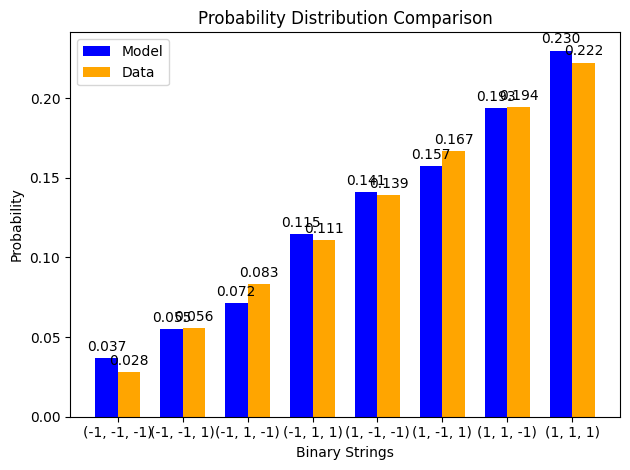

z gradient step for node 0: 6.704267762147054e-07
z gradient step for node 1: 3.264092485848413e-06
z gradient step for node 2: -2.6531812080161642e-06
z gradient step for node 3: -2.1890453940909273e-08
edge graident step for edge (0, 3): -3.0688787605862578e-06
edge graident step for edge (1, 3): 1.0069283172116167e-05
edge graident step for edge (2, 3): -9.22589834483814e-06
x positive phase: 0.0
x negative phase: -3.26910646457663e-06
x gradient step for node 0: 3.26910646457663e-09
x positive phase: 0.0
x negative phase: 1.0930852758573013e-07
x gradient step for node 1: -1.0930852758573014e-10
x positive phase: 0.0
x negative phase: 4.762419968231992e-08
x gradient step for node 2: -4.7624199682319916e-11
x positive phase: -0.6595752335835448
x negative phase: -0.660133334350598
x gradient step for node 3: 5.581007670532046e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

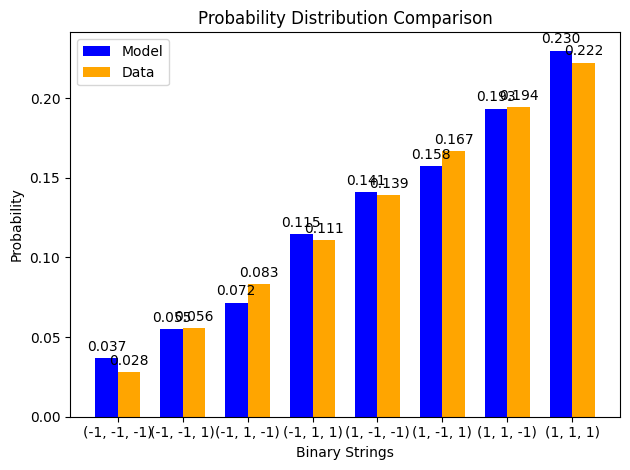

z gradient step for node 0: 6.701502022310458e-07
z gradient step for node 1: 3.227458817823076e-06
z gradient step for node 2: -2.615164209120627e-06
z gradient step for node 3: -1.8771312103177394e-08
edge graident step for edge (0, 3): -3.078830237096153e-06
edge graident step for edge (1, 3): 9.93238207861992e-06
edge graident step for edge (2, 3): -9.107162508302972e-06
x positive phase: 0.0
x negative phase: -2.995148596308825e-06
x gradient step for node 0: 2.9951485963088247e-09
x positive phase: 0.0
x negative phase: 9.86330505180209e-08
x gradient step for node 1: -9.863305051802089e-11
x positive phase: 0.0
x negative phase: 4.2913221778216896e-08
x gradient step for node 2: -4.29132217782169e-11
x positive phase: -0.6594917103001463
x negative phase: -0.6600537557091911
x gradient step for node 3: 5.62045409044809e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

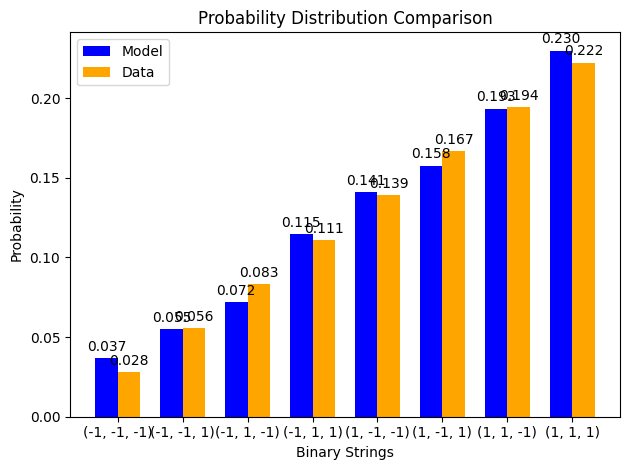

z gradient step for node 0: 6.69712205657369e-07
z gradient step for node 1: 3.191189243247933e-06
z gradient step for node 2: -2.5776700847049277e-06
z gradient step for node 3: -1.5753948749086534e-08
edge graident step for edge (0, 3): -3.087843303968052e-06
edge graident step for edge (1, 3): 9.797247273948706e-06
edge graident step for edge (2, 3): -8.989606747101726e-06
x positive phase: 0.0
x negative phase: -2.744170867500637e-06
x gradient step for node 0: 2.744170867500637e-09
x positive phase: 0.0
x negative phase: 8.900114410641006e-08
x gradient step for node 1: -8.900114410641006e-11
x positive phase: 0.0
x negative phase: 3.8667903055056035e-08
x gradient step for node 2: -3.8667903055056035e-11
x positive phase: -0.6594076965331186
x negative phase: -0.6599734295425413
x gradient step for node 3: 5.657330094227531e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

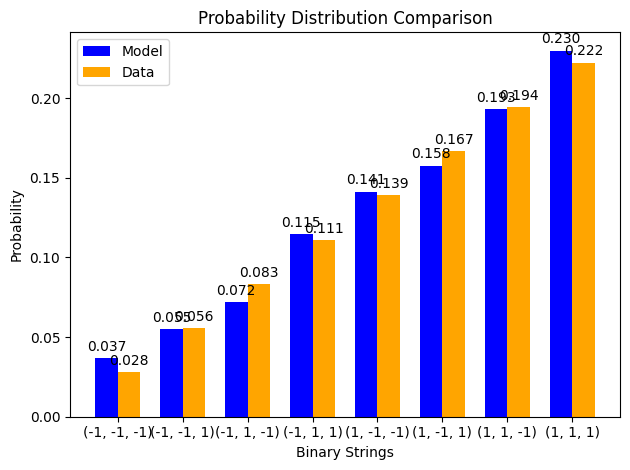

z gradient step for node 0: 6.691177841028906e-07
z gradient step for node 1: 3.15527863618531e-06
z gradient step for node 2: -2.540690273598725e-06
z gradient step for node 3: -1.2835223930557361e-08
edge graident step for edge (0, 3): -3.095949958183797e-06
edge graident step for edge (1, 3): 9.66385181630755e-06
edge graident step for edge (2, 3): -8.873226499440834e-06
x positive phase: 0.0
x negative phase: -2.5142439946618937e-06
x gradient step for node 0: 2.5142439946618936e-09
x positive phase: 0.0
x negative phase: 8.031069424686618e-08
x gradient step for node 1: -8.031069424686618e-11
x positive phase: 0.0
x negative phase: 3.484225555580546e-08
x gradient step for node 2: -3.484225555580546e-11
x positive phase: -0.6593232274628015
x negative phase: -0.6598923989861584
x gradient step for node 3: 5.691715233568928e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

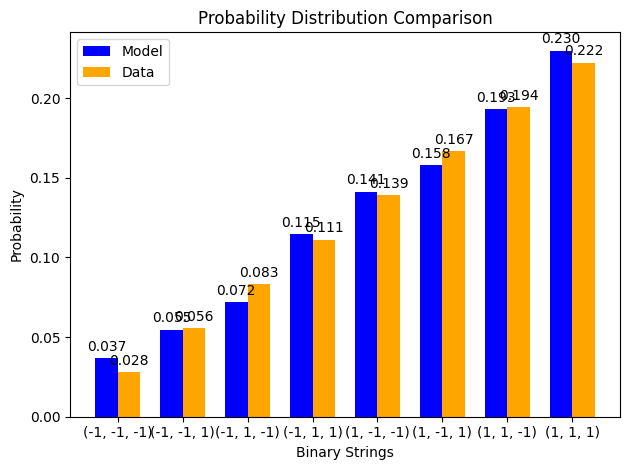

z gradient step for node 0: 6.683717982982618e-07
z gradient step for node 1: 3.1197220754454746e-06
z gradient step for node 2: -2.504216461214098e-06
z gradient step for node 3: -1.0012078628107712e-08
edge graident step for edge (0, 3): -3.1031813480972283e-06
edge graident step for edge (1, 3): 9.532169441762814e-06
edge graident step for edge (2, 3): -8.758017134205362e-06
x positive phase: 0.0
x negative phase: -2.3036007824338883e-06
x gradient step for node 0: 2.3036007824338883e-09
x positive phase: 0.0
x negative phase: 7.24695892533101e-08
x gradient step for node 1: -7.24695892533101e-11
x positive phase: 0.0
x negative phase: 3.139482838329701e-08
x gradient step for node 2: -3.139482838329701e-11
x positive phase: -0.659238337145236
x negative phase: -0.6598107058541749
x gradient step for node 3: 5.723687089388419e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

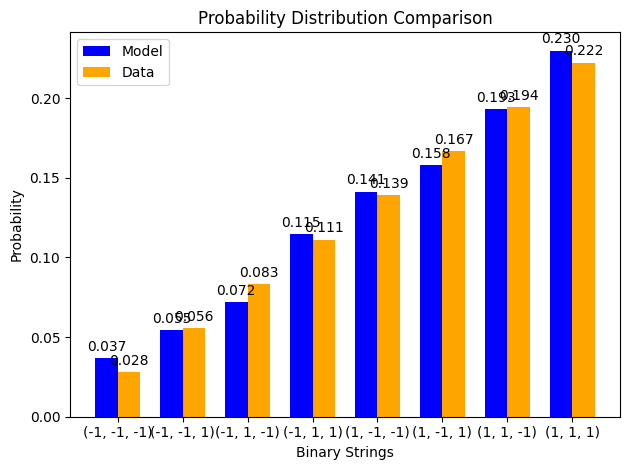

z gradient step for node 0: 6.674789779382295e-07
z gradient step for node 1: 3.0845148339758986e-06
z gradient step for node 2: -2.4682405688433718e-06
z gradient step for node 3: -7.2815332578246575e-09
edge graident step for edge (0, 3): -3.1095677928636436e-06
edge graident step for edge (1, 3): 9.402174537877922e-06
edge graident step for edge (2, 3): -8.643973946841743e-06
x positive phase: 0.0
x negative phase: -2.1106224989586455e-06
x gradient step for node 0: 2.1106224989586456e-09
x positive phase: 0.0
x negative phase: 6.539473900748999e-08
x gradient step for node 1: -6.539473900748999e-11
x positive phase: 0.0
x negative phase: 2.828826062178786e-08
x gradient step for node 2: -2.828826062178786e-11
x positive phase: -0.6591530585404144
x negative phase: -0.6597283906722363
x gradient step for node 3: 5.753321318219263e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

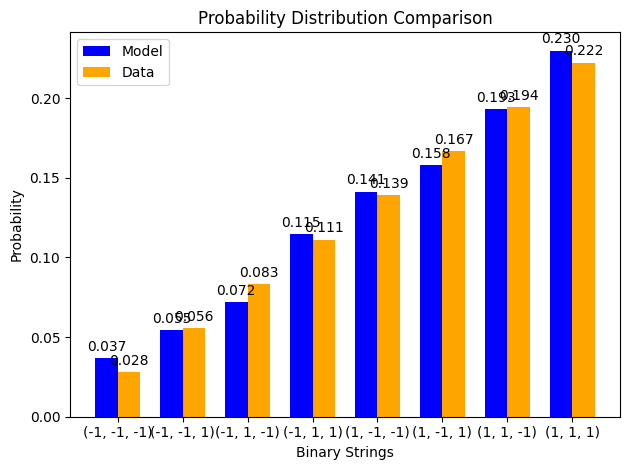

z gradient step for node 0: 6.66443927170024e-07
z gradient step for node 1: 3.049652368753847e-06
z gradient step for node 2: -2.432754743423027e-06
z gradient step for node 3: -4.6406861870518235e-09
edge graident step for edge (0, 3): -3.1151388014306613e-06
edge graident step for edge (1, 3): 9.2738421184774e-06
edge graident step for edge (2, 3): -8.531092155705605e-06
x positive phase: 0.0
x negative phase: -1.933826396714997e-06
x gradient step for node 0: 1.933826396714997e-09
x positive phase: 0.0
x negative phase: 5.9011190402382246e-08
x gradient step for node 1: -5.901119040238224e-11
x positive phase: 0.0
x negative phase: 2.5488878251449673e-08
x gradient step for node 2: -2.5488878251449674e-11
x positive phase: -0.6590674235398966
x negative phase: -0.6596454927096117
x gradient step for node 3: 5.780691697151452e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

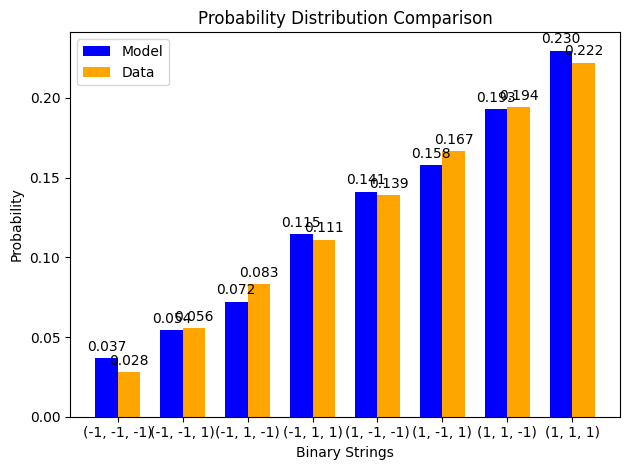

z gradient step for node 0: 6.652711297471802e-07
z gradient step for node 1: 3.0151303111487505e-06
z gradient step for node 2: -2.3977513477430045e-06
z gradient step for node 3: -2.086712256071932e-09
edge graident step for edge (0, 3): -3.1199230911031495e-06
edge graident step for edge (1, 3): 9.147147799500266e-06
edge graident step for edge (2, 3): -8.419366898858222e-06
x positive phase: 0.0
x negative phase: -1.7718542825414083e-06
x gradient step for node 0: 1.7718542825414083e-09
x positive phase: 0.0
x negative phase: 5.3251329614563836e-08
x gradient step for node 1: -5.3251329614563835e-11
x positive phase: 0.0
x negative phase: 2.2966330733960125e-08
x gradient step for node 2: -2.2966330733960124e-11
x positive phase: -0.6589814629938155
x negative phase: -0.659562050010552
x gradient step for node 3: 5.805870167364669e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1

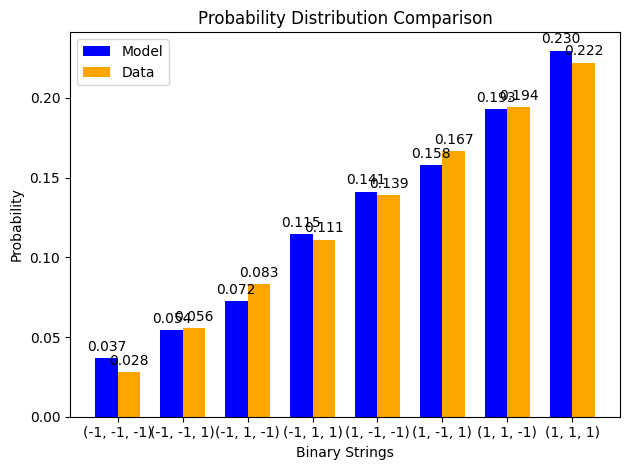

z gradient step for node 0: 6.639649538701664e-07
z gradient step for node 1: 2.9809444577414134e-06
z gradient step for node 2: -2.363222951092023e-06
z gradient step for node 3: 3.8313869063499873e-10
edge graident step for edge (0, 3): -3.1239486056976463e-06
edge graident step for edge (1, 3): 9.02206777589204e-06
edge graident step for edge (2, 3): -8.30879323127992e-06
x positive phase: 0.0
x negative phase: -1.6234620486513344e-06
x gradient step for node 0: 1.6234620486513345e-09
x positive phase: 0.0
x negative phase: 4.8054162672353644e-08
x gradient step for node 1: -4.805416267235365e-11
x positive phase: 0.0
x negative phase: 2.069326337112407e-08
x gradient step for node 2: -2.069326337112407e-11
x positive phase: -0.6588952067372807
x negative phase: -0.6594780994249219
x gradient step for node 3: 5.828926876411123e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

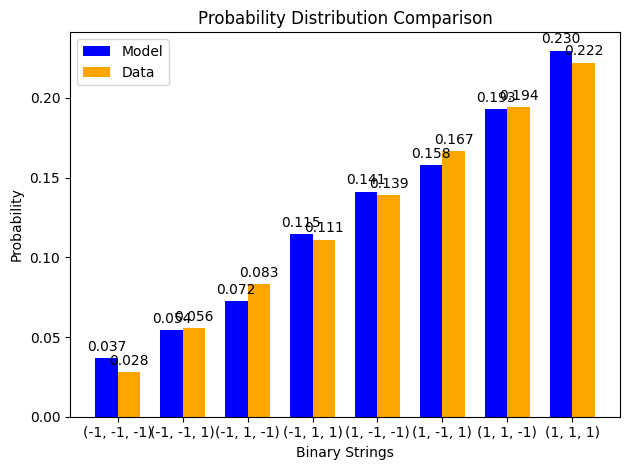

z gradient step for node 0: 6.625296567296935e-07
z gradient step for node 1: 2.9470907615758435e-06
z gradient step for node 2: -2.3291623203159503e-06
z gradient step for node 3: 2.7715432646402415e-09
edge graident step for edge (0, 3): -3.127242533298935e-06
edge graident step for edge (1, 3): 8.898578799493587e-06
edge graident step for edge (2, 3): -8.199366122486826e-06
x positive phase: 0.0
x negative phase: -1.4875100838547676e-06
x gradient step for node 0: 1.4875100838547676e-09
x positive phase: 0.0
x negative phase: 4.3364666626121604e-08
x gradient step for node 1: -4.3364666626121606e-11
x positive phase: 0.0
x negative phase: 1.8645021920751e-08
x gradient step for node 2: -1.8645021920751002e-11
x positive phase: -0.658808683616199
x negative phase: -0.6593936766381187
x gradient step for node 3: 5.849930219196109e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

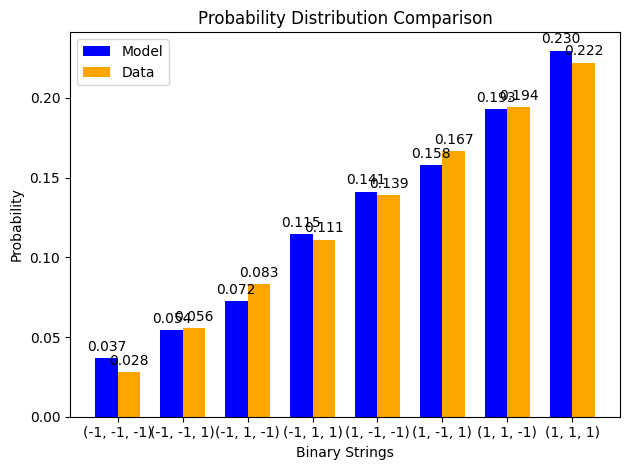

z gradient step for node 0: 6.609693887785762e-07
z gradient step for node 1: 2.913565323821976e-06
z gradient step for node 2: -2.295562411279109e-06
z gradient step for node 3: 5.081105982213119e-09
edge graident step for edge (0, 3): -3.1298313236335365e-06
edge graident step for edge (1, 3): 8.77665815788857e-06
edge graident step for edge (2, 3): -8.091080454526514e-06
x positive phase: 0.0
x negative phase: -1.3629544909863817e-06
x gradient step for node 0: 1.3629544909863817e-09
x positive phase: 0.0
x negative phase: 3.9133204384056804e-08
x gradient step for node 1: -3.9133204384056804e-11
x positive phase: 0.0
x negative phase: 1.6799386298903734e-08
x gradient step for node 2: -1.6799386298903734e-11
x positive phase: -0.6587219215125248
x negative phase: -0.6593088162003071
x gradient step for node 3: 5.868946877822801e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

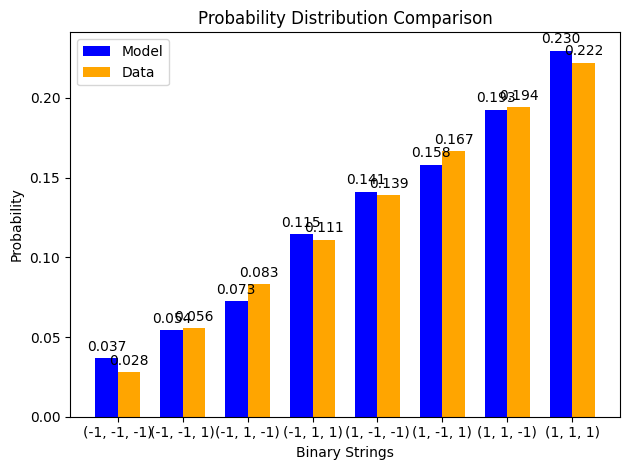

z gradient step for node 0: 6.592881977364184e-07
z gradient step for node 1: 2.8803643858335006e-06
z gradient step for node 2: -2.2624163607081193e-06
z gradient step for node 3: 7.314360705779066e-09
edge graident step for edge (0, 3): -3.131740705065167e-06
edge graident step for edge (1, 3): 8.656283654167596e-06
edge graident step for edge (2, 3): -7.98393102033415e-06
x positive phase: 0.0
x negative phase: -1.248839042757938e-06
x gradient step for node 0: 1.2488390427579379e-09
x positive phase: 0.0
x negative phase: 3.531499695902817e-08
x gradient step for node 1: -3.531499695902817e-11
x positive phase: 0.0
x negative phase: 1.5136330508763315e-08
x gradient step for node 2: -1.5136330508763316e-11
x positive phase: -0.6586349473689532
x negative phase: -0.6592235515549834
x gradient step for node 3: 5.886041860301283e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

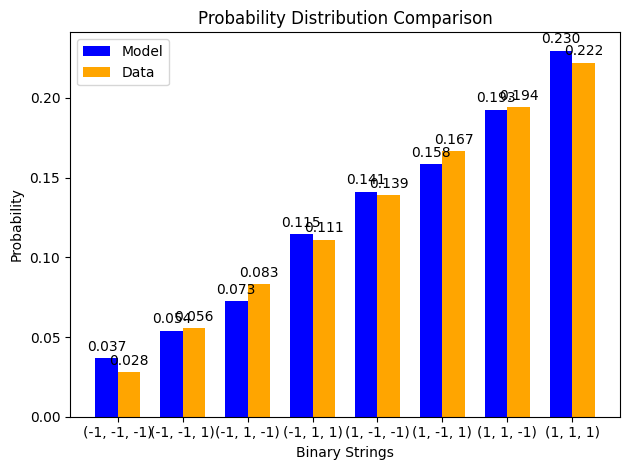

z gradient step for node 0: 6.574900323570443e-07
z gradient step for node 1: 2.8474843215851588e-06
z gradient step for node 2: -2.2297174784090823e-06
z gradient step for node 3: 9.473772071916242e-09
edge graident step for edge (0, 3): -3.1329957012312115e-06
edge graident step for edge (1, 3): 8.537433587568103e-06
edge graident step for edge (2, 3): -7.877912522428157e-06
x positive phase: 0.0
x negative phase: -1.1442878139483825e-06
x gradient step for node 0: 1.1442878139483826e-09
x positive phase: 0.0
x negative phase: 3.186964748731658e-08
x gradient step for node 1: -3.1869647487316583e-11
x positive phase: 0.0
x negative phase: 1.3637806217021219e-08
x gradient step for node 2: -1.363780621702122e-11
x positive phase: -0.6585477872130707
x negative phase: -0.659137915066892
x gradient step for node 3: 5.901278538212873e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

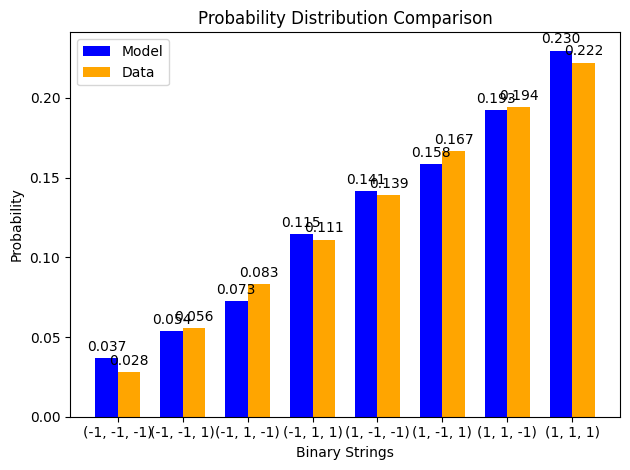

z gradient step for node 0: 6.55578745965113e-07
z gradient step for node 1: 2.814921630466705e-06
z gradient step for node 2: -2.1974592398376624e-06
z gradient step for node 3: 1.1561736908249909e-08
edge graident step for edge (0, 3): -3.1336206473256414e-06
edge graident step for edge (1, 3): 8.42008673496089e-06
edge graident step for edge (2, 3): -7.773019571929301e-06
x positive phase: 0.0
x negative phase: -1.0484984330627236e-06
x gradient step for node 0: 1.0484984330627236e-09
x positive phase: 0.0
x negative phase: 2.8760711934566843e-08
x gradient step for node 1: -2.8760711934566844e-11
x positive phase: 0.0
x negative phase: 1.2287547651889164e-08
x gradient step for node 2: -1.2287547651889164e-11
x positive phase: -0.6584604661809744
x negative phase: -0.6590519380493083
x gradient step for node 3: 5.914718683338594e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

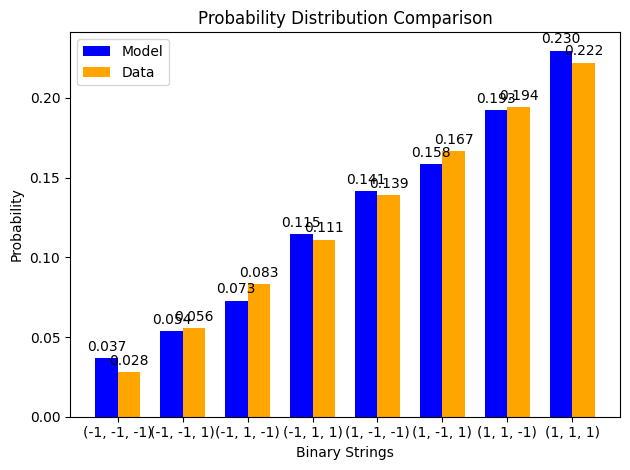

z gradient step for node 0: 6.535580997777957e-07
z gradient step for node 1: 2.7826729304238073e-06
z gradient step for node 2: -2.165635279013145e-06
z gradient step for node 3: 1.3580585639605402e-08
edge graident step for edge (0, 3): -3.1336392060401507e-06
edge graident step for edge (1, 3): 8.304222333138669e-06
edge graident step for edge (2, 3): -7.669246687881479e-06
x positive phase: 0.0
x negative phase: -9.607359013705177e-07
x gradient step for node 0: 9.607359013705178e-10
x positive phase: 0.0
x negative phase: 2.595531190427799e-08
x gradient step for node 1: -2.5955311904277992e-11
x positive phase: 0.0
x negative phase: 1.1070895725193372e-08
x gradient step for node 2: -1.1070895725193372e-11
x positive phase: -0.6583730085403721
x negative phase: -0.6589656507907061
x gradient step for node 3: 5.926422503340633e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

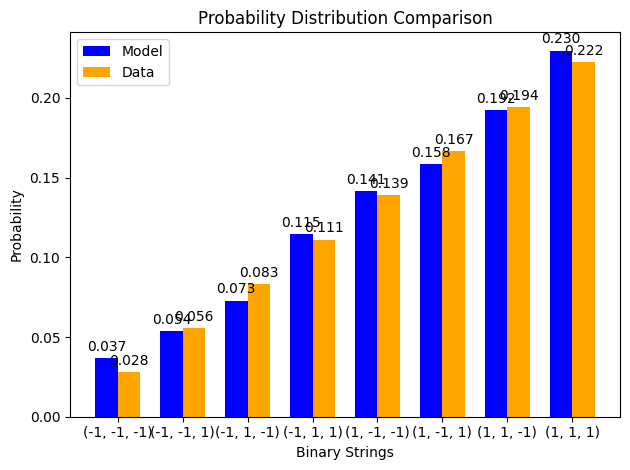

z gradient step for node 0: 6.514317660287206e-07
z gradient step for node 1: 2.75073495142511e-06
z gradient step for node 2: -2.134239381759939e-06
z gradient step for node 3: 1.5532583679450652e-08
edge graident step for edge (0, 3): -3.133074383169454e-06
edge graident step for edge (1, 3): 8.18982006188082e-06
edge graident step for edge (2, 3): -7.566588296863463e-06
x positive phase: 0.0
x negative phase: -8.803269316132214e-07
x gradient step for node 0: 8.803269316132214e-10
x positive phase: 0.0
x negative phase: 2.3423785414897926e-08
x gradient step for node 1: -2.3423785414897926e-11
x positive phase: 0.0
x negative phase: 9.974639487017706e-09
x gradient step for node 2: -9.974639487017706e-12
x positive phase: -0.6582854377131754
x negative phase: -0.658879082580828
x gradient step for node 3: 5.936448676525652e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

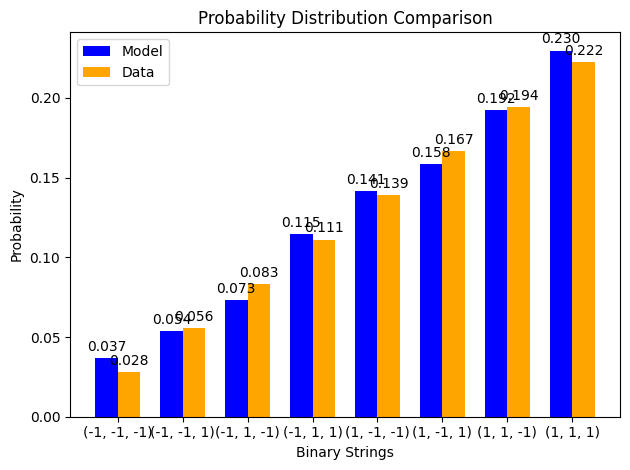

z gradient step for node 0: 6.492033309039025e-07
z gradient step for node 1: 2.7191045292478124e-06
z gradient step for node 2: -2.10326547926179e-06
z gradient step for node 3: 1.741993281073606e-08
edge graident step for edge (0, 3): -3.1319485428970563e-06
edge graident step for edge (1, 3): 8.076860027757247e-06
edge graident step for edge (2, 3): -7.465038732865484e-06
x positive phase: 0.0
x negative phase: -8.066547626804261e-07
x gradient step for node 0: 8.06654762680426e-10
x positive phase: 0.0
x negative phase: 2.1139371917969807e-08
x gradient step for node 1: -2.1139371917969807e-11
x positive phase: 0.0
x negative phase: 8.986873207167552e-09
x gradient step for node 2: -8.986873207167553e-12
x positive phase: -0.6581977762975963
x negative phase: -0.6587922617361678
x gradient step for node 3: 5.944854385714349e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

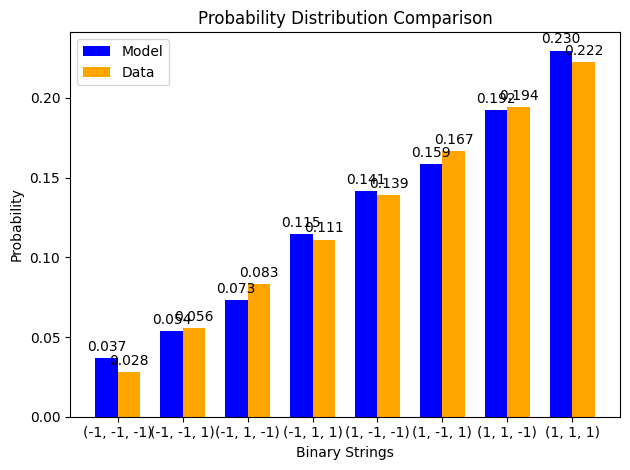

z gradient step for node 0: 6.468762973013687e-07
z gradient step for node 1: 2.6877785995610694e-06
z gradient step for node 2: -2.0727076419207872e-06
z gradient step for node 3: 1.9244772551413325e-08
edge graident step for edge (0, 3): -3.1302834227593944e-06
edge graident step for edge (1, 3): 7.965322748638954e-06
edge graident step for edge (2, 3): -7.364592237424361e-06
x positive phase: 0.0
x negative phase: -7.391544102289352e-07
x gradient step for node 0: 7.391544102289352e-10
x positive phase: 0.0
x negative phase: 1.9077928196161092e-08
x gradient step for node 1: -1.9077928196161093e-11
x positive phase: 0.0
x negative phase: 8.096867545316814e-09
x gradient step for node 2: -8.096867545316815e-12
x positive phase: -0.6581100460897582
x negative phase: -0.6587052156248885
x gradient step for node 3: 5.9516953513028e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

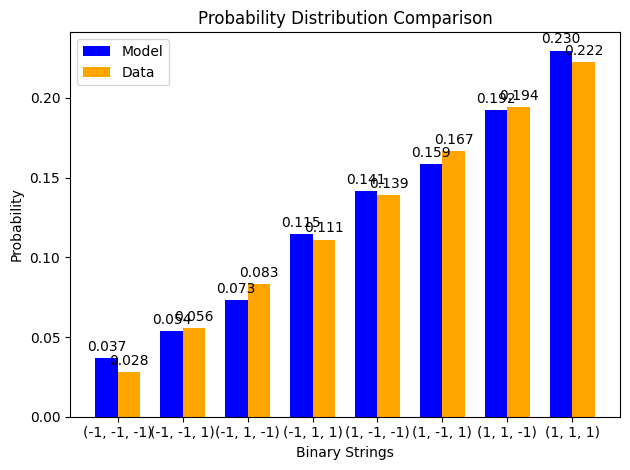

z gradient step for node 0: 6.444540874289695e-07
z gradient step for node 1: 2.6567541922987993e-06
z gradient step for node 2: -2.042560073503702e-06
z gradient step for node 3: 2.1009181506548292e-08
edge graident step for edge (0, 3): -3.1281001483061675e-06
edge graident step for edge (1, 3): 7.85518913889169e-06
edge graident step for edge (2, 3): -7.265242959993562e-06
x positive phase: 0.0
x negative phase: -6.773083165839255e-07
x gradient step for node 0: 6.773083165839255e-10
x positive phase: 0.0
x negative phase: 1.7217672110335058e-08
x gradient step for node 1: -1.721767211033506e-11
x positive phase: 0.0
x negative phase: 7.29495342285629e-09
x gradient step for node 2: -7.294953422856291e-12
x positive phase: -0.6580222681048307
x negative phase: -0.6586179706911804
x gradient step for node 3: 5.957025863497778e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

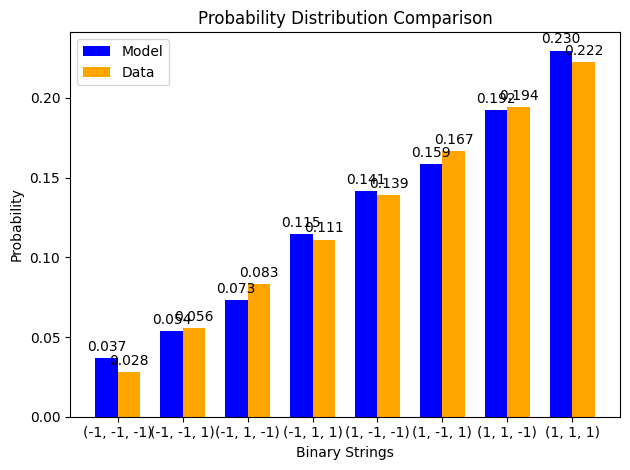

z gradient step for node 0: 6.419400452488678e-07
z gradient step for node 1: 2.626028426306354e-06
z gradient step for node 2: -2.0128171055658893e-06
z gradient step for node 3: 2.2715178706084196e-08
edge graident step for edge (0, 3): -3.1254192474566844e-06
edge graident step for edge (1, 3): 7.74644049521503e-06
edge graident step for edge (2, 3): -7.166984958539957e-06
x positive phase: 0.0
x negative phase: -6.206423663440391e-07
x gradient step for node 0: 6.206423663440392e-10
x positive phase: 0.0
x negative phase: 1.553895146265073e-08
x gradient step for node 1: -1.5538951462650732e-11
x positive phase: 0.0
x negative phase: 6.57241734579136e-09
x gradient step for node 2: -6.572417345791361e-12
x positive phase: -0.6579344625977006
x negative phase: -0.6585305524790799
x gradient step for node 3: 5.960898813792692e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

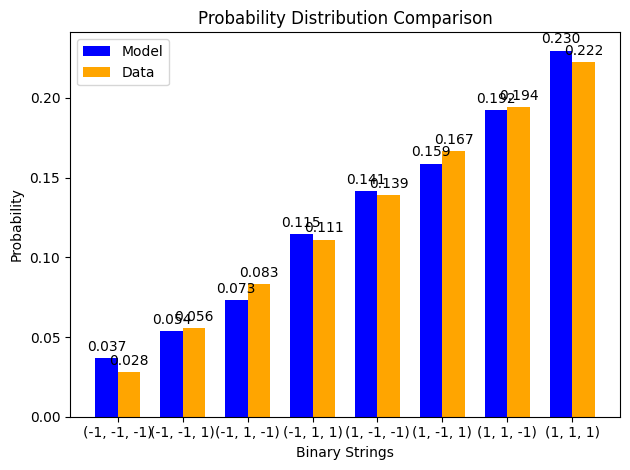

z gradient step for node 0: 6.393374387785867e-07
z gradient step for node 1: 2.5955985042528663e-06
z gradient step for node 2: -1.9834731921412054e-06
z gradient step for node 3: 2.43647249284773e-08
edge graident step for edge (0, 3): -3.1222606645637807e-06
edge graident step for edge (1, 3): 7.639058483106337e-06
edge graident step for edge (2, 3): -7.069812200347525e-06
x positive phase: 0.0
x negative phase: -5.687222369357958e-07
x gradient step for node 0: 5.687222369357958e-10
x positive phase: 0.0
x negative phase: 1.4024035511202325e-08
x gradient step for node 1: -1.4024035511202325e-11
x positive phase: 0.0
x negative phase: 5.9214070509905864e-09
x gradient step for node 2: -5.921407050990586e-12
x positive phase: -0.6578466490831856
x negative phase: -0.6584429856557584
x gradient step for node 3: 5.963365725728532e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

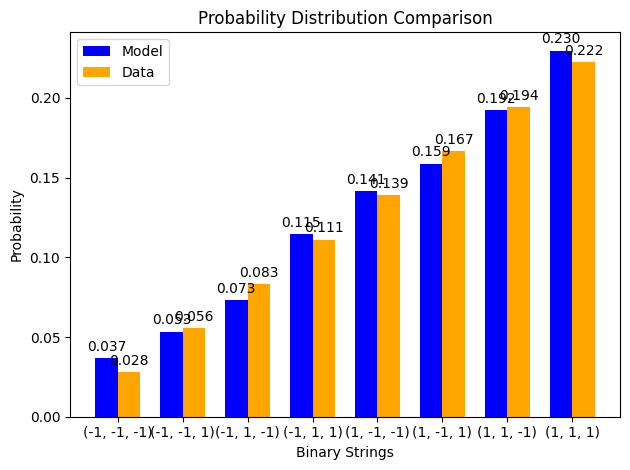

z gradient step for node 0: 6.36649462261496e-07
z gradient step for node 1: 2.5654617077940645e-06
z gradient step for node 2: -1.9545229046846747e-06
z gradient step for node 3: 2.595972400754043e-08
edge graident step for edge (0, 3): -3.1186437741922424e-06
edge graident step for edge (1, 3): 7.53302512391904e-06
edge graident step for edge (2, 3): -6.973718563016651e-06
x positive phase: 0.0
x negative phase: -5.211500559490153e-07
x gradient step for node 0: 5.211500559490153e-10
x positive phase: 0.0
x negative phase: 1.2656926913819263e-08
x gradient step for node 1: -1.2656926913819264e-11
x positive phase: 0.0
x negative phase: 5.334846458975001e-09
x gradient step for node 2: -5.3348464589750005e-12
x positive phase: -0.657758846355803
x negative phase: -0.6583552940342929
x gradient step for node 3: 5.964476784899864e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

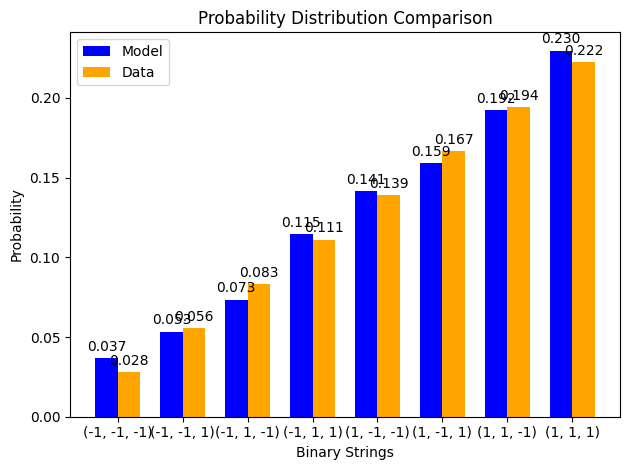

z gradient step for node 0: 6.338792382110104e-07
z gradient step for node 1: 2.535615392975671e-06
z gradient step for node 2: -1.9259609272620353e-06
z gradient step for node 3: 2.7502024124853588e-08
edge graident step for edge (0, 3): -3.1145873946137326e-06
edge graident step for edge (1, 3): 7.42832278249024e-06
edge graident step for edge (2, 3): -6.8786978356460835e-06
x positive phase: 0.0
x negative phase: -4.77561339453845e-07
x gradient step for node 0: 4.775613394538449e-10
x positive phase: 0.0
x negative phase: 1.1423192096945076e-08
x gradient step for node 1: -1.1423192096945075e-11
x positive phase: 0.0
x negative phase: 4.806359016441179e-09
x gradient step for node 2: -4.806359016441179e-12
x positive phase: -0.6576710725090994
x negative phase: -0.6582675005959343
x gradient step for node 3: 5.964280868349104e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

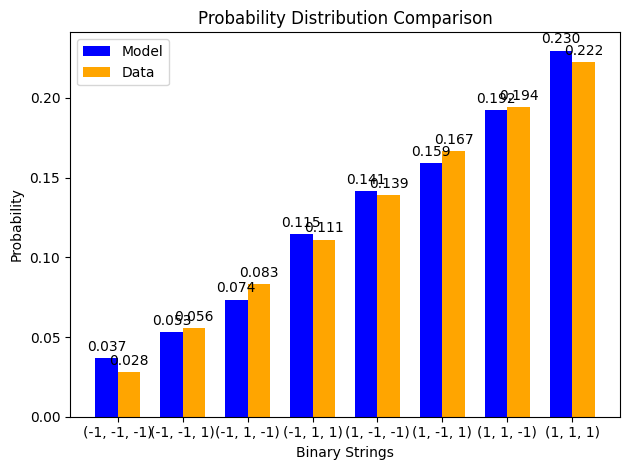

z gradient step for node 0: 6.310298193412112e-07
z gradient step for node 1: 2.5060569858693927e-06
z gradient step for node 2: -1.8977820519661542e-06
z gradient step for node 3: 2.8993419086964514e-08
edge graident step for edge (0, 3): -3.110109801028327e-06
edge graident step for edge (1, 3): 7.324934155313712e-06
edge graident step for edge (2, 3): -6.784743720184311e-06
x positive phase: 0.0
x negative phase: -4.376221876697738e-07
x gradient step for node 0: 4.376221876697738e-10
x positive phase: 0.0
x negative phase: 1.030980824234217e-08
x gradient step for node 1: -1.030980824234217e-11
x positive phase: 0.0
x negative phase: 4.3301986018965e-09
x gradient step for node 2: -4.3301986018965e-12
x positive phase: -0.6575833449545532
x negative phase: -0.6581796275118799
x gradient step for node 3: 5.962825573266884e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

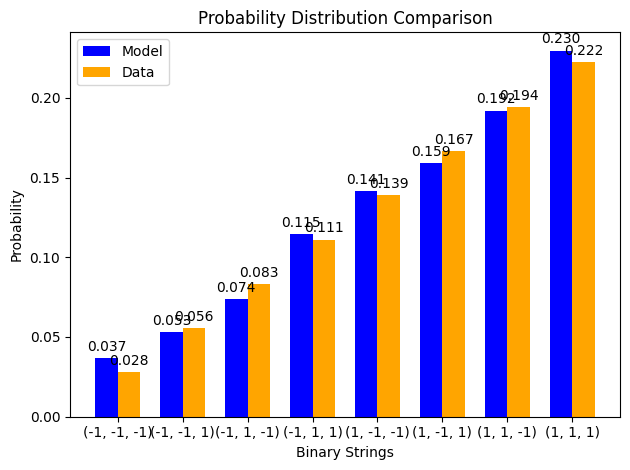

z gradient step for node 0: 6.281041903897222e-07
z gradient step for node 1: 2.476783978427377e-06
z gradient step for node 2: -1.869981174562732e-06
z gradient step for node 3: 3.043564958352119e-08
edge graident step for edge (0, 3): -3.1052287385207044e-06
edge graident step for edge (1, 3): 7.222842259234946e-06
edge graident step for edge (2, 3): -6.691849832936942e-06
x positive phase: 0.0
x negative phase: -4.0102671634440443e-07
x gradient step for node 0: 4.0102671634440446e-10
x positive phase: 0.0
x negative phase: 9.30502526184354e-09
x gradient step for node 1: -9.305025261843542e-12
x positive phase: 0.0
x negative phase: 3.90118724911385e-09
x gradient step for node 2: -3.901187249113851e-12
x positive phase: -0.6574956804400561
x negative phase: -0.6580916961645624
x gradient step for node 3: 5.960157245062936e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

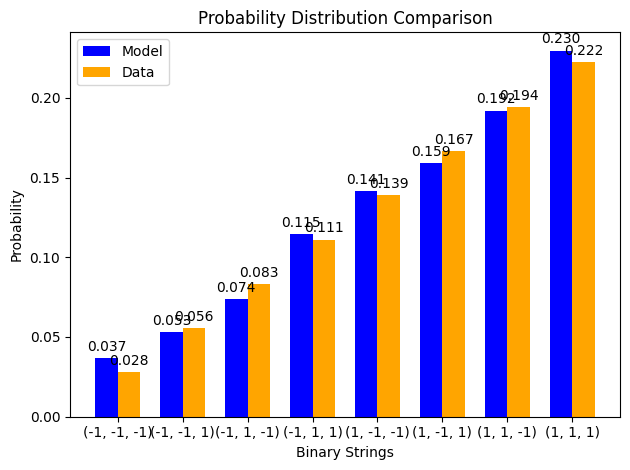

z gradient step for node 0: 6.251052698397208e-07
z gradient step for node 1: 2.4477939245494687e-06
z gradient step for node 2: -1.8425532903440374e-06
z gradient step for node 3: 3.1830404433247364e-08
edge graident step for edge (0, 3): -3.0999614347470005e-06
edge graident step for edge (1, 3): 7.122030420644229e-06
edge graident step for edge (2, 3): -6.600009706219753e-06
x positive phase: 0.0
x negative phase: -3.6749470402004825e-07
x gradient step for node 0: 3.6749470402004824e-10
x positive phase: 0.0
x negative phase: 8.398241290397986e-09
x gradient step for node 1: -8.398241290397986e-12
x positive phase: 0.0
x negative phase: 3.514659016453744e-09
x gradient step for node 2: -3.514659016453744e-12
x positive phase: -0.657408095067983
x negative phase: -0.6580037271684702
x gradient step for node 3: 5.956321004871867e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

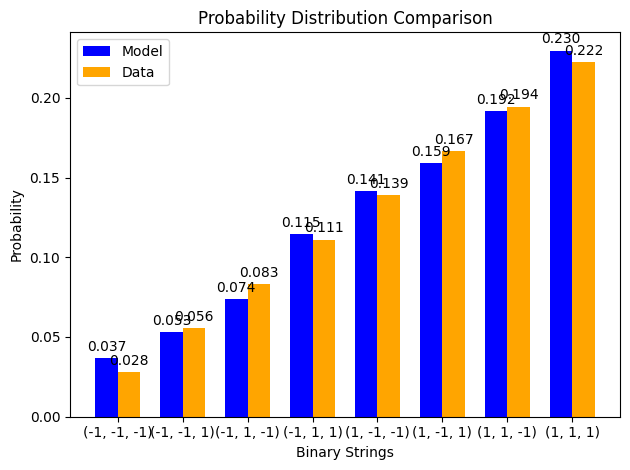

z gradient step for node 0: 6.220359115514107e-07
z gradient step for node 1: 2.419084436351554e-06
z gradient step for node 2: -1.8154934901867675e-06
z gradient step for node 3: 3.3179321808296524e-08
edge graident step for edge (0, 3): -3.094324612370636e-06
edge graident step for edge (1, 3): 7.022482265146513e-06
edge graident step for edge (2, 3): -6.509216790146044e-06
x positive phase: 0.0
x negative phase: -3.367694370334395e-07
x gradient step for node 0: 3.367694370334395e-10
x positive phase: 0.0
x negative phase: 7.57989037194893e-09
x gradient step for node 1: -7.57989037194893e-12
x positive phase: 0.0
x negative phase: 3.1664093962370254e-09
x gradient step for node 2: -3.1664093962370254e-12
x positive phase: -0.657320604312858
x negative phase: -0.657915740390501
x gradient step for node 3: 5.951360776430547e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.

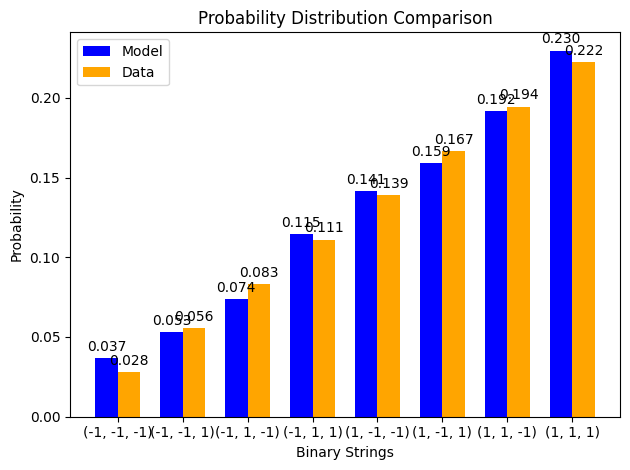

z gradient step for node 0: 6.188989063052875e-07
z gradient step for node 1: 2.3906531806278943e-06
z gradient step for node 2: -1.788796956808003e-06
z gradient step for node 3: 3.4483990445394186e-08
edge graident step for edge (0, 3): -3.088334501241352e-06
edge graident step for edge (1, 3): 6.924181707687966e-06
edge graident step for edge (2, 3): -6.419464454535367e-06
x positive phase: 0.0
x negative phase: -3.086157356209208e-07
x gradient step for node 0: 3.086157356209208e-10
x positive phase: 0.0
x negative phase: 6.841341142798136e-09
x gradient step for node 1: -6.841341142798136e-12
x positive phase: 0.0
x negative phase: 2.8526497179881186e-09
x gradient step for node 2: -2.8526497179881186e-12
x positive phase: -0.657233223038625
x negative phase: -0.6578277549698668
x gradient step for node 3: 5.945319312418152e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

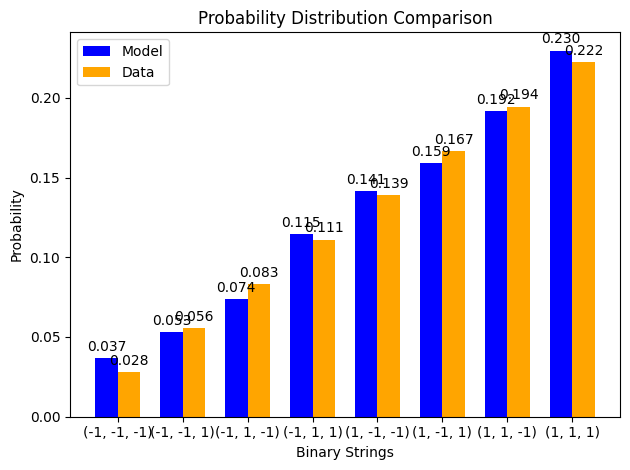

z gradient step for node 0: 6.156969832660786e-07
z gradient step for node 1: 2.362497875497055e-06
z gradient step for node 2: -1.7624589612018073e-06
z gradient step for node 3: 3.574595083855048e-08
edge graident step for edge (0, 3): -3.0820068503283895e-06
edge graident step for edge (1, 3): 6.827112943118469e-06
edge graident step for edge (2, 3): -6.330745990936526e-06
x positive phase: 0.0
x negative phase: -2.828181459000594e-07
x gradient step for node 0: 2.8281814590005943e-10
x positive phase: 0.0
x negative phase: 6.17480543442876e-09
x gradient step for node 1: -6.17480543442876e-12
x positive phase: 0.0
x negative phase: 2.569966053143928e-09
x gradient step for node 2: -2.569966053143928e-12
x positive phase: -0.6571459655155285
x negative phase: -0.6577397893375545
x gradient step for node 3: 5.938238220259961e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0

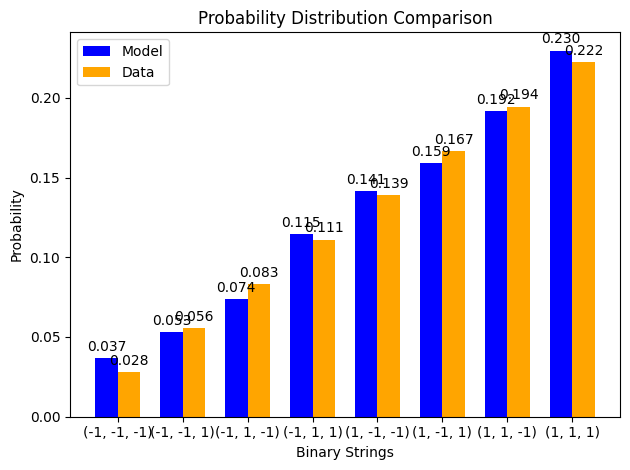

z gradient step for node 0: 6.124328113743527e-07
z gradient step for node 1: 2.3346162872254496e-06
z gradient step for node 2: -1.7364748592546969e-06
z gradient step for node 3: 3.696669641234385e-08
edge graident step for edge (0, 3): -3.075356939411911e-06
edge graident step for edge (1, 3): 6.731260437170844e-06
edge graident step for edge (2, 3): -6.2430546147531354e-06
x positive phase: 0.0
x negative phase: -2.5917928377966303e-07
x gradient step for node 0: 2.59179283779663e-10
x positive phase: 0.0
x negative phase: 5.573255823557023e-09
x gradient step for node 1: -5.573255823557023e-12
x positive phase: 0.0
x negative phase: 2.3152821773125035e-09
x gradient step for node 2: -2.3152821773125036e-12
x positive phase: -0.6570588454366157
x negative phase: -0.6576518612353534
x gradient step for node 3: 5.930157987376061e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

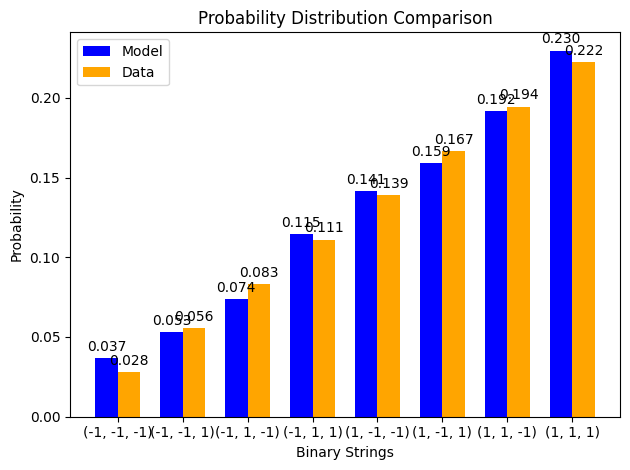

z gradient step for node 0: 6.091090006661859e-07
z gradient step for node 1: 2.3070062272204093e-06
z gradient step for node 2: -1.7108400885337965e-06
z gradient step for node 3: 3.8147674679411824e-08
edge graident step for edge (0, 3): -3.0683995905339545e-06
edge graident step for edge (1, 3): 6.636608917837308e-06
edge graident step for edge (2, 3): -6.156383467459406e-06
x positive phase: 0.0
x negative phase: -2.37518318023404e-07
x gradient step for node 0: 2.3751831802340404e-10
x positive phase: 0.0
x negative phase: 5.030351252581496e-09
x gradient step for node 1: -5.030351252581497e-12
x positive phase: 0.0
x negative phase: 2.0858261898868973e-09
x gradient step for node 2: -2.0858261898868975e-12
x positive phase: -0.6569718759338634
x negative phase: -0.6575639877344568
x gradient step for node 3: 5.921118005933756e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

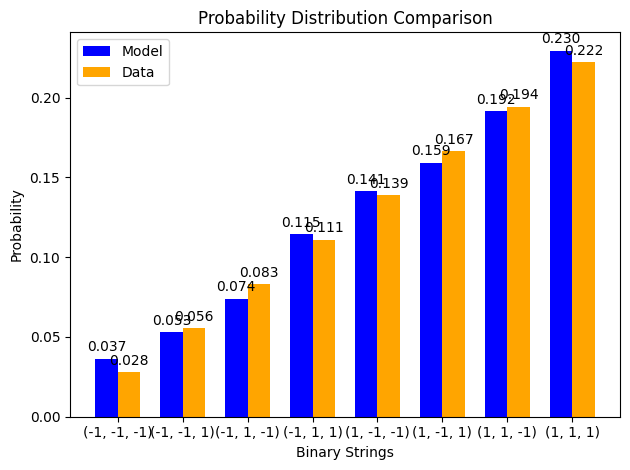

z gradient step for node 0: 6.057281035309891e-07
z gradient step for node 1: 2.2796655491827967e-06
z gradient step for node 2: -1.6855501652296158e-06
z gradient step for node 3: 3.9290288381815806e-08
edge graident step for edge (0, 3): -3.06114917921696e-06
edge graident step for edge (1, 3): 6.543143367128829e-06
edge graident step for edge (2, 3): -6.070725618905731e-06
x positive phase: 0.0
x negative phase: -2.176695807668395e-07
x gradient step for node 0: 2.176695807668395e-10
x positive phase: 0.0
x negative phase: 4.540369929626536e-09
x gradient step for node 1: -4.540369929626536e-12
x positive phase: 0.0
x negative phase: 1.8791004302412645e-09
x gradient step for node 2: -1.8791004302412645e-12
x positive phase: -0.6568850695939383
x negative phase: -0.657476185253651
x gradient step for node 3: 5.911156597127043e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

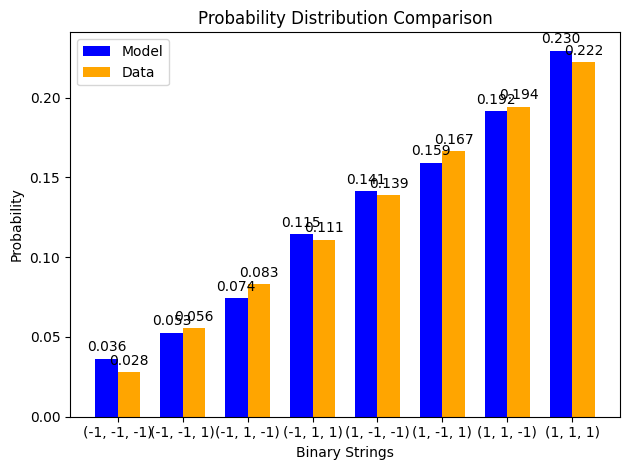

z gradient step for node 0: 6.022926159131026e-07
z gradient step for node 1: 2.2525921464176257e-06
z gradient step for node 2: -1.6606006812594499e-06
z gradient step for node 3: 4.0395896608980134e-08
edge graident step for edge (0, 3): -3.053619645455252e-06
edge graident step for edge (1, 3): 6.450849013196036e-06
edge graident step for edge (2, 3): -5.986074069691872e-06
x positive phase: 0.0
x negative phase: -1.9948129477178473e-07
x gradient step for node 0: 1.9948129477178474e-10
x positive phase: 0.0
x negative phase: 4.0981487949538955e-09
x gradient step for node 1: -4.098148794953895e-12
x positive phase: 0.0
x negative phase: 1.6928543652803155e-09
x gradient step for node 2: -1.6928543652803155e-12
x positive phase: -0.6567984384735998
x negative phase: -0.657388469577092
x gradient step for node 3: 5.900311034922057e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, 

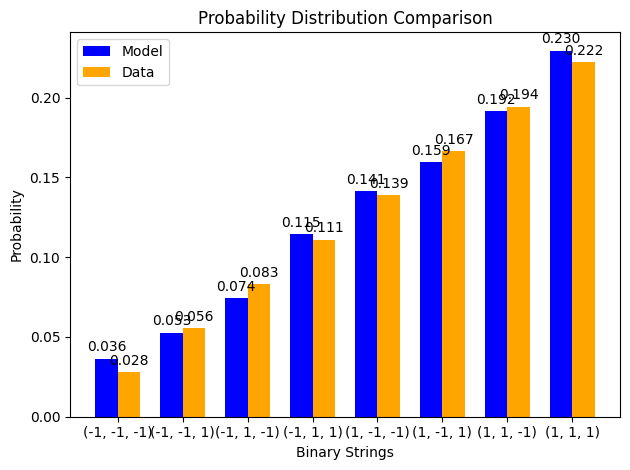

z gradient step for node 0: 5.988049784521055e-07
z gradient step for node 1: 2.225783949287602e-06
z gradient step for node 2: -1.6359873015129867e-06
z gradient step for node 3: 4.146581590400156e-08
edge graident step for edge (0, 3): -3.0458245044753253e-06
edge graident step for edge (1, 3): 6.359711322798722e-06
edge graident step for edge (2, 3): -5.9024217536139405e-06
x positive phase: 0.0
x negative phase: -1.8281440760338927e-07
x gradient step for node 0: 1.8281440760338928e-10
x positive phase: 0.0
x negative phase: 3.699028910474521e-09
x gradient step for node 1: -3.699028910474521e-12
x positive phase: 0.0
x negative phase: 1.525060155160496e-09
x gradient step for node 2: -1.5250601551604962e-12
x positive phase: -0.6567119941147476
x negative phase: -0.6573008558716873
x gradient step for node 3: 5.888617569397292e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -

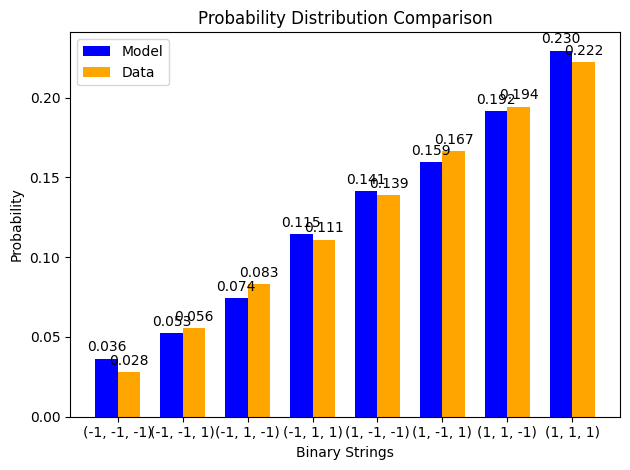

z gradient step for node 0: 5.952675775803273e-07
z gradient step for node 1: 2.1992389228128183e-06
z gradient step for node 2: -1.6117057612394516e-06
z gradient step for node 3: 4.2501321346560815e-08
edge graident step for edge (0, 3): -3.0377768572817377e-06
edge graident step for edge (1, 3): 6.269715994106584e-06
edge graident step for edge (2, 3): -5.8197615401668905e-06
x positive phase: 0.0
x negative phase: -1.6754152374082123e-07
x gradient step for node 0: 1.6754152374082123e-10
x positive phase: 0.0
x negative phase: 3.3388061921805306e-09
x gradient step for node 1: -3.3388061921805306e-12
x positive phase: 0.0
x negative phase: 1.3738906328950499e-09
x gradient step for node 2: -1.3738906328950499e-12
x positive phase: -0.6566257475591255
x negative phase: -0.6572133587040823
x gradient step for node 3: 5.876111449567567e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, 

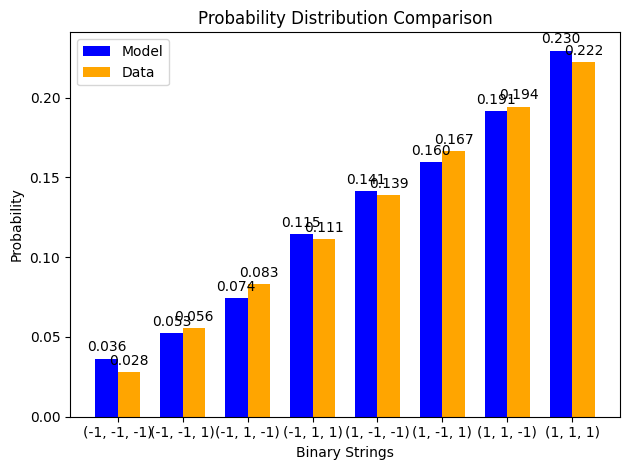

z gradient step for node 0: 5.916827465693442e-07
z gradient step for node 1: 2.1729550644012385e-06
z gradient step for node 2: -1.5877518635687289e-06
z gradient step for node 3: 4.350364761970815e-08
edge graident step for edge (0, 3): -3.0294894009810226e-06
edge graident step for edge (1, 3): 6.180848949817477e-06
edge graident step for edge (2, 3): -5.738086237098997e-06
x positive phase: 0.0
x negative phase: -1.53545926388574e-07
x gradient step for node 0: 1.53545926388574e-10
x positive phase: 0.0
x negative phase: 3.0136869622109263e-09
x gradient step for node 1: -3.0136869622109263e-12
x positive phase: 0.0
x negative phase: 1.2376994596053871e-09
x gradient step for node 2: -1.2376994596053872e-12
x positive phase: -0.6565397093626848
x negative phase: -0.6571259920572662
x gradient step for node 3: 5.86282694581386e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

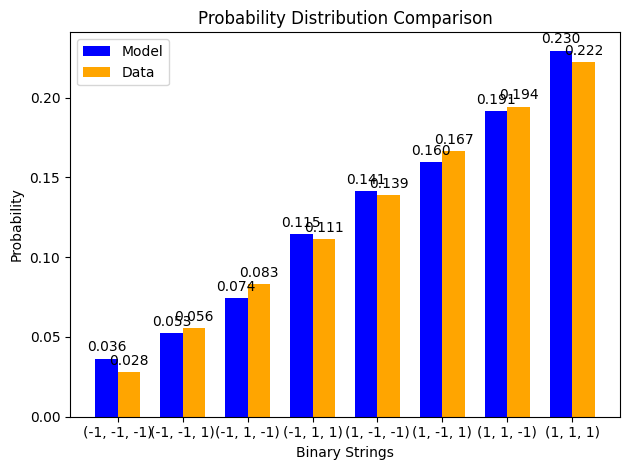

z gradient step for node 0: 5.880527665353408e-07
z gradient step for node 1: 2.146930401710739e-06
z gradient step for node 2: -1.5641214771574125e-06
z gradient step for node 3: 4.447399005835795e-08
edge graident step for edge (0, 3): -3.0209744388939863e-06
edge graident step for edge (1, 3): 6.093096330576656e-06
edge graident step for edge (2, 3): -5.657388593011112e-06
x positive phase: 0.0
x negative phase: -1.40720681447903e-07
x gradient step for node 0: 1.40720681447903e-10
x positive phase: 0.0
x negative phase: 2.720247848572434e-09
x gradient step for node 1: -2.720247848572434e-12
x positive phase: 0.0
x negative phase: 1.1150032406671563e-09
x gradient step for node 2: -1.1150032406671563e-12
x positive phase: -0.6564538896096141
x negative phase: -0.6570387693468002
x gradient step for node 3: 5.848797371860171e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

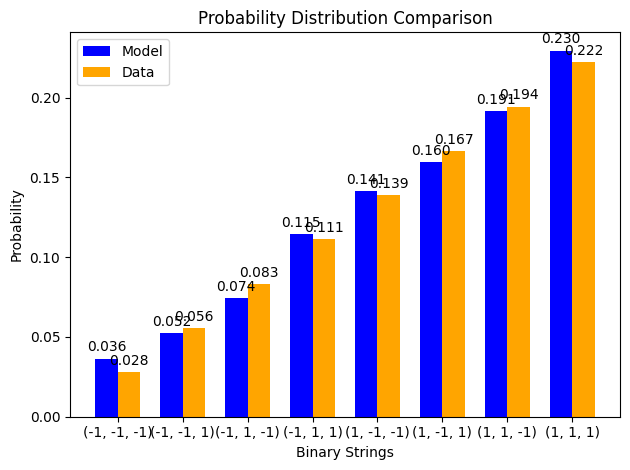

z gradient step for node 0: 5.843798674038947e-07
z gradient step for node 1: 2.121162990631975e-06
z gradient step for node 2: -1.5408105339575901e-06
z gradient step for node 3: 4.5413505679381407e-08
edge graident step for edge (0, 3): -3.012243890458344e-06
edge graident step for edge (1, 3): 6.006444488687396e-06
edge graident step for edge (2, 3): -5.577661299993208e-06
x positive phase: 0.0
x negative phase: -1.2896781674213733e-07
x gradient step for node 0: 1.2896781674213732e-10
x positive phase: 0.0
x negative phase: 2.4553996068081484e-09
x gradient step for node 1: -2.4553996068081484e-12
x positive phase: 0.0
x negative phase: 1.0044654091732137e-09
x gradient step for node 2: -1.0044654091732137e-12
x positive phase: -0.6563682979260442
x negative phase: -0.6569517034366756
x gradient step for node 3: 5.834055106314073e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1,

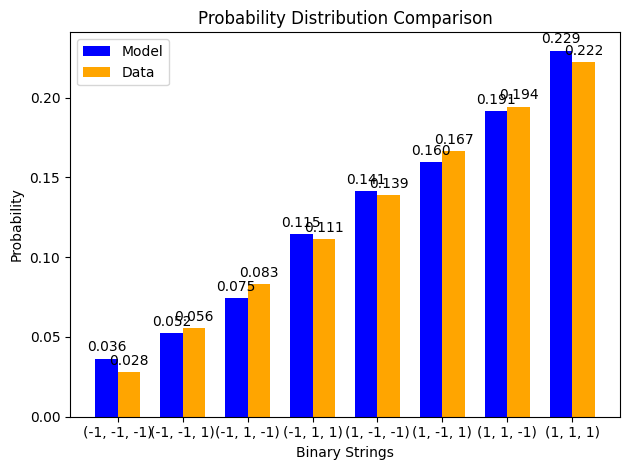

z gradient step for node 0: 5.8066622884001e-07
z gradient step for node 1: 2.0956509133907285e-06
z gradient step for node 2: -1.5178150271006746e-06
z gradient step for node 3: 4.6323314191271115e-08
edge graident step for edge (0, 3): -3.00330930092374e-06
edge graident step for edge (1, 3): 5.9208799820939935e-06
edge graident step for edge (2, 3): -5.498896996292122e-06
x positive phase: 0.0
x negative phase: -1.1819757017048241e-07
x gradient step for node 0: 1.181975701704824e-10
x positive phase: 0.0
x negative phase: 2.2163544796364572e-09
x gradient step for node 1: -2.2163544796364573e-12
x positive phase: 0.0
x negative phase: 9.048817022245507e-10
x gradient step for node 2: -9.048817022245507e-13
x positive phase: -0.6562829434934311
x negative phase: -0.6568648066548131
x gradient step for node 3: 5.818631613819791e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

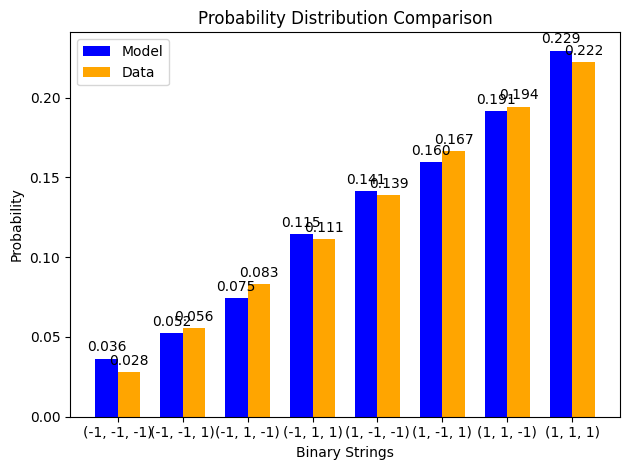

z gradient step for node 0: 5.769139811415691e-07
z gradient step for node 1: 2.070392276760924e-06
z gradient step for node 2: -1.49513100888779e-06
z gradient step for node 3: 4.720449898856782e-08
edge graident step for edge (0, 3): -2.994181850846156e-06
edge graident step for edge (1, 3): 5.836389568630931e-06
edge graident step for edge (2, 3): -5.421088269003741e-06
x positive phase: 0.0
x negative phase: -1.0832770099693549e-07
x gradient step for node 0: 1.0832770099693549e-10
x positive phase: 0.0
x negative phase: 2.0005967482172232e-09
x gradient step for node 1: -2.0005967482172233e-12
x positive phase: 0.0
x negative phase: 8.151670727691407e-10
x gradient step for node 2: -8.151670727691407e-13
x positive phase: -0.6561978350616253
x negative phase: -0.6567780908082054
x gradient step for node 3: 5.802557465800495e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

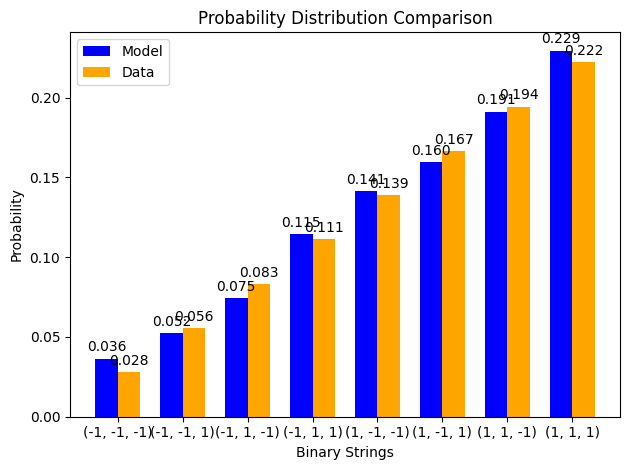

z gradient step for node 0: 5.731252061069725e-07
z gradient step for node 1: 2.045385210384526e-06
z gradient step for node 2: -1.4727545888883892e-06
z gradient step for node 3: 4.8058108124582334e-08
edge graident step for edge (0, 3): -2.9848723653818632e-06
edge graident step for edge (1, 3): 5.7529602005216565e-06
edge graident step for edge (2, 3): -5.34422765678469e-06
x positive phase: 0.0
x negative phase: -9.928285896817542e-08
x gradient step for node 0: 9.928285896817542e-11
x positive phase: 0.0
x negative phase: 1.8058561626437396e-09
x gradient step for node 1: -1.8058561626437397e-12
x positive phase: 0.0
x negative phase: 7.343438952225036e-10
x gradient step for node 2: -7.343438952225036e-13
x positive phase: -0.6561129809616325
x negative phase: -0.656691567197712
x gradient step for node 3: 5.785862360795368e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

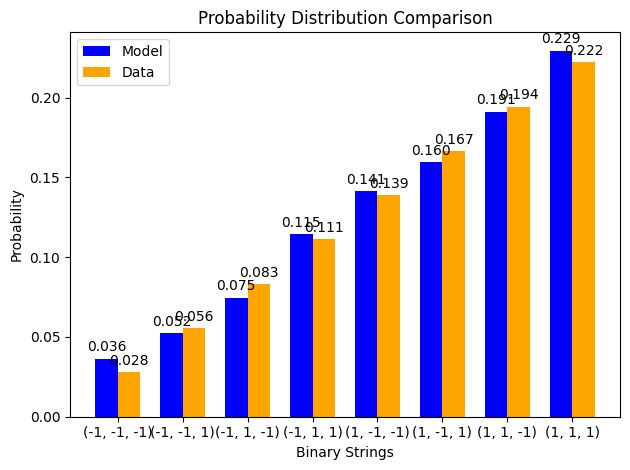

z gradient step for node 0: 5.69301937868305e-07
z gradient step for node 1: 2.020627865195468e-06
z gradient step for node 2: -1.450681932134615e-06
z gradient step for node 3: 4.888515526824122e-08
edge graident step for edge (0, 3): -2.9753913233850903e-06
edge graident step for edge (1, 3): 5.670579019116662e-06
edge graident step for edge (2, 3): -5.268307652576881e-06
x positive phase: 0.0
x negative phase: -9.099400640054012e-08
x gradient step for node 0: 9.099400640054012e-11
x positive phase: 0.0
x negative phase: 1.6300839698705962e-09
x gradient step for node 1: -1.6300839698705962e-12
x positive phase: 0.0
x negative phase: 6.615313370892544e-10
x gradient step for node 2: -6.615313370892544e-13
x positive phase: -0.6560283891180722
x negative phase: -0.6566052466325143
x gradient step for node 3: 5.768575144421417e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

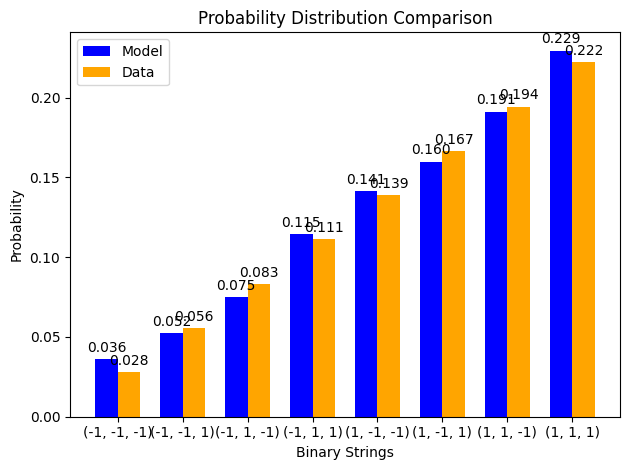

z gradient step for node 0: 5.654461637030761e-07
z gradient step for node 1: 1.9961184119373366e-06
z gradient step for node 2: -1.4289092574124307e-06
z gradient step for node 3: 4.968662064017137e-08
edge graident step for edge (0, 3): -2.965748866314788e-06
edge graident step for edge (1, 3): 5.589233349859238e-06
edge graident step for edge (2, 3): -5.1933207063415e-06
x positive phase: 0.0
x negative phase: -8.339788878490453e-08
x gradient step for node 0: 8.339788878490454e-11
x positive phase: 0.0
x negative phase: 1.4714312848960168e-09
x gradient step for node 1: -1.4714312848960167e-12
x positive phase: 0.0
x negative phase: 5.959357814123501e-10
x gradient step for node 2: -5.959357814123501e-13
x positive phase: -0.6559440670613383
x negative phase: -0.6565191394442348
x gradient step for node 3: 5.750723828964466e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 

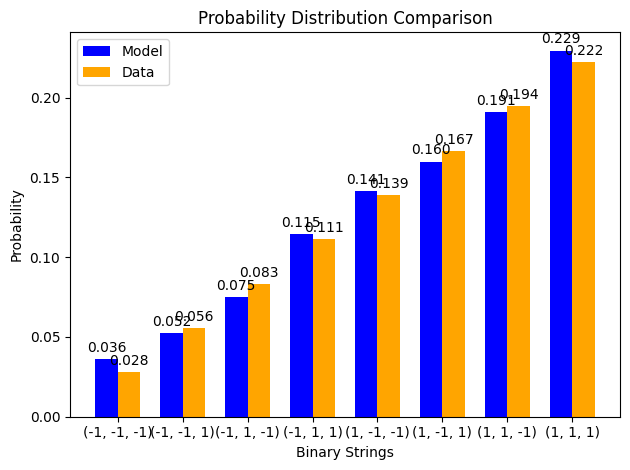

z gradient step for node 0: 5.615598248197573e-07
z gradient step for node 1: 1.971855039777759e-06
z gradient step for node 2: -1.4074328356380727e-06
z gradient step for node 3: 5.0463451932519775e-08
edge graident step for edge (0, 3): -2.955954806950434e-06
edge graident step for edge (1, 3): 5.508910697471795e-06
edge graident step for edge (2, 3): -5.119259227795145e-06
x positive phase: 0.0
x negative phase: -7.643654983259052e-08
x gradient step for node 0: 7.643654983259053e-11
x positive phase: 0.0
x negative phase: 1.3282295759178404e-09
x gradient step for node 1: -1.3282295759178403e-12
x positive phase: 0.0
x negative phase: 5.368421962417808e-10
x gradient step for node 2: -5.368421962417808e-13
x positive phase: -0.6558600219394712
x negative phase: -0.6564332555007285
x gradient step for node 3: 5.732335612572693e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1)

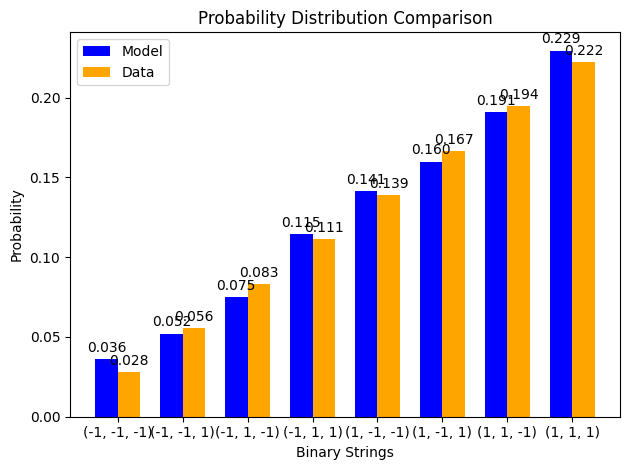

z gradient step for node 0: 5.576448171219495e-07
z gradient step for node 1: 1.947835955008165e-06
z gradient step for node 2: -1.3862489883241235e-06
z gradient step for node 3: 5.1216565208928033e-08
edge graident step for edge (0, 3): -2.946018637922987e-06
edge graident step for edge (1, 3): 5.429598741346867e-06
edge graident step for edge (2, 3): -5.046115589144987e-06
x positive phase: 0.0
x negative phase: -7.005688722826436e-08
x gradient step for node 0: 7.005688722826436e-11
x positive phase: 0.0
x negative phase: 1.1989730566406349e-09
x gradient step for node 1: -1.1989730566406349e-12
x positive phase: 0.0
x negative phase: 4.836063575593116e-10
x gradient step for node 2: -4.836063575593116e-13
x positive phase: -0.6557762605297419
x negative phase: -0.656347604219554
x gradient step for node 3: 5.713436898120428e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1):

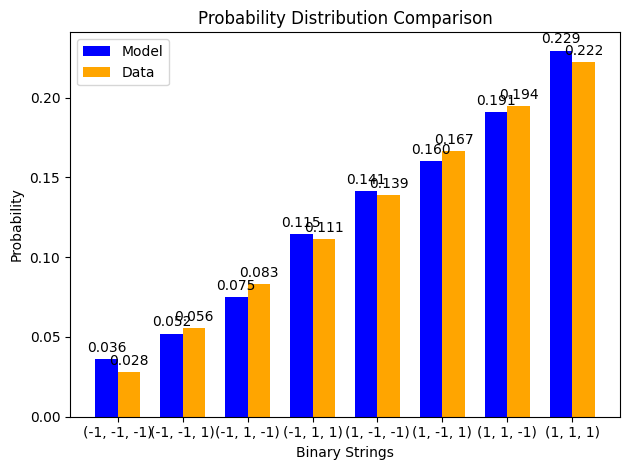

z gradient step for node 0: 5.537029919516212e-07
z gradient step for node 1: 1.9240593798290907e-06
z gradient step for node 2: -1.3653540861228026e-06
z gradient step for node 3: 5.194684578641029e-08
edge graident step for edge (0, 3): -2.9359495400625435e-06
edge graident step for edge (1, 3): 5.35128533113867e-06
edge graident step for edge (2, 3): -4.9738821278194205e-06
x positive phase: 0.0
x negative phase: -6.421024566975735e-08
x gradient step for node 0: 6.421024566975735e-11
x positive phase: 0.0
x negative phase: 1.082302799167599e-09
x gradient step for node 1: -1.082302799167599e-12
x positive phase: 0.0
x negative phase: 4.3564784133084094e-10
x gradient step for node 2: -4.3564784133084096e-13
x positive phase: -0.6556927892499582
x negative phase: -0.6562621945811264
x gradient step for node 3: 5.694053311682267e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1

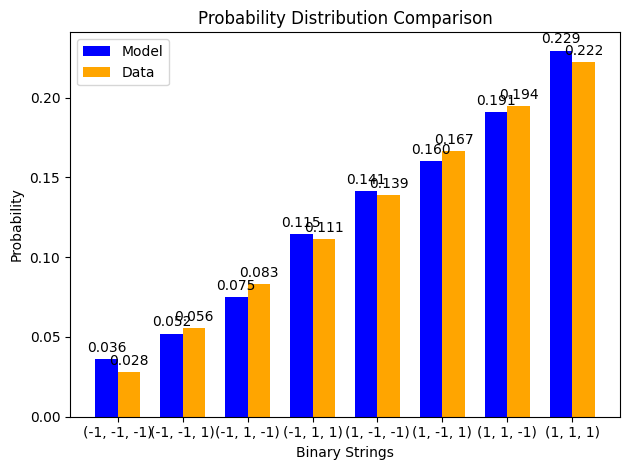

z gradient step for node 0: 5.497361568144177e-07
z gradient step for node 1: 1.900523551215838e-06
z gradient step for node 2: -1.344744547447735e-06
z gradient step for node 3: 5.265514910102187e-08
edge graident step for edge (0, 3): -2.9257563905660255e-06
edge graident step for edge (1, 3): 5.273958482541086e-06
edge graident step for edge (2, 3): -4.902551149186002e-06
x positive phase: 0.0
x negative phase: -5.885204406231108e-08
x gradient step for node 0: 5.885204406231109e-11
x positive phase: 0.0
x negative phase: 9.7699239918085e-10
x gradient step for node 1: -9.769923991808499e-13
x positive phase: 0.0
x negative phase: 3.924437086824101e-10
x gradient step for node 2: -3.924437086824101e-13
x positive phase: -0.6556096141694948
x negative phase: -0.6561770351415638
x gradient step for node 3: 5.674209720689661e-07
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1

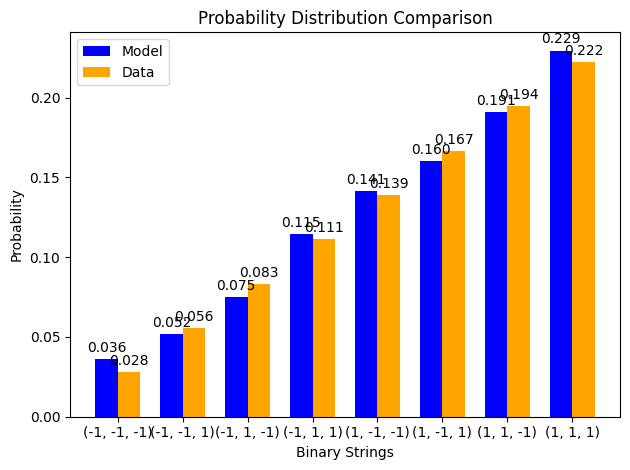

z gradient step for node 0: 5.457460760875943e-07
z gradient step for node 1: 1.8772267198586545e-06
z gradient step for node 2: -1.324416837165568e-06
z gradient step for node 3: 5.334230155151776e-08
edge graident step for edge (0, 3): -2.9154477709868454e-06
edge graident step for edge (1, 3): 5.197606373248023e-06
edge graident step for edge (2, 3): -4.8321149292603755e-06
x positive phase: 0.0
x negative phase: -5.3941433998122716e-08
x gradient step for node 0: 5.394143399812272e-11
x positive phase: 0.0
x negative phase: 8.819350415926109e-10
x gradient step for node 1: -8.819350415926109e-13
x positive phase: 0.0
x negative phase: 3.535228156995284e-10
x gradient step for node 2: -3.535228156995284e-13
x positive phase: -0.6555267410200556
x negative phase: -0.656092134045227
x gradient step for node 3: 5.653930251714456e-07
llhList: [(0, 2.211070605005571), (1, 2.1837754368614775), (2, 2.1585462654031637), (3, 2.135476446463945), (4, 2.1145954953289916), (5, 2.0958739868219523

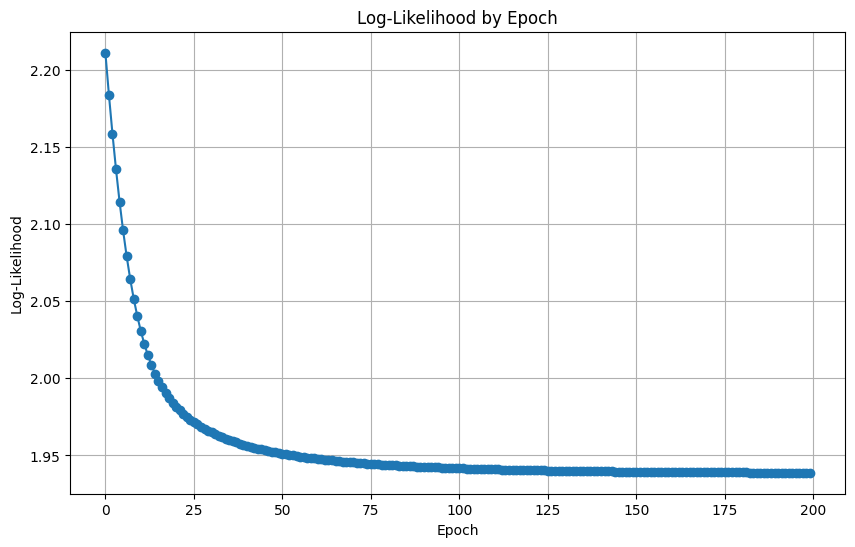

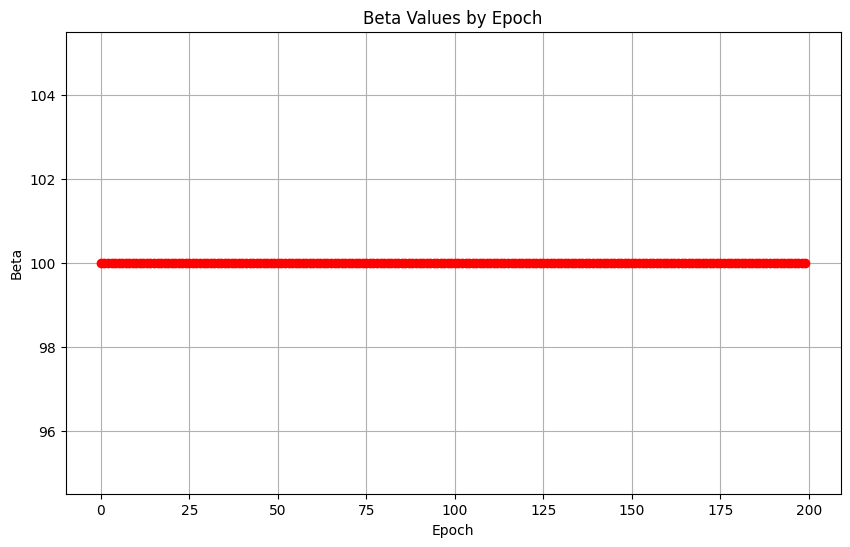

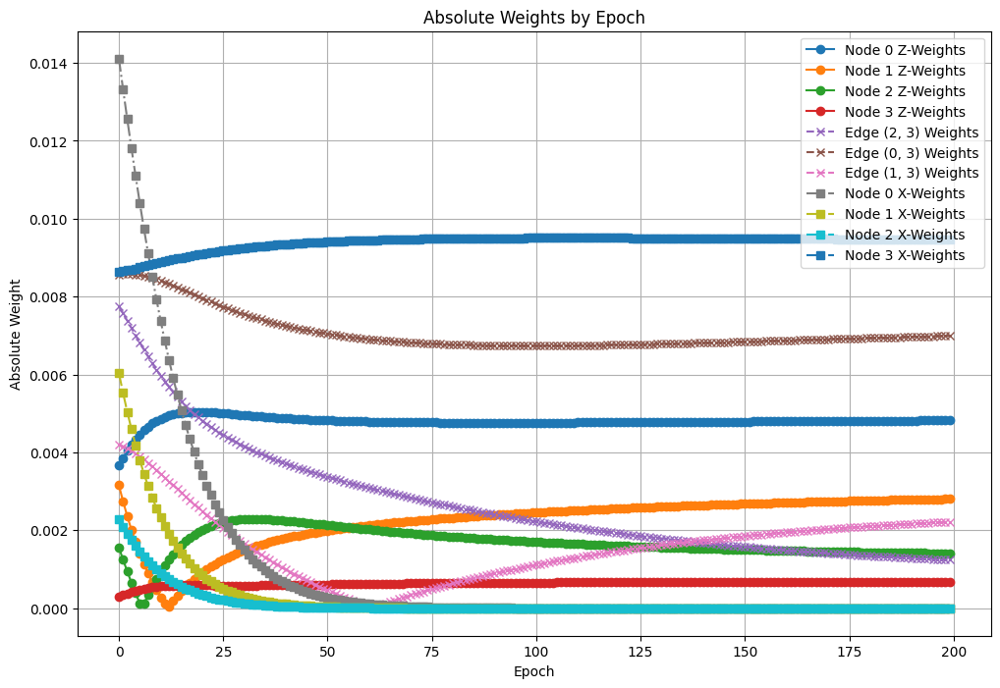

In [26]:
data = [(-1,-1,-1),
        (-1,-1,1), (-1,-1,1),
        (-1,1,-1), (-1,1,-1), (-1,1,-1),
        (-1,1,1), (-1,1,1), (-1,1,1), (-1,1,1),
        (1,-1,-1), (1,-1,-1), (1,-1,-1), (1,-1,-1), (1,-1,-1),
        (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1),
        (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1),
        (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1)]


qbm = RBM(numInputNodes = 2,
                    numOutputNodes = 1,
                    numHiddenNodes = 1,
                    beta=100,
                    vvEdges=False,
                    qrbm = True, 
                    trainTransverse = True)
qbm.drawQBM()


qbm.train(data=data,
          optimizer=None,
          alpha=.001,
          epochs=200,
          tempSchedule=None,
          finalBeta=None,
          betaGrowthEpochs=None,
          verbose=True,
          infoEveryNepochs=1)

Initial z weights: [0.004394461994740132, 0.0213108771258228, 0.01568730697504966, -0.016337350653933755]
Initial edge weights: {(0, 3): -0.0003355448273291371, (1, 3): 0.001157976578852728, (2, 3): 0.005358310577299287, (0, 1): -0.005755095141941498, (0, 2): 0.011703090679811838, (1, 2): 0.00047903655408254727}
Initial x weights: [0.0023132207337762554, 0.00470790164412916, 0.0027815969692825356, -0.0029956064288637497]
visibleStates: [(-1, -1, -1), (-1, -1, 1), (-1, 1, -1), (-1, 1, 1), (1, -1, -1), (1, -1, 1), (1, 1, -1), (1, 1, 1)]
data: {(-1, -1, -1): 0.027777777777777776, (-1, -1, 1): 0.05555555555555555, (-1, 1, -1): 0.08333333333333333, (-1, 1, 1): 0.1111111111111111, (1, -1, -1): 0.1388888888888889, (1, -1, 1): 0.16666666666666666, (1, 1, -1): 0.19444444444444445, (1, 1, 1): 0.2222222222222222}
model: {(-1, -1, -1): 0.0013351212435105595, (-1, -1, 1): 0.0012320975624330421, (-1, 1, -1): 0.09474840192316974, (-1, 1, 1): 0.09498053975183691, (1, -1, -1): 0.0007663184898866612, (1

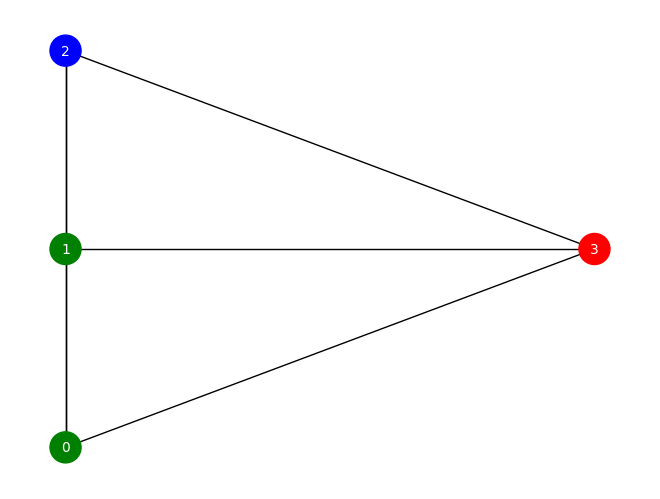

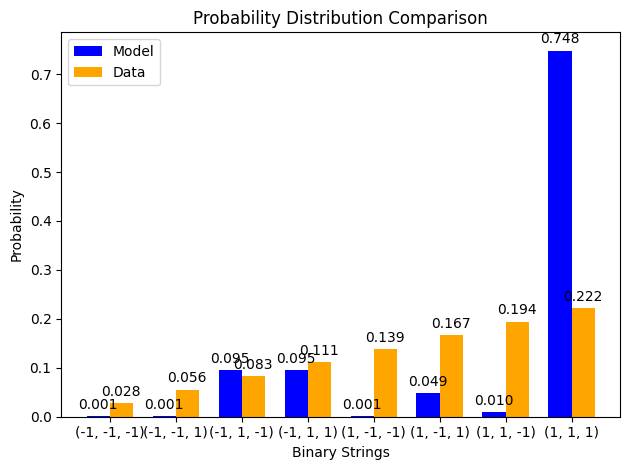

z gradient step for node 0: -0.00017096323459365515
z gradient step for node 1: -0.0006738971332649763
z gradient step for node 2: -0.0006747362374897062
z gradient step for node 3: -8.3754871808555e-05
edge graident step for edge (0, 3): 5.680591064753804e-05
edge graident step for edge (1, 3): 0.0005227840273809873
edge graident step for edge (2, 3): 0.0005695406708288787
edge graident step for edge (0, 1): -0.0005217959097490724
edge graident step for edge (0, 2): -0.0007855891203056379
edge graident step for edge (1, 2): -0.0006903724630216045
x positive phase: 0.0
x negative phase: 0.1653928790101938
x gradient step for node 0: -0.0001653928790101938
x positive phase: 0.0
x negative phase: 0.25442352985569744
x gradient step for node 1: -0.00025442352985569744
x positive phase: 0.0
x negative phase: 0.14493320731807577
x gradient step for node 2: -0.00014493320731807577
x positive phase: -0.17929598015602924
x negative phase: -0.2129735524446421
x gradient step for node 3: 3.36775

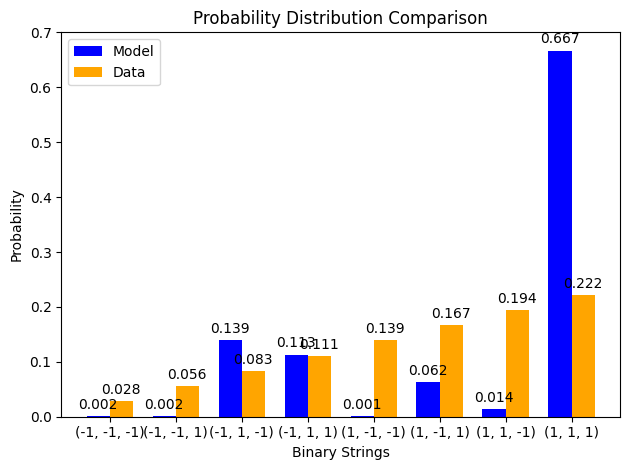

z gradient step for node 0: -4.430233549703427e-05
z gradient step for node 1: -0.0006435676233083399
z gradient step for node 2: -0.000577020425349396
z gradient step for node 3: -9.485898435476692e-05
edge graident step for edge (0, 3): -6.648670246413685e-05
edge graident step for edge (1, 3): 0.000488493402510687
edge graident step for edge (2, 3): 0.0004666482669938446
edge graident step for edge (0, 1): -0.0003682808962519867
edge graident step for edge (0, 2): -0.0007402982489839204
edge graident step for edge (1, 2): -0.0005662696047599663
x positive phase: 0.0
x negative phase: 0.16094540063751306
x gradient step for node 0: -0.00016094540063751306
x positive phase: 0.0
x negative phase: 0.2564073270245713
x gradient step for node 1: -0.0002564073270245713
x positive phase: 0.0
x negative phase: 0.15417630225646808
x gradient step for node 2: -0.0001541763022564681
x positive phase: -0.1795695840232867
x negative phase: -0.21430080740549762
x gradient step for node 3: 3.473122

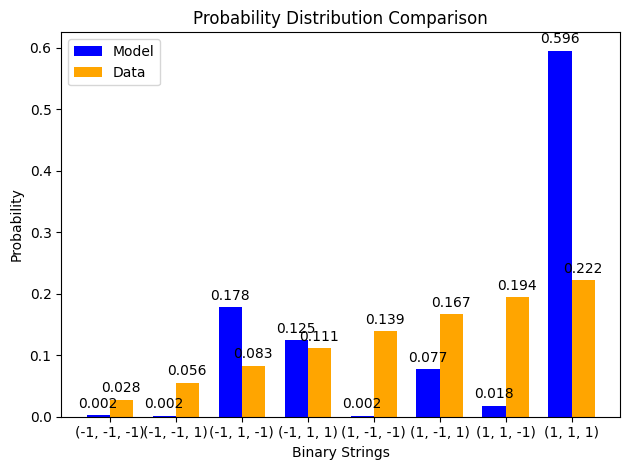

z gradient step for node 0: 5.902635268624551e-05
z gradient step for node 1: -0.0006111565669164236
z gradient step for node 2: -0.000488432332443527
z gradient step for node 3: -9.874072680252677e-05
edge graident step for edge (0, 3): -0.0001611486134837239
edge graident step for edge (1, 3): 0.00046004880131722157
edge graident step for edge (2, 3): 0.00037942420645163764
edge graident step for edge (0, 1): -0.00023562414373680987
edge graident step for edge (0, 2): -0.0007061866332416207
edge graident step for edge (1, 2): -0.00044965521683416404
x positive phase: 0.0
x negative phase: 0.15298349324896804
x gradient step for node 0: -0.00015298349324896805
x positive phase: 0.0
x negative phase: 0.2537749145430823
x gradient step for node 1: -0.00025377491454308234
x positive phase: 0.0
x negative phase: 0.15774621083049536
x gradient step for node 2: -0.00015774621083049537
x positive phase: -0.1789424974391796
x negative phase: -0.21288789532810345
x gradient step for node 3: 3.

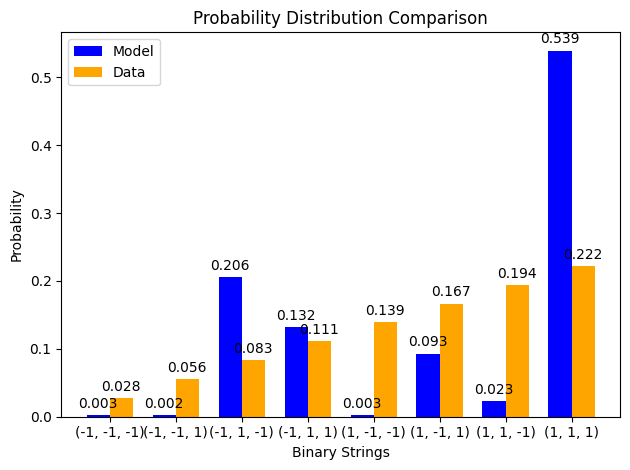

z gradient step for node 0: 0.00012888847439417584
z gradient step for node 1: -0.0005766675406215904
z gradient step for node 2: -0.0004211418625446862
z gradient step for node 3: -9.890167874194933e-05
edge graident step for edge (0, 3): -0.00022129045214096477
edge graident step for edge (1, 3): 0.00043326515749255736
edge graident step for edge (2, 3): 0.0003162720871526894
edge graident step for edge (0, 1): -0.0001338626678919921
edge graident step for edge (0, 2): -0.0006807612938724175
edge graident step for edge (1, 2): -0.00035277724505533304
x positive phase: 0.0
x negative phase: 0.14360662074425337
x gradient step for node 0: -0.00014360662074425337
x positive phase: 0.0
x negative phase: 0.24849344075186341
x gradient step for node 1: -0.0002484934407518634
x positive phase: 0.0
x negative phase: 0.15651705546418893
x gradient step for node 2: -0.00015651705546418894
x positive phase: -0.17771631289657935
x negative phase: -0.21045516461764516
x gradient step for node 3: 

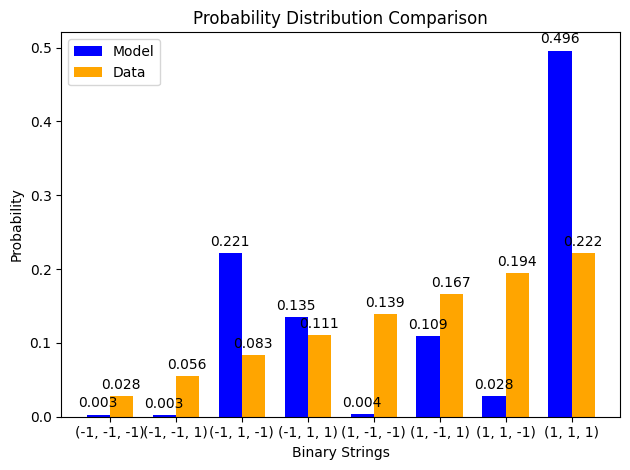

z gradient step for node 0: 0.00016867484149461575
z gradient step for node 1: -0.0005399760143923887
z gradient step for node 2: -0.00037534685462558594
z gradient step for node 3: -9.76380771352826e-05
edge graident step for edge (0, 3): -0.0002521197195420144
edge graident step for edge (1, 3): 0.0004051534667132013
edge graident step for edge (2, 3): 0.00027513648435405935
edge graident step for edge (0, 1): -5.962621417785587e-05
edge graident step for edge (0, 2): -0.0006595227767480562
edge graident step for edge (1, 2): -0.00027606970171357173
x positive phase: 0.0
x negative phase: 0.13404100674751757
x gradient step for node 0: -0.00013404100674751756
x positive phase: 0.0
x negative phase: 0.24169789892834473
x gradient step for node 1: -0.00024169789892834474
x positive phase: 0.0
x negative phase: 0.15220389473229085
x gradient step for node 2: -0.00015220389473229084
x positive phase: -0.17612974690204145
x negative phase: -0.20780032361976158
x gradient step for node 3: 

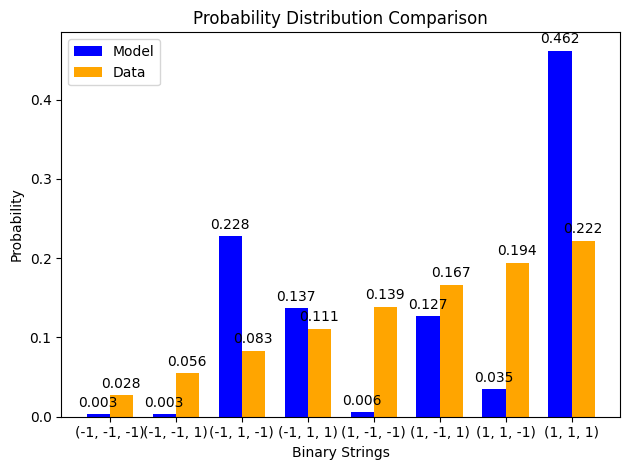

z gradient step for node 0: 0.00018648293395198017
z gradient step for node 1: -0.0005016369776486756
z gradient step for node 2: -0.0003454703355196061
z gradient step for node 3: -9.57597583471016e-05
edge graident step for edge (0, 3): -0.0002618683586715456
edge graident step for edge (1, 3): 0.0003750719049242041
edge graident step for edge (2, 3): 0.0002497793810061977
edge graident step for edge (0, 1): -5.547659155384738e-06
edge graident step for edge (0, 2): -0.0006389713079456169
edge graident step for edge (1, 2): -0.00021497464616657694
x positive phase: 0.0
x negative phase: 0.12476844325271952
x gradient step for node 0: -0.00012476844325271953
x positive phase: 0.0
x negative phase: 0.23375599360818042
x gradient step for node 1: -0.00023375599360818042
x positive phase: 0.0
x negative phase: 0.14621046853450523
x gradient step for node 2: -0.00014621046853450522
x positive phase: -0.1743369444969386
x negative phase: -0.20507300708701204
x gradient step for node 3: 3.0

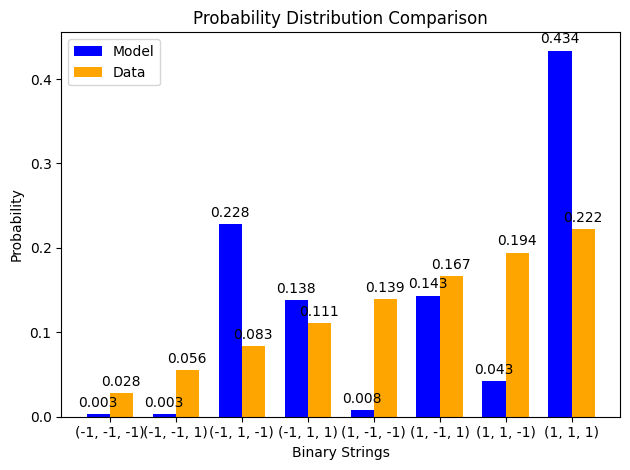

z gradient step for node 0: 0.00018982906467653466
z gradient step for node 1: -0.0004628599037252451
z gradient step for node 2: -0.0003252933986775788
z gradient step for node 3: -9.339777231593572e-05
edge graident step for edge (0, 3): -0.00025768894412770603
edge graident step for edge (1, 3): 0.00034390757852482
edge graident step for edge (2, 3): 0.00023399470980109757
edge graident step for edge (0, 1): 3.455781250363089e-05
edge graident step for edge (0, 2): -0.0006169649418853714
edge graident step for edge (1, 2): -0.000164939838596648
x positive phase: 0.0
x negative phase: 0.11593046545284758
x gradient step for node 0: -0.00011593046545284758
x positive phase: 0.0
x negative phase: 0.2247612175120926
x gradient step for node 1: -0.00022476121751209262
x positive phase: 0.0
x negative phase: 0.13940374378155937
x gradient step for node 2: -0.00013940374378155937
x positive phase: -0.17243526938565423
x negative phase: -0.20221261969963297
x gradient step for node 3: 2.977

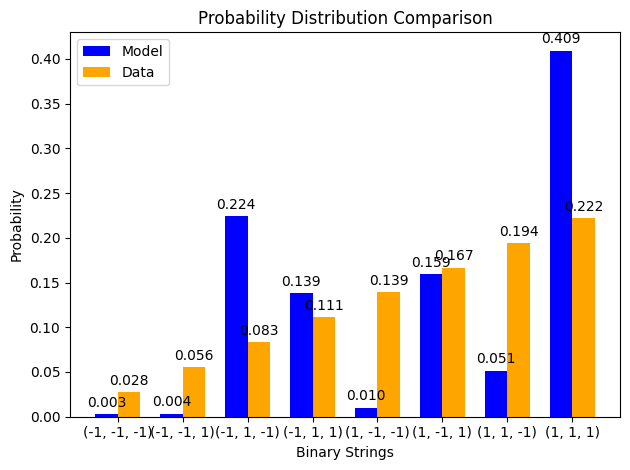

z gradient step for node 0: 0.00018423087129501613
z gradient step for node 1: -0.0004251045317611324
z gradient step for node 2: -0.0003098818936530236
z gradient step for node 3: -9.054357419646741e-05
edge graident step for edge (0, 3): -0.00024478308922998076
edge graident step for edge (1, 3): 0.0003131031496874268
edge graident step for edge (2, 3): 0.00022297189752603088
edge graident step for edge (0, 1): 6.468122706351576e-05
edge graident step for edge (0, 2): -0.0005923094588210664
edge graident step for edge (1, 2): -0.0001228962282012961
x positive phase: 0.0
x negative phase: 0.10755500378585087
x gradient step for node 0: -0.00010755500378585087
x positive phase: 0.0
x negative phase: 0.21482617164738974
x gradient step for node 1: -0.00021482617164738974
x positive phase: 0.0
x negative phase: 0.1322535212828739
x gradient step for node 2: -0.00013225352128287392
x positive phase: -0.17049085996902227
x negative phase: -0.19916203359058796
x gradient step for node 3: 2.

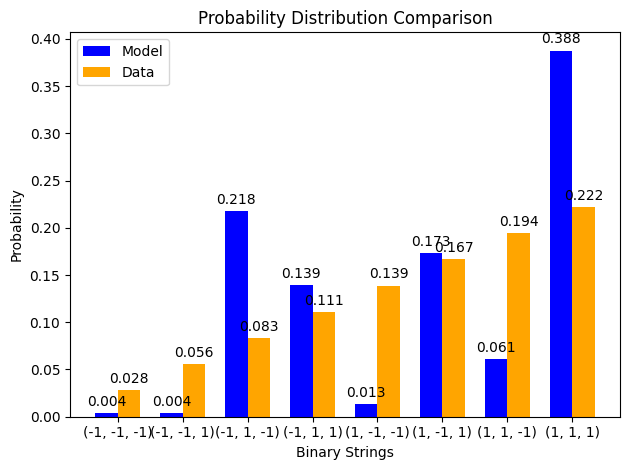

z gradient step for node 0: 0.00017335069431017209
z gradient step for node 1: -0.00038966182746592566
z gradient step for node 2: -0.00029586147035675096
z gradient step for node 3: -8.722238948280415e-05
edge graident step for edge (0, 3): -0.00022666006335492076
edge graident step for edge (1, 3): 0.0002840140985402586
edge graident step for edge (2, 3): 0.00021340186331726652
edge graident step for edge (0, 1): 8.716469448831516e-05
edge graident step for edge (0, 2): -0.0005644366772340146
edge graident step for edge (1, 2): -8.70866188258164e-05
x positive phase: 0.0
x negative phase: 0.09963649287644062
x gradient step for node 0: -9.963649287644062e-05
x positive phase: 0.0
x negative phase: 0.2041563481176753
x gradient step for node 1: -0.0002041563481176753
x positive phase: 0.0
x negative phase: 0.12499357395504408
x gradient step for node 2: -0.00012499357395504408
x positive phase: -0.16855247954239197
x negative phase: -0.1959176961520385
x gradient step for node 3: 2.73

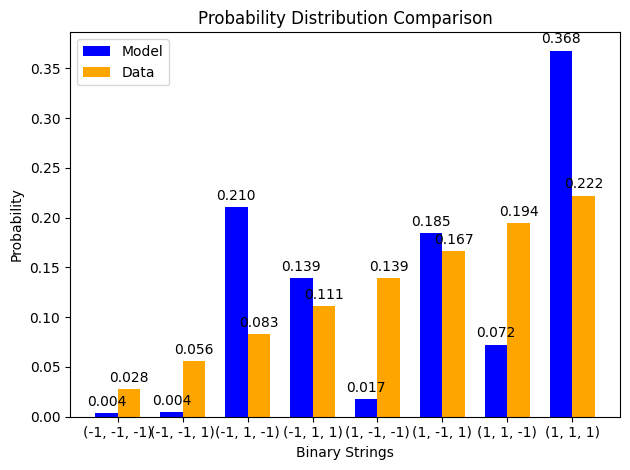

z gradient step for node 0: 0.0001594831228895418
z gradient step for node 1: -0.00035738559932386825
z gradient step for node 2: -0.0002811932258600199
z gradient step for node 3: -8.350051597605235e-05
edge graident step for edge (0, 3): -0.00020559234245758667
edge graident step for edge (1, 3): 0.00025758332257504917
edge graident step for edge (2, 3): 0.00020325221697711738
edge graident step for edge (0, 1): 0.00010344182224534224
edge graident step for edge (0, 2): -0.000533253273955903
edge graident step for edge (1, 2): -5.6543759403728395e-05
x positive phase: 0.0
x negative phase: 0.09215828387656576
x gradient step for node 0: -9.215828387656576e-05
x positive phase: 0.0
x negative phase: 0.19301838119237413
x gradient step for node 1: -0.00019301838119237415
x positive phase: 0.0
x negative phase: 0.1177319367282082
x gradient step for node 2: -0.0001177319367282082
x positive phase: -0.16665793112573232
x negative phase: -0.19251851758483815
x gradient step for node 3: 2.

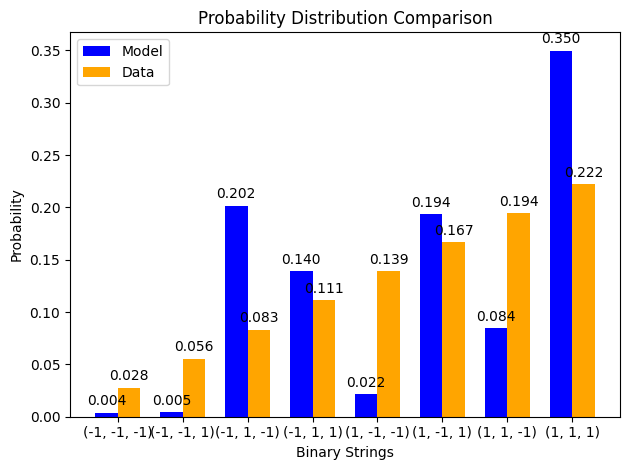

z gradient step for node 0: 0.00014401720433798477
z gradient step for node 1: -0.00032861639476349636
z gradient step for node 2: -0.00026487388896278386
z gradient step for node 3: -7.945788779576869e-05
edge graident step for edge (0, 3): -0.00018302483077021803
edge graident step for edge (1, 3): 0.00023425296539868166
edge graident step for edge (2, 3): 0.00019149951660747978
edge graident step for edge (0, 1): 0.00011456526530039397
edge graident step for edge (0, 2): -0.0004990711126641554
edge graident step for edge (1, 2): -3.0683408055183445e-05
x positive phase: 0.0
x negative phase: 0.08510055539577419
x gradient step for node 0: -8.510055539577419e-05
x positive phase: 0.0
x negative phase: 0.1816843965137048
x gradient step for node 1: -0.0001816843965137048
x positive phase: 0.0
x negative phase: 0.1105185643046793
x gradient step for node 2: -0.0001105185643046793
x positive phase: -0.16483709034100275
x negative phase: -0.18902526615032672
x gradient step for node 3: 2

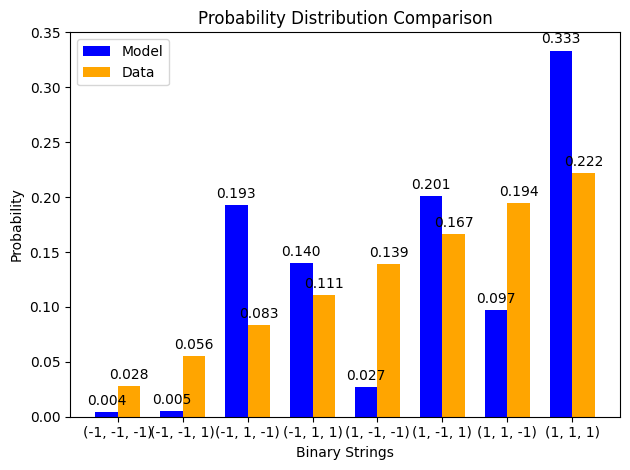

z gradient step for node 0: 0.00012779596333192206
z gradient step for node 1: -0.00030325741221235504
z gradient step for node 2: -0.0002466615689906993
z gradient step for node 3: -7.517329504233539e-05
edge graident step for edge (0, 3): -0.00015989364656640508
edge graident step for edge (1, 3): 0.0002140279121984875
edge graident step for edge (2, 3): 0.0001778730275538742
edge graident step for edge (0, 1): 0.00012148292804564435
edge graident step for edge (0, 2): -0.00046254420163737683
edge graident step for edge (1, 2): -9.081550123078105e-06
x positive phase: 0.0
x negative phase: 0.07844575641434635
x gradient step for node 0: -7.844575641434636e-05
x positive phase: 0.0
x negative phase: 0.17039029045527196
x gradient step for node 1: -0.00017039029045527195
x positive phase: 0.0
x negative phase: 0.10338491771320044
x gradient step for node 2: -0.00010338491771320043
x positive phase: -0.16311346938120014
x negative phase: -0.18550641897656267
x gradient step for node 3: 

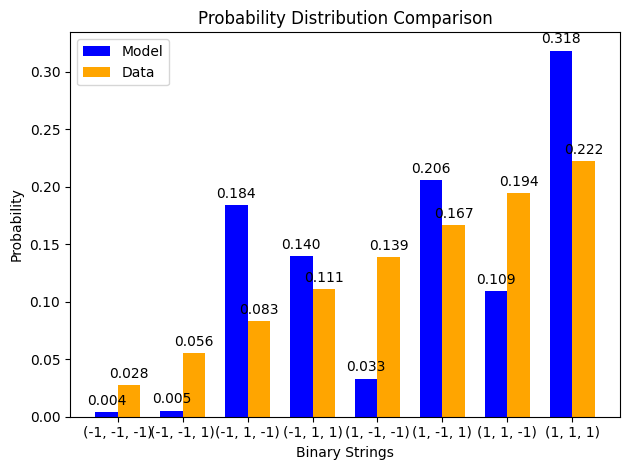

z gradient step for node 0: 0.00011136547755168536
z gradient step for node 1: -0.0002809268439480347
z gradient step for node 2: -0.00022683451007789017
z gradient step for node 3: -7.072525948784648e-05
edge graident step for edge (0, 3): -0.0001368476266185309
edge graident step for edge (1, 3): 0.00019661077057214665
edge graident step for edge (2, 3): 0.00016261515935016635
edge graident step for edge (0, 1): 0.0001251295336194272
edge graident step for edge (0, 2): -0.00042457637179895493
edge graident step for edge (1, 2): 8.622186911373579e-06
x positive phase: 0.0
x negative phase: 0.07218216434642313
x gradient step for node 0: -7.218216434642313e-05
x positive phase: 0.0
x negative phase: 0.15931699412012984
x gradient step for node 1: -0.00015931699412012983
x positive phase: 0.0
x negative phase: 0.09636439818534878
x gradient step for node 2: -9.636439818534879e-05
x positive phase: -0.16150499919010883
x negative phase: -0.18203072069416598
x gradient step for node 3: 2.

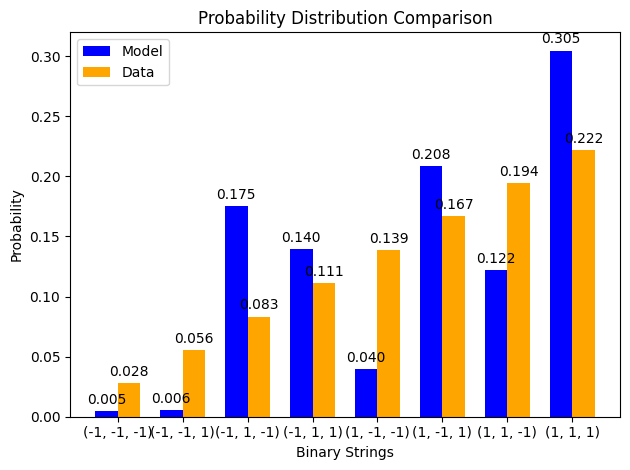

z gradient step for node 0: 9.512380325731019e-05
z gradient step for node 1: -0.0002611181244577281
z gradient step for node 2: -0.0002059774545718438
z gradient step for node 3: -6.619749639123362e-05
edge graident step for edge (0, 3): -0.00011437864860542163
edge graident step for edge (1, 3): 0.00018154812455524295
edge graident step for edge (2, 3): 0.00014626424823075462
edge graident step for edge (0, 1): 0.00012641208186258505
edge graident step for edge (0, 2): -0.00038619745913006195
edge graident step for edge (1, 2): 2.2762495088098004e-05
x positive phase: 0.0
x negative phase: 0.06630442557253022
x gradient step for node 0: -6.630442557253021e-05
x positive phase: 0.0
x negative phase: 0.148589955824953
x gradient step for node 1: -0.00014858995582495298
x positive phase: 0.0
x negative phase: 0.0894992294230675
x gradient step for node 2: -8.94992294230675e-05
x positive phase: -0.16002434448233813
x negative phase: -0.17866280930213535
x gradient step for node 3: 1.863

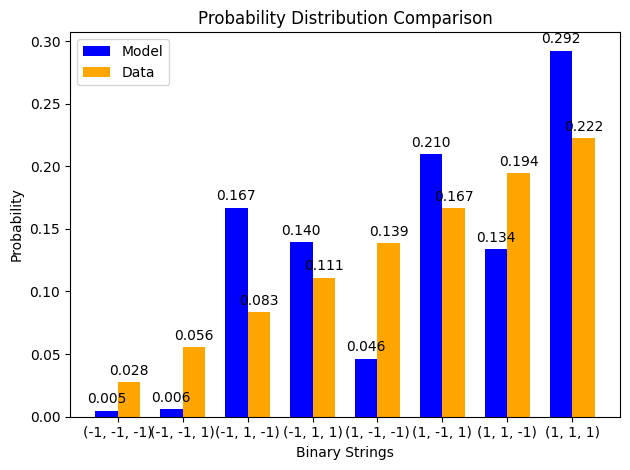

z gradient step for node 0: 7.939147974999128e-05
z gradient step for node 1: -0.00024332639496840394
z gradient step for node 2: -0.0001847984880520634
z gradient step for node 3: -6.167997813912374e-05
edge graident step for edge (0, 3): -9.288049922907998e-05
edge graident step for edge (1, 3): 0.00016835289887486755
edge graident step for edge (2, 3): 0.0001294713982146039
edge graident step for edge (0, 1): 0.00012615260403774588
edge graident step for edge (0, 2): -0.000348428739700996
edge graident step for edge (1, 2): 3.366758407691629e-05
x positive phase: 0.0
x negative phase: 0.06081128550232709
x gradient step for node 0: -6.081128550232709e-05
x positive phase: 0.0
x negative phase: 0.13828851374092258
x gradient step for node 1: -0.00013828851374092258
x positive phase: 0.0
x negative phase: 0.08283858948500322
x gradient step for node 2: -8.283858948500322e-05
x positive phase: -0.15867904274530034
x negative phase: -0.17545950626563708
x gradient step for node 3: 1.678

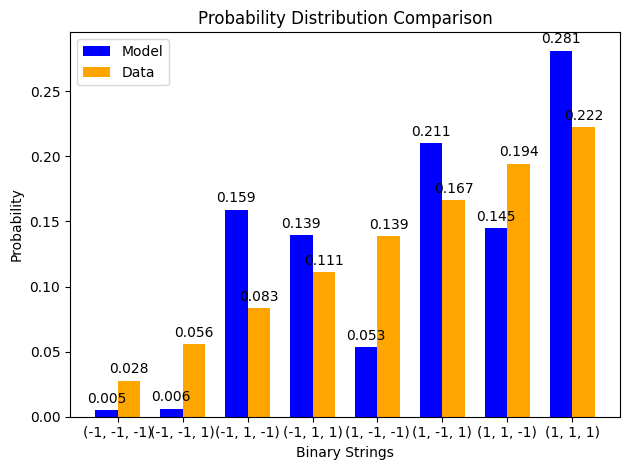

z gradient step for node 0: 6.443215649416278e-05
z gradient step for node 1: -0.00022712609662953024
z gradient step for node 2: -0.00016398645881412978
z gradient step for node 3: -5.7263584074301325e-05
edge graident step for edge (0, 3): -7.266428408472175e-05
edge graident step for edge (1, 3): 0.00015658800906662593
edge graident step for edge (2, 3): 0.0001128635954310789
edge graident step for edge (0, 1): 0.00012503160589818989
edge graident step for edge (0, 2): -0.0003121665860182538
edge graident step for edge (1, 2): 4.1672605729929814e-05
x positive phase: 0.0
x negative phase: 0.05570195759569367
x gradient step for node 0: -5.570195759569367e-05
x positive phase: 0.0
x negative phase: 0.12845826565317825
x gradient step for node 1: -0.00012845826565317824
x positive phase: 0.0
x negative phase: 0.07643256832548741
x gradient step for node 2: -7.643256832548741e-05
x positive phase: -0.1574717394637105
x negative phase: -0.17246647159297857
x gradient step for node 3: 1.

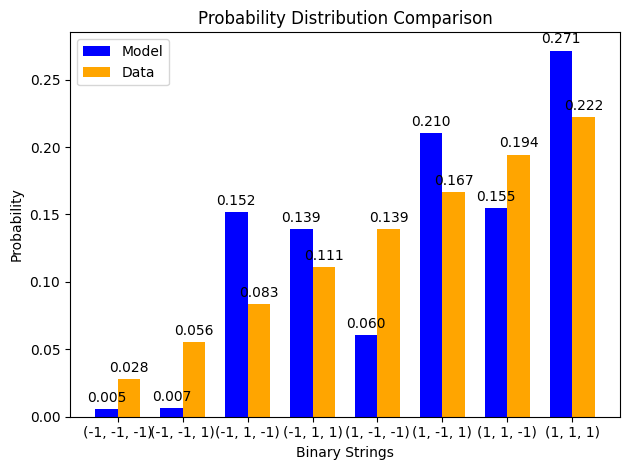

z gradient step for node 0: 5.0450620731368914e-05
z gradient step for node 1: -0.00021220269398245336
z gradient step for node 2: -0.00014411757491982703
z gradient step for node 3: -5.30314045174255e-05
edge graident step for edge (0, 3): -5.3956691853396746e-05
edge graident step for edge (1, 3): 0.0001459099586986048
edge graident step for edge (2, 3): 9.695895380005185e-05
edge graident step for edge (0, 1): 0.00012355588648829902
edge graident step for edge (0, 2): -0.00027810656833019955
edge graident step for edge (1, 2): 4.712677070430936e-05
x positive phase: 0.0
x negative phase: 0.05097278198687476
x gradient step for node 0: -5.0972781986874755e-05
x positive phase: 0.0
x negative phase: 0.11912232152600008
x gradient step for node 1: -0.00011912232152600008
x positive phase: 0.0
x negative phase: 0.07032570729027283
x gradient step for node 2: -7.032570729027283e-05
x positive phase: -0.1564006788579858
x negative phase: -0.16971596971730452
x gradient step for node 3: 1.

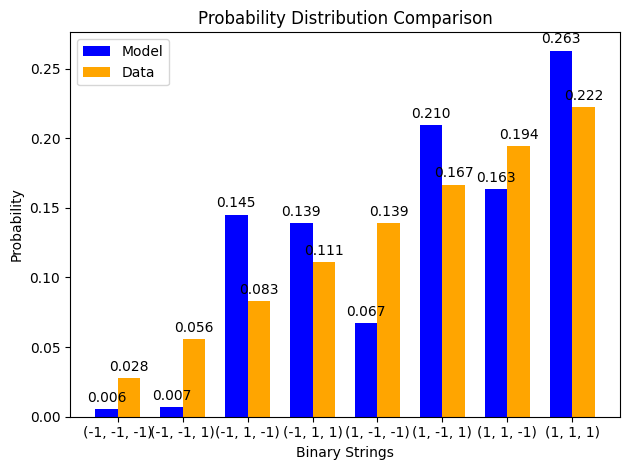

z gradient step for node 0: 3.75874207826975e-05
z gradient step for node 1: -0.0001983506543385004
z gradient step for node 2: -0.00012561114296219745
z gradient step for node 3: -4.90509061958454e-05
edge graident step for edge (0, 3): -3.6898444307716607e-05
edge graident step for edge (1, 3): 0.00013607922138581958
edge graident step for edge (2, 3): 8.213018654916866e-05
edge graident step for edge (0, 1): 0.0001220570789404743
edge graident step for edge (0, 2): -0.0002467149290053794
edge graident step for edge (1, 2): 5.039172927037845e-05
x positive phase: 0.0
x negative phase: 0.046615211921188816
x gradient step for node 0: -4.6615211921188816e-05
x positive phase: 0.0
x negative phase: 0.11028973540778078
x gradient step for node 1: -0.00011028973540778079
x positive phase: 0.0
x negative phase: 0.06455240467135406
x gradient step for node 2: -6.455240467135406e-05
x positive phase: -0.15546045669439723
x negative phase: -0.16722634794908717
x gradient step for node 3: 1.17

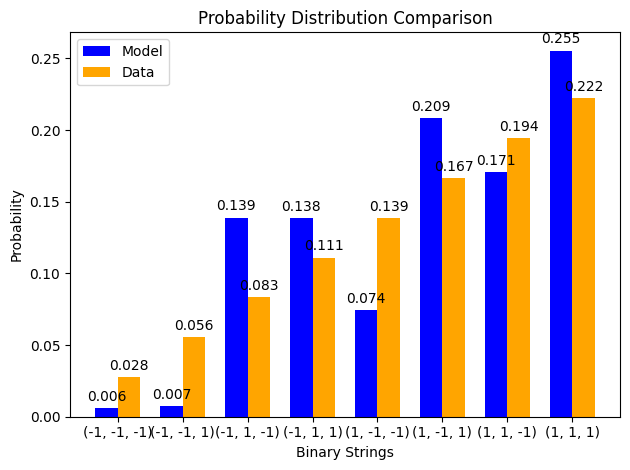

z gradient step for node 0: 2.591917920465353e-05
z gradient step for node 1: -0.00018545210931798014
z gradient step for node 2: -0.00010872497378486405
z gradient step for node 3: -4.5369560316458445e-05
edge graident step for edge (0, 3): -2.1549922854545322e-05
edge graident step for edge (1, 3): 0.00012694827179042734
edge graident step for edge (2, 3): 6.860443569391178e-05
edge graident step for edge (0, 1): 0.00012071500368042989
edge graident step for edge (0, 2): -0.00021823987565542912
edge graident step for edge (1, 2): 5.183197324333508e-05
x positive phase: 0.0
x negative phase: 0.04261534460350562
x gradient step for node 0: -4.261534460350562e-05
x positive phase: 0.0
x negative phase: 0.10196097216078862
x gradient step for node 1: -0.00010196097216078862
x positive phase: 0.0
x negative phase: 0.05913491599081807
x gradient step for node 2: -5.9134915990818074e-05
x positive phase: -0.15464293057994188
x negative phase: -0.1650031845885818
x gradient step for node 3: 

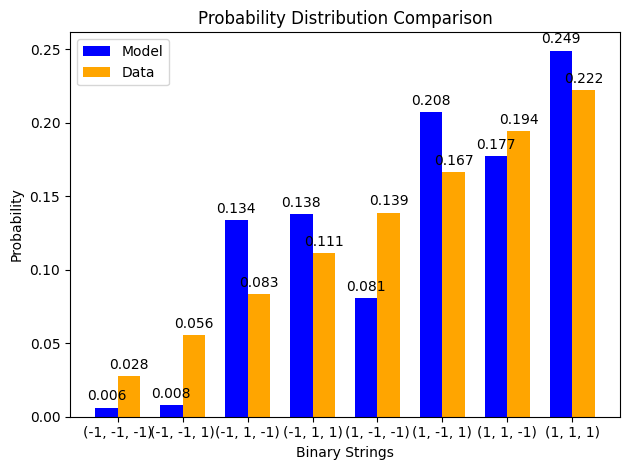

z gradient step for node 0: 1.546591064357822e-05
z gradient step for node 1: -0.00017344862229103406
z gradient step for node 2: -9.357598436277164e-05
z gradient step for node 3: -4.201432775477898e-05
edge graident step for edge (0, 3): -7.903697727566494e-06
edge graident step for edge (1, 3): 0.00011843854388774736
edge graident step for edge (2, 3): 5.6484650732649145e-05
edge graident step for edge (0, 1): 0.00011959443314009178
edge graident step for edge (0, 2): -0.00019274762334082785
edge graident step for edge (1, 2): 5.180095025956229e-05
x positive phase: 0.0
x negative phase: 0.03895463796051451
x gradient step for node 0: -3.895463796051451e-05
x positive phase: 0.0
x negative phase: 0.09413102744110308
x gradient step for node 1: -9.413102744110308e-05
x positive phase: 0.0
x negative phase: 0.05408358492019322
x gradient step for node 2: -5.408358492019322e-05
x positive phase: -0.15393814861875735
x negative phase: -0.16304155971276665
x gradient step for node 3: 9.1

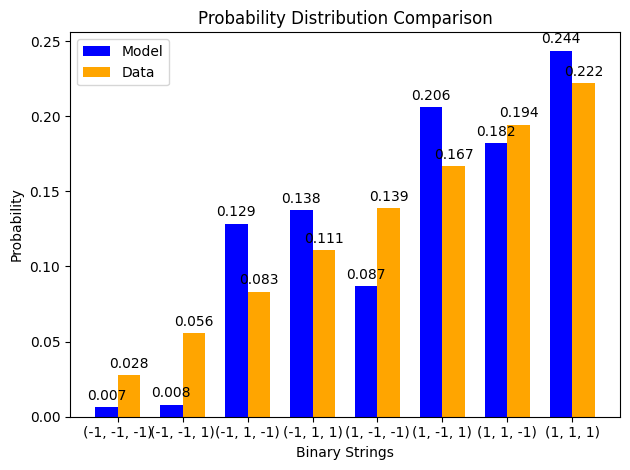

z gradient step for node 0: 6.202803283885117e-06
z gradient step for node 1: -0.00016231452090993782
z gradient step for node 2: -8.01720210304086e-05
z gradient step for node 3: -3.899397418896411e-05
edge graident step for edge (0, 3): 4.09938465235582e-06
edge graident step for edge (1, 3): 0.00011051534848948068
edge graident step for edge (2, 3): 4.5779526536644604e-05
edge graident step for edge (0, 1): 0.00011868423207434334
edge graident step for edge (0, 2): -0.00017016804322453962
edge graident step for edge (1, 2): 5.062723407389e-05
x positive phase: 0.0
x negative phase: 0.035611254522058725
x gradient step for node 0: -3.5611254522058725e-05
x positive phase: 0.0
x negative phase: 0.08679101929289082
x gradient step for node 1: -8.679101929289081e-05
x positive phase: 0.0
x negative phase: 0.049398480917428225
x gradient step for node 2: -4.9398480917428226e-05
x positive phase: -0.15333518341492075
x negative phase: -0.16132876793076634
x gradient step for node 3: 7.993

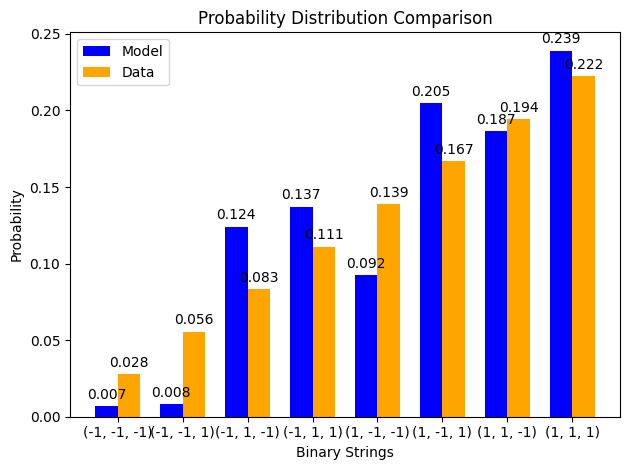

z gradient step for node 0: -1.92677343243558e-06
z gradient step for node 1: -0.00015203615558316368
z gradient step for node 2: -6.844480101235456e-05
z gradient step for node 3: -3.630280445374124e-05
edge graident step for edge (0, 3): 1.4553972393957394e-05
edge graident step for edge (1, 3): 0.00010316635941010992
edge graident step for edge (2, 3): 3.6433230335888995e-05
edge graident step for edge (0, 1): 0.00011793138445970555
edge graident step for edge (0, 2): -0.00015033901843580866
edge graident step for edge (1, 2): 4.860390569608586e-05
x positive phase: 0.0
x negative phase: 0.03256154441132986
x gradient step for node 0: -3.2561544411329855e-05
x positive phase: 0.0
x negative phase: 0.07992895812709108
x gradient step for node 1: -7.992895812709108e-05
x positive phase: 0.0
x negative phase: 0.04507163670009077
x gradient step for node 2: -4.507163670009077e-05
x positive phase: -0.15282280905710666
x negative phase: -0.15984693536214917
x gradient step for node 3: 7.

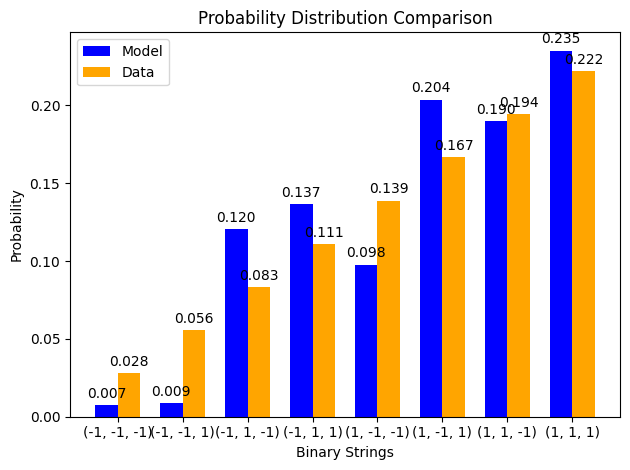

z gradient step for node 0: -8.999393085651897e-06
z gradient step for node 1: -0.00014259827371618987
z gradient step for node 2: -5.827841668375811e-05
z gradient step for node 3: -3.392467485592865e-05
edge graident step for edge (0, 3): 2.3576050573022643e-05
edge graident step for edge (1, 3): 9.638604868525585e-05
edge graident step for edge (2, 3): 2.8350431418120105e-05
edge graident step for edge (0, 1): 0.00011726650745147963
edge graident step for edge (0, 2): -0.00013304371742543875
edge graident step for edge (1, 2): 4.5982501985159896e-05
x positive phase: 0.0
x negative phase: 0.029781358417605843
x gradient step for node 0: -2.9781358417605845e-05
x positive phase: 0.0
x negative phase: 0.07353017707789139
x gradient step for node 1: -7.35301770778914e-05
x positive phase: 0.0
x negative phase: 0.0410893147299743
x gradient step for node 2: -4.10893147299743e-05
x positive phase: -0.1523900052301105
x negative phase: -0.15857523837680268
x gradient step for node 3: 6.18

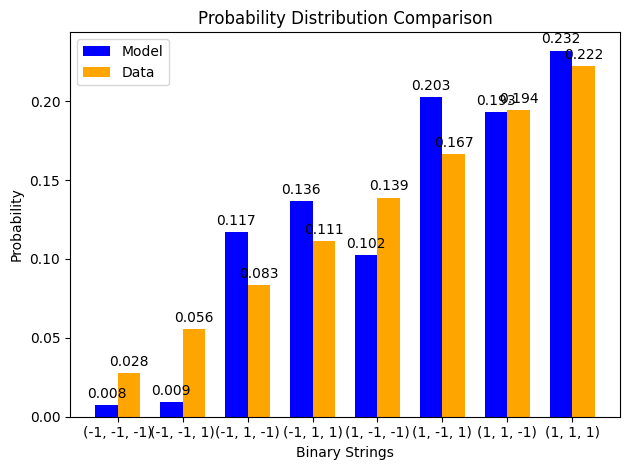

z gradient step for node 0: -1.5101987205717594e-05
z gradient step for node 1: -0.0001339767751278553
z gradient step for node 2: -4.953140428021624e-05
z gradient step for node 3: -3.183660863916571e-05
edge graident step for edge (0, 3): 3.129178076099465e-05
edge graident step for edge (1, 3): 9.016617037858651e-05
edge graident step for edge (2, 3): 2.1415259695867384e-05
edge graident step for edge (0, 1): 0.00011662055564217746
edge graident step for edge (0, 2): -0.00011803896837269098
edge graident step for edge (1, 2): 4.297140079391747e-05
x positive phase: 0.0
x negative phase: 0.027247054203134273
x gradient step for node 0: -2.7247054203134272e-05
x positive phase: 0.0
x negative phase: 0.06757768772122746
x gradient step for node 1: -6.757768772122747e-05
x positive phase: 0.0
x negative phase: 0.03743399238397467
x gradient step for node 2: -3.743399238397467e-05
x positive phase: -0.1520263027251019
x negative phase: -0.15749162232899228
x gradient step for node 3: 5.4

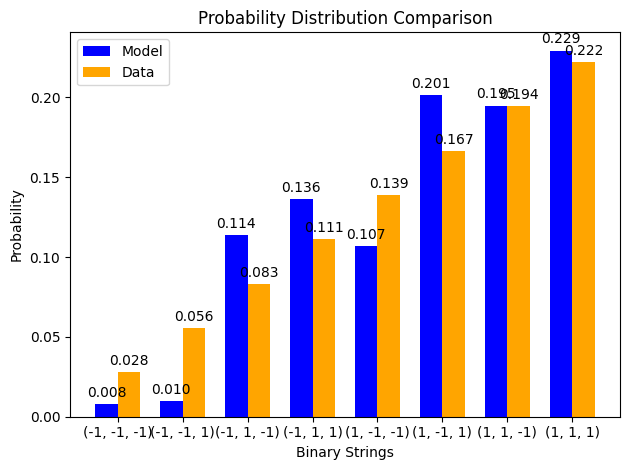

z gradient step for node 0: -2.0324792534796356e-05
z gradient step for node 1: -0.0001261362707901132
z gradient step for node 2: -4.205249819637735e-05
z gradient step for node 3: -3.001173533014201e-05
edge graident step for edge (0, 3): 3.782937391847985e-05
edge graident step for edge (1, 3): 8.44911827592757e-05
edge graident step for edge (2, 3): 1.5504565474956044e-05
edge graident step for edge (0, 1): 0.00011593413832189428
edge graident step for edge (0, 2): -0.00010507524856004591
edge graident step for edge (1, 2): 3.973767183125893e-05
x positive phase: 0.0
x negative phase: 0.024936176873487516
x gradient step for node 0: -2.4936176873487515e-05
x positive phase: 0.0
x negative phase: 0.062052568610932536
x gradient step for node 1: -6.205256861093254e-05
x positive phase: 0.0
x negative phase: 0.034085950836847345
x gradient step for node 2: -3.4085950836847344e-05
x positive phase: -0.15172199843863265
x negative phase: -0.15657404196869462
x gradient step for node 3: 

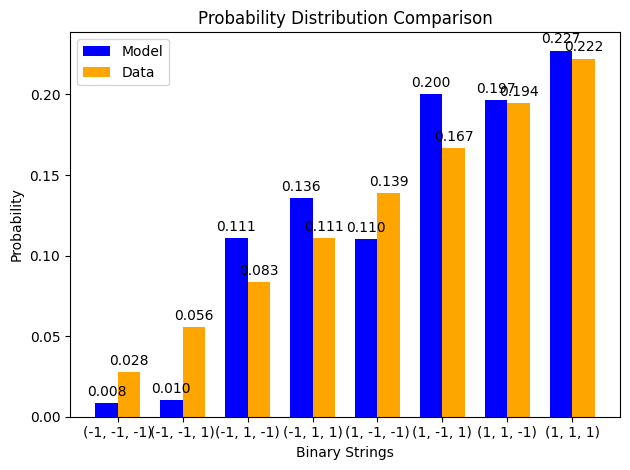

z gradient step for node 0: -2.475656189840314e-05
z gradient step for node 1: -0.00011903074900037111
z gradient step for node 2: -3.56911328711612e-05
z gradient step for node 3: -2.842152023251998e-05
edge graident step for edge (0, 3): 4.331358110277978e-05
edge graident step for edge (1, 3): 7.933711696819039e-05
edge graident step for edge (2, 3): 1.0496565062835028e-05
edge graident step for edge (0, 1): 0.00011516146366675557
edge graident step for edge (0, 2): -9.390980135901918e-05
edge graident step for edge (1, 2): 3.6411164926481876e-05
x positive phase: 0.0
x negative phase: 0.02282785744364585
x gradient step for node 0: -2.282785744364585e-05
x positive phase: 0.0
x negative phase: 0.05693440236095246
x gradient step for node 1: -5.693440236095246e-05
x positive phase: 0.0
x negative phase: 0.03102446812295865
x gradient step for node 2: -3.102446812295865e-05
x positive phase: -0.15146827061883933
x negative phase: -0.15580130057200006
x gradient step for node 3: 4.333

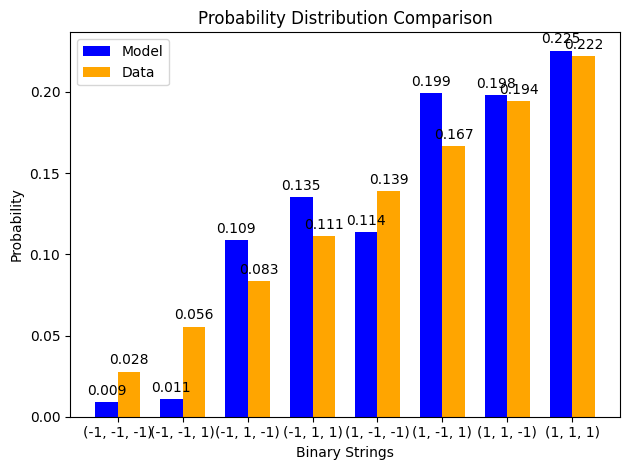

z gradient step for node 0: -2.848157491010617e-05
z gradient step for node 1: -0.00011260591451325749
z gradient step for node 2: -3.030397032700674e-05
z gradient step for node 3: -2.7037367229692854e-05
edge graident step for edge (0, 3): 4.7862241448460906e-05
edge graident step for edge (1, 3): 7.467250800280221e-05
edge graident step for edge (2, 3): 6.276067001559888e-06
edge graident step for edge (0, 1): 0.00011427083130102585
edge graident step for edge (0, 2): -8.431458111661878e-05
edge graident step for edge (1, 2): 3.3089717167804304e-05
x positive phase: 0.0
x negative phase: 0.020902994989022934
x gradient step for node 0: -2.0902994989022933e-05
x positive phase: 0.0
x negative phase: 0.05220173617836546
x gradient step for node 1: -5.2201736178365464e-05
x positive phase: 0.0
x negative phase: 0.028228670533035252
x gradient step for node 2: -2.8228670533035253e-05
x positive phase: -0.15125722199926092
x negative phase: -0.15515357734866628
x gradient step for node 3

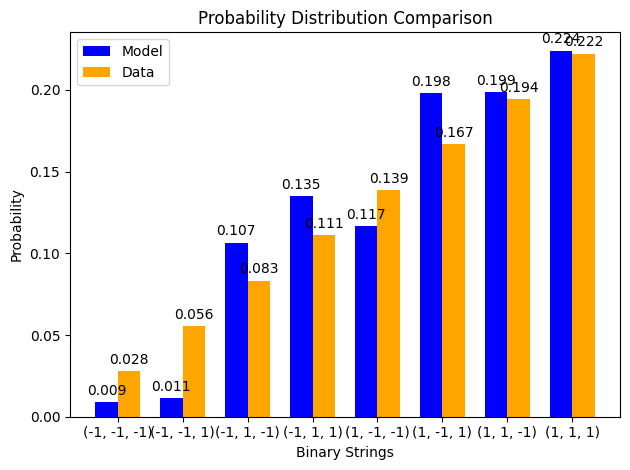

z gradient step for node 0: -3.157797295971354e-05
z gradient step for node 1: -0.00010680215780964172
z gradient step for node 2: -2.57586010063076e-05
z gradient step for node 3: -2.5831714726927914e-05
edge graident step for edge (0, 3): 5.1584347649518635e-05
edge graident step for edge (1, 3): 7.046032060700995e-05
edge graident step for edge (2, 3): 2.7373128058146845e-06
edge graident step for edge (0, 1): 0.00011324319926575823
edge graident step for edge (0, 2): -7.608052979801018e-05
edge graident step for edge (1, 2): 2.9844631719256164e-05
x positive phase: 0.0
x negative phase: 0.019144287755644036
x gradient step for node 0: -1.9144287755644035e-05
x positive phase: 0.0
x negative phase: 0.047832531301607334
x gradient step for node 1: -4.7832531301607336e-05
x positive phase: 0.0
x negative phase: 0.025678112393341532
x gradient step for node 2: -2.567811239334153e-05
x positive phase: -0.15108187326722775
x negative phase: -0.15461272448595914
x gradient step for node 3

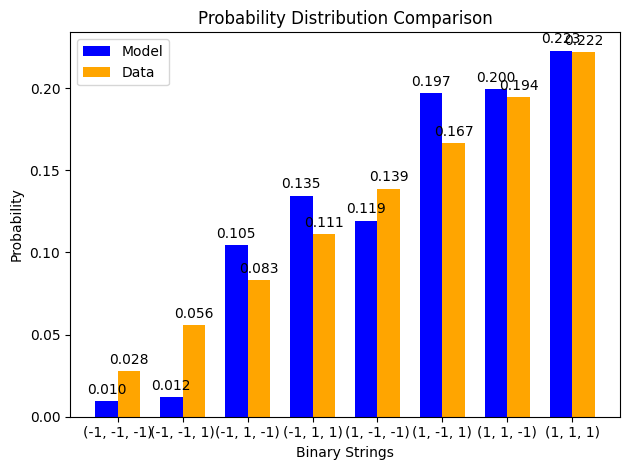

z gradient step for node 0: -3.411701274051282e-05
z gradient step for node 1: -0.00010155749000512559
z gradient step for node 2: -2.1935322461334645e-05
z gradient step for node 3: -2.477874166395355e-05
edge graident step for edge (0, 3): 5.457917752998198e-05
edge graident step for edge (1, 3): 6.666015202241045e-05
edge graident step for edge (2, 3): -2.1477120485863254e-07
edge graident step for edge (0, 1): 0.0001120698952193524
edge graident step for edge (0, 2): -6.901937090751748e-05
edge graident step for edge (1, 2): 2.6725876272446825e-05
x positive phase: 0.0
x negative phase: 0.017536167854671984
x gradient step for node 0: -1.7536167854671985e-05
x positive phase: 0.0
x negative phase: 0.04380457267651745
x gradient step for node 1: -4.380457267651746e-05
x positive phase: 0.0
x negative phase: 0.02335315104809088
x gradient step for node 2: -2.3353151048090883e-05
x positive phase: -0.1509361240401229
x negative phase: -0.15416240005903625
x gradient step for node 3: 3

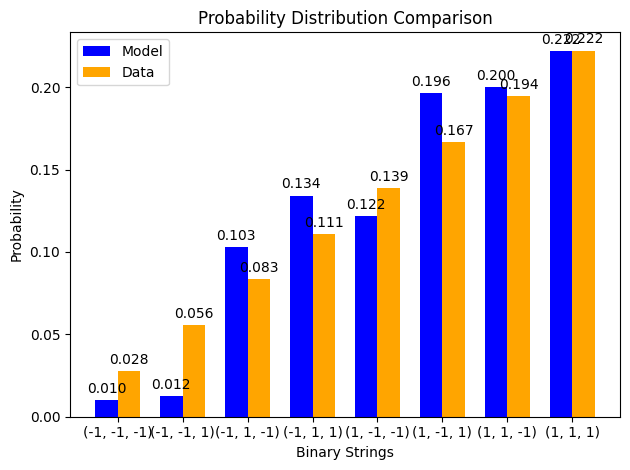

z gradient step for node 0: -3.6162924224108104e-05
z gradient step for node 1: -9.6810080924116e-05
z gradient step for node 2: -1.8727659397870994e-05
z gradient step for node 3: -2.3854782919946026e-05
edge graident step for edge (0, 3): 5.6936142289480794e-05
edge graident step for edge (1, 3): 6.323028963100664e-05
edge graident step for edge (2, 3): -2.66433702229793e-06
edge graident step for edge (0, 1): 0.00011075014440287503
edge graident step for edge (0, 2): -6.296379484047611e-05
edge graident step for edge (1, 2): 2.3766698401704977e-05
x positive phase: 0.0
x negative phase: 0.016064680848646182
x gradient step for node 0: -1.6064680848646183e-05
x positive phase: 0.0
x negative phase: 0.04009582104882716
x gradient step for node 1: -4.009582104882716e-05
x positive phase: 0.0
x negative phase: 0.021235173093279713
x gradient step for node 2: -2.1235173093279712e-05
x positive phase: -0.15081469399334904
x negative phase: -0.15378808773577812
x gradient step for node 3: 

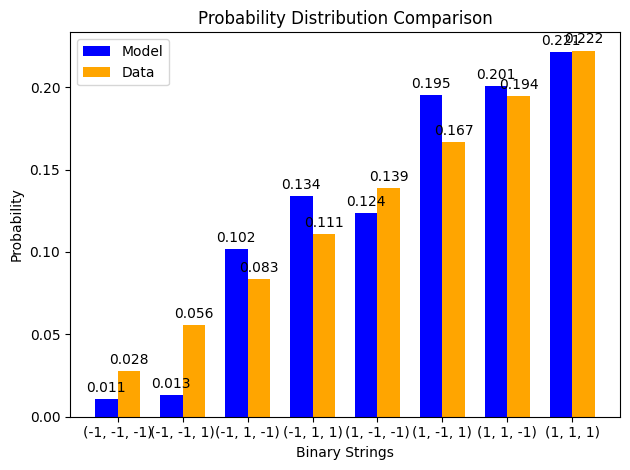

z gradient step for node 0: -3.777314428520806e-05
z gradient step for node 1: -9.250024996655157e-05
z gradient step for node 2: -1.604209146472041e-05
z gradient step for node 3: -2.303853330847927e-05
edge graident step for edge (0, 3): 5.873509373090036e-05
edge graident step for edge (1, 3): 6.0129417625982644e-05
edge graident step for edge (2, 3): -4.684996441472078e-06
edge graident step for edge (0, 1): 0.00010928878826829481
edge graident step for edge (0, 2): -5.7766653211844616e-05
edge graident step for edge (1, 2): 2.0987536169724264e-05
x positive phase: 0.0
x negative phase: 0.014717339210853823
x gradient step for node 0: -1.4717339210853823e-05
x positive phase: 0.0
x negative phase: 0.036684700039939844
x gradient step for node 1: -3.6684700039939844e-05
x positive phase: 0.0
x negative phase: 0.019306715668755012
x gradient step for node 2: -1.9306715668755013e-05
x positive phase: -0.1507130531932597
x negative phase: -0.15347704123143274
x gradient step for node 3

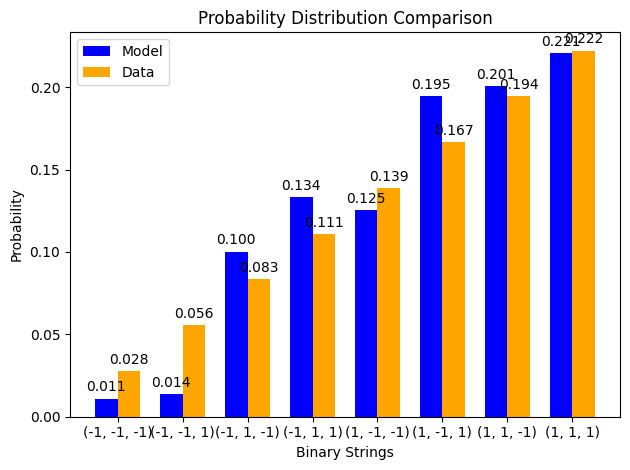

z gradient step for node 0: -3.8998766306423185e-05
z gradient step for node 1: -8.857189233912439e-05
z gradient step for node 2: -1.3797308146879434e-05
z gradient step for node 3: -2.231110143293458e-05
edge graident step for edge (0, 3): 6.0046906737494686e-05
edge graident step for edge (1, 3): 5.731790730252628e-05
edge graident step for edge (2, 3): -6.340554495525452e-06
edge graident step for edge (0, 1): 0.00010769436550420332
edge graident step for edge (0, 2): -5.329958543519588e-05
edge graident step for edge (1, 2): 1.839921853112128e-05
x positive phase: 0.0
x negative phase: 0.013482968675342807
x gradient step for node 0: -1.3482968675342808e-05
x positive phase: 0.0
x negative phase: 0.03355031858155987
x gradient step for node 1: -3.355031858155987e-05
x positive phase: 0.0
x negative phase: 0.017551515583512624
x gradient step for node 2: -1.7551515583512623e-05
x positive phase: -0.1506273479598163
x negative phase: -0.15321818127329512
x gradient step for node 3: 

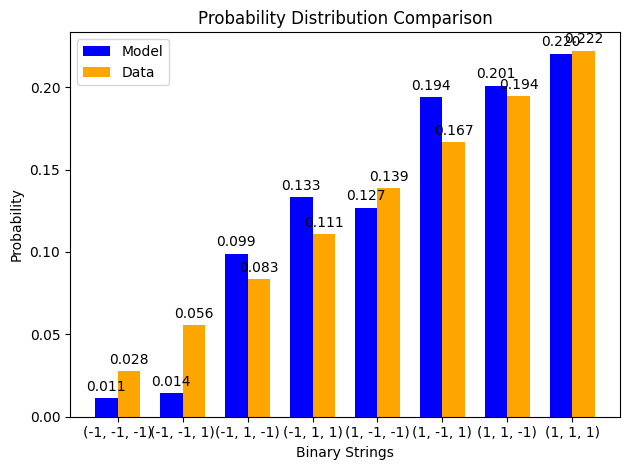

z gradient step for node 0: -3.9885098134912145e-05
z gradient step for node 1: -8.497339621243402e-05
z gradient step for node 2: -1.19232055837383e-05
z gradient step for node 3: -2.1655960079641322e-05
edge graident step for edge (0, 3): 6.0934209516414265e-05
edge graident step for edge (1, 3): 5.475870671682641e-05
edge graident step for edge (2, 3): -7.685919634186106e-06
edge graident step for edge (0, 1): 0.00010597760257618981
edge graident step for edge (0, 2): -4.945136055154507e-05
edge graident step for edge (1, 2): 1.600551519759058e-05
x positive phase: 0.0
x negative phase: 0.0123515590797895
x gradient step for node 0: -1.2351559079789499e-05
x positive phase: 0.0
x negative phase: 0.030672634008084076
x gradient step for node 1: -3.067263400808408e-05
x positive phase: 0.0
x negative phase: 0.015954510090666174
x gradient step for node 2: -1.5954510090666175e-05
x positive phase: -0.15055432655809559
x negative phase: -0.153001965087164
x gradient step for node 3: 2.4

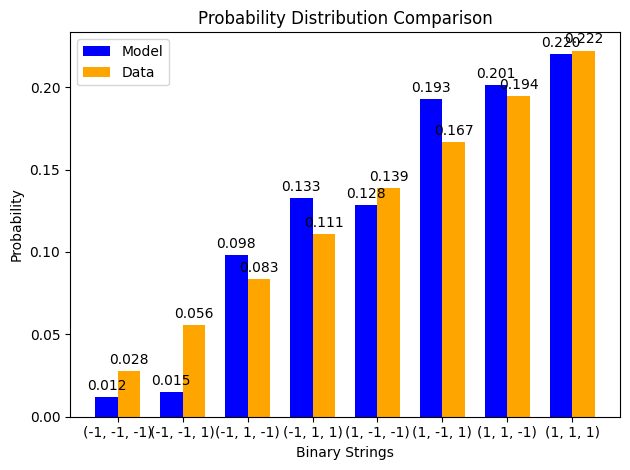

z gradient step for node 0: -4.047225822521111e-05
z gradient step for node 1: -8.165813857577378e-05
z gradient step for node 2: -1.0359767576665194e-05
z gradient step for node 3: -2.1058828337987002e-05
edge graident step for edge (0, 3): 6.145217544043225e-05
edge graident step for edge (1, 3): 5.241788536041796e-05
edge graident step for edge (2, 3): -8.768077828704757e-06
edge graident step for edge (0, 1): 0.00010415029183587572
edge graident step for edge (0, 2): -4.612611879838602e-05
edge graident step for edge (1, 2): 1.3805125166830967e-05
x positive phase: 0.0
x negative phase: 0.011314126111664501
x gradient step for node 0: -1.1314126111664501e-05
x positive phase: 0.0
x negative phase: 0.02803256363060351
x gradient step for node 1: -2.8032563630603512e-05
x positive phase: 0.0
x negative phase: 0.014501806262336403
x gradient step for node 2: -1.4501806262336404e-05
x positive phase: -0.15049126753534242
x negative phase: -0.1528202426067818
x gradient step for node 3:

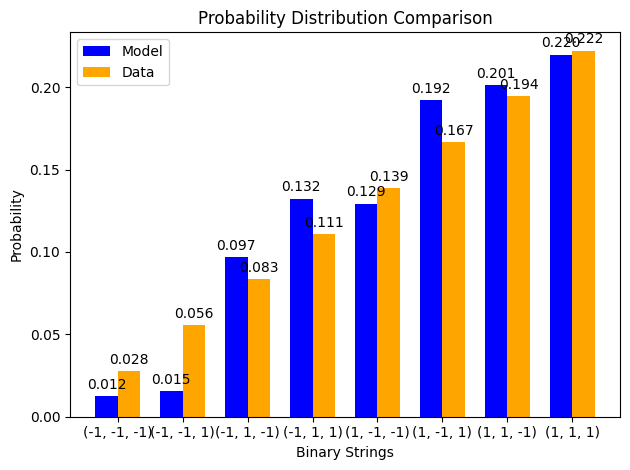

z gradient step for node 0: -4.079576596987744e-05
z gradient step for node 1: -7.858465462407696e-05
z gradient step for node 2: -9.055923197023086e-06
z gradient step for node 3: -2.0507511679328294e-05
edge graident step for edge (0, 3): 6.164931998033668e-05
edge graident step for edge (1, 3): 5.026490337311525e-05
edge graident step for edge (2, 3): -9.627059892392542e-06
edge graident step for edge (0, 1): 0.00010222450268927424
edge graident step for edge (0, 2): -4.324162941410678e-05
edge graident step for edge (1, 2): 1.1793200327309878e-05
x positive phase: 0.0
x negative phase: 0.010362586921262185
x gradient step for node 0: -1.0362586921262185e-05
x positive phase: 0.0
x negative phase: 0.02561205344122168
x gradient step for node 1: -2.561205344122168e-05
x positive phase: 0.0
x negative phase: 0.013180630836023718
x gradient step for node 2: -1.3180630836023719e-05
x positive phase: -0.15043591244779178
x negative phase: -0.15266610927252286
x gradient step for node 3: 

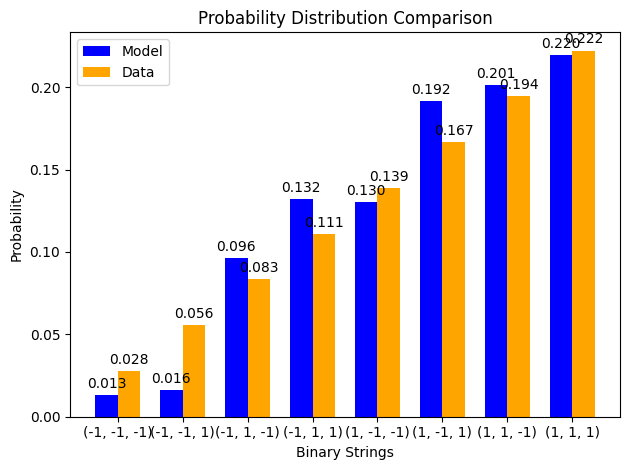

z gradient step for node 0: -4.088710008210467e-05
z gradient step for node 1: -7.571656874140154e-05
z gradient step for node 2: -7.968439255467087e-06
z gradient step for node 3: -1.999171925323051e-05
edge graident step for edge (0, 3): 6.156826715451829e-05
edge graident step for edge (1, 3): 4.827267388247016e-05
edge graident step for edge (2, 3): -1.0296859527907098e-05
edge graident step for edge (0, 1): 0.00010021206088842705
edge graident step for edge (0, 2): -4.072763482033845e-05
edge graident step for edge (1, 2): 9.962495253005244e-06
x positive phase: 0.0
x negative phase: 0.009489650398395652
x gradient step for node 0: -9.489650398395651e-06
x positive phase: 0.0
x negative phase: 0.023394112359186384
x gradient step for node 1: -2.3394112359186384e-05
x positive phase: 0.0
x negative phase: 0.011979268733693278
x gradient step for node 2: -1.1979268733693278e-05
x positive phase: -0.15038640395544622
x negative phase: -0.1525337620638942
x gradient step for node 3: 2

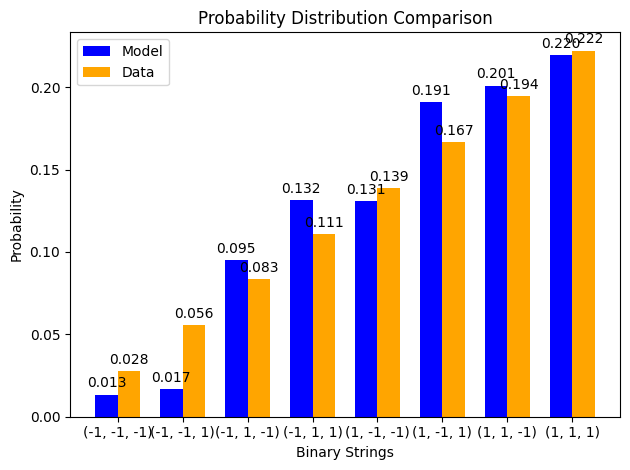

z gradient step for node 0: -4.0774210838910085e-05
z gradient step for node 1: -7.302236202480225e-05
z gradient step for node 2: -7.060882529824064e-06
z gradient step for node 3: -1.9502872241220935e-05
edge graident step for edge (0, 3): 6.124646447521604e-05
edge graident step for edge (1, 3): 4.641747880835569e-05
edge graident step for edge (2, 3): -1.0806278420551902e-05
edge graident step for edge (0, 1): 9.812423282759557e-05
edge graident step for edge (0, 2): -3.8524320098976885e-05
edge graident step for edge (1, 2): 8.304223078561962e-06
x positive phase: 0.0
x negative phase: 0.008688721635729807
x gradient step for node 0: -8.688721635729807e-06
x positive phase: 0.0
x negative phase: 0.021362819616829294
x gradient step for node 1: -2.1362819616829294e-05
x positive phase: 0.0
x negative phase: 0.010886995843868374
x gradient step for node 2: -1.0886995843868375e-05
x positive phase: -0.15034122972505914
x negative phase: -0.15241836303148215
x gradient step for node 3

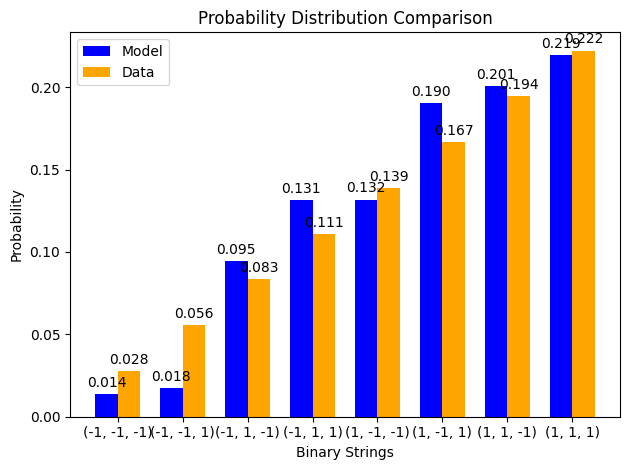

z gradient step for node 0: -4.048197980654561e-05
z gradient step for node 1: -7.047503636860297e-05
z gradient step for node 2: -6.3026707242853086e-06
z gradient step for node 3: -1.903391292280199e-05
edge graident step for edge (0, 3): 6.071683532699751e-05
edge graident step for edge (1, 3): 4.467878752123089e-05
edge graident step for edge (2, 3): -1.1179687124301174e-05
edge graident step for edge (0, 1): 9.597155944377342e-05
edge graident step for edge (0, 2): -3.6580925955620276e-05
edge graident step for edge (1, 2): 6.808684230456691e-06
x positive phase: 0.0
x negative phase: 0.007953819424154393
x gradient step for node 0: -7.953819424154393e-06
x positive phase: 0.0
x negative phase: 0.019503311823000295
x gradient step for node 1: -1.9503311823000295e-05
x positive phase: 0.0
x negative phase: 0.009894009820351421
x gradient step for node 2: -9.894009820351421e-06
x positive phase: -0.15029917221283678
x negative phase: -0.1523159128567548
x gradient step for node 3: 2

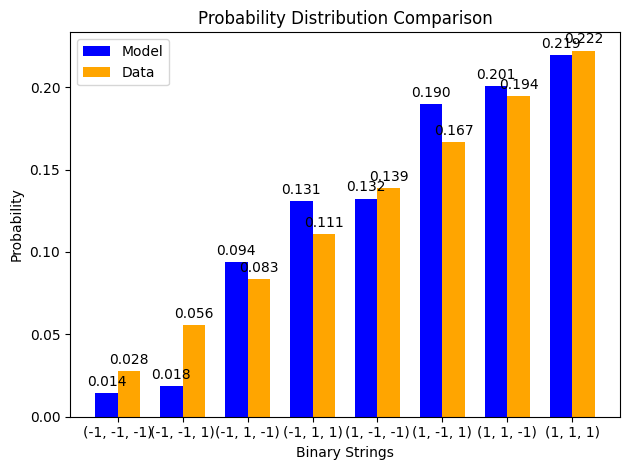

z gradient step for node 0: -4.003262564335352e-05
z gradient step for node 1: -6.805172090341866e-05
z gradient step for node 2: -5.66822038336931e-06
z gradient step for node 3: -1.8579120910270585e-05
edge graident step for edge (0, 3): 6.000836439336821e-05
edge graident step for edge (1, 3): 4.3039016685390326e-05
edge graident step for edge (2, 3): -1.1437698572595052e-05
edge graident step for edge (0, 1): 9.376379414376604e-05
edge graident step for edge (0, 2): -3.485450990084857e-05
edge graident step for edge (1, 2): 5.465722022998609e-06
x positive phase: 0.0
x negative phase: 0.007279505329210256
x gradient step for node 0: -7.279505329210256e-06
x positive phase: 0.0
x negative phase: 0.017801755137457735
x gradient step for node 1: -1.7801755137457736e-05
x positive phase: 0.0
x negative phase: 0.008991361369851715
x gradient step for node 2: -8.991361369851715e-06
x positive phase: -0.15025926415439342
x negative phase: -0.1522231357209171
x gradient step for node 3: 1.

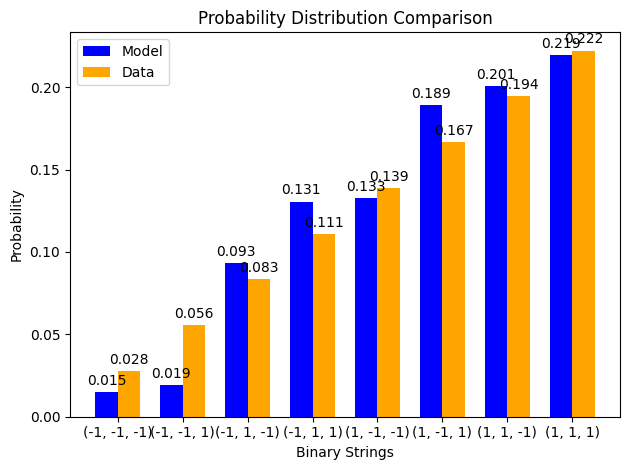

z gradient step for node 0: -3.9446057624501316e-05
z gradient step for node 1: -6.573325423717183e-05
z gradient step for node 2: -5.136192865342698e-06
z gradient step for node 3: -1.8133940603537347e-05
edge graident step for edge (0, 3): 5.9146616115378746e-05
edge graident step for edge (1, 3): 4.148325973873973e-05
edge graident step for edge (2, 3): -1.1597756164682394e-05
edge graident step for edge (0, 1): 9.150990900878892e-05
edge graident step for edge (0, 2): -3.330885192891042e-05
edge graident step for edge (1, 2): 4.265047784788506e-06
x positive phase: 0.0
x negative phase: 0.006660822832920637
x gradient step for node 0: -6.660822832920637e-06
x positive phase: 0.0
x negative phase: 0.01624530695387641
x gradient step for node 1: -1.624530695387641e-05
x positive phase: 0.0
x negative phase: 0.00817088761283216
x gradient step for node 2: -8.17088761283216e-06
x positive phase: -0.15022074943665523
x negative phase: -0.15213737589011875
x gradient step for node 3: 1.9

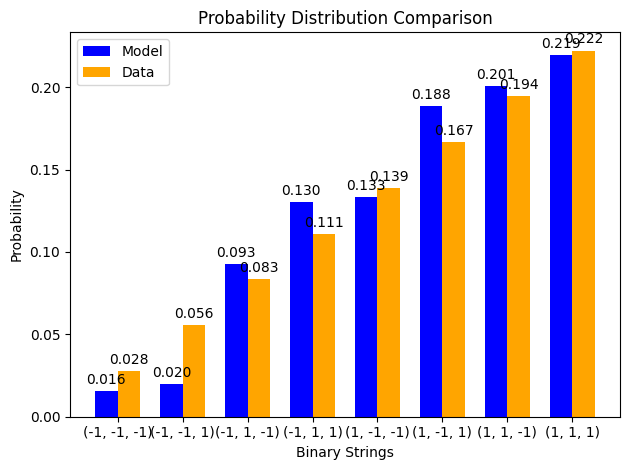

z gradient step for node 0: -3.8740180297253905e-05
z gradient step for node 1: -6.350376586447135e-05
z gradient step for node 2: -4.688834919908236e-06
z gradient step for node 3: -1.7694822144308955e-05
edge graident step for edge (0, 3): 5.815418891745683e-05
edge graident step for edge (1, 3): 3.999900625397382e-05
edge graident step for edge (2, 3): -1.1674641467929181e-05
edge graident step for edge (0, 1): 8.921814233313601e-05
edge graident step for edge (0, 2): -3.191349595501526e-05
edge graident step for edge (1, 2): 3.196468640605438e-06
x positive phase: 0.0
x negative phase: 0.006093245092337067
x gradient step for node 0: -6.0932450923370675e-06
x positive phase: 0.0
x negative phase: 0.014822070574818536
x gradient step for node 1: -1.4822070574818536e-05
x positive phase: 0.0
x negative phase: 0.0074251484902679915
x gradient step for node 2: -7.425148490267992e-06
x positive phase: -0.15018304893920822
x negative phase: -0.1520565058327276
x gradient step for node 3:

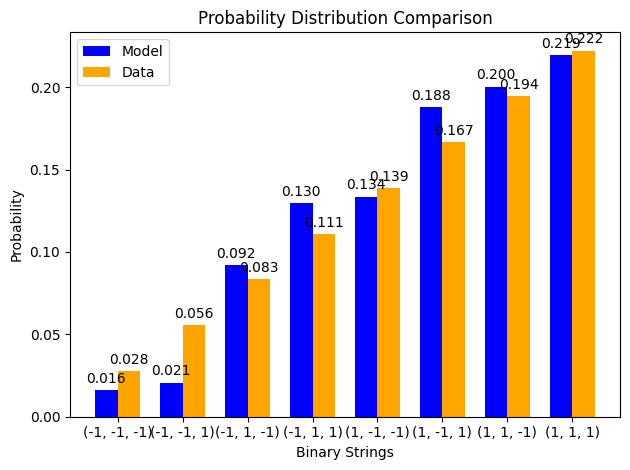

z gradient step for node 0: -3.79311535962843e-05
z gradient step for node 1: -6.135027224736845e-05
z gradient step for node 2: -4.311407656555466e-06
z gradient step for node 3: -1.725907687799966e-05
edge graident step for edge (0, 3): 5.7051109569464246e-05
edge graident step for edge (1, 3): 3.8575864948149646e-05
edge graident step for edge (2, 3): -1.1680908284457586e-05
edge graident step for edge (0, 1): 8.689606794003536e-05
edge graident step for edge (0, 2): -3.064291558414778e-05
edge graident step for edge (1, 2): 2.2500433325362004e-06
x positive phase: 0.0
x negative phase: 0.0055726300000061785
x gradient step for node 0: -5.5726300000061785e-06
x positive phase: 0.0
x negative phase: 0.01352104558626089
x gradient step for node 1: -1.352104558626089e-05
x positive phase: 0.0
x negative phase: 0.00674736677048119
x gradient step for node 2: -6.74736677048119e-06
x positive phase: -0.15014573089175393
x negative phase: -0.1519788453036203
x gradient step for node 3: 1.8

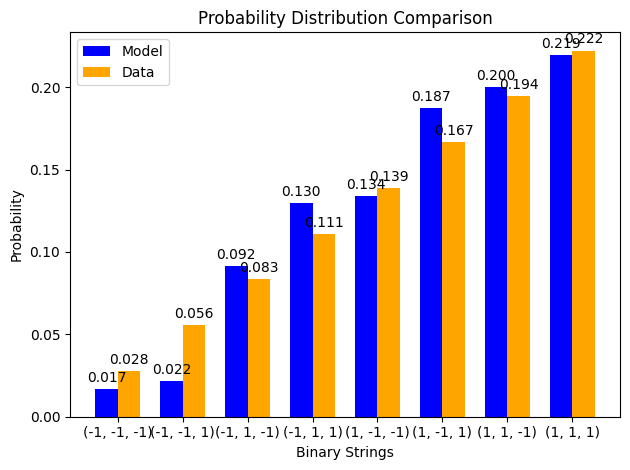

z gradient step for node 0: -3.7033613127607336e-05
z gradient step for node 1: -5.926229716578258e-05
z gradient step for node 2: -3.991696189848085e-06
z gradient step for node 3: -1.6824747450638777e-05
edge graident step for edge (0, 3): 5.585517292533615e-05
edge graident step for edge (1, 3): 3.720529919574314e-05
edge graident step for edge (2, 3): -1.162725060824596e-05
edge graident step for edge (0, 1): 8.455067263886335e-05
edge graident step for edge (0, 2): -2.947579165164138e-05
edge graident step for edge (1, 2): 1.4161853364542954e-06
x positive phase: 0.0
x negative phase: 0.005095181392252161
x gradient step for node 0: -5.095181392252161e-06
x positive phase: 0.0
x negative phase: 0.012332075999099384
x gradient step for node 1: -1.2332075999099385e-05
x positive phase: 0.0
x negative phase: 0.0061313719261419045
x gradient step for node 2: -6.131371926141905e-06
x positive phase: -0.15010848528537574
x negative phase: -0.15190309060449453
x gradient step for node 3:

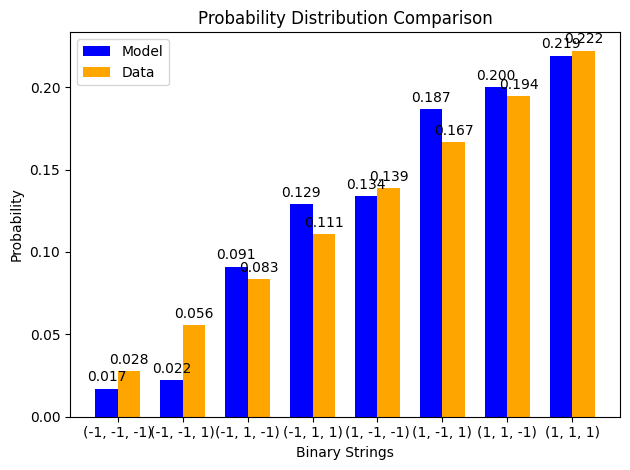

z gradient step for node 0: -3.606085537023312e-05
z gradient step for node 1: -5.7231521654751176e-05
z gradient step for node 2: -3.7195916126316066e-06
z gradient step for node 3: -1.6390492084899068e-05
edge graident step for edge (0, 3): 5.458223263863671e-05
edge graident step for edge (1, 3): 3.588038030422114e-05
edge graident step for edge (2, 3): -1.15228121634606e-05
edge graident step for edge (0, 1): 8.218843277079267e-05
edge graident step for edge (0, 2): -2.8394388854917575e-05
edge graident step for edge (1, 2): 6.857277625474944e-07
x positive phase: 0.0
x negative phase: 0.004657415414963859
x gradient step for node 0: -4.657415414963859e-06
x positive phase: 0.0
x negative phase: 0.011245797707534545
x gradient step for node 1: -1.1245797707534546e-05
x positive phase: 0.0
x negative phase: 0.005571547960886455
x gradient step for node 2: -5.571547960886455e-06
x positive phase: -0.15007110188745934
x negative phase: -0.15182825311443868
x gradient step for node 3: 

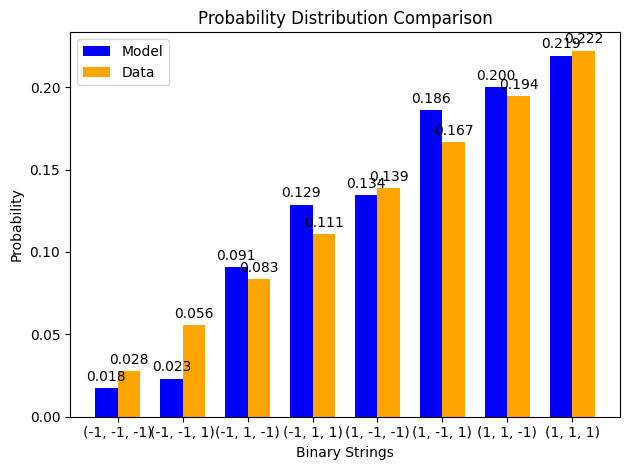

z gradient step for node 0: -3.502499238148876e-05
z gradient step for node 1: -5.525146585064722e-05
z gradient step for node 2: -3.4867368922724964e-06
z gradient step for node 3: -1.595548221896359e-05
edge graident step for edge (0, 3): 5.32464484797287e-05
edge graident step for edge (1, 3): 3.459556126595617e-05
edge graident step for edge (2, 3): -1.1375444988818178e-05
edge graident step for edge (0, 1): 7.981538423270004e-05
edge graident step for edge (0, 2): -2.7384019306693445e-05
edge graident step for edge (1, 2): 4.996086439731928e-08
x positive phase: 0.0
x negative phase: 0.004256131210501757
x gradient step for node 0: -4.256131210501757e-06
x positive phase: 0.0
x negative phase: 0.010253586402570939
x gradient step for node 1: -1.0253586402570939e-05
x positive phase: 0.0
x negative phase: 0.005062785139188263
x gradient step for node 2: -5.062785139188263e-06
x positive phase: -0.15003345143543262
x negative phase: -0.15175360614783026
x gradient step for node 3: 1

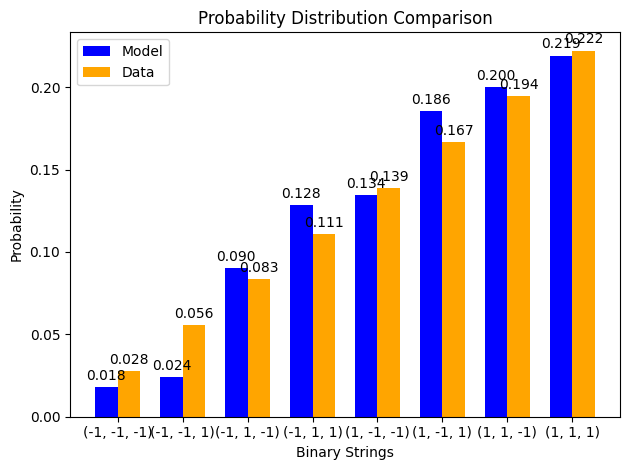

z gradient step for node 0: -3.393708031278453e-05
z gradient step for node 1: -5.331720305626914e-05
z gradient step for node 2: -3.286228602236624e-06
z gradient step for node 3: -1.551931249389049e-05
edge graident step for edge (0, 3): 5.186049568980433e-05
edge graident step for edge (1, 3): 3.334647196265377e-05
edge graident step for edge (2, 3): -1.1191924071472126e-05
edge graident step for edge (0, 1): 7.743718288313212e-05
edge graident step for edge (0, 2): -2.64325817188449e-05
edge graident step for edge (1, 2): -4.993498114431727e-07
x positive phase: 0.0
x negative phase: 0.0038883852271686574
x gradient step for node 0: -3.888385227168658e-06
x positive phase: 0.0
x negative phase: 0.00934750675574212
x gradient step for node 1: -9.347506755742121e-06
x positive phase: 0.0
x negative phase: 0.004600435492223875
x gradient step for node 2: -4.6004354922238755e-06
x positive phase: -0.14999546961729313
x negative phase: -0.15167863921159064
x gradient step for node 3: 1.

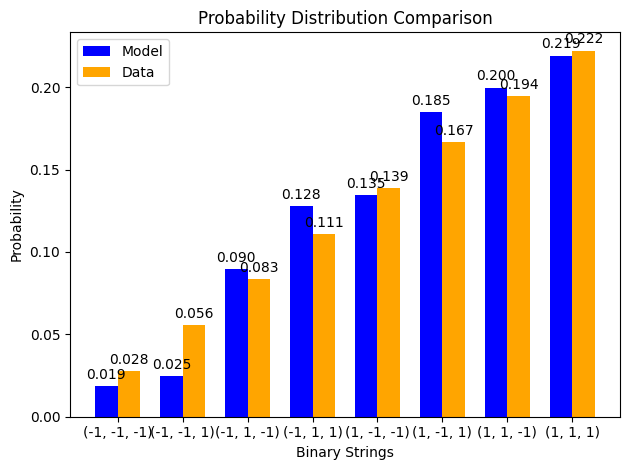

z gradient step for node 0: -3.280722570315503e-05
z gradient step for node 1: -5.1425105049858226e-05
z gradient step for node 2: -3.1123669439265394e-06
z gradient step for node 3: -1.508192199165026e-05
edge graident step for edge (0, 3): 5.04357414872364e-05
edge graident step for edge (1, 3): 3.2129735661485746e-05
edge graident step for edge (2, 3): -1.097812444428356e-05
edge graident step for edge (0, 1): 7.505915401564858e-05
edge graident step for edge (0, 2): -2.553016599247186e-05
edge graident step for edge (1, 2): -9.699587190330484e-07
x positive phase: 0.0
x negative phase: 0.0035514685722670344
x gradient step for node 0: -3.5514685722670345e-06
x positive phase: 0.0
x negative phase: 0.008520263437535893
x gradient step for node 1: -8.520263437535893e-06
x positive phase: 0.0
x negative phase: 0.004180271922644377
x gradient step for node 2: -4.180271922644377e-06
x positive phase: -0.14995714348315714
x negative phase: -0.15160301878189963
x gradient step for node 3:

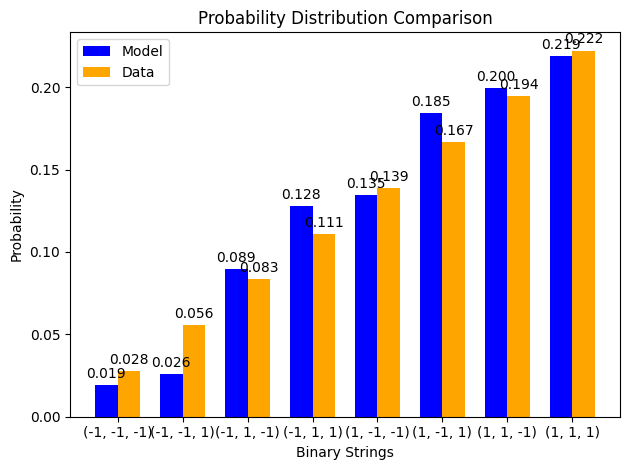

z gradient step for node 0: -3.164467315259545e-05
z gradient step for node 1: -4.957261690037912e-05
z gradient step for node 2: -2.960447177826231e-06
z gradient step for node 3: -1.464352562021698e-05
edge graident step for edge (0, 3): 4.898239344795125e-05
edge graident step for edge (1, 3): 3.094280593875838e-05
edge graident step for edge (2, 3): -1.0739166514563275e-05
edge graident step for edge (0, 1): 7.268633080294992e-05
edge graident step for edge (0, 2): -2.4668714122491055e-05
edge graident step for edge (1, 2): -1.3691447292555891e-06
x positive phase: 0.0
x negative phase: 0.0032428869312791115
x gradient step for node 0: -3.2428869312791114e-06
x positive phase: 0.0
x negative phase: 0.007765154342751176
x gradient step for node 1: -7.765154342751176e-06
x positive phase: 0.0
x negative phase: 0.00379845070273634
x gradient step for node 2: -3.7984507027363404e-06
x positive phase: -0.14991849996903733
x negative phase: -0.1515265547877881
x gradient step for node 3:

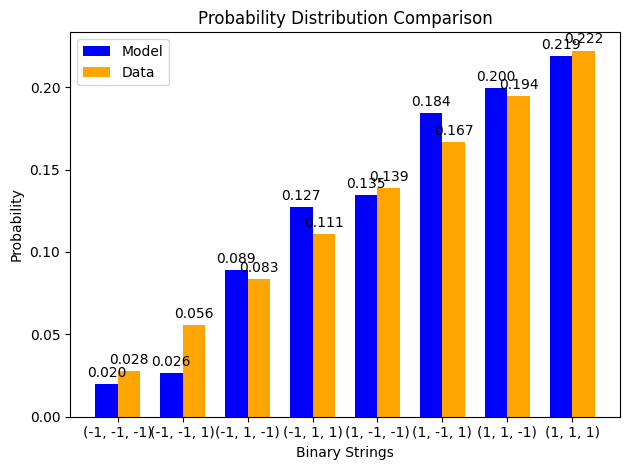

z gradient step for node 0: -3.045787760654095e-05
z gradient step for node 1: -4.775805915134737e-05
z gradient step for node 2: -2.8265862971266767e-06
z gradient step for node 3: -1.4204554586040751e-05
edge graident step for edge (0, 3): 4.750962405143022e-05
edge graident step for edge (1, 3): 2.978382276716558e-05
edge graident step for edge (2, 3): -1.0479534737843688e-05
edge graident step for edge (0, 1): 7.032348240891842e-05
edge graident step for edge (0, 2): -2.3841729445532908e-05
edge graident step for edge (1, 2): -1.7037215474474399e-06
x positive phase: 0.0
x negative phase: 0.0029603426605612033
x gradient step for node 0: -2.9603426605612034e-06
x positive phase: 0.0
x negative phase: 0.007076026249243745
x gradient step for node 1: -7.076026249243745e-06
x positive phase: 0.0
x negative phase: 0.0034514771466962507
x gradient step for node 2: -3.4514771466962507e-06
x positive phase: -0.14987959624993996
x negative phase: -0.1514491720656745
x gradient step for nod

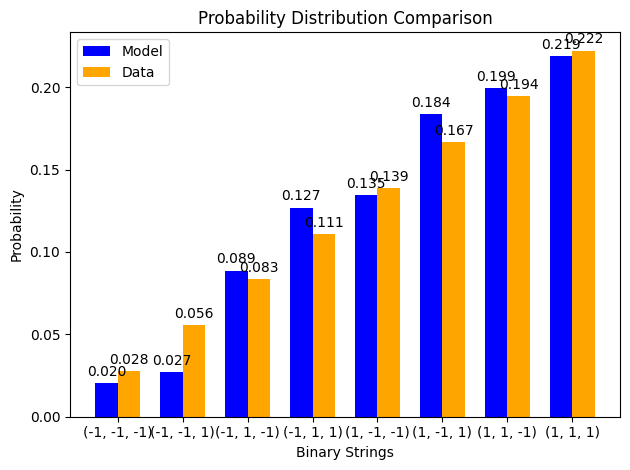

z gradient step for node 0: -2.9254564118706363e-05
z gradient step for node 1: -4.598045507803436e-05
z gradient step for node 2: -2.7075794933030804e-06
z gradient step for node 3: -1.3765604967177048e-05
edge graident step for edge (0, 3): 4.60256752422582e-05
edge graident step for edge (1, 3): 2.865148630848205e-05
edge graident step for edge (2, 3): -1.0203174116751896e-05
edge graident step for edge (0, 1): 6.797513294559271e-05
edge graident step for edge (0, 2): -2.304402731914919e-05
edge graident step for edge (1, 2): -1.980051909075464e-06
x positive phase: 0.0
x negative phase: 0.002701718731094251
x gradient step for node 0: -2.7017187310942512e-06
x positive phase: 0.0
x negative phase: 0.006447233027359094
x gradient step for node 1: -6.447233027359094e-06
x positive phase: 0.0
x negative phase: 0.0031361742339347477
x gradient step for node 2: -3.1361742339347476e-06
x positive phase: -0.14984051167305337
x negative phase: -0.1513708861280582
x gradient step for node 3

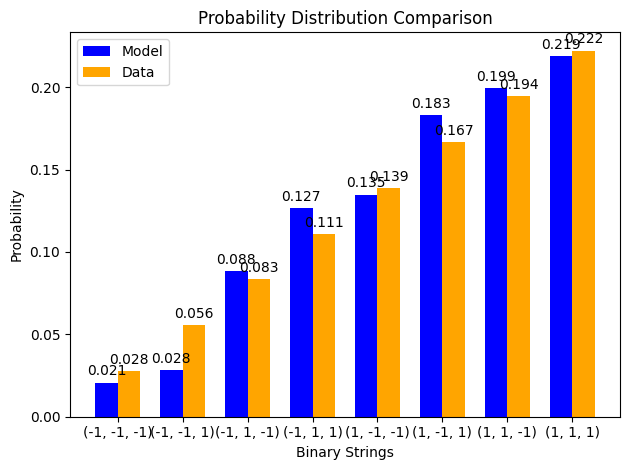

z gradient step for node 0: -2.804177760844373e-05
z gradient step for node 1: -4.423938071985717e-05
z gradient step for node 2: -2.600781651320189e-06
z gradient step for node 3: -1.3327393487567507e-05
edge graident step for edge (0, 3): 4.45379464198612e-05
edge graident step for edge (1, 3): 2.754494689287393e-05
edge graident step for edge (2, 3): -9.913568410082369e-06
edge graident step for edge (0, 1): 6.56455727044466e-05
edge graident step for edge (0, 2): -2.2271521290610136e-05
edge graident step for edge (1, 2): -2.2040639988790413e-06
x positive phase: 0.0
x negative phase: 0.00246506425836985
x gradient step for node 0: -2.4650642583698502e-06
x positive phase: 0.0
x negative phase: 0.005873596436800047
x gradient step for node 1: -5.8735964368000465e-06
x positive phase: 0.0
x negative phase: 0.002849653963169527
x gradient step for node 2: -2.849653963169527e-06
x positive phase: -0.14980134105267007
x negative phase: -0.15129178266670412
x gradient step for node 3: 1

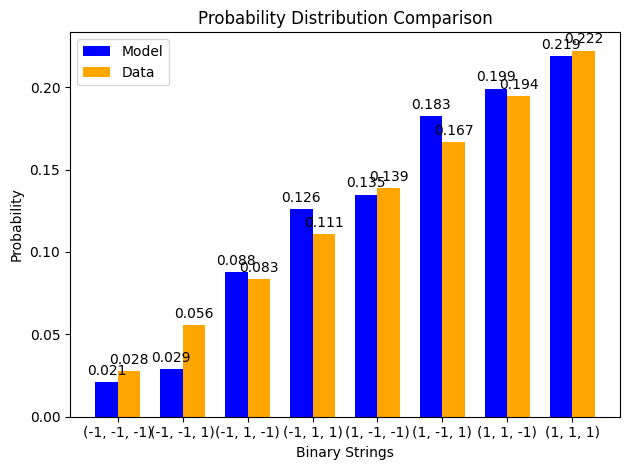

z gradient step for node 0: -2.682592479447027e-05
z gradient step for node 1: -4.2534835478634765e-05
z gradient step for node 2: -2.504009753836009e-06
z gradient step for node 3: -1.2890719684115481e-05
edge graident step for edge (0, 3): 4.3053068846602264e-05
edge graident step for edge (1, 3): 2.646370968767864e-05
edge graident step for edge (2, 3): -9.61380339010215e-06
edge graident step for edge (0, 1): 6.333886318191884e-05
edge graident step for edge (0, 2): -2.152103968128226e-05
edge graident step for edge (1, 2): -2.381269033458644e-06
x positive phase: 0.0
x negative phase: 0.0022485814004264337
x gradient step for node 0: -2.248581400426434e-06
x positive phase: 0.0
x negative phase: 0.0053503694893079785
x gradient step for node 1: -5.350369489307979e-06
x positive phase: 0.0
x negative phase: 0.0025892912242433995
x gradient step for node 2: -2.5892912242433994e-06
x positive phase: -0.14976218913628023
x negative phase: -0.1512120002829295
x gradient step for node 3

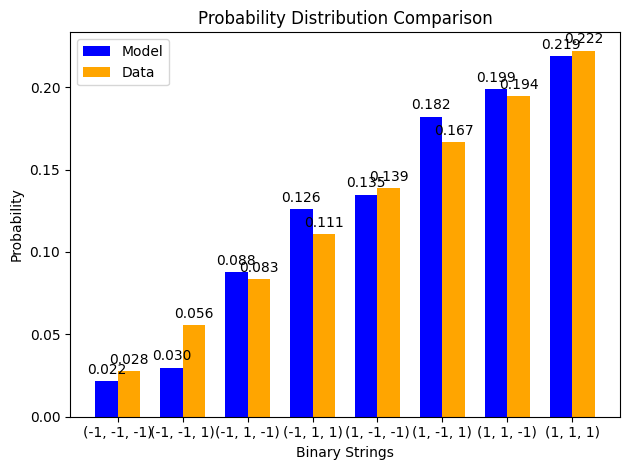

z gradient step for node 0: -2.5612810171349423e-05
z gradient step for node 1: -4.0867131210861803e-05
z gradient step for node 2: -2.415462659507567e-06
z gradient step for node 3: -1.2456433746641405e-05
edge graident step for edge (0, 3): 4.1576969063266965e-05
edge graident step for edge (1, 3): 2.5407552626906526e-05
edge graident step for edge (2, 3): -9.306617990689853e-06
edge graident step for edge (0, 1): 6.105883739790628e-05
edge graident step for edge (0, 2): -2.07901682741803e-05
edge graident step for edge (1, 2): -2.5167793091910864e-06
x positive phase: 0.0
x negative phase: 0.002050613444200566
x gradient step for node 0: -2.050613444200566e-06
x positive phase: 0.0
x negative phase: 0.004873202314238989
x gradient step for node 1: -4.873202314238989e-06
x positive phase: 0.0
x negative phase: 0.002352699984493532
x gradient step for node 2: -2.352699984493532e-06
x positive phase: -0.1497231660759722
x negative phase: -0.15113171600348116
x gradient step for node 3:

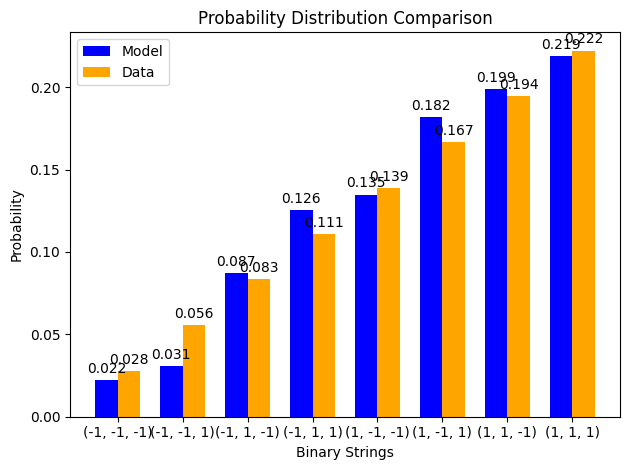

z gradient step for node 0: -2.4407667599888662e-05
z gradient step for node 1: -3.923679789981091e-05
z gradient step for node 2: -2.333655246442676e-06
z gradient step for node 3: -1.2025409392478648e-05
edge graident step for edge (0, 3): 4.01149235254355e-05
edge graident step for edge (1, 3): 2.4376456264213336e-05
edge graident step for edge (2, 3): -8.994445745495155e-06
edge graident step for edge (0, 1): 5.8809096910140956e-05
edge graident step for edge (0, 2): -2.0077115450497508e-05
edge graident step for edge (1, 2): -2.615326278089608e-06
x positive phase: 0.0
x negative phase: 0.0018696339313043736
x gradient step for node 0: -1.8696339313043737e-06
x positive phase: 0.0
x negative phase: 0.0044381104358559124
x gradient step for node 1: -4.438110435855912e-06
x positive phase: 0.0
x negative phase: 0.0021377115979643135
x gradient step for node 2: -2.1377115979643135e-06
x positive phase: -0.14968438376100396
x negative phase: -0.15105113319928126
x gradient step for no

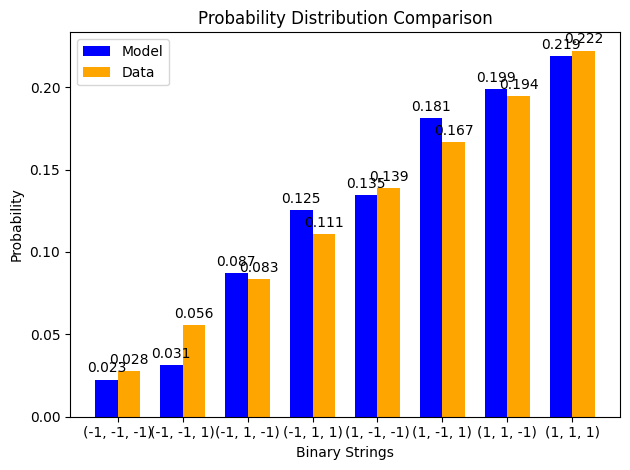

z gradient step for node 0: -2.32151888087746e-05
z gradient step for node 1: -3.764450415325596e-05
z gradient step for node 2: -2.2573643779128237e-06
z gradient step for node 3: -1.1598521210312463e-05
edge graident step for edge (0, 3): 3.8671606326925235e-05
edge graident step for edge (1, 3): 2.3370544311630353e-05
edge graident step for edge (2, 3): -8.679448522282446e-06
edge graident step for edge (0, 1): 5.65930067848891e-05
edge graident step for edge (0, 2): -1.9380596682402497e-05
edge graident step for edge (1, 2): -2.6812783979879296e-06
x positive phase: 0.0
x negative phase: 0.0017042366994215762
x gradient step for node 0: -1.7042366994215763e-06
x positive phase: 0.0
x negative phase: 0.004041445352768622
x gradient step for node 1: -4.0414453527686216e-06
x positive phase: 0.0
x negative phase: 0.0019423550580096836
x gradient step for node 2: -1.9423550580096838e-06
x positive phase: -0.14964595288638788
x negative phase: -0.1509704715759529
x gradient step for nod

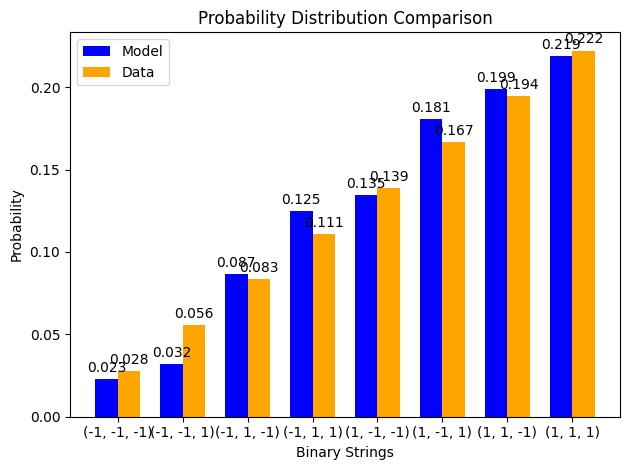

z gradient step for node 0: -2.2039549853343944e-05
z gradient step for node 1: -3.6090990924820126e-05
z gradient step for node 2: -2.1855845561027377e-06
z gradient step for node 3: -1.1176625971187515e-05
edge graident step for edge (0, 3): 3.725113155911164e-05
edge graident step for edge (1, 3): 2.2390033725017744e-05
edge graident step for edge (2, 3): -8.363544214102015e-06
edge graident step for edge (0, 1): 5.441368961568849e-05
edge graident step for edge (0, 2): -1.8699735763215597e-05
edge graident step for edge (1, 2): -2.7186586287176463e-06
x positive phase: 0.0
x negative phase: 0.0015531267358456355
x gradient step for node 0: -1.5531267358456354e-06
x positive phase: 0.0
x negative phase: 0.0036798672989691123
x gradient step for node 1: -3.6798672989691123e-06
x positive phase: 0.0
x negative phase: 0.0017648390263261832
x gradient step for node 2: -1.7648390263261832e-06
x positive phase: -0.1496079806488259
x negative phase: -0.1508899589498246
x gradient step for 

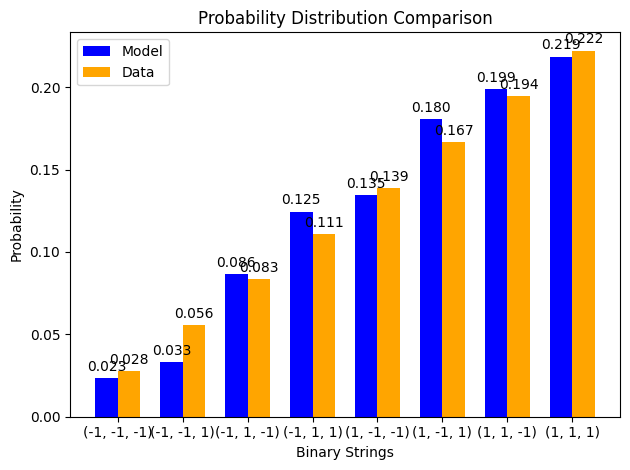

z gradient step for node 0: -2.0884436349324744e-05
z gradient step for node 1: -3.45770169964707e-05
z gradient step for node 2: -2.1174914846306127e-06
z gradient step for node 3: -1.0760547458729786e-05
edge graident step for edge (0, 3): 3.585709156833783e-05
edge graident step for edge (1, 3): 2.143519329028276e-05
edge graident step for edge (2, 3): -8.048429746634056e-06
edge graident step for edge (0, 1): 5.227401950197469e-05
edge graident step for edge (0, 2): -1.803398055228153e-05
edge graident step for edge (1, 2): -2.7311615273451775e-06
x positive phase: 0.0
x negative phase: 0.0014151117561792817
x gradient step for node 0: -1.4151117561792816e-06
x positive phase: 0.0
x negative phase: 0.003350320060406608
x gradient step for node 1: -3.3503200604066083e-06
x positive phase: 0.0
x negative phase: 0.0016035354838249017
x gradient step for node 2: -1.6035354838249017e-06
x positive phase: -0.14957056897563187
x negative phase: -0.15080982456163067
x gradient step for nod

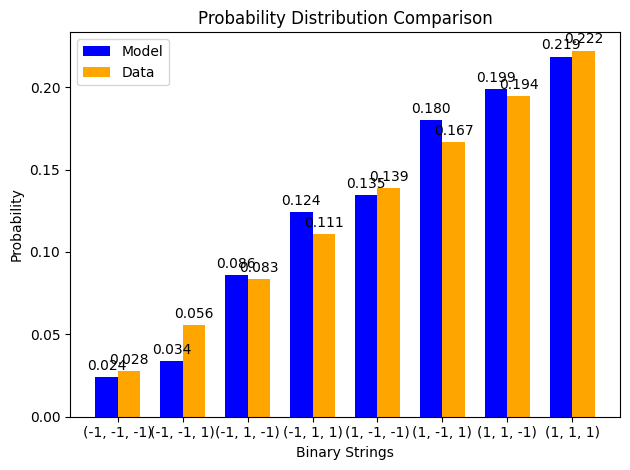

z gradient step for node 0: -1.9753068095427818e-05
z gradient step for node 1: -3.310331488494975e-05
z gradient step for node 2: -2.052412066336842e-06
z gradient step for node 3: -1.035106441632061e-05
edge graident step for edge (0, 3): 3.449259211820327e-05
edge graident step for edge (1, 3): 2.0506309749911843e-05
edge graident step for edge (2, 3): -7.735600500349881e-06
edge graident step for edge (0, 1): 5.0176616719446055e-05
edge graident step for edge (0, 2): -1.738303134083004e-05
edge graident step for edge (1, 2): -2.7221699442951107e-06
x positive phase: 0.0
x negative phase: 0.0012890944346190159
x gradient step for node 0: -1.289094434619016e-06
x positive phase: 0.0
x negative phase: 0.0030500077195514115
x gradient step for node 1: -3.0500077195514114e-06
x positive phase: 0.0
x negative phase: 0.0014569648607427282
x gradient step for node 2: -1.4569648607427282e-06
x positive phase: -0.14953381320465586
x negative phase: -0.15073029371303498
x gradient step for no

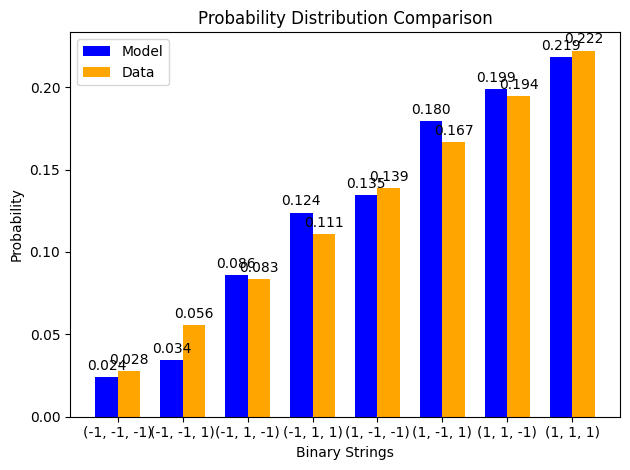

z gradient step for node 0: -1.8648223519384278e-05
z gradient step for node 1: -3.1670555946716445e-05
z gradient step for node 2: -1.989799624082522e-06
z gradient step for node 3: -9.948901247475495e-06
edge graident step for edge (0, 3): 3.316028523909703e-05
edge graident step for edge (1, 3): 1.9603660587183714e-05
edge graident step for edge (2, 3): -7.4263670225826475e-06
edge graident step for edge (0, 1): 4.812384364147555e-05
edge graident step for edge (0, 2): -1.6746780216804743e-05
edge graident step for edge (1, 2): -2.6947713473522708e-06
x positive phase: 0.0
x negative phase: 0.0011740652231623603
x gradient step for node 0: -1.1740652231623604e-06
x positive phase: 0.0
x negative phase: 0.002776373201766907
x gradient step for node 1: -2.776373201766907e-06
x positive phase: 0.0
x negative phase: 0.0013237825148531852
x gradient step for node 2: -1.3237825148531852e-06
x positive phase: -0.14949780114395142
x negative phase: -0.15065158353915173
x gradient step for n

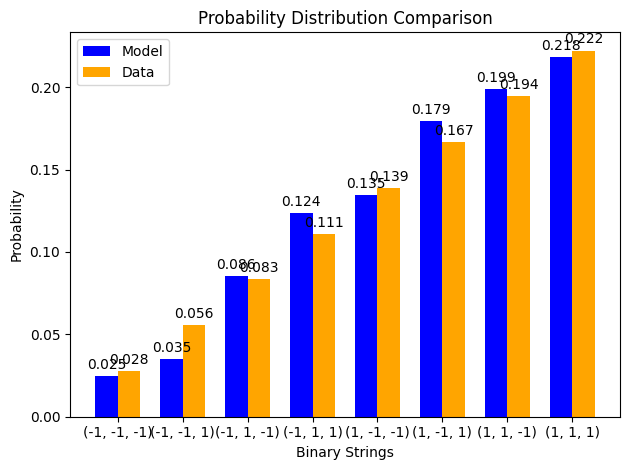

z gradient step for node 0: -1.7572264227486256e-05
z gradient step for node 1: -3.0279323555834238e-05
z gradient step for node 2: -1.9292133538693494e-06
z gradient step for node 3: -9.554721138271494e-06
edge graident step for edge (0, 3): 3.186240035323118e-05
edge graident step for edge (1, 3): 1.8727492656101687e-05
edge graident step for edge (2, 3): -7.12186971469378e-06
edge graident step for edge (0, 1): 4.611780231136806e-05
edge graident step for edge (0, 2): -1.6125260030489307e-05
edge graident step for edge (1, 2): -2.6517738091033638e-06
x positive phase: 0.0
x negative phase: 0.0010690957059834153
x gradient step for node 0: -1.0690957059834153e-06
x positive phase: 0.0
x negative phase: 0.002527078500680171
x gradient step for node 1: -2.5270785006801707e-06
x positive phase: 0.0
x negative phase: 0.0012027664374700897
x gradient step for node 2: -1.2027664374700898e-06
x positive phase: -0.1494626124492357
x negative phase: -0.1505738997541246
x gradient step for nod

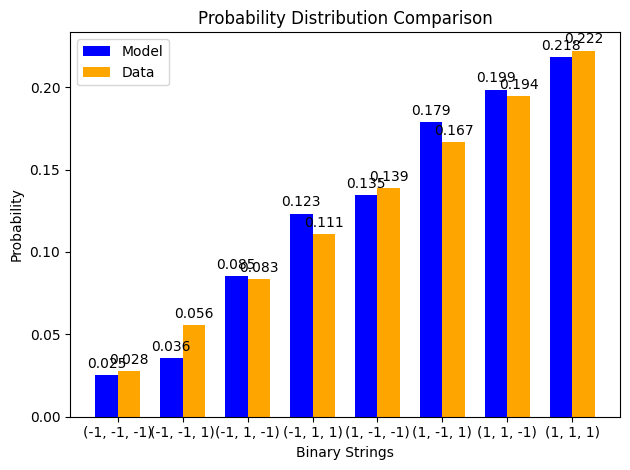

z gradient step for node 0: -1.6527159807644354e-05
z gradient step for node 1: -2.89300933195e-05
z gradient step for node 2: -1.8703012059590462e-06
z gradient step for node 3: -9.169121298592154e-06
edge graident step for edge (0, 3): 3.060077409858375e-05
edge graident step for edge (1, 3): 1.7878005909929786e-05
edge graident step for edge (2, 3): -6.823092019978577e-06
edge graident step for edge (0, 1): 4.4160333922089263e-05
edge graident step for edge (0, 2): -1.551860174714752e-05
edge graident step for edge (1, 2): -2.5957216909480163e-06
x positive phase: 0.0
x negative phase: 0.0009733324425120647
x gradient step for node 0: -9.733324425120647e-07
x positive phase: 0.0
x negative phase: 0.002299986464456034
x gradient step for node 1: -2.299986464456034e-06
x positive phase: 0.0
x negative phase: 0.0010928060770932643
x gradient step for node 2: -1.0928060770932643e-06
x positive phase: -0.14942831826529301
x negative phase: -0.15049743422722206
x gradient step for node 3:

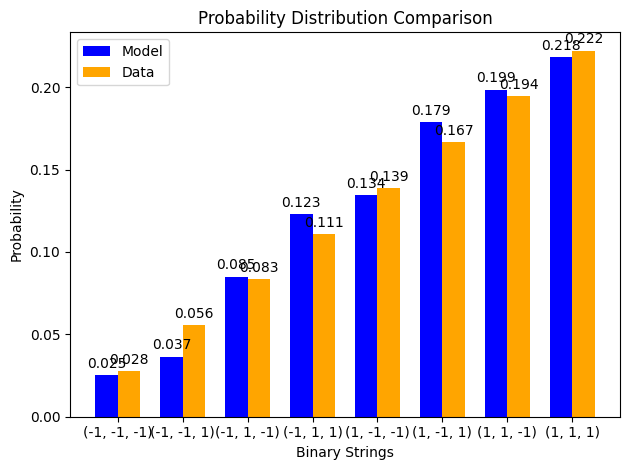

z gradient step for node 0: -1.551451292965311e-05
z gradient step for node 1: -2.7623219378705295e-05
z gradient step for node 2: -1.8127855451974262e-06
z gradient step for node 3: -8.792630043427564e-06
edge graident step for edge (0, 3): 2.9376879138033108e-05
edge graident step for edge (1, 3): 1.705534154136884e-05
edge graident step for edge (2, 3): -6.5308725056641705e-06
edge graident step for edge (0, 1): 4.225302033532505e-05
edge graident step for edge (0, 2): -1.4926999125273539e-05
edge graident step for edge (1, 2): -2.5289110476915677e-06
x positive phase: 0.0
x negative phase: 0.000885991258735764
x gradient step for node 0: -8.85991258735764e-07
x positive phase: 0.0
x negative phase: 0.002093144030444643
x gradient step for node 1: -2.093144030444643e-06
x positive phase: 0.0
x negative phase: 0.0009928921800059637
x gradient step for node 2: -9.928921800059638e-07
x positive phase: -0.14939498108455063
x negative phase: -0.1504223632644088
x gradient step for node 3

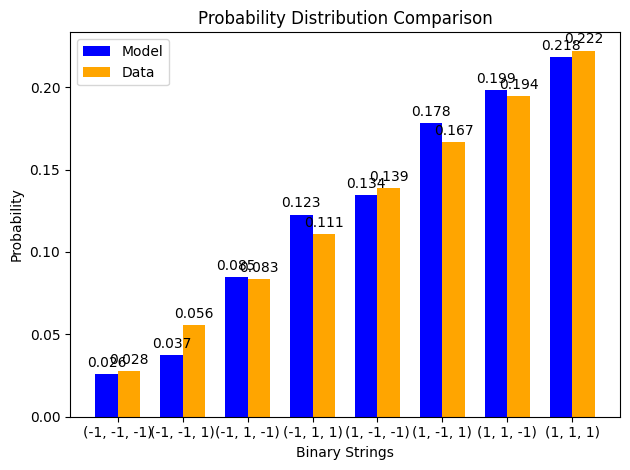

z gradient step for node 0: -1.4535584702544458e-05
z gradient step for node 1: -2.6358925918728294e-05
z gradient step for node 2: -1.7564510704464465e-06
z gradient step for node 3: -8.425705457377197e-06
edge graident step for edge (0, 3): 2.819185212867126e-05
edge graident step for edge (1, 3): 1.6259573903982278e-05
edge graident step for edge (2, 3): -6.245916124229561e-06
edge graident step for edge (0, 1): 4.0397187666245004e-05
edge graident step for edge (0, 2): -1.4350679785864934e-05
edge graident step for edge (1, 2): -2.453404764168443e-06
x positive phase: 0.0
x negative phase: 0.0008063519511706635
x gradient step for node 0: -8.063519511706635e-07
x positive phase: 0.0
x negative phase: 0.0019047668017233214
x gradient step for node 1: -1.9047668017233214e-06
x positive phase: 0.0
x negative phase: 0.0009021075559015579
x gradient step for node 2: -9.021075559015579e-07
x positive phase: -0.1493626547822569
x negative phase: -0.15034884648546756
x gradient step for no

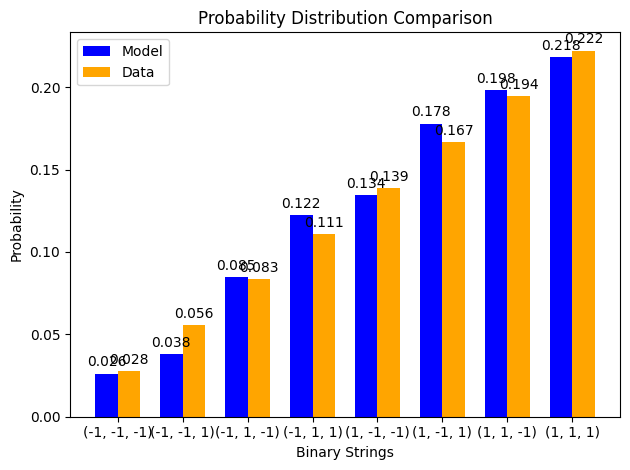

z gradient step for node 0: -1.3591320185934841e-05
z gradient step for node 1: -2.5137303087485712e-05
z gradient step for node 2: -1.7011345785255816e-06
z gradient step for node 3: -8.068735405732607e-06
edge graident step for edge (0, 3): 2.704652093862764e-05
edge graident step for edge (1, 3): 1.5490705638473186e-05
edge graident step for edge (2, 3): -5.968804852521048e-06
edge graident step for edge (0, 1): 3.859391187393915e-05
edge graident step for edge (0, 2): -1.3789881844643858e-05
edge graident step for edge (1, 2): -2.3710474218383295e-06
x positive phase: 0.0
x negative phase: 0.0007337533720224861
x gradient step for node 0: -7.337533720224861e-07
x positive phase: 0.0
x negative phase: 0.0017332248653223927
x gradient step for node 1: -1.7332248653223927e-06
x positive phase: 0.0
x negative phase: 0.0008196186847102258
x gradient step for node 2: -8.196186847102259e-07
x positive phase: -0.14933138479315194
x negative phase: -0.15027702619992575
x gradient step for n

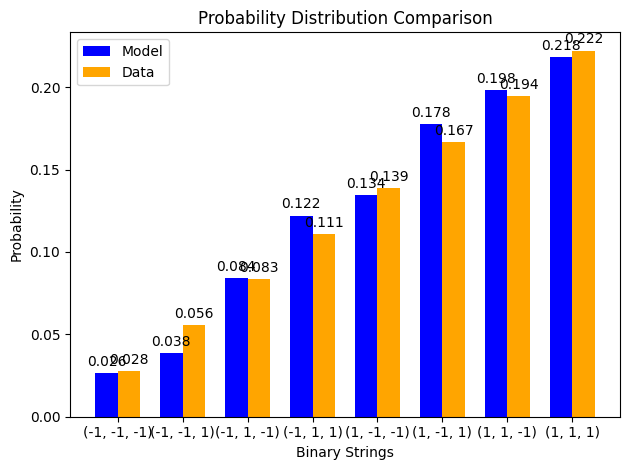

z gradient step for node 0: -1.268237390825938e-05
z gradient step for node 1: -2.39583065900206e-05
z gradient step for node 2: -1.6467162437597411e-06
z gradient step for node 3: -7.722038674569776e-06
edge graident step for edge (0, 3): 2.5941431132302406e-05
edge graident step for edge (1, 3): 1.4748665479217161e-05
edge graident step for edge (2, 3): -5.700007838953469e-06
edge graident step for edge (0, 1): 3.684402622962108e-05
edge graident step for edge (0, 2): -1.3244835369884912e-05
edge graident step for edge (1, 2): -2.2834798804820533e-06
x positive phase: 0.0
x negative phase: 0.0006675888674396203
x gradient step for node 0: -6.675888674396204e-07
x positive phase: 0.0
x negative phase: 0.001577029758220284
x gradient step for node 1: -1.577029758220284e-06
x positive phase: 0.0
x negative phase: 0.0007446680882425179
x gradient step for node 2: -7.446680882425179e-07
x positive phase: -0.14930120839933803
x negative phase: -0.1502070271966106
x gradient step for node 3

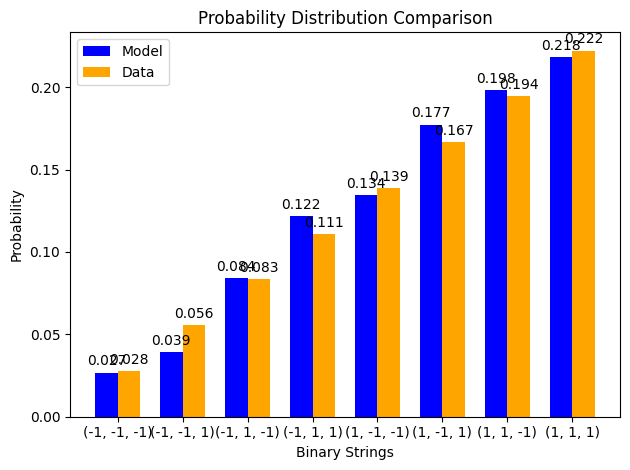

z gradient step for node 0: -1.1809135217375977e-05
z gradient step for node 1: -2.282176029555552e-05
z gradient step for node 2: -1.5931121531209959e-06
z gradient step for node 3: -7.385867040633043e-06
edge graident step for edge (0, 3): 2.4876871697079638e-05
edge graident step for edge (1, 3): 1.4033308266670888e-05
edge graident step for edge (2, 3): -5.439891136910957e-06
edge graident step for edge (0, 1): 3.514813048384141e-05
edge graident step for edge (0, 2): -1.2715748006900105e-05
edge graident step for edge (1, 2): -2.1921535492134827e-06
x positive phase: 0.0
x negative phase: 0.000607302043582972
x gradient step for node 0: -6.07302043582972e-07
x positive phase: 0.0
x negative phase: 0.0014348224933808191
x gradient step for node 1: -1.4348224933808192e-06
x positive phase: 0.0
x negative phase: 0.0006765673970991687
x gradient step for node 2: -6.765673970991687e-07
x positive phase: -0.1492721551033208
x negative phase: -0.15013895687193354
x gradient step for node

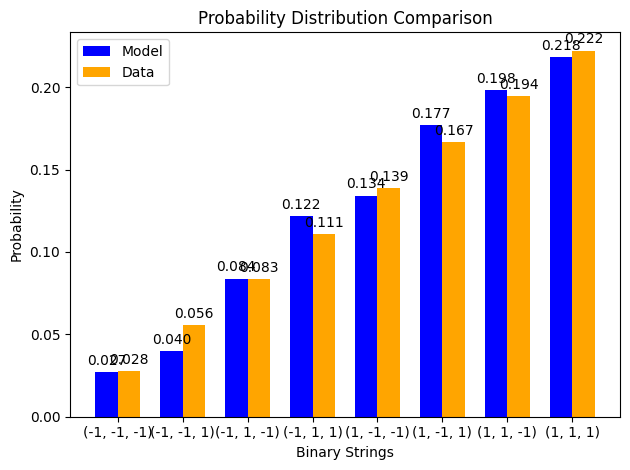

z gradient step for node 0: -1.0971753275976326e-05
z gradient step for node 1: -2.172736125955105e-05
z gradient step for node 2: -1.5402678917313117e-06
z gradient step for node 3: -7.060408089607062e-06
edge graident step for edge (0, 3): 2.3852899952791052e-05
edge graident step for edge (1, 3): 1.3344416739771853e-05
edge graident step for edge (2, 3): -5.188727063838883e-06
edge graident step for edge (0, 1): 3.3506601518734054e-05
edge graident step for edge (0, 2): -1.2202794179090412e-05
edge graident step for edge (1, 2): -2.0983443125770498e-06
x positive phase: 0.0
x negative phase: 0.0005523828376058588
x gradient step for node 0: -5.523828376058588e-07
x positive phase: 0.0
x negative phase: 0.0013053625640947713
x gradient step for node 1: -1.3053625640947713e-06
x positive phase: 0.0
x negative phase: 0.0006146910495526637
x gradient step for node 2: -6.146910495526637e-07
x positive phase: -0.14924424706397266
x negative phase: -0.15007290563117803
x gradient step for 

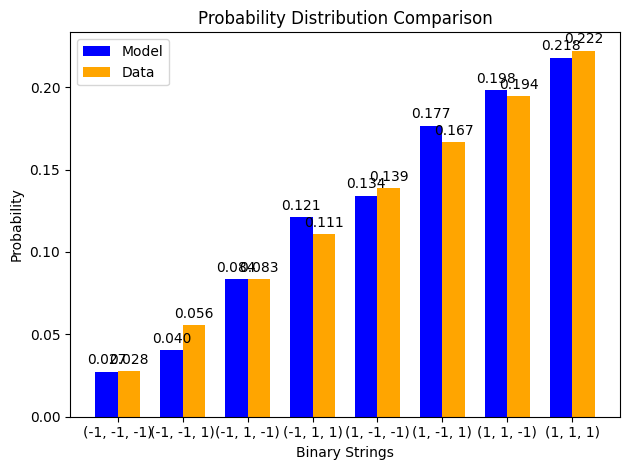

z gradient step for node 0: -1.0170161513019694e-05
z gradient step for node 1: -2.0674686627360077e-05
z gradient step for node 2: -1.488153016579563e-06
z gradient step for node 3: -6.745788618847671e-06
edge graident step for edge (0, 3): 2.2869365566775602e-05
edge graident step for edge (1, 3): 1.2681704729363252e-05
edge graident step for edge (2, 3): -4.946703198241309e-06
edge graident step for edge (0, 1): 3.19196052496636e-05
edge graident step for edge (0, 2): -1.1706107336855745e-05
edge graident step for edge (1, 2): -2.0031660719287136e-06
x positive phase: 0.0
x negative phase: 0.0005023638726393395
x gradient step for node 0: -5.023638726393395e-07
x positive phase: 0.0
x negative phase: 0.0011875178506195808
x gradient step for node 1: -1.1875178506195807e-06
x positive phase: 0.0
x negative phase: 0.0005584705648242387
x gradient step for node 2: -5.584705648242387e-07
x positive phase: -0.14921749957651942
x negative phase: -0.1500089475053298
x gradient step for nod

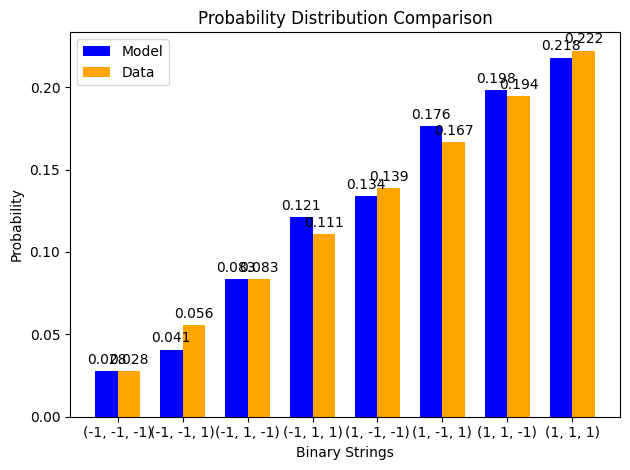

z gradient step for node 0: -9.404101350692252e-06
z gradient step for node 1: -1.9663201947889314e-05
z gradient step for node 2: -1.4367562898364716e-06
z gradient step for node 3: -6.442078477713498e-06
edge graident step for edge (0, 3): 2.1925933589819148e-05
edge graident step for edge (1, 3): 1.204482141864438e-05
edge graident step for edge (2, 3): -4.7139310086817265e-06
edge graident step for edge (0, 1): 3.0387109530784455e-05
edge graident step for edge (0, 2): -1.1225774781204915e-05
edge graident step for edge (1, 2): -1.90758385946041e-06
x positive phase: 0.0
x negative phase: 0.0004568170775843592
x gradient step for node 0: -4.568170775843592e-07
x positive phase: 0.0
x negative phase: 0.0010802553585512816
x gradient step for node 1: -1.0802553585512816e-06
x positive phase: 0.0
x negative phase: 0.0005073893383990819
x gradient step for node 2: -5.073893383990819e-07
x positive phase: -0.14919192158062594
x negative phase: -0.14994714093344969
x gradient step for no

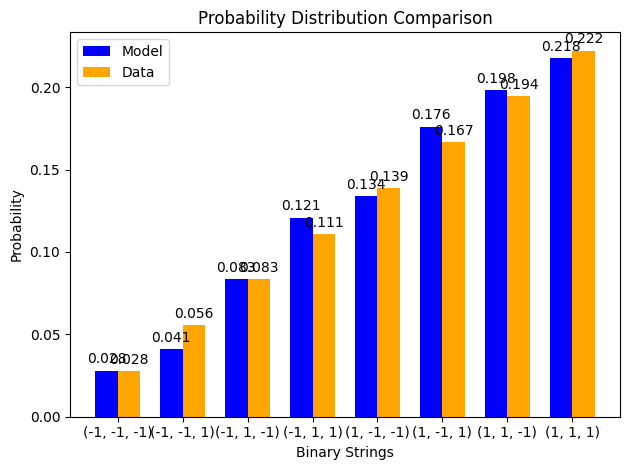

z gradient step for node 0: -8.673145041904585e-06
z gradient step for node 1: -1.869227048500896e-05
z gradient step for node 2: -1.386081568853656e-06
z gradient step for node 3: -6.14929471525738e-06
edge graident step for edge (0, 3): 2.1022106429272824e-05
edge graident step for edge (1, 3): 1.1433356379582871e-05
edge graident step for edge (2, 3): -4.490454098221047e-06
edge graident step for edge (0, 1): 2.890889781882973e-05
edge graident step for edge (0, 2): -1.076183463958512e-05
edge graident step for edge (1, 2): -1.812426482055346e-06
x positive phase: 0.0
x negative phase: 0.00041535055397928105
x gradient step for node 0: -4.1535055397928107e-07
x positive phase: 0.0
x negative phase: 0.0009826327234939104
x gradient step for node 1: -9.826327234939103e-07
x positive phase: 0.0
x negative phase: 0.0004609779117805844
x gradient step for node 2: -4.609779117805844e-07
x positive phase: -0.14916751618328286
x negative phase: -0.14988752966735797
x gradient step for node 

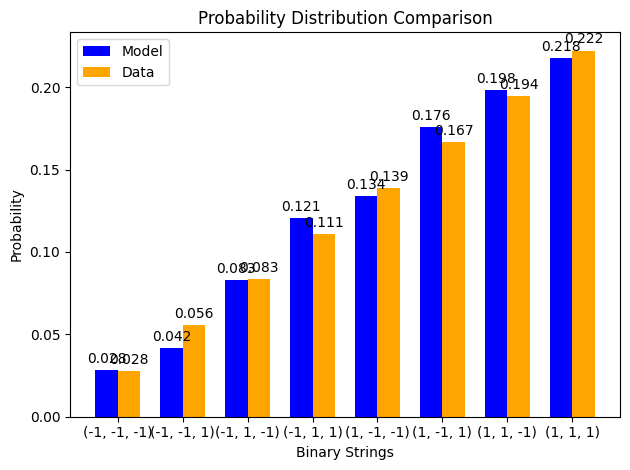

z gradient step for node 0: -7.976717473955398e-06
z gradient step for node 1: -1.776116317074869e-05
z gradient step for node 2: -1.3361442695586923e-06
z gradient step for node 3: -5.867405921158752e-06
edge graident step for edge (0, 3): 2.0157244683016995e-05
edge graident step for edge (1, 3): 1.0846845134676764e-05
edge graident step for edge (2, 3): -4.276256042679339e-06
edge graident step for edge (0, 1): 2.748458335713748e-05
edge graident step for edge (0, 2): -1.0314274618210648e-05
edge graident step for edge (1, 2): -1.7183986542355922e-06
x positive phase: 0.0
x negative phase: 0.00037760567348632854
x gradient step for node 0: -3.7760567348632855e-07
x positive phase: 0.0
x negative phase: 0.0008937904214089327
x gradient step for node 1: -8.937904214089327e-07
x positive phase: 0.0
x negative phase: 0.00041880967341818983
x gradient step for node 2: -4.1880967341818986e-07
x positive phase: -0.1491442811855215
x negative phase: -0.1498301437615307
x gradient step for n

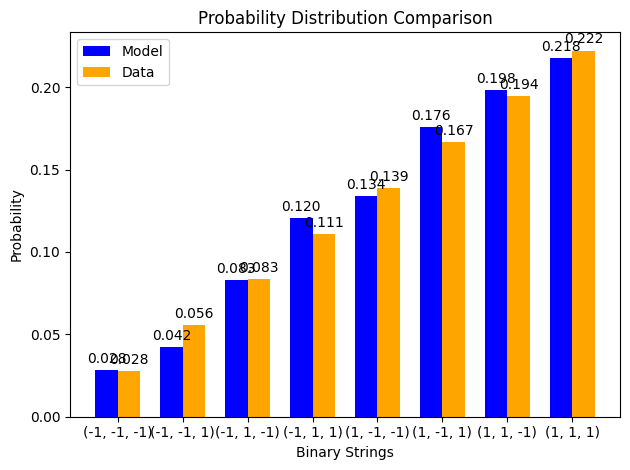

z gradient step for node 0: -7.314116817905447e-06
z gradient step for node 1: -1.6869068897289814e-05
z gradient step for node 2: -1.2869683346447003e-06
z gradient step for node 3: -5.596336661163992e-06
edge graident step for edge (0, 3): 1.9330586769833625e-05
edge graident step for edge (1, 3): 1.0284775031314696e-05
edge graident step for edge (2, 3): -4.071267800407924e-06
edge graident step for edge (0, 1): 2.61136236555915e-05
edge graident step for edge (0, 2): -9.883032198342801e-06
edge graident step for edge (1, 2): -1.626092583418004e-06
x positive phase: 0.0
x negative phase: 0.0003432543906608535
x gradient step for node 0: -3.432543906608535e-07
x positive phase: 0.0
x negative phase: 0.0008129446285342688
x gradient step for node 1: -8.129446285342689e-07
x positive phase: 0.0
x negative phase: 0.00038049695148772755
x gradient step for node 2: -3.8049695148772756e-07
x positive phase: -0.1491222096040213
x negative phase: -0.14977500061666185
x gradient step for node

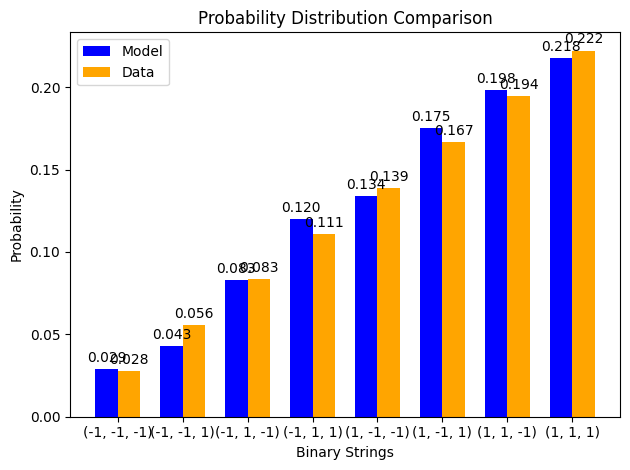

z gradient step for node 0: -6.6845339287850974e-06
z gradient step for node 1: -1.6015104893949668e-05
z gradient step for node 2: -1.2385836489795244e-06
z gradient step for node 3: -5.335971922944105e-06
edge graident step for edge (0, 3): 1.8541267306537657e-05
edge graident step for edge (1, 3): 9.746591250889434e-06
edge graident step for edge (2, 3): -3.875374673534771e-06
edge graident step for edge (0, 1): 2.4795335060266447e-05
edge graident step for edge (0, 2): -9.467995984013489e-06
edge graident step for edge (1, 2): -1.5359989760778403e-06
x positive phase: 0.0
x negative phase: 0.00031199675666356735
x gradient step for node 0: -3.1199675666356733e-07
x positive phase: 0.0
x negative phase: 0.0007393806789684727
x gradient step for node 1: -7.393806789684727e-07
x positive phase: 0.0
x negative phase: 0.00034568746279099185
x gradient step for node 2: -3.4568746279099184e-07
x positive phase: -0.14910129018046453
x negative phase: -0.14972210605035904
x gradient step fo

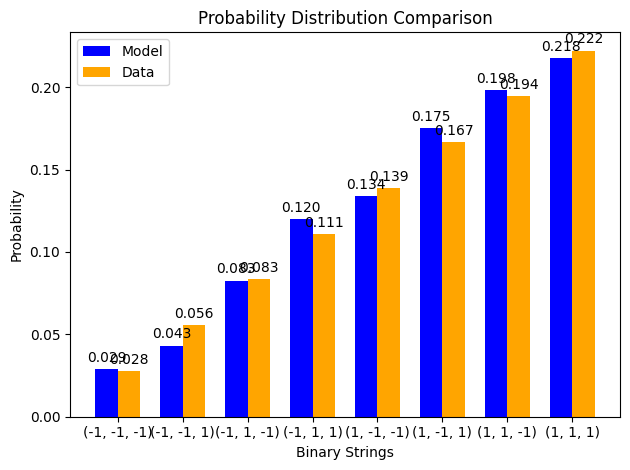

z gradient step for node 0: -6.087070427660213e-06
z gradient step for node 1: -1.5198326980556232e-05
z gradient step for node 2: -1.1910238528493877e-06
z gradient step for node 3: -5.086161501951514e-06
edge graident step for edge (0, 3): 1.778833419848297e-05
edge graident step for edge (1, 3): 9.231702806726875e-06
edge graident step for edge (2, 3): -3.6884228049543222e-06
edge graident step for edge (0, 1): 2.3528907227621328e-05
edge graident step for edge (0, 2): -9.069007945723143e-06
edge graident step for edge (1, 2): -1.4485174397742273e-06
x positive phase: 0.0
x negative phase: 0.00028355862047222145
x gradient step for node 0: -2.8355862047222145e-07
x positive phase: 0.0
x negative phase: 0.0006724470719332714
x gradient step for node 1: -6.724470719332714e-07
x positive phase: 0.0
x negative phase: 0.00031406108530347026
x gradient step for node 2: -3.1406108530347027e-07
x positive phase: -0.1490815078730448
x negative phase: -0.14967145537294183
x gradient step for 

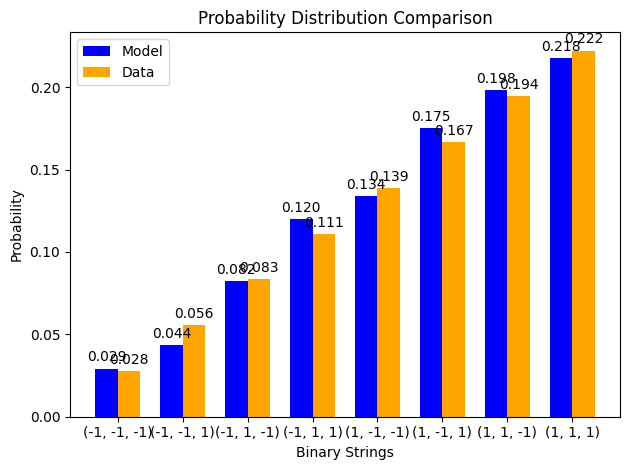

z gradient step for node 0: -5.520755421779932e-06
z gradient step for node 1: -1.4417739529623553e-05
z gradient step for node 2: -1.1443245097585013e-06
z gradient step for node 3: -4.846724269562674e-06
edge graident step for edge (0, 3): 1.707076442677302e-05
edge graident step for edge (1, 3): 8.739488413630036e-06
edge graident step for edge (2, 3): -3.510225200849343e-06
edge graident step for edge (0, 1): 2.23134173408361e-05
edge graident step for edge (0, 2): -8.685866338789331e-06
edge graident step for edge (1, 2): -1.3639662629581495e-06
x positive phase: 0.0
x negative phase: 0.0002576895049650717
x gradient step for node 0: -2.576895049650717e-07
x positive phase: 0.0
x negative phase: 0.0006115499843719154
x gradient step for node 1: -6.115499843719155e-07
x positive phase: 0.0
x negative phase: 0.0002853269248642092
x gradient step for node 2: -2.8532692486420923e-07
x positive phase: -0.14906284432588038
x negative phase: -0.14962303445033723
x gradient step for node 

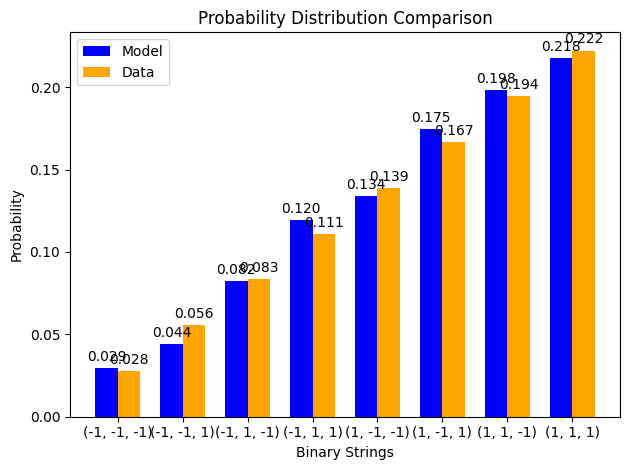

z gradient step for node 0: -4.984560842653141e-06
z gradient step for node 1: -1.3672305006415558e-05
z gradient step for node 2: -1.0985215901611056e-06
z gradient step for node 3: -4.617452277357437e-06
edge graident step for edge (0, 3): 1.6387478531744104e-05
edge graident step for edge (1, 3): 8.269302137401957e-06
edge graident step for edge (2, 3): -3.3405672745149e-06
edge graident step for edge (0, 1): 2.114784392936174e-05
edge graident step for edge (0, 2): -8.318329106407854e-06
edge graident step for edge (1, 2): -1.2825915616375416e-06
x positive phase: 0.0
x negative phase: 0.00023416064599900556
x gradient step for node 0: -2.3416064599900557e-07
x positive phase: 0.0
x negative phase: 0.0005561482479272382
x gradient step for node 1: -5.561482479272382e-07
x positive phase: 0.0
x negative phase: 0.0002592206491961751
x gradient step for node 2: -2.5922064919617515e-07
x positive phase: -0.14904527831323627
x negative phase: -0.1495768207396333
x gradient step for node

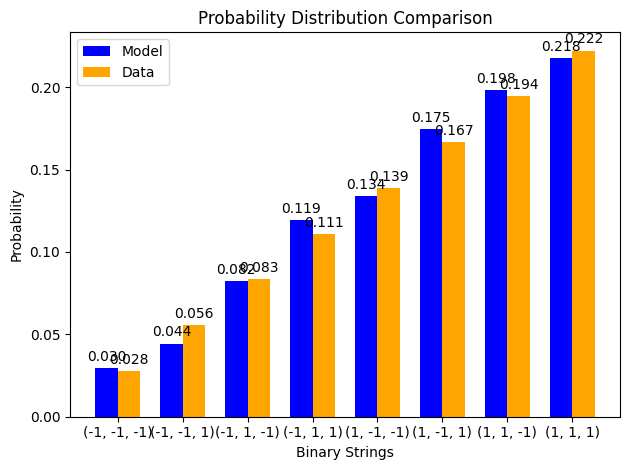

z gradient step for node 0: -4.4774154033999645e-06
z gradient step for node 1: -1.2960952988459506e-05
z gradient step for node 2: -1.053650236083753e-06
z gradient step for node 3: -4.398114661877006e-06
edge graident step for edge (0, 3): 1.573735380744762e-05
edge graident step for edge (1, 3): 7.820478755194454e-06
edge graident step for edge (2, 3): -3.1792119133364215e-06
edge graident step for edge (0, 1): 2.0031080175996557e-05
edge graident step for edge (0, 2): -7.966117606092533e-06
edge graident step for edge (1, 2): -1.2045757890509213e-06
x positive phase: 0.0
x negative phase: 0.00021276318330234486
x gradient step for node 0: -2.1276318330234485e-07
x positive phase: 0.0
x negative phase: 0.0005057487524880036
x gradient step for node 1: -5.057487524880036e-07
x positive phase: 0.0
x negative phase: 0.00023550206489350367
x gradient step for node 2: -2.3550206489350367e-07
x positive phase: -0.14902878615643833
x negative phase: -0.14953278428599606
x gradient step for

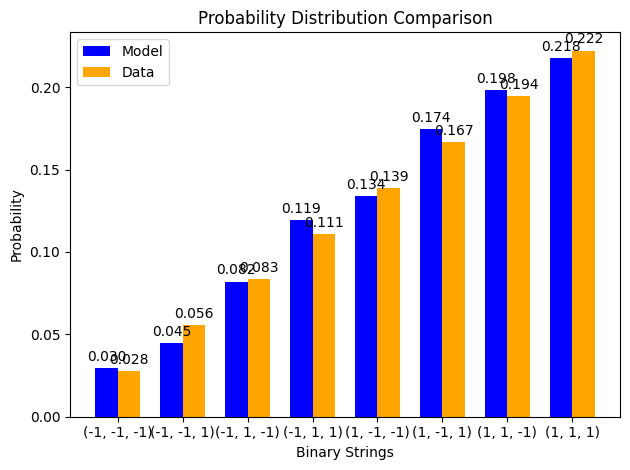

z gradient step for node 0: -3.9982171957277935e-06
z gradient step for node 1: -1.2282588594307503e-05
z gradient step for node 2: -1.0097437745107408e-06
z gradient step for node 3: -4.1884613234827175e-06
edge graident step for edge (0, 3): 1.5119236235493883e-05
edge graident step for edge (1, 3): 7.392338776965837e-06
edge graident step for edge (2, 3): -3.025904076463748e-06
edge graident step for edge (0, 1): 1.8961946618268e-05
edge graident step for edge (0, 2): -7.628920524102412e-06
edge graident step for edge (1, 2): -1.1300456112414427e-06
x positive phase: 0.0
x negative phase: 0.0001933064926551612
x gradient step for node 0: -1.9330649265516123e-07
x positive phase: 0.0
x negative phase: 0.0004599022414106901
x gradient step for node 1: -4.599022414106901e-07
x positive phase: 0.0
x negative phase: 0.0002139529152360065
x gradient step for node 2: -2.139529152360065e-07
x positive phase: -0.14901334211218642
x negative phase: -0.14949088867239246
x gradient step for nod

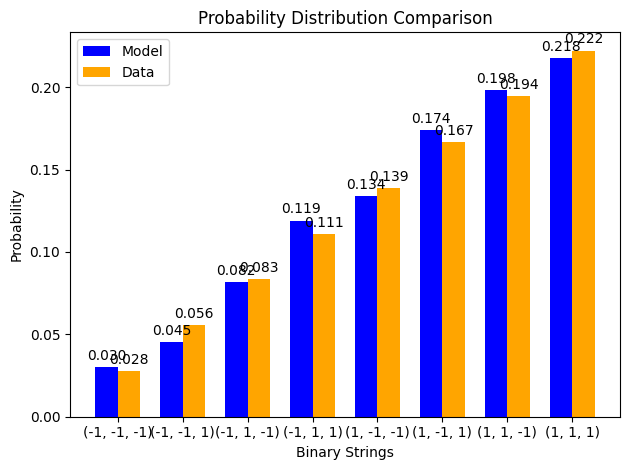

z gradient step for node 0: -3.5458449631204927e-06
z gradient step for node 1: -1.163610027562345e-05
z gradient step for node 2: -9.668329498634664e-07
z gradient step for node 3: -3.988226361151481e-06
edge graident step for edge (0, 3): 1.4531951198415383e-05
edge graident step for edge (1, 3): 6.984193094915603e-06
edge graident step for edge (2, 3): -2.880374935879615e-06
edge graident step for edge (0, 1): 1.7939203172026755e-05
edge graident step for edge (0, 2): -7.306397865782258e-06
edge graident step for edge (1, 2): -1.059079157628734e-06
x positive phase: 0.0
x negative phase: 0.00017561664944540275
x gradient step for node 0: -1.7561664944540275e-07
x positive phase: 0.0
x negative phase: 0.0004181994662313265
x gradient step for node 1: -4.181994662313265e-07
x positive phase: 0.0
x negative phase: 0.00019437487871163693
x gradient step for node 2: -1.9437487871163693e-07
x positive phase: -0.14899891873166066
x negative phase: -0.14945109191593148
x gradient step for n

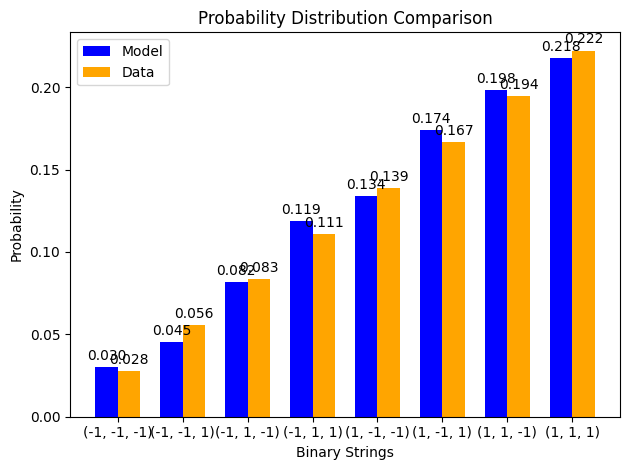

z gradient step for node 0: -3.1191681003418515e-06
z gradient step for node 1: -1.1020366947167653e-05
z gradient step for node 2: -9.249453481020854e-07
z gradient step for node 3: -3.797131252095243e-06
edge graident step for edge (0, 3): 1.397431302259572e-05
edge graident step for edge (1, 3): 6.595347241711458e-06
edge graident step for edge (2, 3): -2.74234557795755e-06
edge graident step for edge (0, 1): 1.696156042460528e-05
edge graident step for edge (0, 2): -6.998184930547852e-06
edge graident step for edge (1, 2): -9.917126612185024e-07
x positive phase: 0.0
x negative phase: 0.0001595350142723684
x gradient step for node 0: -1.595350142723684e-07
x positive phase: 0.0
x negative phase: 0.0003802676711927692
x gradient step for node 1: -3.802676711927692e-07
x positive phase: 0.0
x negative phase: 0.00017658774996295496
x gradient step for node 2: -1.7658774996295497e-07
x positive phase: -0.14898548719037674
x negative phase: -0.14941334730665828
x gradient step for node 

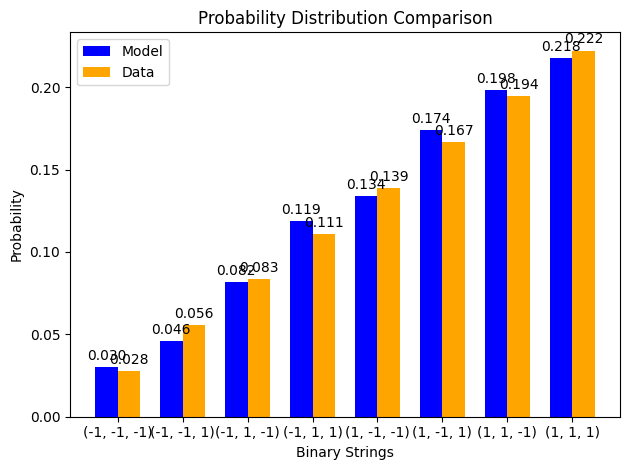

z gradient step for node 0: -2.717055440095928e-06
z gradient step for node 1: -1.0434264446274849e-05
z gradient step for node 2: -8.841049870054185e-07
z gradient step for node 3: -3.6148877711292828e-06
edge graident step for edge (0, 3): 1.3445133408690358e-05
edge graident step for edge (1, 3): 6.225105249805657e-06
edge graident step for edge (2, 3): -2.6115302862137202e-06
edge graident step for edge (0, 1): 1.6027690162489476e-05
edge graident step for edge (0, 2): -6.703896198615625e-06
edge graident step for edge (1, 2): -9.279465078836091e-07
x positive phase: 0.0
x negative phase: 0.0001449169318238854
x gradient step for node 0: -1.449169318238854e-07
x positive phase: 0.0
x negative phase: 0.0003457673802402443
x gradient step for node 1: -3.457673802402443e-07
x positive phase: 0.0
x negative phase: 0.00016042778654091352
x gradient step for node 2: -1.6042778654091352e-07
x positive phase: -0.14897301758919965
x negative phase: -0.1493776041863413
x gradient step for no

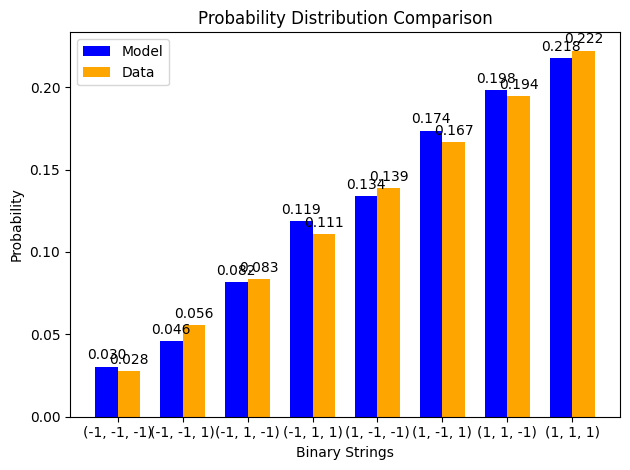

z gradient step for node 0: -2.3383828958506437e-06
z gradient step for node 1: -9.876671327279208e-06
z gradient step for node 2: -8.443320491509643e-07
z gradient step for node 3: -3.4412006497653856e-06
edge graident step for edge (0, 3): 1.2943228813426356e-05
edge graident step for edge (1, 3): 5.872773113424601e-06
edge graident step for edge (2, 3): -2.4876394287567104e-06
edge graident step for edge (0, 1): 1.5136235114005026e-05
edge graident step for edge (0, 2): -6.423129072666345e-06
edge graident step for edge (1, 2): -8.677507181888145e-07
x positive phase: 0.0
x negative phase: 0.00013163053478265461
x gradient step for node 0: -1.316305347826546e-07
x positive phase: 0.0
x negative phase: 0.0003143894612947632
x gradient step for node 1: -3.1438946129476323e-07
x positive phase: 0.0
x negative phase: 0.0001457462063639958
x gradient step for node 2: -1.457462063639958e-07
x positive phase: -0.14896147922728617
x negative phase: -0.14934380866622135
x gradient step for n

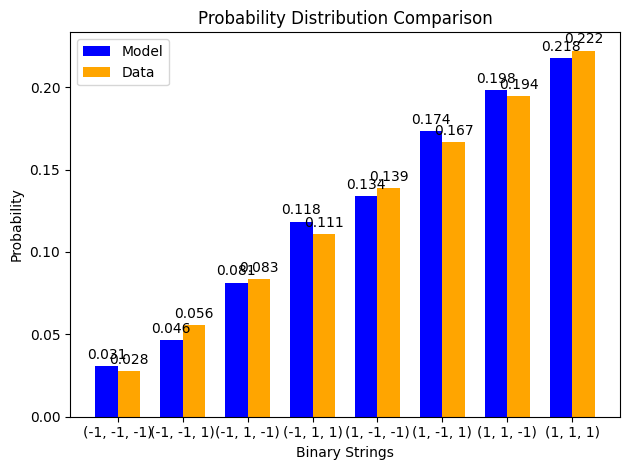

z gradient step for node 0: -1.982040035627519e-06
z gradient step for node 1: -9.34647400734412e-06
z gradient step for node 2: -8.056427360180197e-07
z gradient step for node 3: -3.2757699791287067e-06
edge graident step for edge (0, 3): 1.2467426850852447e-05
edge graident step for edge (1, 3): 5.537661862167128e-06
edge graident step for edge (2, 3): -2.3703819759198775e-06
edge graident step for edge (0, 1): 1.4285817901075402e-05
edge graident step for edge (0, 2): -6.155467431588249e-06
edge graident step for edge (1, 2): -8.11069888407484e-07
x positive phase: 0.0
x negative phase: 0.0001195556450225415
x gradient step for node 0: -1.195556450225415e-07
x positive phase: 0.0
x negative phase: 0.0002858524446118267
x gradient step for node 1: -2.8585244461182673e-07
x positive phase: 0.0
x negative phase: 0.00013240782215688575
x gradient step for node 2: -1.3240782215688574e-07
x positive phase: -0.1489508408480021
x negative phase: -0.14931190428384825
x gradient step for node

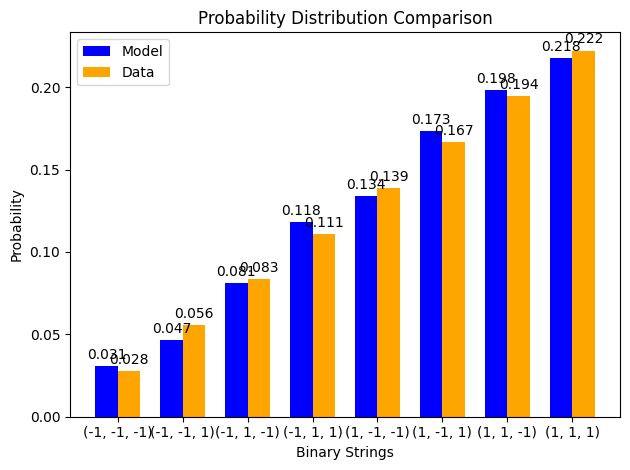

z gradient step for node 0: -1.6469356651660493e-06
z gradient step for node 1: -8.842571288658952e-06
z gradient step for node 2: -7.680492235295627e-07
z gradient step for node 3: -3.118293364141933e-06
edge graident step for edge (0, 3): 1.2016571783607656e-05
edge graident step for edge (1, 3): 5.219090260735984e-06
edge graident step for edge (2, 3): -2.25946767485255e-06
edge graident step for edge (0, 1): 1.347504920566421e-05
edge graident step for edge (0, 2): -5.900484965382772e-06
edge graident step for edge (1, 2): -7.578276198833278e-07
x positive phase: 0.0
x negative phase: 0.00010858276483843423
x gradient step for node 0: -1.0858276483843423e-07
x positive phase: 0.0
x negative phase: 0.0002599000738826544
x gradient step for node 1: -2.5990007388265443e-07
x positive phase: 0.0
x negative phase: 0.00012028980039321031
x gradient step for node 2: -1.202898003932103e-07
x positive phase: -0.148941070859066
x negative phase: -0.14928183260007788
x gradient step for node 

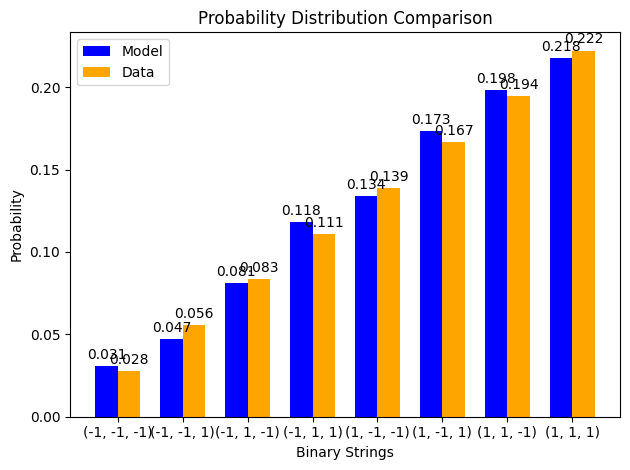

z gradient step for node 0: -1.3320025006433034e-06
z gradient step for node 1: -8.363878288267929e-06
z gradient step for node 2: -7.315597012038933e-07
z gradient step for node 3: -2.9684678389615417e-06
edge graident step for edge (0, 3): 1.1589529175869084e-05
edge graident step for edge (1, 3): 4.916387153505883e-06
edge graident step for edge (2, 3): -2.154608908415512e-06
edge graident step for edge (0, 1): 1.2702535166158033e-05
edge graident step for edge (0, 2): -5.657748270473662e-06
edge graident step for edge (1, 2): -7.079304675835785e-07
x positive phase: 0.0
x negative phase: 9.861215141455975e-05
x gradient step for node 0: -9.861215141455975e-08
x positive phase: 0.0
x negative phase: 0.0002362990704471598
x gradient step for node 1: -2.3629907044715982e-07
x positive phase: 0.0
x negative phase: 0.00010928053340303231
x gradient step for node 2: -1.0928053340303232e-07
x positive phase: -0.1489321375283199
x negative phase: -0.1492535337380347
x gradient step for nod

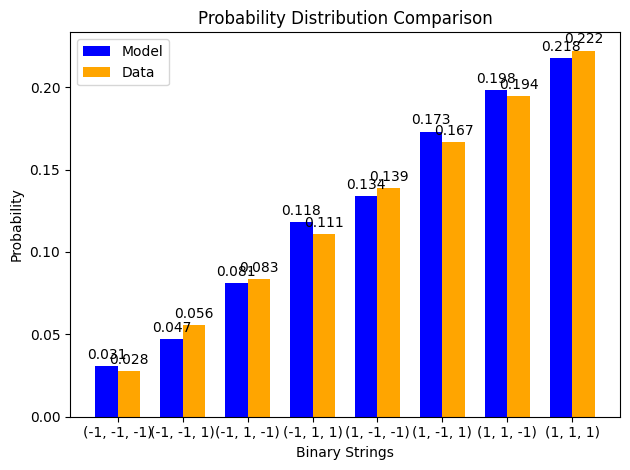

z gradient step for node 0: -1.036201011243354e-06
z gradient step for node 1: -7.909329811260635e-06
z gradient step for node 2: -6.96178478886006e-07
z gradient step for node 3: -2.825991555634788e-06
edge graident step for edge (0, 3): 1.1185189779421123e-05
edge graident step for edge (1, 3): 4.628893475491697e-06
edge graident step for edge (2, 3): -2.05552226582606e-06
edge graident step for edge (0, 1): 1.1966884026810177e-05
edge graident step for edge (0, 2): -5.426819693106183e-06
edge graident step for edge (1, 2): -6.612714397853381e-07
x positive phase: 0.0
x negative phase: 8.955296817645726e-05
x gradient step for node 0: -8.955296817645726e-08
x positive phase: 0.0
x negative phase: 0.0002148370925715417
x gradient step for node 1: -2.148370925715417e-07
x positive phase: 0.0
x negative phase: 9.927861433819604e-05
x gradient step for node 2: -9.927861433819605e-08
x positive phase: -0.14892400915662
x negative phase: -0.1492269468664093
x gradient step for node 3: 3.02

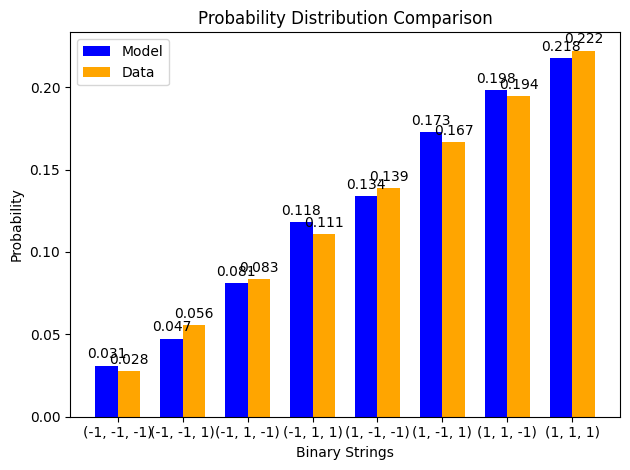

z gradient step for node 0: -7.585225106686577e-07
z gradient step for node 1: -7.47788320588566e-06
z gradient step for node 2: -6.619061468326748e-07
z gradient step for node 3: -2.6905652592732477e-06
edge graident step for edge (0, 3): 1.080247272306012e-05
edge graident step for edge (1, 3): 4.355963953130759e-06
edge graident step for edge (2, 3): -1.961929851999e-06
edge graident step for edge (0, 1): 1.1266712069615076e-05
edge graident step for edge (0, 2): -5.207259915556942e-06
edge graident step for edge (1, 2): -6.177330813051385e-07
x positive phase: 0.0
x negative phase: 8.132250709159077e-05
x gradient step for node 0: -8.132250709159078e-08
x positive phase: 0.0
x negative phase: 0.000195320873207512
x gradient step for node 1: -1.95320873207512e-07
x positive phase: 0.0
x negative phase: 9.019190562687107e-05
x gradient step for node 2: -9.019190562687106e-08
x positive phase: -0.14891665422939498
x negative phase: -0.14920201062987695
x gradient step for node 3: 2.85

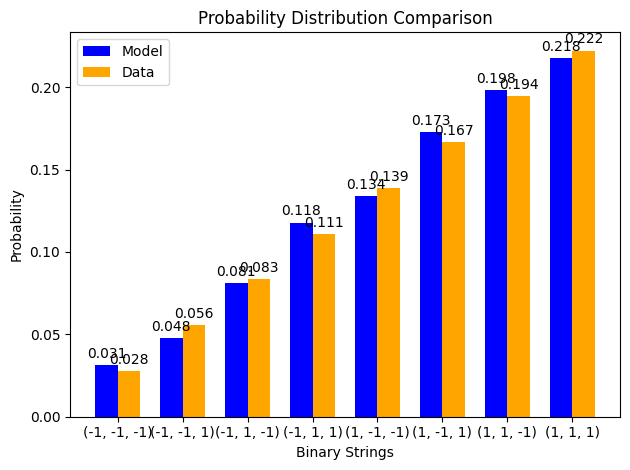

z gradient step for node 0: -4.979915743675289e-07
z gradient step for node 1: -7.06852074071293e-06
z gradient step for node 2: -6.287397765699643e-07
z gradient step for node 3: -2.561893563957973e-06
edge graident step for edge (0, 3): 1.0440328073416217e-05
edge graident step for edge (1, 3): 4.096968519267969e-06
edge graident step for edge (2, 3): -1.8735603617669738e-06
edge graident step for edge (0, 1): 1.0600648862736914e-05
edge graident step for edge (0, 2): -4.998630285503971e-06
edge graident step for edge (1, 2): -5.771901726427941e-07
x positive phase: 0.0
x negative phase: 7.384547638316849e-05
x gradient step for node 0: -7.384547638316849e-08
x positive phase: 0.0
x negative phase: 0.0001775745210030957
x gradient step for node 1: -1.775745210030957e-07
x positive phase: 0.0
x negative phase: 8.193669240134517e-05
x gradient step for node 2: -8.193669240134517e-08
x positive phase: -0.14891004154844
x negative phase: -0.149178663529704
x gradient step for node 3: 2.6

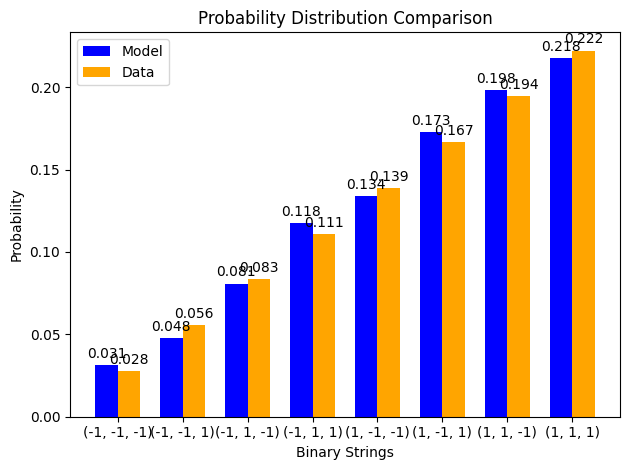

z gradient step for node 0: -2.5366785609431953e-07
z gradient step for node 1: -6.680251544444543e-06
z gradient step for node 2: -5.966731516082596e-07
z gradient step for node 3: -2.4396860440536463e-06
edge graident step for edge (0, 3): 1.0097738832494374e-05
edge graident step for edge (1, 3): 3.851293467016389e-06
edge graident step for edge (2, 3): -1.7901499439879898e-06
edge graident step for edge (0, 1): 9.967341863077712e-06
edge graident step for edge (0, 2): -4.8004948934663035e-06
edge graident step for edge (1, 2): -5.395120769487449e-07
x positive phase: 0.0
x negative phase: 6.705334850141758e-05
x gradient step for node 0: -6.705334850141758e-08
x positive phase: 0.0
x negative phase: 0.00016143797058432047
x gradient step for node 1: -1.6143797058432048e-07
x positive phase: 0.0
x negative phase: 7.44369131581309e-05
x gradient step for node 2: -7.443691315813091e-08
x positive phase: -0.14890414034550215
x negative phase: -0.14915684425779396
x gradient step for no

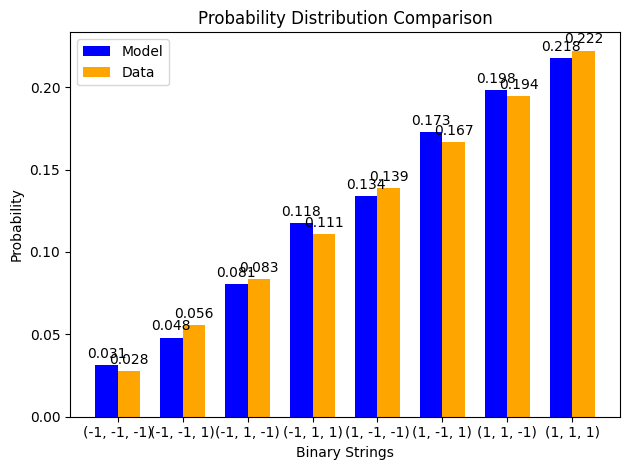

z gradient step for node 0: -2.464737359014757e-08
z gradient step for node 1: -6.312113148587734e-06
z gradient step for node 2: -5.656970185616145e-07
z gradient step for node 3: -2.3236581557718463e-06
edge graident step for edge (0, 3): 9.773722433905119e-06
edge graident step for edge (1, 3): 3.618342366896024e-06
edge graident step for edge (2, 3): -1.7114428792480985e-06
edge graident step for edge (0, 1): 9.365460412893114e-06
edge graident step for edge (0, 2): -4.612422406677932e-06
edge graident step for edge (1, 2): -5.045647658620256e-07
x positive phase: 0.0
x negative phase: 6.088376355662896e-05
x gradient step for node 0: -6.088376355662896e-08
x positive phase: 0.0
x negative phase: 0.0001467655692801955
x gradient step for node 1: -1.467655692801955e-07
x positive phase: 0.0
x negative phase: 6.762346061388369e-05
x gradient step for node 2: -6.76234606138837e-08
x positive phase: -0.14889892037918495
x negative phase: -0.1491364919875089
x gradient step for node 3: 

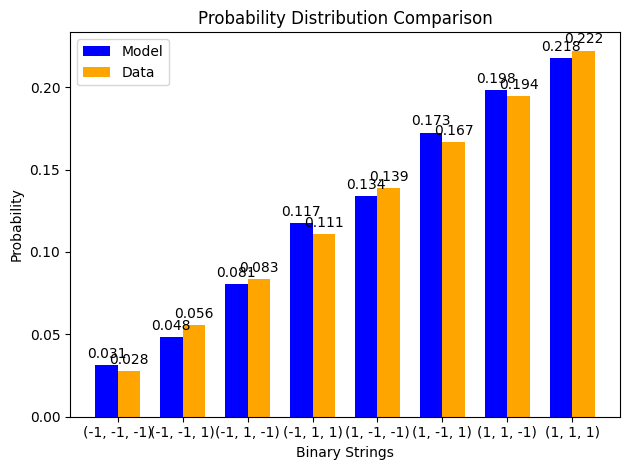

z gradient step for node 0: 1.8993667108124778e-07
z gradient step for node 1: -5.963172672174916e-06
z gradient step for node 2: -5.357993506741599e-07
z gradient step for node 3: -2.213532003680463e-06
edge graident step for edge (0, 3): 9.467331796104595e-06
edge graident step for edge (1, 3): 3.397536770970655e-06
edge graident step for edge (2, 3): -1.6371920933229146e-06
edge graident step for edge (0, 1): 8.793699171702266e-06
edge graident step for edge (0, 2): -4.433987670442466e-06
edge graident step for edge (1, 2): -4.7221255414478527e-07
x positive phase: 0.0
x negative phase: 5.5279983759055565e-05
x gradient step for node 0: -5.5279983759055566e-08
x positive phase: 0.0
x negative phase: 0.00013342478852691216
x gradient step for node 1: -1.3342478852691216e-07
x positive phase: 0.0
x negative phase: 6.143354636094658e-05
x gradient step for node 2: -6.143354636094657e-08
x positive phase: -0.1488943520166493
x negative phase: -0.14911754662462448
x gradient step for nod

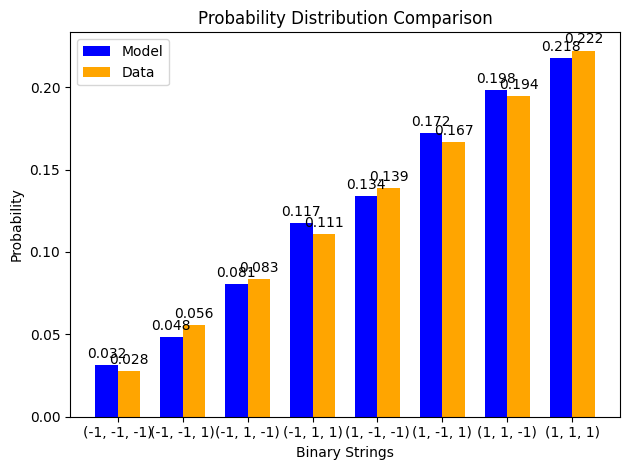

z gradient step for node 0: 3.9091347559649935e-07
z gradient step for node 1: -5.6325276861523276e-06
z gradient step for node 2: -5.069656170011427e-07
z gradient step for node 3: -2.1090369665236473e-06
edge graident step for edge (0, 3): 9.177655987013977e-06
edge graident step for edge (1, 3): 3.1883167267021674e-06
edge graident step for edge (2, 3): -1.5671595269973749e-06
edge graident step for edge (0, 1): 8.250781025254256e-06
edge graident step for edge (0, 2): -4.264773089867821e-06
edge graident step for edge (1, 2): -4.4231957167320536e-07
x positive phase: 0.0
x negative phase: 5.019039473258715e-05
x gradient step for node 0: -5.019039473258715e-08
x positive phase: 0.0
x negative phase: 0.00012129504916751992
x gradient step for node 1: -1.2129504916751992e-07
x positive phase: 0.0
x negative phase: 5.581012350838599e-05
x gradient step for node 2: -5.581012350838599e-08
x positive phase: -0.14889040630152753
x negative phase: -0.14909994902173337
x gradient step for n

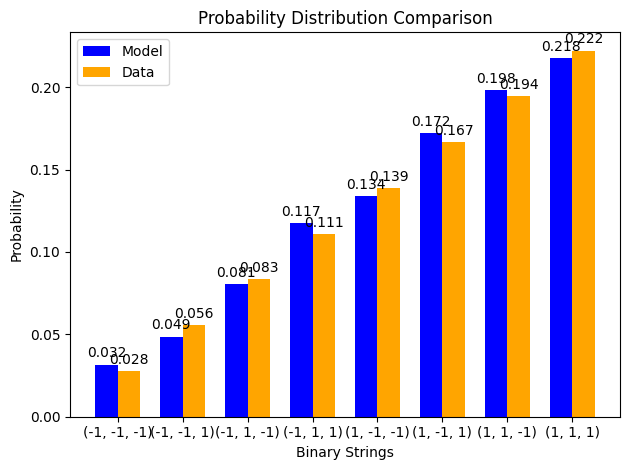

z gradient step for node 0: 5.790745695932187e-07
z gradient step for node 1: -5.319306793173745e-06
z gradient step for node 2: -4.791790517071765e-07
z gradient step for node 3: -2.009910196191456e-06
edge graident step for edge (0, 3): 8.903820550384356e-06
edge graident step for edge (1, 3): 2.990141122029527e-06
edge graident step for edge (2, 3): -1.501116381168649e-06
edge graident step for edge (0, 1): 7.735459513136714e-06
edge graident step for edge (0, 2): -4.104369806193678e-06
edge graident step for edge (1, 2): -4.1475099980328724e-07
x positive phase: 0.0
x negative phase: 4.556804987245002e-05
x gradient step for node 0: -4.5568049872450024e-08
x positive phase: 0.0
x negative phase: 0.00011026665076637983
x gradient step for node 1: -1.1026665076637984e-07
x positive phase: 0.0
x negative phase: 5.070136202349217e-05
x gradient step for node 2: -5.0701362023492176e-08
x positive phase: -0.14888705500939814
x negative phase: -0.14908364115933007
x gradient step for node

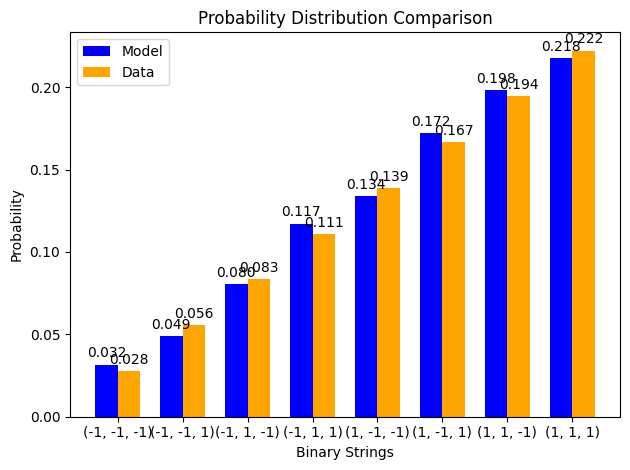

z gradient step for node 0: 7.551740435776111e-07
z gradient step for node 1: -5.022669956360942e-06
z gradient step for node 2: -4.524209189548656e-07
z gradient step for node 3: -1.9158970030469514e-06
edge graident step for edge (0, 3): 8.644987540166294e-06
edge graident step for edge (1, 3): 2.802487881808674e-06
edge graident step for edge (2, 3): -1.4388432545428264e-06
edge graident step for edge (0, 1): 7.246520815874083e-06
edge graident step for edge (0, 2): -3.95237868264188e-06
edge graident step for edge (1, 2): -3.8937409749978394e-07
x positive phase: 0.0
x negative phase: 4.137025420247068e-05
x gradient step for node 0: -4.137025420247069e-08
x positive phase: 0.0
x negative phase: 0.00010023979588903481
x gradient step for node 1: -1.0023979588903481e-07
x positive phase: 0.0
x negative phase: 4.6060171969708354e-05
x gradient step for node 2: -4.6060171969708354e-08
x positive phase: -0.14888427069208882
x negative phase: -0.14906856629668414
x gradient step for nod

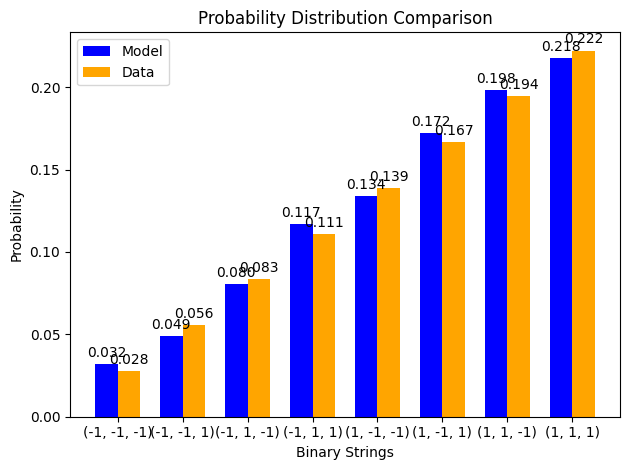

z gradient step for node 0: 9.199290277633332e-07
z gradient step for node 1: -4.7418086083013675e-06
z gradient step for node 2: -4.266707698244443e-07
z gradient step for node 3: -1.8267511400860137e-06
edge graident step for edge (0, 3): 8.400355305135554e-06
edge graident step for edge (1, 3): 2.6248540343071227e-06
edge graident step for edge (2, 3): -1.380130189589296e-06
edge graident step for edge (0, 1): 6.78278534119392e-06
edge graident step for edge (0, 2): -3.80841111509235e-06
edge graident step for edge (1, 2): -3.6605904088143905e-07
x positive phase: 0.0
x negative phase: 3.75581844552304e-05
x gradient step for node 0: -3.75581844552304e-08
x positive phase: 0.0
x negative phase: 9.112370106298357e-05
x gradient step for node 1: -9.112370106298357e-08
x positive phase: 0.0
x negative phase: 4.184377027421058e-05
x gradient step for node 2: -4.184377027421058e-08
x positive phase: -0.14888202671199863
x negative phase: -0.1490546690954705
x gradient step for node 3: 1.

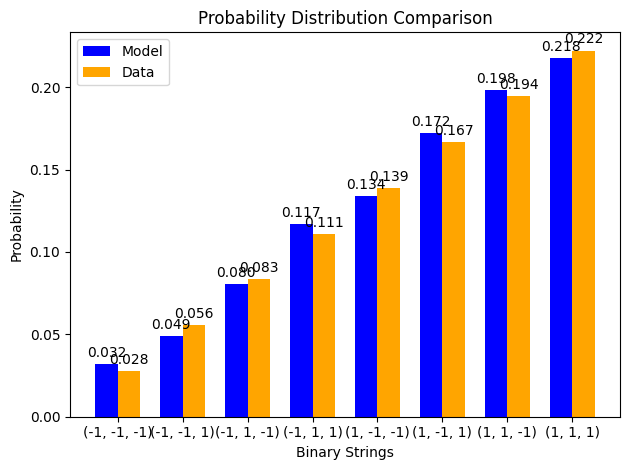

z gradient step for node 0: 1.074020378656504e-06
z gradient step for node 1: -4.47594556916589e-06
z gradient step for node 2: -4.019066884993483e-07
z gradient step for node 3: -1.7422349976202734e-06
edge graident step for edge (0, 3): 8.169158062086068e-06
edge graident step for edge (1, 3): 2.456755664968141e-06
edge graident step for edge (2, 3): -1.3247766408739093e-06
edge graident step for edge (0, 1): 6.343108947595267e-06
edge graident step for edge (0, 2): -3.6720896828539575e-06
edge graident step for edge (1, 2): -3.446795981071893e-07
x positive phase: 0.0
x negative phase: 3.409654234930301e-05
x gradient step for node 0: -3.409654234930301e-08
x positive phase: 0.0
x negative phase: 8.283578683808332e-05
x gradient step for node 1: -8.283578683808332e-08
x positive phase: 0.0
x negative phase: 3.801328705586574e-05
x gradient step for node 2: -3.801328705586574e-08
x positive phase: -0.14888029726754576
x negative phase: -0.14904189571895626
x gradient step for node 3:

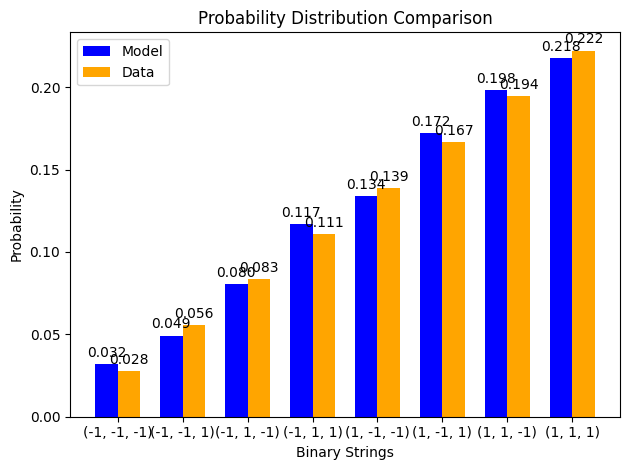

z gradient step for node 0: 1.2180935356032596e-06
z gradient step for node 1: -4.224334800447621e-06
z gradient step for node 2: -3.781055256814603e-07
z gradient step for node 3: -1.6621197193469328e-06
edge graident step for edge (0, 3): 7.950665292129177e-06
edge graident step for edge (1, 3): 2.297727773174385e-06
edge graident step for edge (2, 3): -1.2725913783863397e-06
edge graident step for edge (0, 1): 5.926383841584601e-06
edge graident step for edge (0, 2): -3.543048654549408e-06
edge graident step for edge (1, 2): -3.2511365976803375e-07
x positive phase: 0.0
x negative phase: 3.0953238272342286e-05
x gradient step for node 0: -3.0953238272342284e-08
x positive phase: 0.0
x negative phase: 7.53009400115144e-05
x gradient step for node 1: -7.530094001151441e-08
x positive phase: 0.0
x negative phase: 3.453340790566563e-05
x gradient step for node 2: -3.453340790566563e-08
x positive phase: -0.14887905741076551
x negative phase: -0.14903019390937286
x gradient step for node

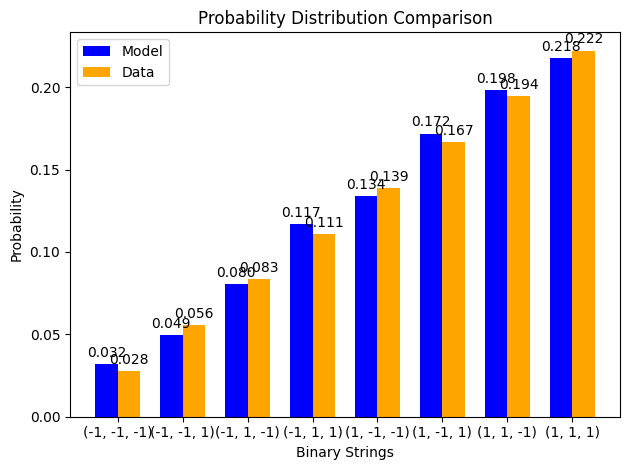

z gradient step for node 0: 1.3527595136935688e-06
z gradient step for node 1: -3.9862610184689955e-06
z gradient step for node 2: -3.5524311778761806e-07
z gradient step for node 3: -1.5861852498489927e-06
edge graident step for edge (0, 3): 7.744180991040129e-06
edge graident step for edge (1, 3): 2.1473240463086435e-06
edge graident step for edge (2, 3): -1.2233923370975897e-06
edge graident step for edge (0, 1): 5.5315391829668105e-06
edge graident step for edge (0, 2): -3.420934363636177e-06
edge graident step for edge (1, 2): -3.072436432493275e-07
x positive phase: 0.0
x negative phase: 2.8099102797724665e-05
x gradient step for node 0: -2.8099102797724666e-08
x positive phase: 0.0
x negative phase: 6.845084167569337e-05
x gradient step for node 1: -6.845084167569338e-08
x positive phase: 0.0
x negative phase: 3.1372048840254144e-05
x gradient step for node 2: -3.137204884025414e-08
x positive phase: -0.14887828305800344
x negative phase: -0.149019513045921
x gradient step for n

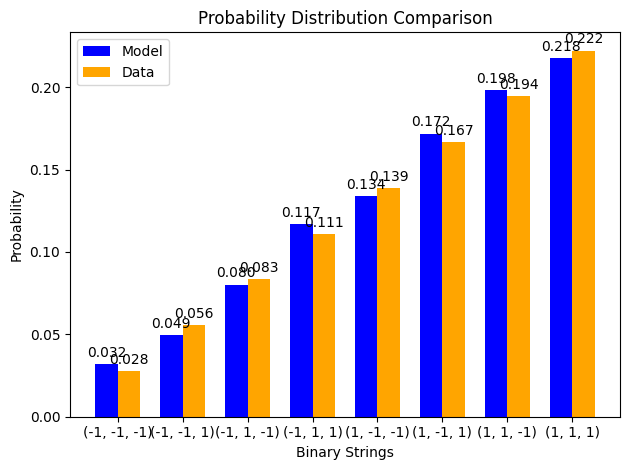

z gradient step for node 0: 1.478596003314514e-06
z gradient step for node 1: -3.761039189517479e-06
z gradient step for node 2: -3.3329449101958396e-07
z gradient step for node 3: -1.5142203227331842e-06
edge graident step for edge (0, 3): 7.549042801219985e-06
edge graident step for edge (1, 3): 2.0051165639981687e-06
edge graident step for edge (2, 3): -1.1770064226459542e-06
edge graident step for edge (0, 1): 5.157541430509991e-06
edge graident step for edge (0, 2): -3.305405467472641e-06
edge graident step for edge (1, 2): -2.909567878604247e-07
x positive phase: 0.0
x negative phase: 2.5507623666451533e-05
x gradient step for node 0: -2.5507623666451533e-08
x positive phase: 0.0
x negative phase: 6.222335529222048e-05
x gradient step for node 1: -6.222335529222048e-08
x positive phase: 0.0
x negative phase: 2.850006094781937e-05
x gradient step for node 2: -2.8500060947819372e-08
x positive phase: -0.14887795099456771
x negative phase: -0.14900980418567392
x gradient step for no

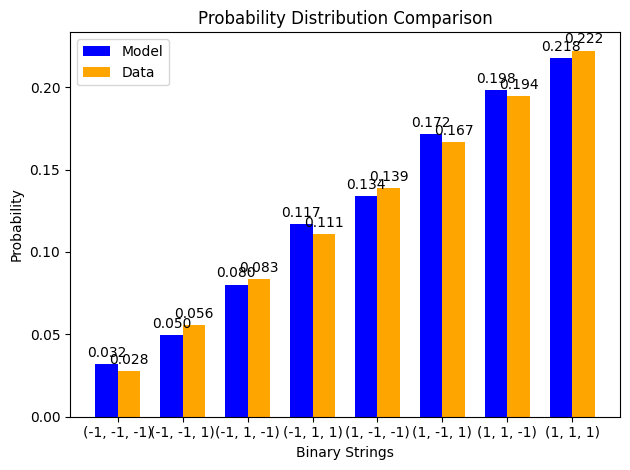

z gradient step for node 0: 1.596148550300658e-06
z gradient step for node 1: -3.5480139263119327e-06
z gradient step for node 2: -3.122340498038223e-07
z gradient step for node 3: -1.4460223978048914e-06
edge graident step for edge (0, 3): 7.364621049666509e-06
edge graident step for edge (1, 3): 1.870695444144546e-06
edge graident step for edge (2, 3): -1.1332692818724345e-06
edge graident step for edge (0, 1): 4.803394458130744e-06
edge graident step for edge (0, 2): -3.196133103077661e-06
edge graident step for edge (1, 2): -2.761453559278482e-07
x positive phase: 0.0
x negative phase: 2.3154706055778777e-05
x gradient step for node 0: -2.3154706055778777e-08
x positive phase: 0.0
x negative phase: 5.656196949462506e-05
x gradient step for node 1: -5.656196949462506e-08
x positive phase: 0.0
x negative phase: 2.589096201712529e-05
x gradient step for node 2: -2.589096201712529e-08
x positive phase: -0.1488780388741317
x negative phase: -0.14900102008946486
x gradient step for node 

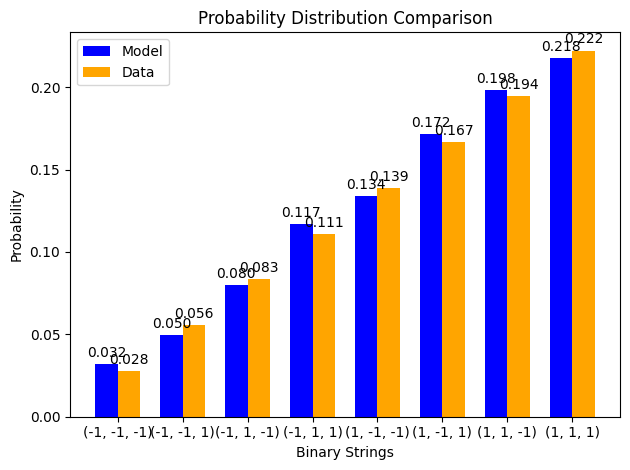

z gradient step for node 0: 1.705931793983706e-06
z gradient step for node 1: -3.3465588034205794e-06
z gradient step for node 2: -2.920357494732712e-07
z gradient step for node 3: -1.381397554905961e-06
edge graident step for edge (0, 3): 7.1903177134315936e-06
edge graident step for edge (1, 3): 1.743668441057139e-06
edge graident step for edge (2, 3): -1.0920250458006098e-06
edge graident step for edge (0, 1): 4.468139469611776e-06
edge graident step for edge (0, 2): -3.0928009519365364e-06
edge graident step for edge (1, 2): -2.627067535501959e-07
x positive phase: 0.0
x negative phase: 2.1018454132288467e-05
x gradient step for node 0: -2.1018454132288467e-08
x positive phase: 0.0
x negative phase: 5.141529078081076e-05
x gradient step for node 1: -5.141529078081076e-08
x positive phase: 0.0
x negative phase: 2.3520692687273973e-05
x gradient step for node 2: -2.3520692687273974e-08
x positive phase: -0.1488785252136039
x negative phase: -0.14899311523466877
x gradient step for no

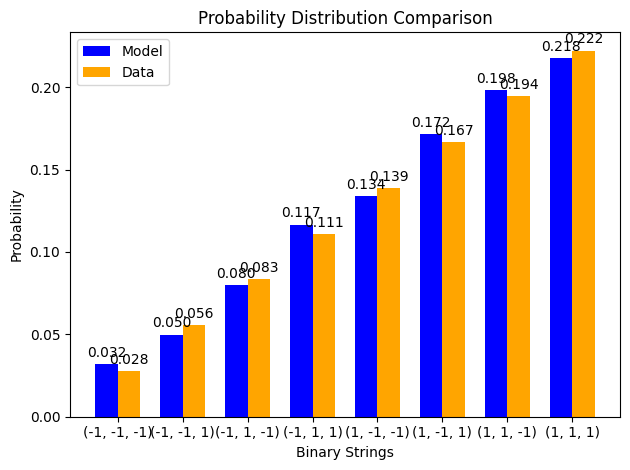

z gradient step for node 0: 1.8084307435125015e-06
z gradient step for node 1: -3.156075607333192e-06
z gradient step for node 2: -2.726732533244181e-07
z gradient step for node 3: -1.3201603512827952e-06
edge graident step for edge (0, 3): 7.025565331348294e-06
edge graident step for edge (1, 3): 1.6236605048887132e-06
edge graident step for edge (2, 3): -1.0531260516640773e-06
edge graident step for edge (0, 1): 4.150854737685672e-06
edge graident step for edge (0, 2): -2.9951052253308076e-06
edge graident step for edge (1, 2): -2.505435832609315e-07
x positive phase: 0.0
x negative phase: 1.9078972050570708e-05
x gradient step for node 0: -1.907897205057071e-08
x positive phase: 0.0
x negative phase: 4.6736581675943165e-05
x gradient step for node 1: -4.6736581675943163e-08
x positive phase: 0.0
x negative phase: 2.136739488016194e-05
x gradient step for node 2: -2.136739488016194e-08
x positive phase: -0.1488793893841145
x negative phase: -0.148986045816618
x gradient step for node

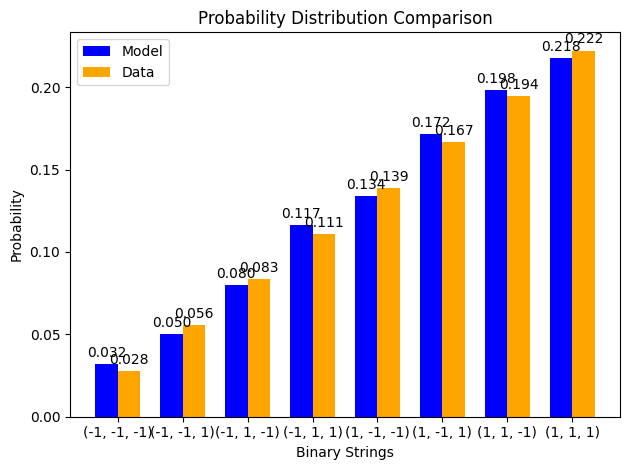

z gradient step for node 0: 1.9041020756239701e-06
z gradient step for node 1: -2.975993535106275e-06
z gradient step for node 2: -2.541200744431982e-07
z gradient step for node 3: -1.2621336486657864e-06
edge graident step for edge (0, 3): 6.869825878340785e-06
edge graident step for edge (1, 3): 1.5103133104885925e-06
edge graident step for edge (2, 3): -1.016432549659413e-06
edge graident step for edge (0, 1): 3.8506551912282085e-06
edge graident step for edge (0, 2): -2.9027545808177484e-06
edge graident step for edge (1, 2): -2.39563639538698e-07
x positive phase: 0.0
x negative phase: 1.731818271006092e-05
x gradient step for node 0: -1.7318182710060922e-08
x positive phase: 0.0
x negative phase: 4.248334033108365e-05
x gradient step for node 1: -4.2483340331083646e-08
x positive phase: 0.0
x negative phase: 1.9411210481559774e-05
x gradient step for node 2: -1.9411210481559775e-08
x positive phase: -0.14888061159870508
x negative phase: -0.14897976974023192
x gradient step for n

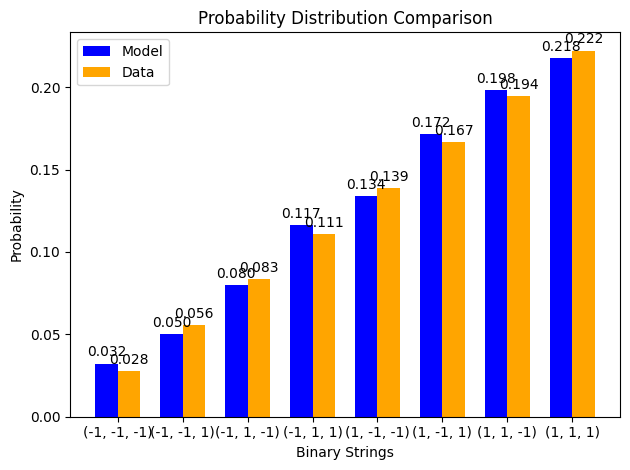

z gradient step for node 0: 1.9933754395460303e-06
z gradient step for node 1: -2.8057683538326717e-06
z gradient step for node 2: -2.3634970282110368e-07
z gradient step for node 3: -1.2071484155563584e-06
edge graident step for edge (0, 3): 6.722589616413144e-06
edge graident step for edge (1, 3): 1.403284762817217e-06
edge graident step for edge (2, 3): -9.818123993153295e-07
edge graident step for edge (0, 1): 3.5666918722565555e-06
edge graident step for edge (0, 2): -2.8154699795846785e-06
edge graident step for edge (1, 2): -2.29679856843662e-07
x positive phase: 0.0
x negative phase: 1.5719662722587298e-05
x gradient step for node 0: -1.57196627225873e-08
x positive phase: 0.0
x negative phase: 3.861691787496091e-05
x gradient step for node 1: -3.861691787496091e-08
x positive phase: 0.0
x negative phase: 1.7634098422156446e-05
x gradient step for node 2: -1.7634098422156446e-08
x positive phase: -0.1488821728972468
x negative phase: -0.14897424660328656
x gradient step for nod

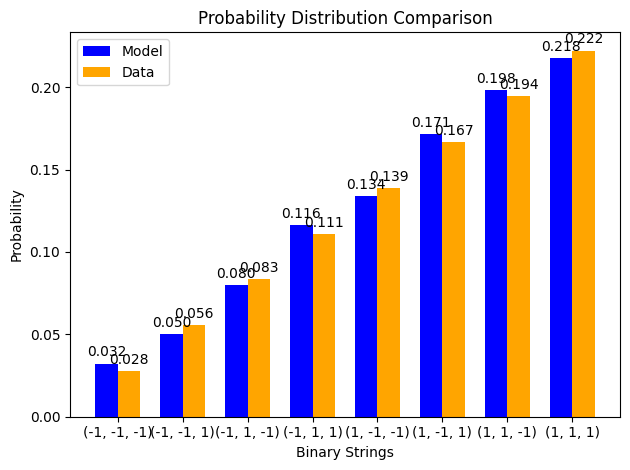

z gradient step for node 0: 2.0766547570106875e-06
z gradient step for node 1: -2.6448815316777173e-06
z gradient step for node 2: -2.1933571845539346e-07
z gradient step for node 3: -1.155043509628584e-06
edge graident step for edge (0, 3): 6.583373934373748e-06
edge graident step for edge (1, 3): 1.3022484851630128e-06
edge graident step for edge (2, 3): -9.491407596068368e-07
edge graident step for edge (0, 1): 3.298151282492459e-06
edge graident step for edge (0, 2): -2.732984493565474e-06
edge graident step for edge (1, 2): -2.2081021873662787e-07
x positive phase: 0.0
x negative phase: 1.4268492172519067e-05
x gradient step for node 0: -1.4268492172519067e-08
x positive phase: 0.0
x negative phase: 3.510217015848336e-05
x gradient step for node 1: -3.5102170158483365e-08
x positive phase: 0.0
x negative phase: 1.6019668478451504e-05
x gradient step for node 2: -1.6019668478451504e-08
x positive phase: -0.14888405512905728
x negative phase: -0.1489694376726044
x gradient step for 

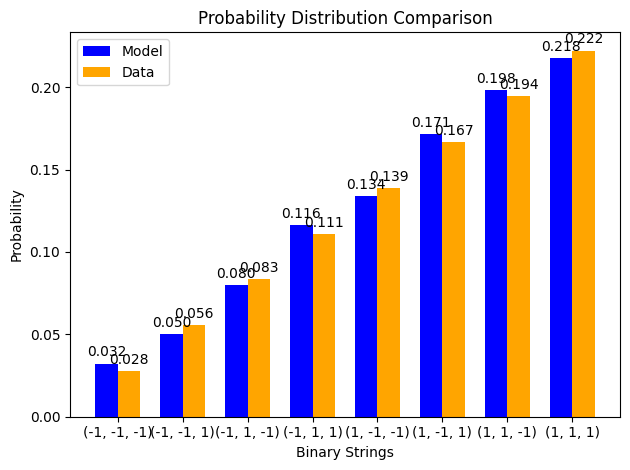

z gradient step for node 0: 2.1543195073366884e-06
z gradient step for node 1: -2.4928393498618586e-06
z gradient step for node 2: -2.030518911975976e-07
z gradient step for node 3: -1.10566544456292e-06
edge graident step for edge (0, 3): 6.4517221865521005e-06
edge graident step for edge (1, 3): 1.2068932956202233e-06
edge graident step for edge (2, 3): -9.182997763269029e-07
edge graident step for edge (0, 1): 3.044254637355151e-06
edge graident step for edge (0, 2): -2.655043070380947e-06
edge graident step for edge (1, 2): -2.1287763557648055e-07
x positive phase: 0.0
x negative phase: 1.295111787074479e-05
x gradient step for node 0: -1.295111787074479e-08
x positive phase: 0.0
x negative phase: 3.190714082635239e-05
x gradient step for node 1: -3.190714082635239e-08
x positive phase: 0.0
x negative phase: 1.455303026658453e-05
x gradient step for node 2: -1.455303026658453e-08
x positive phase: -0.14888624093363623
x negative phase: -0.1489653058543169
x gradient step for node 3

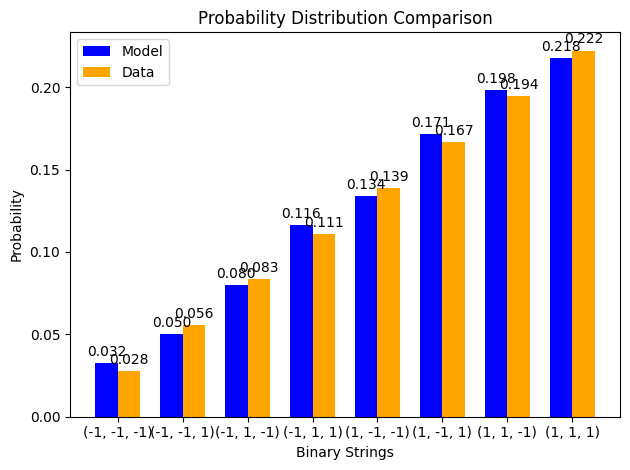

z gradient step for node 0: 2.2267259893667957e-06
z gradient step for node 1: -2.3491720036845353e-06
z gradient step for node 2: -1.874722681712432e-07
z gradient step for node 3: -1.058868145116021e-06
edge graident step for edge (0, 3): 6.327202539143539e-06
edge graident step for edge (1, 3): 1.1169226765210537e-06
edge graident step for edge (2, 3): -8.891782696359152e-07
edge graident step for edge (0, 1): 2.8042570435427433e-06
edge graident step for edge (0, 2): -2.581402263349769e-06
edge graident step for edge (1, 2): -2.0580979734990957e-07
x positive phase: 0.0
x negative phase: 1.1755228913702903e-05
x gradient step for node 0: -1.1755228913702902e-08
x positive phase: 0.0
x negative phase: 2.9002772919666595e-05
x gradient step for node 1: -2.9002772919666597e-08
x positive phase: 0.0
x negative phase: 1.3220656041450316e-05
x gradient step for node 2: -1.3220656041450316e-08
x positive phase: -0.14888871371989187
x negative phase: -0.1489618156592205
x gradient step for

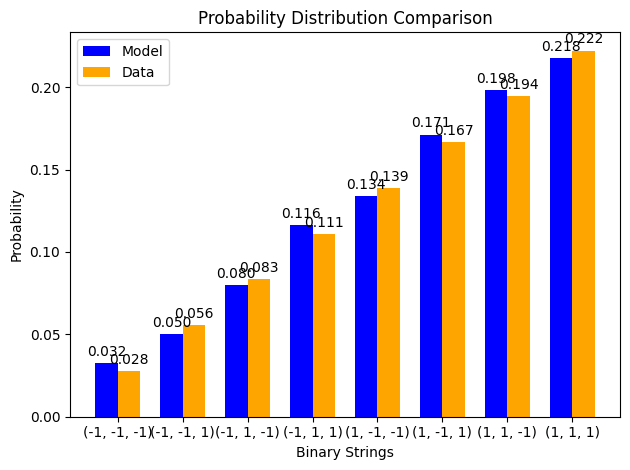

z gradient step for node 0: 2.2942085535929137e-06
z gradient step for node 1: -2.21343269959573e-06
z gradient step for node 2: -1.725712496228049e-07
z gradient step for node 3: -1.014512693757852e-06
edge graident step for edge (0, 3): 6.209406831371833e-06
edge graident step for edge (1, 3): 1.0320542408973343e-06
edge graident step for edge (2, 3): -8.616714242349056e-07
edge graident step for edge (0, 1): 2.5774466146605836e-06
edge graident step for edge (0, 2): -2.5118299330867953e-06
edge graident step for edge (1, 2): -1.9953900731733975e-07
x positive phase: 0.0
x negative phase: 1.0669643459963784e-05
x gradient step for node 0: -1.0669643459963784e-08
x positive phase: 0.0
x negative phase: 2.6362646459782945e-05
x gradient step for node 1: -2.6362646459782946e-08
x positive phase: 0.0
x negative phase: 1.201025604003103e-05
x gradient step for node 2: -1.201025604003103e-08
x positive phase: -0.14889145764418724
x negative phase: -0.14895893316413894
x gradient step for n

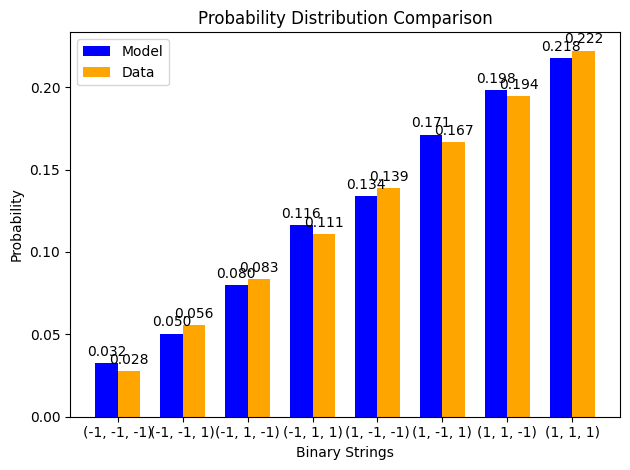

z gradient step for node 0: 2.35708079920266e-06
z gradient step for node 1: -2.08519675427693e-06
z gradient step for node 2: -1.5832365407925097e-07
z gradient step for node 3: -9.7246707175358e-07
edge graident step for edge (0, 3): 6.097949457392393e-06
edge graident step for edge (1, 3): 9.520191994353e-07
edge graident step for edge (2, 3): -8.356804841323229e-07
edge graident step for edge (0, 1): 2.363143537874757e-06
edge graident step for edge (0, 2): -2.4461049264951493e-06
edge graident step for edge (1, 2): -1.9400200138111612e-07
x positive phase: 0.0
x negative phase: 9.684205730025217e-06
x gradient step for node 0: -9.684205730025217e-09
x positive phase: 0.0
x negative phase: 2.3962739688832035e-05
x gradient step for node 1: -2.3962739688832035e-08
x positive phase: 0.0
x negative phase: 1.0910665222931423e-05
x gradient step for node 2: -1.0910665222931424e-08
x positive phase: -0.14889445758749564
x negative phase: -0.1489566259700953
x gradient step for node 3: 6.

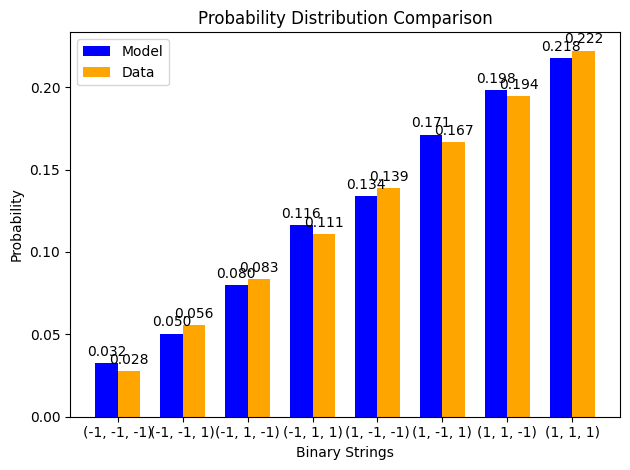

z gradient step for node 0: 2.4156367319758677e-06
z gradient step for node 1: -1.9640607008200585e-06
z gradient step for node 2: -1.44704773686527e-07
z gradient step for node 3: -9.326058972068952e-07
edge graident step for edge (0, 3): 5.992466273732566e-06
edge graident step for edge (1, 3): 8.765618308823747e-07
edge graident step for edge (2, 3): -8.111124536317737e-07
edge graident step for edge (0, 1): 2.1606991030883457e-06
edge graident step for edge (0, 2): -2.3840167383041982e-06
edge graident step for edge (1, 2): -1.8913975738821254e-07
x positive phase: 0.0
x negative phase: 8.789692320604249e-06
x gradient step for node 0: -8.78969232060425e-09
x positive phase: 0.0
x negative phase: 2.178121184793521e-05
x gradient step for node 1: -2.1781211847935212e-08
x positive phase: 0.0
x negative phase: 9.911740372679435e-06
x gradient step for node 2: -9.911740372679435e-09
x positive phase: -0.148897699131921
x negative phase: -0.1489548631580057
x gradient step for node 3: 

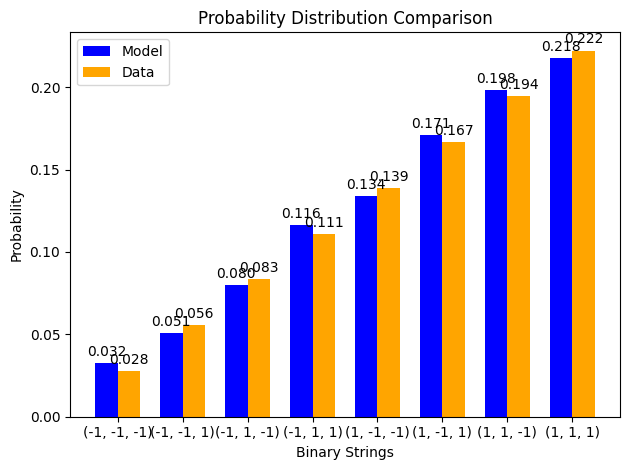

z gradient step for node 0: 2.470151879996829e-06
z gradient step for node 1: -1.8496414062461885e-06
z gradient step for node 2: -1.316904205656e-07
z gradient step for node 3: -8.948101621883975e-07
edge graident step for edge (0, 3): 5.892613536089442e-06
edge graident step for edge (1, 3): 8.054389583865978e-07
edge graident step for edge (2, 3): -7.878798058168768e-07
edge graident step for edge (0, 1): 1.9694947048764095e-06
edge graident step for edge (0, 2): -2.3253651596873843e-06
edge graident step for edge (1, 2): -1.8489729794324282e-07
x positive phase: 0.0
x negative phase: 7.977727003333722e-06
x gradient step for node 0: -7.977727003333723e-09
x positive phase: 0.0
x negative phase: 1.9798205561971056e-05
x gradient step for node 1: -1.9798205561971055e-08
x positive phase: 0.0
x negative phase: 9.004266602403464e-06
x gradient step for node 2: -9.004266602403464e-09
x positive phase: -0.14890116853680324
x negative phase: -0.1489536152425132
x gradient step for node 3:

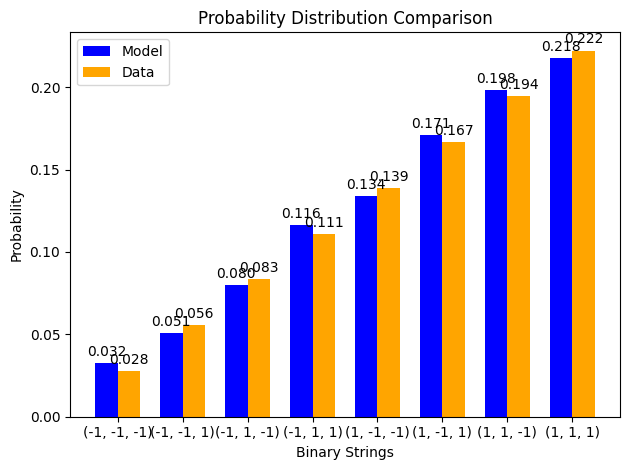

z gradient step for node 0: 2.5208843650438295e-06
z gradient step for node 1: -1.7415752039433575e-06
z gradient step for node 2: -1.1925696502165794e-07
z gradient step for node 3: -8.589669707848025e-07
edge graident step for edge (0, 3): 5.798066868453467e-06
edge graident step for edge (1, 3): 7.384194338668215e-07
edge graident step for edge (2, 3): -7.659001995247161e-07
edge graident step for edge (0, 1): 1.7889408261587691e-06
edge graident step for edge (0, 2): -2.269959917958864e-06
edge graident step for edge (1, 2): -1.8122348976032378e-07
x positive phase: 0.0
x negative phase: 7.240703249915594e-06
x gradient step for node 0: -7.2407032499155935e-09
x positive phase: 0.0
x negative phase: 1.7995667071184646e-05
x gradient step for node 1: -1.7995667071184646e-08
x positive phase: 0.0
x negative phase: 8.179872414885709e-06
x gradient step for node 2: -8.17987241488571e-09
x positive phase: -0.14890485271460183
x negative phase: -0.1489528541245086
x gradient step for nod

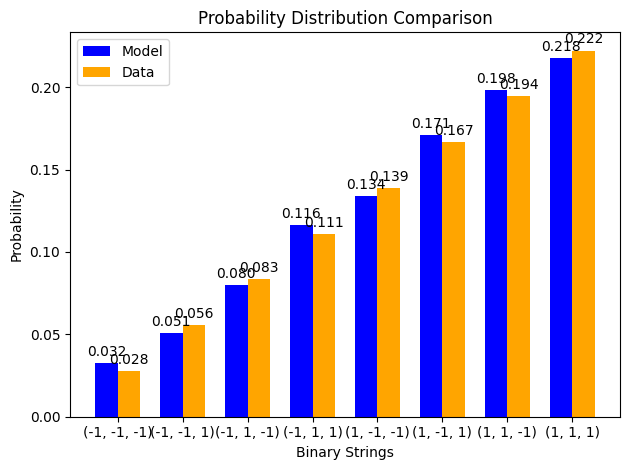

z gradient step for node 0: 2.5680759282877277e-06
z gradient step for node 1: -1.6395170439233443e-06
z gradient step for node 2: -1.073813663876877e-07
z gradient step for node 3: -8.249692796155061e-07
edge graident step for edge (0, 3): 5.70852026677221e-06
edge graident step for edge (1, 3): 6.752836321106403e-07
edge graident step for edge (2, 3): -7.450962055689514e-07
edge graident step for edge (0, 1): 1.6184760115222769e-06
edge graident step for edge (0, 2): -2.2176203108138783e-06
edge graident step for edge (1, 2): -1.7807084209967017e-07
x positive phase: 0.0
x negative phase: 6.571713791931926e-06
x gradient step for node 0: -6.571713791931926e-09
x positive phase: 0.0
x negative phase: 1.635718270640917e-05
x gradient step for node 1: -1.6357182706409173e-08
x positive phase: 0.0
x negative phase: 7.430952530505574e-06
x gradient step for node 2: -7.430952530505574e-09
x positive phase: -0.14890873920672437
x negative phase: -0.148952553042809
x gradient step for node 3

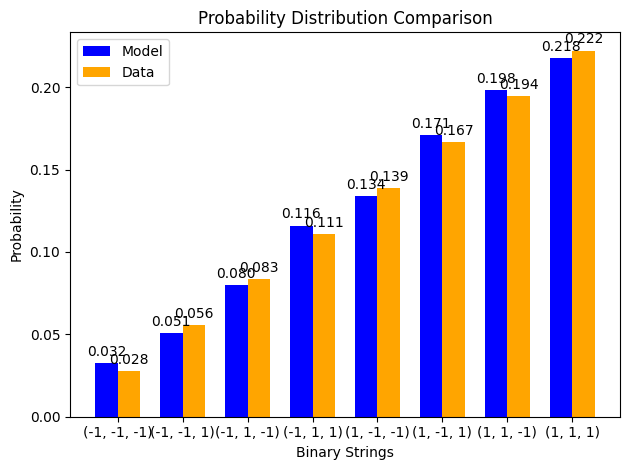

z gradient step for node 0: 2.6119529095551262e-06
z gradient step for node 1: -1.543139663276627e-06
z gradient step for node 2: -9.604119724253291e-08
z gradient step for node 3: -7.927156420932668e-07
edge graident step for edge (0, 3): 5.623685138752943e-06
edge graident step for edge (1, 3): 6.158229560265932e-07
edge graident step for edge (2, 3): -7.253950427560663e-07
edge graident step for edge (0, 1): 1.4575658370596378e-06
edge graident step for edge (0, 2): -2.1681748381276456e-06
edge graident step for edge (1, 2): -1.7539530637503132e-07
x positive phase: 0.0
x negative phase: 5.9644865841246255e-06
x gradient step for node 0: -5.964486584124626e-09
x positive phase: 0.0
x negative phase: 1.4867830147444745e-05
x gradient step for node 1: -1.4867830147444746e-08
x positive phase: 0.0
x negative phase: 6.750597773944227e-06
x gradient step for node 2: -6.750597773944227e-09
x positive phase: -0.14891281615944174
x negative phase: -0.1489526865254
x gradient step for node 3

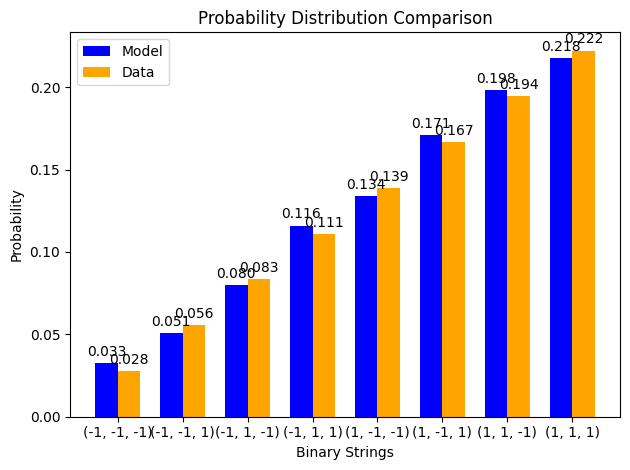

z gradient step for node 0: 2.6527271799781092e-06
z gradient step for node 1: -1.4521327787000716e-06
z gradient step for node 2: -8.521466171435011e-08
z gradient step for node 3: -7.621099575030321e-07
edge graident step for edge (0, 3): 5.543289380844696e-06
edge graident step for edge (1, 3): 5.598393541637603e-07
edge graident step for edge (2, 3): -7.067283240576039e-07
edge graident step for edge (0, 1): 1.3057018827084822e-06
edge graident step for edge (0, 2): -2.1214608339067132e-06
edge graident step for edge (1, 2): -1.7315607866472127e-07
x positive phase: 0.0
x negative phase: 5.413326595455535e-06
x gradient step for node 0: -5.413326595455535e-09
x positive phase: 0.0
x negative phase: 1.3514043134382435e-05
x gradient step for node 1: -1.3514043134382435e-08
x positive phase: 0.0
x negative phase: 6.132531374372399e-06
x gradient step for node 2: -6.132531374372399e-09
x positive phase: -0.14891707230001217
x negative phase: -0.1489532303405954
x gradient step for nod

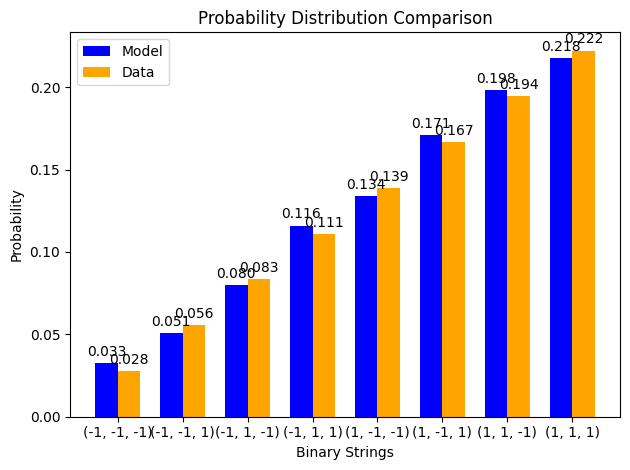

z gradient step for node 0: 2.6905970282821157e-06
z gradient step for node 1: -1.3662023025587112e-06
z gradient step for node 2: -7.488060851568168e-08
z gradient step for node 3: -7.330612257705483e-07
edge graident step for edge (0, 3): 5.467076492969736e-06
edge graident step for edge (1, 3): 5.071448513887383e-07
edge graident step for edge (2, 3): -6.890318131710094e-07
edge graident step for edge (0, 1): 1.16240071221152e-06
edge graident step for edge (0, 2): -2.077324100604877e-06
edge graident step for edge (1, 2): -1.7131540652348676e-07
x positive phase: 0.0
x negative phase: 4.913062903048954e-06
x gradient step for node 0: -4.913062903048954e-09
x positive phase: 0.0
x negative phase: 1.2283488420445941e-05
x gradient step for node 1: -1.2283488420445941e-08
x positive phase: 0.0
x negative phase: 5.5710510927800055e-06
x gradient step for node 2: -5.571051092780006e-09
x positive phase: -0.14892149691311699
x negative phase: -0.1489541614484098
x gradient step for node 

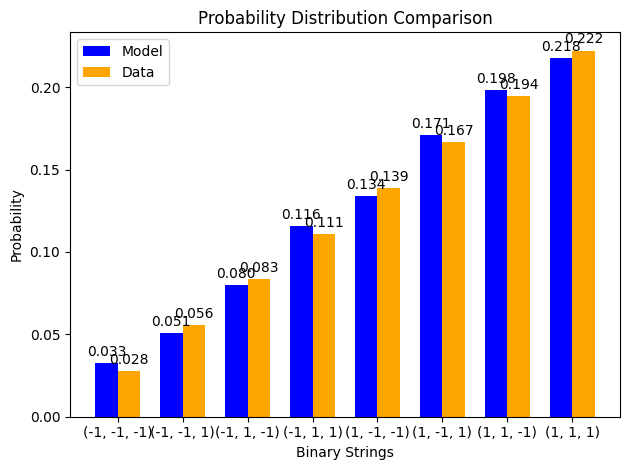

z gradient step for node 0: 2.7257480013375134e-06
z gradient step for node 1: -1.2850695835581183e-06
z gradient step for node 2: -6.501853931364932e-08
z gradient step for node 3: -7.054833086070911e-07
edge graident step for edge (0, 3): 5.394804731210901e-06
edge graident step for edge (1, 3): 4.5756109338979114e-07
edge graident step for edge (2, 3): -6.722451915616712e-07
edge graident step for edge (0, 1): 1.0272028651023002e-06
edge graident step for edge (0, 2): -2.035618547670828e-06
edge graident step for edge (1, 2): -1.698384011795673e-07
x positive phase: 0.0
x negative phase: 4.459000610574002e-06
x gradient step for node 0: -4.4590006105740026e-09
x positive phase: 0.0
x negative phase: 1.1164953863234022e-05
x gradient step for node 1: -1.1164953863234022e-08
x positive phase: 0.0
x negative phase: 5.06097664366693e-06
x gradient step for node 2: -5.06097664366693e-09
x positive phase: -0.1489260798176932
x negative phase: -0.14895545795239876
x gradient step for node 

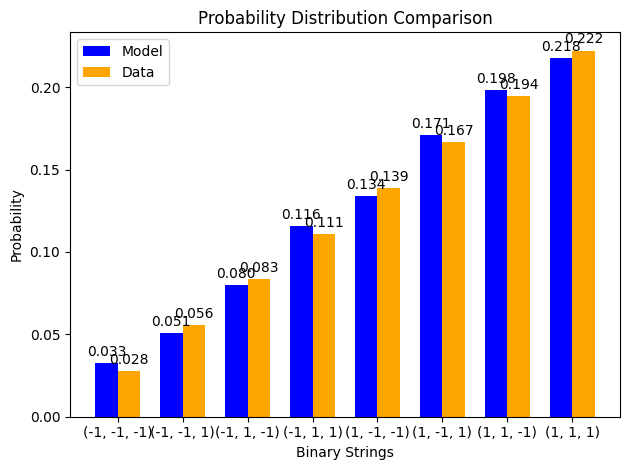

z gradient step for node 0: 2.7583536999063464e-06
z gradient step for node 1: -1.2084706728115735e-06
z gradient step for node 2: -5.560861300540898e-08
z gradient step for node 3: -6.79294697581323e-07
edge graident step for edge (0, 3): 5.326246298301862e-06
edge graident step for edge (1, 3): 4.10918905513355e-07
edge graident step for edge (2, 3): -6.563118359766418e-07
edge graident step for edge (0, 1): 8.996718644146973e-07
edge graident step for edge (0, 2): -1.9962058359084404e-06
edge graident step for edge (1, 2): -1.686928559900547e-07
x positive phase: 0.0
x negative phase: 4.046877155091682e-06
x gradient step for node 0: -4.0468771550916825e-09
x positive phase: 0.0
x negative phase: 1.0148246649987545e-05
x gradient step for node 1: -1.0148246649987545e-08
x positive phase: 0.0
x negative phase: 4.597601926988406e-06
x gradient step for node 2: -4.597601926988407e-09
x positive phase: -0.14893081134423544
x negative phase: -0.1489570990521798
x gradient step for node 3

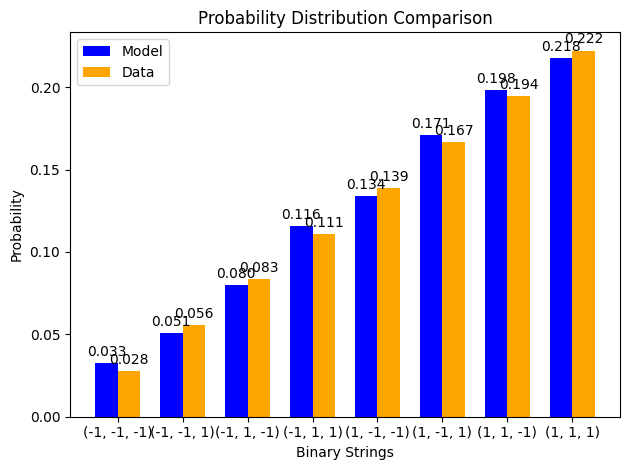

z gradient step for node 0: 2.7885765307423817e-06
z gradient step for node 1: -1.1361556157798713e-06
z gradient step for node 2: -4.663164640188178e-08
z gradient step for node 3: -6.544182895329432e-07
edge graident step for edge (0, 3): 5.2611865715163075e-06
edge graident step for edge (1, 3): 3.670578662489377e-07
edge graident step for edge (2, 3): -6.411786063505732e-07
edge graident step for edge (0, 1): 7.793932432422907e-07
edge graident step for edge (0, 2): -1.9589550289439845e-06
edge graident step for edge (1, 2): -1.6784907179293041e-07
x positive phase: 0.0
x negative phase: 3.6728226051949336e-06
x gradient step for node 0: -3.6728226051949334e-09
x positive phase: 0.0
x negative phase: 9.22410074250475e-06
x gradient step for node 1: -9.22410074250475e-09
x positive phase: 0.0
x negative phase: 4.176651630481091e-06
x gradient step for node 2: -4.176651630481092e-09
x positive phase: -0.1489356823126235
x negative phase: -0.14895906499680825
x gradient step for node 

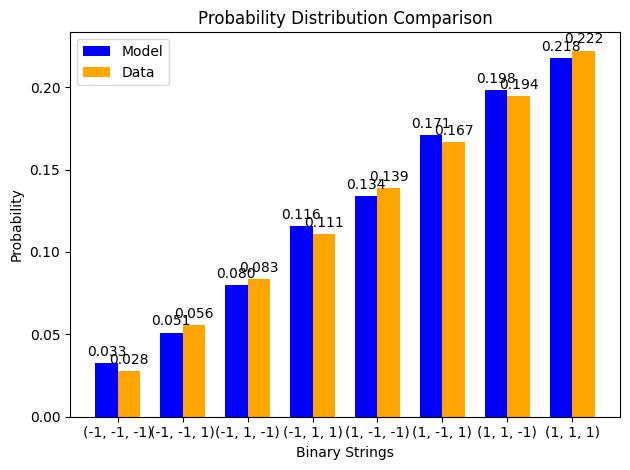

z gradient step for node 0: 2.816568416384169e-06
z gradient step for node 1: -1.0678877703494683e-06
z gradient step for node 2: -3.806911179110584e-08
z gradient step for node 3: -6.307811696173449e-07
edge graident step for edge (0, 3): 5.1994233673349764e-06
edge graident step for edge (1, 3): 3.258258955796678e-07
edge graident step for edge (2, 3): -6.26795643939193e-07
edge graident step for edge (0, 1): 6.659735927126847e-07
edge graident step for edge (0, 2): -1.9237422528586986e-06
edge graident step for edge (1, 2): -1.6727968960014718e-07
x positive phase: 0.0
x negative phase: 3.3333235887096e-06
x gradient step for node 0: -3.3333235887096e-09
x positive phase: 0.0
x negative phase: 8.384092709346855e-06
x gradient step for node 1: -8.384092709346855e-09
x positive phase: 0.0
x negative phase: 3.794241802691693e-06
x gradient step for node 2: -3.794241802691693e-09
x positive phase: -0.14894068401052396
x negative phase: -0.14896133703915476
x gradient step for node 3: 2.

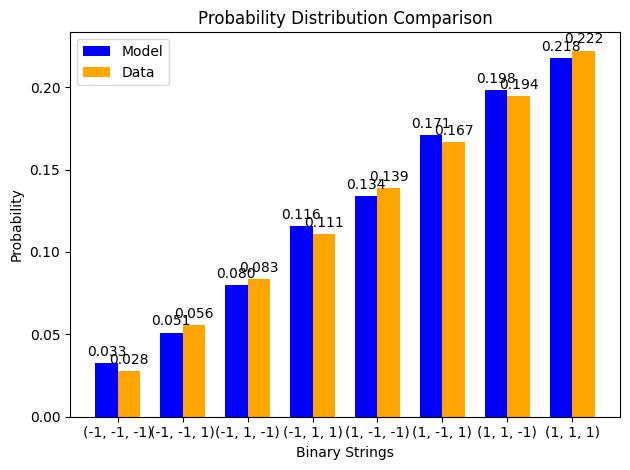

z gradient step for node 0: 2.8424714641414606e-06
z gradient step for node 1: -1.0034431511038167e-06
z gradient step for node 2: -2.990313180831206e-08
z gradient step for node 3: -6.083144021875598e-07
edge graident step for edge (0, 3): 5.140766242069994e-06
edge graident step for edge (1, 3): 2.870788582743228e-07
edge graident step for edge (2, 3): -6.131161794664386e-07
edge graident step for edge (0, 1): 5.590396334757691e-07
edge graident step for edge (0, 2): -1.8904503648448784e-06
edge graident step for edge (1, 2): -1.6695953095738347e-07
x positive phase: 0.0
x negative phase: 3.0251905205778185e-06
x gradient step for node 0: -3.0251905205778186e-09
x positive phase: 0.0
x negative phase: 7.620565187707968e-06
x gradient step for node 1: -7.620565187707968e-09
x positive phase: 0.0
x negative phase: 3.4468440335565046e-06
x gradient step for node 2: -3.446844033556505e-09
x positive phase: -0.14894580817240058
x negative phase: -0.1489638973914006
x gradient step for nod

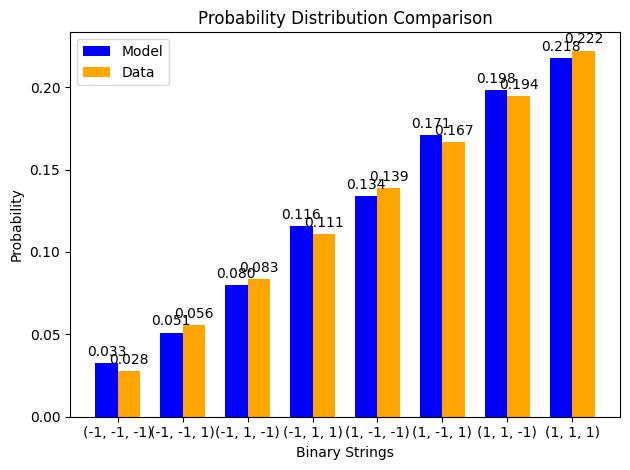

z gradient step for node 0: 2.8664185958443e-06
z gradient step for node 1: -9.426097996764194e-07
z gradient step for node 2: -2.211647199519551e-08
z gradient step for node 3: -5.86952829630949e-07
edge graident step for edge (0, 3): 5.085035827504858e-06
edge graident step for edge (1, 3): 2.5068018211037156e-07
edge graident step for edge (2, 3): -6.000963510371382e-07
edge graident step for edge (0, 1): 4.5823731237340515e-07
edge graident step for edge (0, 2): -1.8589686315453047e-06
edge graident step for edge (1, 2): -1.668654461268737e-07
x positive phase: 0.0
x negative phase: 2.7455278310701293e-06
x gradient step for node 0: -2.7455278310701295e-09
x positive phase: 0.0
x negative phase: 6.926557285406711e-06
x gradient step for node 1: -6.926557285406711e-09
x positive phase: 0.0
x negative phase: 3.1312529125721414e-06
x gradient step for node 2: -3.1312529125721415e-09
x positive phase: -0.14895104695916173
x negative phase: -0.14896672918174161
x gradient step for node 

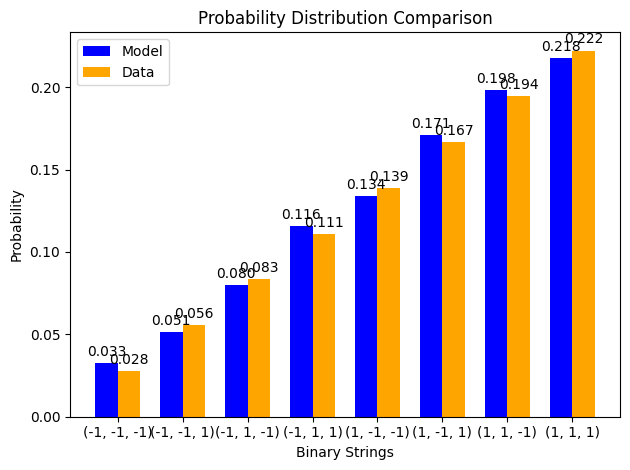

z gradient step for node 0: 2.888534140014554e-06
z gradient step for node 1: -8.851871809275603e-07
z gradient step for node 2: -1.469253139949056e-08
z gradient step for node 3: -5.666348791951714e-07
edge graident step for edge (0, 3): 5.032063200492487e-06
edge graident step for edge (1, 3): 2.165004909289725e-07
edge graident step for edge (2, 3): -5.876950315130414e-07
edge graident step for edge (0, 1): 3.632309255888755e-07
edge graident step for edge (0, 2): -1.8291924175848768e-06
edge graident step for edge (1, 2): -1.6697617016775411e-07
x positive phase: 0.0
x negative phase: 2.4917069214061923e-06
x gradient step for node 0: -2.4917069214061924e-09
x positive phase: 0.0
x negative phase: 6.29574129547356e-06
x gradient step for node 1: -6.29574129547356e-09
x positive phase: 0.0
x negative phase: 2.844556464758858e-06
x gradient step for node 2: -2.844556464758858e-09
x positive phase: -0.14895639293846485
x negative phase: -0.14896981641237508
x gradient step for node 3:

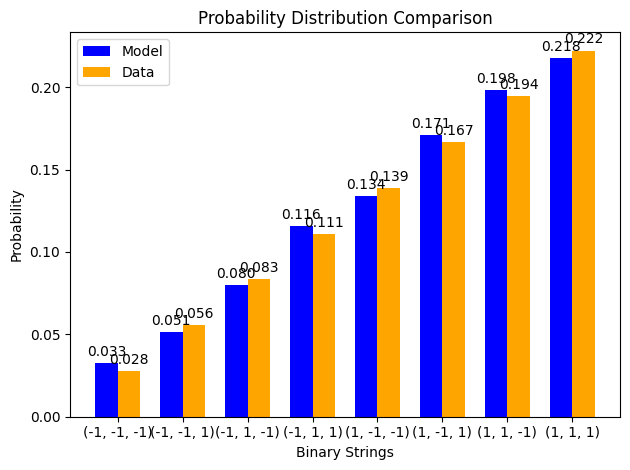

z gradient step for node 0: 2.9089343881560925e-06
z gradient step for node 1: -8.309856045758956e-07
z gradient step for node 2: -7.615331519425505e-09
z gradient step for node 3: -5.473023777965436e-07
edge graident step for edge (0, 3): 4.9816892853624675e-06
edge graident step for edge (1, 3): 1.8441725235990302e-07
edge graident step for edge (2, 3): -5.758736650516295e-07
edge graident step for edge (0, 1): 2.737022692374941e-07
edge graident step for edge (0, 2): -1.8010228846473964e-06
edge graident step for edge (1, 2): -1.6727218688897262e-07
x positive phase: 0.0
x negative phase: 2.2613415984251197e-06
x gradient step for node 0: -2.2613415984251197e-09
x positive phase: 0.0
x negative phase: 5.722365152290712e-06
x gradient step for node 1: -5.7223651522907126e-09
x positive phase: 0.0
x negative phase: 2.5841092920244206e-06
x gradient step for node 2: -2.5841092920244208e-09
x positive phase: -0.1489618390656903
x negative phase: -0.1489731439188178
x gradient step for n

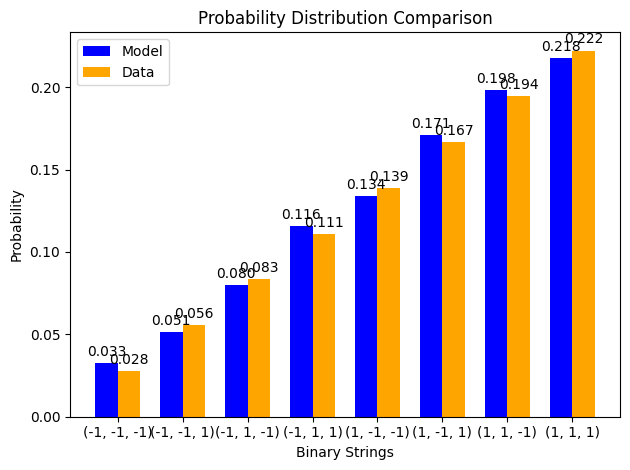

z gradient step for node 0: 2.927728116857431e-06
z gradient step for node 1: -7.798256718032082e-07
z gradient step for node 2: -8.695038812289724e-10
z gradient step for node 3: -5.289003747355193e-07
edge graident step for edge (0, 3): 4.933764287950393e-06
edge graident step for edge (1, 3): 1.543144399820673e-07
edge graident step for edge (2, 3): -5.645961124624288e-07
edge graident step for edge (0, 1): 1.8934981808090002e-07
edge graident step for edge (0, 2): -1.7743667013519065e-06
edge graident step for edge (1, 2): -1.677356005678754e-07
x positive phase: 0.0
x negative phase: 2.0522657623372757e-06
x gradient step for node 0: -2.052265762337276e-09
x positive phase: 0.0
x negative phase: 5.2012001096784985e-06
x gradient step for node 1: -5.2012001096784985e-09
x positive phase: 0.0
x negative phase: 2.3475081724400637e-06
x gradient step for node 2: -2.347508172440064e-09
x positive phase: -0.1489673786655922
x negative phase: -0.1489766973305953
x gradient step for node 

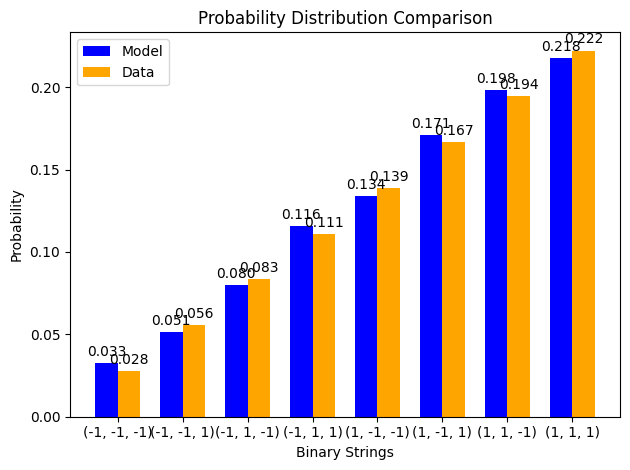

z gradient step for node 0: 2.945017077431833e-06
z gradient step for node 1: -7.315377462967787e-07
z gradient step for node 2: 5.5597235103510555e-09
z gradient step for node 3: -5.1137697221193e-07
edge graident step for edge (0, 3): 4.8881471600008e-06
edge graident step for edge (1, 3): 1.2608220966303653e-07
edge graident step for edge (2, 3): -5.538285050440961e-07
edge graident step for edge (0, 1): 1.0988793278086939e-07
edge graident step for edge (0, 2): -1.7491357640552764e-06
edge graident step for edge (1, 2): -1.6835001529325045e-07
x positive phase: 0.0
x negative phase: 1.8625131419953805e-06
x gradient step for node 0: -1.8625131419953804e-09
x positive phase: 0.0
x negative phase: 4.727493168157746e-06
x gradient step for node 1: -4.727493168157746e-09
x positive phase: 0.0
x negative phase: 2.1325698925684694e-06
x gradient step for node 2: -2.1325698925684694e-09
x positive phase: -0.14897300541462888
x negative phase: -0.14898046303332255
x gradient step for node 

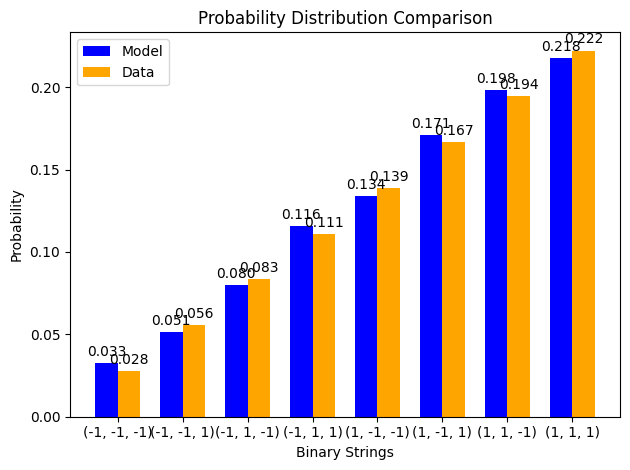

z gradient step for node 0: 2.960896454766826e-06
z gradient step for node 1: -6.859614490976329e-07
z gradient step for node 2: 1.1686540623487285e-08
z gradient step for node 3: -4.94683163494436e-07
edge graident step for edge (0, 3): 4.84470509269358e-06
edge graident step for edge (1, 3): 9.961658974803889e-08
edge graident step for edge (2, 3): -5.43539106549279e-07
edge graident step for edge (0, 1): 3.5046095910235e-08
edge graident step for edge (0, 2): -1.7252469286274386e-06
edge graident step for edge (1, 2): -1.6910042170686923e-07
x positive phase: 0.0
x negative phase: 1.6902988907148824e-06
x gradient step for node 0: -1.6902988907148824e-09
x positive phase: 0.0
x negative phase: 4.296923821259375e-06
x gradient step for node 1: -4.296923821259376e-09
x positive phase: 0.0
x negative phase: 1.9373111085449824e-06
x gradient step for node 2: -1.9373111085449823e-09
x positive phase: -0.14897871332397045
x negative phase: -0.14898442813218726
x gradient step for node 3: 

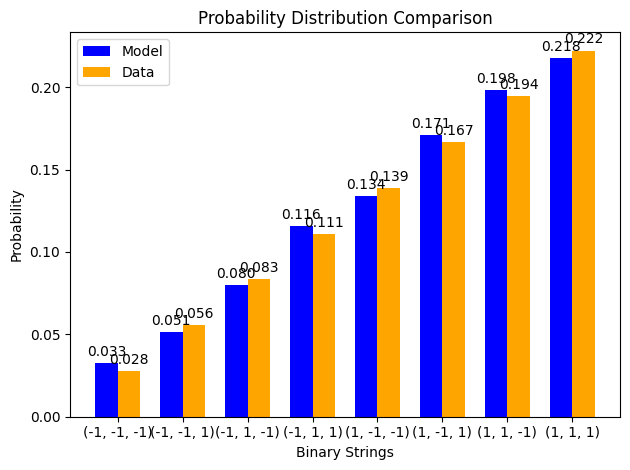

z gradient step for node 0: 2.9754552970486236e-06
z gradient step for node 1: -6.429451766067907e-07
z gradient step for node 2: 1.7524570560423224e-08
z gradient step for node 3: -4.78772678568773e-07
edge graident step for edge (0, 3): 4.8033130380215615e-06
edge graident step for edge (1, 3): 7.481918477073024e-08
edge graident step for edge (2, 3): -5.336981829227038e-07
edge graident step for edge (0, 1): -3.5431823275533514e-08
edge graident step for edge (0, 2): -1.7026217531726368e-06
edge graident step for edge (1, 2): -1.6997309092289803e-07
x positive phase: 0.0
x negative phase: 1.5340028726085793e-06
x gradient step for node 0: -1.5340028726085792e-09
x positive phase: 0.0
x negative phase: 3.9055647295714345e-06
x gradient step for node 1: -3.9055647295714345e-09
x positive phase: 0.0
x negative phase: 1.7599300502956605e-06
x gradient step for node 2: -1.7599300502956606e-09
x positive phase: -0.14898449672317854
x negative phase: -0.1489885804168366
x gradient step for

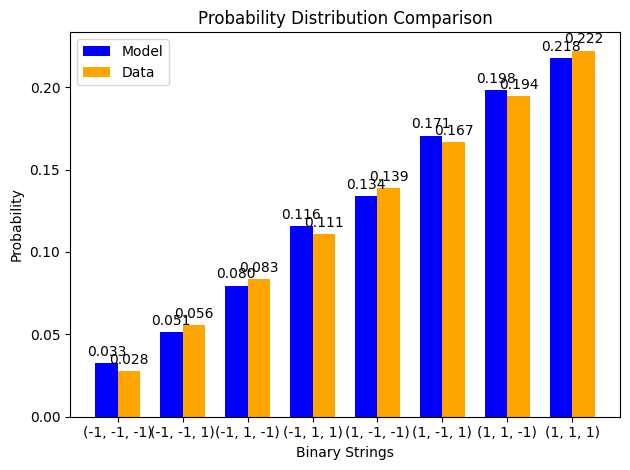

z gradient step for node 0: 2.9887769179763326e-06
z gradient step for node 1: -6.02345641031371e-07
z gradient step for node 2: 2.3086885254097744e-08
z gradient step for node 3: -4.636018370733908e-07
edge graident step for edge (0, 3): 4.763853256758044e-06
edge graident step for edge (1, 3): 5.159689230674336e-08
edge graident step for edge (2, 3): -5.242778794599668e-07
edge graident step for edge (0, 1): -1.0178827543516622e-07
edge graident step for edge (0, 2): -1.6811862515993676e-06
edge graident step for edge (1, 2): -1.7095547534454191e-07
x positive phase: 0.0
x negative phase: 1.3921544848223977e-06
x gradient step for node 0: -1.3921544848223977e-09
x positive phase: 0.0
x negative phase: 3.549845966549397e-06
x gradient step for node 1: -3.549845966549397e-09
x positive phase: 0.0
x negative phase: 1.5987899002510466e-06
x gradient step for node 2: -1.5987899002510466e-09
x positive phase: -0.14899035024454876
x negative phase: -0.1489929083276593
x gradient step for no

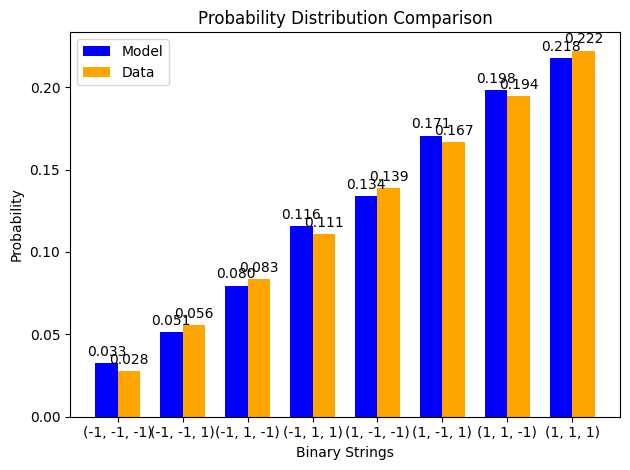

z gradient step for node 0: 3.0009392730313555e-06
z gradient step for node 1: -5.640274325550421e-07
z gradient step for node 2: 2.8386021551210506e-08
z gradient step for node 3: -4.4912940830277306e-07
edge graident step for edge (0, 3): 4.726214891771163e-06
edge graident step for edge (1, 3): 2.986163259259544e-08
edge graident step for edge (2, 3): -5.152521050345304e-07
edge graident step for edge (0, 1): -1.6425270940363667e-07
edge graident step for edge (0, 2): -1.6608706578901262e-06
edge graident step for edge (1, 2): -1.7203611609400982e-07
x positive phase: 0.0
x negative phase: 1.2634188751001121e-06
x gradient step for node 0: -1.263418875100112e-09
x positive phase: 0.0
x negative phase: 3.2265225122774824e-06
x gradient step for node 1: -3.2265225122774825e-09
x positive phase: 0.0
x negative phase: 1.4524036933383164e-06
x gradient step for node 2: -1.4524036933383165e-09
x positive phase: -0.148996268808106
x negative phase: -0.14899740092344754
x gradient step for 

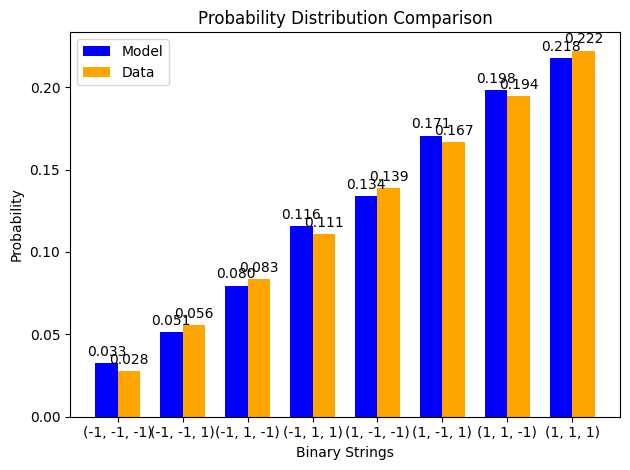

z gradient step for node 0: 3.0120153113187278e-06
z gradient step for node 1: -5.278626024816935e-07
z gradient step for node 2: 3.343399755180443e-08
z gradient step for node 3: -4.3531647805972185e-07
edge graident step for edge (0, 3): 4.690293565445702e-06
edge graident step for edge (1, 3): 9.53009050837228e-09
edge graident step for edge (2, 3): -5.065964230556719e-07
edge graident step for edge (0, 1): -2.2304222251053053e-07
edge graident step for edge (0, 2): -1.6416092008790101e-06
edge graident step for edge (1, 2): -1.7320455675240433e-07
x positive phase: 0.0
x negative phase: 1.1465844268855785e-06
x gradient step for node 0: -1.1465844268855784e-09
x positive phase: 0.0
x negative phase: 2.93264470063944e-06
x gradient step for node 1: -2.93264470063944e-09
x positive phase: 0.0
x negative phase: 1.3194205990485234e-06
x gradient step for node 2: -1.3194205990485235e-09
x positive phase: -0.14900224760723843
x negative phase: -0.14900204785041743
x gradient step for nod

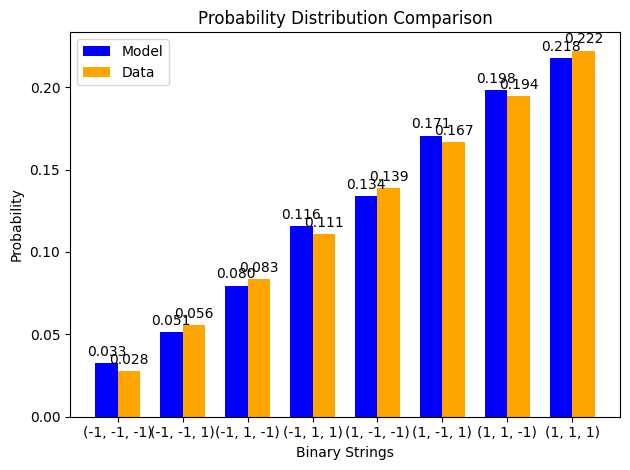

z gradient step for node 0: 3.022073304433548e-06
z gradient step for node 1: -4.937302665831144e-07
z gradient step for node 2: 3.824232908530845e-08
z gradient step for node 3: -4.221263221134697e-07
edge graident step for edge (0, 3): 4.65599100002817e-06
edge graident step for edge (1, 3): -9.476530490160063e-09
edge graident step for edge (2, 3): -4.982879488106551e-07
edge graident step for edge (0, 1): -2.7836218344785834e-07
edge graident step for edge (0, 2): -1.6233398893062968e-06
edge graident step for edge (1, 2): -1.7445126310550174e-07
x positive phase: 0.0
x negative phase: 1.0405513958026038e-06
x gradient step for node 0: -1.0405513958026038e-09
x positive phase: 0.0
x negative phase: 2.6655313519945857e-06
x gradient step for node 1: -2.6655313519945856e-09
x positive phase: 0.0
x negative phase: 1.1986134591087102e-06
x gradient step for node 2: -1.1986134591087102e-09
x positive phase: -0.14900828209495573
x negative phase: -0.14900683931256198
x gradient step for 

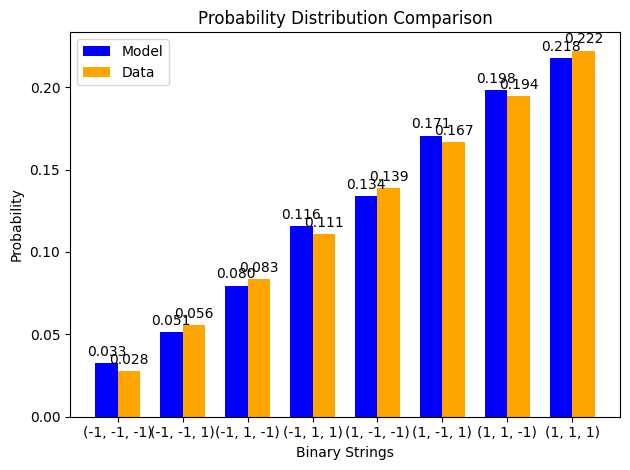

z gradient step for node 0: 3.0311771537434585e-06
z gradient step for node 1: -4.6151622790657766e-07
z gradient step for node 2: 4.282204623237696e-08
z gradient step for node 3: -4.095242860309156e-07
edge graident step for edge (0, 3): 4.623214659713493e-06
edge graident step for edge (1, 3): -2.7232742898175566e-08
edge graident step for edge (2, 3): -4.903052528781315e-07
edge graident step for edge (0, 1): -3.3040682827439885e-07
edge graident step for edge (0, 2): -1.6060043068901741e-06
edge graident step for edge (1, 2): -1.7576754858017463e-07
x positive phase: 0.0
x negative phase: 9.443215919362602e-07
x gradient step for node 0: -9.443215919362602e-10
x positive phase: 0.0
x negative phase: 2.422745347693762e-06
x gradient step for node 1: -2.422745347693762e-09
x positive phase: 0.0
x negative phase: 1.0888674658575932e-06
x gradient step for node 2: -1.0888674658575933e-09
x positive phase: -0.1490143679707552
x negative phase: -0.14901176604330724
x gradient step for n

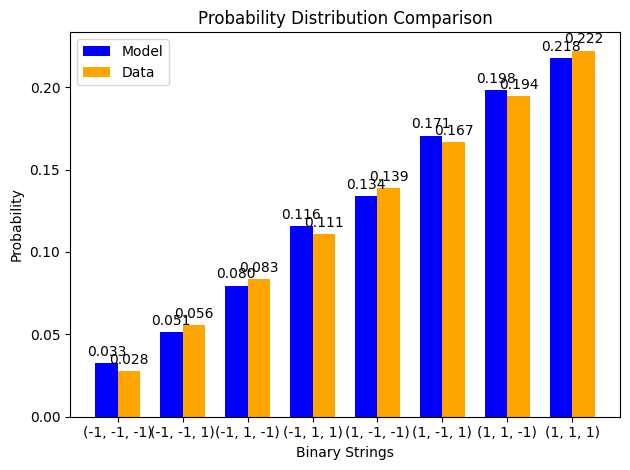

z gradient step for node 0: 3.0393866774274246e-06
z gradient step for node 1: -4.3111261826014883e-07
z gradient step for node 2: 4.7183709798503946e-08
z gradient step for node 3: -3.9747767112230383e-07
edge graident step for edge (0, 3): 4.59187741335465e-06
edge graident step for edge (1, 3): -4.380899856561149e-08
edge graident step for edge (2, 3): -4.826282702769802e-07
edge graident step for edge (0, 1): -3.793598301835149e-07
edge graident step for edge (0, 2): -1.589547417135781e-06
edge graident step for edge (1, 2): -1.7714550505965044e-07
x positive phase: 0.0
x negative phase: 8.569890119680429e-07
x gradient step for node 0: -8.569890119680429e-10
x positive phase: 0.0
x negative phase: 2.2020714248249967e-06
x gradient step for node 1: -2.2020714248249968e-09
x positive phase: 0.0
x negative phase: 9.891698769348224e-07
x gradient step for node 2: -9.891698769348224e-10
x positive phase: -0.14902050116807908
x negative phase: -0.1490168192784363
x gradient step for nod

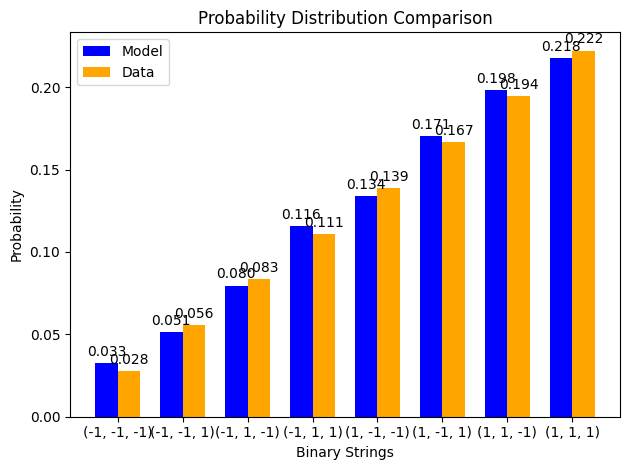

z gradient step for node 0: 3.046757878519213e-06
z gradient step for node 1: -4.0241755763870123e-07
z gradient step for node 2: 5.1337427677961014e-08
z gradient step for node 3: -3.859556262684194e-07
edge graident step for edge (0, 3): 4.561897216696032e-06
edge graident step for edge (1, 3): -5.9271901392446426e-08
edge graident step for edge (2, 3): -4.7523821506567644e-07
edge graident step for edge (0, 1): -4.253948437484001e-07
edge graident step for edge (0, 2): -1.573917377578421e-06
edge graident step for edge (1, 2): -1.7857793876879803e-07
x positive phase: 0.0
x negative phase: 7.777313339755715e-07
x gradient step for node 0: -7.777313339755716e-10
x positive phase: 0.0
x negative phase: 2.001495989645097e-06
x gradient step for node 1: -2.001495989645097e-09
x positive phase: 0.0
x negative phase: 8.986006714439655e-07
x gradient step for node 2: -8.986006714439655e-10
x positive phase: -0.14902667784234375
x negative phase: -0.14902199073024736
x gradient step for nod

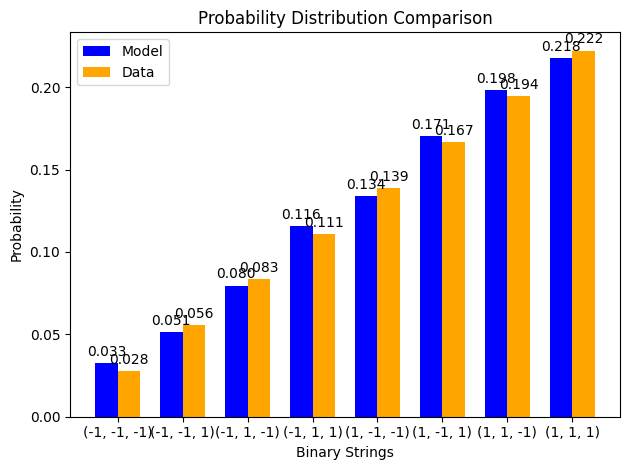

z gradient step for node 0: 3.0533431951772494e-06
z gradient step for node 1: -3.753348308246085e-07
z gradient step for node 2: 5.5292871029816175e-08
z gradient step for node 3: -3.749290453780585e-07
edge graident step for edge (0, 3): 4.533196813084339e-06
edge graident step for edge (1, 3): -7.368440973798407e-08
edge graident step for edge (2, 3): -4.681175000758597e-07
edge graident step for edge (0, 1): -4.6867602435769763e-07
edge graident step for edge (0, 2): -1.5590653631541857e-06
edge graident step for edge (1, 2): -1.800583109348719e-07
x positive phase: 0.0
x negative phase: 7.058021956730207e-07
x gradient step for node 0: -7.058021956730208e-10
x positive phase: 0.0
x negative phase: 1.8191887664096239e-06
x gradient step for node 1: -1.819188766409624e-09
x positive phase: 0.0
x negative phase: 8.163240614262523e-07
x gradient step for node 2: -8.163240614262523e-10
x positive phase: -0.14903289435952377
x negative phase: -0.14902727256290696
x gradient step for nod

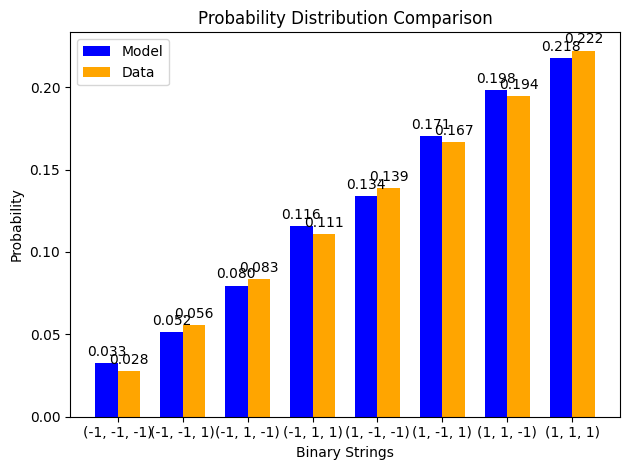

z gradient step for node 0: 3.0591917343057994e-06
z gradient step for node 1: -3.497735804438851e-07
z gradient step for node 2: 5.9059290233309805e-08
z gradient step for node 3: -3.6437047022552796e-07
edge graident step for edge (0, 3): 4.50570345164536e-06
edge graident step for edge (1, 3): -8.710602894107523e-08
edge graident step for edge (2, 3): -4.6124966151350755e-07
edge graident step for edge (0, 1): -5.093585236254362e-07
edge graident step for edge (0, 2): -1.5449453983686497e-06
edge graident step for edge (1, 2): -1.815806829228439e-07
x positive phase: 0.0
x negative phase: 6.405241841118756e-07
x gradient step for node 0: -6.405241841118756e-10
x positive phase: 0.0
x negative phase: 1.6534861149218556e-06
x gradient step for node 1: -1.6534861149218556e-09
x positive phase: 0.0
x negative phase: 7.41580780365519e-07
x gradient step for node 2: -7.41580780365519e-10
x positive phase: -0.1490391472852708
x negative phase: -0.1490326573689595
x gradient step for node 3

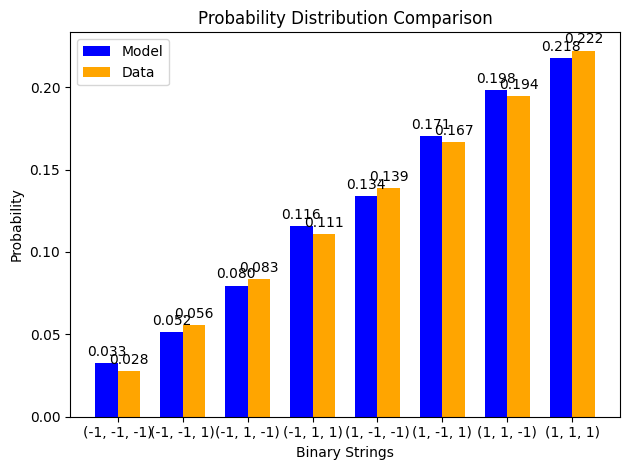

z gradient step for node 0: 3.0643494896089865e-06
z gradient step for node 1: -3.256480157466657e-07
z gradient step for node 2: 6.264553056001265e-08
z gradient step for node 3: -3.5425399844113416e-07
edge graident step for edge (0, 3): 4.479348621965029e-06
edge graident step for edge (1, 3): -9.959299436557156e-08
edge graident step for edge (2, 3): -4.546192881435263e-07
edge graident step for edge (0, 1): -5.47588961553297e-07
edge graident step for edge (0, 2): -1.531514197947323e-06
edge graident step for edge (1, 2): -1.8313966556104954e-07
x positive phase: 0.0
x negative phase: 5.81282471447589e-07
x gradient step for node 0: -5.81282471447589e-10
x positive phase: 0.0
x negative phase: 1.502875865229458e-06
x gradient step for node 1: -1.5028758652294582e-09
x positive phase: 0.0
x negative phase: 6.736810776071832e-07
x gradient step for node 2: -6.736810776071832e-10
x positive phase: -0.14904543337454818
x negative phase: -0.14903813814695352
x gradient step for node 3:

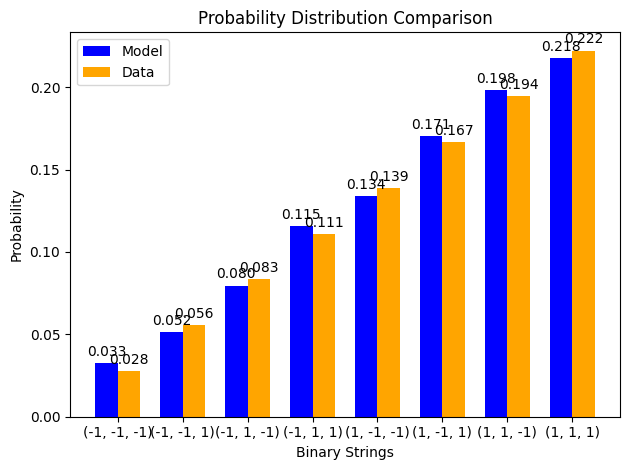

z gradient step for node 0: 3.0688595450939496e-06
z gradient step for node 1: -3.02877136421853e-07
z gradient step for node 2: 6.606004754329542e-08
z gradient step for node 3: -3.44555196409968e-07
edge graident step for edge (0, 3): 4.45406780435198e-06
edge graident step for edge (1, 3): -1.1119844535459334e-07
edge graident step for edge (2, 3): -4.482119548105956e-07
edge graident step for edge (0, 1): -5.835058762518747e-07
edge graident step for edge (0, 2): -1.518731015625982e-06
edge graident step for edge (1, 2): -1.8473037239119527e-07
x positive phase: 0.0
x negative phase: 5.275190373651834e-07
x gradient step for node 0: -5.275190373651834e-10
x positive phase: 0.0
x negative phase: 1.3659835316404452e-06
x gradient step for node 1: -1.3659835316404452e-09
x positive phase: 0.0
x negative phase: 6.11998354081435e-07
x gradient step for node 2: -6.11998354081435e-10
x positive phase: -0.14905174956176284
x negative phase: -0.14904370828014357
x gradient step for node 3: 

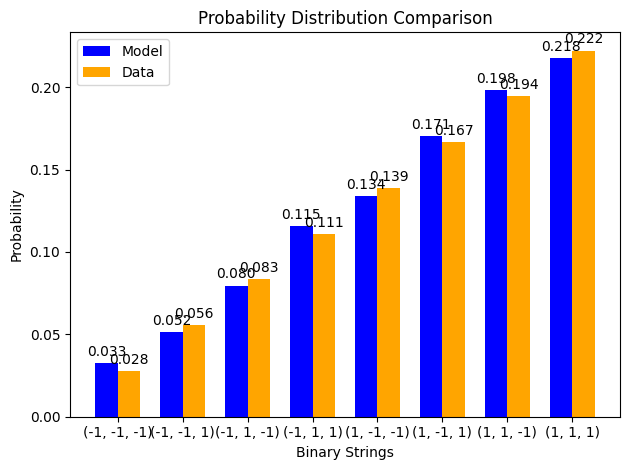

z gradient step for node 0: 3.072762264977269e-06
z gradient step for node 1: -2.81384470746604e-07
z gradient step for node 2: 6.931092200515577e-08
z gradient step for node 3: -3.3525101684994676e-07
edge graident step for edge (0, 3): 4.4298002347978315e-06
edge graident step for edge (1, 3): -1.21972590496941e-07
edge graident step for edge (2, 3): -4.420141600371685e-07
edge graident step for edge (0, 1): -6.172401520255777e-07
edge graident step for edge (0, 2): -1.5065575007646991e-06
edge graident step for edge (1, 2): -1.8634837657249825e-07
x positive phase: 0.0
x negative phase: 4.787274241995598e-07
x gradient step for node 0: -4.787274241995598e-10
x positive phase: 0.0
x negative phase: 1.241559780730346e-06
x gradient step for node 1: -1.241559780730346e-09
x positive phase: 0.0
x negative phase: 5.55963380632953e-07
x gradient step for node 2: -5.55963380632953e-10
x positive phase: -0.149058092951374
x negative phase: -0.14904936151622733
x gradient step for node 3: -8

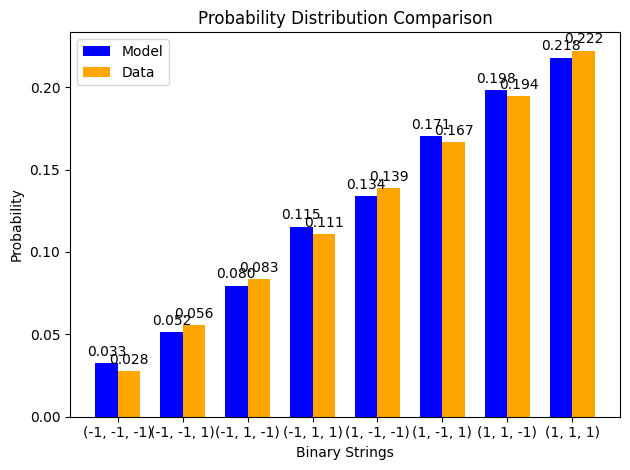

z gradient step for node 0: 3.076095470896767e-06
z gradient step for node 1: -2.61097827422091e-07
z gradient step for node 2: 7.240587472057136e-08
z gradient step for node 3: -3.263197208497326e-07
edge graident step for edge (0, 3): 4.406488683806164e-06
edge graident step for edge (1, 3): -1.3196286456451655e-07
edge graident step for edge (2, 3): -4.3601326746944836e-07
edge graident step for edge (0, 1): -6.489154266385161e-07
edge graident step for edge (0, 2): -1.494957562449842e-06
edge graident step for edge (1, 2): -1.879896711935447e-07
x positive phase: 0.0
x negative phase: 4.3444797573333793e-07
x gradient step for node 0: -4.344479757333379e-10
x positive phase: 0.0
x negative phase: 1.12846903938213e-06
x gradient step for node 1: -1.12846903938213e-09
x positive phase: 0.0
x negative phase: 5.050590456307699e-07
x gradient step for node 2: -5.050590456307699e-10
x positive phase: -0.14906446080896135
x negative phase: -0.14905509194807787
x gradient step for node 3: 

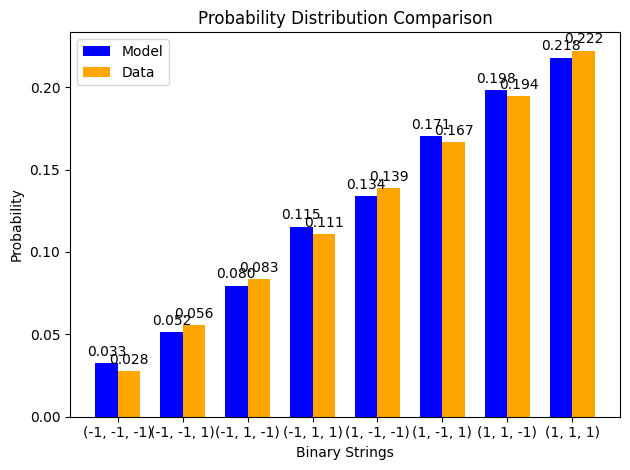

z gradient step for node 0: 3.078894607273175e-06
z gradient step for node 1: -2.4194906044430753e-07
z gradient step for node 2: 7.535228070373879e-08
z gradient step for node 3: -3.17740804149147e-07
edge graident step for edge (0, 3): 4.384079248286877e-06
edge graident step for edge (1, 3): -1.412140775047116e-07
edge graident step for edge (2, 3): -4.301974509485773e-07
edge graident step for edge (0, 1): -6.786484785629987e-07
edge graident step for edge (0, 2): -1.4838972407644202e-06
edge graident step for edge (1, 2): -1.896506327593861e-07
x positive phase: 0.0
x negative phase: 3.9426351515107476e-07
x gradient step for node 0: -3.9426351515107475e-10
x positive phase: 0.0
x negative phase: 1.0256791392412799e-06
x gradient step for node 1: -1.02567913924128e-09
x positive phase: 0.0
x negative phase: 4.588155834119128e-07
x gradient step for node 2: -4.588155834119128e-10
x positive phase: -0.14907085055273187
x negative phase: -0.14906089399542968
x gradient step for node 

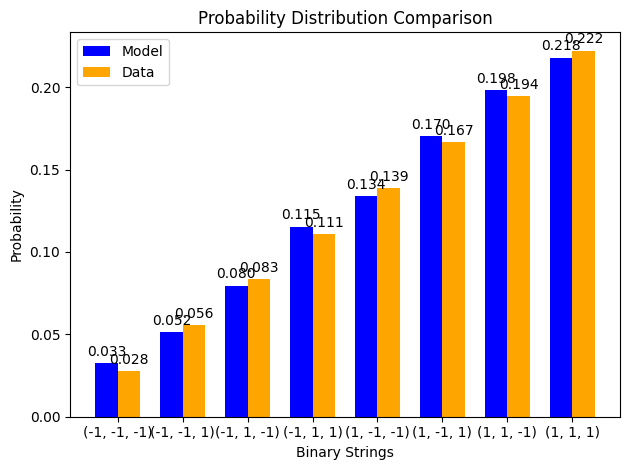

z gradient step for node 0: 3.081192895610485e-06
z gradient step for node 1: -2.2387384639188658e-07
z gradient step for node 2: 7.815718309850394e-08
z gradient step for node 3: -3.0949492744503093e-07
edge graident step for edge (0, 3): 4.362521155769128e-06
edge graident step for edge (1, 3): -1.4976855583159754e-07
edge graident step for edge (2, 3): -4.2455564298840566e-07
edge graident step for edge (0, 1): -7.065495950208667e-07
edge graident step for edge (0, 2): -1.4733445849090392e-06
edge graident step for edge (1, 2): -1.9132798761142823e-07
x positive phase: 0.0
x negative phase: 3.5779542171451676e-07
x gradient step for node 0: -3.5779542171451676e-10
x positive phase: 0.0
x negative phase: 9.322519033730506e-07
x gradient step for node 1: -9.322519033730506e-10
x positive phase: 0.0
x negative phase: 4.168062395459686e-07
x gradient step for node 2: -4.168062395459686e-10
x positive phase: -0.14907725974544908
x negative phase: -0.14906676238748004
x gradient step for 

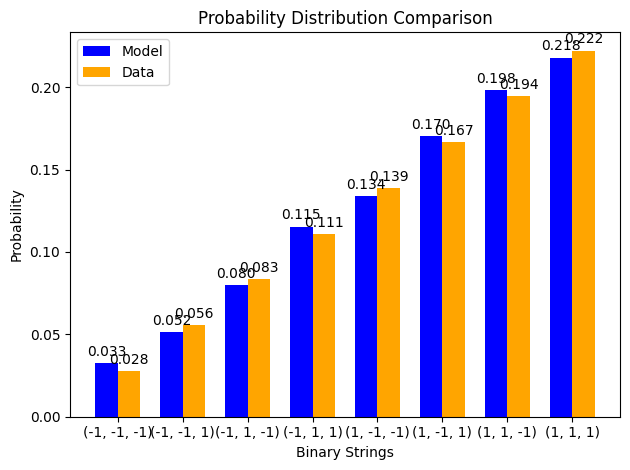

z gradient step for node 0: 3.083021478489323e-06
z gradient step for node 1: -2.0681147352946683e-07
z gradient step for node 2: 8.082730666209014e-08
z gradient step for node 3: -3.01563850535036e-07
edge graident step for edge (0, 3): 4.3417665802064075e-06
edge graident step for edge (1, 3): -1.576662767738546e-07
edge graident step for edge (2, 3): -4.190774864598901e-07
edge graident step for edge (0, 1): -7.327229215961934e-07
edge graident step for edge (0, 2): -1.4632695378672122e-06
edge graident step for edge (1, 2): -1.9301878109515003e-07
x positive phase: 0.0
x negative phase: 3.2470006943618107e-07
x gradient step for node 0: -3.2470006943618106e-10
x positive phase: 0.0
x negative phase: 8.473345894619423e-07
x gradient step for node 1: -8.473345894619423e-10
x positive phase: 0.0
x negative phase: 3.786433329356701e-07
x gradient step for node 2: -3.786433329356701e-10
x positive phase: -0.14908368608676525
x negative phase: -0.1490726921463657
x gradient step for node

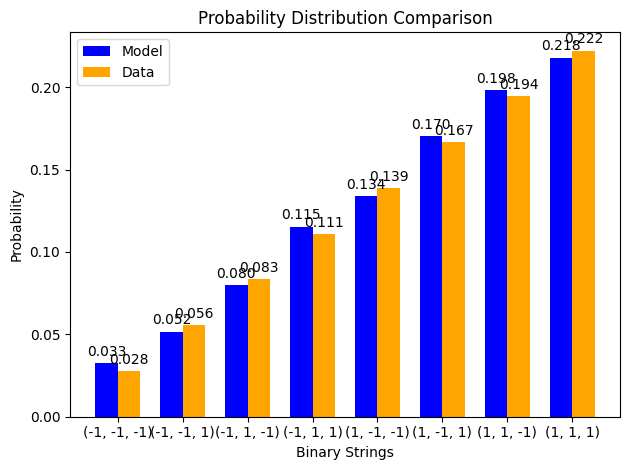

z gradient step for node 0: 3.0844095539330207e-06
z gradient step for node 1: -1.9070464215464877e-07
z gradient step for node 2: 8.336907084663391e-08
z gradient step for node 3: -2.939303700856266e-07
edge graident step for edge (0, 3): 4.321770468710462e-06
edge graident step for edge (1, 3): -1.6494499549971064e-07
edge graident step for edge (2, 3): -4.1375328929843525e-07
edge graident step for edge (0, 1): -7.572667942094686e-07
edge graident step for edge (0, 2): -1.4536438272982066e-06
edge graident step for edge (1, 2): -1.947203492426164e-07
x positive phase: 0.0
x negative phase: 2.9466559440187736e-07
x gradient step for node 0: -2.946655944018774e-10
x positive phase: 0.0
x negative phase: 7.701521116715445e-07
x gradient step for node 1: -7.701521116715445e-10
x positive phase: 0.0
x negative phase: 3.439746784280089e-07
x gradient step for node 2: -3.4397467842800887e-10
x positive phase: -0.14909012740593877
x negative phase: -0.14907867857147733
x gradient step for n

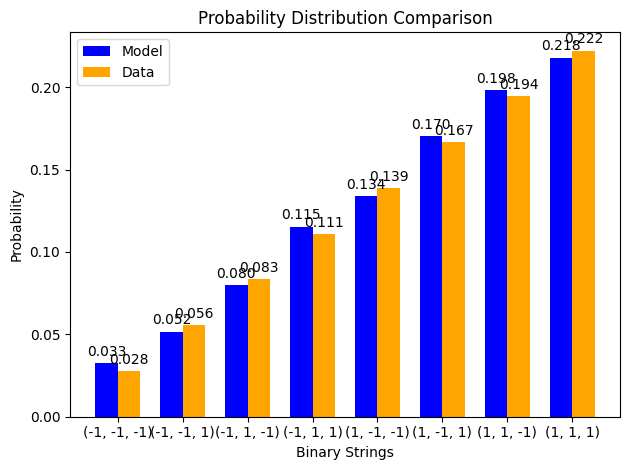

z gradient step for node 0: 3.085384500812194e-06
z gradient step for node 1: -1.7549927562607315e-07
z gradient step for node 2: 8.578860245715692e-08
z gradient step for node 3: -2.865782608567624e-07
edge graident step for edge (0, 3): 4.30249037855851e-06
edge graident step for edge (1, 3): -1.716403657589516e-07
edge graident step for edge (2, 3): -4.08573982037308e-07
edge graident step for edge (0, 1): -7.802740542011133e-07
edge graident step for edge (0, 2): -1.4444408623835309e-06
edge graident step for edge (1, 2): -1.964302928119943e-07
x positive phase: 0.0
x negative phase: 2.6740896045754276e-07
x gradient step for node 0: -2.674089604575428e-10
x positive phase: 0.0
x negative phase: 6.999999703561484e-07
x gradient step for node 1: -6.999999703561484e-10
x positive phase: 0.0
x negative phase: 3.1248033693497943e-07
x gradient step for node 2: -3.1248033693497944e-10
x positive phase: -0.14909658165492098
x negative phase: -0.149084717224574
x gradient step for node 3:

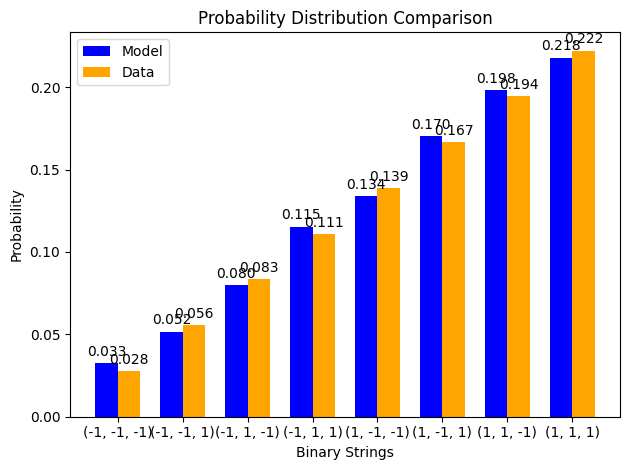

z gradient step for node 0: 3.0859719958849507e-06
z gradient step for node 1: -1.6114434155176104e-07
z gradient step for node 2: 8.809174790272435e-08
z gradient step for node 3: -2.7949222018930353e-07
edge graident step for edge (0, 3): 4.2838863238786055e-06
edge graident step for edge (1, 3): -1.7778605423535156e-07
edge graident step for edge (2, 3): -4.0353107801582856e-07
edge graident step for edge (0, 1): -8.018323472824551e-07
edge graident step for edge (0, 2): -1.435635636318433e-06
edge graident step for edge (1, 2): -1.9814645348115167e-07
x positive phase: 0.0
x negative phase: 2.4267329575999997e-07
x gradient step for node 0: -2.4267329576e-10
x positive phase: 0.0
x negative phase: 6.36237825247567e-07
x gradient step for node 1: -6.36237825247567e-10
x positive phase: 0.0
x negative phase: 2.8386966308345425e-07
x gradient step for node 2: -2.8386966308345424e-10
x positive phase: -0.1491030469017942
x negative phase: -0.14909080391566185
x gradient step for node 3

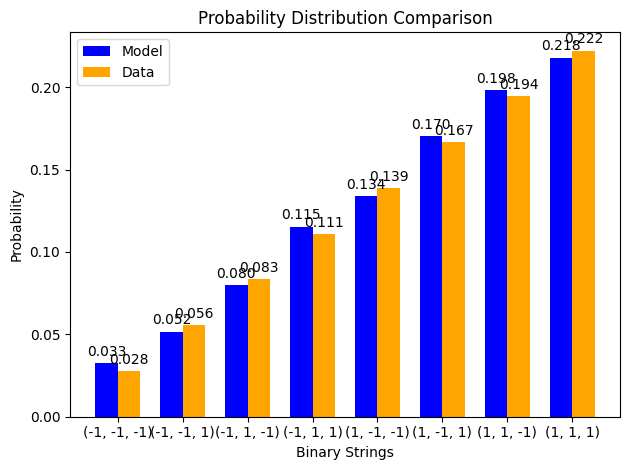

z gradient step for node 0: 3.086196123046614e-06
z gradient step for node 1: -1.4759168261299637e-07
z gradient step for node 2: 9.028408502992358e-08
z gradient step for node 3: -2.7265781559027145e-07
edge graident step for edge (0, 3): 4.265920631439657e-06
edge graident step for edge (1, 3): -1.8341384892590906e-07
edge graident step for edge (2, 3): -3.9861663608131705e-07
edge graident step for edge (0, 1): -8.220244070601263e-07
edge graident step for edge (0, 2): -1.4272046341913398e-06
edge graident step for edge (1, 2): -1.9986689204654073e-07
x positive phase: 0.0
x negative phase: 2.202254752204648e-07
x gradient step for node 0: -2.2022547522046478e-10
x positive phase: 0.0
x negative phase: 5.78283653589394e-07
x gradient step for node 1: -5.782836535893941e-10
x positive phase: 0.0
x negative phase: 2.578786231577187e-07
x gradient step for node 2: -2.578786231577187e-10
x positive phase: -0.14910952132454586
x negative phase: -0.14909693468960128
x gradient step for no

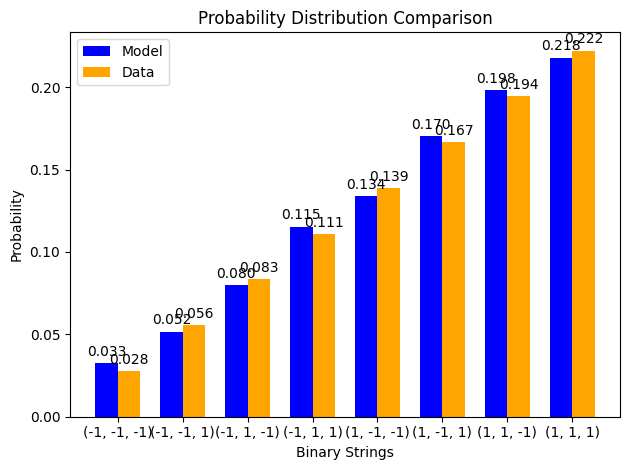

z gradient step for node 0: 3.086079475320469e-06
z gradient step for node 1: -1.3479585655176707e-07
z gradient step for node 2: 9.237093454780854e-08
z gradient step for node 3: -2.6606143525398363e-07
edge graident step for edge (0, 3): 4.248557804995668e-06
edge graident step for edge (1, 3): -1.885537618201427e-07
edge graident step for edge (2, 3): -3.9382322564920916e-07
edge graident step for edge (0, 1): -8.409283238562521e-07
edge graident step for edge (0, 2): -1.4191257459702095e-06
edge graident step for edge (1, 2): -2.0158986847146343e-07
x positive phase: 0.0
x negative phase: 1.998539261670546e-07
x gradient step for node 0: -1.998539261670546e-10
x positive phase: 0.0
x negative phase: 5.256084400091987e-07
x gradient step for node 1: -5.256084400091986e-10
x positive phase: 0.0
x negative phase: 2.3426735859112025e-07
x gradient step for node 2: -2.3426735859112027e-10
x positive phase: -0.1491160032051625
x negative phase: -0.1491031058134096
x gradient step for nod

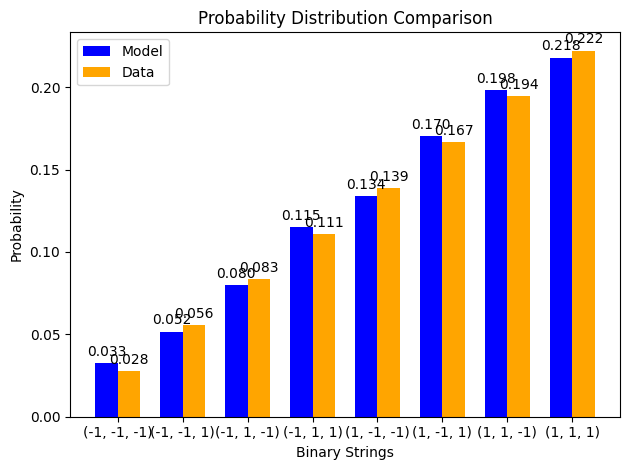

z gradient step for node 0: 3.0856432500743213e-06
z gradient step for node 1: -1.2271398483409967e-07
z gradient step for node 2: 9.435737104709907e-08
z gradient step for node 3: -2.5969024135064077e-07
edge graident step for edge (0, 3): 4.231764397696458e-06
edge graident step for edge (1, 3): -1.9323412617207326e-07
edge graident step for edge (2, 3): -3.891438939619685e-07
edge graident step for edge (0, 1): -8.586177994863442e-07
edge graident step for edge (0, 2): -1.4113781843446416e-06
edge graident step for edge (1, 2): -2.033138236207932e-07
x positive phase: 0.0
x negative phase: 1.8136663663928537e-07
x gradient step for node 0: -1.8136663663928539e-10
x positive phase: 0.0
x negative phase: 4.777313497549437e-07
x gradient step for node 1: -4.777313497549438e-10
x positive phase: 0.0
x negative phase: 2.1281797252809569e-07
x gradient step for node 2: -2.128179725280957e-10
x positive phase: -0.14912249092402913
x negative phase: -0.14910931376422445
x gradient step for 

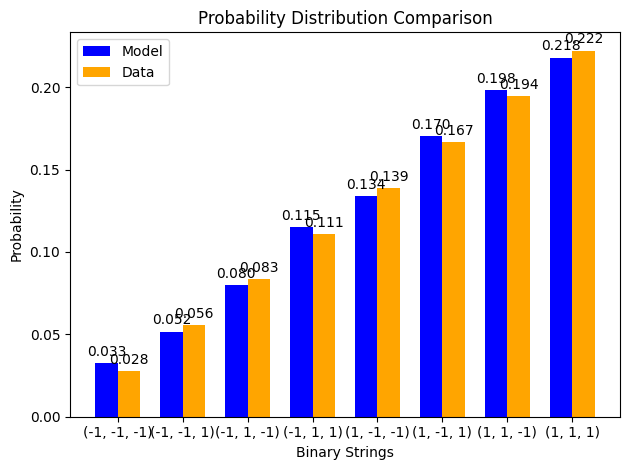

z gradient step for node 0: 3.0849073379393135e-06
z gradient step for node 1: -1.1130560956426617e-07
z gradient step for node 2: 9.624823362003321e-08
z gradient step for node 3: -2.535321259543588e-07
edge graident step for edge (0, 3): 4.21550889205885e-06
edge graident step for edge (1, 3): -1.9748168861598303e-07
edge graident step for edge (2, 3): -3.845721354285292e-07
edge graident step for edge (0, 1): -8.751623886727178e-07
edge graident step for edge (0, 2): -1.4039424071765894e-06
edge graident step for edge (1, 2): -2.0503736258031813e-07
x positive phase: 0.0
x negative phase: 1.6458934762283326e-07
x gradient step for node 0: -1.6458934762283326e-10
x positive phase: 0.0
x negative phase: 4.3421534131879363e-07
x gradient step for node 1: -4.3421534131879364e-10
x positive phase: 0.0
x negative phase: 1.9333251903537843e-07
x gradient step for node 2: -1.9333251903537842e-10
x positive phase: -0.149128982954619
x negative phase: -0.14911555521789813
x gradient step for 

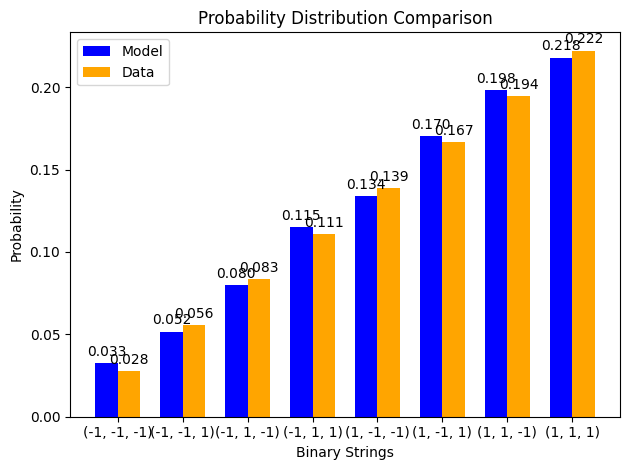

z gradient step for node 0: 3.0838904058453355e-06
z gradient step for node 1: -1.0053255820177687e-07
z gradient step for node 2: 9.804813608345343e-08
z gradient step for node 3: -2.4757566944266785e-07
edge graident step for edge (0, 3): 4.1997615870717485e-06
edge graident step for edge (1, 3): -2.0132169639257292e-07
edge graident step for edge (2, 3): -3.8010186289455515e-07
edge graident step for edge (0, 1): -8.906277277118125e-07
edge graident step for edge (0, 2): -1.3968000443238815e-06
edge graident step for edge (1, 2): -2.0675923940094431e-07
x positive phase: 0.0
x negative phase: 1.4936391225413345e-07
x gradient step for node 0: -1.4936391225413346e-10
x positive phase: 0.0
x negative phase: 3.9466317846932984e-07
x gradient step for node 1: -3.9466317846932984e-10
x positive phase: 0.0
x negative phase: 1.756311764104465e-07
x gradient step for node 2: -1.7563117641044653e-10
x positive phase: -0.14913547785845963
x negative phase: -0.1491218270381912
x gradient step 

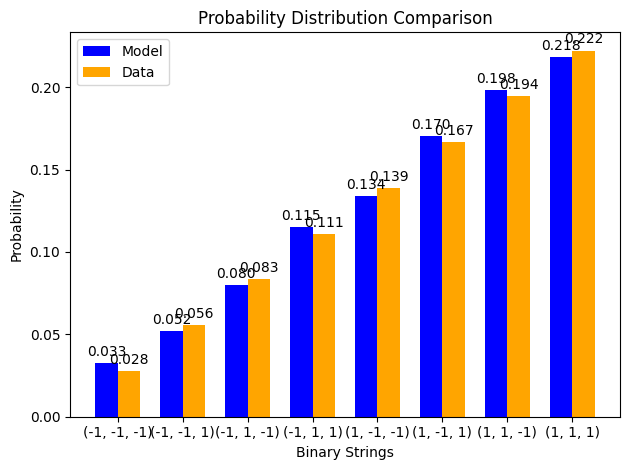

z gradient step for node 0: 3.0826099745873694e-06
z gradient step for node 1: -9.035881569185999e-08
z gradient step for node 2: 9.976147682352888e-08
z gradient step for node 3: -2.4181010125345906e-07
edge graident step for edge (0, 3): 4.1844944919876005e-06
edge graident step for edge (1, 3): -2.0477797992070336e-07
edge graident step for edge (2, 3): -3.757273807465933e-07
edge graident step for edge (0, 1): -9.050757510243868e-07
edge graident step for edge (0, 2): -1.3899338285993517e-06
edge graident step for edge (1, 2): -2.084783431772208e-07
x positive phase: 0.0
x negative phase: 1.3554680658760735e-07
x gradient step for node 0: -1.3554680658760736e-10
x positive phase: 0.0
x negative phase: 3.587138053479981e-07
x gradient step for node 1: -3.587138053479981e-10
x positive phase: 0.0
x negative phase: 1.5955058773344568e-07
x gradient step for node 2: -1.5955058773344569e-10
x positive phase: -0.14914197428036272
x negative phase: -0.14912812626653635
x gradient step for

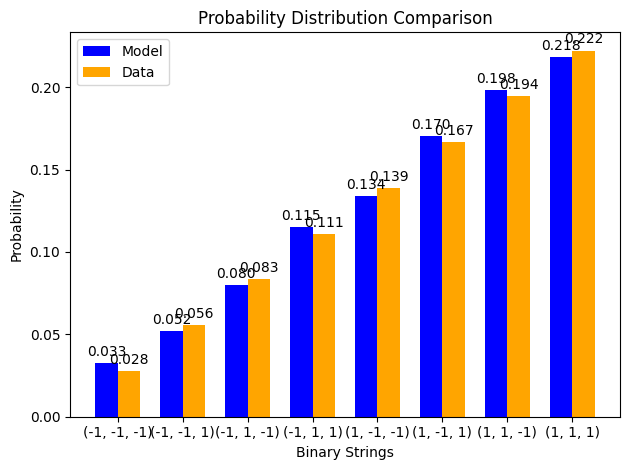

z gradient step for node 0: 3.0810824912834157e-06
z gradient step for node 1: -8.075040361044117e-08
z gradient step for node 2: 1.0139244825832506e-07
z gradient step for node 3: -2.362252628602679e-07
edge graident step for edge (0, 3): 4.169681226417477e-06
edge graident step for edge (1, 3): -2.078730309540422e-07
edge graident step for edge (2, 3): -3.714433597209188e-07
edge graident step for edge (0, 1): -9.185648961691357e-07
edge graident step for edge (0, 2): -1.3833275306609911e-06
edge graident step for edge (1, 2): -2.1019368534150318e-07
x positive phase: 0.0
x negative phase: 1.23007777937894e-07
x gradient step for node 0: -1.23007777937894e-10
x positive phase: 0.0
x negative phase: 3.2603905159040253e-07
x gradient step for node 1: -3.2603905159040253e-10
x positive phase: 0.0
x negative phase: 1.4494235335158642e-07
x gradient step for node 2: -1.4494235335158642e-10
x positive phase: -0.1491484709439035
x negative phase: -0.1491344501123441
x gradient step for node

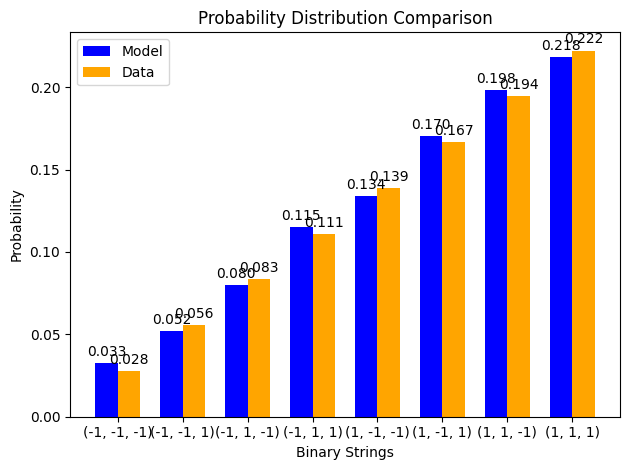

z gradient step for node 0: 3.079323397079448e-06
z gradient step for node 1: -7.167526595727724e-08
z gradient step for node 2: 1.0294504593616472e-07
z gradient step for node 3: -2.308115728428817e-07
edge graident step for edge (0, 3): 4.1552969263417565e-06
edge graident step for edge (1, 3): -2.1062807654331773e-07
edge graident step for edge (2, 3): -3.6724481331482096e-07
edge graident step for edge (0, 1): -9.311502978925774e-07
edge graident step for edge (0, 2): -1.3769658976145738e-06
edge graident step for edge (1, 2): -2.1190438807217048e-07
x positive phase: 0.0
x negative phase: 1.1162861809856449e-07
x gradient step for node 0: -1.1162861809856449e-10
x positive phase: 0.0
x negative phase: 2.963406374376588e-07
x gradient step for node 1: -2.963406374376588e-10
x positive phase: 0.0
x negative phase: 1.316716613865759e-07
x gradient step for node 2: -1.316716613865759e-10
x positive phase: -0.14915496664713845
x negative phase: -0.14914079594382393
x gradient step for 

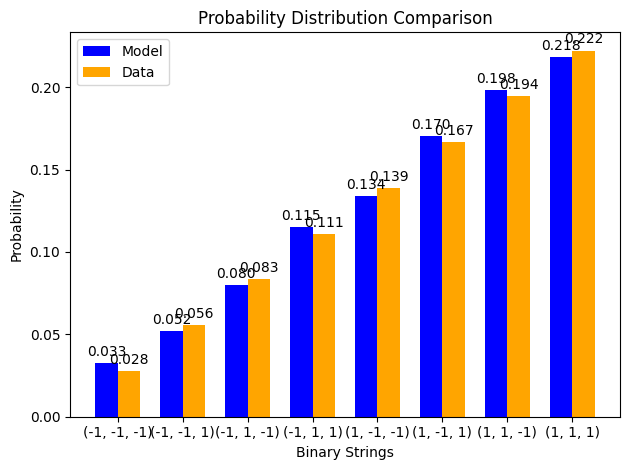

z gradient step for node 0: 3.077347190423574e-06
z gradient step for node 1: -6.310316124352733e-08
z gradient step for node 2: 1.0442307727356881e-07
z gradient step for node 3: -2.2555999394424654e-07
edge graident step for edge (0, 3): 4.141318155683027e-06
edge graident step for edge (1, 3): -2.1306314901936573e-07
edge graident step for edge (2, 3): -3.6312707570140826e-07
edge graident step for edge (0, 1): -9.428839717535442e-07
edge graident step for edge (0, 2): -1.3708345951390228e-06
edge graident step for edge (1, 2): -2.1360967372868746e-07
x positive phase: 0.0
x negative phase: 1.0130204990935481e-07
x gradient step for node 0: -1.013020499093548e-10
x positive phase: 0.0
x negative phase: 2.693474515346797e-07
x gradient step for node 1: -2.693474515346797e-10
x positive phase: 0.0
x negative phase: 1.1961604362893194e-07
x gradient step for node 2: -1.1961604362893193e-10
x positive phase: -0.14916146025854904
x negative phase: -0.1491471612792938
x gradient step for 

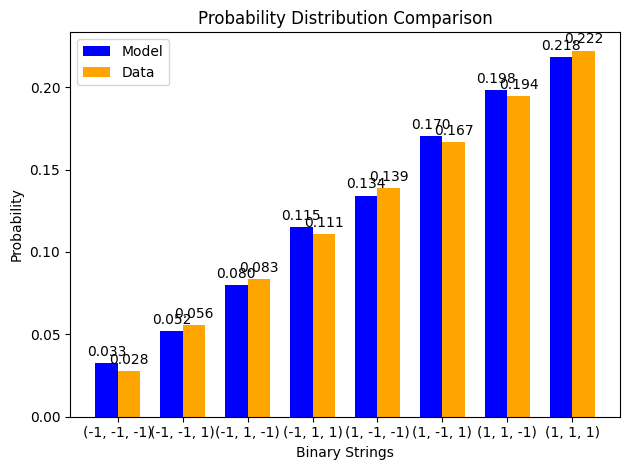

z gradient step for node 0: 3.0751674862082856e-06
z gradient step for node 1: -5.500556054355288e-08
z gradient step for node 2: 1.058301699473907e-07
z gradient step for node 3: -2.2046200199754563e-07
edge graident step for edge (0, 3): 4.127722823112856e-06
edge graident step for edge (1, 3): -2.151971521978102e-07
edge graident step for edge (2, 3): -3.590857810551462e-07
edge graident step for edge (0, 1): -9.538149878545732e-07
edge graident step for edge (0, 2): -1.3649201529310346e-06
edge graident step for edge (1, 2): -2.1530885522974553e-07
x positive phase: 0.0
x negative phase: 9.193071670684191e-08
x gradient step for node 0: -9.193071670684191e-11
x positive phase: 0.0
x negative phase: 2.448130765957378e-07
x gradient step for node 1: -2.448130765957378e-10
x positive phase: 0.0
x negative phase: 1.0866424533977009e-07
x gradient step for node 2: -1.0866424533977009e-10
x positive phase: -0.1491679507132
x negative phase: -0.14915354377895448
x gradient step for node 3

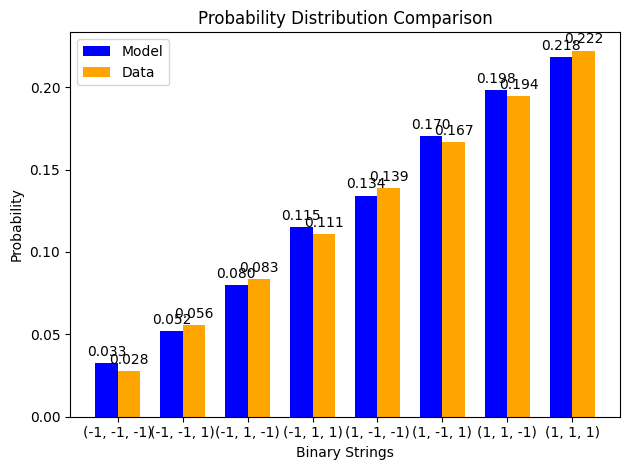

z gradient step for node 0: 3.0727970710589528e-06
z gradient step for node 1: -4.7355551186067936e-08
z gradient step for node 2: 1.0716977994798538e-07
z gradient step for node 3: -2.1550955661953086e-07
edge graident step for edge (0, 3): 4.1144901037768465e-06
edge graident step for edge (1, 3): -2.1704792400098482e-07
edge graident step for edge (2, 3): -3.551168441942587e-07
edge graident step for edge (0, 1): -9.63989635169485e-07
edge graident step for edge (0, 2): -1.3592099133077073e-06
edge graident step for edge (1, 2): -2.1700132728569298e-07
x positive phase: 0.0
x negative phase: 8.342626515856198e-08
x gradient step for node 0: -8.342626515856198e-11
x positive phase: 0.0
x negative phase: 2.2251354037543118e-07
x gradient step for node 1: -2.225135403754312e-10
x positive phase: 0.0
x negative phase: 9.871519853152319e-08
x gradient step for node 2: -9.87151985315232e-11
x positive phase: -0.14917443700910166
x negative phase: -0.1491599412371047
x gradient step for no

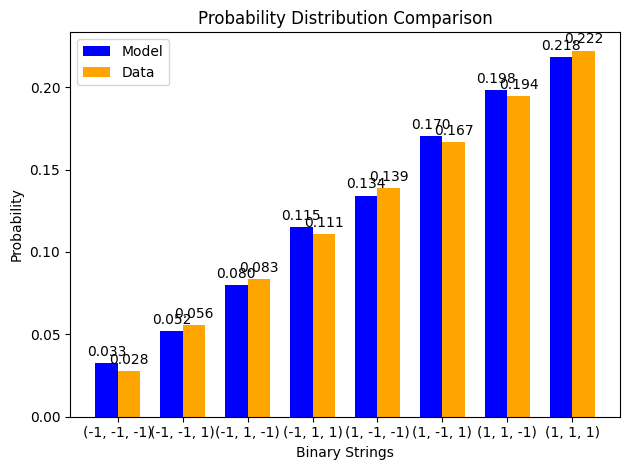

z gradient step for node 0: 3.0702479550366315e-06
z gradient step for node 1: -4.012774578687761e-08
z gradient step for node 2: 1.08445199306334e-07
z gradient step for node 3: -2.1069507357474038e-07
edge graident step for edge (0, 3): 4.101600365638058e-06
edge graident step for edge (1, 3): -2.1863229568419574e-07
edge graident step for edge (2, 3): -3.5121644246641213e-07
edge graident step for edge (0, 1): -9.734515769561636e-07
edge graident step for edge (0, 2): -1.3536919827715765e-06
edge graident step for edge (1, 2): -2.1868655842530172e-07
x positive phase: 0.0
x negative phase: 7.570851285681624e-08
x gradient step for node 0: -7.570851285681624e-11
x positive phase: 0.0
x negative phase: 2.022452714357686e-07
x gradient step for node 1: -2.0224527143576859e-10
x positive phase: 0.0
x negative phase: 8.967708925373415e-08
x gradient step for node 2: -8.967708925373415e-11
x positive phase: -0.14918091820376567
x negative phase: -0.14916635157477376
x gradient step for no

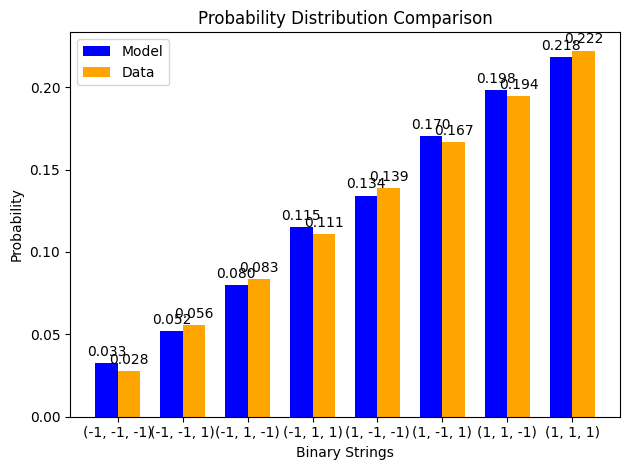

z gradient step for node 0: 3.0675314199903327e-06
z gradient step for node 1: -3.3298196333020335e-08
z gradient step for node 2: 1.0965956349731632e-07
z gradient step for node 3: -2.0601139871556652e-07
edge graident step for edge (0, 3): 4.089035100170113e-06
edge graident step for edge (1, 3): -2.1996614784150492e-07
edge graident step for edge (2, 3): -3.473809987839527e-07
edge graident step for edge (0, 1): -9.82241997701208e-07
edge graident step for edge (0, 2): -1.348355186402389e-06
edge graident step for edge (1, 2): -2.203640837402654e-07
x positive phase: 0.0
x negative phase: 6.870469284397182e-08
x gradient step for node 0: -6.870469284397182e-11
x positive phase: 0.0
x negative phase: 1.8382324106609207e-07
x gradient step for node 1: -1.8382324106609206e-10
x positive phase: 0.0
x negative phase: 8.1466510277357e-08
x gradient step for node 2: -8.1466510277357e-11
x positive phase: -0.14918739341094486
x negative phase: -0.1491727728327518
x gradient step for node 3:

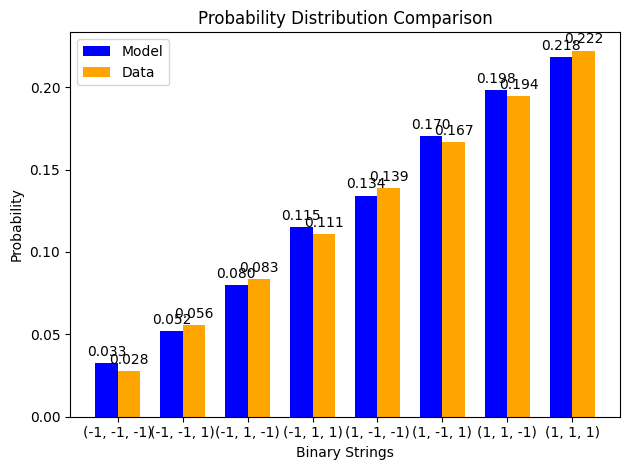

z gradient step for node 0: 3.0646580647855638e-06
z gradient step for node 1: -2.6844313045837343e-08
z gradient step for node 2: 1.1081585854885723e-07
z gradient step for node 3: -2.0145178340602588e-07
edge graident step for edge (0, 3): 4.076776857134201e-06
edge graident step for edge (1, 3): -2.210644633549863e-07
edge graident step for edge (2, 3): -3.4360716575815296e-07
edge graident step for edge (0, 1): -9.903997420444982e-07
edge graident step for edge (0, 2): -1.3431890248871564e-06
edge graident step for edge (1, 2): -2.22033498290114e-07
x positive phase: 0.0
x negative phase: 6.23487679633554e-08
x gradient step for node 0: -6.23487679633554e-11
x positive phase: 0.0
x negative phase: 1.6707927440892482e-07
x gradient step for node 1: -1.6707927440892481e-10
x positive phase: 0.0
x negative phase: 7.400769135891062e-08
x gradient step for node 2: -7.400769135891062e-11
x positive phase: -0.1491938617975465
x negative phase: -0.149179203164994
x gradient step for node 3

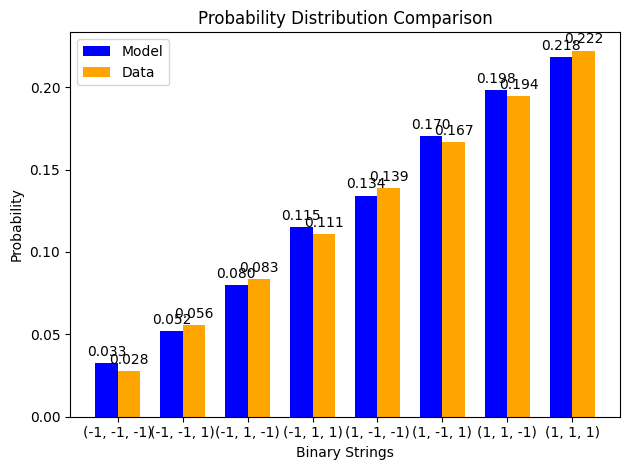

z gradient step for node 0: 3.061637847625698e-06
z gradient step for node 1: -2.074478776606381e-08
z gradient step for node 2: 1.1191692783957263e-07
z gradient step for node 3: -1.9700986135140487e-07
edge graident step for edge (0, 3): 4.064809183195684e-06
edge graident step for edge (1, 3): -2.219413774579293e-07
edge graident step for edge (2, 3): -3.3989181083926566e-07
edge graident step for edge (0, 1): -9.97961446092127e-07
edge graident step for edge (0, 2): -1.3381836340732729e-06
edge graident step for edge (1, 2): -2.236944511106176e-07
x positive phase: 0.0
x negative phase: 5.658080858558617e-08
x gradient step for node 0: -5.658080858558617e-11
x positive phase: 0.0
x negative phase: 1.51860515386956e-07
x gradient step for node 1: -1.51860515386956e-10
x positive phase: 0.0
x negative phase: 6.723179998161316e-08
x gradient step for node 2: -6.723179998161316e-11
x positive phase: -0.14920032258071197
x negative phase: -0.14918564083238392
x gradient step for node 3:

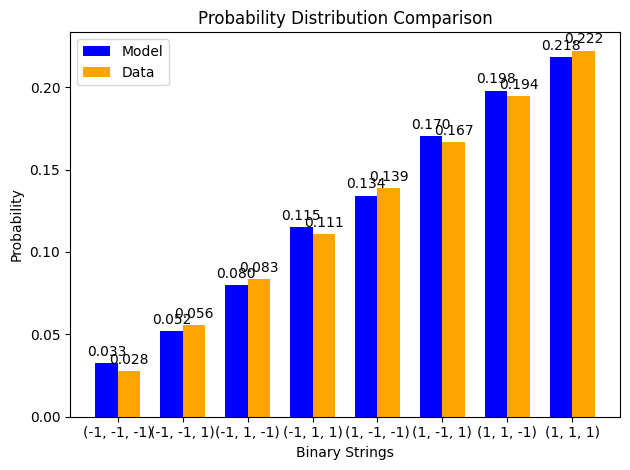

z gradient step for node 0: 3.0584801256505203e-06
z gradient step for node 1: -1.49795216080606e-08
z gradient step for node 2: 1.1296547861763817e-07
z gradient step for node 3: -1.9267962674951457e-07
edge graident step for edge (0, 3): 4.053116564154635e-06
edge graident step for edge (1, 3): -2.2261022505508377e-07
edge graident step for edge (2, 3): -3.3623200241467143e-07
edge graident step for edge (0, 1): -1.004961661518644e-06
edge graident step for edge (0, 2): -1.333329746881662e-06
edge graident step for edge (1, 2): -2.2534663977361036e-07
x positive phase: 0.0
x negative phase: 5.134642785551493e-08
x gradient step for node 0: -5.1346427855514936e-11
x positive phase: 0.0
x negative phase: 1.380280314282717e-07
x gradient step for node 1: -1.380280314282717e-10
x positive phase: 0.0
x negative phase: 6.107630612088942e-08
x gradient step for node 2: -6.107630612088942e-11
x positive phase: -0.1492067750250522
x negative phase: -0.14919208419683214
x gradient step for nod

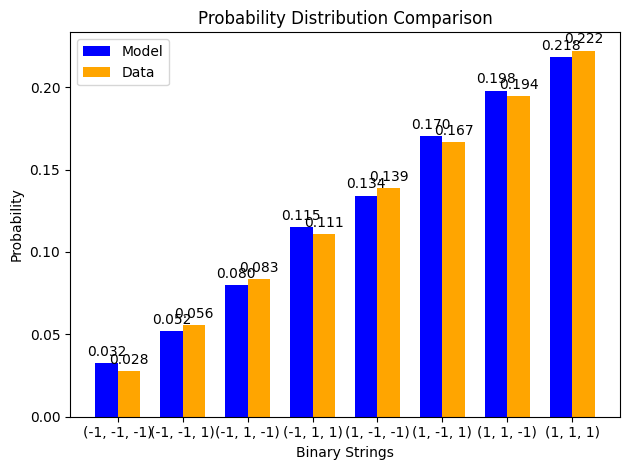

z gradient step for node 0: 3.0551936920037993e-06
z gradient step for node 1: -9.52955666333466e-09
z gradient step for node 2: 1.1396408824540517e-07
z gradient step for node 3: -1.884554136916128e-07
edge graident step for edge (0, 3): 4.04168437056851e-06
edge graident step for edge (1, 3): -2.2308358544331774e-07
edge graident step for edge (2, 3): -3.326249968023387e-07
edge graident step for edge (0, 1): -1.011432972840537e-06
edge graident step for edge (0, 2): -1.328618657453845e-06
edge graident step for edge (1, 2): -2.269898054469699e-07
x positive phase: 0.0
x negative phase: 4.659626914538692e-08
x gradient step for node 0: -4.6596269145386916e-11
x positive phase: 0.0
x negative phase: 1.2545554526134167e-07
x gradient step for node 1: -1.2545554526134167e-10
x positive phase: 0.0
x negative phase: 5.548440517238132e-08
x gradient step for node 2: -5.548440517238132e-11
x positive phase: -0.14921321844003227
x negative phase: -0.14919853171569655
x gradient step for node

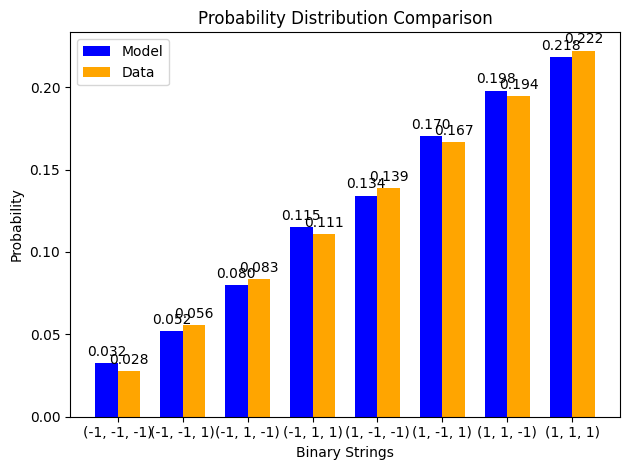

z gradient step for node 0: 3.05178681053242e-06
z gradient step for node 1: -4.377011517175955e-09
z gradient step for node 2: 1.1491521016979145e-07
z gradient step for node 3: -1.8433187674082863e-07
edge graident step for edge (0, 3): 4.030498806569138e-06
edge graident step for edge (1, 3): -2.2337332458371995e-07
edge graident step for edge (2, 3): -3.2906822607498e-07
edge graident step for edge (0, 1): -1.0174061082145608e-06
edge graident step for edge (0, 2): -1.3240421874114172e-06
edge graident step for edge (1, 2): -2.2862372841694902e-07
x positive phase: 0.0
x negative phase: 4.228554089047267e-08
x gradient step for node 0: -4.2285540890472674e-11
x positive phase: 0.0
x negative phase: 1.1402828220976585e-07
x gradient step for node 1: -1.1402828220976585e-10
x positive phase: 0.0
x negative phase: 5.040449371725284e-08
x gradient step for node 2: -5.0404493717252843e-11
x positive phase: -0.14921965217749664
x negative phase: -0.14920498193650472
x gradient step for n

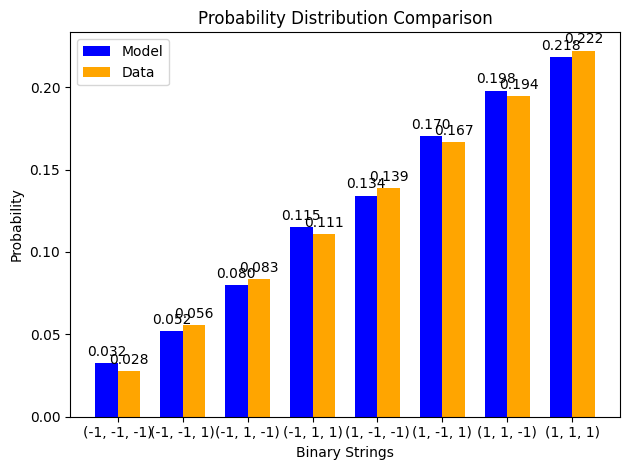

z gradient step for node 0: 3.0482672482785577e-06
z gradient step for node 1: 4.949796233444381e-10
z gradient step for node 2: 1.1582117964289985e-07
z gradient step for node 3: -1.8030397262081e-07
edge graident step for edge (0, 3): 4.019546861680434e-06
edge graident step for edge (1, 3): -2.234906350408461e-07
edge graident step for edge (2, 3): -3.255592866690804e-07
edge graident step for edge (0, 1): -1.0229100441111887e-06
edge graident step for edge (0, 2): -1.31959265410167e-06
edge graident step for edge (1, 2): -2.3024822402617496e-07
x positive phase: 0.0
x negative phase: 3.8373594428795083e-08
x gradient step for node 0: -3.837359442879509e-11
x positive phase: 0.0
x negative phase: 1.0364192246989233e-07
x gradient step for node 1: -1.0364192246989233e-10
x positive phase: 0.0
x negative phase: 4.5789693287115185e-08
x gradient step for node 2: -4.578969328711519e-11
x positive phase: -0.149226075629328
x negative phase: -0.14921143349196395
x gradient step for node 3

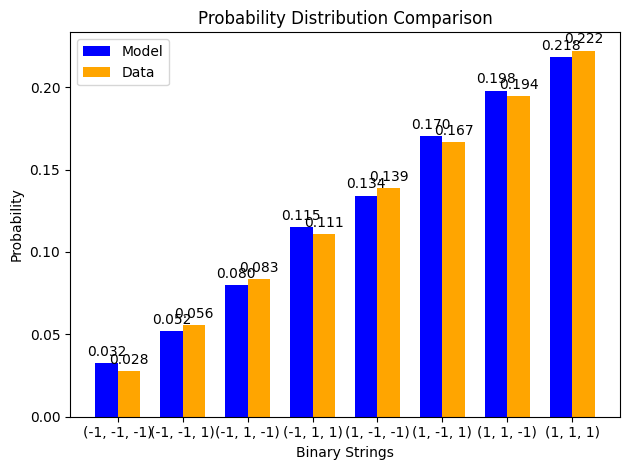

z gradient step for node 0: 3.0446423059095064e-06
z gradient step for node 1: 5.102324382916245e-09
z gradient step for node 2: 1.1668421919204531e-07
z gradient step for node 3: -1.7636694295319887e-07
edge graident step for edge (0, 3): 4.008816265460125e-06
edge graident step for edge (1, 3): -2.2344607371946325e-07
edge graident step for edge (2, 3): -3.220959287281444e-07
edge graident step for edge (0, 1): -1.02797210418884e-06
edge graident step for edge (0, 2): -1.315262840717632e-06
edge graident step for edge (1, 2): -2.318631389932324e-07
x positive phase: 0.0
x negative phase: 3.4823540870890444e-08
x gradient step for node 0: -3.482354087089044e-11
x positive phase: 0.0
x negative phase: 9.420164881173346e-08
x gradient step for node 1: -9.420164881173347e-11
x positive phase: 0.0
x negative phase: 4.159741773380055e-08
x gradient step for node 2: -4.1597417733800554e-11
x positive phase: -0.14923248822523233
x negative phase: -0.14921788509524297
x gradient step for node

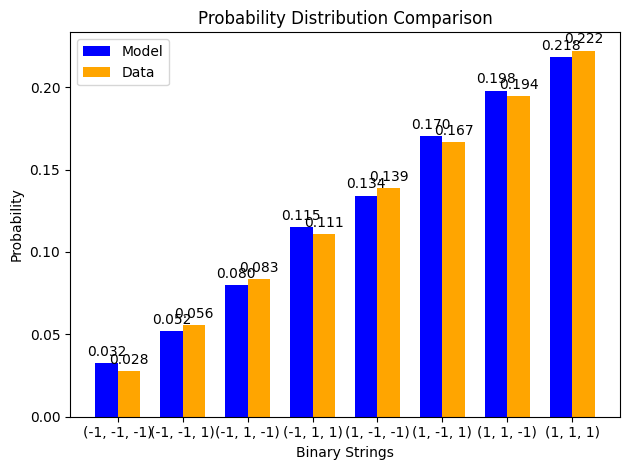

z gradient step for node 0: 3.040918846220486e-06
z gradient step for node 1: 9.460026454327641e-09
z gradient step for node 2: 1.1750644385180587e-07
z gradient step for node 3: -1.7251629798298309e-07
edge graident step for edge (0, 3): 3.998295444793465e-06
edge graident step for edge (1, 3): -2.232495975212079e-07
edge graident step for edge (2, 3): -3.186760461308391e-07
edge graident step for edge (0, 1): -1.0326180526746693e-06
edge graident step for edge (0, 2): -1.3110459681908438e-06
edge graident step for edge (1, 2): -2.334683480843258e-07
x positive phase: 0.0
x negative phase: 3.160190339255465e-08
x gradient step for node 0: -3.160190339255465e-11
x positive phase: 0.0
x negative phase: 8.562128101381778e-08
x gradient step for node 1: -8.562128101381777e-11
x positive phase: 0.0
x negative phase: 3.7788980211570925e-08
x gradient step for node 2: -3.7788980211570924e-11
x positive phase: -0.14923888943064428
x negative phase: -0.14922433553551118
x gradient step for nod

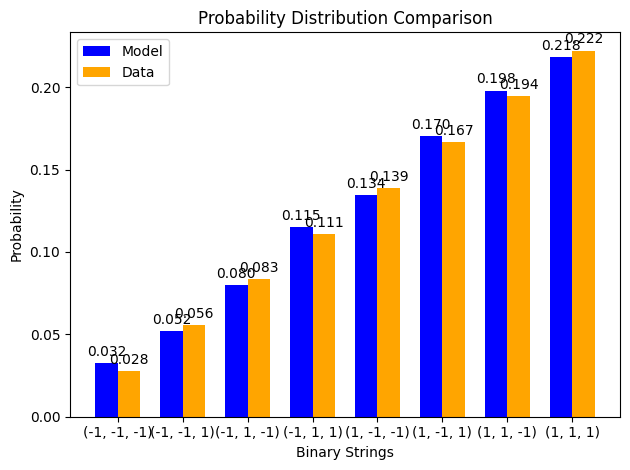

z gradient step for node 0: 3.0371033208416165e-06
z gradient step for node 1: 1.3582236787129665e-08
z gradient step for node 2: 1.1828986616740922e-07
z gradient step for node 3: -1.6874780123321553e-07
edge graident step for edge (0, 3): 3.987973483687623e-06
edge graident step for edge (1, 3): -2.2291059702733706e-07
edge graident step for edge (2, 3): -3.1529766715965304e-07
edge graident step for edge (0, 1): -1.0368721825503026e-06
edge graident step for edge (0, 2): -1.3069356687455126e-06
edge graident step for edge (1, 2): -2.3506375109541566e-07
x positive phase: 0.0
x negative phase: 2.8678301676677886e-08
x gradient step for node 0: -2.8678301676677888e-11
x positive phase: 0.0
x negative phase: 7.782248913365471e-08
x gradient step for node 1: -7.782248913365471e-11
x positive phase: 0.0
x negative phase: 3.4329236144870856e-08
x gradient step for node 2: -3.432923614487086e-11
x positive phase: -0.14924527874474539
x negative phase: -0.14923078367372125
x gradient step f

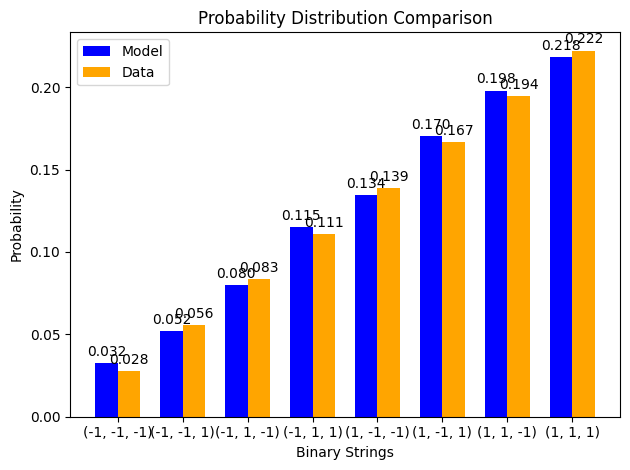

z gradient step for node 0: 3.033201795259899e-06
z gradient step for node 1: 1.748230189366207e-08
z gradient step for node 2: 1.1903640097965518e-07
z gradient step for node 3: -1.6505745504180603e-07
edge graident step for edge (0, 3): 3.9778400854113e-06
edge graident step for edge (1, 3): -2.2243792831365405e-07
edge graident step for edge (2, 3): -3.1195894577501496e-07
edge graident step for edge (0, 1): -1.0407573988290842e-06
edge graident step for edge (0, 2): -1.3029259610281423e-06
edge graident step for edge (1, 2): -2.3664927012681525e-07
x positive phase: 0.0
x negative phase: 2.6025165532683555e-08
x gradient step for node 0: -2.6025165532683554e-11
x positive phase: 0.0
x negative phase: 7.073407843454775e-08
x gradient step for node 1: -7.073407843454775e-11
x positive phase: 0.0
x negative phase: 3.1186258886794145e-08
x gradient step for node 2: -3.1186258886794145e-11
x positive phase: -0.14925165569859028
x negative phase: -0.1492372284386226
x gradient step for n

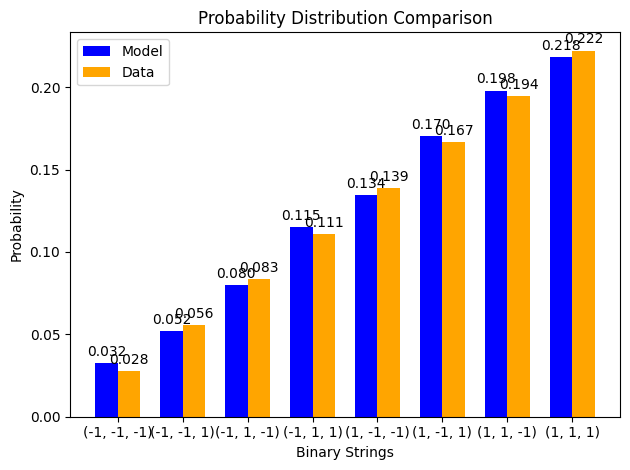

z gradient step for node 0: 3.0292199722764535e-06
z gradient step for node 1: 2.1172809442387976e-08
z gradient step for node 2: 1.1974786999947862e-07
z gradient step for node 3: -1.6144148692309734e-07
edge graident step for edge (0, 3): 3.967885536843629e-06
edge graident step for edge (1, 3): -2.2183994300271904e-07
edge graident step for edge (2, 3): -3.086581534510469e-07
edge graident step for edge (0, 1): -1.04429529717677e-06
edge graident step for edge (0, 2): -1.2990112267124848e-06
edge graident step for edge (1, 2): -2.3822484711766291e-07
x positive phase: 0.0
x negative phase: 2.3617474996588245e-08
x gradient step for node 0: -2.3617474996588246e-11
x positive phase: 0.0
x negative phase: 6.429133944311506e-08
x gradient step for node 1: -6.429133944311505e-11
x positive phase: 0.0
x negative phase: 2.8331045075094853e-08
x gradient step for node 2: -2.8331045075094852e-11
x positive phase: -0.14925801985333437
x negative phase: -0.14924366882299292
x gradient step for

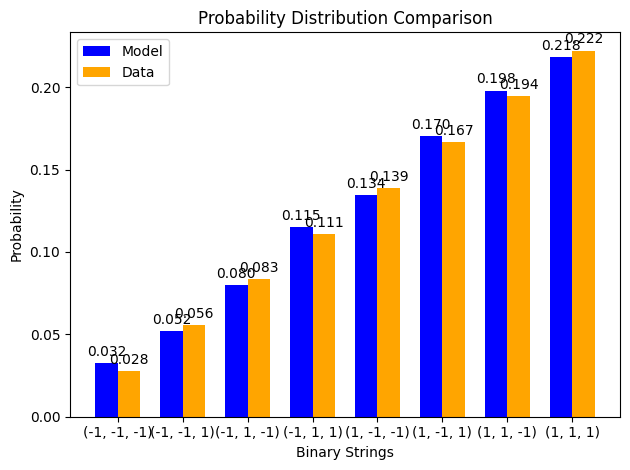

z gradient step for node 0: 3.025163213992821e-06
z gradient step for node 1: 2.4665631281728385e-08
z gradient step for node 2: 1.2042600617417908e-07
z gradient step for node 3: -1.5789633671370319e-07
edge graident step for edge (0, 3): 3.958100674901266e-06
edge graident step for edge (1, 3): -2.2112451664818567e-07
edge graident step for edge (2, 3): -3.0539367153464835e-07
edge graident step for edge (0, 1): -1.0475062381413991e-06
edge graident step for edge (0, 2): -1.2951861885049932e-06
edge graident step for edge (1, 2): -2.397904416216179e-07
x positive phase: 0.0
x negative phase: 2.143252446386562e-08
x gradient step for node 0: -2.143252446386562e-11
x positive phase: 0.0
x negative phase: 5.843545720601769e-08
x gradient step for node 1: -5.84354572060177e-11
x positive phase: 0.0
x negative phase: 2.5737246966617284e-08
x gradient step for node 2: -2.5737246966617285e-11
x positive phase: -0.14926437079855803
x negative phase: -0.149250103880076
x gradient step for nod

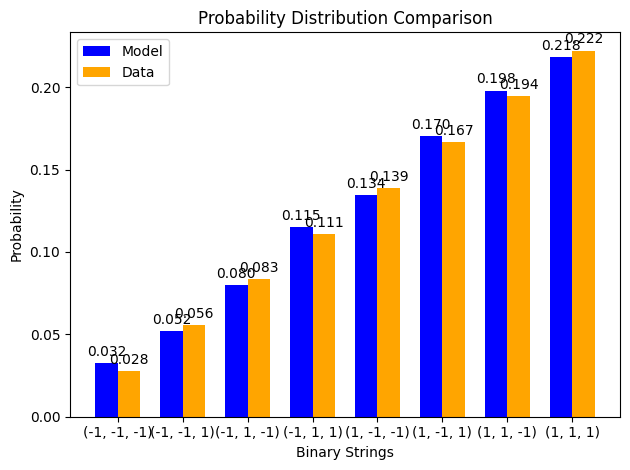

z gradient step for node 0: 3.0210365624234735e-06
z gradient step for node 1: 2.7971964037837305e-08
z gradient step for node 2: 1.2107245786438514e-07
z gradient step for node 3: -1.5441864445087107e-07
edge graident step for edge (0, 3): 3.948476854922334e-06
edge graident step for edge (1, 3): -2.202990755375278e-07
edge graident step for edge (2, 3): -3.0216398410140567e-07
edge graident step for edge (0, 1): -1.0504094172259226e-06
edge graident step for edge (0, 2): -1.2914458894596193e-06
edge graident step for edge (1, 2): -2.4134602879613555e-07
x positive phase: 0.0
x negative phase: 1.9449708633460186e-08
x gradient step for node 0: -1.9449708633460187e-11
x positive phase: 0.0
x negative phase: 5.311297435446078e-08
x gradient step for node 1: -5.311297435446078e-11
x positive phase: 0.0
x negative phase: 2.3380929279974078e-08
x gradient step for node 2: -2.3380929279974078e-11
x positive phase: -0.14927070815068194
x negative phase: -0.14925653272021536
x gradient step f

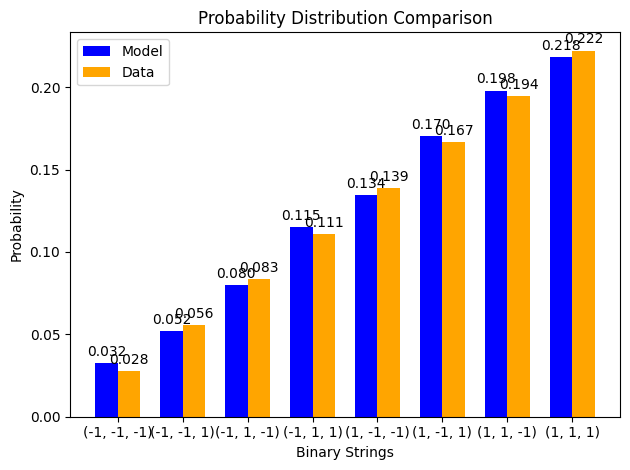

z gradient step for node 0: 3.0168447588306835e-06
z gradient step for node 1: 3.110236742318029e-08
z gradient step for node 2: 1.216887928346122e-07
z gradient step for node 3: -1.5100523894739927e-07
edge graident step for edge (0, 3): 3.939005920885697e-06
edge graident step for edge (1, 3): -2.1937062200333423e-07
edge graident step for edge (2, 3): -2.989676712750189e-07
edge graident step for edge (0, 1): -1.0530229310314194e-06
edge graident step for edge (0, 2): -1.2877856735291487e-06
edge graident step for edge (1, 2): -2.4289159759210975e-07
x positive phase: 0.0
x negative phase: 1.7650328246580358e-08
x gradient step for node 0: -1.765032824658036e-11
x positive phase: 0.0
x negative phase: 4.8275303075945213e-08
x gradient step for node 1: -4.827530307594521e-11
x positive phase: 0.0
x negative phase: 2.1240348302465263e-08
x gradient step for node 2: -2.1240348302465263e-11
x positive phase: -0.14927703155146874
x negative phase: -0.14926295450767235
x gradient step for

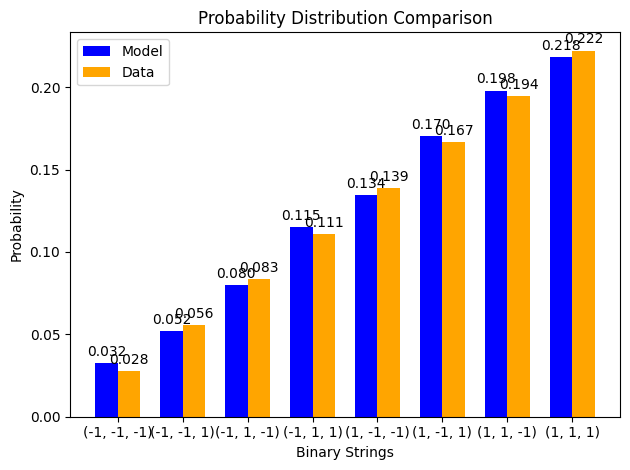

z gradient step for node 0: 3.012592261854241e-06
z gradient step for node 1: 3.406680038420262e-08
z gradient step for node 2: 1.2227650205971775e-07
z gradient step for node 3: -1.476531270205861e-07
edge graident step for edge (0, 3): 3.929680177362282e-06
edge graident step for edge (1, 3): -2.183457583253695e-07
edge graident step for edge (2, 3): -2.958034029725276e-07
edge graident step for edge (0, 1): -1.0553638396861993e-06
edge graident step for edge (0, 2): -1.2842011672832692e-06
edge graident step for edge (1, 2): -2.444271491200134e-07
x positive phase: 0.0
x negative phase: 1.6017413790228046e-08
x gradient step for node 0: -1.6017413790228047e-11
x positive phase: 0.0
x negative phase: 4.387828153897275e-08
x gradient step for node 1: -4.387828153897275e-11
x positive phase: 0.0
x negative phase: 1.9295751222687582e-08
x gradient step for node 2: -1.9295751222687584e-11
x positive phase: -0.1492833406666065
x negative phase: -0.1492693684576191
x gradient step for node

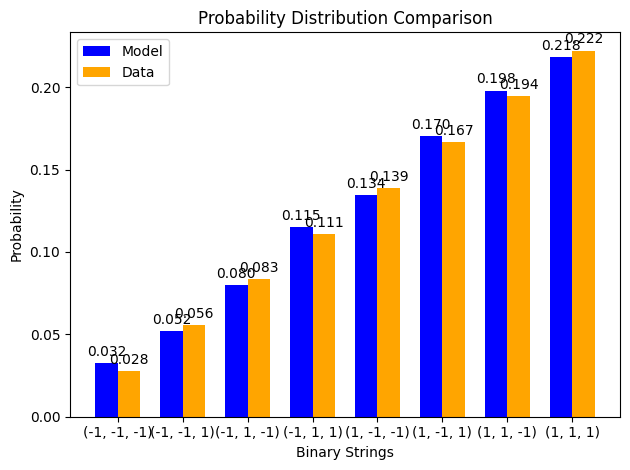

z gradient step for node 0: 3.008283264520184e-06
z gradient step for node 1: 3.6874655208962714e-08
z gradient step for node 2: 1.228370033639903e-07
z gradient step for node 3: -1.4435948333668682e-07
edge graident step for edge (0, 3): 3.920492363098382e-06
edge graident step for edge (1, 3): -2.1723070929895173e-07
edge graident step for edge (2, 3): -2.9266993305926415e-07
edge graident step for edge (0, 1): -1.0574482257656171e-06
edge graident step for edge (0, 2): -1.2806882627223737e-06
edge graident step for edge (1, 2): -2.459526951789637e-07
x positive phase: 0.0
x negative phase: 1.453556550454302e-08
x gradient step for node 0: -1.4535565504543021e-11
x positive phase: 0.0
x negative phase: 3.988177072201582e-08
x gradient step for node 1: -3.988177072201582e-11
x positive phase: 0.0
x negative phase: 1.7529193836930722e-08
x gradient step for node 2: -1.7529193836930722e-11
x positive phase: -0.14928963518436936
x negative phase: -0.14927577383329668
x gradient step for 

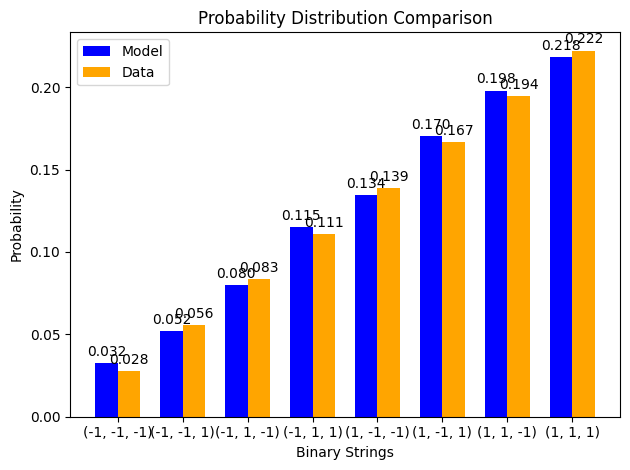

z gradient step for node 0: 3.0039217101998082e-06
z gradient step for node 1: 3.953478970061819e-08
z gradient step for node 2: 1.2337164489406583e-07
z gradient step for node 3: -1.4112164083857072e-07
edge graident step for edge (0, 3): 3.911435626123783e-06
edge graident step for edge (1, 3): -2.1603134353642696e-07
edge graident step for edge (2, 3): -2.8956609387947863e-07
edge graident step for edge (0, 1): -1.0592912498976898e-06
edge graident step for edge (0, 2): -1.2772431011242453e-06
edge graident step for edge (1, 2): -2.474682569352238e-07
x positive phase: 0.0
x negative phase: 1.3190808186542409e-08
x gradient step for node 0: -1.319080818654241e-11
x positive phase: 0.0
x negative phase: 3.624928796674649e-08
x gradient step for node 1: -3.6249287966746487e-11
x positive phase: 0.0
x negative phase: 1.5924374947015788e-08
x gradient step for node 2: -1.5924374947015786e-11
x positive phase: -0.14929591481435156
x negative phase: -0.14928216994333
x gradient step for n

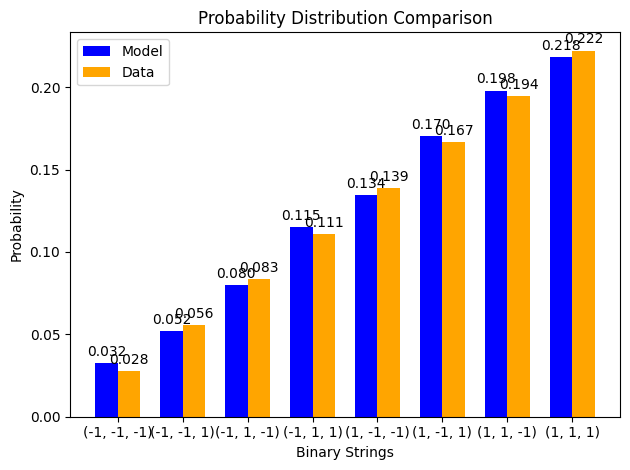

z gradient step for node 0: 2.999511307585079e-06
z gradient step for node 1: 4.2055557541775816e-08
z gradient step for node 2: 1.238817084344146e-07
z gradient step for node 3: -1.3793708171894182e-07
edge graident step for edge (0, 3): 3.902503500310739e-06
edge graident step for edge (1, 3): -2.1475319358835176e-07
edge graident step for edge (2, 3): -2.8649079114223544e-07
edge graident step for edge (0, 1): -1.0609072032313622e-06
edge graident step for edge (0, 2): -1.2738620578601201e-06
edge graident step for edge (1, 2): -2.489738637314887e-07
x positive phase: 0.0
x negative phase: 1.1970459422158615e-08
x gradient step for node 0: -1.1970459422158615e-11
x positive phase: 0.0
x negative phase: 3.2947673910640426e-08
x gradient step for node 1: -3.294767391064043e-11
x positive phase: 0.0
x negative phase: 1.4466485921266095e-08
x gradient step for node 2: -1.4466485921266095e-11
x positive phase: -0.14930217928627043
x negative phase: -0.14928855613919012
x gradient step fo

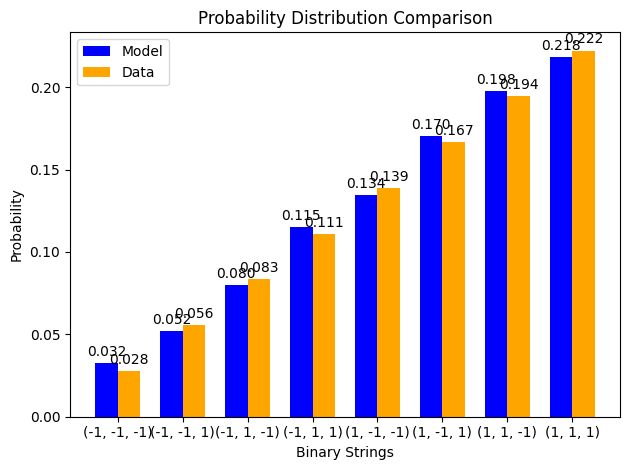

z gradient step for node 0: 2.9950555447441074e-06
z gradient step for node 1: 4.444483693305523e-08
z gradient step for node 2: 1.243684125727118e-07
z gradient step for node 3: -1.348034289131439e-07
edge graident step for edge (0, 3): 3.89368988328187e-06
edge graident step for edge (1, 3): -2.134014749282931e-07
edge graident step for edge (2, 3): -2.8344299913801717e-07
edge graident step for edge (0, 1): -1.0623095569492759e-06
edge graident step for edge (0, 2): -1.2705417281258792e-06
edge graident step for edge (1, 2): -2.504695520185729e-07
x positive phase: 0.0
x negative phase: 1.0863010004933129e-08
x gradient step for node 0: -1.086301000493313e-11
x positive phase: 0.0
x negative phase: 2.994678975868089e-08
x gradient step for node 1: -2.994678975868089e-11
x positive phase: 0.0
x negative phase: 1.3142074030232571e-08
x gradient step for node 2: -1.3142074030232572e-11
x positive phase: -0.1493084283488352
x negative phase: -0.14929493181279638
x gradient step for node

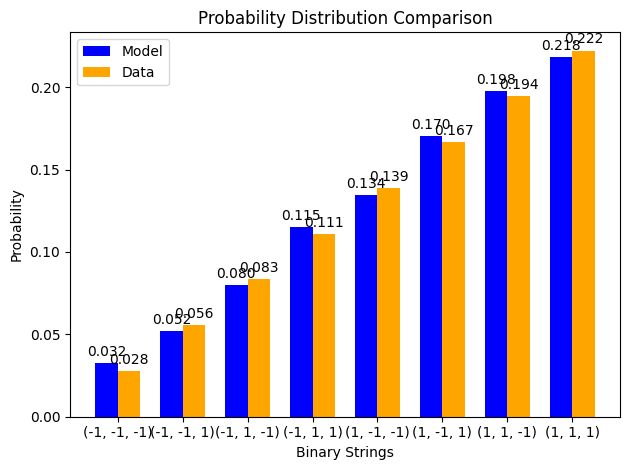

z gradient step for node 0: 2.9905577023122133e-06
z gradient step for node 1: 4.671005761403002e-08
z gradient step for node 2: 1.248329157178124e-07
z gradient step for node 3: -1.3171843807624484e-07
edge graident step for edge (0, 3): 3.88498901560419e-06
edge graident step for edge (1, 3): -2.11981103879183e-07
edge graident step for edge (2, 3): -2.804217562649147e-07
edge graident step for edge (0, 1): -1.0635110089828316e-06
edge graident step for edge (0, 2): -1.267278913535355e-06
edge graident step for edge (1, 2): -2.5195536439831524e-07
x positive phase: 0.0
x negative phase: 9.858015414494715e-09
x gradient step for node 0: -9.858015414494715e-12
x positive phase: 0.0
x negative phase: 2.7219242130766116e-08
x gradient step for node 1: -2.7219242130766116e-11
x positive phase: 0.0
x negative phase: 1.1938918295916594e-08
x gradient step for node 2: -1.1938918295916594e-11
x positive phase: -0.14931466176867744
x negative phase: -0.14930129639425122
x gradient step for nod

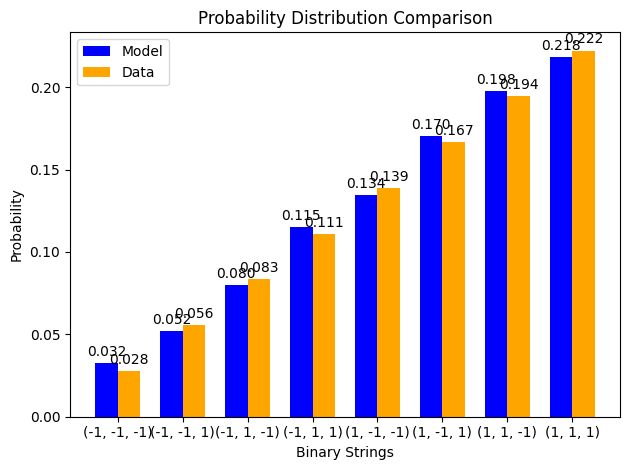

z gradient step for node 0: 2.986020865880512e-06
z gradient step for node 1: 4.8858226354558945e-08
z gradient step for node 2: 1.2527631898272273e-07
z gradient step for node 3: -1.2867999002263987e-07
edge graident step for edge (0, 3): 3.876395461178128e-06
edge graident step for edge (1, 3): -2.1049671453425569e-07
edge graident step for edge (2, 3): -2.7742616084683316e-07
edge graident step for edge (0, 1): -1.064523528088196e-06
edge graident step for edge (0, 2): -1.2640706095190246e-06
edge graident step for edge (1, 2): -2.5343134876368303e-07
x positive phase: 0.0
x negative phase: 8.945997332118686e-09
x gradient step for node 0: -8.945997332118687e-12
x positive phase: 0.0
x negative phase: 2.4740132973090463e-08
x gradient step for node 1: -2.4740132973090463e-11
x positive phase: 0.0
x negative phase: 1.0845916708714836e-08
x gradient step for node 2: -1.0845916708714836e-11
x positive phase: -0.14932087932934057
x negative phase: -0.14930764934969934
x gradient step fo

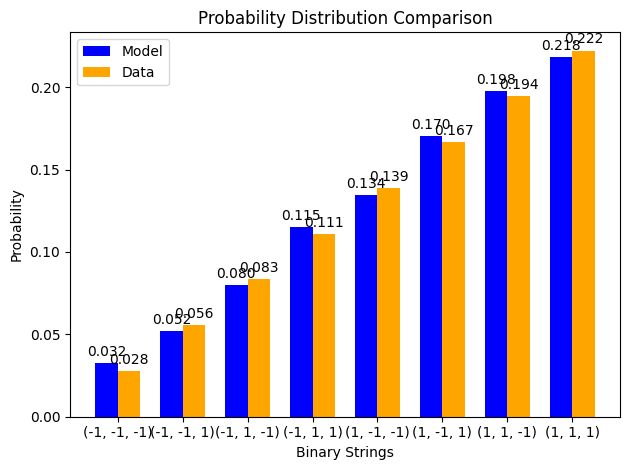

z gradient step for node 0: 2.9814479376240046e-06
z gradient step for node 1: 5.089595100177258e-08
z gradient step for node 2: 1.2569966893102858e-07
z gradient step for node 3: -1.2568608359297962e-07
edge graident step for edge (0, 3): 3.867904088764029e-06
edge graident step for edge (1, 3): -2.0895267472904876e-07
edge graident step for edge (2, 3): -2.744553672189287e-07
edge graident step for edge (0, 1): -1.0653583954260831e-06
edge graident step for edge (0, 2): -1.260913993489099e-06
edge graident step for edge (1, 2): -2.548975575317192e-07
x positive phase: 0.0
x negative phase: 8.118354265206675e-09
x gradient step for node 0: -8.118354265206675e-12
x positive phase: 0.0
x negative phase: 2.2486832250523773e-08
x gradient step for node 1: -2.2486832250523773e-11
x positive phase: 0.0
x negative phase: 9.852983771219406e-09
x gradient step for node 2: -9.852983771219406e-12
x positive phase: -0.14932708083032434
x negative phase: -0.14931399017930552
x gradient step for no

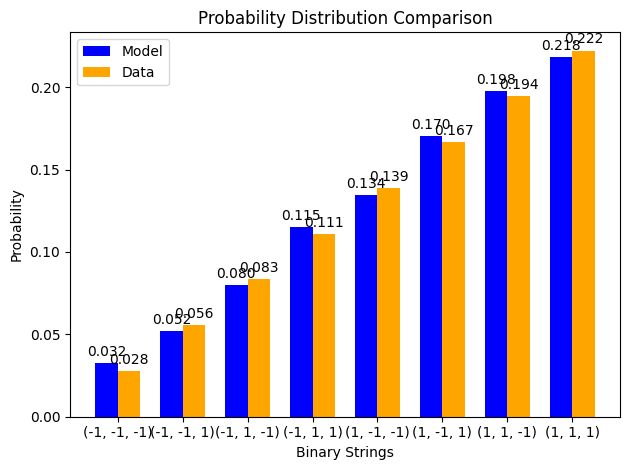

z gradient step for node 0: 2.976841647225781e-06
z gradient step for node 1: 5.282946316251258e-08
z gradient step for node 2: 1.2610396020371062e-07
z gradient step for node 3: -1.227348289352115e-07
edge graident step for edge (0, 3): 3.859510054572468e-06
edge graident step for edge (1, 3): -2.073531011118346e-07
edge graident step for edge (2, 3): -2.7150858207389274e-07
edge graident step for edge (0, 1): -1.066026243792831e-06
edge graident step for edge (0, 2): -1.257806413713633e-06
edge graident step for edge (1, 2): -2.563540469542602e-07
x positive phase: 0.0
x negative phase: 7.367280438333426e-09
x gradient step for node 0: -7.367280438333427e-12
x positive phase: 0.0
x negative phase: 2.0438771344936173e-08
x gradient step for node 1: -2.0438771344936174e-11
x positive phase: 0.0
x negative phase: 8.950957423309885e-09
x gradient step for node 2: -8.950957423309886e-12
x positive phase: -0.14933326608618203
x negative phase: -0.1493203184153435
x gradient step for node 3

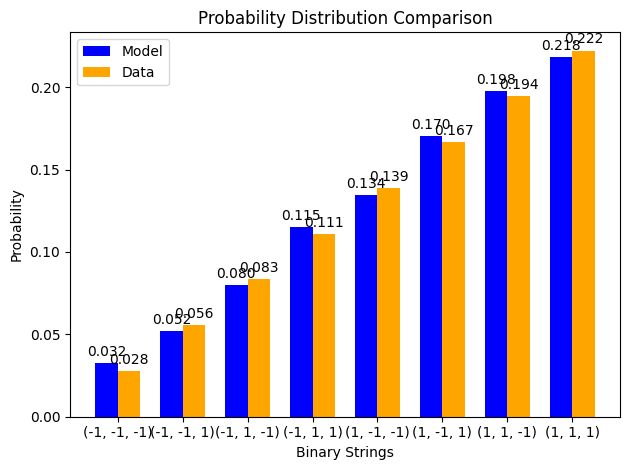

z gradient step for node 0: 2.972204562132097e-06
z gradient step for node 1: 5.4664639602297614e-08
z gradient step for node 2: 1.264901380144956e-07
z gradient step for node 3: -1.1982444116509505e-07
edge graident step for edge (0, 3): 3.85120878585915e-06
edge graident step for edge (1, 3): -2.0570187337369539e-07
edge graident step for edge (2, 3): -2.685850610365803e-07
edge graident step for edge (0, 1): -1.066537094623829e-06
edge graident step for edge (0, 2): -1.2547453788724904e-06
edge graident step for edge (1, 2): -2.578008765048712e-07
x positive phase: 0.0
x negative phase: 6.68569218638448e-09
x gradient step for node 0: -6.685692186384481e-12
x positive phase: 0.0
x negative phase: 1.8577255273407412e-08
x gradient step for node 1: -1.8577255273407414e-11
x positive phase: 0.0
x negative phase: 8.131514489551593e-09
x gradient step for node 2: -8.131514489551593e-12
x positive phase: -0.1493394349256672
x negative phase: -0.14932663362039128
x gradient step for node 3

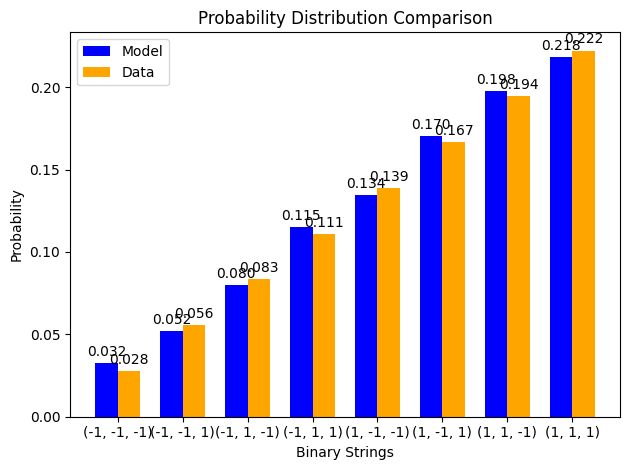

z gradient step for node 0: 2.9675390971915516e-06
z gradient step for node 1: 5.6407022428928144e-08
z gradient step for node 2: 1.2685910053818195e-07
z gradient step for node 3: -1.1695323439164796e-07
edge graident step for edge (0, 3): 3.842995965464169e-06
edge graident step for edge (1, 3): -2.0400264767306275e-07
edge graident step for edge (2, 3): -2.6568410546951025e-07
edge graident step for edge (0, 1): -1.0669003929004162e-06
edge graident step for edge (0, 2): -1.2517285482385455e-06
edge graident step for edge (1, 2): -2.5923810833280994e-07
x positive phase: 0.0
x negative phase: 6.067161155989004e-09
x gradient step for node 0: -6.067161155989004e-12
x positive phase: 0.0
x negative phase: 1.6885292012039672e-08
x gradient step for node 1: -1.6885292012039674e-11
x positive phase: 0.0
x negative phase: 7.387093868564905e-09
x gradient step for node 2: -7.387093868564905e-12
x positive phase: -0.14934558719092747
x negative phase: -0.14933293538562545
x gradient step fo

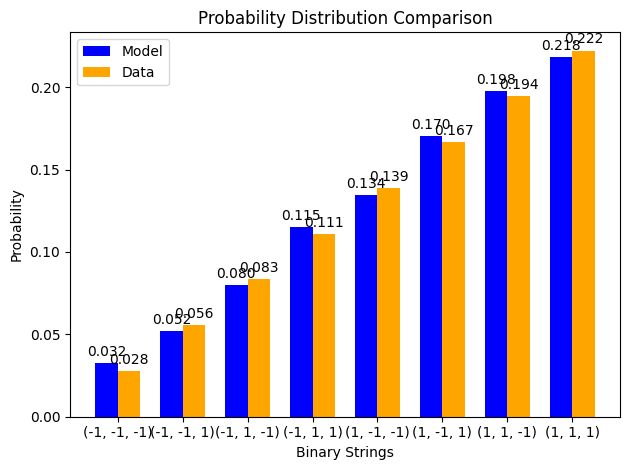

z gradient step for node 0: 2.962847523705625e-06
z gradient step for node 1: 5.806183813084065e-08
z gradient step for node 2: 1.2721170118432103e-07
z gradient step for node 3: -1.1411961608487342e-07
edge graident step for edge (0, 3): 3.834867517240936e-06
edge graident step for edge (1, 3): -2.0225886930733128e-07
edge graident step for edge (2, 3): -2.628050594822851e-07
edge graident step for edge (0, 1): -1.0671250400783593e-06
edge graident step for edge (0, 2): -1.2487537224595557e-06
edge graident step for edge (1, 2): -2.606658067746404e-07
x positive phase: 0.0
x negative phase: 5.505853685599897e-09
x gradient step for node 0: -5.505853685599897e-12
x positive phase: 0.0
x negative phase: 1.5347437367231672e-08
x gradient step for node 1: -1.5347437367231674e-11
x positive phase: 0.0
x negative phase: 6.710826755480087e-09
x gradient step for node 2: -6.710826755480087e-12
x positive phase: -0.14935172273674235
x negative phase: -0.14933922332921004
x gradient step for no

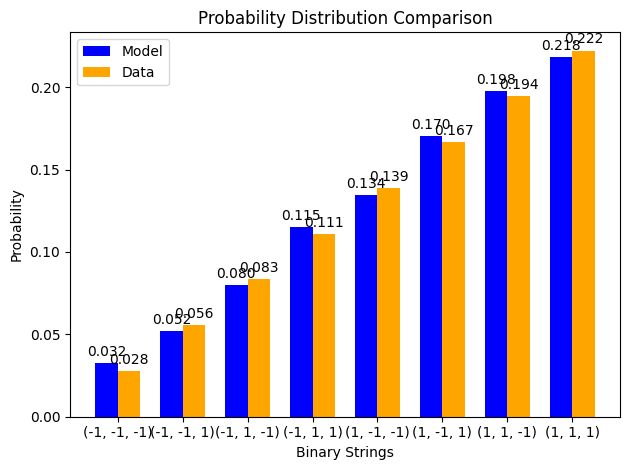

z gradient step for node 0: 2.9581319779350413e-06
z gradient step for node 1: 5.963401553740755e-08
z gradient step for node 2: 1.2754875076170792e-07
z gradient step for node 3: -1.11322081762677e-07
edge graident step for edge (0, 3): 3.826819592325892e-06
edge graident step for edge (1, 3): -2.004737846722504e-07
edge graident step for edge (2, 3): -2.59947307132663e-07
edge graident step for edge (0, 1): -1.0672194251411387e-06
edge graident step for edge (0, 2): -1.2458188349010052e-06
edge graident step for edge (1, 2): -2.620840379232714e-07
x positive phase: 0.0
x negative phase: 4.996475792792274e-09
x gradient step for node 0: -4.996475792792274e-12
x positive phase: 0.0
x negative phase: 1.3949653978190334e-08
x gradient step for node 1: -1.3949653978190335e-11
x positive phase: 0.0
x negative phase: 6.096473253499503e-09
x gradient step for node 2: -6.096473253499503e-12
x positive phase: -0.1493578414298033
x negative phase: -0.14934549709477504
x gradient step for node 3

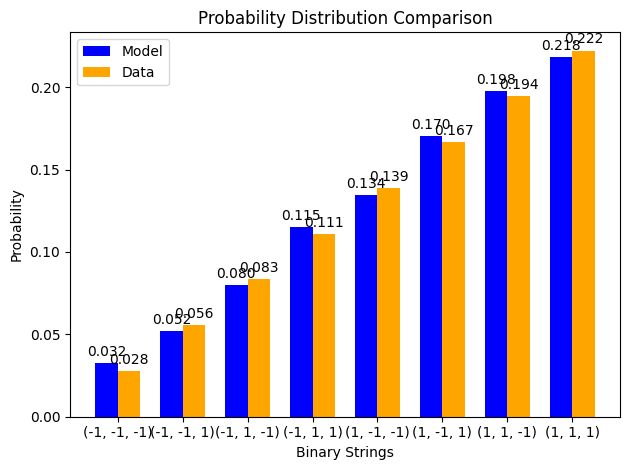

z gradient step for node 0: 2.9533944690941504e-06
z gradient step for node 1: 6.112820275888664e-08
z gradient step for node 2: 1.2787101955187564e-07
z gradient step for node 3: -1.0855920998331658e-07
edge graident step for edge (0, 3): 3.8188485561941875e-06
edge graident step for edge (1, 3): -1.9865045254274795e-07
edge graident step for edge (2, 3): -2.5711026981736776e-07
edge graident step for edge (0, 1): -1.0671914538921552e-06
edge graident step for edge (0, 2): -1.2429219435065448e-06
edge graident step for edge (1, 2): -2.634928692420713e-07
x positive phase: 0.0
x negative phase: 4.534223250188935e-09
x gradient step for node 0: -4.534223250188935e-12
x positive phase: 0.0
x negative phase: 1.2679183163450994e-08
x gradient step for node 1: -1.2679183163450994e-11
x positive phase: 0.0
x negative phase: 5.538364789553773e-09
x gradient step for node 2: -5.5383647895537725e-12
x positive phase: -0.14936394314803342
x negative phase: -0.1493517563499779
x gradient step for

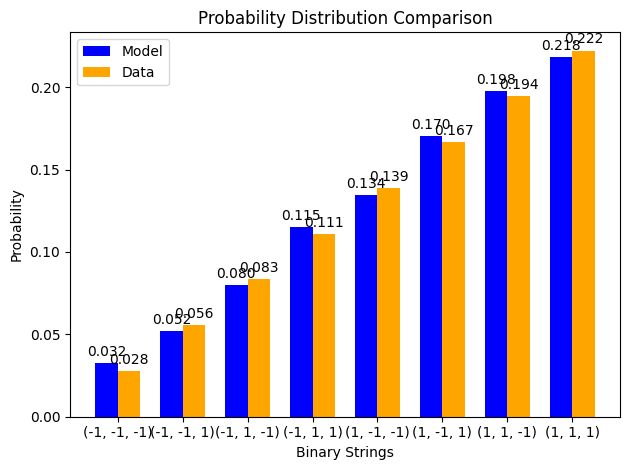

z gradient step for node 0: 2.9486368868610892e-06
z gradient step for node 1: 6.254878315817281e-08
z gradient step for node 2: 1.2817923927037344e-07
z gradient step for node 3: -1.058296576254003e-07
edge graident step for edge (0, 3): 3.810950976459893e-06
edge graident step for edge (1, 3): -1.9679175472206434e-07
edge graident step for edge (2, 3): -2.5429340382512877e-07
edge graident step for edge (0, 1): -1.0670485765866268e-06
edge graident step for edge (0, 2): -1.2400612231666802e-06
edge graident step for edge (1, 2): -2.648923692273875e-07
x positive phase: 0.0
x negative phase: 4.1147362793750284e-09
x gradient step for node 0: -4.114736279375028e-12
x positive phase: 0.0
x negative phase: 1.1524428441424276e-08
x gradient step for node 1: -1.1524428441424276e-11
x positive phase: 0.0
x negative phase: 5.031351802604147e-09
x gradient step for node 2: -5.0313518026041465e-12
x positive phase: -0.14937002777994438
x negative phase: -0.1493580007851467
x gradient step for 

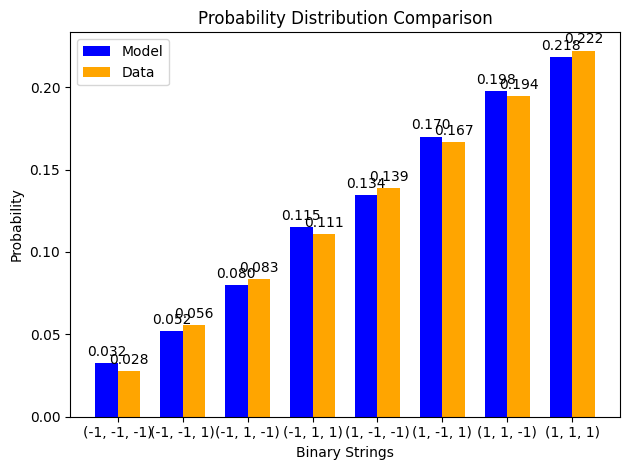

z gradient step for node 0: 2.9438610084404625e-06
z gradient step for node 1: 6.389989042601684e-08
z gradient step for node 2: 1.2847410495256396e-07
z gradient step for node 3: -1.0313215543356069e-07
edge graident step for edge (0, 3): 3.8031236113787447e-06
edge graident step for edge (1, 3): -1.9490040608746705e-07
edge graident step for edge (2, 3): -2.514961980542574e-07
edge graident step for edge (0, 1): -1.0667978139794199e-06
edge graident step for edge (0, 2): -1.2372349585390992e-06
edge graident step for edge (1, 2): -2.662826071075375e-07
x positive phase: 0.0
x negative phase: 3.734058435684483e-09
x gradient step for node 0: -3.7340584356844834e-12
x positive phase: 0.0
x negative phase: 1.047484966155643e-08
x gradient step for node 1: -1.047484966155643e-11
x positive phase: 0.0
x negative phase: 4.5707562218046514e-09
x gradient step for node 2: -4.570756221804652e-12
x positive phase: -0.14937609522402934
x negative phase: -0.14936423011199607
x gradient step for 

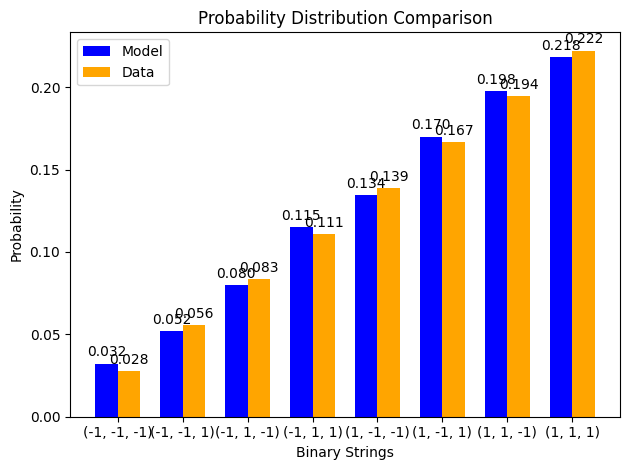

z gradient step for node 0: 2.939068505199538e-06
z gradient step for node 1: 6.518542279310147e-08
z gradient step for node 2: 1.2875627673451795e-07
z gradient step for node 3: -1.0046550382303288e-07
edge graident step for edge (0, 3): 3.795363399006324e-06
edge graident step for edge (1, 3): -1.929789640738172e-07
edge graident step for edge (2, 3): -2.487181718750231e-07
edge graident step for edge (0, 1): -1.0664457819013623e-06
edge graident step for edge (0, 2): -1.2344415373175128e-06
edge graident step for edge (1, 2): -2.676636525797138e-07
x positive phase: 0.0
x negative phase: 3.388599296238251e-09
x gradient step for node 0: -3.388599296238251e-12
x positive phase: 0.0
x negative phase: 9.520866779553182e-09
x gradient step for node 1: -9.520866779553182e-12
x positive phase: 0.0
x negative phase: 4.1523282959432144e-09
x gradient step for node 2: -4.1523282959432144e-12
x positive phase: -0.14938214538818878
x negative phase: -0.14937044406241623
x gradient step for nod

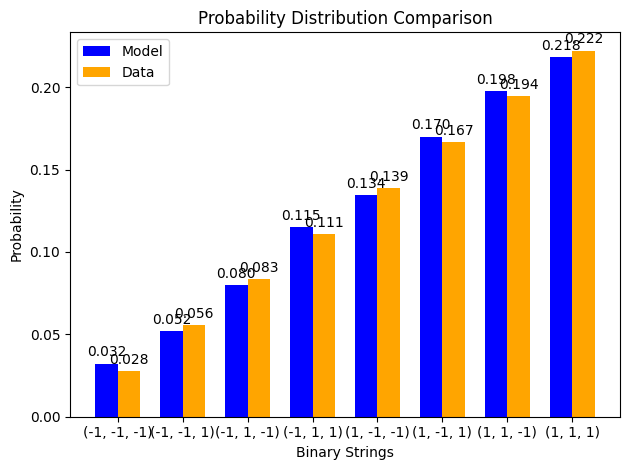

z gradient step for node 0: 2.934260948908807e-06
z gradient step for node 1: 6.640905643298667e-08
z gradient step for node 2: 1.290263815642706e-07
z gradient step for node 3: -9.78285689194891e-08
edge graident step for edge (0, 3): 3.7876674469827234e-06
edge graident step for edge (1, 3): -1.910298376113506e-07
edge graident step for edge (2, 3): -2.4595887313658136e-07
edge graident step for edge (0, 1): -1.0659987144318179e-06
edge graident step for edge (0, 2): -1.231679443901776e-06
edge graident step for edge (1, 2): -2.6903557557703126e-07
x positive phase: 0.0
x negative phase: 3.0751005994600025e-09
x gradient step for node 0: -3.0751005994600026e-12
x positive phase: 0.0
x negative phase: 8.653772398158209e-09
x gradient step for node 1: -8.65377239815821e-12
x positive phase: 0.0
x negative phase: 3.772207375739251e-09
x gradient step for node 2: -3.7722073757392505e-12
x positive phase: -0.1493881781891886
x negative phase: -0.14937664238732834
x gradient step for node 

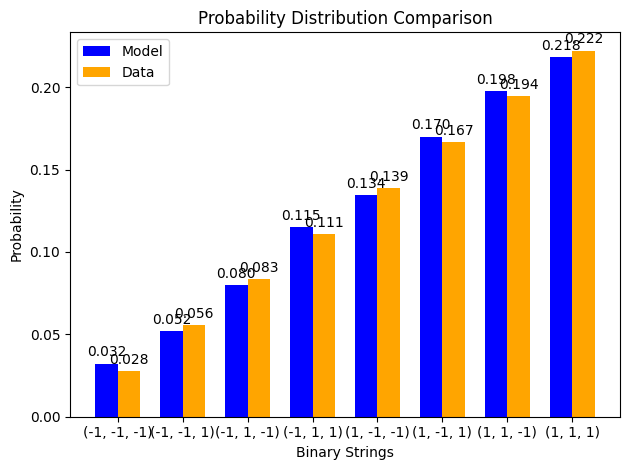

z gradient step for node 0: 2.929439817608237e-06
z gradient step for node 1: 6.75742581101868e-08
z gradient step for node 2: 1.292850148205682e-07
z gradient step for node 3: -9.522027882979955e-08
edge graident step for edge (0, 3): 3.780033022898199e-06
edge graident step for edge (1, 3): -1.8905529557257384e-07
edge graident step for edge (2, 3): -2.4321787629696943e-07
edge graident step for edge (0, 1): -1.065462485750332e-06
edge graident step for edge (0, 2): -1.2289472534628143e-06
edge graident step for edge (1, 2): -2.7039844606660534e-07
x positive phase: 0.0
x negative phase: 2.790605516826694e-09
x gradient step for node 0: -2.790605516826694e-12
x positive phase: 0.0
x negative phase: 7.865652274999842e-09
x gradient step for node 1: -7.865652274999841e-12
x positive phase: 0.0
x negative phase: 3.4268862870562786e-09
x gradient step for node 2: -3.4268862870562786e-12
x positive phase: -0.14939419355214764
x negative phase: -0.14938282485560325
x gradient step for node

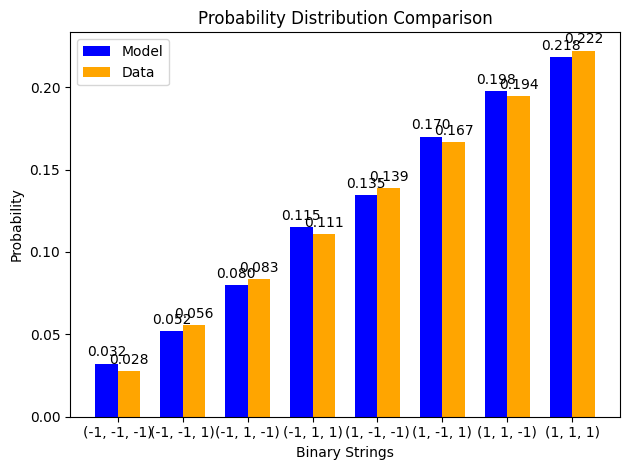

z gradient step for node 0: 2.9246065011255816e-06
z gradient step for node 1: 6.868429710144008e-08
z gradient step for node 2: 1.2953274186386366e-07
z gradient step for node 3: -9.263962011996085e-08
edge graident step for edge (0, 3): 3.772457545213437e-06
edge graident step for edge (1, 3): -1.87057474728039e-07
edge graident step for edge (2, 3): -2.4049478068285947e-07
edge graident step for edge (0, 1): -1.064842630743551e-06
edge graident step for edge (0, 2): -1.2262436263623112e-06
edge graident step for edge (1, 2): -2.717523338710559e-07
x positive phase: 0.0
x negative phase: 2.5324307671352784e-09
x gradient step for node 0: -2.5324307671352786e-12
x positive phase: 0.0
x negative phase: 7.1493130717536066e-09
x gradient step for node 1: -7.149313071753607e-12
x positive phase: 0.0
x negative phase: 3.113178966229144e-09
x gradient step for node 2: -3.1131789662291443e-12
x positive phase: -0.14940019141005392
x negative phase: -0.14938899125304061
x gradient step for no

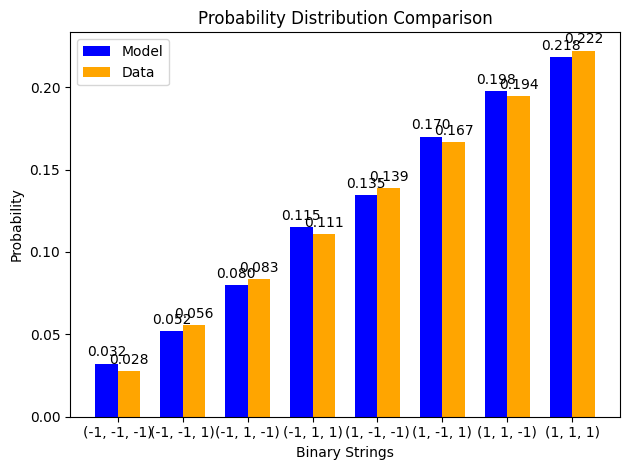

z gradient step for node 0: 2.9197623062626745e-06
z gradient step for node 1: 6.97422564438499e-08
z gradient step for node 2: 1.2977009950704278e-07
z gradient step for node 3: -9.008563449985908e-08
edge graident step for edge (0, 3): 3.7649385746972853e-06
edge graident step for edge (1, 3): -1.8503838726244283e-07
edge graident step for edge (2, 3): -2.3778920885819676e-07
edge graident step for edge (0, 1): -1.0641443644388432e-06
edge graident step for edge (0, 2): -1.2235673029192817e-06
edge graident step for edge (1, 2): -2.7309730851757255e-07
x positive phase: 0.0
x negative phase: 2.298141310360944e-09
x gradient step for node 0: -2.298141310360944e-12
x positive phase: 0.0
x negative phase: 6.498216684977349e-09
x gradient step for node 1: -6.498216684977349e-12
x positive phase: 0.0
x negative phase: 2.8281910588117618e-09
x gradient step for node 2: -2.8281910588117617e-12
x positive phase: -0.14940617170330764
x negative phase: -0.14939514138140456
x gradient step for 

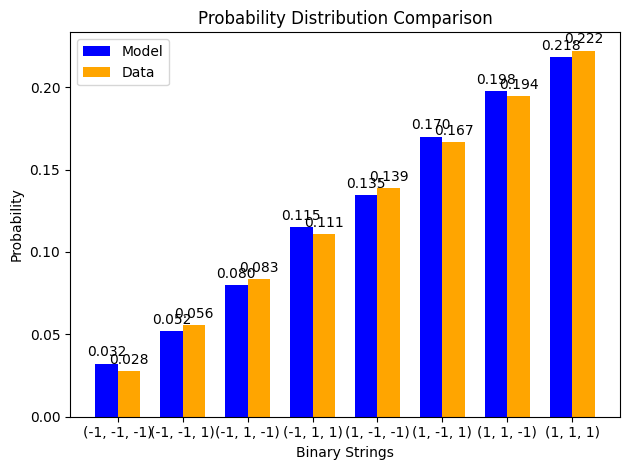

z gradient step for node 0: 2.9149084616755807e-06
z gradient step for node 1: 7.075104354276052e-08
z gradient step for node 2: 1.2999759741968986e-07
z gradient step for node 3: -8.75574156924408e-08
edge graident step for edge (0, 3): 3.7574738063569923e-06
edge graident step for edge (1, 3): -1.8299992786013907e-07
edge graident step for edge (2, 3): -2.351008050988923e-07
edge graident step for edge (0, 1): -1.0633726003254351e-06
edge graident step for edge (0, 2): -1.2209170984946588e-06
edge graident step for edge (1, 2): -2.744334391032721e-07
x positive phase: 0.0
x negative phase: 2.0855273824988806e-09
x gradient step for node 0: -2.0855273824988806e-12
x positive phase: 0.0
x negative phase: 5.906420559063694e-09
x gradient step for node 1: -5.906420559063695e-12
x positive phase: 0.0
x negative phase: 2.569293210401106e-09
x gradient step for node 2: -2.569293210401106e-12
x positive phase: -0.14941213437928916
x negative phase: -0.14940127505751288
x gradient step for no

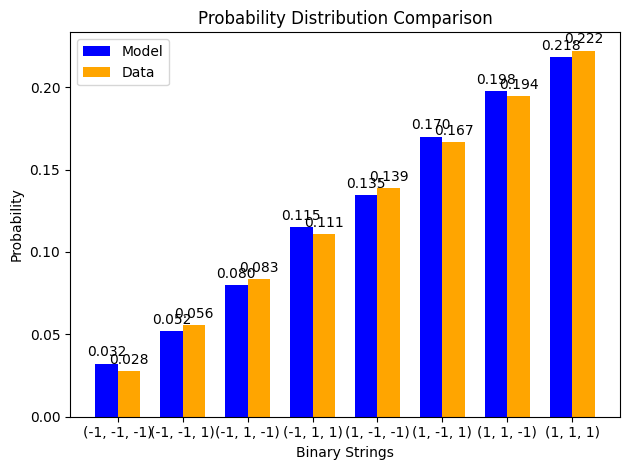

z gradient step for node 0: 2.9100461224654818e-06
z gradient step for node 1: 7.17134001741171e-08
z gradient step for node 2: 1.3021571946532363e-07
z gradient step for node 3: -8.505410648462775e-08
edge graident step for edge (0, 3): 3.7500610618259045e-06
edge graident step for edge (1, 3): -1.8094388039090192e-07
edge graident step for edge (2, 3): -2.3242923397195913e-07
edge graident step for edge (0, 1): -1.0625319676337702e-06
edge graident step for edge (0, 2): -1.2182918988745544e-06
edge graident step for edge (1, 2): -2.7576079418037413e-07
x positive phase: 0.0
x negative phase: 1.892583654849714e-09
x gradient step for node 0: -1.892583654849714e-12
x positive phase: 0.0
x negative phase: 5.368523436369037e-09
x gradient step for node 1: -5.3685234363690375e-12
x positive phase: 0.0
x negative phase: 2.334096803038724e-09
x gradient step for node 2: -2.334096803038724e-12
x positive phase: -0.1494180793919514
x negative phase: -0.14940739211237664
x gradient step for no

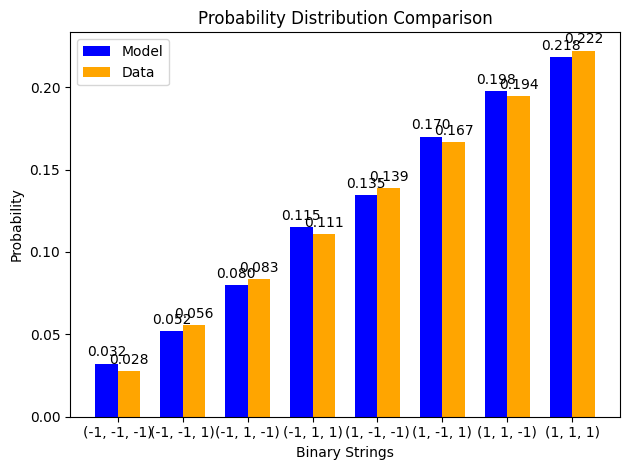

z gradient step for node 0: 2.905176374492613e-06
z gradient step for node 1: 7.263191191958507e-08
z gradient step for node 2: 1.3042492497178372e-07
z gradient step for node 3: -8.257489594420964e-08
edge graident step for edge (0, 3): 3.742698282190704e-06
edge graident step for edge (1, 3): -1.7887192421796315e-07
edge graident step for edge (2, 3): -2.2977417900210685e-07
edge graident step for edge (0, 1): -1.0616268276266438e-06
edge graident step for edge (0, 2): -1.2156906559423753e-06
edge graident step for edge (1, 2): -2.770794416613598e-07
x positive phase: 0.0
x negative phase: 1.7174903212362547e-09
x gradient step for node 0: -1.7174903212362547e-12
x positive phase: 0.0
x negative phase: 4.879616049218686e-09
x gradient step for node 1: -4.879616049218687e-12
x positive phase: 0.0
x negative phase: 2.1204319132616488e-09
x gradient step for node 2: -2.1204319132616487e-12
x positive phase: -0.1494240067014343
x negative phase: -0.14941349239038804
x gradient step for n

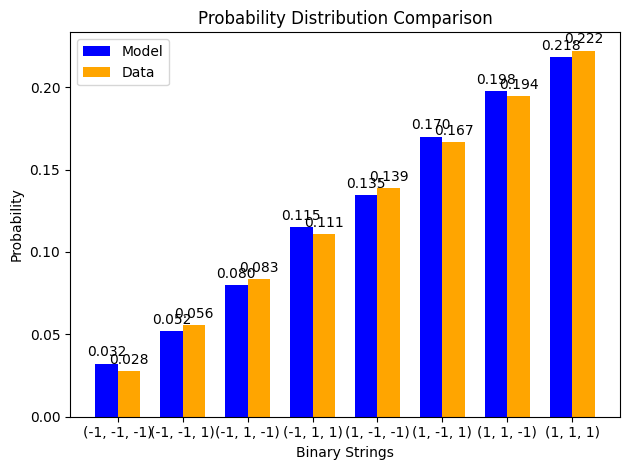

z gradient step for node 0: 2.9003002384399013e-06
z gradient step for node 1: 7.350901706557056e-08
z gradient step for node 2: 1.3062564994605064e-07
z gradient step for node 3: -8.011901679771949e-08
edge graident step for edge (0, 3): 3.7353835212253774e-06
edge graident step for edge (1, 3): -1.7678564014822486e-07
edge graident step for edge (2, 3): -2.2713534142990156e-07
edge graident step for edge (0, 1): -1.0606612889583617e-06
edge graident step for edge (0, 2): -1.2131123836083418e-06
edge graident step for edge (1, 2): -2.783894487331795e-07
x positive phase: 0.0
x negative phase: 1.5585959348147036e-09
x gradient step for node 0: -1.5585959348147037e-12
x positive phase: 0.0
x negative phase: 4.43523630360604e-09
x gradient step for node 1: -4.43523630360604e-12
x positive phase: 0.0
x negative phase: 1.926327288378503e-09
x gradient step for node 2: -1.926327288378503e-12
x positive phase: -0.14942991627370117
x negative phase: -0.14941957574855302
x gradient step for no

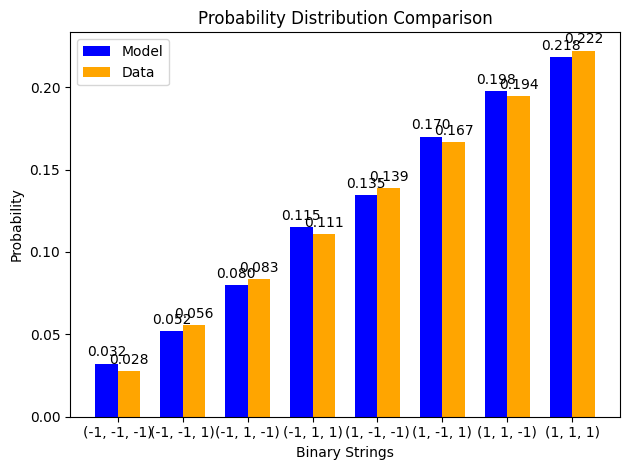

z gradient step for node 0: 2.8954186736326325e-06
z gradient step for node 1: 7.434701499106633e-08
z gradient step for node 2: 1.308183082249781e-07
z gradient step for node 3: -7.768574295574649e-08
edge graident step for edge (0, 3): 3.72811493900993e-06
edge graident step for edge (1, 3): -1.7468651604431173e-07
edge graident step for edge (2, 3): -2.2451243905058372e-07
edge graident step for edge (0, 1): -1.059639222162484e-06
edge graident step for edge (0, 2): -1.2105561539951792e-06
edge graident step for edge (1, 2): -2.7969088179241595e-07
x positive phase: 0.0
x negative phase: 1.4144018326382186e-09
x gradient step for node 0: -1.4144018326382186e-12
x positive phase: 0.0
x negative phase: 4.031328545412604e-09
x gradient step for node 1: -4.031328545412604e-12
x positive phase: 0.0
x negative phase: 1.74999215617315e-09
x gradient step for node 2: -1.74999215617315e-12
x positive phase: -0.14943580808019502
x negative phase: -0.14942564205576697
x gradient step for node 

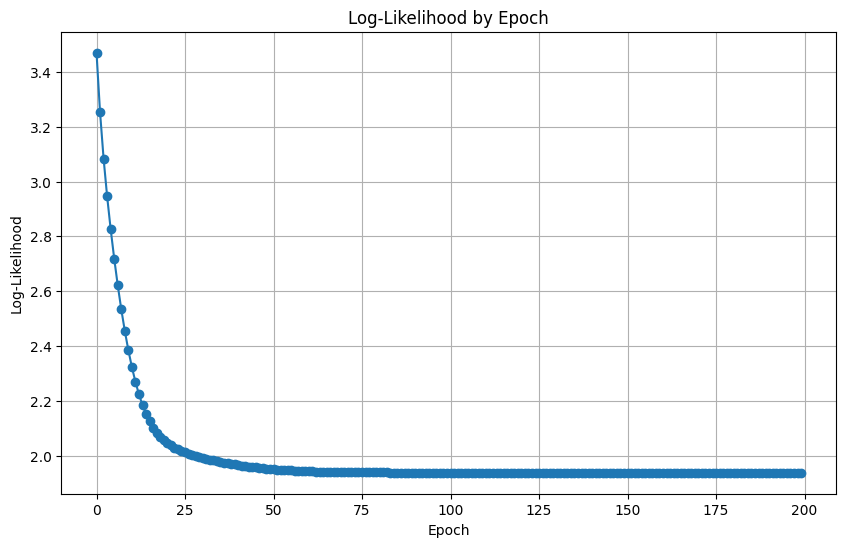

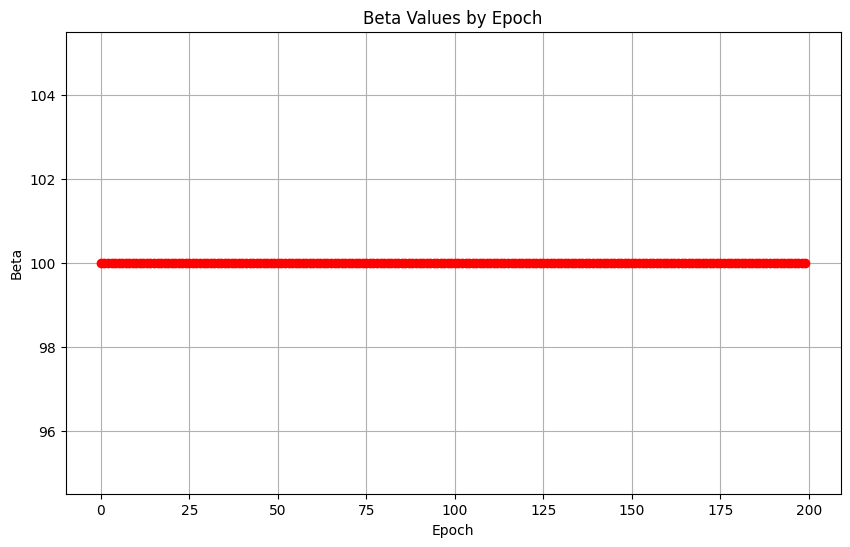

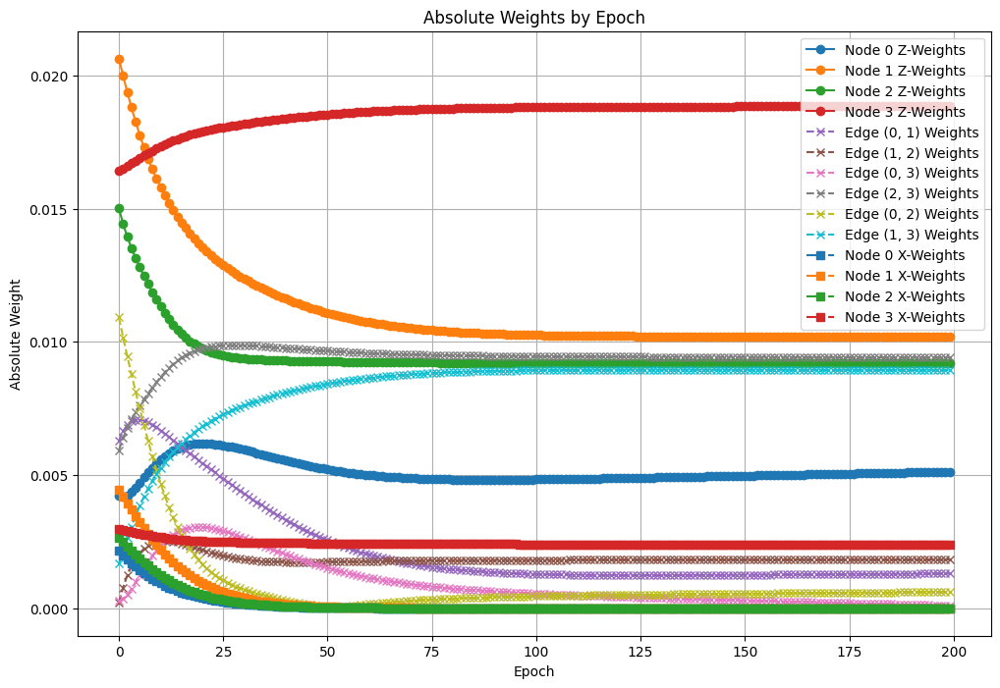

In [27]:
data = [(-1,-1,-1),
        (-1,-1,1), (-1,-1,1),
        (-1,1,-1), (-1,1,-1), (-1,1,-1),
        (-1,1,1), (-1,1,1), (-1,1,1), (-1,1,1),
        (1,-1,-1), (1,-1,-1), (1,-1,-1), (1,-1,-1), (1,-1,-1),
        (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1), (1,-1,1),
        (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1), (1,1,-1),
        (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1), (1,1,1)]


qbm = RBM(numInputNodes = 2,
                    numOutputNodes = 1,
                    numHiddenNodes = 1,
                    beta=100,
                    vvEdges=True,
                    qrbm = True, 
                    trainTransverse = True)
qbm.drawQBM()


qbm.train(data=data,
          optimizer=None,
          alpha=.001,
          epochs=200,
          tempSchedule=None,
          finalBeta=None,
          betaGrowthEpochs=None,
          verbose=True,
          infoEveryNepochs=1)